In [8]:
from tensorflow.keras.layers.experimental.preprocessing import StringLookup
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

import os
print(keras)


<module 'tensorflow.keras' from '/Users/apple/opt/anaconda3/lib/python3.9/site-packages/keras/api/_v2/keras/__init__.py'>


In [9]:
base_path="data"
words_list= []

words=open(f"{base_path}/words.txt","r").readlines()
for line in words:
  if(line[0]=='#'):
    continue
  if line.split(" ")[1]!="err":
    words_list.append(line)

print(len(words_list))
np.random.shuffle(words_list)

96456


In [10]:
split_idx=int(0.9*len(words_list))
train_samples=words_list[:split_idx]
test_samples=words_list[split_idx:]

val_split_idx=int(0.5*len(test_samples))
validation_samples=test_samples[:val_split_idx]
test_samples=test_samples[val_split_idx:]

assert len(words_list)==len(train_samples)+len(validation_samples)+len(test_samples)
print(f"total training samples: {len(train_samples)}")
print(f"total validatuon samples: {len(validation_samples)}")
print(f"total test samples: {len(test_samples)}")
print(train_samples[0])

total training samples: 86810
total validatuon samples: 4823
total test samples: 4823
f04-004-04-06 ok 146 1434 1424 170 134 NN girl



In [29]:
base_image_path=os.path.join(base_path,"words")

def get_image_path_and_labels(samples):
  paths=[]
  corrected_samples=[]
  for(i,file_line) in enumerate(samples):
    line_split=file_line.strip()
    line_split=line_split.split(" ")
    # print(line_split)
    image_name=line_split[0]
    # print(image_name)
    partI=image_name.split("-")[0]
    # print(partI)
    partII=image_name.split("-")[1]
    # print(partII)
    img_path=os.path.join(base_image_path,partI,partI+'-'+partII,image_name+".png")
    # print(img_path)
    # print(os.path.getsize(img_path))
    if os.path.getsize(img_path):
      paths.append(img_path)
      # print(paths[0])
      corrected_samples.append(file_line.split("\n")[0])
    # print(corrected_samples[0])

  return paths,corrected_samples
train_img_paths,train_labels=get_image_path_and_labels(train_samples)
validation_img_paths,validation_labels=get_image_path_and_labels(validation_samples)
test_img_paths,test_labels=get_image_path_and_labels(test_samples)


In [30]:
print(train_img_paths[0:10])
print('\n');

print(train_labels[0:10])

['data/words/e04/e04-030/e04-030-04-08.png', 'data/words/k02/k02-102/k02-102-05-03.png', 'data/words/a01/a01-082u/a01-082u-01-04.png', 'data/words/m01/m01-000/m01-000-07-00.png', 'data/words/g01/g01-031/g01-031-07-06.png', 'data/words/f07/f07-081b/f07-081b-01-06.png', 'data/words/n03/n03-082/n03-082-04-03.png', 'data/words/g06/g06-018c/g06-018c-04-05.png', 'data/words/g06/g06-011j/g06-011j-06-06.png', 'data/words/f04/f04-024/f04-024-01-06.png']


['e04-030-04-08 ok 170 1489 1499 120 39 JJ sure', 'k02-102-05-03 ok 182 836 1623 69 52 PP3A he', 'a01-082u-01-04 ok 172 1582 1043 234 88 IN during', 'm01-000-07-00 ok 196 339 1998 75 107 INO of', 'g01-031-07-06 ok 152 1912 2038 167 59 NN booty', 'f07-081b-01-06 ok 168 1366 924 350 88 NN gastronomy', 'n03-082-04-03 ok 165 992 1414 118 135 NN boy', 'g06-018c-04-05 ok 182 1298 1438 96 58 ATI The', 'g06-011j-06-06 ok 182 1222 1785 146 95 CC and', 'f04-024-01-06 ok 183 1104 981 60 70 IN in']


In [31]:
train_labels_cleaned=[]
characters=set()
max_len=0

for label in train_labels:
  label=label.split(" ")[-1].strip()
  for char in label:
    characters.add(char);
  max_len=max(max_len,len(label))
  train_labels_cleaned.append(label)

print("maximum lenght: ",max_len)zz
print("vocab size: ", len(characters))

train_labels_cleaned[0:10]

maximum lenght:  21
vocab size:  78


['sure',
 'he',
 'during',
 'of',
 'booty',
 'gastronomy',
 'boy',
 'The',
 'and',
 'in']

In [32]:
def clean_labels(labels):
  cleaned_labels=[]
  for label in labels:
    label=label.split(" ")[-1].strip()
    cleaned_labels.append(label)
  return cleaned_labels

validation_labels_cleaned=clean_labels(validation_labels)
test_labels_cleaned =clean_labels(test_labels)

In [33]:
AUTOTUNE=tf.data.AUTOTUNE

char_to_num=StringLookup(vocabulary=list(characters),mask_token=None)

num_to_char=StringLookup(vocabulary=char_to_num.get_vocabulary(),mask_token=None,invert=True)

In [34]:
def distortion_free_resize(image,img_size):
  w,h =img_size
  image=tf.image.resize(image,size=(h,w),preserve_aspect_ratio=True)

  pad_height=h-tf.shape(image)[0]
  pad_width= w-tf.shape(image)[1]

  if pad_height%2 !=0:
    height=pad_height//2
    pad_height_top=height+1
    pad_height_bottom=height
  else:
    pad_height_top=pad_height_bottom=pad_height//2
  
  if pad_width%2 != 0:
    width=pad_width//2
    pad_width_left=width+1
    pad_width_right=width
  else:
    pad_width_left=pad_width//2
    pad_width_right=pad_width//2
  
  image=tf.pad(
      image,
      paddings=[
                [pad_height_top,pad_height_bottom],
                [pad_width_left,pad_width_right],
                [0,0],
      ],
      )
  image=tf.transpose(image,perm=[1,0,2]);
  image=tf.image.flip_left_right(image)
  return image

In [35]:
batch_size=64
padding_token=99
image_width=128
image_height=32

def preprocess_image(image_path,img_size=(image_width,image_height)):
  image=tf.io.read_file(image_path)
  print(image)
  image=tf.image.decode_png(image,1)
  image=distortion_free_resize(image,img_size)
  image=tf.cast(image,tf.float32)/255.0
  return image

def vectorize_label(label):
  label=char_to_num(tf.strings.unicode_split(label,input_encoding="UTF-8"))
  length=tf.shape(label)[0]
  pad_amount=max_len-length
  label=tf.pad(label,paddings=[[0,pad_amount]],constant_values=padding_token)
  return label

def process_images_labels(image_path,label):
  image=preprocess_image(image_path)
  label=vectorize_label(label)
  return {"image":image,"label":label}

def prepare_dataset(image_paths,labels):
  dataset=tf.data.Dataset.from_tensor_slices((image_paths,labels)).map(process_images_labels,num_parallel_calls=AUTOTUNE)
  return dataset.batch(batch_size).cache().prefetch(AUTOTUNE)

In [36]:
train_ds=prepare_dataset(train_img_paths,train_labels_cleaned)
validation_ds=prepare_dataset(validation_img_paths,validation_labels_cleaned)
test_ds=prepare_dataset(test_img_paths,test_labels_cleaned)

Tensor("ReadFile:0", shape=(), dtype=string)
Tensor("ReadFile:0", shape=(), dtype=string)
Tensor("ReadFile:0", shape=(), dtype=string)


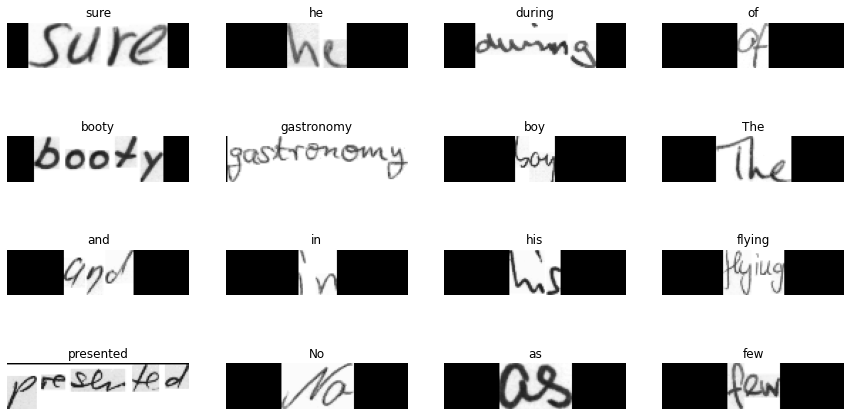

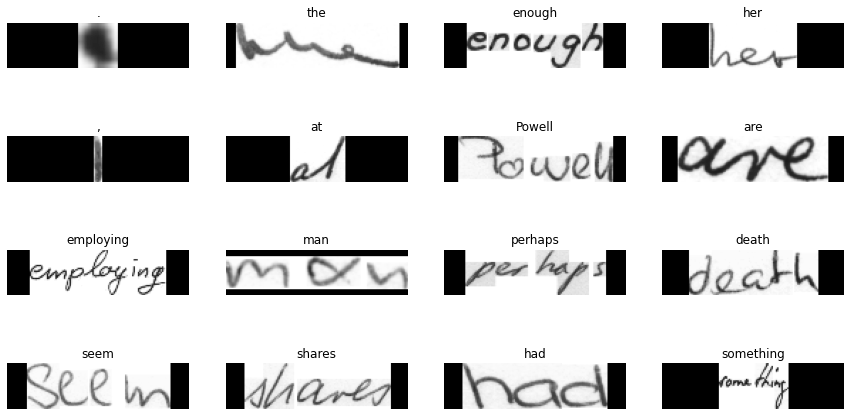

2022-06-28 15:32:47.455869: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


In [37]:
for data in train_ds.take(2):
  image,labels =data["image"],data["label"]
  # print(image)
  _,ax=plt.subplots(4,4,figsize=(15,8))

  for i in range(16):
    img=image[i]
    img=tf.image.flip_left_right(img)
    img=tf.transpose(img,perm=[1,0,2])
    img=(img*255.0).numpy().clip(0,255).astype(np.uint8)
    img=img[:,:,0]

    label=labels[i]
    indices=tf.gather(label,tf.where(tf.math.not_equal(label,padding_token)))

    label = tf.strings.reduce_join(num_to_char(indices))
    label=label.numpy().decode("utf-8")

    ax[i//4,i%4].imshow(img,cmap="gray")
    ax[i//4,i%4].set_title(label)
    ax[i//4,i%4].axis("off")
  
  plt.show()

In [38]:

class CTCLayer(keras.layers.Layer):
  def __init__(self,name=None):
    super().__init__(name=name)
    self.loss_fn=keras.backend.ctc_batch_cost

  def call(self,y_true,y_pred):
    batch_len=tf.cast(tf.shape(y_true)[0],dtype="int64")
    input_length=tf.cast(tf.shape(y_pred)[1],dtype="int64")
    label_length=tf.cast(tf.shape(y_true)[1],dtype="int64")

    input_length=input_length*tf.ones(shape=(batch_len,1),dtype="int64")
    label_length=input_length*tf.ones(shape=(batch_len,1),dtype="int64")
    loss=self.loss_fn(y_true,y_pred,input_length,label_length)
    self.add_loss(loss)

    return y_pred
  
def build_model():
  input_img=keras.Input(shape=(image_width,image_height,1),name="image")
  labels=keras.layers.Input(name="label",shape=(None,))

  x=keras.layers.Conv2D(
      32,
      (3,3),
      activation="relu",
      kernel_initializer="he_normal",
      padding="same",
      name="Conv1",
      )(input_img)
  x=keras.layers.MaxPooling2D((2,2),name="pool1")(x)

  x=keras.layers.Conv2D(
      64,
      (3,3),
      activation="relu",
      kernel_initializer="he_normal",
      padding="same",
      name="Conv2",
    )(x)
  x=keras.layers.MaxPooling2D((2,2),name="pool2")(x)
  new_shape= ((image_width//4),(image_height//4)*64)
  x=keras.layers.Reshape(target_shape=new_shape,name="reshape")(x)
  x=keras.layers.Dense(64,activation="relu",name="dense1")(x)
  x=keras.layers.Dropout(0.2)(x)

  x=keras.layers.Bidirectional(
      keras.layers.LSTM(128,return_sequences=True,dropout=0.25)
  )(x)
  x=keras.layers.Bidirectional(
      keras.layers.LSTM(64,return_sequences=True,dropout=0.25)
  )(x)

  x=keras.layers.Dense(
      len(char_to_num.get_vocabulary())+2,activation="softmax",name="dense2"
  )(x)

  output=CTCLayer(name="ctc_loss")(labels,x);
  model=keras.models.Model(inputs=[input_img,labels],outputs=output,name="handwriting_recognizer")
  opt=keras.optimizers.Adam()
  model.compile(optimizer=opt)
  return model

model=build_model()
model.summary()
    
    

Model: "handwriting_recognizer"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 image (InputLayer)             [(None, 128, 32, 1)  0           []                               
                                ]                                                                 
                                                                                                  
 Conv1 (Conv2D)                 (None, 128, 32, 32)  320         ['image[0][0]']                  
                                                                                                  
 pool1 (MaxPooling2D)           (None, 64, 16, 32)   0           ['Conv1[0][0]']                  
                                                                                                  
 Conv2 (Conv2D)                 (None, 64, 16, 64)   18496       ['pool1[0][0

In [39]:
validation_images=[]
validation_labels=[]

for batch in validation_ds:
  validation_images.append(batch["image"])
  validation_labels.append(batch["label"])

In [40]:
print(keras)
def calculate_edit_distance(labels,predictions):
  sparse_labels=tf.cast(tf.sparse.from_dense(labels),dtype=tf.int64)

  input_len=np.ones(predictions.shape[0])*predictions.shape[1]

  predictions_decoded=keras.backend.ctc_decode(
      predictions,input_length=input_len,greedy=True
  )[0][0][:, :max_len]

  sparse_predictions=tf.cast(tf.sparse.from_dense(predictions_decoded),dtype=tf.int64)
  
  edit_distance=tf.edit_distance(sparse_predictions,sparse_labels,normalize=False)

  return tf.reduce_mean(edit_distance)

class EditDistanceCallback(keras.callbacks.Callback):
  def __init__(self,pred_model):
    super().__init__()
    self.prediction_model=pred_model

  def on_epoch_end(self,epoch,logs=None):
    edit_distances=[]

    for i in range(len(validation_images)):
      labels=validation_labels[i]
      predictions=self.prediction_model.predict(validation_images[i])
#       print(labels,predictions)
      edit_distances.append(calculate_edit_distance(labels,predictions).numpy())

      print(f"Mean edit distance for epoch {epoch+1}:{np.mean(edit_distances):.4f}")

<module 'tensorflow.keras' from '/Users/apple/opt/anaconda3/lib/python3.9/site-packages/keras/api/_v2/keras/__init__.py'>


In [46]:
epochs=50
model=build_model()
prediction_model=keras.models.Model(
    model.get_layer(name="image").input,model.get_layer(name="dense2").output
)
edit_distance_callback=EditDistanceCallback(prediction_model)

history=model.fit(
    train_ds,
    validation_data=validation_ds,
    epochs=epochs,
    callbacks=[edit_distance_callback],
)


Epoch 1/50
2/2 [==============================] - 2s 47ms/steps - loss: 13.42
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.66006672e-05 2.11166423e-02 2.65662760e-01 ... 7.68273196e-04
   4.65656267e-05 4.45296150e-03]
  [4.58969271e-06 1.09528989e-01 1.01182573e-02 ... 2.30667632e-04
   2.57403440e-06 1.92102175e-02]
  [7.30378190e-07 2.16509402e-02 5.13534481e-03 ... 6.01876563e-05
   3.18105407e-07 6.95064664e-01]
  ...
  [5.79880002e-08 2.16752014e-05 8.97234422e-04 ... 3.33266848e-06
   2.02951096e-08 9.93120074e-01]
  [3.02987416e-07 4.95693130e-05 2.38409359e-03 ... 1.24505750e-05
   1.11433287e-07 9.81906950e-01]
  [6.45213549e-06 2.29923768e-04 1.54790506e-02 ... 1.39773634e-04
   3.41273517e-06 8.91081631e-01]]

 [[1.48157284e-04 1.71078127e-02 4.81544770e-02 ... 7.50091742e-04
   2.22181246e-04 8.93770158e-03]
  [1.53995

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.45248942e-05 1.18708145e-02 3.24181020e-01 ... 7.21720746e-04
   7.50388936e-05 3.44224111e-03]
  [8.15631574e-06 7.23097026e-02 1.80161987e-02 ... 2.82389490e-04
   5.48405978e-06 1.75225697e-02]
  [1.77668676e-06 3.43648456e-02 9.74212307e-03 ... 6.55349213e-05
   7.76732293e-07 4.41096127e-01]
  ...
  [4.33882093e-07 6.08626178e-05 7.74993701e-03 ... 1.49118687e-05
   1.76658574e-07 9.49928939e-01]
  [1.98970474e-06 1.12313945e-04 2.30301786e-02 ... 4.97428591e-05
   8.28272789e-07 8.53781402e-01]
  [1.73540302e-05 2.89596937e-04 7.66024441e-02 ... 2.67055992e-04
   1.09677349e-05 4.46709901e-01]]

 [[7.48594975e-05 6.44936226e-03 8.97490699e-03 ... 1.18228141e-03
   3.78031575e-04 2.11917926e-02]
  [8.39140375e-06 2.04511769e-02 1.1

   2.94719911e-07 9.89739597e-01]]]
Mean edit distance for epoch 1:20.4661
2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.94574225e-05 1.69199165e-02 1.08091254e-02 ... 1.87967927e-03
   3.45602341e-04 4.61801626e-02]
  [1.45175145e-05 2.78265849e-02 2.58274819e-03 ... 7.54239503e-04
   4.83476615e-05 1.24303900e-01]
  [7.22324830e-06 1.00483475e-02 6.21935772e-03 ... 3.93723254e-04
   1.81826908e-05 5.37448883e-01]
  ...
  [6.41718771e-06 4.85392462e-04 4.05102549e-03 ... 8.37316402e-05
   4.38466395e-06 7.50726700e-01]
  [1.78027203e-05 4.18267038e-04 9.97963827e-03 ... 1.75242167e-04
   1.04121300e-05 6.79239213e-01]
  [8.99091247e-05 5.55903884e-04 3.76548804e-02 ... 6.52544550e-04
   6.36213663e-05 4.37906832e-01]]

 [[1.04143313e-04 4.52502012e-01 5.60362414e-02 ... 7.32834043

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.27471025e-05 2.52502430e-02 3.89511921e-02 ... 8.22963775e-04
   5.11343278e-05 7.63385883e-03]
  [2.51274764e-06 8.49460810e-02 5.79234026e-03 ... 1.98950802e-04
   3.20502591e-06 3.72543260e-02]
  [2.60433410e-07 7.26278080e-03 3.32528772e-03 ... 2.46043965e-05
   2.69080516e-07 8.48197520e-01]
  ...
  [4.68182435e-07 6.88152140e-05 6.83239242e-03 ... 1.56838978e-05
   1.97809399e-07 9.50628698e-01]
  [1.92556831e-06 1.16390562e-04 1.83344185e-02 ... 4.82830255e-05
   8.30797319e-07 8.72318923e-01]
  [1.82172771e-05 3.03925597e-04 6.62540421e-02 ... 2.77066749e-04
   1.15208950e-05 4.98881936e-01]]

 [[6.36284822e-05 1.83290318e-02 2.29610950e-02 ... 1.31251395e-03
   2.31265207e-04 2.30341386e-02]
  [9.35145363e-06 6.95840195e-02 6.4

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.18568096e-04 4.72471165e-03 2.27990863e-03 ... 3.02486034e-04
   8.49923017e-05 3.52011882e-02]
  [3.55064162e-06 1.93088694e-04 8.34185339e-04 ... 2.81472730e-05
   1.59311924e-06 9.70019817e-01]
  [4.57129730e-08 1.80002098e-05 9.49474415e-05 ... 8.91027867e-07
   1.40131968e-08 9.98657107e-01]
  ...
  [1.23583765e-08 7.11623989e-06 7.07392683e-05 ... 7.17744115e-07
   2.93177949e-09 9.99133646e-01]
  [3.73218896e-08 1.37396692e-05 1.67149730e-04 ... 1.75124467e-06
   9.47985512e-09 9.98267174e-01]
  [8.15319765e-07 8.47636038e-05 1.41200679e-03 ... 1.97616810e-05
   3.02294438e-07 9.89394844e-01]]

 [[1.02981299e-04 1.91552769e-02 8.30852613e-02 ... 1.00119645e-03
   1.57446324e-04 1.64374392e-02]
  [9.82488746e-06 9.83516723e-02 9.5

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.42221489e-05 1.17861694e-02 4.51432556e-01 ... 6.66429696e-04
   6.20895589e-05 2.73975241e-03]
  [7.47534023e-06 5.08744977e-02 2.38825735e-02 ... 3.64579493e-04
   4.98841018e-06 1.22361910e-02]
  [1.63386869e-06 1.88023821e-02 7.84305204e-03 ... 9.24364795e-05
   7.31654040e-07 5.16834736e-01]
  ...
  [6.65492550e-08 2.49441855e-05 7.11272354e-04 ... 3.78544951e-06
   4.03861158e-08 9.91268754e-01]
  [3.54361191e-07 5.67056595e-05 1.76965550e-03 ... 1.54450008e-05
   2.23754029e-07 9.77169454e-01]
  [7.47288868e-06 2.60733330e-04 1.09007787e-02 ... 1.74682369e-04
   6.45893715e-06 8.69605720e-01]]

 [[8.52145895e-05 6.75734431e-02 4.63220686e-01 ... 8.96880345e-04
   3.52253155e-05 3.48661514e-03]
  [1.30111448e-05 4.36485857e-02 6.6

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.50687754e-05 3.35162953e-02 9.27302986e-03 ... 1.39649224e-03
   4.58930917e-05 2.32083406e-02]
  [3.54871668e-06 1.12954704e-02 6.49325922e-03 ... 2.89374584e-04
   3.02936883e-06 4.80074793e-01]
  [5.87476698e-08 1.53888832e-04 7.20494892e-04 ... 6.00572139e-06
   4.67865604e-08 9.83106494e-01]
  ...
  [2.09446966e-08 9.64311039e-06 1.75154972e-04 ... 1.53858207e-06
   8.14317058e-09 9.97301817e-01]
  [7.88015129e-08 2.08847741e-05 4.00579884e-04 ... 4.39507630e-06
   3.08635890e-08 9.94424284e-01]
  [1.85877275e-06 1.23444028e-04 2.64073443e-03 ... 5.42653324e-05
   1.04757885e-06 9.70103145e-01]]

 [[4.88898295e-05 8.37261602e-02 1.64225563e-01 ... 1.10280537e-03
   3.03119523e-05 5.20857051e-03]
  [3.97249232e-06 1.54005140e-01 1.4

2/2 [==============================] - 0s 69ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.60635701e-05 4.84995171e-03 7.66408257e-03 ... 1.07957004e-03
   4.68513143e-04 1.77245103e-02]
  [9.48854540e-06 1.70889515e-02 1.07671844e-03 ... 2.36458247e-04
   2.84789821e-05 8.61454904e-02]
  [1.08175823e-06 3.21915257e-03 1.04517560e-03 ... 4.24102436e-05
   2.26387033e-06 7.63021290e-01]
  ...
  [2.30345293e-07 4.87728030e-05 1.17916893e-03 ... 6.67518316e-06
   2.08188354e-07 9.85004783e-01]
  [1.66351231e-06 1.09374683e-04 3.50577245e-03 ... 3.50190421e-05
   1.51681638e-06 9.43266332e-01]
  [2.00151535e-05 2.76851148e-04 1.48209641e-02 ... 2.09011574e-04
   2.37547829e-05 4.85011369e-01]]

 [[8.95704288e-05 2.23158933e-02 4.28535752e-02 ... 1.16948376e-03
   2.38111897e-04 3.99583541e-02]
  [2.55250052e-05 5.83796874e-02 1.5

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.35203178e-05 1.11985542e-02 4.89774346e-01 ... 5.34670544e-04
   3.46768138e-05 1.92971213e-03]
  [5.48157823e-06 5.61585389e-02 2.05624159e-02 ... 2.26669261e-04
   2.48459696e-06 8.14843271e-03]
  [1.51286531e-06 3.29787992e-02 9.39659029e-03 ... 9.45233041e-05
   5.55185977e-07 4.27400649e-01]
  ...
  [3.05411874e-07 5.12124680e-05 6.63866103e-03 ... 1.25217002e-05
   1.25115307e-07 9.58835602e-01]
  [1.64871767e-06 1.04636303e-04 2.18789168e-02 ... 4.53270295e-05
   6.75661283e-07 8.65456700e-01]
  [1.55769685e-05 2.84949580e-04 7.65177011e-02 ... 2.53657869e-04
   9.59606859e-06 4.60322410e-01]]

 [[5.99091582e-05 4.96665724e-02 4.93445039e-01 ... 7.76126573e-04
   2.11211209e-05 3.05492128e-03]
  [7.92069750e-06 5.15863150e-02 4.1

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.09787739e-04 2.79144128e-03 1.52931607e-03 ... 2.28329780e-04
   6.39434802e-05 4.27945703e-02]
  [2.84126918e-06 1.32691712e-04 5.60816203e-04 ... 2.23628740e-05
   1.24608096e-06 9.74628270e-01]
  [4.35707257e-08 1.46237571e-05 7.52722335e-05 ... 8.41876158e-07
   1.33413467e-08 9.98763680e-01]
  ...
  [1.22516353e-08 7.07807294e-06 6.88918735e-05 ... 7.10636868e-07
   2.95324099e-09 9.99141216e-01]
  [3.68948214e-08 1.36309163e-05 1.61846052e-04 ... 1.72982095e-06
   9.50297530e-09 9.98288333e-01]
  [8.02301258e-07 8.41032306e-05 1.35940674e-03 ... 1.95555658e-05
   3.01371557e-07 9.89562690e-01]]

 [[3.45158805e-05 5.82603477e-02 7.28516355e-02 ... 9.98293981e-04
   3.66629283e-05 5.83764305e-03]
  [2.54900351e-06 1.34609997e-01 8.6

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.38617707e-05 3.08324862e-02 1.08248129e-01 ... 2.83666095e-03
   1.35669310e-04 1.37856593e-02]
  [8.07029573e-06 2.89393347e-02 1.70227252e-02 ... 8.40572873e-04
   6.23105097e-06 1.19014964e-01]
  [2.13150315e-07 6.69539091e-04 1.86385075e-03 ... 2.43695940e-05
   1.06624718e-07 9.31557596e-01]
  ...
  [2.73523248e-08 1.17700320e-05 2.50856450e-04 ... 1.86572379e-06
   1.05902904e-08 9.96508658e-01]
  [1.05276840e-07 2.47657590e-05 5.43921604e-04 ... 5.37657434e-06
   4.11154986e-08 9.92896616e-01]
  [2.43983141e-06 1.37529569e-04 3.44409561e-03 ... 6.38819620e-05
   1.34911568e-06 9.62613225e-01]]

 [[5.21741022e-05 1.05170421e-01 4.09158558e-01 ... 7.15182745e-04
   1.70738895e-05 3.50900739e-03]
  [6.09091467e-06 1.33119300e-01 4.5

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.42518857e-05 1.21807260e-02 1.46902381e-02 ... 7.00280129e-04
   2.78341089e-04 1.14284353e-02]
  [9.48924207e-06 9.74858925e-02 2.36055162e-03 ... 1.60149677e-04
   1.30866511e-05 5.15207350e-02]
  [1.46719890e-06 2.02018041e-02 2.22449307e-03 ... 3.65288579e-05
   1.43397278e-06 6.20588005e-01]
  ...
  [3.91001606e-07 9.17769357e-05 4.18579392e-03 ... 1.13389442e-05
   3.12366382e-07 9.56601739e-01]
  [1.97287409e-06 1.67866718e-04 1.47678619e-02 ... 4.14654933e-05
   1.57019520e-06 8.78934503e-01]
  [2.14471329e-05 4.20019991e-04 6.87497556e-02 ... 2.70555785e-04
   2.45392657e-05 4.88675982e-01]]

 [[3.07890223e-05 2.31691182e-01 6.50217682e-02 ... 6.20980689e-04
   1.98350663e-05 7.29278103e-03]
  [3.29891122e-06 1.24089129e-01 1.8

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.2622385e-05 3.7720613e-02 2.7540015e-02 ... 9.7221381e-04
   6.7035813e-05 9.3973782e-03]
  [2.8490761e-06 8.4729977e-02 6.3679460e-03 ... 2.5161597e-04
   4.3281361e-06 5.4634433e-02]
  [2.6145233e-07 5.8242851e-03 3.4126558e-03 ... 2.8638675e-05
   3.2693791e-07 8.7048620e-01]
  ...
  [2.8085461e-07 5.9065951e-05 5.1374901e-03 ... 1.2266378e-05
   1.2114755e-07 9.6099061e-01]
  [1.4758419e-06 1.1213008e-04 1.7358705e-02 ... 4.2346699e-05
   6.3293646e-07 8.8120848e-01]
  [1.5339207e-05 3.0977762e-04 6.9619417e-02 ... 2.5774335e-04
   9.7656130e-06 4.9998438e-01]]

 [[6.3242565e-05 1.3646651e-02 1.1055872e-02 ... 1.4757053e-03
   2.0746498e-04 3.7815172e-02]
  [7.6440501e-06 2.3777565e-02 1.7347098e-03 ... 4.0948406e-04
   1.9395256e-0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.0515719e-04 5.0421629e-02 1.3057254e-02 ... 1.8202565e-03
   2.0655016e-04 2.5014831e-02]
  [8.6938271e-06 6.3353926e-03 7.6024458e-03 ... 2.7846539e-04
   9.6350441e-06 6.3642693e-01]
  [8.7504006e-08 1.2211448e-04 9.3309797e-04 ... 6.3893103e-06
   1.3100039e-07 9.8327649e-01]
  ...
  [2.0876646e-08 9.9091367e-06 1.1787480e-04 ... 1.0531580e-06
   1.2310703e-08 9.9793684e-01]
  [7.5570810e-08 2.1854172e-05 2.6794671e-04 ... 3.0182623e-06
   4.4891713e-08 9.9566203e-01]
  [1.6510277e-06 1.3500071e-04 1.7342106e-03 ... 3.6618425e-05
   1.3804620e-06 9.7148299e-01]]

 [[7.8706325e-05 9.2350937e-02 3.1521142e-02 ... 6.3133088e-04
   5.8184585e-05 6.5003759e-03]
  [8.6459668e-06 9.1919666e-03 1.4798022e-02 ... 8.6984641e-05
   3.5119992e-0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11121495e-04 2.02110074e-02 9.09145102e-02 ... 9.41505074e-04
   1.54608235e-04 1.22351274e-02]
  [9.83308655e-06 1.09051511e-01 7.04149017e-03 ... 2.10503684e-04
   9.29615180e-06 5.06413095e-02]
  [1.04566300e-06 1.28746685e-02 4.62361611e-03 ... 3.43734973e-05
   9.80418918e-07 7.65177429e-01]
  ...
  [5.13463306e-07 1.07692904e-04 4.70615923e-03 ... 1.20512314e-05
   3.92831225e-07 9.43532228e-01]
  [2.26559087e-06 1.82305957e-04 1.50600346e-02 ... 4.12481459e-05
   1.73106093e-06 8.64224494e-01]
  [2.32050697e-05 4.40203061e-04 6.70604259e-02 ... 2.67107185e-04
   2.55624582e-05 4.83538359e-01]]

 [[5.15419488e-05 1.98478028e-02 5.79454899e-02 ... 2.54460820e-03
   1.51195927e-04 1.24310525e-02]
  [5.22641858e-06 3.72712612e-02 8.5

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.23075131e-05 3.21044698e-02 6.37445003e-02 ... 1.55673746e-03
   1.55953414e-04 3.57422121e-02]
  [2.17607612e-05 8.85592028e-02 1.92350913e-02 ... 7.83672906e-04
   2.62787216e-05 1.04183376e-01]
  [1.07420274e-05 3.81286107e-02 3.94989103e-02 ... 3.88698507e-04
   9.31400245e-06 4.67532694e-01]
  ...
  [1.00367160e-05 7.33582675e-03 1.47176581e-02 ... 1.54456808e-04
   4.47673528e-06 6.40262187e-01]
  [2.54785882e-05 2.37920904e-03 2.28762012e-02 ... 2.81743356e-04
   1.33785979e-05 4.95416015e-01]
  [1.16218769e-04 1.51839445e-03 6.39739484e-02 ... 8.46386072e-04
   7.75531007e-05 2.86085814e-01]]

 [[4.50510925e-05 3.25648747e-02 2.52422784e-02 ... 9.78680328e-04
   1.02086931e-04 1.22765955e-02]
  [4.10729353e-06 7.96481892e-02 5.8

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.07887682e-06 7.75224646e-04 2.11760678e-04 ... 7.80360206e-05
   3.89737534e-06 1.88515298e-02]
  [6.86443400e-07 1.54322290e-04 2.31519647e-04 ... 1.76306548e-05
   2.47983706e-07 9.12476599e-01]
  [2.44876368e-08 1.42294348e-05 4.44409379e-05 ... 8.30806073e-07
   7.06936731e-09 9.97511506e-01]
  ...
  [1.16735404e-08 7.47704962e-06 7.78381655e-05 ... 7.52045480e-07
   2.93010061e-09 9.99060690e-01]
  [3.58548640e-08 1.44738533e-05 1.84284698e-04 ... 1.86641796e-06
   9.71706715e-09 9.98100936e-01]
  [7.82872974e-07 8.62468878e-05 1.48105505e-03 ... 2.10374728e-05
   3.12148131e-07 9.88623738e-01]]

 [[5.88570001e-05 6.55991808e-02 4.71444666e-01 ... 7.56904134e-04
   1.94866352e-05 3.12713184e-03]
  [8.13331735e-06 6.09876998e-02 4.7

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.36415430e-05 2.20521167e-02 4.10043299e-02 ... 2.32748571e-03
   1.34866874e-04 1.39050717e-02]
  [4.80286189e-06 3.87402810e-02 7.44722597e-03 ... 4.36704140e-04
   5.61287061e-06 7.01846704e-02]
  [2.37788413e-07 1.15559634e-03 2.39478913e-03 ... 2.31410486e-05
   1.74254822e-07 9.09056127e-01]
  ...
  [7.33555510e-08 1.65623478e-05 9.41858278e-04 ... 4.51185906e-06
   4.55687008e-08 9.89738405e-01]
  [2.87609424e-07 3.60630584e-05 2.09180196e-03 ... 1.38347687e-05
   1.86233208e-07 9.77505267e-01]
  [5.51134190e-06 1.74085057e-04 1.20957680e-02 ... 1.42859906e-04
   5.03279443e-06 8.79354179e-01]]

 [[1.89242099e-04 3.21316645e-02 1.02811074e-02 ... 2.25525373e-03
   3.35564575e-04 4.68298793e-02]
  [7.71896975e-06 2.38414388e-03 4.9

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.14082068e-04 2.74171261e-03 1.56273798e-03 ... 2.28232238e-04
   6.47593261e-05 4.55539487e-02]
  [2.78174343e-06 1.30908084e-04 5.45917428e-04 ... 2.18252972e-05
   1.22967379e-06 9.75685239e-01]
  [4.36684147e-08 1.44623391e-05 7.54223729e-05 ... 8.55266251e-07
   1.37948417e-08 9.98767912e-01]
  ...
  [1.21582975e-08 6.95248582e-06 6.61631930e-05 ... 7.03414742e-07
   2.96967539e-09 9.99153614e-01]
  [3.64828701e-08 1.32871246e-05 1.53187924e-04 ... 1.70489761e-06
   9.48526679e-09 9.98324692e-01]
  [7.90191109e-07 8.22123402e-05 1.27342518e-03 ... 1.93488140e-05
   2.98799620e-07 9.89830673e-01]]

 [[7.62317140e-05 1.13091609e-02 4.14188057e-01 ... 6.19259896e-04
   5.28967030e-05 2.32547475e-03]
  [6.39362725e-06 6.32463172e-02 1.5

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.53171155e-05 2.70283688e-02 5.56491852e-01 ... 6.76028605e-04
   2.47248790e-05 2.48223613e-03]
  [8.42812369e-06 4.04464044e-02 4.18418236e-02 ... 3.62637802e-04
   2.47860362e-06 1.71937142e-02]
  [1.36414963e-06 7.94313289e-03 1.52838631e-02 ... 7.90080157e-05
   2.76211864e-07 5.13178945e-01]
  ...
  [1.60001452e-08 8.15856129e-06 1.54287467e-04 ... 1.29392720e-06
   6.09462303e-09 9.97862518e-01]
  [5.53318635e-08 1.70163094e-05 3.40627535e-04 ... 3.43531269e-06
   2.14159073e-08 9.95719731e-01]
  [1.24276664e-06 1.01009922e-04 2.19297479e-03 ... 4.07553416e-05
   7.04941669e-07 9.77105975e-01]]

 [[9.42579645e-05 1.53017920e-02 3.65969576e-02 ... 1.14782795e-03
   2.56651605e-04 2.58246548e-02]
  [8.12916187e-06 4.85846810e-02 3.3

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.49567158e-05 3.48350763e-01 1.70860365e-01 ... 5.97161415e-04
   1.42310455e-05 4.89842799e-03]
  [1.20924597e-05 5.52033596e-02 1.34030923e-01 ... 3.15953628e-04
   2.96461712e-06 1.56669945e-01]
  [3.10036825e-07 1.23109343e-03 1.64824538e-02 ... 1.91562922e-05
   1.05475060e-07 9.31771338e-01]
  ...
  [1.19675336e-08 6.96815414e-06 9.62731574e-05 ... 9.06378148e-07
   3.68131881e-09 9.98749137e-01]
  [3.92992696e-08 1.40723887e-05 2.25446143e-04 ... 2.34236700e-06
   1.27853266e-08 9.97423768e-01]
  [9.14339637e-07 8.95709527e-05 1.77337218e-03 ... 2.78140760e-05
   4.39853238e-07 9.84446585e-01]]

 [[3.93559385e-05 1.52913928e-02 2.58871075e-02 ... 1.79451611e-03
   1.14964409e-04 1.84280705e-02]
  [4.34356207e-06 2.99946573e-02 5.4

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.70376181e-05 4.31520566e-02 1.14115529e-01 ... 8.90770927e-04
   4.91512146e-05 4.93027503e-03]
  [3.34341553e-06 1.27681777e-01 1.12599004e-02 ... 1.86638659e-04
   2.62961316e-06 2.63309143e-02]
  [3.29349916e-07 1.14764497e-02 5.15315076e-03 ... 3.08699200e-05
   2.43385529e-07 8.20701301e-01]
  ...
  [3.36347114e-07 5.26258627e-05 7.12107029e-03 ... 1.29719510e-05
   1.34743061e-07 9.56296146e-01]
  [1.73932222e-06 1.06182910e-04 2.27161180e-02 ... 4.62906100e-05
   7.03301453e-07 8.60653520e-01]
  [1.59569245e-05 2.86430964e-04 7.73793459e-02 ... 2.55467894e-04
   9.73948318e-06 4.52274382e-01]]

 [[7.12183974e-05 1.44610954e-02 3.22008818e-01 ... 7.29867374e-04
   6.46515109e-05 4.96000145e-03]
  [6.84747602e-06 9.53587368e-02 2.8

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.4813478e-05 5.3649329e-02 7.9046652e-02 ... 8.6431409e-04
   3.2493048e-05 5.5731824e-03]
  [2.5700372e-06 1.3474338e-01 8.7090544e-03 ... 2.0472817e-04
   2.2144247e-06 3.2685455e-02]
  [2.3238559e-07 1.0209889e-02 4.2218841e-03 ... 2.8799124e-05
   1.8105855e-07 8.6107302e-01]
  ...
  [2.1705841e-07 4.2030832e-05 2.8902304e-03 ... 9.7325565e-06
   1.0968308e-07 9.7768152e-01]
  [1.2010786e-06 8.9663459e-05 8.6329635e-03 ... 3.7055022e-05
   5.9189256e-07 9.3231875e-01]
  [1.6999287e-05 2.9516357e-04 4.1505184e-02 ... 2.9693943e-04
   1.1210155e-05 6.5601164e-01]]

 [[5.6005865e-05 1.3864184e-02 1.9268294e-01 ... 9.1135874e-04
   6.7961395e-05 5.4830313e-03]
  [4.4938120e-06 8.2399532e-02 1.3368297e-02 ... 2.2205562e-04
   3.4334246e-0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.58338579e-05 1.27100423e-02 1.36039585e-01 ... 1.04725640e-03
   8.32573642e-05 7.98884034e-03]
  [3.57759905e-06 5.87301478e-02 6.95797289e-03 ... 2.53678038e-04
   4.44591933e-06 3.16490941e-02]
  [6.46502713e-07 1.06418543e-02 5.33645693e-03 ... 4.90320272e-05
   6.87371426e-07 7.40877151e-01]
  ...
  [1.29793739e-06 1.29395528e-04 3.46444431e-03 ... 3.05002814e-05
   6.62907667e-07 9.20343101e-01]
  [2.69895804e-06 1.22483572e-04 1.01274662e-02 ... 6.15700483e-05
   1.38449275e-06 8.85339737e-01]
  [2.49460518e-05 3.30896641e-04 4.10413221e-02 ... 3.85973166e-04
   1.76426638e-05 5.92885017e-01]]

 [[6.93300535e-05 2.35277832e-01 2.94309825e-01 ... 8.92922340e-04
   2.18305286e-05 5.11283334e-03]
  [1.00129046e-05 6.28411695e-02 9.3

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.40368560e-04 1.81294456e-02 1.24210678e-01 ... 1.01609959e-03
   1.50965701e-04 1.02355769e-02]
  [1.23307618e-05 1.24109052e-01 8.35726038e-03 ... 2.23808354e-04
   8.42879308e-06 4.07635309e-02]
  [1.57473733e-06 2.30607744e-02 6.21418469e-03 ... 4.21705627e-05
   9.77465220e-07 6.99492991e-01]
  ...
  [5.62011905e-07 6.84077677e-05 1.77155843e-03 ... 1.12552561e-05
   4.51819261e-07 9.66375589e-01]
  [3.38024688e-06 1.22063044e-04 4.86010220e-03 ... 4.86822646e-05
   2.74986473e-06 8.21853042e-01]
  [1.44735950e-05 1.64288489e-04 1.00984843e-02 ... 1.25002611e-04
   1.61033277e-05 2.48443127e-01]]

 [[4.46933518e-05 2.77451966e-02 6.74591810e-02 ... 8.21569818e-04
   5.66615890e-05 7.60512426e-03]
  [3.42902740e-06 1.17537200e-01 8.0

1/1 [==============================] - 2s 2s/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1 5

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.83619733e-05 2.46216240e-03 3.49569589e-01 ... 5.28672303e-04
   5.60788321e-05 1.53889181e-03]
  [3.11793519e-06 5.14565781e-02 7.04751955e-03 ... 2.89897609e-04
   3.93747587e-06 1.72000099e-02]
  [1.83082349e-07 1.67263933e-02 2.61663925e-04 ... 1.51887480e-05
   1.07831887e-07 6.75084174e-01]
  ...
  [2.82052728e-08 5.27590055e-06 7.09496962e-05 ... 2.12818941e-06
   2.43108484e-08 9.95455384e-01]
  [1.71524519e-07 1.41372238e-05 3.06988833e-04 ... 8.20071546e-06
   1.44456436e-07 9.87355888e-01]
  [1.62697143e-05 2.39907589e-04 1.42094260e-02 ... 2.57356034e-04
   1.56521764e-05 6.64021850e-01]]

 [[6.25213142e-05 2.25922875e-02 1.00173149e-02 ... 6.17961632e-03
   3.92738111e-05 4.51339455e-03]
  [3.49028892e-06 3.05581558e-02 2.5

Mean edit distance for epoch 2:20.2070
2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.24965133e-05 2.70764023e-04 6.65062631e-04 ... 1.07748632e-03
   3.01832060e-05 2.28511542e-02]
  [1.45732713e-07 5.69217491e-06 2.26638571e-04 ... 2.26279299e-05
   1.07054376e-07 9.96787190e-01]
  [5.52172918e-10 2.34406542e-07 2.21380060e-06 ... 1.16217294e-07
   2.38346065e-10 9.99940634e-01]
  ...
  [5.65319513e-10 2.24161013e-07 1.93294636e-06 ... 1.35352877e-07
   2.41227122e-10 9.99931812e-01]
  [2.37553510e-09 7.51591529e-07 7.46129263e-06 ... 3.70214735e-07
   9.55566959e-10 9.99836445e-01]
  [2.41984679e-07 2.27234286e-05 5.68064861e-04 ... 1.05382196e-05
   1.18698701e-07 9.96131539e-01]]

 [[8.98929793e-05 1.86013877e-02 8.19057692e-03 ... 1.70216290e-03
   1.15250419e-04 6.74915919e-0

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.21219325e-05 3.36619280e-03 5.28612733e-01 ... 2.67174386e-04
   1.22862702e-05 2.43916438e-04]
  [2.57174020e-06 1.10122673e-02 4.10712603e-03 ... 1.93792017e-04
   1.18082335e-06 3.69877601e-03]
  [4.37931647e-07 4.78690444e-03 3.31663439e-04 ... 3.87914552e-05
   6.95471201e-08 2.19519526e-01]
  ...
  [2.28393260e-09 9.36032848e-07 2.63422749e-06 ... 4.77402239e-07
   1.35191591e-09 9.99140501e-01]
  [1.31962423e-08 2.40967142e-06 8.01473197e-06 ... 1.77115510e-06
   8.00555977e-09 9.98107553e-01]
  [7.19316745e-07 2.37987679e-05 1.01877646e-04 ... 3.64578918e-05
   5.37654671e-07 9.80147839e-01]]

 [[2.31021313e-05 9.56130461e-05 1.28021042e-04 ... 1.23895193e-03
   3.89344495e-05 4.99556735e-02]
  [6.62372429e-07 5.78089785e-05 2.7

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.88838297e-05 4.44638170e-02 1.14888072e-01 ... 1.43001880e-02
   1.19653188e-04 3.08123464e-03]
  [1.03107641e-05 1.03146248e-02 8.82745013e-02 ... 5.17722592e-03
   5.61132629e-06 5.92804812e-02]
  [1.63933350e-07 3.15282901e-04 7.58514449e-04 ... 6.08459886e-05
   4.76670259e-08 9.48789418e-01]
  ...
  [2.76712475e-09 7.25834582e-07 3.68013139e-06 ... 5.30766613e-07
   1.41283196e-09 9.99384761e-01]
  [1.59828950e-08 2.18641003e-06 1.30394446e-05 ... 1.84544695e-06
   7.87317855e-09 9.98739302e-01]
  [1.32801449e-06 3.75119598e-05 3.03452893e-04 ... 4.70842460e-05
   7.39182383e-07 9.81757224e-01]]

 [[3.66481299e-06 1.14071358e-03 9.03286755e-01 ... 7.49448955e-05
   2.47326057e-06 1.22015765e-04]
  [7.99740633e-07 1.45531623e-02 2.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.26320798e-06 6.17959537e-02 4.66018654e-02 ... 4.83016571e-04
   8.34924413e-06 4.10573091e-03]
  [7.48210425e-07 7.88275376e-02 1.31455868e-01 ... 9.40038226e-05
   4.25425952e-07 4.58236821e-02]
  [6.60737154e-09 7.31817097e-04 2.76236515e-03 ... 1.62680840e-06
   3.71259068e-09 9.85034823e-01]
  ...
  [2.11974260e-08 3.96530686e-06 6.93835318e-05 ... 2.08252322e-06
   1.14149099e-08 9.97289419e-01]
  [2.08125428e-07 1.59930296e-05 4.75187844e-04 ... 1.31971256e-05
   1.10556506e-07 9.88648713e-01]
  [3.50488444e-05 4.18347336e-04 5.77939115e-02 ... 7.16974493e-04
   2.40610061e-05 4.30841863e-01]]

 [[1.62155757e-05 7.35100312e-03 7.88821466e-03 ... 4.96338354e-04
   4.27345403e-05 4.49718814e-03]
  [9.49624223e-07 1.02025285e-01 2.6

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.81637952e-05 1.63339935e-02 4.89780337e-01 ... 2.94787431e-04
   5.00262831e-06 4.62023338e-04]
  [8.60149498e-07 1.09938057e-02 2.10939348e-03 ... 9.28505760e-05
   3.08716437e-07 9.70972609e-03]
  [4.37165752e-08 8.00867856e-04 1.72538799e-04 ... 1.43079869e-05
   1.25698820e-08 7.97180533e-01]
  ...
  [3.48353746e-09 1.29858154e-06 3.48720573e-06 ... 5.64209131e-07
   1.77877235e-09 9.99075651e-01]
  [2.27570922e-08 3.43856595e-06 1.12623839e-05 ... 2.30327714e-06
   1.16305925e-08 9.97639298e-01]
  [1.42745046e-06 3.58010002e-05 1.72933811e-04 ... 5.58037282e-05
   9.23987216e-07 9.67655540e-01]]

 [[5.05452590e-05 4.56935465e-02 5.62164605e-01 ... 1.61385967e-03
   3.99557321e-05 3.39450967e-03]
  [3.99987084e-06 2.08963966e-03 7.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.66684513e-06 2.53096446e-02 7.47033775e-01 ... 1.53974950e-04
   5.08857556e-06 6.17989630e-04]
  [1.01786452e-06 7.41316332e-03 7.02001434e-03 ... 7.05682469e-05
   5.26041561e-07 1.79882199e-02]
  [3.00581142e-08 2.27311379e-04 1.85279307e-04 ... 4.11482097e-06
   1.05696394e-08 9.70533669e-01]
  ...
  [6.12994722e-09 8.89358319e-07 2.78793482e-06 ... 4.68998223e-07
   2.68415312e-09 9.99666572e-01]
  [5.74389993e-08 3.07020491e-06 9.95305254e-06 ... 2.80775953e-06
   2.57274380e-08 9.98624086e-01]
  [8.07065953e-06 7.39851166e-05 5.30329940e-04 ... 1.50181848e-04
   5.04354966e-06 8.44144881e-01]]

 [[7.46748628e-06 2.12330115e-03 1.35057163e-03 ... 5.97245380e-05
   3.33437274e-05 8.81312229e-03]
  [1.16912634e-06 2.84386985e-02 7.1

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.88385236e-05 3.90569068e-04 5.79810934e-04 ... 4.43235040e-04
   3.04933837e-05 1.53256627e-02]
  [1.96296895e-07 1.02923614e-05 2.30818245e-04 ... 1.44277083e-05
   1.27373369e-07 9.95845258e-01]
  [5.86465210e-10 2.48113508e-07 1.80612903e-06 ... 7.96463127e-08
   2.07261000e-10 9.99943376e-01]
  ...
  [5.69524095e-10 2.64978240e-07 2.26435441e-06 ... 1.25969322e-07
   2.50210547e-10 9.99931812e-01]
  [2.39772091e-09 8.97782570e-07 8.74016041e-06 ... 3.47007187e-07
   9.98758409e-10 9.99834061e-01]
  [2.66270632e-07 2.91257911e-05 7.57606584e-04 ... 1.06246061e-05
   1.37458656e-07 9.95528996e-01]]

 [[4.94512060e-05 6.88160181e-01 2.54875571e-02 ... 8.86537251e-04
   3.04329569e-05 9.28620691e-04]
  [2.91431411e-06 6.26764214e-03 2.2

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.37001278e-06 4.75898432e-03 1.12955726e-03 ... 2.36115372e-03
   1.13288961e-05 4.95014153e-03]
  [5.08398102e-07 1.21070239e-04 3.86864110e-03 ... 2.26793549e-04
   3.33779269e-07 9.40245271e-01]
  [8.43993708e-10 1.40091311e-06 1.39004505e-05 ... 6.84862755e-07
   6.42091325e-10 9.99343693e-01]
  ...
  [5.87632998e-10 2.16503778e-07 1.14163549e-06 ... 1.83167714e-07
   3.56117746e-10 9.99870777e-01]
  [2.36891751e-09 6.35743675e-07 3.84458826e-06 ... 4.85878900e-07
   1.35521672e-09 9.99713361e-01]
  [1.21769574e-07 1.00635434e-05 8.12284707e-05 ... 7.91277125e-06
   7.93492632e-08 9.96725261e-01]]

 [[2.52999453e-05 1.07342014e-02 8.13949481e-02 ... 5.93302073e-04
   1.09532211e-05 1.48367765e-03]
  [8.91692821e-07 3.54635641e-02 9.1

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.16599149e-05 1.86517350e-02 1.92897897e-02 ... 6.83870283e-04
   2.49959521e-05 7.24616498e-02]
  [4.32788397e-07 9.28131398e-03 2.75461725e-03 ... 7.56355075e-05
   6.80288906e-07 5.78121305e-01]
  [1.10072218e-08 1.29775974e-04 2.42056514e-04 ... 2.08413780e-06
   1.72861352e-08 9.91297126e-01]
  ...
  [6.50859420e-08 1.03137054e-05 1.33580630e-04 ... 5.37512187e-06
   6.74334686e-08 9.90996718e-01]
  [2.32852040e-06 1.61561315e-04 1.81527864e-02 ... 8.36461040e-05
   1.26469376e-06 9.08746123e-01]
  [1.69863833e-05 2.96149898e-04 2.25488380e-01 ... 1.09669149e-04
   9.99539316e-06 1.19253593e-02]]

 [[2.04097923e-05 7.96773851e-01 1.23364851e-02 ... 5.26067859e-04
   1.01340747e-05 4.76125773e-04]
  [1.00417128e-06 6.51097205e-03 8.3

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.15527346e-06 1.20729895e-03 8.18317698e-04 ... 5.15665160e-05
   3.79544363e-05 6.39540004e-03]
  [1.44970443e-06 2.51618586e-02 5.61350491e-04 ... 2.47952757e-05
   1.85167494e-06 7.92177096e-02]
  [5.01016046e-08 1.62247673e-03 5.60399385e-05 ... 1.65277299e-06
   4.38382273e-08 9.25131917e-01]
  ...
  [5.70660568e-08 7.48080265e-06 1.08774856e-03 ... 3.94935751e-06
   2.92427682e-08 9.93435383e-01]
  [3.53114615e-07 2.86725281e-05 7.07687298e-03 ... 1.57304385e-05
   1.85723025e-07 9.71751392e-01]
  [5.26803024e-06 8.45811810e-05 3.68895739e-01 ... 4.67347600e-05
   3.18859179e-06 2.32328475e-02]]

 [[9.80935365e-05 1.82516093e-03 1.03997439e-01 ... 5.21231769e-03
   1.13443974e-04 9.62363381e-04]
  [8.17116688e-06 1.23966429e-02 1.0

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.35678202e-06 2.04824004e-03 6.31434703e-03 ... 7.75934604e-05
   2.70852179e-05 5.19023230e-03]
  [1.21686719e-06 4.62246425e-02 6.14546333e-03 ... 2.59878616e-05
   8.36043910e-07 5.22183850e-02]
  [4.53480276e-08 6.30995631e-03 7.82314339e-04 ... 1.96006249e-06
   1.81081425e-08 9.10394132e-01]
  ...
  [3.33261028e-08 9.25229142e-06 4.86531535e-05 ... 3.06691709e-06
   3.80996958e-08 9.91655827e-01]
  [1.35286840e-07 1.67255730e-05 1.84509598e-04 ... 8.23917799e-06
   1.42093285e-07 9.81909156e-01]
  [7.39412553e-06 1.88188482e-04 7.36739999e-03 ... 1.49837055e-04
   7.57316184e-06 6.95464671e-01]]

 [[7.40527230e-06 6.37814263e-03 1.28489861e-03 ... 2.50258204e-03
   1.07074011e-05 2.84345262e-03]
  [1.94254130e-06 1.22794125e-03 1.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.75408259e-05 4.02937047e-02 7.07568675e-02 ... 6.48794055e-04
   1.22392476e-05 1.05185090e-02]
  [4.60062438e-07 5.84706366e-02 6.20256737e-03 ... 1.19488963e-04
   3.67977293e-07 1.39504045e-01]
  [2.42421283e-09 4.91452171e-04 9.28245354e-05 ... 1.37086238e-06
   1.94532546e-09 9.90151584e-01]
  ...
  [1.81546582e-08 3.99248074e-06 9.65823929e-05 ... 2.25399071e-06
   1.21028387e-08 9.95769143e-01]
  [9.44140837e-08 9.68533914e-06 3.40116298e-04 ... 7.35474441e-06
   6.29744932e-08 9.89120722e-01]
  [8.26858286e-06 1.36026603e-04 1.29115758e-02 ... 1.82707372e-04
   6.52597055e-06 7.28877485e-01]]

 [[1.69720424e-05 4.74119373e-03 1.53603835e-03 ... 3.33640305e-03
   1.88149370e-05 7.20876548e-03]
  [2.86106058e-07 3.06787479e-05 1.3

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.20618390e-07 2.81857720e-05 5.36826883e-06 ... 4.16365292e-05
   5.06075367e-07 3.39309801e-03]
  [3.56376120e-08 4.52863469e-06 8.91928630e-06 ... 4.66099118e-06
   1.63591842e-08 9.68054414e-01]
  [3.71177145e-10 2.49691283e-07 4.01784177e-07 ... 1.04397770e-07
   1.56934452e-10 9.99601901e-01]
  ...
  [6.04128525e-10 2.53479726e-07 1.33761512e-06 ... 1.64558102e-07
   2.89145624e-10 9.99898553e-01]
  [2.38140685e-09 7.33963759e-07 4.45863407e-06 ... 4.27957218e-07
   1.08444087e-09 9.99779880e-01]
  [1.22592013e-07 1.14692039e-05 1.02273538e-04 ... 6.87149895e-06
   6.39825544e-08 9.97649014e-01]]

 [[8.42270038e-06 9.04383063e-01 5.25489636e-03 ... 1.70700281e-04
   3.54959980e-06 2.01899558e-04]
  [1.20143886e-06 1.01288706e-02 1.0

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.78711297e-05 6.78998791e-03 2.01602414e-01 ... 1.18083949e-03
   3.56172422e-05 1.30541029e-03]
  [2.77107210e-06 1.02343492e-01 4.86841379e-03 ... 4.49906336e-04
   1.96186670e-06 1.18746599e-02]
  [2.90251990e-07 2.28184070e-02 3.23434098e-04 ... 5.81628155e-05
   8.11444281e-08 6.01169646e-01]
  ...
  [1.51086166e-08 3.43809688e-06 2.30110927e-05 ... 1.99292299e-06
   9.44879908e-09 9.97294009e-01]
  [1.72997602e-07 1.20388859e-05 1.12770642e-04 ... 1.28350803e-05
   1.03668015e-07 9.87800360e-01]
  [1.73550034e-05 1.62174285e-04 3.75056523e-03 ... 4.43707278e-04
   1.27918220e-05 6.44745290e-01]]

 [[5.58461725e-05 2.81079859e-03 1.53198704e-01 ... 9.97284194e-04
   6.17930273e-05 1.92469847e-03]
  [3.70490420e-06 4.26313579e-02 4.9

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17419813e-05 2.49684695e-03 7.24869728e-01 ... 1.21905367e-04
   5.38745417e-06 2.08823476e-04]
  [1.34261472e-06 3.51603627e-02 6.45292131e-03 ... 1.08437482e-04
   5.61179434e-07 4.24213614e-03]
  [1.90108736e-07 2.16681827e-02 6.38448866e-04 ... 3.15182660e-05
   4.25250768e-08 4.60810840e-01]
  ...
  [2.15936691e-09 1.28313343e-06 5.48702474e-06 ... 5.39763278e-07
   1.50974555e-09 9.98976707e-01]
  [1.45831685e-08 3.61510479e-06 1.76781032e-05 ... 2.23915572e-06
   1.02279492e-08 9.97057557e-01]
  [9.83074642e-07 3.86918073e-05 2.75301834e-04 ... 5.62344285e-05
   8.74924353e-07 9.52421784e-01]]

 [[3.90999921e-05 5.84314903e-03 2.87549615e-01 ... 8.26061994e-04
   5.17613444e-05 1.14730950e-02]
  [3.15778584e-06 7.62753263e-02 2.4

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.32461704e-05 4.42836480e-03 1.76013440e-01 ... 1.31214806e-03
   6.44595857e-05 4.93843388e-03]
  [4.00450335e-06 4.26517315e-02 5.28633362e-03 ... 6.36096753e-04
   4.71587555e-06 5.87397218e-02]
  [6.75192666e-08 1.79291656e-03 1.16707852e-04 ... 1.15829725e-05
   4.70932697e-08 9.47445750e-01]
  ...
  [2.49504666e-08 5.18580737e-06 2.27994969e-05 ... 1.86699731e-06
   3.10239479e-08 9.94175911e-01]
  [1.54327196e-07 1.26838404e-05 8.69161304e-05 ... 7.50986146e-06
   1.78310117e-07 9.82689738e-01]
  [7.69573944e-06 1.23309612e-04 1.86829804e-03 ... 1.55643866e-04
   9.75865532e-06 7.06007183e-01]]

 [[4.66035890e-05 9.76711162e-04 1.76092680e-03 ... 6.69548172e-04
   2.12462503e-04 4.81306203e-03]
  [3.63780555e-06 1.41789345e-02 3.8

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.39373604e-06 2.66553778e-02 5.63932257e-03 ... 1.14649301e-04
   4.71770454e-06 5.38577442e-04]
  [6.53038398e-07 6.25741668e-04 1.29233012e-02 ... 6.18522881e-06
   1.59639129e-07 1.26783820e-02]
  [3.11642410e-08 5.31597652e-05 1.35178573e-03 ... 1.17959098e-06
   7.31148297e-09 9.54421580e-01]
  ...
  [8.98616681e-10 3.44187043e-07 2.54074939e-06 ... 1.50728425e-07
   4.08850870e-10 9.99902129e-01]
  [3.90057275e-09 1.28470992e-06 1.08554295e-05 ... 4.22273644e-07
   1.65303071e-09 9.99755919e-01]
  [6.35954450e-07 6.37963894e-05 1.99444941e-03 ... 1.80375519e-05
   3.34894423e-07 9.88296807e-01]]

 [[4.96280973e-06 1.58353616e-02 1.68841693e-03 ... 2.92492390e-04
   1.14939585e-05 1.12415766e-02]
  [7.88751436e-07 7.22745135e-02 1.9

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.96500322e-05 2.59734802e-02 3.33033316e-02 ... 1.10916048e-03
   4.08786509e-05 7.03451736e-03]
  [1.00200418e-06 5.68531714e-02 5.92439668e-04 ... 1.12926311e-04
   8.53532583e-07 4.59342189e-02]
  [1.53542512e-08 1.98137085e-03 5.89233641e-05 ... 3.68969904e-06
   1.02768274e-08 9.51369166e-01]
  ...
  [5.94430993e-08 8.88692284e-06 9.68366279e-04 ... 5.43579426e-06
   2.26784156e-08 9.92941380e-01]
  [4.55626406e-07 3.41903869e-05 5.89246769e-03 ... 2.16811241e-05
   1.74307445e-07 9.66898799e-01]
  [4.78302263e-06 6.40338039e-05 2.27891788e-01 ... 4.42783821e-05
   2.20581342e-06 1.52564300e-02]]

 [[5.78820709e-06 1.26285367e-02 1.53524440e-03 ... 2.01334056e-04
   9.78935259e-06 4.02212562e-03]
  [4.87263378e-07 1.58312798e-01 1.8

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.36276832e-06 5.70865996e-05 3.59058613e-05 ... 1.07469736e-04
   3.11469921e-06 6.75717834e-03]
  [8.00997881e-08 6.07150014e-06 2.58010805e-05 ... 5.36485504e-06
   3.44204736e-08 9.75525916e-01]
  [5.73268988e-10 3.08611845e-07 4.54295872e-07 ... 6.61748771e-08
   1.70674391e-10 9.99592721e-01]
  ...
  [6.69900746e-10 3.46799823e-07 1.47620699e-06 ... 1.62982161e-07
   3.17708110e-10 9.99880075e-01]
  [2.56495603e-09 9.14970258e-07 4.65570474e-06 ... 4.14986118e-07
   1.16679844e-09 9.99755800e-01]
  [1.11796197e-07 1.16940619e-05 7.82319257e-05 ... 5.66178596e-06
   5.68687284e-08 9.97861922e-01]]

 [[7.15618808e-05 3.05484910e-03 2.98217326e-01 ... 1.22719014e-03
   7.94619118e-05 2.31813733e-03]
  [3.85985413e-06 6.01988435e-02 1.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.45004194e-06 1.67080492e-03 8.57842565e-01 ... 1.34995804e-04
   3.98513066e-06 1.68861792e-04]
  [1.30595276e-06 4.89528291e-03 1.62990093e-02 ... 1.15702220e-04
   2.91082756e-07 1.09870161e-03]
  [1.83921117e-07 1.81458320e-03 4.10234061e-04 ... 2.00033483e-05
   2.53315040e-08 3.38922329e-02]
  ...
  [2.87828272e-09 8.89835519e-07 2.23320330e-06 ... 4.51490649e-07
   1.35307487e-09 9.99257267e-01]
  [1.61234261e-08 2.25902477e-06 6.67101676e-06 ... 1.61368575e-06
   7.81132314e-09 9.98451114e-01]
  [8.82256359e-07 2.21316332e-05 8.37751213e-05 ... 3.31905176e-05
   5.28723433e-07 9.84450817e-01]]

 [[6.37411904e-06 1.54489931e-02 2.52742390e-03 ... 2.81562330e-04
   1.33971225e-05 1.52446274e-02]
  [2.59552365e-07 1.90681256e-02 6.0

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.24674714e-05 2.45687901e-03 7.90224597e-02 ... 1.71323991e-04
   5.29282006e-05 4.16079583e-03]
  [2.76090668e-06 1.15594655e-01 2.51047201e-02 ... 5.30657089e-05
   1.31308320e-06 1.85519904e-02]
  [3.51673918e-07 4.57702987e-02 3.28823132e-03 ... 8.60762702e-06
   7.35879340e-08 6.70872152e-01]
  ...
  [3.57239394e-08 5.73017132e-06 6.88697910e-04 ... 3.38329096e-06
   1.89769676e-08 9.94450688e-01]
  [2.07670027e-07 1.85041627e-05 4.65235626e-03 ... 1.23834561e-05
   1.11460608e-07 9.80912089e-01]
  [6.23093183e-06 1.26444516e-04 4.71656293e-01 ... 7.34839923e-05
   3.88460876e-06 5.51274829e-02]]

 [[7.05015600e-06 1.78973947e-03 8.58802974e-01 ... 1.08245069e-04
   3.19672085e-06 1.72372238e-04]
  [9.95773007e-07 9.04737320e-03 1.9

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.69286941e-06 1.44252193e-03 8.17632258e-01 ... 1.39754702e-04
   3.64385778e-06 1.43583238e-04]
  [7.28709153e-07 1.84346940e-02 9.36703570e-03 ... 1.62291748e-04
   3.14241731e-07 8.76143982e-04]
  [2.54665736e-07 3.11335959e-02 7.65911944e-04 ... 5.05160424e-05
   4.98511206e-08 9.56358388e-02]
  ...
  [2.81886514e-09 1.65101847e-06 5.42272528e-06 ... 5.59236128e-07
   1.97934757e-09 9.98629689e-01]
  [1.59666342e-08 3.96896121e-06 1.58843559e-05 ... 2.06216509e-06
   1.13352838e-08 9.96618092e-01]
  [8.66895562e-07 3.70623638e-05 2.20977017e-04 ... 4.58785726e-05
   7.56108193e-07 9.56677794e-01]]

 [[3.94456438e-05 2.82086991e-03 1.44378259e-03 ... 7.61727162e-04
   3.54459189e-05 7.82871339e-03]
  [5.09486028e-07 9.57545781e-05 1.0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.15544045e-05 1.53003354e-03 1.79670990e-01 ... 2.02231761e-03
   1.55010712e-04 2.23412202e-03]
  [6.24144877e-06 7.62526765e-02 1.51273524e-02 ... 1.97375775e-03
   1.56939950e-05 5.44246919e-02]
  [2.94458033e-07 7.03821424e-03 6.38611033e-04 ... 9.91155321e-05
   3.74105326e-07 9.18846488e-01]
  ...
  [4.75911293e-08 6.87751844e-06 2.45352840e-05 ... 3.62666947e-06
   5.48235661e-08 9.87192035e-01]
  [1.09086841e-07 7.35318690e-06 7.28199520e-05 ... 8.01741317e-06
   1.04053470e-07 9.85019207e-01]
  [6.46584704e-06 7.61400661e-05 1.44900219e-03 ... 2.03949356e-04
   6.84619727e-06 7.34394968e-01]]

 [[2.34423678e-05 2.84150592e-03 5.65247261e-04 ... 1.08039367e-03
   3.83403785e-05 9.43815242e-03]
  [4.93066182e-06 4.44989605e-03 3.3

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.62059114e-05 2.28079245e-03 1.86595262e-03 ... 1.34022848e-03
   4.47559396e-05 9.13839601e-03]
  [1.59936121e-06 1.05118724e-02 4.72941931e-04 ... 3.29035538e-04
   1.80886889e-06 6.57017976e-02]
  [7.10830790e-08 3.12080461e-04 4.27451341e-05 ... 1.62470296e-05
   6.41211528e-08 9.59498227e-01]
  ...
  [8.53801851e-07 1.70294134e-05 3.89213928e-05 ... 3.86464671e-05
   1.18831247e-06 9.32126820e-01]
  [2.73997512e-06 2.74167814e-05 7.43368655e-05 ... 8.46861803e-05
   3.37903521e-06 9.28435028e-01]
  [4.13611378e-05 1.67917126e-04 1.20244443e-03 ... 5.38817258e-04
   3.80612473e-05 6.63384199e-01]]

 [[8.60845539e-05 2.85752323e-02 2.10878834e-01 ... 8.39164481e-03
   2.53509061e-04 1.78570650e-03]
  [1.05006757e-05 3.56920771e-02 7.0

Epoch 3/50
2/2 [==============================] - 0s 55ms/steps - loss: 8.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.24706207e-06 2.41986872e-03 1.06967026e-02 ... 4.94138571e-04
   2.23255211e-06 4.04128665e-03]
  [3.16950349e-07 3.83607112e-02 2.15703085e-01 ... 1.02935184e-04
   6.40804316e-08 6.70396537e-02]
  [2.82625412e-09 1.09778193e-03 5.27338544e-03 ... 1.27894009e-06
   4.04689893e-10 9.80027258e-01]
  ...
  [1.33079159e-10 5.27287334e-08 7.64079630e-07 ... 9.31945365e-08
   9.08580919e-11 9.99924660e-01]
  [3.17884857e-10 1.10481686e-07 1.27536566e-06 ... 1.54345230e-07
   1.98645156e-10 9.99915481e-01]
  [1.42618592e-08 1.71691261e-06 1.65229885e-05 ... 2.08678330e-06
   1.03353415e-08 9.99194086e-01]]

 [[5.58232978e-06 8.05473537e-04 1.54487472e-02 ... 4.41998673e-05
   6.04774368e-06 8.79810192e-04]
  [5.30618024

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.33361572e-07 3.24219203e-04 9.38947976e-01 ... 2.50931225e-05
   4.18581180e-07 4.94730375e-05]
  [8.60731149e-08 2.07612887e-02 1.55035481e-02 ... 2.29242214e-05
   2.75806045e-08 4.64165030e-04]
  [3.12912150e-08 3.01991198e-02 1.16314332e-03 ... 1.02115300e-05
   4.30758629e-09 6.22690618e-01]
  ...
  [4.86844964e-09 3.13378337e-07 1.86943857e-04 ... 8.26890073e-07
   1.69491421e-09 9.98977423e-01]
  [3.75541696e-08 1.35669552e-06 1.29535841e-03 ... 3.52429652e-06
   1.28354438e-08 9.92862880e-01]
  [1.05035576e-06 4.33188507e-06 1.52632520e-01 ... 1.03235352e-05
   4.33492431e-07 4.39258711e-03]]

 [[6.36377672e-06 4.91673453e-03 6.14715973e-03 ... 3.59229191e-04
   8.92767002e-06 2.53744051e-02]
  [2.51249674e-07 1.43022370e-02 4.6

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.28606972e-06 1.06092412e-02 4.08627384e-04 ... 7.50988984e-05
   1.20417481e-05 7.89400656e-03]
  [3.46402658e-07 2.95069702e-02 4.94288921e-04 ... 2.88111969e-05
   4.41491750e-07 2.71232903e-01]
  [1.75526604e-09 2.99638719e-04 3.71286797e-06 ... 1.93172653e-07
   1.75657555e-09 9.95139599e-01]
  ...
  [1.77987459e-07 3.36396261e-05 9.47576482e-05 ... 1.31359448e-05
   1.43458863e-07 9.15231347e-01]
  [7.58790520e-07 5.32855483e-05 1.89166254e-04 ... 3.87522377e-05
   5.49591903e-07 9.01407659e-01]
  [2.54823021e-06 9.16285790e-05 1.15152786e-03 ... 5.65807277e-05
   1.83263683e-06 8.22000563e-01]]

 [[5.19391097e-06 9.16779041e-01 2.84019927e-03 ... 3.67051660e-04
   3.56443638e-06 8.15701860e-05]
  [3.52596459e-07 1.13657163e-03 1.0

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.49895560e-06 5.48336795e-03 6.08402602e-02 ... 4.95341781e-04
   2.35527409e-06 1.73519854e-03]
  [7.22656921e-08 7.26630352e-03 2.84287118e-04 ... 3.05032354e-05
   3.20725988e-08 1.41077517e-02]
  [8.24537993e-10 9.57680822e-05 1.03775928e-05 ... 6.90279194e-07
   2.35819447e-10 9.86282766e-01]
  ...
  [1.04220010e-08 1.06481821e-06 1.47979255e-04 ... 8.68840573e-07
   3.30873151e-09 9.99302149e-01]
  [4.92266992e-08 3.13217174e-06 1.50692917e-03 ... 2.67235419e-06
   1.38238017e-08 9.96515870e-01]
  [4.66738038e-06 5.01750510e-05 7.75584936e-01 ... 3.54109943e-05
   1.56825377e-06 3.64324898e-02]]

 [[2.79549249e-06 2.28034635e-03 1.50715001e-03 ... 3.16558493e-04
   4.69747192e-06 1.25403507e-02]
  [2.68026298e-07 8.80663376e-03 3.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.28092448e-06 1.07218417e-04 2.74389400e-04 ... 1.65501246e-04
   5.07215827e-06 4.69128601e-03]
  [4.45608244e-08 8.43443274e-07 2.14962391e-04 ... 6.14530791e-06
   2.20584919e-08 9.98037279e-01]
  [4.84013558e-11 6.74241374e-09 7.28853649e-07 ... 1.45875925e-08
   1.59157149e-11 9.99994397e-01]
  ...
  [3.61231010e-11 1.54450479e-08 3.16524478e-07 ... 2.24682974e-08
   1.44328299e-11 9.99994040e-01]
  [1.40573761e-10 6.55030306e-08 1.42739441e-06 ... 5.74167842e-08
   5.60205667e-11 9.99985337e-01]
  [9.62574660e-08 8.36762229e-06 1.34521292e-03 ... 6.33379568e-06
   5.01888486e-08 9.96585250e-01]]

 [[1.91764393e-05 4.76106349e-03 3.68030190e-01 ... 1.26202067e-03
   3.27267226e-05 7.72283366e-03]
  [7.68718735e-07 7.37623405e-03 7.2

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.48779748e-06 8.84300971e-04 9.02012885e-01 ... 1.34218266e-04
   1.47343587e-06 1.16659241e-04]
  [2.65866476e-07 7.25582941e-04 1.20719913e-02 ... 1.38531570e-04
   1.05219186e-07 6.83241989e-04]
  [3.56464831e-08 3.22007050e-04 2.19816764e-04 ... 1.62438864e-05
   5.42667244e-09 4.89766337e-02]
  ...
  [1.41353118e-09 5.92420371e-08 2.37433909e-07 ... 3.72271359e-07
   6.21314944e-10 9.99829769e-01]
  [4.06497769e-09 1.46398662e-07 4.98122290e-07 ... 7.12833469e-07
   1.81095883e-09 9.99775350e-01]
  [1.84086090e-07 2.26052498e-06 7.81266135e-06 ... 1.10366746e-05
   1.00557642e-07 9.97560382e-01]]

 [[5.95791050e-07 9.86970728e-04 9.35280561e-01 ... 4.94040287e-05
   8.38555025e-07 1.34746413e-04]
  [9.48680920e-08 1.07772437e-04 5.2

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.99600252e-07 2.04069991e-04 8.06432727e-05 ... 1.41279888e-03
   1.21260814e-06 2.44221278e-03]
  [8.24352711e-08 7.29229396e-06 6.50689122e-04 ... 2.16275585e-04
   5.43397363e-08 9.80836034e-01]
  [9.73797987e-11 7.19778868e-08 9.88526722e-07 ... 3.52473791e-07
   6.47796539e-11 9.99942899e-01]
  ...
  [5.85679630e-11 2.68120566e-08 2.41920532e-07 ... 7.52000062e-08
   3.73336605e-11 9.99984503e-01]
  [2.08824791e-10 9.86530964e-08 9.20392495e-07 ... 1.74858556e-07
   1.27849176e-10 9.99968052e-01]
  [5.82887196e-08 6.65846437e-06 2.48652766e-04 ... 9.80549794e-06
   4.25938076e-08 9.98083711e-01]]

 [[2.01249895e-05 3.11901849e-02 1.49550270e-02 ... 9.86441039e-04
   5.44092609e-06 5.03993477e-04]
  [6.04935849e-07 7.81623363e-01 4.8

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.76985884e-05 1.06854190e-03 1.24899845e-03 ... 1.94579794e-03
   2.68928234e-05 6.01954060e-03]
  [1.59497154e-06 6.17643399e-03 1.50563102e-03 ... 3.88610002e-04
   9.50716696e-07 7.00246394e-02]
  [1.40557663e-08 1.13899459e-03 6.25970424e-05 ... 2.69411066e-06
   4.67698991e-09 9.49221492e-01]
  ...
  [2.65353659e-08 3.47101349e-07 5.93614322e-06 ... 5.26650183e-07
   1.43236054e-08 9.98927295e-01]
  [3.47368740e-07 2.63869947e-06 3.76633579e-05 ... 3.63042045e-06
   1.86043039e-07 9.80630219e-01]
  [2.16557987e-06 4.61357195e-06 4.00573859e-04 ... 6.49318099e-06
   1.84943440e-06 6.16913056e-03]]

 [[1.25598635e-05 4.18274058e-03 7.09405690e-02 ... 3.09138995e-04
   3.56834207e-05 3.12820859e-02]
  [2.66295478e-06 5.05744852e-02 9.7

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.91808827e-06 3.71926487e-03 1.35525391e-01 ... 3.79644014e-04
   2.61102491e-06 3.87617823e-04]
  [1.92321338e-07 1.07906945e-02 2.44519208e-04 ... 6.07642032e-05
   1.07749131e-07 1.28322383e-02]
  [3.20463411e-09 2.82660389e-04 2.81068933e-05 ... 3.58808757e-06
   1.40078626e-09 9.45510745e-01]
  ...
  [1.58766440e-08 3.06047980e-07 4.26280865e-04 ... 1.33747540e-06
   3.70673137e-09 9.98897314e-01]
  [1.10137435e-07 1.68945053e-06 3.61594441e-03 ... 4.74888884e-06
   2.23808563e-08 9.93264079e-01]
  [6.00198564e-06 1.60084255e-05 7.98403323e-01 ... 2.58770360e-05
   1.46108027e-06 1.07791694e-02]]

 [[2.71062527e-06 6.09370135e-03 4.76540588e-02 ... 1.83713812e-04
   6.58550675e-07 1.03677710e-04]
  [8.91081626e-08 1.89704983e-03 3.0

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.61405375e-06 1.17643125e-04 2.77867453e-04 ... 1.69183622e-04
   5.48015896e-06 5.13983751e-03]
  [4.31535128e-08 6.84802899e-07 2.09703619e-04 ... 5.86764145e-06
   2.14746798e-08 9.98128593e-01]
  [5.20791223e-11 6.10379969e-09 7.49988089e-07 ... 1.47999693e-08
   1.68941718e-11 9.99994278e-01]
  ...
  [3.82644402e-11 1.55516720e-08 3.16518680e-07 ... 2.29430590e-08
   1.49908575e-11 9.99993920e-01]
  [1.51311158e-10 6.70837323e-08 1.44932585e-06 ... 5.97739458e-08
   5.91853927e-11 9.99984860e-01]
  [1.11851229e-07 9.04723220e-06 1.50305755e-03 ... 7.00593637e-06
   5.73781946e-08 9.96120095e-01]]

 [[1.90152048e-06 7.30253197e-03 5.27027249e-02 ... 1.74441753e-04
   7.84550025e-07 3.51023278e-04]
  [1.10234879e-07 1.35769583e-02 3.4

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.78684650e-06 4.15673479e-04 6.15229874e-05 ... 1.11271127e-03
   2.19283606e-06 1.55275105e-03]
  [1.33584948e-07 1.13956894e-05 3.86798842e-04 ... 2.18539062e-04
   1.02912686e-07 9.71386671e-01]
  [1.95431185e-10 1.48302732e-07 6.64348192e-07 ... 4.59605985e-07
   1.23773783e-10 9.99873400e-01]
  ...
  [1.13869886e-10 2.69385492e-08 2.40865319e-07 ... 8.11597758e-08
   7.19993995e-11 9.99974251e-01]
  [3.10262760e-10 7.50892895e-08 5.85387738e-07 ... 1.51207331e-07
   1.90980051e-10 9.99956846e-01]
  [1.68902492e-08 1.54482473e-06 1.27773228e-05 ... 2.45803494e-06
   1.28804647e-08 9.99346793e-01]]

 [[1.51020595e-05 1.66058749e-01 2.24027000e-02 ... 5.29080629e-04
   4.06738991e-06 3.54757329e-04]
  [7.13883821e-07 3.31659645e-01 1.1

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.1401370e-06 5.1511975e-04 1.5163302e-04 ... 8.4605408e-06
   6.9974512e-06 9.7487087e-04]
  [5.2036177e-07 1.3439247e-02 3.0912380e-04 ... 1.1651150e-05
   5.5547855e-07 5.5241693e-02]
  [4.3770796e-09 1.6700917e-04 6.3150919e-06 ... 2.0620625e-07
   2.4996709e-09 9.8535234e-01]
  ...
  [4.2774206e-09 7.2187919e-07 5.7886559e-06 ... 3.7325836e-07
   2.4166944e-09 9.9930108e-01]
  [2.3855174e-08 2.5044226e-06 2.0179421e-05 ... 1.4075225e-06
   1.2968743e-08 9.9737227e-01]
  [5.6249360e-06 1.7161648e-04 2.7339133e-03 ... 9.8204568e-05
   3.5977175e-06 6.4262289e-01]]

 [[3.1102920e-06 2.1363419e-02 2.3763608e-03 ... 4.9241545e-04
   5.2839378e-06 1.2791947e-03]
  [2.3542860e-07 6.7636210e-01 3.4454435e-02 ... 6.5673521e-05
   7.1197050e-0

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.78381342e-05 7.60749215e-03 1.27862573e-01 ... 5.02317306e-03
   3.57643112e-05 2.46741739e-03]
  [3.56872488e-06 2.33768709e-02 1.15609668e-01 ... 1.91351201e-03
   2.06108871e-06 2.20833067e-02]
  [2.93824257e-07 4.47580963e-03 4.69874823e-03 ... 1.09214889e-04
   4.64062033e-08 7.97582150e-01]
  ...
  [8.40947667e-09 3.35977489e-07 1.25674042e-05 ... 1.87983505e-06
   2.60040811e-09 9.99622107e-01]
  [6.83020005e-08 1.89238722e-06 1.10896457e-04 ... 8.77971706e-06
   1.95633660e-08 9.97949779e-01]
  [3.79653357e-05 1.92328967e-04 1.37096658e-01 ... 6.56688877e-04
   1.26748055e-05 1.57368377e-01]]

 [[2.58293699e-06 1.96581311e-03 2.13699089e-03 ... 4.64022596e-04
   7.24006213e-06 1.55940382e-02]
  [9.77528529e-08 1.93384918e-03 1.6

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.60293620e-06 1.82967039e-03 6.23595202e-04 ... 1.47579773e-03
   4.31067792e-06 4.39323857e-03]
  [8.34602361e-08 5.12267434e-06 4.16491739e-03 ... 4.32682027e-05
   4.53468623e-08 9.81430352e-01]
  [4.58973588e-11 2.34686404e-08 6.14830697e-06 ... 5.49756294e-08
   2.40131439e-11 9.99959469e-01]
  ...
  [1.03542230e-10 2.35391600e-08 3.92309261e-07 ... 4.52912978e-08
   4.02943824e-11 9.99986291e-01]
  [4.50411347e-10 1.20706247e-07 1.97582904e-06 ... 1.35170922e-07
   1.67659525e-10 9.99962687e-01]
  [3.56424977e-07 2.05144115e-05 2.11050198e-03 ... 1.90080991e-05
   1.75189641e-07 9.90131855e-01]]

 [[3.30654257e-06 2.92013376e-03 1.76738726e-03 ... 7.00755554e-05
   1.64347693e-06 4.34998889e-04]
  [5.94197047e-08 2.82211022e-05 8.7

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.45914724e-06 2.46981997e-02 2.87156156e-03 ... 2.27789205e-04
   7.20678509e-06 1.04324967e-02]
  [2.61557801e-07 6.23860164e-03 8.84106150e-04 ... 3.91616013e-05
   3.07793897e-07 1.99946493e-01]
  [3.30588917e-10 5.32477861e-06 1.48088702e-06 ... 8.02364539e-08
   2.80524354e-10 9.98922348e-01]
  ...
  [1.02202702e-09 2.01769183e-07 6.52040217e-06 ... 2.38157696e-07
   8.93911889e-10 9.99619603e-01]
  [1.60001734e-09 3.31218473e-07 1.05660147e-05 ... 3.05916529e-07
   1.37801526e-09 9.99632597e-01]
  [4.80662301e-08 3.99289183e-06 1.24481099e-04 ... 3.12454267e-06
   4.76275446e-08 9.96997714e-01]]

 [[3.30838702e-05 6.83372468e-03 2.46312365e-01 ... 8.05011485e-03
   4.69711085e-05 2.07247911e-03]
  [1.18165110e-06 1.55547191e-03 8.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.30201094e-05 4.56267931e-02 2.09715962e-03 ... 2.42442489e-04
   8.49101416e-05 9.46392771e-03]
  [7.37019775e-07 2.31987368e-02 6.02522108e-04 ... 4.08423912e-05
   1.73720014e-06 5.13814129e-02]
  [1.03621076e-08 1.33269525e-04 1.94717941e-05 ... 1.34512049e-06
   1.91405096e-08 9.52732444e-01]
  ...
  [1.10582526e-07 1.76494228e-04 2.61871573e-05 ... 7.91905495e-06
   1.84272139e-07 7.73326933e-01]
  [1.03554044e-07 3.89348752e-05 3.47696732e-05 ... 5.70740031e-06
   1.38988057e-07 9.58449066e-01]
  [3.40256429e-06 7.34156420e-05 2.27932632e-03 ... 6.81304446e-05
   3.61842717e-06 6.54047966e-01]]

 [[9.49420269e-07 2.05346402e-02 6.63499814e-04 ... 7.04582344e-05
   1.22280005e-06 1.04767736e-03]
  [7.19306001e-08 7.50088394e-01 1.2

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.9084111e-07 2.3212647e-06 9.8747785e-07 ... 2.4811639e-05
   1.6086439e-07 8.7666675e-04]
  [8.3004830e-09 2.3270479e-07 2.4631804e-06 ... 2.0946827e-06
   3.2955756e-09 9.8475420e-01]
  [2.7363219e-11 7.8075777e-09 4.7968268e-08 ... 1.5741447e-08
   1.1264703e-11 9.9991596e-01]
  ...
  [1.2073345e-10 2.2307168e-08 4.6144518e-07 ... 5.5078981e-08
   4.7589137e-11 9.9998939e-01]
  [4.3546178e-10 8.2932900e-08 1.8204951e-06 ... 1.3106741e-07
   1.7236050e-10 9.9997425e-01]
  [1.6064217e-07 6.6557768e-06 7.5251103e-04 ... 9.0771755e-06
   8.1087776e-08 9.9715865e-01]]

 [[1.9713648e-06 2.5747333e-02 7.9805231e-01 ... 1.9891508e-04
   1.3347664e-06 2.1462279e-04]
  [7.5481587e-08 1.5263605e-03 2.4609214e-03 ... 3.1541378e-05
   4.7163780e-0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.47820411e-06 1.23370276e-03 6.22601323e-02 ... 2.23872229e-03
   1.74043089e-05 2.21819594e-03]
  [5.46438912e-07 2.52475822e-03 4.30277735e-03 ... 3.95428535e-04
   2.80275572e-07 8.16986337e-03]
  [2.67125770e-08 5.86995666e-05 7.57283851e-05 ... 1.71448282e-05
   5.71705128e-09 9.05398130e-01]
  ...
  [2.79785417e-09 4.66100509e-08 5.85511827e-07 ... 1.06044331e-06
   1.28274558e-09 9.99688268e-01]
  [9.15734510e-09 1.69088338e-07 1.99426836e-06 ... 2.21469077e-06
   3.76446607e-09 9.99556959e-01]
  [3.03859292e-06 1.84727669e-05 4.41040291e-04 ... 1.56511844e-04
   1.34823881e-06 9.77506757e-01]]

 [[1.13946335e-05 1.67558750e-03 9.23388056e-04 ... 3.96212516e-03
   8.69696578e-06 5.68964845e-03]
  [9.81811326e-08 2.52421432e-06 2.4

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.26992255e-06 2.21671711e-04 4.17572883e-04 ... 1.81670082e-04
   6.81375559e-06 5.73778013e-03]
  [4.19396855e-08 7.38801134e-07 2.26656251e-04 ... 5.34253104e-06
   2.13972537e-08 9.98197734e-01]
  [4.76350660e-11 6.16821705e-09 8.40309099e-07 ... 1.39141907e-08
   1.57605352e-11 9.99994516e-01]
  ...
  [3.99101863e-11 1.69010281e-08 3.07503967e-07 ... 2.38845104e-08
   1.61000640e-11 9.99994040e-01]
  [1.58386818e-10 7.17899056e-08 1.40416807e-06 ... 6.25368983e-08
   6.39709882e-11 9.99984741e-01]
  [1.15580832e-07 9.43500891e-06 1.42631866e-03 ... 7.25675636e-06
   6.09876167e-08 9.96104717e-01]]

 [[6.05417063e-06 1.22709607e-03 5.50504386e-01 ... 1.01519481e-03
   1.33851672e-05 1.60938571e-03]
  [6.10998995e-07 1.83993485e-02 1.6

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.63222576e-05 1.82966627e-02 5.35109699e-01 ... 1.79206650e-03
   1.20222112e-05 1.96762558e-04]
  [3.90374453e-07 7.30315084e-03 6.36791345e-03 ... 2.92533718e-04
   1.42586543e-07 7.34137546e-04]
  [1.41647547e-07 4.78241872e-03 4.39189724e-04 ... 1.15838768e-04
   2.33762503e-08 2.50061601e-01]
  ...
  [2.74918782e-10 3.49469218e-08 3.36523357e-07 ... 1.44018713e-07
   1.39315143e-10 9.99929428e-01]
  [9.52889545e-10 1.00626863e-07 7.80076448e-07 ... 3.21775133e-07
   4.50911392e-10 9.99901175e-01]
  [1.28768576e-07 3.86970169e-06 3.92188085e-05 ... 1.12901271e-05
   7.17363520e-08 9.97585893e-01]]

 [[4.58791465e-06 3.30572762e-02 3.01342476e-02 ... 3.46611341e-04
   6.65787911e-06 2.16943044e-02]
  [1.77974528e-07 2.48201434e-02 4.4

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.60366731e-07 9.28534269e-01 2.05814615e-02 ... 1.88635153e-04
   5.13642249e-07 8.31814468e-05]
  [1.54022956e-07 3.42327496e-03 3.67585123e-01 ... 1.92576394e-04
   1.40733761e-07 4.28087749e-02]
  [5.53100454e-10 1.30964781e-05 1.28890842e-03 ... 2.48369088e-06
   5.02314357e-10 9.94595587e-01]
  ...
  [2.13874835e-10 2.99524281e-08 1.22553695e-06 ... 1.56087808e-07
   1.04512780e-10 9.99958634e-01]
  [9.04403219e-10 1.46894379e-07 4.78322818e-06 ... 4.33672852e-07
   3.96339322e-10 9.99893069e-01]
  [5.91232265e-07 2.81575085e-05 2.50074593e-03 ... 5.52489910e-05
   3.17418341e-07 9.81723011e-01]]

 [[1.92366042e-06 4.40745993e-04 4.86286415e-04 ... 5.11902967e-04
   2.90229514e-06 2.83859437e-03]
  [1.04152673e-06 7.87178287e-04 2.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.66856102e-06 9.22365766e-03 3.19323152e-01 ... 3.10349045e-04
   1.96536485e-06 3.04401969e-04]
  [1.82647270e-07 3.50901037e-02 7.42405304e-04 ... 8.00909693e-05
   1.05246208e-07 1.10628363e-02]
  [3.70708908e-09 1.07148523e-03 4.61738127e-05 ... 4.84602788e-06
   1.25451238e-09 9.22057271e-01]
  ...
  [5.54280222e-09 2.19616837e-07 1.27142746e-04 ... 7.01873034e-07
   1.25307664e-09 9.99429286e-01]
  [4.64853329e-08 1.09279836e-06 1.03470299e-03 ... 2.91252582e-06
   9.74772263e-09 9.95842636e-01]
  [2.29438388e-06 7.15513806e-06 2.35055417e-01 ... 1.42283334e-05
   5.72319550e-07 7.77326524e-03]]

 [[2.28418994e-05 3.91799271e-01 3.18181552e-02 ... 3.10908712e-04
   5.20427602e-05 7.80109270e-03]
  [5.71340308e-07 2.27934003e-01 1.1

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.5444799e-06 9.7370595e-03 4.1441999e-02 ... 1.0992299e-04
   8.5193642e-07 2.6678611e-04]
  [1.8841149e-07 3.1974915e-02 4.3445174e-04 ... 3.1031323e-05
   7.0772195e-08 1.2234409e-02]
  [5.5785248e-09 5.8080500e-04 4.5671852e-05 ... 2.2021200e-06
   1.2607965e-09 9.4691968e-01]
  ...
  [1.7941565e-09 2.6526845e-07 2.9526011e-06 ... 4.2267055e-07
   1.1833932e-09 9.9933475e-01]
  [9.4780344e-09 8.6332147e-07 8.5461415e-06 ... 1.6240131e-06
   6.7276398e-09 9.9752730e-01]
  [1.2668999e-06 3.3549724e-05 4.4450979e-04 ... 7.1302762e-05
   1.1090659e-06 8.2486022e-01]]

 [[4.3924692e-06 2.3518517e-03 4.6636965e-02 ... 2.8712966e-04
   3.6394713e-06 8.6128917e-03]
  [2.9021336e-07 2.1508917e-02 1.1639998e-01 ... 9.0635571e-05
   1.8100397e-0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17162581e-05 6.90520101e-04 1.86944020e-03 ... 1.35487155e-03
   1.71365755e-05 3.78300971e-03]
  [3.97379097e-07 9.45345499e-03 3.10417992e-04 ... 1.21760822e-04
   1.97652270e-07 1.80607028e-02]
  [2.58680011e-09 7.47030790e-05 3.43878673e-06 ... 1.08441463e-06
   8.07524325e-10 9.93500054e-01]
  ...
  [4.72711514e-09 6.69081544e-07 8.40720350e-06 ... 7.43820749e-07
   2.65384159e-09 9.99391437e-01]
  [2.93789775e-08 3.16426804e-06 6.25090615e-05 ... 3.40890870e-06
   1.61191540e-08 9.97602165e-01]
  [4.92191066e-06 1.80311385e-04 5.77659858e-03 ... 1.67808103e-04
   3.28194960e-06 8.68592560e-01]]

 [[3.31576598e-06 9.49023247e-01 1.52411696e-03 ... 1.78068833e-04
   2.02359615e-06 4.36351038e-05]
  [2.45944534e-07 3.65873706e-03 3.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.70783265e-06 1.25739374e-03 6.86848044e-01 ... 4.00494115e-04
   9.10796916e-06 2.65366747e-03]
  [4.98657073e-07 2.12800503e-02 1.01298846e-01 ... 7.65352088e-05
   2.58623430e-07 1.88657660e-02]
  [2.33142448e-08 4.03390732e-03 1.23837218e-03 ... 2.80493623e-06
   4.45114656e-09 9.10272717e-01]
  ...
  [8.86735574e-09 2.35045576e-07 2.01587227e-06 ... 2.48481228e-07
   4.79785234e-09 9.99249279e-01]
  [1.05388239e-07 1.44911542e-06 1.15251778e-05 ... 1.63119341e-06
   5.63731497e-08 9.89736080e-01]
  [1.43788350e-06 5.89040428e-06 2.69847806e-04 ... 6.09086464e-06
   1.19723438e-06 8.99702497e-03]]

 [[4.04177445e-06 3.46791907e-03 1.53061032e-01 ... 1.69591949e-04
   1.61335583e-06 2.34258641e-03]
  [1.25266354e-07 6.22497080e-03 1.6

1/1 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.47540764e-06 2.58977781e-03 6.52628317e-02 ... 2.79987173e-04
   9.71224108e-06 1.82190258e-03]
  [3.55828405e-07 5.33730507e-01 7.87379034e-03 ... 4.53389075e-05
   1.66017756e-07 4.51764427e-02]
  [4.26176205e-09 8.50483030e-03 8.45079703e-05 ... 5.67565792e-07
   1.09853493e-09 9.75106835e-01]
  ...
  [2.63262467e-10 8.04604952e-08 1.04327933e-06 ... 9.29958688e-08
   2.14361362e-10 9.99894381e-01]
  [5.29328748e-10 1.25181685e-07 1.26903524e-06 ... 1.43925462e-07
   4.70547823e-10 9.99868155e-01]
  [1.48547139e-08 1.22969300e-06 1.11658210e-05 ... 1.35132404e-06
   1.73650978e-08 9.98703361e-01]]

 [[1.21383500e-05 8.41893023e-04 4.38807206e-03 ... 1.89521071e-03
   5.23681547e-06 2.44709081e-03]
  [1.49771338e-07 2.92939730e-02 1.0

Mean edit distance for epoch 4:18.9414
2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.57954304e-05 7.26297221e-05 2.36832893e-05 ... 8.14565050e-04
   2.00630529e-05 2.40919250e-03]
  [2.29973512e-06 3.68406154e-06 1.05201325e-04 ... 2.08843630e-04
   6.64559650e-07 9.19930518e-01]
  [1.27992850e-09 7.26003861e-08 6.51986227e-07 ... 3.65124009e-07
   4.48577009e-10 9.99850988e-01]
  ...
  [6.11971099e-11 1.48507953e-08 1.06566375e-07 ... 3.39314283e-08
   3.20854697e-11 9.99995112e-01]
  [2.09757572e-10 4.46029986e-08 3.14588561e-07 ... 8.07746900e-08
   1.15356939e-10 9.99988437e-01]
  [1.98959658e-08 9.86009127e-07 1.48522668e-05 ... 1.51964832e-06
   1.37669778e-08 9.99495745e-01]]

 [[8.52147423e-06 8.11599791e-01 6.12540031e-03 ... 2.59154214e-04
   8.41960264e-06 1.28580810e-0

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.09743249e-07 3.62271385e-04 9.58757222e-01 ... 9.28123336e-06
   8.59821441e-08 9.17335728e-06]
  [3.16495949e-08 2.01444631e-03 3.90009303e-03 ... 1.02321383e-05
   6.96924873e-09 8.73155004e-05]
  [3.89029076e-09 1.01565942e-03 4.01432990e-05 ... 3.52731286e-06
   5.55003099e-10 7.00111967e-03]
  ...
  [8.11890832e-11 1.05375850e-08 1.30969823e-07 ... 5.82199675e-08
   4.13256721e-11 9.99985814e-01]
  [1.18268034e-10 1.78792092e-08 1.46317234e-07 ... 7.48839142e-08
   6.55148158e-11 9.99987602e-01]
  [2.81078583e-09 1.85264469e-07 1.05408856e-06 ... 4.95567008e-07
   1.95002592e-09 9.99924183e-01]]

 [[2.41954353e-06 2.34526869e-05 9.98957421e-06 ... 1.78938790e-04
   1.88246008e-06 4.53165919e-03]
  [6.09195467e-08 3.79552444e-06 3.8

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.96238897e-06 1.96805391e-02 4.45482992e-02 ... 7.32806185e-03
   8.11492919e-06 1.01933035e-03]
  [5.52741142e-07 1.28707336e-03 7.58519322e-02 ... 1.57446682e-03
   2.06822591e-07 3.58504578e-02]
  [3.21131499e-09 6.96500774e-06 9.32696421e-05 ... 1.64197299e-05
   7.57580942e-10 9.95275259e-01]
  ...
  [2.14178356e-10 3.56089309e-08 1.28837243e-07 ... 1.20485169e-07
   1.58950270e-10 9.99972939e-01]
  [8.13488166e-10 8.23170794e-08 2.67813505e-07 ... 2.82272424e-07
   6.32977559e-10 9.99948144e-01]
  [5.95607936e-08 1.56091710e-06 6.76556192e-06 ... 4.74468516e-06
   5.51917836e-08 9.98448849e-01]]

 [[6.85328314e-06 3.14223878e-02 7.94314072e-02 ... 7.96710083e-04
   8.49343087e-06 5.70957595e-03]
  [9.15637841e-08 2.13484047e-03 7.6

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.99289455e-07 5.74607402e-03 3.05881607e-03 ... 7.37346563e-05
   2.18521700e-06 1.14130403e-03]
  [5.88469007e-08 1.15135424e-02 6.00862666e-04 ... 8.32315527e-06
   3.14301190e-08 6.09598309e-03]
  [3.26026184e-09 5.83850953e-04 1.81006362e-05 ... 7.20112666e-07
   1.24327093e-09 9.29985523e-01]
  ...
  [7.84025345e-10 7.79207426e-07 3.02651233e-06 ... 2.51069082e-07
   4.73992401e-10 9.99847054e-01]
  [3.05417580e-09 2.20981497e-06 6.88787668e-06 ... 6.53089785e-07
   2.05661843e-09 9.99677896e-01]
  [2.39387759e-07 4.59377152e-05 1.61522737e-04 ... 1.17733116e-05
   2.01166429e-07 9.91743863e-01]]

 [[1.08784695e-06 9.90039483e-03 7.41322874e-04 ... 3.00812990e-05
   1.95846246e-06 2.74073635e-03]
  [4.36483916e-08 1.13013303e-02 1.5

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.12979174e-07 3.67050088e-04 7.64048874e-01 ... 1.28105312e-05
   7.21480049e-08 8.52265366e-05]
  [1.46258792e-08 3.06887989e-04 4.40749660e-04 ... 3.98061684e-06
   5.41116751e-09 1.92578661e-03]
  [1.10898024e-09 3.37170495e-05 3.57163808e-05 ... 1.32590617e-06
   2.89333391e-10 9.31336880e-01]
  ...
  [4.51239324e-10 6.24788754e-08 1.21460664e-06 ... 2.65054098e-07
   2.50413967e-10 9.99861360e-01]
  [8.70826911e-10 1.20526025e-07 1.73572107e-06 ... 4.88227272e-07
   5.66131808e-10 9.99836087e-01]
  [4.16396198e-08 1.74946013e-06 2.07822795e-05 ... 5.97997905e-06
   3.57304977e-08 9.97389734e-01]]

 [[2.59074841e-06 1.82165485e-03 6.63809657e-01 ... 7.39374780e-04
   3.84341638e-06 7.76674016e-04]
  [3.74835167e-07 8.78602077e-05 9.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.91219225e-08 1.66759593e-04 9.76943135e-01 ... 6.70275813e-06
   4.50225066e-08 5.62372843e-05]
  [7.42090212e-09 2.44867369e-05 1.30638410e-03 ... 4.22428639e-06
   3.58707641e-09 1.09522068e-03]
  [1.46428969e-09 4.60902538e-06 7.94862426e-05 ... 1.52163852e-06
   3.17492532e-10 9.70339835e-01]
  ...
  [5.95286043e-11 1.06299183e-08 2.72437237e-08 ... 5.88617688e-08
   3.92183369e-11 9.99983907e-01]
  [2.98234298e-10 3.54563134e-08 6.33716510e-08 ... 1.48310320e-07
   1.96802255e-10 9.99973297e-01]
  [2.53249084e-08 7.32645105e-07 1.55183966e-06 ... 2.46724767e-06
   1.99076862e-08 9.99344647e-01]]

 [[2.31506647e-06 1.45690062e-03 1.87556172e-04 ... 3.99841520e-05
   8.49359003e-06 4.13876260e-03]
  [1.52911809e-07 7.51264254e-03 1.7

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.59992287e-05 4.53196320e-04 9.82478610e-04 ... 1.17820711e-03
   1.53434339e-05 1.34840794e-02]
  [3.89815646e-08 5.94994788e-07 2.19024922e-04 ... 1.39572794e-05
   1.57848312e-08 9.98816013e-01]
  [1.56154673e-11 2.84879209e-09 2.26498457e-07 ... 2.33791599e-08
   5.99297478e-12 9.99997973e-01]
  ...
  [4.98388136e-11 8.66856720e-09 1.46252219e-07 ... 4.85118683e-08
   1.71815045e-11 9.99994278e-01]
  [2.09441034e-10 4.83897082e-08 8.81400126e-07 ... 1.48927626e-07
   7.47055681e-11 9.99981165e-01]
  [2.45572181e-07 6.93892025e-06 1.06408552e-03 ... 1.93892502e-05
   1.18267685e-07 9.91953194e-01]]

 [[1.56313001e-06 9.01520848e-01 2.42790557e-03 ... 1.14729948e-04
   9.22960339e-07 3.50030386e-05]
  [4.63709959e-08 1.74832094e-04 6.7

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.26436461e-07 1.44296631e-04 4.31295157e-05 ... 3.56525037e-04
   1.11722677e-07 6.21427898e-04]
  [3.28562102e-08 8.58563089e-06 2.44448241e-03 ... 2.16908840e-04
   1.56233568e-08 9.77949679e-01]
  [2.59105931e-11 5.06838411e-08 1.58900968e-06 ... 6.09867584e-07
   1.59825191e-11 9.99960184e-01]
  ...
  [6.82579410e-11 9.28272659e-09 1.93406180e-07 ... 1.50843249e-07
   3.75559618e-11 9.99976039e-01]
  [2.42898285e-10 4.63603129e-08 7.28330178e-07 ... 3.82241836e-07
   1.23174693e-10 9.99955893e-01]
  [1.65553104e-07 5.97855569e-06 3.36301484e-04 ... 3.44029322e-05
   1.01154455e-07 9.93420184e-01]]

 [[8.87729755e-07 3.42619419e-03 4.45226058e-02 ... 5.00362003e-05
   2.21041063e-07 2.51199119e-04]
  [6.16799340e-08 4.89027472e-03 1.3

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.24572693e-06 1.93091913e-03 5.29577410e-05 ... 1.84339064e-04
   2.06426785e-06 3.96182248e-03]
  [1.48058831e-07 7.11568119e-03 1.47489278e-04 ... 1.00850768e-04
   2.51968743e-07 5.12510121e-01]
  [1.58107902e-10 4.61886775e-05 1.47823630e-06 ... 2.32902224e-07
   2.48661786e-10 9.98758912e-01]
  ...
  [2.80120843e-10 1.25438063e-07 4.45755768e-06 ... 1.72011809e-07
   4.45964904e-10 9.99820650e-01]
  [1.96147099e-08 4.40488748e-06 1.14387216e-03 ... 2.27721966e-06
   1.41487622e-08 9.92534280e-01]
  [3.11508785e-07 3.64634275e-06 1.65057350e-02 ... 2.03477862e-06
   2.60037893e-07 6.35464326e-04]]

 [[2.01133321e-06 8.87656510e-01 3.90264275e-03 ... 2.58999004e-04
   1.74375919e-06 5.65863702e-05]
  [1.17270886e-07 5.31486119e-04 1.5

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.55386862e-07 1.66581987e-04 1.05607724e-04 ... 4.83424583e-06
   1.51900292e-06 5.26763848e-04]
  [1.13740199e-07 3.02631990e-03 2.04411364e-04 ... 5.53062955e-06
   1.14432169e-07 7.82906488e-02]
  [1.00533204e-09 1.81803589e-05 3.86934880e-06 ... 1.59032439e-07
   6.66155131e-10 9.92601216e-01]
  ...
  [1.35395051e-09 9.06206310e-08 2.39768182e-04 ... 4.42983691e-07
   4.91224950e-10 9.99535918e-01]
  [8.82867912e-09 7.18813226e-07 2.25923676e-03 ... 1.69952125e-06
   2.85186674e-09 9.96347368e-01]
  [1.96257702e-06 2.12614887e-05 7.24886119e-01 ... 2.39719611e-05
   8.24086101e-07 1.90696400e-02]]

 [[7.85727138e-07 4.43675563e-05 1.55861285e-02 ... 2.76035280e-04
   7.78135927e-07 2.31926078e-05]
  [5.47737038e-08 1.02070055e-03 1.0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.33870310e-06 1.22342468e-03 3.72404465e-04 ... 2.74075301e-05
   2.78317134e-06 1.78023381e-03]
  [3.27872328e-07 1.62200451e-01 5.75920381e-03 ... 1.51464947e-05
   2.18859199e-07 4.30984259e-01]
  [4.69475903e-10 5.60959161e-04 2.53167782e-05 ... 5.80599000e-08
   1.94105537e-10 9.98031914e-01]
  ...
  [7.55368035e-09 7.01861381e-07 1.74993766e-05 ... 1.65945073e-06
   5.89153615e-09 9.96931911e-01]
  [7.57951124e-09 6.35619585e-07 1.22853917e-05 ... 1.30280557e-06
   5.89599747e-09 9.97515559e-01]
  [3.16538944e-07 8.35823812e-06 1.77714479e-04 ... 1.42589179e-05
   3.31452952e-07 9.35947657e-01]]

 [[1.16458796e-06 7.88080390e-04 5.61771099e-04 ... 2.44247960e-03
   1.37513598e-06 5.86780952e-04]
  [6.16214152e-07 2.58381071e-04 3.2

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.27413261e-06 4.93731117e-04 9.20548569e-03 ... 1.34410671e-04
   1.07414962e-06 1.69202185e-03]
  [6.22899066e-08 5.64328283e-02 1.00846412e-02 ... 3.82146573e-05
   4.90784871e-08 5.04116654e-01]
  [5.27169072e-11 1.02659185e-04 1.69976429e-05 ... 1.74066557e-07
   3.47969258e-11 9.99307275e-01]
  ...
  [4.61207156e-10 1.39542664e-07 5.22780538e-05 ... 2.95968192e-07
   2.29096256e-10 9.98718619e-01]
  [3.46930817e-09 7.59278464e-07 3.43961961e-04 ... 1.40164786e-06
   1.68642877e-09 9.87366438e-01]
  [8.04317537e-08 9.32698583e-07 1.87546406e-02 ... 1.84407179e-06
   5.13825356e-08 1.54462259e-03]]

 [[2.94402611e-07 1.32612447e-04 7.38720555e-05 ... 1.12977589e-03
   2.29801515e-07 9.45771520e-04]
  [3.64291921e-08 5.90559739e-06 1.1

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.4369589e-08 5.4241923e-07 1.7520590e-07 ... 1.1816455e-05
   3.2422200e-08 2.4964139e-04]
  [4.6498694e-09 1.3683164e-07 1.6488176e-06 ... 2.0987097e-06
   1.2550667e-09 9.8222452e-01]
  [6.0653383e-12 2.3288749e-09 1.3668367e-08 ... 1.2812647e-08
   2.0738034e-12 9.9995363e-01]
  ...
  [3.6136375e-11 1.9078879e-08 1.5210712e-07 ... 4.9589644e-08
   1.4566645e-11 9.9999523e-01]
  [1.3300998e-10 6.2534021e-08 5.3466636e-07 ... 1.2340172e-07
   5.7547446e-11 9.9998832e-01]
  [2.0932720e-08 1.8004479e-06 4.9701230e-05 ... 3.3020040e-06
   1.1846211e-08 9.9948621e-01]]

 [[5.0196763e-07 9.7376752e-01 5.1604660e-04 ... 3.6350819e-05
   2.1084134e-07 1.0437553e-05]
  [9.7193649e-09 1.4379678e-03 7.0247368e-04 ... 5.3750919e-06
   5.4067630e-0

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.03267995e-06 1.52816288e-02 8.02830327e-03 ... 2.84840382e-04
   1.26122245e-06 1.57871516e-03]
  [8.11309775e-08 2.04186410e-01 1.25873470e-04 ... 4.20327378e-05
   4.91333907e-08 5.20998426e-02]
  [3.79308557e-10 3.56259377e-04 2.95085420e-06 ... 9.73774490e-07
   2.46409698e-10 9.95020628e-01]
  ...
  [1.30381195e-09 1.08215704e-06 2.14229499e-06 ... 3.08923092e-07
   7.60989938e-10 9.99612749e-01]
  [4.06443901e-09 2.49661639e-06 3.67492612e-06 ... 6.55421672e-07
   2.42982678e-09 9.99294043e-01]
  [3.66594463e-07 5.14438871e-05 1.10742709e-04 ... 1.55195667e-05
   2.99435186e-07 9.71309781e-01]]

 [[8.65460515e-06 7.21617253e-04 2.22812951e-01 ... 3.11974203e-03
   7.18073852e-06 4.69009578e-03]
  [2.34589692e-07 1.64442919e-02 5.3

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.20491375e-07 1.35454722e-03 9.30969834e-01 ... 1.03267994e-05
   1.83865239e-07 2.88575957e-05]
  [7.60768302e-08 4.39081907e-01 7.58969365e-03 ... 1.13875103e-05
   2.38812188e-08 1.05375017e-03]
  [1.47226320e-08 1.40598699e-01 3.08094575e-04 ... 7.17312105e-06
   2.50691201e-09 5.49173892e-01]
  ...
  [1.35504996e-10 1.46813903e-08 7.46749947e-07 ... 8.96374672e-08
   7.88568585e-11 9.99960780e-01]
  [2.36884984e-10 2.73131544e-08 9.83721065e-07 ... 1.29405834e-07
   1.44468590e-10 9.99956131e-01]
  [3.81738863e-09 2.69091686e-07 4.88207479e-06 ... 7.59575983e-07
   2.89644353e-09 9.99756038e-01]]

 [[7.33532261e-06 1.01871765e-03 3.56273443e-01 ... 1.20624469e-03
   7.19623085e-06 1.04070930e-02]
  [1.62084405e-07 2.60191201e-03 1.4

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.35051796e-05 3.96071654e-03 2.41733670e-01 ... 1.02350570e-03
   1.09873217e-05 5.32587292e-03]
  [4.28549839e-07 1.36228889e-01 9.90718883e-03 ... 1.24903716e-04
   3.53312799e-07 2.31994793e-01]
  [8.16564927e-10 4.59103525e-04 1.31047163e-05 ... 4.24362014e-07
   5.35792188e-10 9.96641159e-01]
  ...
  [1.87286672e-10 2.47879210e-08 3.96794036e-07 ... 3.58563277e-08
   1.14900818e-10 9.99923348e-01]
  [8.67050154e-10 7.35397805e-08 8.89086266e-07 ... 9.52432657e-08
   5.79563009e-10 9.99807894e-01]
  [6.85551598e-08 1.83786824e-06 2.40040081e-05 ... 2.01672538e-06
   6.25615471e-08 9.90940571e-01]]

 [[9.14923930e-06 1.41504453e-04 2.32501989e-04 ... 1.64357931e-04
   1.31640281e-05 8.54937709e-04]
  [6.84210477e-07 1.35499146e-02 2.6

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.75742780e-07 8.88202514e-04 1.95134344e-04 ... 1.05100717e-05
   2.13508443e-07 8.52098456e-05]
  [1.81829787e-08 8.48525542e-06 1.03155465e-03 ... 6.09779477e-07
   4.67524730e-09 1.52418634e-03]
  [3.81931065e-09 1.16369711e-05 5.59269974e-04 ... 9.15687053e-07
   1.24860633e-09 8.13622475e-01]
  ...
  [3.47468304e-11 9.53244772e-09 1.21161534e-07 ... 4.07006198e-08
   1.29945941e-11 9.99994874e-01]
  [1.42579740e-10 5.03479498e-08 6.92827655e-07 ... 1.20480280e-07
   5.39693498e-11 9.99984741e-01]
  [1.35516359e-07 6.51275877e-06 6.27242844e-04 ... 1.40972934e-05
   6.65489921e-08 9.94804800e-01]]

 [[7.07875074e-07 2.05786824e-02 8.06702810e-05 ... 7.17323928e-05
   1.42516967e-06 1.86197786e-03]
  [1.57575428e-07 3.44437838e-01 9.1

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.71539468e-05 1.35072246e-02 2.01692935e-02 ... 3.31204385e-04
   7.19543823e-06 3.91496392e-03]
  [1.08723853e-07 1.83795486e-02 1.47460349e-04 ... 1.80680381e-05
   8.72679777e-08 1.12488218e-01]
  [1.77762860e-10 2.53307644e-05 1.27740452e-06 ... 1.87445409e-07
   1.20965515e-10 9.98439491e-01]
  ...
  [1.46456258e-09 2.95996273e-07 3.21569969e-04 ... 3.96446552e-07
   3.81841281e-10 9.99363124e-01]
  [1.62202962e-08 2.03924606e-06 3.73922801e-03 ... 1.80827317e-06
   3.58726582e-09 9.93905246e-01]
  [1.46262437e-06 1.24134003e-05 7.81259894e-01 ... 7.22340837e-06
   4.00617324e-07 4.12841886e-03]]

 [[3.32721299e-07 2.94084428e-03 3.31903357e-05 ... 1.54970494e-05
   3.74047943e-07 3.87298438e-04]
  [2.07804813e-08 1.64370332e-02 1.6

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.91460131e-05 4.22289449e-04 9.72164635e-05 ... 3.77082557e-04
   3.03595807e-05 1.59252470e-03]
  [4.22997743e-07 1.11853251e-05 2.11736027e-04 ... 6.41970983e-05
   3.62228292e-07 9.87805486e-01]
  [6.62549945e-11 1.61008167e-08 1.10019030e-07 ... 3.51060301e-08
   3.70754816e-11 9.99987721e-01]
  ...
  [3.27319179e-11 1.85689384e-08 1.30651102e-07 ... 3.91985822e-08
   1.62969846e-11 9.99995470e-01]
  [1.00244098e-10 5.70363454e-08 4.02680769e-07 ... 9.00446935e-08
   5.21710730e-11 9.99990225e-01]
  [1.31760958e-08 1.70890496e-06 3.19981373e-05 ... 2.26569819e-06
   8.47341131e-09 9.99608696e-01]]

 [[2.74323666e-05 3.40583618e-04 2.42446996e-02 ... 7.78903859e-03
   4.77781978e-05 3.85490037e-03]
  [1.77971310e-06 2.77512451e-03 7.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.74669912e-08 1.09064895e-04 9.81660485e-01 ... 3.79728590e-06
   2.55243737e-08 4.60094725e-06]
  [3.73140763e-09 2.09275793e-04 2.93899630e-03 ... 1.46231446e-06
   6.25808905e-10 8.49971002e-06]
  [2.65523514e-09 9.15835262e-04 1.79480790e-04 ... 2.04151775e-06
   2.04161285e-10 2.80356919e-03]
  ...
  [1.63251385e-10 1.75631758e-08 2.87418942e-07 ... 8.21975874e-08
   9.29885682e-11 9.99968052e-01]
  [2.67585509e-10 2.74662781e-08 3.57676697e-07 ... 1.24047645e-07
   1.67051650e-10 9.99969602e-01]
  [4.73977702e-09 2.45751522e-07 2.05155652e-06 ... 8.01695023e-07
   3.55124241e-09 9.99853730e-01]]

 [[7.79945537e-07 3.27544427e-03 5.77976316e-05 ... 2.83905974e-05
   1.14821489e-06 1.19264948e-03]
  [6.42612648e-08 1.04712257e-02 8.3

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.23862548e-06 6.71130256e-04 2.53985189e-02 ... 1.02318401e-04
   3.32419904e-06 1.12153916e-03]
  [3.65729250e-07 5.39533906e-02 2.54832748e-02 ... 3.65808119e-05
   9.25237700e-08 2.84233578e-02]
  [1.01954249e-08 2.44015944e-03 1.08348357e-03 ... 1.83781776e-06
   2.10156648e-09 9.53419268e-01]
  ...
  [1.41176093e-09 9.14542895e-08 1.21036523e-04 ... 7.14730731e-07
   5.97505989e-10 9.99517083e-01]
  [1.22619159e-08 5.75615559e-07 1.29286270e-03 ... 2.77122786e-06
   4.59664928e-09 9.95974720e-01]
  [1.47300887e-06 5.96138125e-06 4.31683391e-01 ... 1.68723163e-05
   7.41256258e-07 6.56102644e-03]]

 [[1.18960521e-07 2.51092279e-04 9.64691579e-01 ... 7.79632592e-06
   7.58102843e-08 1.47481278e-05]
  [5.49643264e-09 5.54992585e-04 5.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.96233895e-07 9.41164501e-04 3.49471182e-01 ... 2.08766833e-05
   1.24031615e-07 7.29725580e-05]
  [3.17149720e-08 4.17998666e-03 5.05243719e-04 ... 8.88262275e-06
   1.26734676e-08 2.14762078e-03]
  [1.45874379e-09 2.09334481e-04 5.95387464e-05 ... 2.43242721e-06
   4.35722874e-10 7.75392830e-01]
  ...
  [1.86032773e-10 4.84951101e-08 2.55872965e-06 ... 2.03949014e-07
   1.34838904e-10 9.99831915e-01]
  [3.54911822e-10 1.02510541e-07 3.87098271e-06 ... 3.11624007e-07
   2.76672490e-10 9.99789894e-01]
  [8.13289258e-09 1.24561427e-06 2.62385456e-05 ... 2.06977984e-06
   7.87381982e-09 9.98517811e-01]]

 [[1.92491716e-05 2.23557994e-01 7.81276599e-02 ... 9.51529387e-03
   1.60589298e-05 1.65817060e-03]
  [2.37445335e-07 8.74947946e-05 2.7

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.07700872e-06 2.58625048e-04 8.05628300e-03 ... 1.57396379e-03
   1.76833801e-05 1.60310511e-03]
  [1.06474090e-06 9.20671690e-03 2.52891635e-03 ... 7.62492069e-04
   2.21005212e-06 1.76912308e-01]
  [3.93050437e-09 2.44548028e-05 3.70606649e-05 ... 9.05444904e-06
   6.25099039e-09 9.92157221e-01]
  ...
  [3.34272138e-10 1.65415742e-07 8.70371423e-06 ... 5.71511862e-07
   2.76773743e-10 9.99354899e-01]
  [1.23307642e-09 2.22462987e-07 2.06293607e-05 ... 1.03930324e-06
   9.53656709e-10 9.99351919e-01]
  [9.46653387e-08 6.09884910e-06 3.71435017e-04 ... 1.82762906e-05
   1.03079600e-07 9.87780929e-01]]

 [[3.68441374e-06 4.98613168e-04 5.07823752e-05 ... 3.12984688e-04
   2.25514714e-06 2.16539646e-03]
  [1.00421596e-06 3.15730623e-03 1.6

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.6070341e-06 1.5276064e-03 1.3230151e-03 ... 2.8796287e-04
   2.3167281e-06 3.8872208e-03]
  [3.8243705e-08 8.9598022e-04 1.9609249e-04 ... 5.1978048e-05
   2.3683771e-08 5.8626544e-02]
  [8.7140621e-11 1.2037087e-06 2.3177510e-07 ... 2.2814194e-07
   5.4168794e-11 9.9885237e-01]
  ...
  [7.7520710e-09 2.1517181e-07 9.8157841e-07 ... 4.1212365e-06
   6.3191927e-09 9.9372792e-01]
  [9.1565493e-09 2.0826461e-07 1.7960527e-06 ... 2.2894903e-06
   6.8580688e-09 9.9852884e-01]
  [2.1957169e-07 4.1574885e-06 2.5394413e-05 ... 1.2802609e-05
   1.7524742e-07 9.8646146e-01]]

 [[3.3538501e-05 9.6581221e-02 4.7779381e-02 ... 3.3175906e-03
   2.2155507e-05 4.5924797e-03]
  [1.4914957e-06 1.0295401e-01 1.2737840e-02 ... 6.2411680e-04
   7.9375701e-0

Epoch 5/50
2/2 [==============================] - 0s 82ms/steps - loss: 5.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.46158464e-07 2.59827357e-04 2.22734496e-04 ... 9.01787789e-05
   3.11430227e-07 1.17241545e-03]
  [2.34956961e-08 2.70143221e-03 1.51351569e-02 ... 3.69057889e-05
   1.11392362e-08 8.19947243e-01]
  [2.33396982e-11 1.24806966e-05 4.41578668e-05 ... 9.14862710e-08
   1.09027900e-11 9.99628186e-01]
  ...
  [2.52054710e-10 1.17653727e-07 2.05340416e-06 ... 1.24171976e-07
   1.41122072e-10 9.99916673e-01]
  [3.37201600e-10 2.05435924e-07 2.13320436e-06 ... 1.51042457e-07
   2.10742659e-10 9.99928236e-01]
  [3.79740728e-09 1.71104864e-06 9.40596783e-06 ... 5.96373809e-07
   3.01842951e-09 9.99728382e-01]]

 [[3.55194004e-07 1.19901437e-04 2.38061999e-03 ... 2.35325388e-06
   1.70835477e-07 1.16114737e-04]
  [5.18973202

2/2 [==============================] - 0s 108ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.93463161e-08 7.50996551e-05 9.41518009e-01 ... 6.16596026e-06
   5.34581517e-08 4.00798563e-05]
  [9.79330750e-09 5.46106836e-03 1.33498516e-02 ... 3.45852891e-06
   2.05574691e-09 1.53861055e-03]
  [1.08306630e-09 1.60486274e-03 2.47831864e-04 ... 1.42488841e-06
   1.34315184e-10 9.61742997e-01]
  ...
  [9.79533538e-11 4.33898180e-08 2.92059599e-06 ... 1.87762382e-07
   5.19594680e-11 9.99286950e-01]
  [1.81923143e-09 4.10634954e-07 4.52683053e-05 ... 1.09086568e-06
   8.49539827e-10 9.86450791e-01]
  [5.71573828e-08 3.67336867e-07 2.60424637e-03 ... 1.04343883e-06
   3.43423956e-08 4.21944831e-04]]

 [[3.03576144e-06 1.97842624e-03 2.51325837e-04 ... 7.20951066e-04
   3.15005832e-06 2.50977408e-02]
  [1.19386581e-08 1.28635031e-03 1.

2/2 [==============================] - 0s 87ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.07136323e-08 6.87461361e-05 1.23354461e-04 ... 1.70061526e-06
   9.26709021e-08 8.53108359e-04]
  [7.52651885e-10 1.44430654e-04 8.66797927e-06 ... 2.89763790e-07
   5.75906101e-10 9.97266054e-01]
  [8.38464992e-11 2.77769832e-05 9.54246275e-07 ... 1.81509261e-08
   5.03317769e-11 9.99758422e-01]
  ...
  [9.07555375e-07 6.20254257e-04 5.01743006e-03 ... 2.38439643e-05
   6.78346908e-07 6.60717040e-02]
  [2.65562534e-07 7.49448445e-05 4.74157743e-03 ... 1.73214885e-05
   1.37145946e-07 7.92526364e-01]
  [1.04627063e-07 3.16204423e-05 1.83420943e-03 ... 5.57682779e-06
   4.46134258e-08 9.84749019e-01]]

 [[5.24755762e-07 9.73902941e-01 1.17277756e-04 ... 4.01682810e-05
   2.20160686e-07 4.77233334e-06]
  [1.31268250e-08 9.03305481e-04 1.3

2/2 [==============================] - 0s 77ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.36199753e-06 3.41915060e-04 6.59793988e-03 ... 1.74325876e-04
   5.01729858e-07 4.81280498e-04]
  [3.71059805e-09 2.94889236e-04 1.32669347e-05 ... 2.10354278e-06
   2.26673791e-09 4.38182289e-03]
  [4.60316889e-11 3.44289469e-06 5.57947430e-07 ... 1.62194738e-07
   2.80425405e-11 9.95172679e-01]
  ...
  [4.67858241e-09 1.04508954e-05 1.57837658e-05 ... 5.37002563e-07
   1.72768300e-09 9.99066293e-01]
  [6.53648335e-09 1.16483261e-05 1.52805987e-05 ... 5.79526898e-07
   2.65962607e-09 9.99136984e-01]
  [2.22073311e-07 1.49500411e-04 1.81619442e-04 ... 4.25699818e-06
   1.12499855e-07 9.92428839e-01]]

 [[2.15054297e-06 1.24132505e-03 1.09236815e-03 ... 2.45473976e-03
   2.92821278e-06 8.90208036e-03]
  [3.12004715e-08 7.17470655e-04 3.4

2/2 [==============================] - 0s 80ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.66719246e-06 6.47982233e-05 1.09145312e-05 ... 6.64475738e-05
   1.47247692e-06 1.89380546e-03]
  [4.48765602e-09 2.56988528e-07 2.56072917e-06 ... 1.21714868e-06
   2.85192381e-09 9.99744356e-01]
  [6.30134703e-12 1.83024906e-09 9.65449498e-09 ... 6.42496589e-09
   4.10498155e-12 9.99998808e-01]
  ...
  [1.94790260e-11 1.37653773e-08 5.44663905e-08 ... 3.92545481e-08
   7.64356287e-12 9.99995470e-01]
  [5.96927438e-11 3.50465257e-08 1.24256303e-07 ... 8.46781560e-08
   2.60023825e-11 9.99990821e-01]
  [4.30741220e-09 5.93478660e-07 3.43585066e-06 ... 1.08431573e-06
   2.38750619e-09 9.99820173e-01]]

 [[3.29887098e-06 1.84570148e-03 2.31226712e-01 ... 6.05899724e-04
   2.50822268e-06 2.01603351e-03]
  [1.83537495e-07 8.09607748e-03 1.4

   3.56902041e-09 9.99291420e-01]]]
Mean edit distance for epoch 5:18.4875
2/2 [==============================] - 0s 109ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.45143912e-08 6.32223382e-05 9.60670352e-01 ... 4.74669741e-06
   2.91414075e-08 5.96401878e-06]
  [8.81924844e-09 1.68258062e-04 2.72218161e-03 ... 5.97763528e-06
   2.44961962e-09 9.65436338e-05]
  [9.08055908e-10 2.73723330e-04 1.80766147e-05 ... 2.11507518e-06
   1.45718132e-10 6.68712426e-03]
  ...
  [8.13590251e-10 2.96785672e-08 1.01361979e-06 ... 9.99063445e-08
   2.01689457e-10 9.99957323e-01]
  [1.41604917e-09 6.51769483e-08 1.21589665e-06 ... 1.40840626e-07
   3.92224947e-10 9.99955893e-01]
  [1.45996113e-08 6.59905027e-07 5.00600981e-06 ... 5.72065062e-07
   5.16875831e-09 9.99854803e-01]]

 [[1.19565478e-08 4.29543907e-05 9.84395504e-01 ... 1.4339500

2/2 [==============================] - 0s 97ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.52844606e-07 4.12964328e-05 3.93891560e-06 ... 1.33586771e-04
   1.28653213e-07 3.18822538e-04]
  [1.36547715e-08 3.87072896e-06 2.93201101e-05 ... 1.41699247e-05
   6.03295192e-09 9.87275541e-01]
  [7.94124141e-12 1.76414776e-08 2.00812504e-08 ... 2.30256383e-08
   3.06017971e-12 9.99991417e-01]
  ...
  [1.37115458e-10 7.86452059e-09 2.55182044e-08 ... 1.52476261e-07
   5.79813142e-11 9.99980569e-01]
  [4.44453252e-10 2.56838852e-08 5.08548226e-08 ... 2.61889966e-07
   2.06458281e-10 9.99972939e-01]
  [1.06066631e-08 4.09162055e-07 5.70335430e-07 ... 1.46480329e-06
   5.57897639e-09 9.99834657e-01]]

 [[9.00360959e-08 1.35807157e-03 2.34258850e-03 ... 4.07404696e-06
   1.38837235e-08 1.90468872e-05]
  [9.59301971e-09 9.32394624e-01 5.3

2/2 [==============================] - 0s 85ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.22896763e-05 4.46772465e-04 2.69621657e-03 ... 2.00915360e-03
   7.58587612e-06 5.07374108e-03]
  [1.78929952e-07 4.92156483e-03 1.62031071e-03 ... 1.02391990e-04
   7.16787127e-08 2.34612077e-01]
  [8.52507009e-10 6.33312739e-04 1.38063424e-05 ... 4.41827780e-07
   2.94272606e-10 9.74965751e-01]
  ...
  [5.66562841e-09 9.58487760e-08 2.95334729e-07 ... 1.72515811e-07
   3.10926085e-09 9.99528766e-01]
  [9.07181104e-08 1.43777470e-06 3.14377803e-06 ... 1.22442248e-06
   5.56607596e-08 9.90374982e-01]
  [5.80025528e-07 1.67496648e-06 2.02270021e-05 ... 1.09375026e-06
   5.66349399e-07 3.13532725e-03]]

 [[1.24875112e-06 1.13258872e-03 8.75233561e-02 ... 7.13025001e-05
   2.04050366e-06 2.24069925e-03]
  [5.89206550e-08 4.46216296e-03 3.9

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.28989790e-06 6.97219395e-04 1.12956010e-01 ... 4.09162749e-04
   2.29636839e-06 2.86896364e-04]
  [1.38746250e-08 1.32537959e-03 6.65617263e-05 ... 4.95459881e-06
   9.99302152e-09 2.36533047e-03]
  [4.02013700e-10 5.43311035e-05 7.17942066e-06 ... 1.48180038e-06
   2.51417359e-10 9.48604703e-01]
  ...
  [8.11735179e-10 3.81491390e-08 3.48072645e-04 ... 2.98589811e-07
   2.29904332e-10 9.99587715e-01]
  [9.56395763e-09 3.33266712e-07 4.45122458e-03 ... 1.56508895e-06
   2.27365038e-09 9.95101631e-01]
  [1.27646092e-06 3.57542581e-06 9.64043617e-01 ... 9.74173236e-06
   4.19212682e-07 3.15879681e-03]]

 [[9.44004057e-08 1.32274430e-03 1.14080438e-03 ... 4.74781473e-06
   1.41439260e-08 4.60011643e-06]
  [1.70991310e-08 3.77637963e-03 2.8

Mean edit distance for epoch 5:18.4421
2/2 [==============================] - 0s 76ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.54409632e-07 2.59435274e-05 1.12844491e-05 ... 3.44095679e-05
   4.79378912e-07 1.01263856e-03]
  [3.18705973e-09 1.26018392e-07 5.17736134e-06 ... 1.26019177e-06
   1.65516345e-09 9.99576628e-01]
  [2.50511742e-12 6.58783639e-10 1.35035831e-08 ... 5.49800827e-09
   1.57181809e-12 9.99999046e-01]
  ...
  [1.87107899e-11 6.32056718e-09 3.88224386e-08 ... 4.53315323e-08
   7.52713777e-12 9.99994874e-01]
  [8.82197995e-11 3.15654738e-08 2.09743945e-07 ... 1.49484535e-07
   3.92275760e-11 9.99982953e-01]
  [5.77167505e-08 2.54061388e-06 7.17045914e-05 ... 9.76665342e-06
   3.04757393e-08 9.97316658e-01]]

 [[4.68512660e-08 5.36491629e-04 3.49969277e-03 ... 1.94851782e-06
   1.35045450e-08 2.16340995e-0

Mean edit distance for epoch 5:18.4302
2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.09159566e-06 9.55079595e-05 1.56112292e-05 ... 1.48920855e-03
   7.57569069e-07 1.38068700e-03]
  [1.40177505e-08 5.89379169e-06 8.26909036e-06 ... 3.77661418e-05
   7.25410976e-09 9.66132104e-01]
  [1.31660455e-11 6.20342036e-08 1.78624422e-08 ... 1.69966839e-07
   9.81378000e-12 9.99877095e-01]
  ...
  [1.16564244e-10 3.34259660e-08 5.78662878e-07 ... 6.91139235e-08
   5.76177057e-11 9.99972463e-01]
  [2.33434549e-10 7.34864898e-08 6.77971741e-07 ... 1.11196989e-07
   1.31622782e-10 9.99967933e-01]
  [3.86669585e-09 7.59368902e-07 3.60439890e-06 ... 5.42370060e-07
   2.63416267e-09 9.99861956e-01]]

 [[6.36187565e-08 3.06638330e-03 4.01646644e-03 ... 1.56922545e-06
   1.17116121e-08 1.12766029e-0

2/2 [==============================] - 0s 66ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.68665360e-07 6.10765361e-04 4.26332699e-04 ... 3.54218628e-06
   5.52801680e-07 6.38464349e-04]
  [6.61074964e-08 6.84323609e-02 1.53485045e-03 ... 3.58585180e-06
   4.56251996e-08 2.68726259e-01]
  [2.57008248e-10 2.43345639e-04 5.50931736e-06 ... 4.30623359e-08
   1.35701450e-10 9.95178461e-01]
  ...
  [5.91326765e-10 3.99594057e-07 4.80461131e-06 ... 9.33792350e-08
   2.90196894e-10 9.99642491e-01]
  [1.19557364e-09 6.88474529e-07 5.42050566e-06 ... 1.41392690e-07
   6.45489162e-10 9.99578416e-01]
  [1.96897521e-08 7.39622692e-06 3.12018856e-05 ... 8.08215361e-07
   1.34652005e-08 9.97251809e-01]]

 [[7.90994818e-07 6.04429981e-03 1.82435906e-04 ... 2.19777823e-04
   6.34708726e-07 3.64491832e-04]
  [7.41420925e-09 9.05425906e-01 4.4

2/2 [==============================] - 0s 153ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.79487698e-07 1.51854567e-03 1.70572266e-01 ... 3.32427095e-04
   3.05647006e-07 1.81353273e-04]
  [3.10429442e-08 2.29404360e-01 1.50603510e-03 ... 2.51028941e-05
   1.33490099e-08 6.74660923e-03]
  [9.89708093e-10 5.67610143e-03 6.30375071e-05 ... 5.40461269e-06
   4.44443676e-10 9.12440956e-01]
  ...
  [1.91547112e-10 5.84766262e-08 3.39416783e-06 ... 3.54371508e-07
   1.01256975e-10 9.99806941e-01]
  [2.66833777e-09 6.04107527e-07 4.99640155e-05 ... 2.22509243e-06
   1.35292877e-09 9.97789621e-01]
  [1.33767912e-06 1.24584431e-05 2.70892344e-02 ... 3.67858302e-05
   8.50152503e-07 8.13738722e-03]]

 [[7.66658616e-07 5.43375209e-04 6.31719176e-03 ... 2.20068643e-04
   1.80592519e-06 4.44701826e-03]
  [7.89301691e-09 3.60659644e-04 7.

2/2 [==============================] - 0s 83ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.41371004e-07 5.93379780e-04 3.30399926e-04 ... 3.22713604e-04
   9.81138442e-08 5.76088671e-04]
  [1.23812676e-08 7.50867775e-06 1.39378393e-02 ... 3.27563248e-05
   3.73884967e-09 9.64695811e-01]
  [4.23240349e-12 1.94917149e-08 5.01036448e-06 ... 4.51707294e-08
   1.22636428e-12 9.99985218e-01]
  ...
  [2.38529457e-11 2.88875390e-09 4.87121774e-08 ... 6.75506229e-08
   7.60239788e-12 9.99989271e-01]
  [1.80042106e-10 3.85717485e-08 3.97568641e-07 ... 2.84096444e-07
   4.72316249e-11 9.99963403e-01]
  [1.23079656e-06 2.41261914e-05 1.15491112e-03 ... 1.08316199e-04
   3.88201755e-07 9.64976907e-01]]

 [[2.42026431e-07 1.47037196e-03 4.97558445e-04 ... 8.66091359e-05
   1.93298476e-07 1.25260223e-04]
  [1.98174366e-08 1.47711529e-04 1.1

2/2 [==============================] - 0s 86ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.02406362e-06 1.81171857e-02 9.92029812e-03 ... 2.23668889e-04
   9.39306119e-06 6.70251390e-03]
  [8.45208490e-08 1.24654535e-03 5.41862100e-04 ... 3.05481844e-05
   7.51503109e-08 2.85236835e-01]
  [6.71020045e-11 8.93045183e-07 1.14691807e-06 ... 1.51274335e-07
   6.51867657e-11 9.99261439e-01]
  ...
  [9.20916399e-10 1.41879610e-07 5.57374278e-06 ... 2.16435097e-07
   5.00493091e-10 9.99825299e-01]
  [1.44197165e-09 1.88318396e-07 5.94642142e-06 ... 2.50763975e-07
   8.55080007e-10 9.99801219e-01]
  [1.55610742e-08 1.62981178e-06 2.00702234e-05 ... 8.67755318e-07
   1.18148034e-08 9.99248207e-01]]

 [[1.36744291e-06 1.19961041e-03 1.36219904e-01 ... 1.57801877e-03
   2.77988465e-06 1.33423964e-04]
  [6.99893619e-08 7.97377783e-04 4.0

Mean edit distance for epoch 5:18.4083
2/2 [==============================] - 0s 83ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.61288504e-06 3.20960470e-02 4.65048477e-02 ... 3.50917748e-04
   1.31552561e-05 2.27129534e-02]
  [1.31271101e-08 2.94023706e-03 2.42652968e-04 ... 5.74941214e-06
   1.95042755e-08 9.72425580e-01]
  [3.51563187e-08 2.23752839e-04 3.01780849e-04 ... 5.70527227e-05
   1.11816938e-07 5.23345113e-01]
  ...
  [3.52263463e-08 5.80746972e-04 5.39820685e-05 ... 1.79862650e-06
   5.57855522e-08 1.99222509e-02]
  [1.47954268e-07 3.51627736e-04 9.59023091e-05 ... 3.30831244e-06
   1.80201624e-07 3.80389214e-01]
  [7.27142321e-07 9.00488230e-05 3.55016702e-04 ... 8.51209552e-06
   6.54295548e-07 9.37329948e-01]]

 [[1.77946077e-07 1.70198036e-03 2.54631414e-05 ... 1.35514783e-05
   2.11384318e-07 3.09511030e-0

2/2 [==============================] - 0s 75ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.8381040e-08 1.0583321e-06 9.6915429e-08 ... 1.9039182e-05
   2.3409156e-08 2.2490352e-04]
  [1.7713575e-09 4.8953474e-08 5.9618947e-07 ... 1.8366276e-06
   4.2254292e-10 9.9180555e-01]
  [3.7067966e-12 1.2247097e-09 8.1207130e-09 ... 1.8016657e-08
   1.4559308e-12 9.9995339e-01]
  ...
  [2.0068423e-11 9.5243946e-09 5.5473269e-08 ... 4.7670230e-08
   7.9602245e-12 9.9999666e-01]
  [6.9024300e-11 2.6519919e-08 1.6147939e-07 ... 1.1482228e-07
   3.1962731e-11 9.9999237e-01]
  [7.1215096e-09 5.4168606e-07 6.7967571e-06 ... 1.8324967e-06
   4.3100159e-09 9.9980265e-01]]

 [[9.4049788e-08 4.7030306e-04 9.4097674e-01 ... 3.2775692e-06
   5.7870167e-08 4.0752664e-05]
  [3.3610039e-08 4.8780846e-03 1.9105196e-03 ... 3.6864474e-06
   1.9813193e-0

2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.1365767e-06 1.2313116e-03 1.6434273e-02 ... 1.5839812e-04
   4.5667667e-07 8.0561126e-04]
  [5.0962925e-08 9.8768193e-03 4.8958760e-04 ... 1.6633529e-05
   9.8025055e-09 6.2475249e-02]
  [4.5159285e-10 4.9663646e-05 2.4426331e-06 ... 2.4664942e-07
   8.2231597e-11 9.8947746e-01]
  ...
  [2.7398241e-09 1.1307069e-07 3.8449224e-07 ... 4.1646658e-07
   1.2902874e-09 9.9979979e-01]
  [5.8939569e-09 2.2123069e-07 6.0736966e-07 ... 5.0510710e-07
   2.7165037e-09 9.9965930e-01]
  [3.6152777e-08 1.4068559e-06 2.0707544e-06 ... 1.3532103e-06
   1.8129175e-08 9.9901366e-01]]

 [[4.1054619e-08 2.7859960e-05 9.7109169e-06 ... 8.8458502e-05
   2.1778632e-08 5.9797795e-04]
  [9.4366726e-10 1.6356583e-07 4.5031276e-05 ... 8.4665980e-06
   3.4264760e-1

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.24386895e-06 8.88185386e-05 3.11442418e-05 ... 7.18716256e-05
   7.96692063e-07 1.67836272e-03]
  [2.63682542e-09 1.31036231e-07 9.02349257e-06 ... 1.52034056e-06
   1.11214726e-09 9.99754608e-01]
  [1.73866358e-12 7.63421826e-10 1.92927025e-08 ... 5.61610269e-09
   9.28101129e-13 9.99999404e-01]
  ...
  [1.85418920e-11 5.20266852e-09 3.77552460e-08 ... 4.60685889e-08
   7.65044278e-12 9.99994874e-01]
  [9.66212388e-11 3.00264880e-08 2.42229959e-07 ... 1.63652501e-07
   4.36875466e-11 9.99981046e-01]
  [9.23417360e-08 3.18436810e-06 1.26985702e-04 ... 1.38936748e-05
   4.93972756e-08 9.95800674e-01]]

 [[7.21618733e-07 2.94748868e-04 8.49758834e-02 ... 5.78807143e-04
   5.89208412e-07 2.36375234e-03]
  [2.70762168e-08 2.47328565e-03 3.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.61039269e-06 2.44370624e-02 3.14986736e-01 ... 2.13180995e-03
   2.11437282e-06 1.79712340e-04]
  [1.02590327e-07 8.61328617e-02 3.79234590e-02 ... 5.51132980e-05
   1.82657018e-08 8.16568919e-03]
  [6.70770195e-09 3.09618600e-02 4.98036330e-04 ... 1.04429873e-05
   8.24074864e-10 8.94631326e-01]
  ...
  [8.25934807e-11 1.87421350e-08 2.07385995e-07 ... 3.49471314e-08
   4.33761915e-11 9.99988794e-01]
  [2.39712750e-10 6.18652365e-08 3.61819019e-07 ... 6.36395328e-08
   1.35736034e-10 9.99981999e-01]
  [3.47661744e-09 6.13233965e-07 2.01526836e-06 ... 2.87185429e-07
   2.31812325e-09 9.99907732e-01]]

 [[3.75636682e-06 1.56798407e-01 2.92168371e-03 ... 7.49873288e-05
   6.42933173e-06 5.42177819e-03]
  [4.77527848e-08 3.53632830e-02 2.1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.65929203e-08 9.87139285e-01 9.05863242e-04 ... 1.70887906e-05
   3.72269646e-08 4.55049440e-06]
  [8.72270611e-09 2.05882126e-03 6.32968247e-02 ... 1.02732402e-05
   2.68307354e-09 3.73141537e-03]
  [1.45496087e-10 5.47687887e-05 7.50809151e-04 ... 1.39044027e-06
   4.57127391e-11 9.80171323e-01]
  ...
  [6.03883679e-11 2.52023842e-08 1.52514602e-07 ... 7.21680777e-08
   3.63829349e-11 9.99987841e-01]
  [2.41118459e-10 9.38288807e-08 3.36518923e-07 ... 1.52214810e-07
   1.45660858e-10 9.99977231e-01]
  [1.33411149e-08 2.02639262e-06 7.17358762e-06 ... 1.51768791e-06
   9.26832211e-09 9.99642015e-01]]

 [[8.22791435e-07 1.01547332e-04 5.64941380e-04 ... 2.22574337e-04
   3.89971603e-07 1.42345461e-03]
  [9.45479073e-08 5.60628949e-04 2.2

Mean edit distance for epoch 5:18.4278
2/2 [==============================] - 0s 68ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.94572368e-07 4.96877963e-03 4.52232003e-01 ... 1.47818537e-05
   1.64464822e-07 1.19315766e-04]
  [1.44182817e-08 2.00028926e-01 1.94841487e-04 ... 1.71694728e-06
   9.57156399e-09 4.85510845e-03]
  [5.18376675e-10 5.41499443e-03 8.28471912e-06 ... 5.21575942e-07
   3.16167342e-10 9.39806104e-01]
  ...
  [1.81202692e-10 2.22883330e-08 5.61233583e-06 ... 1.25412242e-07
   6.27641411e-11 9.99728382e-01]
  [2.96152103e-09 2.01934881e-07 7.66127778e-05 ... 6.48236551e-07
   8.70777672e-10 9.95317817e-01]
  [1.60890266e-07 2.84436680e-07 1.01883477e-02 ... 9.12411679e-07
   6.89617963e-08 5.37179585e-04]]

 [[2.42936017e-06 3.52049857e-01 4.11448851e-02 ... 1.95276716e-05
   4.18542231e-06 1.68921868e-0

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.97213798e-08 3.94874340e-04 2.39467411e-03 ... 1.55169914e-06
   1.35799922e-08 2.19420963e-05]
  [4.01850686e-09 1.91281922e-03 2.17466149e-05 ... 6.09618610e-07
   1.57099178e-09 6.94203074e-04]
  [5.02405062e-10 1.33724578e-04 7.05137154e-06 ... 5.40607402e-07
   1.51645863e-10 9.20669675e-01]
  ...
  [1.73765391e-10 4.93580821e-08 6.44496879e-07 ... 6.07583956e-08
   1.06925795e-10 9.99964833e-01]
  [3.39454603e-10 9.90651969e-08 7.32963713e-07 ... 8.82695375e-08
   2.25995306e-10 9.99955654e-01]
  [3.88161281e-09 9.23774621e-07 2.70629403e-06 ... 3.50663470e-07
   3.04680547e-09 9.99817550e-01]]

 [[1.82940596e-07 1.22329962e-04 2.82756751e-04 ... 1.09555214e-04
   2.91181891e-07 1.91371422e-03]
  [3.68643605e-09 1.26225728e-04 2.3

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.23710049e-06 4.57879250e-05 9.30921920e-03 ... 1.62477337e-03
   2.37846916e-06 3.36548826e-03]
  [2.78582757e-08 5.71350160e-04 9.85728926e-04 ... 6.60461446e-05
   2.26085639e-08 7.30910897e-01]
  [2.63194501e-11 1.67167059e-06 5.40730753e-07 ... 2.40026992e-07
   2.93255351e-11 9.99310851e-01]
  ...
  [1.53347468e-09 5.28052260e-06 2.57640681e-06 ... 2.47723250e-07
   7.29088789e-10 9.99550879e-01]
  [1.29986013e-08 1.62391552e-05 2.10876824e-05 ... 1.02306069e-06
   7.12906134e-09 9.97664690e-01]
  [9.12243934e-08 8.08917030e-05 7.89921542e-05 ... 2.52892801e-06
   5.90021081e-08 9.90684509e-01]]

 [[2.07739859e-07 9.95234311e-01 3.66783206e-05 ... 7.45617399e-06
   8.70815171e-08 1.70111673e-06]
  [6.30558006e-09 8.24148126e-04 1.1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.65185485e-07 9.83179270e-05 8.91538322e-01 ... 5.58866268e-05
   2.81243985e-07 3.14984383e-04]
  [2.37081323e-08 2.63063237e-03 4.02468480e-02 ... 1.65358870e-05
   1.22294619e-08 1.57634709e-02]
  [1.56229985e-09 1.26203557e-03 4.20965458e-04 ... 4.21202594e-06
   5.32710931e-10 8.94106448e-01]
  ...
  [4.60140059e-09 8.74734738e-08 5.03758315e-07 ... 1.68750304e-07
   2.24516694e-09 9.99563277e-01]
  [6.70656277e-08 1.09926486e-06 4.72019565e-06 ... 1.09737221e-06
   3.47596263e-08 9.95040953e-01]
  [8.35075241e-07 1.97779696e-06 6.95090202e-05 ... 1.61448475e-06
   7.22630546e-07 2.91347946e-03]]

 [[8.81537062e-07 5.85323105e-05 2.84555405e-02 ... 9.95375740e-05
   5.57454371e-07 1.20079436e-03]
  [3.70149067e-08 1.91945711e-03 3.5

1/1 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.57744051e-07 2.28840407e-04 1.07100084e-02 ... 2.14035572e-05
   4.45998637e-07 3.94496426e-04]
  [2.65378368e-08 4.84937340e-01 5.16263535e-03 ... 9.71438931e-06
   1.92037994e-08 2.94296026e-01]
  [4.35427840e-11 1.16832450e-03 1.12500929e-05 ... 4.13875263e-08
   2.96966549e-11 9.97751653e-01]
  ...
  [3.21618010e-10 1.86349865e-07 7.25266955e-06 ... 1.05434282e-07
   1.90725810e-10 9.99751985e-01]
  [7.59368735e-10 3.94325752e-07 8.58149360e-06 ... 1.62320958e-07
   4.92146046e-10 9.99673486e-01]
  [1.16644330e-08 5.61600382e-06 4.12455629e-05 ... 6.70785255e-07
   9.05073527e-09 9.98639286e-01]]

 [[3.19196170e-06 2.26899530e-04 1.06710289e-03 ... 1.77415449e-03
   1.19940694e-06 3.26176640e-04]
  [1.33740755e-07 2.68698297e-03 4.7

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.79902036e-05 3.97538621e-04 5.06157885e-05 ... 3.77167668e-03
   7.75425906e-06 1.33803335e-03]
  [5.63797187e-08 3.26242321e-06 1.69229606e-05 ... 3.22873348e-05
   2.05816928e-08 9.92626846e-01]
  [7.68619543e-11 3.78089382e-08 1.23481428e-07 ... 1.94334120e-07
   3.30337112e-11 9.99953151e-01]
  ...
  [7.75609958e-12 4.47106885e-09 1.97034016e-08 ... 5.57344837e-09
   4.13940410e-12 9.99999046e-01]
  [2.19462868e-11 1.08023723e-08 4.23637658e-08 ... 1.04784901e-08
   1.31337788e-11 9.99998212e-01]
  [9.72879888e-10 1.38197649e-07 7.16976729e-07 ... 9.14226419e-08
   7.67772734e-10 9.99975681e-01]]

 [[1.21185462e-06 8.24405074e-01 2.18212185e-03 ... 8.04249357e-05
   9.00739622e-07 1.02548773e-04]
  [2.64780251e-08 8.21523601e-04 4.2

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.26699431e-09 1.39926260e-05 9.93128538e-01 ... 4.45236310e-07
   1.51437662e-09 1.06260359e-06]
  [4.04329764e-10 7.68421596e-05 5.82663517e-04 ... 5.97505789e-07
   8.97626279e-11 1.22956944e-05]
  [2.06147030e-10 4.21402976e-04 4.91668106e-06 ... 9.58094347e-07
   4.22762624e-11 1.76070852e-03]
  ...
  [4.00550704e-11 5.36064082e-09 6.98241536e-08 ... 1.07122515e-08
   1.45535164e-11 9.99995708e-01]
  [6.16372647e-11 9.35646671e-09 7.98499187e-08 ... 1.52588786e-08
   2.53094941e-11 9.99995947e-01]
  [8.72499961e-10 8.29395290e-08 4.49338529e-07 ... 7.94598378e-08
   4.81610585e-10 9.99983549e-01]]

 [[3.64179954e-07 1.87905916e-05 4.69161250e-06 ... 4.69969345e-05
   4.06275603e-07 9.86326719e-04]
  [2.99968139e-09 1.10615690e-06 2.0

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.72566750e-07 1.60165457e-03 1.35865575e-02 ... 6.99686003e-04
   6.88737885e-07 1.14792769e-04]
  [5.67525973e-08 6.08087576e-04 7.27520138e-03 ... 7.66359735e-04
   1.77563084e-08 8.84443708e-03]
  [1.06087716e-09 1.83815355e-05 1.14540228e-04 ... 3.60419217e-05
   2.56979188e-10 9.84323204e-01]
  ...
  [1.47556037e-10 6.68289690e-09 2.12204263e-08 ... 2.88970394e-08
   4.61382703e-11 9.99991417e-01]
  [3.57087582e-10 1.65929919e-08 3.35471633e-08 ... 4.86414997e-08
   1.27658342e-10 9.99988794e-01]
  [6.82835832e-09 2.05939855e-07 3.46307530e-07 ... 2.92329105e-07
   3.15173754e-09 9.99936819e-01]]

 [[1.29382022e-06 2.40410622e-02 1.42582031e-02 ... 1.71832973e-04
   1.75562616e-06 3.49376467e-04]
  [1.07666452e-07 7.72360852e-03 8.5

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.01806438e-07 1.18457898e-03 3.51518728e-02 ... 3.75995187e-05
   5.36774508e-07 6.20877137e-04]
  [1.48608619e-08 7.36085186e-03 3.62392422e-03 ... 1.40529464e-05
   9.73681313e-09 2.26394646e-02]
  [2.09536166e-10 1.61615433e-04 1.27479125e-05 ... 4.26871850e-07
   1.23798485e-10 9.59528983e-01]
  ...
  [1.76463094e-10 7.03875173e-07 1.64687251e-07 ... 4.46667379e-08
   1.21234939e-10 9.99938250e-01]
  [5.85013538e-10 2.03537820e-06 3.22939201e-07 ... 8.23687643e-08
   4.44094900e-10 9.99894977e-01]
  [1.63407954e-08 3.18400926e-05 4.42504916e-06 ... 5.31076466e-07
   1.38242289e-08 9.98957872e-01]]

 [[1.06039970e-07 2.27871025e-03 3.52907460e-04 ... 2.51287133e-06
   8.51635846e-08 5.63947717e-04]
  [5.93968030e-09 5.50475065e-03 1.2

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.40548681e-09 9.81573521e-06 9.92230117e-01 ... 7.12025326e-07
   4.84835816e-09 1.62032720e-05]
  [2.49431609e-09 1.75601544e-05 7.24429032e-04 ... 9.43524697e-07
   1.33299416e-09 9.30601358e-03]
  [1.35412445e-11 1.12435082e-07 1.55027828e-06 ... 4.70909782e-08
   7.36401565e-12 9.97370362e-01]
  ...
  [7.11388892e-10 2.66049547e-08 4.75438270e-07 ... 7.83048222e-08
   3.33805594e-10 9.99970317e-01]
  [1.42852019e-09 6.02252896e-08 5.43981969e-07 ... 1.38843035e-07
   7.54772800e-10 9.99961853e-01]
  [3.31710872e-08 8.73625538e-07 4.91776109e-06 ... 9.97039251e-07
   2.27176127e-08 9.99569952e-01]]

 [[3.52673757e-09 2.73046535e-05 9.94956315e-01 ... 8.98411145e-07
   3.58036290e-09 6.06846743e-06]
  [2.94735725e-09 4.79429855e-06 3.8

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.16611210e-09 8.15364183e-06 9.97235239e-01 ... 2.11205176e-07
   1.61217317e-09 3.64107837e-06]
  [1.80942306e-09 5.19905689e-06 4.25200164e-03 ... 1.33144408e-06
   1.19715848e-09 1.20943564e-03]
  [1.17409221e-10 3.86623327e-07 2.97761580e-05 ... 4.20592784e-07
   5.27282454e-11 9.82272744e-01]
  ...
  [6.08596992e-11 2.03575024e-08 4.67382684e-08 ... 2.28650787e-08
   2.99269394e-11 9.99995828e-01]
  [1.65848946e-10 4.90016490e-08 8.32891374e-08 ... 4.11059489e-08
   8.82535781e-11 9.99993801e-01]
  [5.00904074e-09 5.77357980e-07 1.04096137e-06 ... 2.85490671e-07
   3.36814243e-09 9.99938011e-01]]

 [[8.55342307e-07 4.50955849e-04 2.71576555e-05 ... 4.42819546e-05
   1.56680244e-06 4.04358516e-03]
  [4.11420276e-09 6.74539115e-05 3.3

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.73384080e-06 3.45977885e-03 6.16567326e-04 ... 3.19755753e-04
   1.94823519e-06 1.33299571e-03]
  [1.06241957e-08 6.88572072e-07 3.88672604e-04 ... 2.23997995e-05
   8.09085332e-09 9.97617185e-01]
  [1.52792265e-12 8.39064207e-10 1.00150558e-07 ... 1.64458651e-08
   1.66965020e-12 9.99999285e-01]
  ...
  [3.74384898e-12 2.32771358e-09 8.13022361e-09 ... 9.92835325e-09
   2.33703898e-12 9.99998569e-01]
  [2.30098683e-11 1.74285191e-08 8.57119247e-08 ... 4.25516404e-08
   1.61227472e-11 9.99994397e-01]
  [2.80284151e-08 2.03250579e-06 6.38793135e-05 ... 4.66462507e-06
   2.42654110e-08 9.98759151e-01]]

 [[2.22867214e-07 9.46015418e-01 4.27178486e-04 ... 2.20808342e-05
   1.81963628e-07 7.62156424e-06]
  [1.35238754e-09 1.36553308e-05 1.0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.25560973e-07 4.06977852e-05 3.80818688e-06 ... 1.27429419e-04
   1.03478449e-07 1.94934182e-04]
  [8.40766479e-09 4.75676643e-06 3.05863796e-05 ... 2.17471716e-05
   4.31267511e-09 9.94303584e-01]
  [2.08407792e-12 5.81950932e-09 4.84878671e-09 ... 2.38176341e-08
   9.66668152e-13 9.99997735e-01]
  ...
  [5.90388936e-12 3.07504844e-09 8.93265373e-09 ... 1.79617370e-08
   4.76360271e-12 9.99994159e-01]
  [1.60977429e-11 8.67245831e-09 1.64392695e-08 ... 2.99608871e-08
   1.36971753e-11 9.99992967e-01]
  [4.19692336e-10 1.23851535e-07 1.87757209e-07 ... 1.77151819e-07
   4.05587453e-10 9.99973416e-01]]

 [[1.70036770e-07 4.13978851e-04 3.45002972e-02 ... 5.87308459e-05
   5.81605626e-08 1.38848889e-04]
  [4.85245977e-09 5.69517724e-04 3.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.57529422e-07 8.83230678e-05 3.87833825e-05 ... 2.20759146e-04
   2.18286985e-07 4.98990621e-03]
  [3.76408821e-10 5.71464989e-06 1.89841148e-06 ... 1.32476407e-06
   4.83359075e-10 9.97514725e-01]
  [3.72287791e-12 7.06089338e-07 1.53856021e-07 ... 2.71616791e-08
   6.17898354e-12 9.99969959e-01]
  ...
  [1.02516311e-11 1.58501923e-08 1.13833937e-06 ... 2.89829778e-08
   1.41726240e-11 9.99979734e-01]
  [9.80752257e-10 1.32347031e-06 1.79446244e-04 ... 3.79770086e-07
   9.67578684e-10 9.95846093e-01]
  [8.88897347e-08 1.58377190e-06 6.30455231e-03 ... 3.29322518e-07
   8.55555413e-08 1.66639584e-04]]

 [[1.13152100e-06 6.55344725e-01 1.96022391e-02 ... 9.21771425e-05
   7.05965192e-07 4.22926641e-05]
  [8.38905656e-09 8.08328768e-05 1.8

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.29811122e-08 4.34673566e-05 3.06729235e-05 ... 6.42703952e-08
   1.62835470e-08 2.02491690e-04]
  [1.71068648e-09 2.38224544e-04 4.74166336e-05 ... 8.57457394e-08
   9.28602251e-10 9.47626233e-01]
  [1.39802102e-11 1.43911461e-06 3.03250744e-07 ... 2.07196416e-09
   7.46543192e-12 9.99318600e-01]
  ...
  [2.30695893e-10 1.85759603e-08 1.59236894e-04 ... 3.42977202e-08
   8.05003147e-11 9.99820411e-01]
  [4.01890032e-09 3.61932763e-07 4.30334685e-03 ... 3.08492019e-07
   1.23582700e-09 9.95427728e-01]
  [1.09662051e-06 1.11629797e-05 9.50929642e-01 ... 4.24017480e-06
   4.46626444e-07 5.39451651e-03]]

 [[4.77946109e-08 2.86863451e-05 6.39903732e-03 ... 5.59110777e-05
   6.57842563e-08 3.78723507e-06]
  [2.18315765e-09 1.16833580e-04 4.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.59925818e-07 5.28063611e-05 4.32205561e-05 ... 1.76861104e-05
   2.41636286e-07 1.29882339e-03]
  [2.34381492e-09 1.19890890e-03 2.82798446e-05 ... 6.40593896e-07
   1.89533700e-09 9.91753221e-01]
  [1.11868284e-11 1.54468689e-05 2.18273257e-07 ... 7.47489359e-09
   1.13349408e-11 9.99803245e-01]
  ...
  [4.29017355e-09 8.30715123e-07 4.96345774e-06 ... 7.96653353e-07
   4.51870807e-09 9.96616900e-01]
  [2.96399927e-09 5.05008984e-07 2.10141070e-06 ... 3.30301901e-07
   2.92974711e-09 9.98441041e-01]
  [1.99908889e-08 2.27717533e-06 5.57846579e-06 ... 6.77190201e-07
   2.03126707e-08 9.96477544e-01]]

 [[1.55544228e-07 8.31333455e-05 1.31569992e-04 ... 5.27151919e-04
   9.08528222e-08 1.45076323e-04]
  [2.80895378e-08 1.16488991e-05 3.6

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.54074530e-07 2.55589875e-05 2.21494352e-03 ... 1.20963137e-04
   3.04884566e-07 8.60310218e-04]
  [3.57431706e-09 1.59081433e-03 1.03848439e-03 ... 2.26777365e-06
   2.61892463e-09 9.67074335e-01]
  [7.36157749e-12 8.22630955e-06 6.61842114e-06 ... 4.96956325e-08
   8.23633956e-12 9.99692678e-01]
  ...
  [3.19568955e-11 2.02456540e-08 3.95522557e-06 ... 5.83994400e-08
   2.03492622e-11 9.99359906e-01]
  [7.71012199e-10 4.97281235e-07 6.06790600e-05 ... 5.24096833e-07
   4.37234721e-10 9.86800790e-01]
  [2.95269906e-08 4.96897030e-07 2.98243621e-03 ... 5.08568576e-07
   2.42895801e-08 2.03627365e-04]]

 [[1.22829562e-07 6.39848367e-05 1.39284248e-05 ... 1.97063127e-04
   1.02176358e-07 2.89072661e-04]
  [6.98095981e-09 5.52427764e-06 1.7

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.42650807e-08 4.71675207e-07 3.37016992e-08 ... 6.69819838e-06
   7.56977236e-09 8.54337122e-05]
  [2.22413865e-10 2.13247073e-08 1.78789691e-07 ... 4.49774745e-07
   6.36073971e-11 9.95101810e-01]
  [5.13063225e-13 2.79068879e-10 2.15941709e-09 ... 3.87325594e-09
   1.68619418e-13 9.99977827e-01]
  ...
  [5.80536010e-12 4.84250684e-09 2.32087896e-08 ... 1.60328693e-08
   3.31698709e-12 9.99998689e-01]
  [1.66666368e-11 1.23724133e-08 5.63371181e-08 ... 3.16322364e-08
   1.09210575e-11 9.99997616e-01]
  [1.10003240e-09 1.94143468e-07 1.50587437e-06 ... 3.45637716e-07
   9.70014513e-10 9.99969125e-01]]

 [[4.54822811e-08 9.92590785e-01 1.24374274e-04 ... 3.30180796e-06
   2.23292833e-08 5.39441430e-07]
  [3.48610607e-09 2.29534577e-03 2.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.47336788e-07 1.42558361e-03 1.20598627e-02 ... 2.78809475e-05
   1.37455984e-07 5.63128502e-04]
  [1.43301309e-08 6.00922942e-01 3.16277350e-04 ... 3.73927787e-06
   6.30266372e-09 1.52509153e-01]
  [3.56518981e-11 7.51813699e-04 2.44358102e-06 ... 6.40864855e-08
   1.87268031e-11 9.98503566e-01]
  ...
  [2.80791779e-10 7.08708853e-07 2.69585456e-07 ... 4.78187552e-08
   1.66501396e-10 9.99901295e-01]
  [7.34892147e-10 1.58314413e-06 4.08224196e-07 ... 7.40348938e-08
   4.73775796e-10 9.99847770e-01]
  [2.11147562e-08 2.41308226e-05 6.55491340e-06 ... 5.61452396e-07
   1.59325424e-08 9.97973025e-01]]

 [[1.31098409e-06 5.14957392e-05 1.07809268e-01 ... 9.46158543e-04
   8.92648643e-07 2.37431470e-03]
  [2.22336780e-08 6.07655710e-03 8.7

2/2 [==============================] - 0s 69ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.13896935e-08 8.81022075e-04 9.58841383e-01 ... 8.34786988e-07
   2.68219544e-08 1.84897217e-05]
  [8.77868800e-09 6.83187127e-01 3.83911235e-03 ... 8.50962806e-07
   6.06254513e-09 1.38703370e-02]
  [1.29070810e-10 7.42209330e-03 2.48815340e-05 ... 1.26692655e-07
   6.67515418e-11 9.85439956e-01]
  ...
  [5.21194365e-10 1.45461465e-08 4.17219013e-07 ... 4.89173857e-08
   1.81438475e-10 9.99979734e-01]
  [9.26867916e-10 2.86499269e-08 4.83749830e-07 ... 6.81585632e-08
   3.37851414e-10 9.99976635e-01]
  [9.08857700e-09 3.05112536e-07 2.05119409e-06 ... 2.50539671e-07
   4.04555855e-09 9.99907732e-01]]

 [[6.47058641e-07 3.33059812e-04 3.52561504e-01 ... 1.25388731e-04
   7.51351024e-07 3.40694189e-03]
  [2.76050649e-09 1.08268760e-04 2.2

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.20253264e-06 8.06163764e-04 1.07816979e-01 ... 1.91841580e-04
   1.37051222e-06 2.81373155e-03]
  [5.28330872e-08 3.12305167e-02 2.57931929e-03 ... 3.46557135e-05
   3.90042594e-08 7.70598650e-01]
  [4.16346957e-11 6.30630675e-05 2.88259457e-06 ... 1.03862547e-07
   3.67547555e-11 9.99323964e-01]
  ...
  [4.69670525e-10 4.69699657e-08 1.11079351e-06 ... 1.19862079e-07
   3.19499177e-10 9.99770105e-01]
  [1.44525425e-09 1.05265279e-07 1.96987799e-06 ... 2.02362870e-07
   1.09539922e-09 9.99563158e-01]
  [3.09248556e-08 1.85126078e-06 2.22444833e-05 ... 1.27988744e-06
   2.86688131e-08 9.96729016e-01]]

 [[3.06251627e-06 2.24774703e-05 2.61222594e-04 ... 1.67577120e-04
   2.22412586e-06 4.59630101e-04]
  [3.22511369e-08 4.25603241e-03 2.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.62375525e-08 6.21908461e-04 1.23499922e-04 ... 1.75099910e-06
   2.18095195e-08 9.65707659e-06]
  [3.71704362e-10 2.74588865e-06 7.15364120e-04 ... 3.65573669e-08
   9.38441963e-11 3.11203679e-04]
  [2.47689591e-10 9.43016676e-06 2.80171225e-04 ... 1.45908842e-07
   9.56910523e-11 6.73496187e-01]
  ...
  [1.82442559e-12 3.17581184e-09 1.02642463e-08 ... 3.20682481e-09
   8.00381029e-13 9.99998808e-01]
  [1.32128882e-11 2.73054237e-08 1.46756207e-07 ... 1.58876396e-08
   6.28365849e-12 9.99995351e-01]
  [2.09486544e-08 3.33316120e-06 1.41893252e-04 ... 2.35964853e-06
   1.26738096e-08 9.98588622e-01]]

 [[6.76652903e-08 2.25224486e-03 1.54820646e-05 ... 1.84558703e-05
   1.18141095e-07 3.28480179e-04]
  [5.06721820e-09 1.32069187e-02 2.8

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.09924405e-06 1.99046568e-04 4.48558992e-03 ... 2.24549149e-04
   2.13773183e-06 1.47263077e-03]
  [4.24797975e-08 2.54602847e-03 4.20469674e-04 ... 2.37298045e-05
   4.17344310e-08 7.50537157e-01]
  [9.55829599e-12 1.26164286e-06 3.57712338e-07 ... 1.08681554e-07
   1.53683836e-11 9.99652624e-01]
  ...
  [8.72053332e-11 2.51511239e-08 2.01436924e-04 ... 2.76085164e-08
   2.54538699e-11 9.99775231e-01]
  [2.15252594e-09 4.51309120e-07 3.31761781e-03 ... 2.16746059e-07
   5.42509926e-10 9.96328652e-01]
  [5.99798909e-07 5.11334611e-06 9.40566003e-01 ... 1.65957272e-06
   2.17999585e-07 1.46079692e-03]]

 [[2.55921808e-08 5.31856960e-04 8.63387049e-06 ... 3.28644296e-06
   2.47574334e-08 4.63889701e-05]
  [7.28404848e-09 6.12797914e-03 2.0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.04430419e-05 4.55993722e-04 6.41702445e-06 ... 3.14286444e-04
   9.81916583e-06 9.60450736e-04]
  [5.61555034e-08 1.86678278e-06 5.04415129e-06 ... 1.78055543e-05
   3.14435979e-08 9.98473108e-01]
  [7.31046734e-12 1.97640904e-09 6.42197318e-09 ... 1.32078570e-08
   5.07013355e-12 9.99998331e-01]
  ...
  [4.19902828e-12 3.95262711e-09 2.28967512e-08 ... 8.76191297e-09
   2.84059256e-12 9.99999046e-01]
  [1.02431648e-11 8.55647286e-09 4.09672865e-08 ... 1.49207189e-08
   7.72398551e-12 9.99998450e-01]
  [3.16130427e-10 9.01112287e-08 4.77177309e-07 ... 1.05164183e-07
   3.10369730e-10 9.99988794e-01]]

 [[2.73636715e-06 7.88050456e-05 9.16280597e-03 ... 6.75006118e-03
   4.75636125e-06 3.21131432e-03]
  [4.31072209e-08 4.02101199e-04 9.1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.66893760e-09 2.06886780e-05 9.93859112e-01 ... 6.49902915e-07
   2.29100183e-09 1.04977630e-06]
  [1.04771095e-10 3.08791532e-05 1.41042180e-03 ... 9.16304259e-08
   1.90800518e-11 2.71875092e-06]
  [2.27636882e-10 6.76963362e-04 6.25145403e-05 ... 6.15966599e-07
   3.28055257e-11 1.19262410e-03]
  ...
  [3.58931530e-11 5.00145347e-09 4.89140604e-08 ... 1.05175086e-08
   1.39899758e-11 9.99991894e-01]
  [9.08219056e-11 1.28344633e-08 7.38620258e-08 ... 1.93477163e-08
   3.84538477e-11 9.99989748e-01]
  [1.39497569e-09 1.54249321e-07 4.56010326e-07 ... 9.86044881e-08
   7.23705207e-10 9.99961495e-01]]

 [[7.39155510e-08 2.24596052e-03 1.85055978e-05 ... 4.26900306e-06
   9.55491615e-08 2.62751477e-04]
  [1.14095089e-09 4.27484745e-03 1.2

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.13873635e-08 5.94453777e-05 3.69906798e-02 ... 3.60299919e-06
   6.37914823e-08 1.12344031e-04]
  [3.10868167e-08 5.39905727e-02 3.99984345e-02 ... 7.69186681e-06
   6.90724189e-09 7.98172280e-02]
  [6.30756558e-10 1.18334522e-03 6.82888902e-04 ... 4.97627298e-07
   1.30655972e-10 9.54985917e-01]
  ...
  [9.65949654e-10 5.24379800e-07 2.64434475e-05 ... 4.30514547e-07
   3.92342631e-10 9.99477923e-01]
  [1.84790017e-09 1.21879918e-06 2.79097039e-05 ... 5.28053988e-07
   8.15530476e-10 9.99369681e-01]
  [7.77150575e-08 3.00598094e-05 3.35601682e-04 ... 3.61143316e-06
   4.00763795e-08 9.92085040e-01]]

 [[4.69181582e-09 1.88141876e-05 9.92869318e-01 ... 7.81160225e-07
   2.43114484e-09 8.97189523e-07]
  [1.36541833e-10 3.65542437e-05 3.2

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.78335618e-08 4.36866467e-05 7.06742764e-01 ... 5.93221466e-06
   2.69638498e-08 2.37084314e-05]
  [3.68229136e-09 5.90308977e-04 1.15199166e-03 ... 2.13679118e-06
   2.34530795e-09 2.48219771e-03]
  [1.42250975e-10 1.88024424e-05 5.17754306e-05 ... 1.14877355e-06
   1.32942463e-10 8.76718283e-01]
  ...
  [4.43608955e-10 7.09264540e-08 2.25939993e-06 ... 1.11995114e-07
   2.75298118e-10 9.99715626e-01]
  [8.74782469e-10 1.63361250e-07 2.94442975e-06 ... 1.75121031e-07
   5.94357896e-10 9.99628425e-01]
  [1.02463051e-08 1.99293913e-06 1.38348096e-05 ... 6.89865487e-07
   8.63039418e-09 9.98224199e-01]]

 [[5.62876403e-06 5.56799397e-03 1.53127283e-01 ... 2.45701522e-02
   3.73433454e-06 4.82713018e-04]
  [7.07252212e-08 2.00841576e-04 1.7

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.50951778e-07 1.87384270e-04 1.74377498e-03 ... 1.40011206e-03
   2.51928918e-06 4.17392328e-03]
  [3.76315201e-09 2.45824980e-04 9.52386908e-05 ... 3.46194174e-05
   8.37216785e-09 9.93840575e-01]
  [1.58354666e-11 1.27440319e-06 3.34794868e-06 ... 4.71319680e-07
   4.78273150e-11 9.99912024e-01]
  ...
  [1.32282532e-10 2.80782729e-07 8.40891516e-06 ... 2.20070490e-07
   1.93657132e-10 9.99722660e-01]
  [1.45483703e-09 3.59658031e-07 2.06854347e-05 ... 5.39408802e-07
   1.21022503e-09 9.99827981e-01]
  [6.18133171e-08 5.05958315e-06 1.71552194e-04 ... 4.35841548e-06
   5.28922079e-08 9.98586535e-01]]

 [[3.69030715e-07 4.31002900e-06 3.96533833e-05 ... 3.39857681e-04
   1.83963920e-07 7.20401178e-04]
  [9.86298776e-09 1.32540081e-05 2.0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.88223214e-07 1.80952484e-04 2.90228357e-03 ... 6.58087432e-04
   4.53136352e-07 2.62914086e-03]
  [1.48954271e-09 4.12973859e-05 1.41482073e-04 ... 1.90954906e-05
   8.01692546e-10 7.02318132e-01]
  [1.50113103e-12 4.90774248e-08 1.94524148e-07 ... 4.11460412e-08
   1.00269034e-12 9.99566853e-01]
  ...
  [1.35187217e-09 1.06374017e-07 4.29890918e-07 ... 4.00361887e-06
   9.54040735e-10 9.98142481e-01]
  [1.25541444e-09 1.58478159e-07 6.65490063e-07 ... 8.58730459e-07
   8.97508901e-10 9.99755800e-01]
  [5.20120977e-08 5.17902618e-06 9.16087720e-06 ... 3.50346545e-06
   3.85610974e-08 9.97576892e-01]]

 [[3.59614774e-07 3.23751383e-03 1.42679304e-01 ... 8.13627557e-05
   1.39339889e-07 3.77774704e-04]
  [1.24565975e-08 8.69527996e-01 1.8

Epoch 7/50
2/2 [==============================] - 0s 63ms/steps - loss: 4.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.08407628e-08 8.00461785e-05 1.26150640e-04 ... 9.04646513e-05
   2.86604678e-08 9.91027919e-04]
  [1.40747830e-10 8.40259054e-06 1.03739891e-04 ... 6.87322142e-07
   6.14861773e-11 9.98056591e-01]
  [4.26967327e-13 1.59554901e-07 5.71295186e-06 ... 4.50965709e-09
   2.51521108e-13 9.99973416e-01]
  ...
  [2.46547033e-10 1.49576650e-07 2.22068184e-06 ... 5.30203437e-08
   1.30561575e-10 9.99750197e-01]
  [3.72162773e-10 2.96590002e-07 3.75184391e-06 ... 8.49684625e-08
   2.12648552e-10 9.99737918e-01]
  [4.21777857e-09 2.55814030e-06 2.91056294e-05 ... 4.16304999e-07
   3.00468384e-09 9.98786867e-01]]

 [[6.06517645e-08 4.59790135e-05 1.38120411e-03 ... 3.69521473e-07
   2.25180088e-08 1.94557106e-05]
  [4.80650320

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.7876951e-09 2.7113279e-05 9.5587415e-01 ... 1.0653949e-06
   7.8746911e-09 3.8965940e-05]
  [6.0572203e-10 9.7403716e-04 5.2146423e-03 ... 1.0596274e-06
   2.9051611e-10 3.7343059e-02]
  [7.3453448e-12 2.6462179e-05 1.0009401e-05 ... 4.3733664e-08
   2.3212643e-12 9.9887425e-01]
  ...
  [1.6421911e-11 2.6090609e-08 8.7248782e-07 ... 2.4302567e-08
   8.5929154e-12 9.9927598e-01]
  [5.9427963e-10 7.0113305e-07 1.9871177e-05 ... 2.4187474e-07
   2.8417421e-10 9.7790158e-01]
  [1.1267663e-08 2.1629704e-07 8.9147832e-04 ... 1.5382729e-07
   7.9542675e-09 6.0890434e-05]]

 [[4.2735061e-07 3.4505074e-04 5.0342351e-05 ... 5.0900906e-04
   3.0250624e-07 6.6333949e-03]
  [4.5210033e-10 5.3316217e-05 3.1468462e-06 ... 7.4999275e-07
   1.9883661e-1

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.17429346e-08 3.78437835e-05 1.04433762e-04 ... 1.61854780e-06
   2.66321774e-08 3.28528782e-04]
  [1.63601268e-11 1.08919839e-05 2.31951802e-07 ... 1.41553720e-08
   9.27242224e-12 9.99881744e-01]
  [3.58696406e-11 1.52406874e-05 2.60979363e-07 ... 5.19922549e-09
   2.50542764e-11 9.99916434e-01]
  ...
  [7.06852461e-08 9.08681395e-05 4.24402840e-02 ... 3.38137124e-06
   5.87480784e-08 3.67619991e-02]
  [2.30067010e-09 2.18954733e-06 1.32272404e-03 ... 2.56875268e-07
   1.02409903e-09 9.92275417e-01]
  [2.51239271e-07 9.45018401e-05 2.51735281e-02 ... 6.02752880e-06
   1.01823780e-07 9.59626675e-01]]

 [[3.77336789e-07 9.50418651e-01 1.02239028e-04 ... 4.08433625e-05
   1.96971186e-07 5.15676902e-06]
  [1.05295728e-08 6.00837695e-04 2.1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.31915067e-07 4.47993216e-06 3.54400440e-03 ... 1.52536610e-04
   8.83297844e-08 1.73189247e-03]
  [9.83186976e-10 4.38607603e-05 1.92678872e-05 ... 4.41736893e-06
   4.17457319e-10 3.72802466e-01]
  [4.35276733e-13 2.37241711e-08 3.04296321e-08 ... 1.21476669e-08
   4.76769503e-13 9.99760568e-01]
  ...
  [2.26980190e-09 2.27512351e-06 5.34817536e-06 ... 2.23616595e-07
   1.08905651e-09 9.99701202e-01]
  [3.08966652e-09 3.18906473e-06 5.09672327e-06 ... 2.01695826e-07
   1.67227487e-09 9.99735653e-01]
  [3.75584186e-08 3.11647855e-05 3.37046586e-05 ... 6.24416259e-07
   2.40225333e-08 9.98697996e-01]]

 [[4.75817501e-07 4.05491749e-03 3.33606760e-04 ... 4.77883557e-04
   8.60771308e-07 7.31692975e-03]
  [3.79423958e-11 2.77939052e-05 1.2

2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.99359590e-07 9.22797917e-05 2.16850094e-05 ... 6.82735408e-05
   1.21288906e-07 8.37333791e-04]
  [2.66979522e-10 5.63683571e-08 3.63018739e-06 ... 3.43539000e-06
   1.55829391e-10 9.99768078e-01]
  [5.49100797e-14 6.22623203e-11 2.09823270e-09 ... 2.69807177e-09
   3.83931202e-14 9.99999642e-01]
  ...
  [2.53123520e-12 2.51112886e-09 7.54413865e-09 ... 1.07061968e-08
   1.63045543e-12 9.99998689e-01]
  [9.50585444e-12 9.16473208e-09 3.59135939e-08 ... 2.81218799e-08
   6.93644231e-12 9.99997020e-01]
  [2.07646322e-09 3.15328037e-07 4.30251794e-06 ... 8.99304212e-07
   1.97664551e-09 9.99898672e-01]]

 [[5.36672246e-07 2.94088415e-04 2.45172113e-01 ... 1.60281881e-04
   3.14377843e-07 1.32650568e-03]
  [2.91370239e-09 1.29655033e-04 4.9

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.06363504e-09 6.78488959e-06 9.92221296e-01 ... 1.27139657e-07
   1.04900166e-09 2.51803044e-07]
  [2.33939063e-10 2.70195633e-05 1.48827664e-03 ... 3.32666275e-07
   8.13492815e-11 2.21227856e-05]
  [6.62472160e-11 8.95994162e-05 1.24718072e-05 ... 7.85118402e-07
   1.72484544e-11 2.70351674e-03]
  ...
  [6.42420422e-11 1.31633344e-08 6.84839634e-08 ... 8.78073880e-09
   1.92715306e-11 9.99990106e-01]
  [1.31559846e-10 3.54439749e-08 1.26733440e-07 ... 1.43188581e-08
   4.10570501e-11 9.99987602e-01]
  [1.35892864e-09 2.93772246e-07 8.97930249e-07 ... 5.79488919e-08
   5.03358744e-10 9.99957561e-01]]

 [[1.59362712e-09 1.79146446e-05 9.95423734e-01 ... 3.59821257e-07
   2.04286899e-09 3.42129715e-06]
  [2.67625644e-10 3.71575607e-06 6.7

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.04283718e-08 1.92362495e-05 5.33902448e-06 ... 5.20889698e-05
   3.77500733e-08 2.47067248e-04]
  [1.02961040e-09 1.33284129e-06 1.56096321e-05 ... 4.46582862e-06
   6.64956590e-10 9.96468782e-01]
  [5.14761465e-13 2.40615905e-09 5.33606759e-09 ... 1.22411778e-08
   2.71416516e-13 9.99997854e-01]
  ...
  [2.50098531e-12 1.29744160e-09 3.62944208e-09 ... 9.25708044e-09
   1.96764892e-12 9.99996185e-01]
  [6.09003212e-12 3.56083696e-09 7.37332329e-09 ... 1.50313113e-08
   4.88145288e-12 9.99995947e-01]
  [1.70735120e-10 5.58458630e-08 1.07839718e-07 ... 8.89457539e-08
   1.50960022e-10 9.99984622e-01]]

 [[1.01517665e-08 7.45628611e-04 9.52277973e-04 ... 8.89322791e-07
   3.31735861e-09 1.25410077e-06]
  [1.46979984e-10 9.96750712e-01 1.8

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.6149203e-06 3.3432522e-04 1.8524391e-03 ... 9.1839182e-05
   5.2191427e-07 3.7104543e-04]
  [1.3726162e-08 2.2773447e-03 1.1673311e-04 ... 2.2640257e-05
   4.3962167e-09 1.2576668e-01]
  [1.8380632e-10 1.6861617e-04 6.4294063e-06 ... 8.1265580e-07
   6.8964591e-11 9.5591772e-01]
  ...
  [1.5912444e-09 3.8643098e-08 8.9951804e-08 ... 3.3447535e-08
   7.6221862e-10 9.9975735e-01]
  [2.6758821e-08 6.2971577e-07 1.0522397e-06 ... 2.0436197e-07
   1.4970825e-08 9.9348265e-01]
  [2.3257368e-07 1.1123049e-06 1.5161437e-05 ... 2.7615806e-07
   2.2156513e-07 1.6889169e-03]]

 [[4.4177526e-07 3.1783059e-04 7.1758278e-02 ... 8.1211911e-05
   4.7618565e-07 7.0160199e-03]
  [2.9965608e-10 1.7948736e-05 2.3949548e-04 ... 6.1211603e-07
   3.2075703e-1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.42406514e-07 8.60109285e-05 2.26755515e-02 ... 3.09291237e-04
   1.15527229e-07 2.00770228e-04]
  [2.27977068e-10 6.22829393e-05 6.59825309e-06 ... 2.22457038e-06
   1.30868802e-10 1.73512544e-03]
  [1.08707375e-11 1.82738654e-06 6.61749766e-07 ... 6.84539145e-07
   7.79055553e-12 9.65794265e-01]
  ...
  [1.84418994e-10 8.96253827e-09 2.87726667e-04 ... 8.32204208e-08
   7.91660279e-11 9.99694824e-01]
  [4.15787316e-09 2.04702275e-07 9.03653353e-03 ... 8.19412890e-07
   1.49900981e-09 9.90747929e-01]
  [3.93159013e-07 1.47787216e-06 9.91418123e-01 ... 4.71821204e-06
   1.91876637e-07 1.09807658e-03]]

 [[1.14110223e-08 2.75178434e-04 3.90072266e-04 ... 7.65268851e-07
   2.69509148e-09 1.27961675e-06]
  [6.70220879e-10 3.91971669e-04 2.7

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.65397225e-07 1.37211551e-04 9.40592236e-06 ... 2.14754309e-05
   9.43347302e-08 3.07778071e-04]
  [9.10205300e-10 1.48412113e-07 1.10495712e-05 ... 4.63586684e-06
   4.76615858e-10 9.99141455e-01]
  [1.01151414e-13 9.86458831e-11 3.81903176e-09 ... 2.88487390e-09
   6.61946490e-14 9.99999404e-01]
  ...
  [2.23258087e-12 1.76840498e-09 8.39459791e-09 ... 8.57003446e-09
   1.39263308e-12 9.99998927e-01]
  [9.61359638e-12 8.09836020e-09 5.31367093e-08 ... 2.60050630e-08
   6.76850026e-12 9.99997020e-01]
  [3.71352415e-09 4.16031043e-07 1.18948146e-05 ... 1.29937632e-06
   3.32991812e-09 9.99825418e-01]]

 [[2.55661980e-09 4.24102655e-06 2.79284519e-04 ... 1.90514044e-07
   8.10699119e-10 3.76266985e-06]
  [5.47110170e-11 4.48124520e-05 6.9

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.34368576e-06 3.77238903e-04 3.42520652e-04 ... 5.50550874e-03
   9.51756590e-07 8.88384786e-03]
  [4.64965871e-10 1.42225845e-05 7.01461488e-07 ... 8.04669617e-06
   1.94973454e-10 9.86321807e-01]
  [1.81786552e-12 6.91117066e-08 6.85097801e-09 ... 7.40664632e-08
   1.14183879e-12 9.99913692e-01]
  ...
  [2.38489662e-11 3.95452453e-08 2.61520853e-07 ... 1.74171149e-08
   1.05293578e-11 9.99986410e-01]
  [3.84763922e-11 6.31687769e-08 3.89130520e-07 ... 2.63920956e-08
   1.93561504e-11 9.99982595e-01]
  [6.80216050e-10 4.74106059e-07 3.26058625e-06 ... 1.48289047e-07
   4.42235165e-10 9.99919415e-01]]

 [[8.57269900e-09 2.68333213e-04 3.29482515e-04 ... 2.78600254e-07
   3.04137737e-09 1.17798993e-06]
  [4.28860858e-09 9.06912148e-01 1.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.77316917e-08 7.43044366e-05 6.76639247e-05 ... 3.58615381e-07
   3.07396419e-08 3.07718758e-04]
  [2.02765360e-10 7.16644136e-05 9.45677675e-06 ... 3.03024734e-08
   1.16836124e-10 9.95290399e-01]
  [2.41232707e-12 1.25870952e-06 1.65669846e-07 ... 9.17020904e-10
   1.18102327e-12 9.99898791e-01]
  ...
  [2.36055120e-10 5.71465684e-08 1.66478992e-06 ... 2.40780018e-08
   1.17936799e-10 9.99647379e-01]
  [4.79824847e-10 1.55698430e-07 2.71136241e-06 ... 4.13449150e-08
   2.57290161e-10 9.99557197e-01]
  [5.99131234e-09 2.02785372e-06 1.89066614e-05 ... 1.91568745e-07
   3.82648357e-09 9.98042464e-01]]

 [[5.55547956e-07 8.87603592e-03 2.51395954e-03 ... 2.67258263e-03
   5.85572025e-07 1.08746649e-03]
  [1.12650755e-09 4.65250522e-01 7.4

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.39165183e-07 3.15563520e-04 1.10509962e-01 ... 4.75288788e-03
   1.53644862e-07 7.17032526e-04]
  [5.14066301e-09 1.08062185e-01 2.43967935e-03 ... 1.94973327e-04
   1.87074867e-09 8.64588544e-02]
  [4.70526500e-11 5.56566869e-04 1.12231637e-05 ... 5.41402142e-06
   1.98378380e-11 9.49840248e-01]
  ...
  [4.93784319e-11 1.81500290e-08 6.82916152e-07 ... 1.31477378e-07
   2.04911556e-11 9.99949336e-01]
  [1.44371848e-09 6.12168037e-07 2.62656722e-05 ... 1.46299044e-06
   5.28825816e-10 9.99047816e-01]
  [3.73641296e-06 4.30125183e-05 7.72152618e-02 ... 9.91660199e-05
   1.97397890e-06 7.98163749e-03]]

 [[1.06955291e-07 2.91192089e-04 8.45492061e-04 ... 3.35890727e-05
   2.09396305e-07 5.41457627e-03]
  [3.00554928e-11 4.95257609e-06 1.7

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.3422126e-09 1.3519642e-04 9.6450116e-05 ... 5.9812643e-05
   5.5377023e-09 1.0657947e-04]
  [7.4710810e-10 1.3688444e-06 1.1547082e-02 ... 1.8638089e-05
   3.3282349e-10 9.7880572e-01]
  [1.2855850e-13 6.6688532e-10 7.7611941e-07 ... 1.4146840e-08
   4.6683160e-14 9.9999785e-01]
  ...
  [4.2948970e-13 3.0487743e-10 3.0350249e-09 ... 4.3779282e-09
   2.7444854e-13 9.9999857e-01]
  [4.7518513e-12 5.9847145e-09 6.9632407e-08 ... 2.7578771e-08
   2.7966412e-12 9.9999428e-01]
  [4.8584035e-08 3.3186209e-06 3.0056105e-04 ... 1.7288688e-05
   3.5472780e-08 9.9512792e-01]]

 [[3.8149274e-08 6.8789511e-04 2.7359391e-04 ... 3.3198467e-05
   2.8503525e-08 1.7369362e-05]
  [1.9665185e-09 1.9308991e-05 4.0933955e-02 ... 7.7147515e-06
   6.5467548e-1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.09349645e-07 3.68386996e-03 2.27399915e-03 ... 1.32314919e-04
   6.11420376e-07 1.99258584e-03]
  [3.92104960e-10 9.11523694e-06 1.51742734e-05 ... 1.60579555e-06
   3.46627255e-10 9.87291694e-01]
  [1.34397376e-12 2.93431093e-08 2.39507585e-07 ... 2.58816719e-08
   1.48446869e-12 9.99841332e-01]
  ...
  [2.54558985e-10 3.60999266e-08 2.51910228e-06 ... 7.87022358e-08
   1.32189204e-10 9.99943972e-01]
  [4.32935715e-10 6.87801318e-08 3.06323636e-06 ... 9.51401518e-08
   2.38067760e-10 9.99931931e-01]
  [7.05364078e-09 1.04502578e-06 2.09784157e-05 ... 4.04718662e-07
   4.58636507e-09 9.99628186e-01]]

 [[1.23878863e-07 5.40526758e-04 7.10881829e-01 ... 2.60993344e-04
   1.97326614e-07 1.94952936e-05]
  [1.58203117e-09 1.36786621e-04 4.6

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.36890480e-06 2.56444514e-02 4.15371172e-02 ... 3.66902648e-04
   3.10064297e-06 1.05453441e-02]
  [5.56207125e-09 5.21527370e-03 1.26808649e-04 ... 1.65798656e-06
   5.82285598e-09 9.92443502e-01]
  [1.65938076e-07 2.49864766e-04 3.71761678e-04 ... 1.37179653e-04
   5.48630453e-07 2.16502212e-02]
  ...
  [2.08092050e-08 1.11117894e-04 8.40740686e-05 ... 1.10072870e-06
   2.29359713e-08 3.68107408e-01]
  [3.59168212e-07 1.15573428e-04 8.88885581e-04 ... 5.93936011e-06
   4.75024450e-07 1.29166424e-01]
  [1.86609341e-07 9.65959589e-06 1.92791966e-04 ... 5.89336059e-06
   2.03952567e-07 9.73410904e-01]]

 [[2.84501773e-08 5.13312225e-05 1.38400856e-05 ... 5.49486231e-06
   3.56881280e-08 2.94282945e-04]
  [4.29965119e-10 3.30289174e-03 8.8

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.40181822e-08 2.70551004e-06 3.32471899e-08 ... 1.41463106e-05
   7.42926920e-09 8.95180929e-05]
  [6.62324987e-11 1.58272702e-08 7.09981336e-08 ... 4.39978749e-07
   1.97230010e-11 9.94989693e-01]
  [1.68215390e-13 2.09663051e-10 1.53669866e-09 ... 3.87926846e-09
   5.53150800e-14 9.99976397e-01]
  ...
  [2.66063734e-12 2.06744333e-09 1.19316299e-08 ... 1.65927805e-08
   1.96615359e-12 9.99998927e-01]
  [8.33112225e-12 6.15736395e-09 4.09827337e-08 ... 3.59328709e-08
   6.98282838e-12 9.99997735e-01]
  [1.01266484e-09 1.51194442e-07 2.57653801e-06 ... 6.69653389e-07
   1.13305187e-09 9.99951720e-01]]

 [[9.04972008e-09 4.40594798e-04 9.82622862e-01 ... 3.52488058e-07
   9.34634325e-09 4.36174878e-06]
  [2.76759304e-09 9.04833141e-04 1.8

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.00043758e-07 7.51505373e-04 3.35851277e-04 ... 3.00241700e-05
   7.99718478e-08 6.13096694e-04]
  [1.93276881e-10 9.92853238e-05 7.60586954e-06 ... 1.10919906e-07
   4.60478600e-11 9.83580768e-01]
  [5.87512677e-13 2.88454714e-07 3.35778019e-08 ... 8.50032544e-10
   1.75378727e-13 9.99917507e-01]
  ...
  [1.59966684e-09 1.71533642e-07 6.01214992e-07 ... 2.80124453e-07
   8.26957225e-10 9.99341190e-01]
  [3.17985238e-09 3.79366043e-07 1.16214505e-06 ... 3.54816706e-07
   1.68762826e-09 9.98808622e-01]
  [2.49588084e-08 3.52773054e-06 7.46182695e-06 ... 9.46067360e-07
   1.46991921e-08 9.95572925e-01]]

 [[1.60578872e-09 8.94047662e-06 3.79964422e-06 ... 2.59248827e-05
   1.17462751e-09 1.06965905e-04]
  [1.06475162e-10 1.56320937e-07 9.2

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.57145331e-07 2.91304372e-04 1.49971083e-05 ... 2.80636141e-05
   1.22531659e-07 3.12521588e-04]
  [1.22361055e-09 2.15102062e-07 2.65548751e-05 ... 5.44823661e-06
   5.24232602e-10 9.99141693e-01]
  [1.17852898e-13 1.17523546e-10 7.09349024e-09 ... 3.10571546e-09
   6.64468819e-14 9.99999404e-01]
  ...
  [2.08518185e-12 1.70725600e-09 7.97572675e-09 ... 8.15664691e-09
   1.25139016e-12 9.99998927e-01]
  [9.14414724e-12 8.15666201e-09 5.24084705e-08 ... 2.52054022e-08
   6.20412706e-12 9.99996901e-01]
  [3.83005450e-09 4.49690759e-07 1.27666854e-05 ... 1.32992318e-06
   3.30142336e-09 9.99808729e-01]]

 [[1.03435205e-07 3.71140268e-05 3.27314064e-03 ... 3.80009733e-04
   1.17377141e-07 1.57905289e-03]
  [1.60869457e-10 4.63653942e-06 3.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.68350276e-07 1.28855964e-03 5.74370742e-01 ... 2.91843520e-04
   2.82459780e-07 3.67332286e-05]
  [2.74499090e-09 7.97818229e-03 1.33750038e-02 ... 3.93510027e-06
   6.21080354e-10 6.05035201e-03]
  [4.07115064e-10 6.52183266e-03 2.64095550e-04 ... 3.60056106e-06
   8.12054174e-11 5.83314896e-01]
  ...
  [5.26737508e-11 1.80219413e-08 2.31920737e-07 ... 1.94974437e-08
   2.61951346e-11 9.99989152e-01]
  [8.65797989e-11 3.32084618e-08 3.46578787e-07 ... 2.73522485e-08
   4.51653749e-11 9.99986410e-01]
  [1.19081822e-09 2.57803919e-07 2.51409710e-06 ... 1.31152888e-07
   7.61012364e-10 9.99935865e-01]]

 [[4.52820728e-07 1.26178890e-01 1.36759528e-03 ... 3.53039104e-05
   8.94325524e-07 3.92925786e-03]
  [2.39678000e-10 1.65649559e-04 7.9

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.68189587e-08 9.94329929e-01 2.42696842e-04 ... 6.65893322e-06
   8.13029466e-09 5.31594821e-07]
  [9.33326971e-10 5.16700209e-04 2.33942624e-02 ... 7.76721390e-06
   3.71871200e-10 6.73668575e-04]
  [7.88288809e-11 6.93728725e-05 6.99963944e-04 ... 7.12833480e-06
   2.43222005e-11 9.31308866e-01]
  ...
  [1.74617647e-11 3.07187342e-08 1.47556420e-07 ... 2.01360422e-08
   9.40542869e-12 9.99992490e-01]
  [2.94962145e-11 5.47554926e-08 2.26692592e-07 ... 2.88356308e-08
   1.66136774e-11 9.99990702e-01]
  [5.39081557e-10 4.15236656e-07 2.13749490e-06 ... 1.65473082e-07
   3.72542247e-10 9.99952078e-01]]

 [[1.37541818e-07 8.55823746e-05 5.41594309e-05 ... 5.72492754e-05
   6.88439741e-08 3.45248776e-03]
  [1.45054940e-10 4.15219574e-06 1.9

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.73966792e-08 3.79249011e-03 2.75064617e-01 ... 2.56961789e-06
   3.91694002e-08 2.46748605e-05]
  [1.37204259e-09 1.71931729e-01 6.32868323e-05 ... 4.02708139e-07
   9.21539511e-10 5.40586654e-03]
  [6.15149945e-11 3.49891023e-03 8.22005461e-07 ... 1.88731761e-07
   4.21947373e-11 9.38272119e-01]
  ...
  [2.21006373e-11 7.43106243e-09 1.07588426e-06 ... 1.05774340e-08
   7.78748073e-12 9.99886513e-01]
  [1.17973986e-09 2.41287438e-07 4.08335873e-05 ... 1.53311674e-07
   4.05564998e-10 9.93562579e-01]
  [9.10713425e-08 4.08581428e-07 5.54740475e-03 ... 3.57748462e-07
   4.50479973e-08 4.93877276e-04]]

 [[4.99965154e-07 8.45286027e-02 2.77149957e-02 ... 1.78432911e-05
   6.98138763e-07 3.84084065e-03]
  [2.28602068e-10 7.18712388e-03 1.5

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.81196780e-09 7.20832486e-06 4.66598605e-04 ... 2.33628597e-07
   1.62046443e-09 3.74371530e-06]
  [8.06242434e-11 7.93149738e-05 1.06043808e-06 ... 1.09684173e-07
   3.04077631e-11 1.25129605e-04]
  [5.06674633e-11 1.34417896e-05 1.35109906e-06 ... 4.53432875e-07
   1.96886830e-11 9.03744400e-01]
  ...
  [2.74796352e-10 3.48783011e-08 7.79192874e-07 ... 3.78279879e-08
   1.42607620e-10 9.99955177e-01]
  [5.82171811e-10 9.93860354e-08 1.29088380e-06 ... 5.88930362e-08
   3.13055221e-10 9.99935150e-01]
  [6.34024033e-09 1.10320968e-06 7.74330329e-06 ... 2.16595225e-07
   3.86443233e-09 9.99696136e-01]]

 [[4.02726386e-08 2.41376983e-05 7.63804346e-05 ... 8.09860139e-05
   5.46633423e-08 9.26291978e-04]
  [2.61843568e-11 1.01616035e-06 2.9

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.07829315e-08 2.46898094e-06 1.38271286e-03 ... 3.09232797e-04
   7.01297012e-08 8.16072978e-04]
  [1.39054879e-10 2.88055639e-06 1.57724626e-05 ... 1.92492735e-06
   1.15851218e-10 9.98897433e-01]
  [9.91825220e-13 6.29434922e-08 1.29464752e-07 ... 4.23997868e-08
   1.23599091e-12 9.99965072e-01]
  ...
  [1.08138465e-09 2.02819888e-06 6.64903780e-07 ... 1.24575166e-07
   4.94750352e-10 9.99538302e-01]
  [8.36368752e-09 9.19235208e-06 5.94760741e-06 ... 4.82392693e-07
   4.66841232e-09 9.97499406e-01]
  [1.10005388e-07 9.95376759e-05 6.48135974e-05 ... 2.12008513e-06
   7.33637222e-08 9.82660830e-01]]

 [[9.72651026e-09 9.98270869e-01 2.22418694e-05 ... 1.64485812e-06
   4.67179140e-09 2.70696802e-07]
  [5.55006985e-10 2.86253635e-04 3.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.00477853e-09 1.40006096e-05 9.82158601e-01 ... 6.93018649e-07
   4.89458429e-09 2.78622224e-06]
  [8.27241442e-10 4.24941478e-04 6.25369465e-03 ... 8.73240936e-07
   3.79542869e-10 5.38214517e-04]
  [6.32675745e-10 1.36670680e-03 4.13364411e-04 ... 4.40397753e-06
   1.97831487e-10 3.50823879e-01]
  ...
  [2.41171705e-09 5.05196169e-08 1.24197030e-07 ... 3.77396390e-08
   9.82058657e-10 9.99718845e-01]
  [3.68704320e-08 6.33471075e-07 1.29645196e-06 ... 2.21643674e-07
   1.77591541e-08 9.93456662e-01]
  [3.02732815e-07 1.27855446e-06 2.06256354e-05 ... 3.21854458e-07
   2.52643559e-07 1.58323778e-03]]

 [[5.88480475e-07 2.24380838e-05 9.23517346e-03 ... 5.61469387e-05
   4.09619048e-07 2.45544827e-03]
  [5.82284110e-10 1.23688787e-05 8.8

1/1 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.17412610e-08 1.15981195e-04 8.34792294e-03 ... 6.94647133e-06
   6.17960438e-08 1.47219177e-03]
  [7.18405127e-11 1.16154773e-03 4.01696489e-05 ... 2.94112112e-08
   5.75893222e-11 9.97902632e-01]
  [4.01118483e-13 1.20421910e-05 4.80229971e-07 ... 8.37342862e-10
   4.31857675e-13 9.99959826e-01]
  ...
  [9.36299024e-11 6.56329036e-08 7.88577199e-06 ... 4.15907380e-08
   4.77007704e-11 9.99929070e-01]
  [1.88610641e-10 1.52029415e-07 9.52271694e-06 ... 5.63838078e-08
   9.96668442e-11 9.99912381e-01]
  [2.54402432e-09 2.23461325e-06 4.26160586e-05 ... 1.82157748e-07
   1.49655910e-09 9.99669790e-01]]

 [[3.90459581e-06 6.72659255e-04 8.95954843e-04 ... 1.42756582e-03
   1.37395966e-06 1.44862992e-04]
  [4.63047058e-08 3.49264569e-03 1.6

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.08252072e-06 1.35527271e-05 1.26012867e-06 ... 5.48875250e-04
   9.07808044e-07 3.94311865e-05]
  [3.94733490e-08 2.07365247e-06 2.34965628e-05 ... 6.70460649e-05
   1.59653233e-08 9.88526583e-01]
  [1.07701825e-11 1.42896832e-08 3.02920853e-08 ... 9.70523146e-08
   6.66806237e-12 9.99985099e-01]
  ...
  [1.92982609e-12 1.85317484e-09 1.48438675e-08 ... 2.67185674e-09
   1.19071051e-12 9.99999642e-01]
  [5.25931425e-12 3.83597554e-09 2.94489553e-08 ... 4.59132421e-09
   3.52138609e-12 9.99999285e-01]
  [2.11262355e-10 4.33010783e-08 4.74646157e-07 ... 3.76303930e-08
   1.87032098e-10 9.99989867e-01]]

 [[8.83778227e-07 9.23694491e-01 1.68461527e-03 ... 4.38658790e-05
   8.76539332e-07 2.25329786e-05]
  [1.23419257e-08 2.70021730e-04 2.5

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.82616244e-09 8.28708380e-06 9.90598142e-01 ... 2.32397028e-07
   6.50577203e-10 2.31353496e-07]
  [5.85128751e-11 1.59504980e-05 1.22939702e-04 ... 1.96910122e-07
   1.28533035e-11 4.83893336e-06]
  [2.24208031e-11 3.12933153e-05 1.25718543e-06 ... 3.35648508e-07
   2.61239164e-12 6.39220932e-04]
  ...
  [1.59630677e-11 4.25702584e-09 3.85610690e-08 ... 3.26525096e-09
   5.44227684e-12 9.99997377e-01]
  [3.00202814e-11 9.56961443e-09 6.77428957e-08 ... 5.66196290e-09
   1.06310178e-11 9.99997258e-01]
  [4.12592766e-10 8.91027057e-08 5.01922386e-07 ... 2.59102926e-08
   1.76922324e-10 9.99989033e-01]]

 [[9.56287280e-08 4.84605080e-05 7.50774007e-06 ... 1.01118776e-05
   1.87154114e-07 1.19361584e-03]
  [1.60711763e-10 9.95851451e-07 6.2

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.90667123e-07 4.85917041e-03 1.09283198e-02 ... 4.40233969e-04
   1.85277898e-07 8.02546856e-06]
  [4.06406153e-09 2.00868089e-04 6.87897147e-04 ... 2.53429345e-04
   1.93306438e-09 1.12166617e-03]
  [1.88613611e-10 4.01262560e-06 9.28768895e-06 ... 2.55904561e-05
   4.56392736e-11 9.72986519e-01]
  ...
  [8.92501351e-11 6.97885749e-09 2.07119140e-08 ... 2.11996856e-08
   3.27818467e-11 9.99986291e-01]
  [1.61623756e-10 1.66085616e-08 3.32947145e-08 ... 2.92769737e-08
   5.74661638e-11 9.99986291e-01]
  [1.44995305e-09 1.14451929e-07 2.01979304e-07 ... 8.77329285e-08
   5.72800474e-10 9.99970913e-01]]

 [[1.89352178e-07 1.40982181e-01 1.15710925e-02 ... 9.53225099e-05
   3.67452287e-07 8.33462342e-04]
  [2.58947086e-10 3.99489159e-04 3.9

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.49870300e-08 2.41631788e-04 6.37297779e-02 ... 1.05694535e-05
   5.86557718e-08 8.20441710e-05]
  [8.38460146e-09 5.98551845e-03 4.09993157e-03 ... 2.66237967e-05
   3.27268457e-09 2.32928440e-01]
  [3.72016237e-11 4.69495644e-05 4.65975927e-06 ... 3.05926761e-07
   1.52203233e-11 9.73070025e-01]
  ...
  [5.30599349e-11 1.44258905e-07 2.91836272e-07 ... 4.72748773e-09
   3.78426283e-11 9.99977469e-01]
  [1.30221653e-10 4.36452979e-07 5.41479153e-07 ... 8.72605099e-09
   9.81104573e-11 9.99966145e-01]
  [1.82282101e-09 5.99644909e-06 3.77046808e-06 ... 3.62195571e-08
   1.50420687e-09 9.99826849e-01]]

 [[1.99497965e-08 1.48287474e-03 7.92894571e-05 ... 5.07443758e-07
   1.24816193e-08 2.60978471e-04]
  [2.16628954e-11 4.92145919e-05 1.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.53624868e-09 1.14152026e-05 9.96154726e-01 ... 2.60276636e-07
   1.66820890e-09 5.30502439e-06]
  [1.72859629e-10 1.12025291e-05 2.98957690e-04 ... 2.41763360e-07
   1.43728598e-10 2.30655237e-03]
  [1.22039867e-12 1.73038970e-08 9.55766950e-07 ... 3.47624187e-08
   1.05321795e-12 9.99175727e-01]
  ...
  [8.53546747e-11 6.29330543e-09 7.16267436e-08 ... 9.12685394e-09
   4.51695244e-11 9.99994397e-01]
  [1.71589687e-10 1.74250800e-08 1.07633532e-07 ... 1.44171883e-08
   9.44400114e-11 9.99993443e-01]
  [1.87535010e-09 1.55304107e-07 6.36783739e-07 ... 5.31568638e-08
   1.18954435e-09 9.99969959e-01]]

 [[2.42534237e-09 1.44734848e-04 9.89691317e-01 ... 1.18483172e-06
   2.60328337e-09 4.73714908e-06]
  [5.42919432e-10 8.81960023e-06 2.3

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.1290206e-10 9.9043846e-06 9.9819958e-01 ... 3.6206504e-08
   2.5858327e-10 9.8337728e-07]
  [1.9578004e-10 9.4133648e-06 1.7339416e-03 ... 1.4998150e-07
   1.7710243e-10 3.6937065e-04]
  [1.6629894e-11 1.9889225e-07 2.2602473e-05 ... 1.1370863e-07
   9.9694671e-12 9.9246150e-01]
  ...
  [1.6170166e-11 1.3467682e-08 9.9418031e-08 ... 9.1082413e-09
   7.9630564e-12 9.9999762e-01]
  [3.2025729e-11 2.4606779e-08 1.8055671e-07 ... 1.4439226e-08
   1.6775890e-11 9.9999690e-01]
  [6.6373523e-10 2.0430743e-07 1.7149412e-06 ... 7.9644209e-08
   4.3216195e-10 9.9997985e-01]]

 [[4.7813427e-07 7.2027394e-04 7.1500108e-05 ... 1.9683281e-05
   6.4240737e-07 1.8250262e-03]
  [3.4997608e-10 2.4936324e-05 9.2460601e-07 ... 3.4275917e-08
   2.3433760e-1

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.28547536e-07 1.79786549e-03 6.25782704e-04 ... 1.07260689e-03
   1.22750998e-06 3.08035262e-04]
  [2.66527334e-09 3.77715111e-07 2.11436636e-04 ... 7.33388370e-05
   2.61502908e-09 9.98493195e-01]
  [3.60086364e-13 3.86530585e-10 5.58771340e-08 ... 8.37087413e-08
   5.15418274e-13 9.99998927e-01]
  ...
  [2.48945591e-12 4.04217904e-09 1.08996128e-08 ... 9.42115985e-09
   1.86811135e-12 9.99998927e-01]
  [6.63255735e-12 9.00996522e-09 2.10050519e-08 ... 1.57740008e-08
   5.42393951e-12 9.99998212e-01]
  [2.65283517e-10 1.07384722e-07 3.24185038e-07 ... 1.26853450e-07
   2.85616975e-10 9.99987006e-01]]

 [[2.65899391e-08 9.88277018e-01 1.31626628e-04 ... 3.54537792e-06
   2.44744101e-08 6.51017046e-07]
  [5.95203442e-10 3.94056042e-05 4.7

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.20203749e-08 1.19046917e-05 7.32494641e-07 ... 6.71150628e-05
   1.06776108e-08 7.88772741e-05]
  [4.32140018e-10 8.82250674e-07 6.47594152e-06 ... 1.55397320e-05
   3.01241920e-10 9.97454703e-01]
  [3.52778028e-13 3.01003844e-09 4.61599337e-09 ... 6.65623148e-08
   2.43408619e-13 9.99996305e-01]
  ...
  [6.55597538e-13 1.08764753e-09 2.86556934e-09 ... 2.75669021e-09
   5.04143710e-13 9.99999166e-01]
  [1.68376554e-12 2.82006596e-09 5.79015325e-09 ... 4.70822359e-09
   1.32494439e-12 9.99998808e-01]
  [3.15597479e-11 2.98432532e-08 5.18438981e-08 ... 2.16425651e-08
   2.82839342e-11 9.99995828e-01]]

 [[9.22832726e-08 1.14101882e-03 4.21142966e-01 ... 6.11112482e-05
   4.24012399e-08 2.83763875e-05]
  [7.27997551e-10 1.71619724e-03 4.7

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.64123998e-08 1.18554628e-04 1.70403917e-04 ... 2.09124992e-04
   6.65712960e-08 1.69327133e-03]
  [4.79210317e-11 3.12516636e-06 2.34368827e-06 ... 5.19556295e-07
   3.16017559e-11 9.98984277e-01]
  [3.30677272e-13 3.26280798e-07 2.48159807e-07 ... 1.25365558e-08
   3.11626457e-13 9.99984026e-01]
  ...
  [8.43947687e-13 6.23226448e-09 5.36094035e-07 ... 1.23200943e-08
   1.27828000e-12 9.99988556e-01]
  [1.65523470e-10 1.57344220e-06 1.27876527e-04 ... 4.31299554e-07
   2.33666031e-10 9.94680941e-01]
  [1.42539172e-08 7.44750480e-07 4.08144156e-03 ... 2.50589181e-07
   1.71891141e-08 7.60106777e-05]]

 [[1.63028673e-07 8.17274034e-01 4.75760214e-02 ... 2.73234491e-05
   1.79113457e-07 1.64612538e-05]
  [2.07009498e-09 1.21578800e-04 7.3

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.26523394e-09 1.45660260e-05 2.41814068e-05 ... 9.98267140e-08
   6.23489882e-09 1.73577762e-04]
  [4.58628031e-11 6.59208490e-06 1.69701718e-06 ... 1.07473950e-08
   2.05057187e-11 9.97173309e-01]
  [5.30859482e-13 7.34061558e-08 4.64487222e-08 ... 6.87262136e-10
   2.77383178e-13 9.99923110e-01]
  ...
  [1.64172578e-10 6.01312067e-08 4.68438611e-06 ... 2.11211670e-08
   6.64894251e-11 9.99966383e-01]
  [3.96345262e-10 1.85778447e-07 7.69236522e-06 ... 3.81031775e-08
   1.68262251e-10 9.99946237e-01]
  [4.85023577e-09 2.61598097e-06 3.82908111e-05 ... 1.32559393e-07
   2.31492336e-09 9.99762475e-01]]

 [[1.97182697e-08 2.78185344e-05 4.77145612e-03 ... 2.18055084e-05
   2.99847613e-08 5.01267266e-07]
  [6.70407285e-10 1.54604815e-04 2.2

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.31908475e-08 8.28231259e-06 5.55246424e-06 ... 7.20253274e-06
   2.17769625e-08 1.63270801e-04]
  [2.26491659e-10 2.47621560e-04 3.11011468e-06 ... 1.74088242e-07
   1.50875396e-10 9.96203959e-01]
  [1.23498184e-12 3.12363954e-06 3.11685469e-08 ... 2.83852786e-09
   9.31612426e-13 9.99909401e-01]
  ...
  [9.13367937e-10 2.35785791e-07 6.31428065e-06 ... 5.30315731e-07
   8.17151069e-10 9.99439895e-01]
  [4.61988975e-10 1.01300010e-07 1.39297163e-06 ... 1.55076023e-07
   3.65038388e-10 9.99839306e-01]
  [3.68513309e-09 6.17004275e-07 4.10897655e-06 ... 2.39972138e-07
   3.16750226e-09 9.99494195e-01]]

 [[3.89392234e-08 3.02070112e-04 3.09689465e-04 ... 4.84500022e-04
   3.13644293e-08 4.14799943e-05]
  [1.52963153e-09 7.82470397e-06 4.4

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.54792943e-07 2.59506687e-05 1.84607704e-03 ... 5.04599593e-05
   1.50007722e-07 7.39051087e-04]
  [2.21263424e-11 4.78274706e-05 2.69840220e-05 ... 5.63526150e-08
   1.95730394e-11 9.99328732e-01]
  [2.21453268e-13 1.23293842e-06 4.71831243e-07 ... 3.69653330e-09
   2.38570936e-13 9.99969721e-01]
  ...
  [8.68992725e-11 1.22132334e-07 4.76557443e-06 ... 1.52854525e-07
   6.34205050e-11 9.99883413e-01]
  [6.92974345e-10 6.47724733e-07 7.57331554e-06 ... 5.68650137e-07
   5.03927011e-10 9.99731719e-01]
  [8.73917472e-09 7.61753518e-06 2.49550812e-05 ... 1.78200116e-06
   7.62849428e-09 9.98795629e-01]]

 [[6.25509999e-09 1.13624264e-05 6.18838249e-06 ... 1.00888064e-04
   6.64640165e-09 1.09181761e-04]
  [2.09709292e-10 4.57702953e-07 8.1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.81304374e-09 1.14459942e-06 2.41995295e-08 ... 5.88516286e-06
   2.80023027e-09 3.39584294e-05]
  [5.71468012e-11 1.08684652e-08 7.87051562e-08 ... 6.01924228e-07
   2.20990587e-11 9.78776634e-01]
  [1.39287575e-13 1.54621635e-10 2.70023004e-09 ... 6.99817537e-09
   6.38721457e-14 9.99929547e-01]
  ...
  [8.24628451e-13 1.47019319e-09 4.71013095e-09 ... 9.33122912e-09
   7.25651635e-13 9.99999523e-01]
  [2.42110672e-12 3.34420802e-09 1.08687868e-08 ... 1.70801950e-08
   2.31039450e-12 9.99999166e-01]
  [1.88114177e-10 5.63424329e-08 3.37575244e-07 ... 2.18172474e-07
   2.37799030e-10 9.99988914e-01]]

 [[2.58376698e-08 9.92934883e-01 3.41148232e-04 ... 4.32371235e-06
   1.98870929e-08 3.20820334e-07]
  [3.33210765e-10 1.58573978e-03 2.3

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.89621629e-07 7.77437293e-04 1.34518659e-02 ... 1.53830959e-04
   2.57684690e-07 2.41515064e-03]
  [9.08346245e-11 1.58024370e-03 2.38807279e-05 ... 1.64840273e-07
   3.48145436e-11 9.96821761e-01]
  [5.41110397e-13 1.84707333e-05 5.12707629e-07 ... 4.03099820e-09
   3.17867071e-13 9.99956489e-01]
  ...
  [7.78836926e-11 7.87109968e-08 4.21634951e-07 ... 1.85269204e-08
   6.45788076e-11 9.99725282e-01]
  [1.99742042e-10 2.40456018e-07 7.67314248e-07 ... 3.32441381e-08
   1.74647963e-10 9.99658227e-01]
  [2.44114573e-09 2.59578860e-06 4.59703779e-06 ... 1.19390336e-07
   2.41313813e-09 9.98866439e-01]]

 [[1.98134046e-07 1.53945675e-05 1.04894578e-01 ... 6.35877135e-04
   1.23576896e-07 1.30160514e-03]
  [2.80005012e-11 1.20378390e-05 1.3

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.44258649e-08 2.03510467e-03 9.54758227e-01 ... 6.45868226e-07
   1.47934482e-08 2.73811875e-05]
  [1.74035486e-09 1.54613137e-01 2.87220930e-03 ... 9.66635639e-07
   1.95036187e-09 7.26209641e-01]
  [6.72267472e-13 1.41866869e-04 8.33713102e-07 ... 4.72223194e-09
   6.69819018e-13 9.99670029e-01]
  ...
  [1.16640059e-10 8.04567435e-09 1.77104312e-07 ... 8.16182943e-09
   4.41320418e-11 9.99991298e-01]
  [2.19456370e-10 2.29771935e-08 2.54517204e-07 ... 1.12821654e-08
   8.35121139e-11 9.99990940e-01]
  [1.74874426e-09 2.04192872e-07 1.11981615e-06 ... 3.10666017e-08
   7.58244301e-10 9.99973059e-01]]

 [[8.25205433e-08 1.82088377e-04 4.74485517e-01 ... 2.90759472e-05
   8.78138451e-08 1.48151978e-03]
  [3.80060983e-11 3.00409260e-06 2.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.27472264e-07 3.82850441e-04 1.93629429e-01 ... 7.47803642e-05
   1.88050976e-07 1.52359437e-03]
  [4.25639302e-10 8.53366946e-05 7.27114457e-05 ... 1.71526676e-06
   3.28889110e-10 9.92878616e-01]
  [1.43913950e-12 5.60564331e-07 9.20672619e-07 ... 3.66910271e-08
   1.57966023e-12 9.99829888e-01]
  ...
  [6.73404249e-11 1.42126790e-08 5.81908751e-07 ... 2.03765147e-08
   3.65088723e-11 9.99954700e-01]
  [1.90056235e-10 3.51606104e-08 1.15219120e-06 ... 3.74223532e-08
   1.07901105e-10 9.99923944e-01]
  [3.48648688e-09 6.40607311e-07 9.32977673e-06 ... 1.72485855e-07
   2.23528329e-09 9.99597371e-01]]

 [[1.78918043e-07 6.94273740e-06 2.62728536e-05 ... 1.21458315e-05
   1.03248865e-07 1.62231940e-04]
  [4.16426493e-09 3.45049542e-04 7.8

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.64874067e-09 2.22876755e-04 3.72375616e-05 ... 6.01947704e-07
   4.26381375e-09 3.55784232e-06]
  [4.85919326e-11 1.18177161e-06 4.83585318e-04 ... 2.12571649e-08
   2.03112232e-11 1.05620311e-04]
  [4.97702504e-11 6.03293074e-06 1.70653060e-04 ... 1.07492326e-07
   2.91899734e-11 8.26877117e-01]
  ...
  [1.44361723e-13 6.69366507e-10 2.55370391e-09 ... 5.47838275e-10
   6.66642373e-14 9.99999762e-01]
  [3.02458552e-13 1.19562138e-09 4.10373957e-09 ... 8.19818435e-10
   1.53564729e-13 9.99999762e-01]
  [7.31113694e-12 1.01543973e-08 3.96544024e-08 ... 4.77150452e-09
   4.89101728e-12 9.99998331e-01]]

 [[7.10633259e-08 9.95585043e-03 3.48733083e-05 ... 4.17634874e-05
   1.00105488e-07 4.03512910e-04]
  [1.76666445e-10 9.86482250e-04 9.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.36120376e-06 1.26460590e-03 3.56193725e-03 ... 2.71951925e-04
   3.41046075e-06 2.22027185e-03]
  [2.34692710e-10 8.16985048e-05 5.40708152e-06 ... 7.53632264e-07
   3.07040199e-10 9.96043205e-01]
  [6.67137894e-13 3.35760546e-07 3.72295652e-08 ... 1.78913790e-08
   1.41619117e-12 9.99929786e-01]
  ...
  [6.97880642e-10 3.80581270e-07 1.01166945e-04 ... 1.54417535e-07
   3.31494721e-10 9.99826968e-01]
  [1.24929733e-09 8.03373098e-07 7.32265544e-05 ... 1.85899935e-07
   6.36591946e-10 9.99851346e-01]
  [1.75317023e-08 1.04925821e-05 3.16454913e-04 ... 7.02033276e-07
   1.00412025e-08 9.99313354e-01]]

 [[2.69675660e-09 2.51744554e-04 5.88798684e-06 ... 5.05488629e-07
   2.58858246e-09 1.78404443e-05]
  [5.95669764e-11 2.52613099e-04 3.8

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.71061185e-06 1.16053467e-04 4.46714512e-06 ... 3.90744739e-04
   7.01448835e-06 4.13871981e-04]
  [9.61358371e-09 6.09991275e-07 5.59303498e-06 ... 1.85410900e-05
   1.23747315e-08 9.98267651e-01]
  [2.05457136e-12 1.30776667e-09 1.54823869e-08 ... 2.56732555e-08
   2.56986316e-12 9.99997735e-01]
  ...
  [4.04329212e-13 8.56279769e-10 4.78765605e-09 ... 2.43885823e-09
   3.23409973e-13 9.99999762e-01]
  [9.23263636e-13 1.55634439e-09 7.88201593e-09 ... 3.54116092e-09
   8.07197896e-13 9.99999642e-01]
  [2.34622079e-11 1.37253489e-08 8.03067408e-08 ... 2.06528998e-08
   2.69971632e-11 9.99997735e-01]]

 [[3.62455950e-07 1.09001030e-05 2.22141668e-03 ... 3.07117030e-03
   4.46160215e-07 1.11101184e-03]
  [3.15901111e-10 3.39628104e-06 1.1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.6676129e-09 4.2950775e-05 9.9002916e-01 ... 4.0942700e-07
   1.6418824e-09 2.9989192e-07]
  [3.1382889e-11 1.2302091e-05 7.1736424e-05 ... 1.1546675e-07
   5.5999832e-12 1.5762691e-06]
  [1.4395951e-11 3.1339085e-05 6.9372948e-07 ... 2.0416196e-07
   1.6131582e-12 1.7626412e-04]
  ...
  [5.1411837e-11 1.1997135e-08 9.4379892e-08 ... 4.8222351e-09
   2.1764158e-11 9.9998271e-01]
  [1.1448648e-10 3.4796791e-08 1.8223835e-07 ... 7.9780751e-09
   5.0915404e-11 9.9998057e-01]
  [9.8699993e-10 2.4046750e-07 1.0583456e-06 ... 2.5305091e-08
   5.0254251e-10 9.9994826e-01]]

 [[3.4259369e-09 2.8695422e-04 2.4362848e-06 ... 2.9121091e-07
   3.3625067e-09 4.7103858e-05]
  [1.0126537e-11 4.4156852e-05 1.6114355e-07 ... 8.9173593e-09
   3.1725382e-1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.36355158e-08 1.93812266e-05 6.12876676e-02 ... 2.85411920e-06
   7.44987450e-09 3.19762039e-04]
  [3.85622395e-10 6.51751296e-04 3.40094580e-03 ... 3.77343696e-07
   1.22279423e-10 9.67108011e-01]
  [2.22860445e-12 2.76110040e-06 2.67873547e-05 ... 6.04940542e-09
   9.69374862e-13 9.99719322e-01]
  ...
  [1.53433238e-10 1.35605646e-07 2.41556631e-06 ... 5.79711283e-08
   9.73894229e-11 9.99809086e-01]
  [3.28463895e-10 4.19237438e-07 3.89915886e-06 ... 8.89560710e-08
   2.22284552e-10 9.99701917e-01]
  [4.23097246e-09 6.38902020e-06 2.16989301e-05 ... 3.06150469e-07
   3.27319816e-09 9.98654485e-01]]

 [[7.54125928e-10 1.51306303e-05 9.93879914e-01 ... 2.17289255e-07
   4.54151827e-10 1.15704729e-07]
  [3.06131995e-11 4.58068789e-05 8.9

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.56339500e-09 8.81581491e-06 8.45344245e-01 ... 1.37544748e-06
   1.93610372e-09 2.31246099e-06]
  [4.99070507e-10 8.19700886e-04 1.83683808e-03 ... 1.97687950e-06
   3.32938704e-10 5.15096262e-03]
  [8.56671418e-12 6.71419866e-06 2.70913752e-05 ... 6.24066445e-07
   9.38564504e-12 9.56221938e-01]
  ...
  [1.26872415e-10 1.97312282e-08 8.56647830e-07 ... 4.18099866e-08
   9.29752872e-11 9.99926329e-01]
  [2.33661340e-10 5.30442357e-08 1.19907713e-06 ... 5.29796296e-08
   1.75486917e-10 9.99922276e-01]
  [2.38575804e-09 7.08688503e-07 5.73502894e-06 ... 1.46711329e-07
   2.01424344e-09 9.99759138e-01]]

 [[1.15150601e-06 2.45765254e-01 1.44043133e-01 ... 6.02876488e-03
   1.47717765e-06 1.98663241e-04]
  [5.70058400e-09 6.24882960e-05 8.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.4342375e-07 1.1025556e-04 3.1744218e-03 ... 3.9003009e-04
   6.4562039e-07 1.3768382e-03]
  [7.8089833e-11 8.9968717e-06 7.2483667e-06 ... 1.3892956e-06
   1.6110054e-10 9.9937421e-01]
  [1.0919793e-12 1.0171134e-07 8.0890493e-07 ... 5.3731583e-08
   2.7102528e-12 9.9997771e-01]
  ...
  [1.1322055e-11 8.9911964e-08 3.7475702e-06 ... 1.6423630e-07
   1.9308348e-11 9.9990940e-01]
  [2.8348382e-10 2.2815601e-07 2.5759920e-05 ... 2.5515811e-07
   2.7613578e-10 9.9983180e-01]
  [2.6672947e-08 3.3583592e-06 1.7327264e-04 ... 3.0521776e-06
   2.4421817e-08 9.9814892e-01]]

 [[1.9173470e-08 3.5605865e-07 1.0716933e-05 ... 1.2474256e-05
   1.1835209e-08 7.0571390e-05]
  [1.1826584e-10 4.8714384e-07 9.8450903e-07 ... 7.3419017e-07
   7.5843186e-1

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.85452832e-08 5.23293638e-05 4.17652121e-03 ... 4.67952283e-04
   9.67333165e-08 2.14435300e-03]
  [1.21077306e-11 1.89634625e-06 2.22771860e-06 ... 1.20222538e-07
   7.44225948e-12 9.98766184e-01]
  [2.76853762e-13 2.55274184e-08 1.13178153e-07 ... 6.82688972e-09
   1.44677402e-13 9.99847531e-01]
  ...
  [6.04327310e-10 2.75411139e-07 8.13113161e-07 ... 5.01658087e-06
   5.34434053e-10 9.99016881e-01]
  [2.60254734e-10 1.76564257e-07 5.40360247e-07 ... 2.49839928e-07
   2.19553487e-10 9.99912739e-01]
  [2.08330935e-08 5.86034230e-06 5.61736078e-06 ... 8.71632096e-07
   1.62528284e-08 9.98988330e-01]]

 [[3.91963340e-07 7.65305711e-03 1.05816036e-01 ... 5.72082703e-04
   2.11105828e-07 4.72239510e-04]
  [4.35402470e-09 9.06974077e-01 3.6

Epoch 9/50
2/2 [==============================] - 0s 55ms/steps - loss: 3.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.91129201e-09 1.17600475e-05 3.23796157e-05 ... 7.62172385e-06
   1.83227511e-09 7.33707348e-05]
  [1.15710488e-11 8.73086537e-06 3.73524526e-05 ... 1.47519415e-07
   7.04766714e-12 9.97085273e-01]
  [2.27745831e-14 9.87270781e-08 1.56884937e-06 ... 8.81679008e-10
   1.78944655e-14 9.99981403e-01]
  ...
  [2.34581920e-11 3.75410920e-08 6.75384456e-07 ... 1.56860640e-08
   1.39615420e-11 9.99937177e-01]
  [4.99680124e-11 7.86801380e-08 1.34809216e-06 ... 2.94949238e-08
   3.23197892e-11 9.99909163e-01]
  [7.20989601e-10 6.38152926e-07 1.09223001e-05 ... 1.46618618e-07
   5.73804337e-10 9.99488592e-01]]

 [[9.88847315e-09 2.87791063e-05 1.98400742e-03 ... 1.92631248e-07
   5.50807000e-09 1.40869903e-04]
  [2.43760706

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.72830180e-10 1.45130643e-05 9.85700488e-01 ... 1.18618587e-07
   5.25157362e-10 1.55900816e-05]
  [1.33941996e-10 9.07237525e-04 1.61596220e-02 ... 9.72375005e-07
   6.05519454e-11 5.75226068e-01]
  [1.05894670e-13 1.93716778e-06 2.87265175e-06 ... 2.61471733e-09
   3.09914041e-14 9.99936938e-01]
  ...
  [1.04955378e-10 1.30059561e-07 1.06609014e-06 ... 9.68654845e-08
   7.74497896e-11 9.99893069e-01]
  [1.77352411e-10 1.94816309e-07 1.18366268e-06 ... 9.97419463e-08
   1.41627626e-10 9.99884009e-01]
  [1.21597821e-09 1.44290516e-06 3.81181871e-06 ... 2.16732474e-07
   1.13450849e-09 9.99617219e-01]]

 [[1.78102297e-07 4.42113436e-04 3.90674177e-05 ... 1.19705626e-03
   1.06361099e-07 1.13221677e-03]
  [7.91876564e-11 6.43341336e-05 1.6

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.64596717e-09 3.05165740e-05 1.05555328e-05 ... 3.13046399e-07
   4.38329417e-09 2.40302506e-05]
  [1.20395621e-12 1.01031064e-05 7.35264010e-08 ... 2.97074521e-09
   8.90867837e-13 9.99892950e-01]
  [8.57175355e-12 1.07085043e-05 7.81818486e-08 ... 8.74405992e-10
   6.04356799e-12 9.99945521e-01]
  ...
  [2.05278035e-08 8.98608487e-05 4.79848729e-03 ... 4.16177926e-07
   1.97184420e-08 4.15693270e-03]
  [6.16684148e-10 4.71562771e-06 2.58369226e-04 ... 1.00011739e-07
   3.72584547e-10 9.87357497e-01]
  [1.12570193e-08 1.21416615e-05 2.31390484e-04 ... 4.33551236e-07
   4.51505677e-09 9.98592198e-01]]

 [[2.66855711e-08 9.93245542e-01 5.43563183e-05 ... 1.07390470e-05
   1.63235825e-08 9.62555191e-07]
  [9.28684185e-10 8.65483657e-04 1.4

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.23984295e-09 6.31497778e-06 2.37330887e-03 ... 8.55892213e-05
   3.44649798e-09 1.55695132e-03]
  [4.91750087e-12 1.20641596e-06 2.81105326e-06 ... 4.03641536e-07
   3.08392678e-12 9.99070227e-01]
  [5.83433584e-15 3.02467584e-09 1.28933939e-08 ... 1.28076272e-09
   6.47170780e-15 9.99997020e-01]
  ...
  [3.39674844e-10 1.66399525e-06 3.68536780e-06 ... 2.52924455e-08
   1.73678308e-10 9.99868035e-01]
  [3.36969563e-10 2.07870380e-06 3.73041507e-06 ... 1.80760651e-08
   1.82016680e-10 9.99907494e-01]
  [1.73118220e-09 1.17654909e-05 1.15565472e-05 ... 3.53437635e-08
   1.04459175e-09 9.99803603e-01]]

 [[3.44196742e-08 1.34846289e-03 1.31915978e-04 ... 1.95913090e-04
   6.35442206e-08 4.97016765e-04]
  [3.05401602e-12 3.72923728e-06 2.9

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.7869860e-08 1.5771904e-05 9.6866070e-06 ... 5.3555599e-05
   2.5778249e-08 4.4625968e-04]
  [4.7722350e-11 1.5494328e-08 2.4651224e-06 ... 2.2273987e-06
   3.1108539e-11 9.9979204e-01]
  [1.0562107e-14 8.3849585e-12 1.0983742e-09 ... 3.2771135e-09
   8.2373336e-15 9.9999976e-01]
  ...
  [7.0070376e-13 1.3692576e-09 1.2630714e-08 ... 4.6602664e-09
   4.6102700e-13 9.9999940e-01]
  [1.9997693e-12 3.1212375e-09 2.8409179e-08 ... 9.2458317e-09
   1.4071719e-12 9.9999905e-01]
  [7.6170271e-11 3.5775731e-08 4.2525369e-07 ... 8.0689084e-08
   6.7298798e-11 9.9999237e-01]]

 [[2.0142100e-07 6.3219306e-04 1.6548689e-01 ... 1.6749228e-04
   9.6743186e-08 2.3952005e-03]
  [2.5600884e-11 2.5534748e-06 1.5773212e-05 ... 2.2118290e-07
   1.6864635e-1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.02323194e-10 1.15493822e-05 9.94275987e-01 ... 3.94660091e-08
   1.82829071e-10 5.49587078e-08]
  [1.75407449e-11 1.75695295e-05 8.80693202e-04 ... 9.02712074e-08
   4.11926960e-12 3.60904573e-06]
  [6.40779270e-12 5.78311847e-05 3.24166490e-06 ... 2.65561965e-07
   8.49623052e-13 3.03173874e-04]
  ...
  [4.25210596e-11 3.41132917e-08 1.80165941e-07 ... 1.87932714e-09
   1.05199243e-11 9.99986529e-01]
  [8.10819398e-11 7.68305313e-08 2.84787859e-07 ... 2.97380853e-09
   2.07280634e-11 9.99985218e-01]
  [8.98805141e-10 5.63849767e-07 1.76460253e-06 ... 1.29550513e-08
   2.67494943e-10 9.99945879e-01]]

 [[2.07963660e-10 1.22465653e-05 9.96585488e-01 ... 4.40626593e-08
   2.15775814e-10 1.40815018e-06]
  [6.22003560e-11 1.08427821e-05 7.7

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.35633440e-09 3.81307746e-06 3.16367959e-06 ... 4.01805337e-05
   4.20938173e-09 7.60116236e-05]
  [1.50078200e-10 3.09680559e-07 4.81030693e-05 ... 5.80506912e-06
   1.11785914e-10 9.97973382e-01]
  [9.33572542e-14 9.45658996e-10 3.39263337e-08 ... 2.19435421e-08
   6.51481365e-14 9.99997497e-01]
  ...
  [3.44709558e-13 5.16548138e-10 2.45605003e-09 ... 1.65056280e-09
   2.52770379e-13 9.99999404e-01]
  [8.09995246e-13 1.34088729e-09 4.49045290e-09 ... 2.59136601e-09
   6.01622864e-13 9.99999285e-01]
  [1.25024366e-11 1.21499886e-08 3.24107248e-08 ... 1.05711839e-08
   1.05258588e-11 9.99997377e-01]]

 [[3.99326305e-09 1.58629729e-03 4.90303675e-04 ... 1.60569937e-06
   2.01024175e-09 7.29473982e-07]
  [4.73512479e-11 9.93049145e-01 8.8

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.90823067e-07 2.19170950e-04 6.48987072e-04 ... 2.97018141e-05
   1.28841549e-07 4.13321075e-04]
  [7.86601950e-10 4.25459839e-05 1.80318275e-05 ... 1.58781882e-06
   2.15871446e-10 9.69682634e-01]
  [1.14197605e-12 2.03095922e-07 2.96723073e-07 ... 1.16903953e-08
   4.98032930e-13 9.99709666e-01]
  ...
  [1.02780374e-10 1.39205820e-08 4.93500210e-08 ... 3.25835958e-09
   6.03497044e-11 9.99793828e-01]
  [2.24614571e-09 1.74027306e-07 5.08395885e-07 ... 1.98158627e-08
   1.57287594e-09 9.88872826e-01]
  [1.68123879e-08 3.40088405e-07 6.56627253e-06 ... 2.28967707e-08
   1.78984703e-08 1.58280914e-03]]

 [[1.77334059e-07 4.14152310e-04 9.97841135e-02 ... 5.99769846e-05
   2.00737233e-07 4.49316762e-03]
  [1.02852319e-11 3.53369501e-06 5.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.96636964e-08 8.57832565e-05 4.33625169e-02 ... 1.73561828e-04
   9.67791980e-09 2.44760358e-05]
  [1.22135177e-10 3.05083464e-04 4.54949695e-05 ... 1.58773728e-05
   9.18241108e-11 3.80224083e-03]
  [2.47071873e-12 2.77936965e-06 2.34421668e-06 ... 2.39089923e-06
   2.21007067e-12 9.85476077e-01]
  ...
  [7.20924362e-11 6.96569273e-08 2.60129254e-05 ... 2.81962720e-08
   2.96405574e-11 9.99962926e-01]
  [1.33111772e-10 1.51839842e-07 3.02986155e-05 ... 3.89285901e-08
   5.63226583e-11 9.99956012e-01]
  [1.20255927e-09 1.15007299e-06 1.03401158e-04 ... 1.13231557e-07
   5.70496206e-10 9.99844313e-01]]

 [[8.18534485e-09 1.84435863e-04 1.19308206e-04 ... 2.52021823e-06
   2.85382185e-09 7.78032756e-07]
  [1.57722765e-10 3.77948018e-04 7.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.96651503e-08 2.57041484e-05 4.60807814e-06 ... 2.05094984e-05
   1.72633765e-08 1.74849905e-04]
  [9.73027561e-11 3.47079236e-08 5.16010095e-06 ... 2.34861477e-06
   5.47865434e-11 9.99239564e-01]
  [1.57263898e-14 1.89381531e-11 1.77782489e-09 ... 2.82569479e-09
   1.18559676e-14 9.99999642e-01]
  ...
  [9.57719364e-13 2.38106224e-09 1.98394687e-08 ... 4.90088192e-09
   6.56562532e-13 9.99999404e-01]
  [2.86110805e-12 5.55359359e-09 4.54820608e-08 ... 1.00299005e-08
   2.09906051e-12 9.99998927e-01]
  [1.11471818e-10 6.42561631e-08 6.86188457e-07 ... 8.98148969e-08
   1.02862024e-10 9.99990821e-01]]

 [[3.94113631e-10 1.13781857e-06 1.44722202e-04 ... 3.01024471e-07
   1.80279444e-10 1.55365274e-06]
  [2.26867778e-11 1.49434622e-04 5.0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.54751523e-07 5.90079107e-05 3.17571212e-05 ... 6.46675844e-03
   1.76807077e-07 2.24650744e-03]
  [1.03997774e-11 1.68417856e-07 2.95973344e-08 ... 6.67283075e-07
   5.16958611e-12 9.99726593e-01]
  [5.66935584e-14 4.30696279e-09 1.47989732e-09 ... 1.09839169e-08
   4.67650719e-14 9.99990463e-01]
  ...
  [6.86663443e-12 1.22871064e-08 9.95993901e-08 ... 1.20998660e-08
   3.01966134e-12 9.99991059e-01]
  [1.55631931e-11 2.40030236e-08 2.27566517e-07 ... 2.24819328e-08
   7.57559813e-12 9.99986529e-01]
  [2.97077113e-10 1.87262287e-07 2.21048344e-06 ... 1.24554575e-07
   1.84888396e-10 9.99932766e-01]]

 [[1.55493485e-09 3.27966321e-04 2.04039374e-04 ... 2.45239931e-07
   8.09088740e-10 4.80426763e-07]
  [4.34437208e-10 9.42358851e-01 4.4

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.05687670e-09 2.16828503e-05 5.89384945e-06 ... 4.34060361e-08
   2.17058127e-09 3.83348415e-05]
  [9.35858682e-12 9.44123076e-06 1.05155675e-06 ... 3.53810026e-09
   8.72732182e-12 9.96951818e-01]
  [8.57467716e-14 1.41092144e-07 2.48837058e-08 ... 8.78374457e-11
   6.43050812e-14 9.99972939e-01]
  ...
  [2.63795496e-11 2.22914176e-09 6.68997416e-07 ... 1.01016457e-08
   1.43316478e-11 9.99977827e-01]
  [6.39141240e-11 6.69074396e-09 1.15350861e-06 ... 1.91132337e-08
   3.68208762e-11 9.99965191e-01]
  [7.34706962e-10 8.58094182e-08 5.65070332e-06 ... 7.52343183e-08
   4.92227981e-10 9.99853253e-01]]

 [[1.92923764e-07 4.75630071e-03 1.41465571e-03 ... 1.72965799e-03
   2.16617721e-07 4.04820079e-03]
  [1.84020438e-11 1.65275182e-03 1.0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.21828023e-07 7.33858533e-03 2.23543510e-01 ... 4.99486038e-03
   5.89073501e-08 2.32384176e-04]
  [7.51050555e-10 1.19263671e-01 9.60048928e-04 ... 6.28329653e-05
   3.30618755e-10 5.97959012e-02]
  [1.06122168e-11 1.71239313e-03 1.33875228e-05 ... 6.06748426e-06
   5.31432016e-12 8.40490282e-01]
  ...
  [1.22837740e-10 4.53763676e-08 5.54244764e-07 ... 4.88947407e-08
   5.44775267e-11 9.99976397e-01]
  [2.31002259e-10 1.10455758e-07 8.28867883e-07 ... 7.40184305e-08
   1.09276033e-10 9.99966860e-01]
  [2.58889954e-09 1.06685593e-06 4.75013849e-06 ... 2.51865771e-07
   1.39546685e-09 9.99836683e-01]]

 [[1.08994298e-08 2.01320247e-04 2.82463414e-04 ... 2.84654780e-05
   1.46647450e-08 7.98347755e-04]
  [3.55922865e-12 9.52833886e-07 2.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.97528726e-10 9.81155426e-06 8.10573401e-05 ... 4.77284229e-05
   9.83581772e-10 8.65853872e-05]
  [4.24675260e-11 1.88198698e-07 3.01471958e-03 ... 9.16874978e-06
   2.93474064e-11 9.88403261e-01]
  [1.69579452e-14 1.53838303e-10 6.43812029e-07 ... 1.06537410e-08
   1.06319872e-14 9.99994636e-01]
  ...
  [1.39241049e-13 7.58066443e-10 3.19864824e-09 ... 7.99139810e-10
   8.59453974e-14 9.99999762e-01]
  [3.93979527e-13 1.83301407e-09 6.83591583e-09 ... 1.51590496e-09
   2.55495034e-13 9.99999642e-01]
  [1.21216136e-11 1.87666185e-08 7.58847989e-08 ... 1.04490221e-08
   9.47446982e-12 9.99997258e-01]]

 [[8.64482974e-09 1.41060358e-04 3.25799301e-05 ... 4.88684282e-06
   5.64149039e-09 7.75278659e-06]
  [6.11234049e-11 1.61828086e-06 8.9

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.22324399e-08 1.03579904e-03 3.01548280e-04 ... 2.20496167e-05
   3.52738638e-08 2.60022498e-04]
  [2.55947503e-11 2.87701096e-06 1.34136587e-06 ... 3.59858802e-07
   1.89506952e-11 9.97000277e-01]
  [9.46187844e-14 7.92915333e-09 3.81824883e-08 ... 6.40147446e-09
   8.56748618e-14 9.99936938e-01]
  ...
  [1.14598643e-10 4.62720031e-08 8.83717075e-06 ... 9.80664510e-08
   6.11232315e-11 9.99933600e-01]
  [2.00845118e-10 7.26333980e-08 9.13946496e-06 ... 9.22173768e-08
   1.12682814e-10 9.99927878e-01]
  [2.41065656e-09 7.21198660e-07 3.17728191e-05 ... 2.56835619e-07
   1.55910795e-09 9.99734819e-01]]

 [[1.73713897e-08 6.75468997e-04 7.56856024e-01 ... 6.72254464e-05
   2.36727455e-08 2.61231958e-06]
  [1.14941792e-10 6.45629625e-05 1.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.40589144e-07 2.64873598e-02 2.70996150e-02 ... 1.26275510e-04
   7.00705812e-07 4.02530283e-03]
  [8.42558079e-10 1.08276110e-03 4.37602939e-05 ... 1.98254270e-07
   8.56682225e-10 9.97681856e-01]
  [7.21188371e-08 5.53250778e-04 2.57688720e-04 ... 8.08468394e-05
   1.64939081e-07 8.44070688e-03]
  ...
  [1.19707728e-08 3.81935970e-04 5.80758242e-05 ... 1.40842508e-06
   1.07426752e-08 3.73519212e-01]
  [5.50849677e-08 9.63610946e-05 1.55477333e-04 ... 1.53386884e-06
   5.90195945e-08 2.38116700e-02]
  [1.25325679e-08 4.89467402e-06 1.38687246e-05 ... 4.02434637e-07
   8.62222826e-09 9.97068584e-01]]

 [[3.17240567e-09 4.96706116e-06 9.68512359e-06 ... 6.34802234e-07
   3.57281649e-09 4.30822656e-05]
  [2.30229481e-11 2.40843627e-04 3.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.79282086e-09 1.38322537e-06 2.11612967e-08 ... 4.31585931e-06
   1.33815070e-09 5.17029875e-05]
  [7.85252419e-12 5.09947151e-09 2.14703935e-08 ... 1.21569073e-07
   2.68150953e-12 9.89229083e-01]
  [3.88390695e-14 9.54344728e-11 1.02494147e-09 ... 1.87525440e-09
   1.40519640e-14 9.99917030e-01]
  ...
  [6.41364436e-12 5.21480104e-09 4.83388227e-08 ... 3.82808985e-08
   4.87775488e-12 9.99997139e-01]
  [1.87089268e-11 1.13784173e-08 1.14753881e-07 ... 7.77836249e-08
   1.48203151e-11 9.99994516e-01]
  [7.33710870e-10 1.29982013e-07 1.87769365e-06 ... 7.18381898e-07
   7.17262916e-10 9.99946117e-01]]

 [[1.02490105e-09 2.22867951e-04 9.92545068e-01 ... 8.16978272e-08
   1.17176935e-09 1.53392705e-06]
  [7.12953863e-10 1.32501463e-03 4.8

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.61118804e-09 3.52933479e-04 2.18853267e-04 ... 1.91942331e-06
   2.52118304e-09 4.19270800e-05]
  [1.09771532e-10 1.54689085e-04 1.30670551e-05 ... 3.28704374e-07
   1.65086000e-11 9.16585624e-01]
  [1.22504315e-13 8.16033818e-08 1.79805024e-08 ... 6.68479161e-10
   2.52557103e-14 9.99922514e-01]
  ...
  [1.53017793e-10 2.57243578e-08 1.33874266e-07 ... 2.81674524e-08
   6.23505622e-11 9.99960661e-01]
  [3.62130742e-10 6.27640446e-08 2.13210271e-07 ... 3.67118247e-08
   1.50724364e-10 9.99944448e-01]
  [2.83202617e-09 5.47982609e-07 1.00403963e-06 ... 9.29929556e-08
   1.26266253e-09 9.99823034e-01]]

 [[2.41297826e-09 1.27516678e-05 1.35271048e-05 ... 9.18763835e-05
   2.38874942e-09 1.73029082e-04]
  [4.72480770e-11 2.09771883e-07 1.7

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.10328952e-08 4.36188566e-05 4.55578220e-06 ... 2.73153582e-05
   2.52487133e-08 1.72042754e-04]
  [1.33943939e-10 5.28110569e-08 8.73349200e-06 ... 3.23700942e-06
   6.52143409e-11 9.99268591e-01]
  [1.53411524e-14 2.44998917e-11 2.58845234e-09 ... 2.53236654e-09
   1.01082718e-14 9.99999642e-01]
  ...
  [7.57651700e-13 2.05576600e-09 1.46687755e-08 ... 3.57507957e-09
   5.35919833e-13 9.99999523e-01]
  [2.28114836e-12 4.69532901e-09 3.47277478e-08 ... 7.41756701e-09
   1.72336331e-12 9.99999046e-01]
  [1.03227663e-10 5.77778039e-08 6.08747143e-07 ... 7.51254206e-08
   9.82209869e-11 9.99991536e-01]]

 [[7.09829528e-09 2.58641867e-05 3.16935442e-02 ... 8.06816097e-05
   8.38472847e-09 6.01391366e-04]
  [6.28163754e-12 8.31655484e-07 2.2

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.47497416e-08 2.47112196e-03 8.48944902e-01 ... 2.94373458e-05
   2.22117524e-08 1.69978262e-06]
  [9.94353627e-11 1.40638265e-03 4.46080696e-04 ... 6.86624219e-07
   2.76000403e-11 2.05936394e-05]
  [5.21358581e-11 4.90527786e-03 1.44793348e-05 ... 1.89438038e-06
   7.51082530e-12 1.42699527e-03]
  ...
  [4.02863749e-11 1.87260376e-08 5.87938700e-07 ... 8.27265634e-09
   1.34462519e-11 9.99989748e-01]
  [8.82220061e-11 4.22575717e-08 1.13675083e-06 ... 1.44945460e-08
   3.07338703e-11 9.99983191e-01]
  [1.40559686e-09 3.59504213e-07 9.37848836e-06 ... 7.49891242e-08
   5.87621007e-10 9.99894261e-01]]

 [[4.87049590e-07 6.29754424e-01 1.45430653e-03 ... 1.02761398e-04
   6.44480735e-07 1.73767214e-03]
  [6.63928496e-11 1.64536381e-04 9.1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.52061702e-09 9.94292498e-01 3.12707067e-04 ... 4.68064081e-06
   2.91634428e-09 3.20926745e-07]
  [1.98105005e-10 2.19106907e-04 3.95629406e-02 ... 1.28839283e-05
   8.25878047e-11 5.59074397e-04]
  [7.15334181e-11 2.56267464e-04 7.36900093e-03 ... 4.82283758e-05
   2.44075662e-11 6.91852331e-01]
  ...
  [3.43713838e-12 6.94420121e-09 6.65658320e-08 ... 4.93701302e-09
   1.50082149e-12 9.99997616e-01]
  [7.30429345e-12 1.48939607e-08 1.14347706e-07 ... 8.35534486e-09
   3.32628630e-12 9.99996424e-01]
  [1.17416965e-10 1.20785373e-07 8.44922283e-07 ... 4.03360580e-08
   6.43777323e-11 9.99982834e-01]]

 [[3.11308703e-08 1.45189069e-05 3.22852575e-05 ... 4.18448290e-05
   1.30728983e-08 1.07992126e-03]
  [1.22051336e-11 2.92902172e-07 5.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.52375951e-08 2.77998690e-02 1.42006516e-01 ... 1.47493881e-06
   1.13426086e-08 1.36666122e-05]
  [1.20215268e-10 6.78689405e-02 1.68676397e-05 ... 1.97023169e-07
   1.08192760e-10 3.07138776e-03]
  [7.92657606e-12 3.25071369e-03 5.00069120e-07 ... 2.22066475e-07
   6.48295913e-12 9.17989969e-01]
  ...
  [2.49884020e-11 6.69006894e-09 2.98928057e-07 ... 9.32776079e-09
   1.60432917e-11 9.99992132e-01]
  [5.48327911e-11 1.91125729e-08 4.78905577e-07 ... 1.44314658e-08
   3.75940980e-11 9.99987721e-01]
  [5.45635648e-10 2.06688441e-07 2.25401891e-06 ... 4.39648566e-08
   4.23294427e-10 9.99940276e-01]]

 [[1.41238754e-08 1.42319715e-02 3.82955908e-03 ... 1.26613224e-06
   2.13095603e-08 1.28705311e-03]
  [6.19856120e-12 7.74448796e-04 2.9

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17554066e-09 2.38740427e-06 1.97339454e-04 ... 1.99549945e-07
   4.05900452e-10 1.07844005e-06]
  [4.42563347e-11 2.81660905e-04 9.86796408e-07 ... 1.57457208e-07
   1.68246476e-11 3.41741543e-04]
  [8.03447153e-12 3.95324878e-06 6.48743480e-07 ... 2.19552575e-07
   2.82010136e-12 9.73087490e-01]
  ...
  [8.12573203e-11 2.34703119e-08 1.08635436e-06 ... 2.24139036e-08
   4.40476648e-11 9.99975324e-01]
  [1.47204082e-10 5.64061153e-08 1.49797972e-06 ... 3.46599158e-08
   8.55912910e-11 9.99966502e-01]
  [1.16473775e-09 4.39889902e-07 5.78070376e-06 ... 1.02619573e-07
   7.82211074e-10 9.99872565e-01]]

 [[4.86857132e-09 4.87599436e-06 4.78313232e-05 ... 8.72313467e-06
   7.35200301e-09 7.75023800e-05]
  [3.70566468e-12 4.68758429e-07 3.0

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.92431962e-09 1.62203673e-06 4.62026859e-04 ... 5.08407211e-05
   4.48865034e-09 1.43291763e-04]
  [6.81064016e-12 4.55667447e-07 9.73733404e-06 ... 1.58586559e-07
   3.67146591e-12 9.99751031e-01]
  [9.59676064e-14 1.22246862e-08 1.85230832e-07 ... 4.07433021e-09
   6.84658900e-14 9.99975324e-01]
  ...
  [1.05063777e-10 5.80463109e-07 5.01141187e-07 ... 9.91253213e-09
   4.42206584e-11 9.99883890e-01]
  [3.24537369e-10 1.55934686e-06 2.26301677e-06 ... 1.91352552e-08
   1.85930119e-10 9.99768198e-01]
  [2.82091328e-09 1.87488404e-05 1.32851974e-05 ... 8.43835437e-08
   1.94863747e-09 9.99147534e-01]]

 [[3.94516597e-09 9.99033332e-01 3.74507954e-06 ... 1.21302810e-06
   2.01331485e-09 1.71119609e-07]
  [2.73508403e-11 6.47898851e-05 1.5

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.38833045e-09 8.31967463e-06 9.89738643e-01 ... 3.71534753e-07
   8.51601067e-10 9.11588927e-07]
  [8.83323137e-11 2.04744836e-04 9.58383735e-03 ... 3.18853068e-07
   3.03713027e-11 3.10486241e-04]
  [9.14348458e-11 8.71622993e-04 4.27886611e-04 ... 2.64961818e-06
   1.73063230e-11 1.93817988e-01]
  ...
  [2.82240703e-10 3.72563065e-08 1.32041251e-07 ... 6.87765978e-09
   1.49411358e-10 9.99671340e-01]
  [5.57895108e-09 4.30994078e-07 1.47868332e-06 ... 4.48745183e-08
   3.42396622e-09 9.86082315e-01]
  [4.40564172e-08 1.13018666e-06 1.88185622e-05 ... 6.37554223e-08
   4.11160421e-08 2.07156874e-03]]

 [[4.94787145e-08 5.10960745e-05 4.50291531e-03 ... 2.37653949e-05
   2.86106960e-08 1.54354412e-03]
  [3.09360133e-12 1.55661451e-06 2.5

1/1 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.7571488e-09 2.5113164e-05 1.0855418e-03 ... 1.0252078e-06
   6.6647439e-09 3.9120929e-04]
  [2.3240782e-12 1.1093532e-04 4.7048175e-06 ... 2.6873983e-09
   2.2058559e-12 9.9945396e-01]
  [1.5469242e-14 2.8455556e-06 2.1286803e-07 ... 1.1439357e-10
   2.4244336e-14 9.9997735e-01]
  ...
  [3.7750941e-11 6.5808344e-08 3.4436000e-06 ... 1.1904872e-08
   2.3178320e-11 9.9985194e-01]
  [7.9225689e-11 1.2504771e-07 4.1074181e-06 ... 1.6728103e-08
   5.1337459e-11 9.9981672e-01]
  [9.7588992e-10 1.4055798e-06 1.4734924e-05 ... 5.3356327e-08
   7.0410539e-10 9.9943155e-01]]

 [[6.0376129e-07 7.9194439e-04 2.4984565e-03 ... 5.4112659e-04
   1.6925694e-07 2.0893359e-04]
  [6.8555046e-09 1.3619188e-03 6.7476957e-04 ... 9.2086542e-05
   1.4697875e-0

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.01239004e-06 3.12073025e-05 6.92481706e-07 ... 6.89961307e-04
   5.26357837e-07 1.09133853e-05]
  [3.87485244e-08 8.18389526e-06 5.20857575e-05 ... 4.95679677e-04
   1.74963031e-08 9.59721088e-01]
  [2.39169123e-12 9.39828126e-09 3.28641576e-08 ... 1.67363382e-07
   1.88202427e-12 9.99989867e-01]
  ...
  [1.40843882e-11 1.34867895e-08 5.99754230e-07 ... 5.25658894e-09
   7.61339256e-12 9.99996305e-01]
  [3.73828225e-11 2.40289442e-08 1.17872571e-06 ... 8.83235707e-09
   2.10288991e-11 9.99993920e-01]
  [1.04995701e-09 1.70510859e-07 1.16581768e-05 ... 5.29996136e-08
   7.17212623e-10 9.99954224e-01]]

 [[4.79884967e-08 9.74332273e-01 4.69126302e-04 ... 3.02874810e-06
   2.58042441e-08 1.18661173e-05]
  [7.51314178e-10 8.85255693e-04 3.0

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.54172530e-09 1.55928301e-05 9.91926134e-01 ... 1.02261346e-07
   4.65019606e-10 2.51608867e-07]
  [6.98909593e-12 4.70143186e-06 4.91298415e-05 ... 2.23895107e-08
   1.29295142e-12 2.09791347e-06]
  [2.91609879e-12 1.27748071e-05 2.74448041e-07 ... 4.75706301e-08
   2.12260493e-13 1.21479534e-04]
  ...
  [1.64741450e-11 1.10077893e-08 1.12459915e-07 ... 8.11328726e-10
   5.06617187e-12 9.99994755e-01]
  [2.98913082e-11 2.23314665e-08 1.96727200e-07 ... 1.26064348e-09
   9.43414184e-12 9.99994636e-01]
  [4.77066220e-10 1.84016216e-07 1.62609388e-06 ... 6.16911944e-09
   1.73711115e-10 9.99974847e-01]]

 [[3.73044529e-09 5.39814846e-06 3.14579296e-07 ... 3.10190376e-06
   3.97369027e-09 2.65396702e-05]
  [1.03189013e-10 2.30378276e-07 6.9

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.41300810e-08 7.43849610e-04 2.08603567e-03 ... 2.21691385e-04
   1.99189518e-08 1.17130376e-05]
  [5.69925940e-10 7.05531129e-05 9.92450732e-05 ... 1.78983391e-04
   2.47787402e-10 1.16546331e-02]
  [9.34200720e-12 4.55460508e-07 1.07318556e-06 ... 3.63670097e-06
   2.16402092e-12 9.92177784e-01]
  ...
  [4.82052509e-10 4.95839458e-08 1.40785815e-07 ... 2.08798330e-08
   1.87558871e-10 9.99966145e-01]
  [1.04008824e-09 1.12538778e-07 2.58274667e-07 ... 3.21605356e-08
   3.92076788e-10 9.99961495e-01]
  [1.22655592e-08 7.29299359e-07 1.93914025e-06 ... 1.15752869e-07
   4.88092233e-09 9.99860883e-01]]

 [[3.34754624e-08 3.73437116e-03 1.87509246e-02 ... 1.93528867e-05
   3.20568887e-08 2.95635720e-04]
  [2.53500242e-11 2.53575254e-05 4.6

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.67830982e-09 1.70556814e-04 4.79288911e-03 ... 3.71978649e-06
   6.28183994e-09 4.16681345e-04]
  [1.07528942e-11 5.06666220e-06 4.70481318e-05 ... 1.68654239e-07
   5.44641285e-12 9.96201932e-01]
  [3.63524552e-14 4.15573709e-08 4.52557174e-07 ... 1.27164812e-09
   2.21347514e-14 9.99954224e-01]
  ...
  [2.78197621e-11 2.81818359e-07 5.77786864e-07 ... 2.07901696e-09
   1.81802750e-11 9.99950886e-01]
  [6.02634609e-11 7.26548876e-07 1.07755500e-06 ... 3.56648000e-09
   4.20840793e-11 9.99939084e-01]
  [7.08111902e-10 7.15336637e-06 6.20031233e-06 ... 1.27501671e-08
   5.48855850e-10 9.99780238e-01]]

 [[2.76868950e-09 3.99086217e-04 2.75711463e-05 ... 6.20157650e-08
   1.57339275e-09 1.39291049e-04]
  [2.12638934e-12 2.65202598e-05 4.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.11095233e-10 9.92808327e-06 9.97367918e-01 ... 2.73963764e-07
   2.67696365e-10 4.74337367e-06]
  [2.81434858e-11 1.10724868e-05 6.72778042e-05 ... 1.36301892e-07
   2.30955116e-11 6.41713152e-04]
  [6.23748232e-13 9.53618908e-08 3.84385800e-07 ... 4.31748326e-08
   5.23217916e-13 9.97447133e-01]
  ...
  [1.67497058e-11 3.61911723e-09 8.29817850e-08 ... 1.78152360e-09
   9.92088356e-12 9.99997020e-01]
  [3.13668917e-11 7.82250265e-09 1.20196262e-07 ... 2.49341170e-09
   1.89794604e-11 9.99996424e-01]
  [4.16738061e-10 6.53319816e-08 9.11605810e-07 ... 1.14775141e-08
   2.84196111e-10 9.99974251e-01]]

 [[1.41018100e-10 3.17172926e-05 9.98456001e-01 ... 7.93709987e-08
   1.45015194e-10 1.00671775e-06]
  [4.11321185e-11 2.29075613e-05 3.0

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.11263550e-11 4.53809162e-06 9.98839319e-01 ... 9.52036050e-09
   3.59962893e-11 7.93986317e-07]
  [3.29877792e-11 1.35080982e-05 7.61284493e-04 ... 2.51282923e-08
   3.65140071e-11 1.81792755e-04]
  [1.05187664e-11 9.81784297e-07 2.73039659e-05 ... 3.70425752e-08
   7.26785689e-12 9.72837865e-01]
  ...
  [7.54215700e-12 1.38288732e-08 1.21149213e-07 ... 1.38505385e-09
   3.54772440e-12 9.99997020e-01]
  [1.82167441e-11 2.58723478e-08 2.43795142e-07 ... 2.47516785e-09
   8.66995625e-12 9.99995947e-01]
  [4.75250617e-10 1.89114232e-07 2.55282339e-06 ... 1.54530611e-08
   2.66735911e-10 9.99972820e-01]]

 [[3.74581255e-08 9.23724147e-05 8.58817111e-06 ... 2.86083923e-06
   5.89727414e-08 1.91034997e-04]
  [4.73434521e-11 5.78584377e-06 2.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.79544812e-08 3.36964848e-04 3.67619388e-04 ... 4.29821986e-04
   7.52102878e-08 4.75978537e-04]
  [2.14564033e-10 4.63789078e-08 8.09501944e-05 ... 3.33981334e-05
   2.21322682e-10 9.99126971e-01]
  [1.50230661e-14 1.70252718e-11 9.70897851e-09 ... 3.15030881e-08
   1.81947675e-14 9.99999642e-01]
  ...
  [5.52163662e-11 2.26549091e-08 3.54404733e-07 ... 9.33681648e-08
   3.95588735e-11 9.99993086e-01]
  [1.47585430e-10 4.43110508e-08 7.55915607e-07 ... 1.57659457e-07
   1.07287054e-10 9.99988437e-01]
  [5.53855983e-09 4.45279909e-07 1.04288420e-05 ... 1.16611784e-06
   4.74731277e-09 9.99908924e-01]]

 [[2.92235436e-09 9.96778667e-01 5.28206583e-05 ... 9.78718163e-07
   2.21623275e-09 2.28741442e-07]
  [7.43580683e-11 6.25404064e-05 1.6

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03516784e-09 7.26688040e-06 4.51590751e-07 ... 8.30307181e-05
   1.16638621e-09 2.23958887e-05]
  [3.47653191e-11 4.26841723e-07 9.13950862e-06 ... 9.93008143e-06
   3.04466348e-11 9.96945679e-01]
  [3.46454195e-14 1.93576422e-09 9.12754494e-09 ... 5.84221063e-08
   2.96643339e-14 9.99995708e-01]
  ...
  [1.55017289e-13 1.05947784e-09 3.36777783e-09 ... 5.93343708e-10
   1.19349287e-13 9.99999523e-01]
  [3.56087582e-13 2.22279128e-09 6.00005956e-09 ... 9.00035102e-10
   2.69802925e-13 9.99999285e-01]
  [6.67639121e-12 1.58065756e-08 4.38717862e-08 ... 4.04687084e-09
   5.69598882e-12 9.99997377e-01]]

 [[1.60588822e-08 3.92106362e-04 2.63155282e-01 ... 1.68481536e-04
   1.03769988e-08 2.02114519e-04]
  [2.01709534e-11 3.46511515e-05 2.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.83292163e-08 1.96975874e-04 3.70208727e-05 ... 4.87019279e-05
   1.37523894e-08 1.28270953e-03]
  [2.81290421e-12 2.68596955e-06 1.94681036e-07 ... 8.49387263e-08
   1.53134319e-12 9.99378443e-01]
  [1.07707668e-14 1.04029290e-07 2.96976381e-08 ... 1.89869498e-09
   9.31048282e-15 9.99993205e-01]
  ...
  [2.03310039e-13 1.44964822e-08 2.60484057e-07 ... 1.35081801e-09
   2.62927646e-13 9.99992847e-01]
  [7.70264963e-11 4.65346420e-06 1.40064963e-04 ... 4.96413257e-08
   9.60709637e-11 9.95859325e-01]
  [1.37187142e-08 1.59615627e-06 7.43468013e-03 ... 8.82221727e-08
   1.32787159e-08 4.78603579e-05]]

 [[4.45051569e-08 8.29370081e-01 4.43740599e-02 ... 1.84893397e-05
   4.20845048e-08 2.52832870e-05]
  [4.56419347e-10 6.47003399e-05 5.7

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.91922988e-10 5.91082699e-06 2.73267324e-06 ... 1.98344701e-08
   1.26718702e-09 4.74546941e-05]
  [4.18637607e-12 1.72480350e-06 6.00859551e-07 ... 1.77667103e-09
   2.58383939e-12 9.97107685e-01]
  [3.45552241e-14 2.66638143e-08 2.22469865e-08 ... 4.25990007e-11
   2.32068935e-14 9.99940991e-01]
  ...
  [9.37894207e-11 5.77868136e-08 6.77805428e-06 ... 5.51067814e-09
   3.61396676e-11 9.99954820e-01]
  [2.20642046e-10 1.50641213e-07 9.82474103e-06 ... 9.22692411e-09
   8.99426505e-11 9.99937534e-01]
  [2.56802402e-09 1.77694892e-06 3.91806316e-05 ... 3.14873354e-08
   1.19159815e-09 9.99785721e-01]]

 [[5.73402703e-09 1.06083016e-05 8.23306572e-03 ... 1.10994588e-05
   6.83832369e-09 2.87595100e-07]
  [9.33208025e-11 2.27054825e-05 1.1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.59934862e-09 6.43425028e-06 2.97798169e-06 ... 1.99171950e-06
   8.58811955e-09 5.15343454e-05]
  [8.78992452e-12 1.63309887e-05 4.31509307e-07 ... 1.44161767e-08
   7.51198409e-12 9.99238849e-01]
  [4.21721916e-14 3.29279089e-07 8.08864975e-09 ... 3.22943616e-10
   3.89740493e-14 9.99981761e-01]
  ...
  [1.18385565e-10 2.63999205e-08 7.10846564e-07 ... 2.59081201e-08
   1.03092430e-10 9.99642015e-01]
  [1.05249393e-10 2.08634034e-08 4.05361845e-07 ... 1.40976457e-08
   7.80433357e-11 9.99833226e-01]
  [7.53071772e-10 1.39732535e-07 1.26254747e-06 ... 2.64867115e-08
   5.44510159e-10 9.99675989e-01]]

 [[8.13125478e-09 2.24940872e-04 1.11596030e-03 ... 3.89403314e-04
   6.81440993e-09 5.82502835e-05]
  [9.01780595e-11 1.24109965e-06 1.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.09682369e-08 5.29055751e-06 9.23880085e-04 ... 1.77935708e-05
   1.82408506e-08 5.17496141e-04]
  [2.09462222e-12 5.20765934e-06 5.31450587e-06 ... 2.13321556e-08
   1.66295395e-12 9.99675274e-01]
  [1.27901247e-14 1.99354744e-07 1.11239132e-07 ... 8.68867200e-10
   1.47896205e-14 9.99984503e-01]
  ...
  [1.27669368e-11 5.11389295e-08 1.96614951e-06 ... 2.63579789e-08
   1.15134595e-11 9.99877334e-01]
  [1.34332573e-10 2.93374541e-07 4.53374696e-06 ... 8.38752854e-08
   1.24087657e-10 9.99762475e-01]
  [2.60305622e-09 3.49845686e-06 2.27146575e-05 ... 2.51562881e-07
   2.54794141e-09 9.98836219e-01]]

 [[9.57032453e-10 3.93985738e-06 2.75201955e-06 ... 1.23669874e-04
   1.04166831e-09 2.55568648e-05]
  [3.72092288e-11 2.46750886e-07 9.0

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.64312580e-09 2.68627423e-06 2.98899749e-08 ... 6.40236476e-06
   1.44803025e-09 7.06522769e-05]
  [3.84549510e-12 6.03547301e-09 3.52959972e-08 ... 7.44695043e-08
   1.18671815e-12 9.90489602e-01]
  [1.42778211e-14 1.45661788e-10 7.07246151e-10 ... 1.20191268e-09
   4.68961189e-15 9.99932051e-01]
  ...
  [1.03852482e-11 8.49248583e-09 4.56864022e-08 ... 1.88961060e-08
   6.79814538e-12 9.99995589e-01]
  [2.56387498e-11 1.51805164e-08 9.26219741e-08 ... 3.15747108e-08
   1.76603350e-11 9.99993205e-01]
  [1.00529141e-09 1.67803691e-07 1.53810902e-06 ... 2.76246283e-07
   8.48107806e-10 9.99941349e-01]]

 [[1.50724455e-09 9.98981893e-01 2.02269894e-05 ... 7.37546998e-07
   1.16131227e-09 4.99783397e-08]
  [9.94889449e-11 2.48854212e-03 1.6

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.52053779e-08 4.04938444e-04 1.23397959e-02 ... 1.35357899e-04
   2.92406188e-08 1.93862012e-03]
  [3.97761034e-12 1.15365299e-04 2.87085186e-06 ... 4.25458566e-08
   1.55484067e-12 9.99507666e-01]
  [2.07234742e-14 5.00411625e-06 9.54825907e-08 ... 9.33030320e-10
   1.41573544e-14 9.99988556e-01]
  ...
  [3.79447515e-11 9.95870124e-08 5.94320170e-07 ... 2.45710163e-09
   2.42927449e-11 9.99868631e-01]
  [7.15779588e-11 2.26380834e-07 8.63506955e-07 ... 3.74073839e-09
   4.81770422e-11 9.99903917e-01]
  [6.90054958e-10 1.39578856e-06 4.53715484e-06 ... 1.29814248e-08
   5.27625277e-10 9.99780476e-01]]

 [[6.69923805e-09 4.88917685e-05 8.13106969e-02 ... 2.53202830e-04
   4.13896428e-09 2.28472496e-03]
  [2.50824481e-13 1.85916645e-06 1.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.72768261e-09 2.14348640e-03 9.08234060e-01 ... 5.56212399e-07
   3.25877414e-09 3.74709954e-04]
  [8.11119921e-12 3.19072255e-03 8.45725808e-05 ... 1.50921267e-08
   9.22876792e-12 9.96000350e-01]
  [1.47245887e-14 3.09280731e-05 2.08125783e-07 ... 1.80509982e-10
   1.44682968e-14 9.99955177e-01]
  ...
  [3.80057305e-11 4.42350334e-09 1.60196464e-07 ... 1.70651870e-09
   1.34848894e-11 9.99994278e-01]
  [6.23395571e-11 1.09016369e-08 2.28728112e-07 ... 2.20750596e-09
   2.23890351e-11 9.99993920e-01]
  [6.46870391e-10 1.01913940e-07 1.25541681e-06 ... 7.33270378e-09
   2.61559246e-10 9.99974489e-01]]

 [[1.24109683e-08 4.93605330e-04 4.55499470e-01 ... 1.49128127e-05
   1.10481917e-08 4.95093467e-04]
  [9.88610669e-13 1.25688200e-06 3.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.41337551e-07 1.32927159e-03 1.00479551e-01 ... 1.21870704e-04
   7.69727677e-08 1.59339502e-03]
  [1.86482444e-11 8.96660713e-05 9.53232666e-06 ... 2.14646960e-07
   1.46392967e-11 9.98909354e-01]
  [4.47788846e-14 1.21278856e-06 2.53147618e-07 ... 3.04400927e-09
   5.16663637e-14 9.99967456e-01]
  ...
  [7.36423283e-11 1.53067639e-08 1.39125996e-06 ... 2.91671611e-08
   3.51757512e-11 9.99844790e-01]
  [1.73269454e-10 3.08773451e-08 2.03242666e-06 ... 3.30965548e-08
   8.68870462e-11 9.99828577e-01]
  [2.42007170e-09 3.50643603e-07 1.11548025e-05 ... 1.01223698e-07
   1.37149747e-09 9.99455869e-01]]

 [[1.71684977e-08 1.23312191e-06 3.26140957e-06 ... 2.07410267e-06
   1.28423610e-08 4.20868673e-05]
  [1.21348681e-10 2.08609481e-06 1.7

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17750010e-09 2.25864729e-04 3.47912573e-05 ... 1.13354353e-07
   7.06278647e-10 3.17719082e-06]
  [4.35319922e-12 6.37091091e-07 3.29258066e-04 ... 1.34915978e-09
   2.09726247e-12 7.36695365e-05]
  [2.41557208e-12 2.76516357e-06 5.15889878e-05 ... 5.58227065e-09
   1.61968572e-12 8.86724770e-01]
  ...
  [2.04454644e-14 4.18422158e-10 2.20751062e-09 ... 6.28596758e-11
   1.09661925e-14 9.99999881e-01]
  [4.54760673e-14 7.19651616e-10 3.38514794e-09 ... 9.36177733e-11
   2.60796159e-14 9.99999881e-01]
  [1.07256174e-12 4.91868324e-09 2.55681787e-08 ... 4.92296981e-10
   7.63904023e-13 9.99999166e-01]]

 [[2.70781513e-08 6.92006852e-03 1.74338275e-05 ... 4.36392838e-05
   2.98615106e-08 4.23776015e-04]
  [2.82059931e-11 4.28739324e-04 4.6

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.73370452e-07 1.51776267e-05 4.32861329e-04 ... 8.20131390e-06
   8.06267479e-08 2.70953140e-04]
  [4.78171973e-12 4.79138907e-06 1.53914186e-06 ... 9.59241397e-09
   4.04737008e-12 9.99338686e-01]
  [1.02047768e-14 6.08825204e-08 2.05334434e-08 ... 1.75107831e-10
   1.42977993e-14 9.99983788e-01]
  ...
  [8.67089386e-11 6.76869334e-08 1.16326828e-05 ... 9.79477033e-09
   4.20442986e-11 9.99958515e-01]
  [1.91331617e-10 1.66434930e-07 1.27242492e-05 ... 1.16624870e-08
   9.81352360e-11 9.99947786e-01]
  [1.73680648e-09 1.68324777e-06 3.99180499e-05 ... 3.11144994e-08
   1.01024922e-09 9.99833226e-01]]

 [[8.66987204e-10 4.78077054e-05 2.48976630e-06 ... 1.43349254e-07
   6.12504880e-10 1.06614825e-05]
  [9.87389684e-12 1.85060762e-05 1.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.36559606e-06 1.06824038e-03 8.98949929e-06 ... 2.23807758e-04
   2.07078369e-06 4.55374800e-04]
  [3.93536093e-10 3.44093763e-07 4.29981264e-06 ... 1.08581071e-06
   3.12186776e-10 9.97737765e-01]
  [4.62395184e-14 3.94729915e-10 3.44766771e-09 ... 9.43034539e-10
   3.03437695e-14 9.99997377e-01]
  ...
  [9.77016252e-14 9.19667231e-10 6.16690654e-09 ... 1.94275507e-09
   1.05806213e-13 9.99999523e-01]
  [2.56783256e-13 1.62272462e-09 1.12920988e-08 ... 3.04935388e-09
   2.81179051e-13 9.99999404e-01]
  [7.36221414e-12 1.24363044e-08 1.08433774e-07 ... 1.83894500e-08
   9.42786387e-12 9.99996543e-01]]

 [[6.38895656e-08 7.69967755e-06 7.27956765e-04 ... 2.09864578e-03
   8.78707027e-08 4.27927996e-04]
  [1.47881291e-11 3.61435639e-07 8.7

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.25328023e-10 1.23299260e-05 9.98061001e-01 ... 2.27792665e-08
   1.40489897e-10 5.55756969e-08]
  [3.68319958e-12 4.41436032e-06 1.01010693e-04 ... 1.35415217e-08
   6.48994693e-13 6.52274196e-07]
  [2.10103939e-12 1.98947801e-05 5.96409507e-07 ... 4.01845917e-08
   1.53542381e-13 5.36857442e-05]
  ...
  [4.71830214e-11 2.25262351e-08 1.18592723e-07 ... 1.44030943e-09
   1.47190680e-11 9.99973416e-01]
  [8.40424119e-11 5.27939896e-08 1.81856109e-07 ... 1.79062787e-09
   2.64980329e-11 9.99976993e-01]
  [7.96835986e-10 3.49968502e-07 1.05104505e-06 ... 5.15758414e-09
   2.73209039e-10 9.99937534e-01]]

 [[1.27154076e-09 1.02987362e-03 2.66226652e-06 ... 1.83545069e-07
   1.07818598e-09 6.29147253e-05]
  [1.12419557e-12 1.57141294e-05 8.3

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03942932e-09 1.31955621e-05 2.79180165e-02 ... 1.83324914e-07
   4.74268846e-10 2.61178484e-05]
  [5.18900825e-11 1.21981362e-02 5.14865387e-03 ... 2.43199821e-07
   1.71670438e-11 8.81523728e-01]
  [9.16902527e-14 1.53210913e-05 1.05468571e-05 ... 1.75855286e-09
   4.36721751e-14 9.99512553e-01]
  ...
  [6.99879460e-11 8.19911676e-08 3.29320710e-06 ... 1.40156144e-08
   3.86165995e-11 9.99906421e-01]
  [1.62950778e-10 2.36838090e-07 4.70604982e-06 ... 2.27742483e-08
   9.70515682e-11 9.99853015e-01]
  [2.06231143e-09 3.01645900e-06 1.89926923e-05 ... 8.04371396e-08
   1.40420575e-09 9.99396324e-01]]

 [[9.09894729e-11 2.26314228e-06 9.99067843e-01 ... 1.15953789e-08
   3.50400473e-11 2.54994355e-08]
  [3.45220554e-12 8.70742224e-06 7.8

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.49815960e-09 6.87423517e-06 1.00552730e-01 ... 8.33098284e-07
   7.84206922e-10 2.92773075e-06]
  [2.15371176e-11 1.70179672e-04 2.30704227e-05 ... 6.96968385e-08
   1.43505893e-11 2.20555477e-04]
  [2.88851213e-12 1.59335996e-05 6.33986429e-06 ... 1.60195469e-07
   3.06639458e-12 8.05033982e-01]
  ...
  [4.02049817e-11 1.37509346e-08 5.56525094e-07 ... 7.93728372e-09
   2.29429566e-11 9.99929905e-01]
  [6.38270894e-11 2.95254257e-08 6.40524775e-07 ... 8.53859117e-09
   3.73097733e-11 9.99939561e-01]
  [5.80027248e-10 2.62859203e-07 2.79163532e-06 ... 2.19596359e-08
   3.85231985e-10 9.99807537e-01]]

 [[5.68264653e-08 4.67085600e-01 9.11788642e-03 ... 2.32274368e-04
   6.57971313e-08 5.65535038e-06]
  [3.70722397e-10 2.80266959e-05 6.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.23942665e-08 1.80644754e-04 2.37025786e-03 ... 1.48482344e-04
   1.63289528e-07 8.76826525e-04]
  [4.07372833e-12 1.36631229e-06 1.02018885e-06 ... 9.87892719e-08
   6.52415622e-12 9.99863505e-01]
  [7.43823406e-14 3.34637313e-08 1.18884891e-07 ... 3.93465793e-09
   1.41500079e-13 9.99993563e-01]
  ...
  [4.22024698e-12 6.32763815e-08 2.22681774e-06 ... 6.60289743e-08
   6.18643548e-12 9.99920249e-01]
  [2.37140793e-11 4.97613897e-08 3.74506635e-06 ... 2.90301578e-08
   2.34135836e-11 9.99963999e-01]
  [3.98480848e-09 1.27200883e-06 5.24847856e-05 ... 5.17096737e-07
   3.70001629e-09 9.99584138e-01]]

 [[3.62083830e-09 7.81611575e-08 6.24643235e-06 ... 5.78840445e-06
   1.48570556e-09 2.65475010e-05]
  [1.21114594e-11 1.14004735e-07 2.6

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.27907562e-09 1.38334053e-05 1.03164732e-03 ... 3.81005593e-05
   1.54182711e-09 3.45950451e-04]
  [6.21943252e-13 4.02863691e-07 1.73769354e-06 ... 1.63485332e-08
   3.18052821e-13 9.99499440e-01]
  [1.32939492e-14 7.68641684e-09 9.02801531e-08 ... 8.50355786e-10
   6.03775842e-15 9.99963880e-01]
  ...
  [1.06605898e-10 1.94437845e-07 1.45071795e-07 ... 1.82728104e-06
   9.78339770e-11 9.99352992e-01]
  [1.02047523e-10 2.10196532e-07 1.45528091e-07 ... 8.03466378e-08
   9.48839202e-11 9.99895453e-01]
  [5.96946315e-09 4.01481429e-06 1.68311999e-06 ... 1.97555764e-07
   4.52389104e-09 9.98384356e-01]]

 [[3.62547858e-08 3.86056351e-03 2.31786929e-02 ... 2.73869955e-04
   2.07144453e-08 4.80237009e-04]
  [2.82829593e-10 1.77756652e-01 2.3

Epoch 11/50
2/2 [==============================] - 0s 49ms/steps - loss: 3.31
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.41744352e-10 1.17940044e-05 6.66892129e-06 ... 4.08304186e-06
   1.07016902e-10 6.26893598e-06]
  [1.37535643e-12 6.14738383e-06 1.24144217e-05 ... 9.42213632e-08
   7.33043671e-13 9.98552501e-01]
  [1.43902110e-15 6.01406285e-08 3.04387925e-07 ... 5.00517072e-10
   1.15712430e-15 9.99991417e-01]
  ...
  [3.88906745e-12 4.32181118e-08 7.90890908e-07 ... 8.57888816e-10
   1.75428465e-12 9.99952555e-01]
  [8.44344473e-12 8.68204353e-08 1.59390765e-06 ... 1.60402280e-09
   3.89257029e-12 9.99941230e-01]
  [1.85937446e-10 6.03179330e-07 1.31481829e-05 ... 8.01615219e-09
   1.01298386e-10 9.99725640e-01]]

 [[3.62860031e-09 2.42048154e-05 2.82508414e-03 ... 1.44351034e-07
   2.45943332e-09 3.01595283e-04]
  [1.25031

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.01957320e-09 2.56572130e-05 8.84241223e-01 ... 2.22825093e-07
   8.50135573e-10 3.17186787e-04]
  [1.78154515e-13 5.97506926e-07 9.33016345e-05 ... 1.50545720e-09
   1.09648171e-13 9.99801338e-01]
  [1.81391682e-15 4.93660828e-08 1.86980344e-06 ... 1.08004751e-10
   1.23961970e-15 9.99991417e-01]
  ...
  [4.83877417e-11 1.03427659e-07 5.85830264e-07 ... 4.01406233e-08
   3.93628220e-11 9.99930501e-01]
  [6.19064244e-11 1.46531690e-07 6.85218936e-07 ... 3.23398837e-08
   5.51561574e-11 9.99933958e-01]
  [4.70052164e-10 1.19986771e-06 2.54813153e-06 ... 5.65865932e-08
   4.68786121e-10 9.99773562e-01]]

 [[9.56323447e-08 7.31816457e-04 2.06735087e-04 ... 3.78418947e-03
   6.02483965e-08 1.59191294e-03]
  [4.55890750e-12 1.85160752e-05 1.1

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.9573019e-09 4.2284013e-05 1.5659760e-05 ... 5.1262509e-07
   1.5699099e-09 3.3092423e-05]
  [1.2294560e-12 1.2834084e-05 1.0991915e-07 ... 5.4856573e-09
   9.1398709e-13 9.9967456e-01]
  [7.1416939e-12 2.0273985e-05 2.2478096e-07 ... 8.9897412e-10
   4.3729634e-12 9.9989927e-01]
  ...
  [2.9801153e-09 2.1275444e-04 1.5021829e-02 ... 1.1098695e-07
   2.3722690e-09 5.1366570e-03]
  [2.7435126e-10 1.5364672e-05 9.7763469e-04 ... 3.5217223e-08
   2.0411010e-10 9.7207063e-01]
  [2.3320654e-09 8.9377736e-06 2.6272223e-04 ... 7.3971698e-08
   1.2481480e-09 9.9874866e-01]]

 [[8.1761464e-10 9.9957591e-01 6.8595255e-06 ... 8.0763738e-07
   4.5700732e-10 1.2677675e-07]
  [3.4438546e-11 1.7940897e-03 3.2308677e-04 ... 1.6461142e-06
   2.3400093e-1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.42203371e-09 4.94900542e-06 3.64928646e-03 ... 1.17095035e-04
   6.11487805e-10 8.94006575e-04]
  [4.05457108e-13 7.46060351e-08 1.21845972e-06 ... 2.50756358e-07
   2.82055493e-13 9.99823272e-01]
  [5.40740275e-16 6.81603718e-10 1.11957972e-08 ... 1.09671072e-09
   7.66921471e-16 9.99998569e-01]
  ...
  [1.03619356e-10 9.69554208e-07 1.83544250e-06 ... 3.48286688e-09
   5.68234661e-11 9.99929786e-01]
  [1.37559228e-10 1.84114288e-06 2.55065333e-06 ... 3.85993326e-09
   8.32306030e-11 9.99925494e-01]
  [7.04255987e-10 1.06979196e-05 8.49026037e-06 ... 6.78552858e-09
   4.63866362e-10 9.99847412e-01]]

 [[5.00612662e-09 8.08992772e-04 1.37966417e-04 ... 3.75843461e-04
   1.03317177e-08 8.57163686e-05]
  [4.94940623e-13 7.38603319e-07 6.6

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.18412646e-09 1.50371216e-06 4.91153855e-07 ... 2.82643177e-05
   3.00720027e-09 1.22223777e-04]
  [9.01514106e-12 1.39514711e-08 2.76516317e-07 ... 1.63679874e-06
   6.14050304e-12 9.99685287e-01]
  [9.40944337e-16 8.03298834e-12 2.41960119e-10 ... 1.73691694e-09
   9.46719408e-16 9.99999881e-01]
  ...
  [8.41013023e-13 6.65647715e-09 3.00140997e-08 ... 3.08757708e-09
   5.78815750e-13 9.99999404e-01]
  [2.57387384e-12 1.54527573e-08 7.09491204e-08 ... 6.08366246e-09
   1.77682088e-12 9.99998927e-01]
  [1.09777000e-10 1.68951644e-07 9.87816520e-07 ... 4.58213236e-08
   8.68099481e-11 9.99991775e-01]]

 [[6.47494431e-08 4.70078056e-04 7.40265965e-01 ... 1.73176395e-05
   2.67478892e-08 6.93607959e-04]
  [2.04788183e-12 9.48093600e-07 1.6

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.72368776e-11 1.19703509e-06 9.98824060e-01 ... 3.67755248e-09
   2.61871809e-11 1.81075226e-08]
  [8.76909136e-12 1.99709048e-05 7.55478395e-03 ... 1.32924356e-08
   1.92828067e-12 1.89389848e-05]
  [2.63807184e-12 1.41303375e-04 4.56240996e-05 ... 2.57600803e-08
   2.76066930e-13 1.30097836e-03]
  ...
  [1.00779086e-12 1.11183525e-08 1.60639289e-08 ... 1.63874941e-10
   3.95630306e-13 9.99996185e-01]
  [1.48726463e-12 2.12651532e-08 2.67703335e-08 ... 1.52373850e-10
   6.11713642e-13 9.99996901e-01]
  [1.77108137e-11 1.29961620e-07 1.95812362e-07 ... 4.30647518e-10
   8.23943604e-12 9.99990344e-01]]

 [[3.38415893e-11 4.22396488e-06 9.99009132e-01 ... 1.08510072e-08
   3.33608662e-11 5.01292391e-07]
  [1.20462217e-11 1.36798608e-05 5.1

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.69301220e-10 1.37394591e-06 3.21886569e-06 ... 2.30644637e-05
   2.82580209e-10 3.24706889e-05]
  [4.41665732e-11 1.95320396e-07 4.19102405e-04 ... 1.44860642e-05
   3.69869760e-11 9.94327486e-01]
  [1.55254363e-14 2.52351973e-10 1.68484718e-07 ... 2.70958083e-08
   1.34952186e-14 9.99996662e-01]
  ...
  [2.17904172e-14 3.30297900e-10 5.59262914e-10 ... 7.82692383e-11
   1.72708781e-14 9.99999881e-01]
  [4.55074719e-14 7.68689445e-10 1.12710974e-09 ... 1.02049216e-10
   3.68588386e-14 9.99999762e-01]
  [1.04730038e-12 7.24366833e-09 1.16132979e-08 ... 4.83994012e-10
   9.52843381e-13 9.99999285e-01]]

 [[5.39517631e-09 8.84620385e-05 5.59325621e-04 ... 2.62715730e-06
   2.75233503e-09 8.50455326e-05]
  [9.43955678e-12 2.49877875e-03 8.2

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.32562572e-08 7.36023358e-05 2.34902618e-04 ... 5.04599711e-06
   2.24907559e-08 3.28009133e-04]
  [6.08834094e-11 2.60784600e-06 3.08301151e-06 ... 2.38386548e-07
   1.62728008e-11 9.92407262e-01]
  [5.11441746e-14 2.39641906e-08 2.85931687e-08 ... 2.17907714e-09
   2.15720369e-14 9.99910474e-01]
  ...
  [1.22260630e-11 1.41200980e-08 5.81617087e-07 ... 1.21379207e-09
   8.26969656e-12 9.99967337e-01]
  [2.96149667e-11 3.57858099e-08 8.95931976e-07 ... 2.12807771e-09
   2.09273848e-11 9.99957442e-01]
  [5.57996926e-10 3.98848385e-07 4.80767085e-06 ... 9.34697653e-09
   4.23408364e-10 9.99824107e-01]]

 [[3.32761019e-08 1.37802766e-04 1.89262211e-01 ... 1.74806373e-05
   3.30806884e-08 3.81792011e-03]
  [2.14633779e-12 1.32522314e-06 5.9

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.04354092e-10 2.16774952e-05 2.20986716e-02 ... 2.73000442e-05
   3.86368437e-10 5.71095676e-04]
  [2.30314856e-12 1.21236360e-06 1.00581638e-04 ... 2.73825981e-06
   1.81135846e-12 9.91874874e-01]
  [2.01436547e-15 5.15037746e-09 3.75844621e-07 ... 1.23279715e-08
   2.45485035e-15 9.99979258e-01]
  ...
  [8.73809566e-11 9.54417985e-08 5.02542462e-05 ... 7.28245269e-08
   4.38010149e-11 9.99927521e-01]
  [1.69086772e-10 2.19703352e-07 6.41876686e-05 ... 9.95825573e-08
   8.65621047e-11 9.99909759e-01]
  [1.96199035e-09 1.60960622e-06 2.30520178e-04 ... 2.78286535e-07
   1.10906706e-09 9.99674320e-01]]

 [[1.92883864e-09 4.95304230e-05 6.37914272e-05 ... 5.05690139e-07
   7.73294928e-10 2.65272774e-07]
  [8.14043555e-11 2.53265840e-04 2.9

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.08732104e-09 4.50937387e-06 7.93847335e-07 ... 2.75903276e-05
   4.45315207e-09 1.14848925e-04]
  [9.60554292e-12 5.17192600e-09 7.39926293e-07 ... 1.18577645e-06
   5.72226945e-12 9.99735057e-01]
  [9.90391368e-16 3.34346548e-12 6.93337443e-10 ... 1.04382480e-09
   8.99528344e-16 9.99999881e-01]
  ...
  [2.20023197e-12 2.03210533e-08 1.21556084e-07 ... 6.99522840e-09
   1.45533574e-12 9.99998569e-01]
  [6.42243593e-12 4.52583002e-08 2.73436740e-07 ... 1.35050300e-08
   4.28150527e-12 9.99997497e-01]
  [2.52688592e-10 4.63418900e-07 3.48743220e-06 ... 9.66521867e-08
   1.94321143e-10 9.99979377e-01]]

 [[1.02556165e-10 2.60384070e-07 1.31858164e-04 ... 1.10513135e-07
   4.86803896e-11 8.85545160e-05]
  [6.48336636e-13 3.67529452e-07 1.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.04296287e-07 7.89215672e-04 1.25202176e-03 ... 1.41123617e-02
   1.73470269e-07 6.95409812e-03]
  [1.28320336e-12 8.24952551e-08 9.84013084e-08 ... 7.17525609e-07
   5.65660637e-13 9.99592721e-01]
  [4.20247138e-15 1.49147894e-09 1.34321010e-09 ... 7.05064185e-09
   3.24366714e-15 9.99992490e-01]
  ...
  [2.26847577e-12 1.32161908e-08 1.33708767e-07 ... 1.44052847e-09
   8.43049697e-13 9.99992013e-01]
  [5.49047960e-12 2.55327617e-08 2.55699121e-07 ... 2.57245647e-09
   2.15041418e-12 9.99988198e-01]
  [1.62406186e-10 1.76928694e-07 2.19814615e-06 ... 1.37632821e-08
   7.69871666e-11 9.99948144e-01]]

 [[7.27309102e-10 1.71497722e-05 4.31577209e-05 ... 2.60342233e-07
   4.97571706e-10 2.70580422e-05]
  [1.17287135e-11 5.62889269e-04 9.6

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.96105862e-10 1.40454458e-05 3.53505243e-06 ... 4.64629970e-08
   5.73389725e-10 1.97841837e-05]
  [2.23096021e-12 7.71889245e-06 1.35787604e-06 ... 3.03929704e-09
   2.16225475e-12 9.94064271e-01]
  [1.59159456e-14 1.03563849e-07 2.61115254e-08 ... 3.33425579e-11
   1.41795264e-14 9.99947429e-01]
  ...
  [8.52184035e-12 2.11472906e-09 5.47593856e-07 ... 1.96148298e-09
   3.76736099e-12 9.99980211e-01]
  [2.22287414e-11 6.58274324e-09 9.85013230e-07 ... 3.66412101e-09
   1.05425581e-11 9.99967098e-01]
  [3.07252473e-10 8.66446754e-08 4.21636651e-06 ... 1.27968471e-08
   1.65922664e-10 9.99875546e-01]]

 [[8.85056721e-08 1.78976264e-03 1.75064954e-03 ... 5.04996220e-04
   8.51369890e-08 2.55861902e-03]
  [7.53062055e-13 9.07212379e-05 5.6

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.7950242e-09 2.6647584e-03 5.3588891e-01 ... 1.3281072e-04
   4.5229247e-09 1.8845209e-03]
  [1.0967464e-12 4.7217571e-05 5.4133765e-05 ... 1.2553301e-07
   5.3187348e-13 9.9890995e-01]
  [6.9915370e-15 1.9387003e-06 5.2588410e-07 ... 3.3895489e-09
   4.7006157e-15 9.9983811e-01]
  ...
  [1.2188532e-11 2.2634850e-08 2.7726017e-07 ... 3.8693617e-09
   5.9394911e-12 9.9999046e-01]
  [1.8486634e-11 5.9446201e-08 3.9632107e-07 ... 4.6080886e-09
   9.8148460e-12 9.9998951e-01]
  [3.0313216e-10 7.8876860e-07 2.6995124e-06 ... 1.5228917e-08
   1.7570466e-10 9.9994922e-01]]

 [[1.9831095e-09 9.4088260e-05 2.2537606e-04 ... 4.7888343e-06
   2.8466989e-09 5.9896125e-04]
  [1.3566461e-13 1.0796804e-07 7.2531265e-08 ... 3.9048933e-09
   8.3169935e-1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.02075176e-10 2.77625372e-06 6.44411193e-05 ... 2.83135196e-05
   1.82464321e-10 3.99030359e-05]
  [1.16915566e-11 1.36350167e-07 2.47874553e-03 ... 5.24934831e-06
   7.83249854e-12 9.78113234e-01]
  [6.29766625e-15 1.21605545e-10 7.11598943e-07 ... 7.34547401e-09
   4.24660985e-15 9.99988317e-01]
  ...
  [1.02982884e-14 2.25562152e-10 2.19135554e-09 ... 1.31665651e-10
   7.39658477e-15 9.99999881e-01]
  [2.63289180e-14 5.71679759e-10 4.05777945e-09 ... 2.23539326e-10
   2.02139754e-14 9.99999881e-01]
  [9.16588528e-13 6.27733021e-09 3.84339529e-08 ... 1.27288691e-09
   8.38376460e-13 9.99999046e-01]]

 [[9.27346755e-10 3.26305053e-05 1.47948713e-05 ... 3.37369499e-07
   5.97220884e-10 8.84611779e-07]
  [1.32497711e-11 3.86333932e-06 9.7

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.07035553e-09 4.91381157e-04 9.64786159e-04 ... 2.75742354e-06
   4.03438216e-09 2.10753686e-04]
  [1.52628442e-12 4.46662114e-07 1.93735877e-06 ... 3.59291263e-08
   1.64865203e-12 9.95040238e-01]
  [6.05038429e-15 2.56635735e-09 3.31993029e-08 ... 6.36776798e-10
   6.71279243e-15 9.99886036e-01]
  ...
  [3.25450604e-11 2.79158954e-08 5.42379576e-06 ... 2.39683509e-08
   1.60520503e-11 9.99967694e-01]
  [5.43060458e-11 3.91233712e-08 5.25283485e-06 ... 1.73696666e-08
   2.76092395e-11 9.99965072e-01]
  [8.78808804e-10 4.42460248e-07 1.81447722e-05 ... 4.37710774e-08
   4.89651653e-10 9.99864101e-01]]

 [[1.93706384e-09 1.38529824e-04 9.70542312e-01 ... 2.18423224e-06
   1.62653591e-09 3.10688876e-07]
  [2.89552115e-11 6.33517993e-06 3.6

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.7887813e-07 1.8368807e-02 2.6391024e-02 ... 3.6599446e-05
   3.7251397e-07 1.6174682e-03]
  [2.0917207e-10 1.2055434e-03 6.8412795e-05 ... 4.0978481e-08
   2.0652349e-10 9.9763083e-01]
  [2.8719418e-08 1.7630602e-03 5.5758108e-04 ... 9.1735550e-05
   4.6190848e-08 1.1861133e-02]
  ...
  [3.1648424e-09 2.5095095e-04 6.3860170e-05 ... 6.0049854e-07
   3.2918068e-09 4.9240342e-01]
  [1.2187647e-08 7.2050738e-05 1.0947623e-04 ... 4.7804457e-07
   1.4238452e-08 1.4063114e-02]
  [1.0455215e-08 1.3875814e-05 2.0515788e-05 ... 2.6574733e-07
   8.1188336e-09 9.9249858e-01]]

 [[2.7285302e-10 2.0632106e-06 6.2293761e-06 ... 1.2089073e-07
   2.8861988e-10 6.2209870e-06]
  [1.6277431e-12 5.6812722e-05 1.2404525e-05 ... 1.4980294e-08
   1.4323525e-1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.44470599e-09 2.33898459e-06 3.52109701e-08 ... 5.10886548e-06
   1.14554399e-09 8.48493728e-05]
  [3.27590103e-12 6.91995039e-09 2.44112481e-08 ... 7.34323322e-08
   1.02468804e-12 9.89016533e-01]
  [7.48126858e-15 7.87558491e-11 7.88893895e-10 ... 6.68353040e-10
   2.91562568e-15 9.99955058e-01]
  ...
  [4.04366861e-12 9.46433065e-09 5.08202653e-08 ... 1.18000463e-08
   2.59943499e-12 9.99997020e-01]
  [1.00905230e-11 1.67987846e-08 9.75759988e-08 ... 2.10845474e-08
   6.67642807e-12 9.99995351e-01]
  [3.33182537e-10 1.42315585e-07 1.09858752e-06 ... 1.41037290e-07
   2.61093341e-10 9.99965549e-01]]

 [[5.79487347e-10 1.61041371e-05 9.91920590e-01 ... 4.76952948e-08
   5.35483491e-10 4.34599633e-06]
  [5.05739284e-10 2.25769449e-03 5.4

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.20738732e-08 2.53085513e-03 1.36980200e-02 ... 2.06284421e-05
   2.83888788e-08 1.48427149e-03]
  [1.94826707e-12 1.97079703e-06 4.34389267e-06 ... 9.41996614e-09
   3.44203236e-13 9.96743798e-01]
  [8.11492377e-15 7.15954585e-09 3.37173596e-08 ... 8.18556264e-11
   1.86084287e-15 9.99973893e-01]
  ...
  [6.20306792e-11 3.24381233e-08 1.09947933e-07 ... 1.02668158e-08
   2.86429908e-11 9.99949694e-01]
  [1.65669756e-10 1.10041164e-07 2.24854844e-07 ... 1.47726125e-08
   7.66525315e-11 9.99921799e-01]
  [2.38677322e-09 1.43729471e-06 1.84092448e-06 ... 5.15938225e-08
   1.12482645e-09 9.99661922e-01]]

 [[4.80318563e-10 6.94312212e-06 6.01218153e-06 ... 5.86527276e-05
   5.44235823e-10 6.39698337e-05]
  [1.31353045e-11 1.75190124e-07 1.3

Mean edit distance for epoch 11:17.6603
2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.42447911e-08 8.68083134e-06 1.12011969e-06 ... 4.26600636e-05
   7.07012004e-09 1.29894397e-04]
  [1.42295151e-11 8.42875991e-09 1.16262993e-06 ... 1.43582201e-06
   7.81371582e-12 9.99684811e-01]
  [1.46151067e-15 5.50835376e-12 1.08954601e-09 ... 1.26621658e-09
   1.20935373e-15 9.99999762e-01]
  ...
  [2.40137597e-12 1.72213781e-08 6.80969308e-08 ... 5.21347765e-09
   1.65757609e-12 9.99998927e-01]
  [7.03260670e-12 3.77184435e-08 1.54212486e-07 ... 1.01880548e-08
   4.88729630e-12 9.99998212e-01]
  [2.79739898e-10 3.83096591e-07 2.02153137e-06 ... 7.44504050e-08
   2.23712313e-10 9.99985695e-01]]

 [[1.56116742e-09 2.04856333e-05 2.82597318e-02 ... 3.84142622e-05
   1.99196304e-09 5.10776823e-

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.1092130e-08 3.0964450e-04 9.5263731e-01 ... 2.9787052e-06
   4.2603592e-09 6.2566517e-07]
  [4.5194262e-11 6.1275170e-04 6.1858201e-04 ... 1.9977411e-07
   1.2496297e-11 5.6172281e-05]
  [1.7873147e-11 2.3480009e-03 5.0279134e-05 ... 7.2201846e-07
   2.5717694e-12 4.3312167e-03]
  ...
  [8.2947937e-12 1.9993431e-08 5.6747604e-07 ... 2.5374423e-09
   3.1177170e-12 9.9998403e-01]
  [1.7271195e-11 3.8718277e-08 1.0236073e-06 ... 3.3865353e-09
   6.5490829e-12 9.9997854e-01]
  [3.4761433e-10 2.7271105e-07 7.7633595e-06 ... 1.3569650e-08
   1.5295390e-10 9.9989200e-01]]

 [[6.2501776e-08 9.7711539e-01 4.2859270e-04 ... 1.2622696e-05
   7.1869984e-08 2.8498078e-04]
  [2.8820652e-11 5.1283289e-04 1.1610522e-05 ... 3.7499888e-07
   3.5419594e-1

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17795729e-09 9.98367131e-01 1.28857690e-04 ... 6.91922025e-07
   5.68702307e-10 8.95173216e-08]
  [1.66751734e-11 3.80134210e-04 3.18407873e-03 ... 4.91291814e-07
   5.55676121e-12 7.80587143e-05]
  [2.13141831e-12 1.17762705e-04 3.63127678e-04 ... 1.04845049e-06
   7.34414266e-13 9.42512393e-01]
  ...
  [2.92758087e-13 4.10220924e-09 2.53444785e-08 ... 8.80593376e-10
   1.58716288e-13 9.99998689e-01]
  [6.27870043e-13 8.45288195e-09 4.21716422e-08 ... 1.19810317e-09
   3.39669888e-13 9.99998093e-01]
  [1.37123837e-11 5.98431953e-08 3.07032025e-07 ... 4.81745666e-09
   8.40520101e-12 9.99992609e-01]]

 [[4.67282968e-09 3.05646718e-05 3.71927490e-05 ... 1.70097555e-05
   3.03775805e-09 1.03342021e-03]
  [1.03885238e-12 3.91111818e-08 3.9

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.15536539e-09 2.84500234e-03 1.55500457e-01 ... 6.40235385e-07
   2.35330266e-09 6.74448092e-04]
  [9.54454397e-13 2.24807081e-04 3.22782262e-06 ... 2.49039922e-09
   8.88645386e-13 9.99502897e-01]
  [3.00532287e-15 4.25976168e-06 2.83128454e-08 ... 1.21041788e-10
   2.99701136e-15 9.99970794e-01]
  ...
  [7.15856237e-12 3.25011151e-09 1.05771278e-07 ... 2.64120836e-09
   4.84485325e-12 9.99996305e-01]
  [1.25141000e-11 9.46908063e-09 1.71426692e-07 ... 3.38305362e-09
   9.33334573e-12 9.99995232e-01]
  [1.41544526e-10 1.26983025e-07 9.46359989e-07 ... 8.37807423e-09
   1.17832563e-10 9.99977946e-01]]

 [[6.61200916e-09 1.52912457e-02 2.89874803e-03 ... 6.06767742e-07
   8.82915074e-09 8.91585194e-04]
  [6.65336221e-13 3.85049556e-04 2.3

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.93358843e-10 4.45246911e-07 1.20191464e-04 ... 4.70529038e-08
   6.89892102e-11 3.28807728e-05]
  [2.76982929e-12 1.85978138e-06 3.53130048e-07 ... 1.06189093e-08
   9.02689327e-13 9.92369890e-01]
  [4.93922996e-15 2.49713650e-09 7.03112457e-09 ... 2.08265738e-10
   2.61021864e-15 9.99957561e-01]
  ...
  [1.76810996e-11 1.95248440e-08 3.09451281e-07 ... 3.79594445e-09
   8.70786949e-12 9.99989629e-01]
  [3.11621250e-11 4.88667418e-08 4.73121901e-07 ... 5.31715427e-09
   1.63415809e-11 9.99985337e-01]
  [2.94495012e-10 3.60655861e-07 2.10023609e-06 ... 1.36931355e-08
   1.75027826e-10 9.99942541e-01]]

 [[9.86153714e-10 4.21124241e-06 2.97031111e-05 ... 3.58585771e-06
   1.14470911e-09 2.72010438e-05]
  [4.12840958e-13 1.23158216e-07 2.1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.33723521e-10 4.14069433e-07 3.72172770e-04 ... 1.58067924e-05
   3.37558204e-10 8.87087153e-05]
  [2.26600531e-13 4.59095943e-08 2.59342505e-06 ... 2.24288570e-08
   1.27597680e-13 9.99886990e-01]
  [1.76130083e-15 1.96056660e-09 6.02006622e-08 ... 3.50770801e-10
   1.61545923e-15 9.99993563e-01]
  ...
  [7.10468018e-10 1.28221318e-05 2.02651859e-06 ... 2.65366324e-08
   2.93330360e-10 9.99455273e-01]
  [9.84078152e-10 1.30324697e-05 5.51744233e-06 ... 2.31206130e-08
   5.83478710e-10 9.99556839e-01]
  [4.40930137e-09 8.58566054e-05 3.37343081e-05 ... 6.80689496e-08
   3.19681903e-09 9.98797178e-01]]

 [[8.40581382e-10 9.99566615e-01 3.27015573e-06 ... 3.11132794e-07
   4.82848928e-10 6.77364582e-08]
  [3.25990493e-12 1.93095140e-04 1.2

Mean edit distance for epoch 11:17.6877
2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.1230044e-10 1.7039418e-06 9.9048483e-01 ... 3.8727187e-08
   1.5000409e-10 2.6147225e-05]
  [1.4695538e-12 1.6892645e-07 7.0484565e-04 ... 3.5446051e-09
   4.4803815e-13 9.9849904e-01]
  [1.4456931e-14 2.1820329e-08 1.4622211e-05 ... 4.7008014e-10
   3.9857965e-15 9.9993992e-01]
  ...
  [1.6261001e-11 1.8272795e-08 2.4262749e-07 ... 5.8174088e-10
   8.5860919e-12 9.9998426e-01]
  [4.0143951e-11 5.0198537e-08 3.9306877e-07 ... 1.0578747e-09
   2.2988011e-11 9.9997675e-01]
  [6.0456545e-10 6.3188270e-07 1.8855645e-06 ... 4.0587849e-09
   3.9236858e-10 9.9991393e-01]]

 [[4.0783559e-09 1.6788073e-05 5.9743240e-03 ... 6.8137069e-06
   2.7302929e-09 6.3735573e-04]
  [1.6958462e-13 2.1158617e-07 2.22515

1/1 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.27221544e-10 4.51726146e-06 3.02730186e-04 ... 1.22321339e-07
   4.57018617e-10 7.64312281e-05]
  [2.27075520e-13 6.12069416e-05 6.89979606e-06 ... 1.35279399e-09
   2.48196862e-13 9.99276578e-01]
  [8.09502453e-16 1.16040485e-06 1.57417091e-07 ... 2.49917136e-11
   1.28133755e-15 9.99983549e-01]
  ...
  [8.46392140e-12 1.71068173e-08 3.81217751e-06 ... 2.99073610e-09
   3.73964401e-12 9.99954462e-01]
  [2.03411541e-11 3.84824332e-08 4.73010323e-06 ... 4.99464337e-09
   9.71021614e-12 9.99933958e-01]
  [3.47295692e-10 6.15638100e-07 1.91235031e-05 ... 2.01430534e-08
   1.95926067e-10 9.99718845e-01]]

 [[1.82573046e-07 3.17906798e-03 1.18301529e-03 ... 9.80918296e-04
   6.37467039e-08 2.16400321e-03]
  [6.58913982e-12 1.05422687e-05 1.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.57521088e-07 2.56172461e-05 9.15135161e-07 ... 2.82995310e-03
   1.70750198e-07 1.07775259e-05]
  [1.51299262e-09 4.21358754e-06 7.50261097e-06 ... 1.18025164e-04
   8.20146451e-10 9.93673563e-01]
  [1.99157029e-13 9.81737358e-09 1.29951943e-08 ... 8.43471497e-08
   1.81036298e-13 9.99993801e-01]
  ...
  [7.33461295e-12 2.09055244e-08 7.86951205e-07 ... 5.42378054e-09
   4.40006061e-12 9.99996066e-01]
  [2.47741810e-11 4.92712005e-08 1.55275632e-06 ... 1.13334462e-08
   1.55728121e-11 9.99992132e-01]
  [8.50085446e-10 3.91214996e-07 1.10038418e-05 ... 6.79538132e-08
   6.43606279e-10 9.99945402e-01]]

 [[5.24084953e-09 9.84205186e-01 3.42621410e-04 ... 8.42868246e-07
   3.85830612e-09 6.93490165e-06]
  [2.03855530e-10 9.05258232e-04 4.5

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.6078876e-10 3.0907456e-06 9.9865270e-01 ... 2.0358215e-08
   4.8174423e-11 6.1155893e-05]
  [4.2216629e-13 2.9415048e-07 6.6736859e-04 ... 1.2652858e-09
   5.0162731e-14 9.9729961e-01]
  [1.1598809e-14 8.9688662e-08 1.2435577e-05 ... 1.1895177e-10
   1.0200554e-15 9.9987936e-01]
  ...
  [2.7089047e-12 5.3468021e-09 2.7860614e-07 ... 3.2713207e-10
   1.0324862e-12 9.9999523e-01]
  [7.7979420e-12 1.9457691e-08 7.3829125e-07 ... 8.3790735e-10
   3.2212373e-12 9.9999094e-01]
  [2.9191360e-10 2.4106819e-07 7.8356297e-06 ... 7.1253874e-09
   1.4694333e-10 9.9991596e-01]]

 [[1.6655254e-09 2.1553709e-05 1.6036790e-06 ... 2.6364255e-06
   2.4289986e-09 6.7051842e-05]
  [6.3790535e-12 2.6750843e-07 1.3699533e-06 ... 1.4174488e-07
   4.6881960e-1

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.85774940e-09 1.01325939e-04 6.57240511e-04 ... 1.06801745e-05
   5.06193265e-09 6.67183485e-04]
  [4.00944078e-12 3.35969048e-07 6.18361412e-07 ... 3.04968864e-07
   1.31175897e-12 9.99170065e-01]
  [1.63266295e-14 1.51577029e-09 1.25629249e-08 ... 3.51082652e-09
   6.43232585e-15 9.99989033e-01]
  ...
  [3.65526324e-11 4.24424584e-09 1.58104342e-07 ... 1.03889164e-09
   1.56082716e-11 9.99992967e-01]
  [1.00324395e-10 1.25587665e-08 3.81992407e-07 ... 2.11816853e-09
   4.35590487e-11 9.99987960e-01]
  [2.27226749e-09 1.42596974e-07 3.83761244e-06 ... 1.32778091e-08
   1.09426457e-09 9.99909520e-01]]

 [[2.49454013e-09 4.14073671e-04 1.35986786e-02 ... 2.09979953e-06
   2.50684584e-09 7.83478754e-05]
  [3.34519478e-12 1.89345355e-05 5.3

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.84309792e-10 8.41102519e-05 2.57374556e-03 ... 1.86917077e-07
   8.67938776e-10 1.57956136e-04]
  [8.97985191e-13 7.08012340e-06 3.69369918e-05 ... 5.39334799e-09
   4.35512981e-13 9.96779740e-01]
  [5.50089623e-15 1.27417664e-07 6.36593995e-07 ... 1.01286465e-10
   3.44603877e-15 9.99939799e-01]
  ...
  [5.88464477e-12 1.19475573e-07 9.59719841e-07 ... 5.12375364e-10
   3.04772960e-12 9.99969721e-01]
  [1.11198021e-11 3.23365811e-07 1.52289385e-06 ... 8.45791104e-10
   6.36426242e-12 9.99965906e-01]
  [1.43010062e-10 3.93462869e-06 7.34092691e-06 ... 3.06095727e-09
   9.66328267e-11 9.99883533e-01]]

 [[1.54811886e-09 3.78145021e-04 1.77525813e-04 ... 1.52768056e-08
   1.13704146e-09 9.04037443e-05]
  [3.51219406e-13 1.70454623e-05 1.7

2/2 [==============================] - 0s 73ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.7662072e-11 1.7026700e-06 9.9620771e-01 ... 1.1938864e-07
   7.8294177e-11 9.3166869e-05]
  [1.1316164e-12 8.5763446e-07 2.4349905e-04 ... 2.5502539e-08
   1.0504098e-12 9.8685753e-01]
  [2.1437466e-16 4.5846546e-10 5.8908622e-08 ... 7.1828384e-11
   2.9869892e-16 9.9998236e-01]
  ...
  [6.7543007e-12 1.3785516e-09 4.3618616e-08 ... 2.9167396e-10
   3.2314596e-12 9.9999881e-01]
  [1.7963591e-11 4.2466226e-09 9.0564519e-08 ... 5.5605065e-10
   9.1825367e-12 9.9999785e-01]
  [3.4566736e-10 4.8791051e-08 7.5419780e-07 ... 3.1354810e-09
   2.0339078e-10 9.9998212e-01]]

 [[1.5826730e-10 1.6252339e-05 9.9810249e-01 ... 3.4227250e-07
   1.1561802e-10 1.4602520e-06]
  [2.7453805e-12 4.1234948e-06 8.7730004e-05 ... 3.9866354e-08
   3.3224493e-1

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.01918170e-11 5.74308388e-06 9.99256551e-01 ... 9.29435906e-09
   1.62847270e-11 8.86375972e-07]
  [5.55997522e-12 3.85763906e-06 4.53724584e-04 ... 5.76012615e-09
   5.49832402e-12 2.17093228e-04]
  [3.92704424e-13 4.45662849e-08 6.84989755e-06 ... 2.06045092e-09
   2.57598332e-13 9.94171441e-01]
  ...
  [7.69466739e-13 1.69075531e-09 2.92758973e-08 ... 1.77446585e-10
   3.59439366e-13 9.99999166e-01]
  [3.11876024e-12 5.41943823e-09 7.87227137e-08 ... 5.34480626e-10
   1.50131470e-12 9.99998093e-01]
  [1.47880930e-10 5.59223636e-08 7.99892405e-07 ... 5.13489429e-09
   8.30413793e-11 9.99984026e-01]]

 [[3.53555873e-09 5.43309761e-05 2.01106504e-05 ... 3.58310416e-07
   5.05376230e-09 1.63513483e-04]
  [3.05276247e-12 5.33453749e-06 2.8

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.32427589e-08 3.20804917e-04 9.03546053e-04 ... 1.24865051e-04
   1.35747076e-08 1.57114468e-04]
  [1.78102297e-10 3.41971116e-07 7.35327951e-04 ... 3.44202563e-05
   1.76345244e-10 9.97221708e-01]
  [8.42813707e-15 7.95780664e-11 4.30158416e-08 ... 1.55579869e-08
   1.05692763e-14 9.99999285e-01]
  ...
  [1.56838206e-11 1.23416362e-08 1.93076843e-07 ... 2.56835477e-08
   1.29518020e-11 9.99992251e-01]
  [5.32462650e-11 3.36194148e-08 4.35727543e-07 ... 5.64524605e-08
   4.45103086e-11 9.99984860e-01]
  [2.22551799e-09 3.78050231e-07 4.19334174e-06 ... 4.28052573e-07
   2.14573692e-09 9.99901533e-01]]

 [[5.91788007e-10 9.98550117e-01 6.56785196e-05 ... 8.12885219e-07
   4.12665180e-10 1.23697077e-07]
  [7.75408210e-12 9.71168993e-05 1.5

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.31052433e-11 1.44731769e-06 5.34143680e-07 ... 3.20059371e-05
   7.31453093e-11 1.86955695e-05]
  [3.59254770e-12 1.36161987e-07 1.62187025e-05 ... 4.63135302e-06
   3.15510161e-12 9.98587608e-01]
  [4.19973885e-15 4.13779427e-10 1.35781848e-08 ... 1.21249943e-08
   3.82440161e-15 9.99998093e-01]
  ...
  [6.16493957e-14 5.38847134e-10 5.62987479e-09 ... 2.05563580e-10
   4.47924541e-14 9.99999642e-01]
  [1.99848764e-13 1.34753031e-09 1.12583560e-08 ... 4.15902007e-10
   1.48158775e-13 9.99999285e-01]
  [8.61194970e-12 1.41242031e-08 1.02336372e-07 ... 3.13196491e-09
   7.37410480e-12 9.99994874e-01]]

 [[2.16964957e-09 1.10184439e-04 6.20071352e-01 ... 4.57875576e-05
   1.74363513e-09 5.75871847e-04]
  [7.79772893e-13 1.33405661e-06 2.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.60608501e-09 1.09081433e-04 1.26306637e-04 ... 4.15648465e-05
   4.08420764e-09 2.32309569e-03]
  [1.25951644e-13 5.75950025e-07 2.92890832e-07 ... 2.40159110e-08
   7.66094883e-14 9.99840498e-01]
  [8.64719895e-16 2.16776890e-08 7.14122805e-08 ... 5.60909097e-10
   7.62225256e-16 9.99994159e-01]
  ...
  [3.32458704e-14 4.78387596e-09 1.03533885e-07 ... 1.68052794e-10
   5.56510879e-14 9.99997616e-01]
  [2.98972132e-11 5.57123849e-06 9.42978659e-05 ... 9.02764441e-09
   3.94872884e-11 9.97749507e-01]
  [2.17408846e-09 1.95276334e-06 3.95873049e-03 ... 1.54430619e-08
   2.04437423e-09 1.35309319e-05]]

 [[4.67011496e-09 8.79389286e-01 6.37048706e-02 ... 8.20495370e-06
   3.84747123e-09 6.73855402e-06]
  [6.98215374e-11 1.68521990e-04 1.6

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.37722975e-11 4.69257685e-07 2.28366139e-06 ... 3.38578521e-09
   3.28148689e-11 7.41134363e-06]
  [5.83124586e-13 5.78039192e-07 1.22946653e-06 ... 1.28601030e-09
   3.23955950e-13 9.93830144e-01]
  [3.58627948e-15 6.02760775e-09 2.74397394e-08 ... 1.28608747e-11
   1.98220194e-15 9.99954700e-01]
  ...
  [1.09399802e-10 3.99274747e-08 2.01934981e-05 ... 8.40627301e-09
   2.98240460e-11 9.99912500e-01]
  [2.36142855e-10 1.03398143e-07 2.96473427e-05 ... 1.48234438e-08
   7.39880171e-11 9.99858737e-01]
  [2.89648816e-09 1.30010210e-06 1.09933339e-04 ... 4.98511703e-08
   1.16304177e-09 9.99474108e-01]]

 [[5.95530347e-10 3.22194865e-06 2.91272649e-03 ... 8.85796680e-07
   6.69946987e-10 4.08111518e-05]
  [3.73449562e-13 2.86404891e-08 4.7

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.47938484e-10 1.42491820e-06 8.87761473e-07 ... 5.01933187e-07
   4.83551477e-10 1.91353956e-05]
  [5.58752914e-13 2.72412308e-06 2.32331686e-07 ... 3.95506250e-09
   4.30986681e-13 9.98935282e-01]
  [2.08387025e-15 9.08079656e-08 7.55702789e-09 ... 6.60363222e-11
   1.66364492e-15 9.99977708e-01]
  ...
  [2.18787072e-11 1.64175784e-08 2.96635022e-07 ... 4.86479745e-09
   1.98244008e-11 9.99901056e-01]
  [1.53930688e-11 8.36170955e-09 1.43110924e-07 ... 1.89414062e-09
   1.17757661e-11 9.99952912e-01]
  [1.51601828e-10 5.04015851e-08 4.84464465e-07 ... 3.52227580e-09
   1.11233744e-10 9.99863148e-01]]

 [[2.09615728e-10 8.56181359e-05 4.54638803e-06 ... 6.25302200e-05
   2.40745396e-10 1.07386177e-05]
  [1.28081972e-11 9.01435033e-06 3.1

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.5117282e-09 7.5611129e-06 1.5600205e-03 ... 6.7682950e-06
   3.7069885e-09 3.9416683e-04]
  [3.0672069e-13 1.3531238e-05 6.2654299e-06 ... 1.5369771e-08
   3.4685013e-13 9.9976224e-01]
  [1.1223080e-15 3.6096370e-07 8.6315843e-08 ... 3.3830050e-10
   1.8436655e-15 9.9998891e-01]
  ...
  [7.1933167e-12 4.5987470e-08 1.1201909e-06 ... 1.1450920e-08
   5.8960280e-12 9.9992049e-01]
  [3.5549813e-11 1.2801230e-07 2.5689997e-06 ... 2.9222004e-08
   3.2119762e-11 9.9988079e-01]
  [4.0652837e-10 1.0514515e-06 9.9111076e-06 ... 6.7078723e-08
   4.2277098e-10 9.9958032e-01]]

 [[8.9136351e-11 1.5063058e-06 5.7852017e-06 ... 3.8447906e-05
   9.1856099e-11 1.4986793e-05]
  [5.0384415e-12 1.7906167e-07 1.7649007e-04 ... 1.9518423e-06
   3.5084672e-1

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.09588549e-09 2.86004024e-06 2.58648853e-08 ... 3.73902117e-06
   5.60408331e-10 4.21309960e-05]
  [9.77057953e-13 5.69058090e-09 3.23394787e-08 ... 3.28913821e-08
   3.55165224e-13 9.89569783e-01]
  [3.74742072e-15 8.13992485e-11 1.70288361e-09 ... 6.09638562e-10
   1.51896587e-15 9.99950409e-01]
  ...
  [5.55818239e-12 9.68034453e-09 1.07433699e-07 ... 5.18483700e-09
   3.37228813e-12 9.99994755e-01]
  [1.50282859e-11 1.99908605e-08 1.93093143e-07 ... 9.51685841e-09
   9.54046998e-12 9.99990821e-01]
  [4.99292274e-10 1.86051565e-07 1.66978862e-06 ... 6.53800427e-08
   3.78921061e-10 9.99929428e-01]]

 [[3.19289317e-10 9.99456465e-01 2.60631787e-05 ... 1.03453840e-06
   2.13009596e-10 3.02555208e-08]
  [5.95771696e-12 1.10985420e-03 9.5

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.42117782e-08 9.61528742e-04 3.44826318e-02 ... 9.43447812e-05
   2.23148096e-08 5.90308977e-04]
  [2.56290800e-12 3.59945669e-04 2.05440483e-05 ... 9.47548884e-08
   1.19435700e-12 9.99031425e-01]
  [7.41301551e-15 1.37493707e-05 3.56837688e-07 ... 1.73995218e-09
   5.05352138e-15 9.99975801e-01]
  ...
  [1.66062355e-11 4.23899635e-08 7.12478766e-07 ... 1.02958075e-09
   9.38165604e-12 9.99939442e-01]
  [3.69520005e-11 1.23082046e-07 1.16592832e-06 ... 1.73095260e-09
   2.33003113e-11 9.99926567e-01]
  [4.28407892e-10 1.01427952e-06 5.49104516e-06 ... 5.47768852e-09
   3.23391619e-10 9.99763906e-01]]

 [[9.34599842e-10 2.39118872e-05 5.55688441e-02 ... 2.83789595e-05
   6.03026018e-10 6.18752267e-04]
  [8.00435835e-14 6.03792478e-06 8.7

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.72590897e-10 9.20120161e-04 7.25150704e-01 ... 1.13711917e-06
   8.99861685e-10 9.47281776e-04]
  [6.23606147e-13 2.15026332e-04 6.34361932e-05 ... 2.99217517e-09
   7.19419207e-13 9.99525905e-01]
  [4.89855840e-15 1.05667568e-05 1.16960939e-06 ... 1.14937837e-10
   5.52961700e-15 9.99978423e-01]
  ...
  [8.92590949e-12 2.16457319e-09 3.05340535e-07 ... 7.60538410e-10
   3.52480740e-12 9.99991894e-01]
  [1.68163417e-11 5.54249935e-09 5.17548358e-07 ... 1.19729926e-09
   6.96859497e-12 9.99988675e-01]
  [2.39843284e-10 6.39952447e-08 2.84501198e-06 ... 4.58111860e-09
   1.16172356e-10 9.99938846e-01]]

 [[4.99717201e-09 7.20253680e-04 3.03681076e-01 ... 3.60879385e-05
   5.33768496e-09 3.41096689e-04]
  [9.08142580e-14 9.68824338e-07 8.0

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.24003132e-08 9.63862403e-04 1.12170078e-01 ... 2.29382218e-04
   7.93009889e-08 9.91538982e-04]
  [3.43956395e-12 5.83845867e-05 1.21694075e-05 ... 4.00127988e-07
   4.33408908e-12 9.99192774e-01]
  [6.56360918e-15 1.13108331e-06 2.99844743e-07 ... 3.97648936e-09
   1.01010517e-14 9.99975562e-01]
  ...
  [2.36488659e-11 2.65643241e-09 4.61523911e-07 ... 6.42845910e-09
   1.37630922e-11 9.99926329e-01]
  [5.18885039e-11 4.63584948e-09 6.54431403e-07 ... 7.01207670e-09
   3.23175167e-11 9.99918938e-01]
  [8.73151162e-10 5.59464581e-08 3.33087655e-06 ... 2.33694220e-08
   6.39213238e-10 9.99718726e-01]]

 [[1.37958389e-09 8.78217975e-07 2.20291190e-06 ... 2.37754577e-07
   1.27184885e-09 1.86755642e-05]
  [3.79076154e-12 4.24091382e-07 1.4

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.5930697e-10 4.9555136e-05 2.0684423e-05 ... 4.1190862e-08
   2.6208710e-10 1.2555474e-06]
  [1.3795751e-12 4.0241116e-07 1.5851371e-04 ... 1.0910419e-09
   7.8753491e-13 6.2526167e-05]
  [5.2538480e-13 2.0622863e-06 1.9857162e-05 ... 1.6633245e-09
   3.7863495e-13 8.8473290e-01]
  ...
  [1.3663588e-14 3.6703246e-10 6.6377162e-09 ... 3.6150884e-11
   8.3743657e-15 9.9999988e-01]
  [3.8380896e-14 8.0543217e-10 9.9425970e-09 ... 6.5026720e-11
   2.5108135e-14 9.9999976e-01]
  [1.0988974e-12 5.9724039e-09 5.2549911e-08 ... 3.3831743e-10
   8.8370506e-13 9.9999893e-01]]

 [[8.3928651e-09 6.1198790e-03 2.4932624e-05 ... 4.5474088e-05
   9.9151238e-09 2.6834948e-04]
  [1.8847701e-12 1.8612357e-04 2.2456598e-07 ... 6.2986047e-08
   1.3460394e-1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.52033830e-08 7.65184668e-05 2.89183343e-03 ... 1.93993874e-05
   6.30401971e-08 2.39566332e-04]
  [2.34279800e-11 8.15211388e-05 8.44703827e-05 ... 4.43775463e-07
   2.54441242e-11 9.97240782e-01]
  [5.99431071e-15 2.05050242e-07 2.00422534e-07 ... 4.59203120e-10
   8.74432346e-15 9.99970675e-01]
  ...
  [4.18399621e-11 2.34765292e-08 1.71695174e-05 ... 1.64646430e-08
   1.96004619e-11 9.99961734e-01]
  [6.54069368e-11 4.31810605e-08 1.65187266e-05 ... 1.40767673e-08
   3.36604564e-11 9.99962807e-01]
  [6.98150815e-10 5.07709558e-07 5.28836426e-05 ... 3.48627829e-08
   4.16582852e-10 9.99876380e-01]]

 [[9.56926691e-11 2.79999804e-05 2.78857783e-06 ... 3.33751622e-08
   7.61637489e-11 1.96614155e-06]
  [2.48052078e-12 6.98868971e-05 3.5

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.44378924e-07 8.52155325e-04 1.81951655e-05 ... 9.92394416e-05
   2.99644682e-07 1.19742159e-04]
  [1.02347075e-09 4.39751739e-06 6.21001891e-05 ... 5.02872172e-06
   9.47464329e-10 9.95103717e-01]
  [5.34146566e-14 1.49053259e-09 2.19787530e-08 ... 2.08347140e-09
   4.29340435e-14 9.99996781e-01]
  ...
  [1.13898756e-12 6.37735686e-09 6.26092103e-08 ... 8.71787709e-09
   1.27094266e-12 9.99996066e-01]
  [3.56907689e-12 1.30797364e-08 1.05745954e-07 ... 1.43133692e-08
   3.98858594e-12 9.99993324e-01]
  [1.10120926e-10 1.01027737e-07 6.96631560e-07 ... 7.16178121e-08
   1.41908166e-10 9.99966979e-01]]

 [[1.23159412e-08 1.17058753e-05 3.08711402e-04 ... 6.92642643e-04
   1.83985360e-08 6.15501485e-05]
  [4.64548582e-12 5.01795341e-07 7.2

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.10681211e-10 7.34324612e-06 9.95608628e-01 ... 9.31838855e-08
   1.50740948e-10 8.71586963e-05]
  [2.97108583e-13 4.32027605e-07 5.22427843e-04 ... 1.00010633e-09
   4.22126459e-14 9.98557389e-01]
  [4.49007803e-15 1.40108654e-07 8.49745265e-06 ... 5.25257823e-11
   4.78031673e-16 9.99913096e-01]
  ...
  [1.11777445e-11 4.59583234e-08 4.26716952e-07 ... 4.74566053e-10
   4.06403080e-12 9.99978900e-01]
  [2.31507678e-11 1.01741300e-07 7.91229809e-07 ... 6.91932844e-10
   9.07960686e-12 9.99974728e-01]
  [3.50628998e-10 8.21438505e-07 5.27797147e-06 ... 2.63252042e-09
   1.63160596e-10 9.99886751e-01]]

 [[5.49197410e-10 7.75318884e-04 4.63491915e-06 ... 1.38426060e-07
   5.00164410e-10 3.08808885e-05]
  [2.99174395e-13 2.73028782e-05 3.1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.48280857e-10 4.37160497e-06 5.67766465e-03 ... 1.79012005e-07
   2.52261212e-10 7.40873293e-05]
  [1.27649996e-12 5.96658574e-05 3.81717487e-04 ... 1.02077067e-08
   5.36233384e-13 9.92006719e-01]
  [9.05767144e-15 1.30128228e-06 9.24203505e-06 ... 2.39201603e-10
   5.16933874e-15 9.99255240e-01]
  ...
  [7.18770807e-11 1.11715664e-07 1.30419294e-05 ... 5.52179955e-08
   3.73235609e-11 9.99836087e-01]
  [1.59077945e-10 3.02799720e-07 1.80659154e-05 ... 9.10046651e-08
   9.43154721e-11 9.99715388e-01]
  [2.54324051e-09 4.31337548e-06 7.27116931e-05 ... 3.30765772e-07
   1.86611238e-09 9.98696744e-01]]

 [[1.85109067e-10 1.80843726e-05 9.97439981e-01 ... 4.25564330e-08
   8.24547999e-11 1.84766141e-05]
  [2.34272074e-13 5.91202081e-07 4.7

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.12241483e-09 1.45589047e-06 7.74309039e-02 ... 1.94326458e-06
   5.97176308e-10 5.20343252e-04]
  [9.69722132e-13 1.51613517e-06 4.07073057e-05 ... 1.51873270e-08
   4.09623724e-13 9.98253644e-01]
  [8.91100366e-16 1.82231226e-08 1.20622843e-07 ... 2.22811256e-10
   7.04434580e-16 9.99959111e-01]
  ...
  [8.38002584e-12 9.38908329e-09 1.17610500e-06 ... 2.43031661e-09
   4.04063805e-12 9.99974012e-01]
  [1.83306929e-11 2.47923371e-08 1.74644788e-06 ... 3.56325769e-09
   9.73957460e-12 9.99967933e-01]
  [1.95763378e-10 2.29040808e-07 6.73051363e-06 ... 9.99368766e-09
   1.25814928e-10 9.99879956e-01]]

 [[3.93854585e-08 6.08947694e-01 6.01347722e-03 ... 1.58175404e-04
   4.94819083e-08 1.03446127e-05]
  [4.63126426e-10 1.07614476e-04 7.9

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.03504635e-08 1.07791289e-04 1.30356965e-03 ... 1.16049734e-04
   7.25287990e-08 1.99983915e-04]
  [1.16858649e-12 1.53160374e-06 6.08031883e-07 ... 1.36705381e-07
   2.59661151e-12 9.99888659e-01]
  [1.53088635e-14 2.51604320e-08 4.29067377e-08 ... 2.21925611e-09
   3.54900469e-14 9.99996424e-01]
  ...
  [1.94666158e-12 6.69841000e-08 2.68107760e-06 ... 1.07738124e-07
   2.92055247e-12 9.99955773e-01]
  [1.47328760e-10 6.56010855e-07 2.02761767e-05 ... 1.88878147e-07
   1.67295983e-10 9.99754608e-01]
  [7.94634492e-09 3.74172714e-06 1.26949308e-04 ... 2.78861421e-06
   9.18352505e-09 9.98323739e-01]]

 [[5.80723525e-10 6.78456260e-08 3.08762355e-05 ... 3.83662109e-06
   2.64261807e-10 1.05240633e-05]
  [1.14533318e-12 8.07563367e-08 6.1

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.61648001e-10 5.72557701e-06 7.61876348e-04 ... 4.35949187e-06
   1.64443043e-10 6.82455866e-05]
  [9.13932965e-14 2.51695383e-07 2.10184203e-06 ... 3.12176796e-09
   5.01658211e-14 9.99800861e-01]
  [1.96955976e-15 6.28462837e-09 8.93722216e-08 ... 1.27537272e-10
   1.03175845e-15 9.99980330e-01]
  ...
  [4.83011131e-11 3.49675503e-07 3.11655072e-07 ... 8.67184269e-07
   4.53630120e-11 9.99046981e-01]
  [2.84039736e-11 1.53826676e-07 1.00832835e-07 ... 2.08911857e-08
   2.56045306e-11 9.99931812e-01]
  [1.42798950e-09 1.65715983e-06 6.71438784e-07 ... 2.42096636e-08
   1.02517361e-09 9.99491215e-01]]

 [[1.19694556e-08 8.24065763e-04 5.02986880e-03 ... 1.12093396e-04
   6.41608189e-09 2.42846133e-03]
  [3.98149959e-12 6.58985460e-04 1.4

Epoch 13/50
2/2 [==============================] - 0s 50ms/steps - loss: 2.99
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.12516496e-11 1.65350393e-05 1.50704022e-06 ... 3.50765413e-06
   5.14123848e-11 7.73559623e-06]
  [2.89524020e-13 7.41558779e-06 1.12506923e-05 ... 6.39819859e-08
   2.03157722e-13 9.98527288e-01]
  [1.20209089e-16 1.47980508e-08 1.26422378e-07 ... 8.55528703e-11
   1.04355849e-16 9.99996305e-01]
  ...
  [2.08971057e-12 4.12154009e-08 1.84451346e-06 ... 3.29966637e-10
   1.30109953e-12 9.99936819e-01]
  [3.53457910e-12 1.00485316e-07 3.15317561e-06 ... 4.80229911e-10
   2.51849670e-12 9.99916434e-01]
  [9.04263192e-11 1.00699663e-06 2.89493601e-05 ... 3.67610031e-09
   7.78468748e-11 9.99487162e-01]]

 [[5.51831691e-10 6.05663299e-05 2.67780828e-03 ... 1.03466967e-07
   3.80914383e-10 3.45387787e-04]
  [9.08118

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.16333367e-10 1.13974838e-05 9.59764898e-01 ... 2.41369502e-08
   8.35480990e-11 1.36624774e-04]
  [8.00090127e-15 4.21555711e-07 8.35235405e-05 ... 1.85567298e-10
   4.18148572e-15 9.99853849e-01]
  [8.05906785e-17 5.91634297e-08 1.55921498e-06 ... 1.47889860e-11
   4.21257543e-17 9.99995470e-01]
  ...
  [1.00478714e-11 5.47501244e-08 2.96641019e-07 ... 7.12459647e-09
   6.88725986e-12 9.99951839e-01]
  [1.48330775e-11 8.80424835e-08 3.37617877e-07 ... 6.79545487e-09
   1.16400847e-11 9.99949217e-01]
  [1.95698638e-10 9.37469281e-07 1.57364116e-06 ... 1.81592821e-08
   1.74884260e-10 9.99738038e-01]]

 [[4.13870049e-09 7.39822688e-04 5.52018682e-05 ... 8.15758831e-04
   2.96192848e-09 7.18444411e-04]
  [1.03884261e-13 5.34770379e-06 5.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.49479612e-10 1.20564735e-04 1.49132147e-05 ... 2.73608862e-07
   2.36917125e-10 3.90402020e-05]
  [1.02312141e-13 2.05903489e-05 1.14132121e-07 ... 2.49248733e-09
   9.13450427e-14 9.99640942e-01]
  [8.80708971e-13 2.03363688e-05 2.06885758e-07 ... 2.97667113e-10
   4.89637953e-13 9.99929309e-01]
  ...
  [1.43967960e-09 1.66624217e-04 9.73796770e-02 ... 1.43671855e-07
   1.07443532e-09 8.78158584e-03]
  [2.06491310e-10 1.91207182e-05 2.47070985e-03 ... 5.19848911e-08
   1.84999849e-10 9.50589359e-01]
  [2.71518674e-09 1.00746693e-05 3.27681075e-04 ... 1.64602142e-07
   1.70343617e-09 9.98345971e-01]]

 [[4.24622004e-10 9.98963714e-01 2.35401221e-05 ... 6.45183604e-07
   3.07363052e-10 8.86298324e-08]
  [6.29048679e-12 1.34109636e-03 5.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.73835518e-10 4.49077834e-06 5.08308236e-04 ... 2.07802950e-04
   1.47255291e-10 8.09670251e-04]
  [1.20575276e-13 2.52188812e-07 2.82742889e-07 ... 2.78717977e-07
   6.56161865e-14 9.99793828e-01]
  [5.88780344e-17 4.72585915e-10 2.52905052e-09 ... 4.51953808e-10
   6.42802186e-17 9.99999642e-01]
  ...
  [2.61066255e-11 4.07468178e-07 3.56966166e-06 ... 1.56100888e-09
   1.32911997e-11 9.99969125e-01]
  [4.20541796e-11 8.18507374e-07 6.00077101e-06 ... 2.03551109e-09
   2.48651464e-11 9.99966502e-01]
  [4.08113959e-10 6.56408019e-06 2.43796567e-05 ... 5.85024873e-09
   2.78736673e-10 9.99894857e-01]]

 [[2.21847832e-10 1.53428002e-03 4.70226769e-05 ... 5.42565649e-05
   4.52679227e-10 7.91472703e-05]
  [6.69979683e-15 2.45935780e-07 3.8

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.86656884e-09 3.77322031e-05 2.96957455e-06 ... 2.63868060e-05
   3.10534065e-09 1.47840707e-04]
  [1.83660292e-12 1.58111746e-08 2.64387523e-07 ... 5.14423675e-07
   1.38253558e-12 9.99723732e-01]
  [3.52461950e-16 7.22034888e-12 3.96027933e-10 ... 8.00778555e-10
   3.43566384e-16 9.99999762e-01]
  ...
  [1.98583446e-12 8.53546567e-09 5.67919329e-08 ... 3.30721317e-09
   1.95874220e-12 9.99998808e-01]
  [6.27629372e-12 1.81280377e-08 1.09601018e-07 ... 7.28768335e-09
   6.66565327e-12 9.99997616e-01]
  [2.62265543e-10 1.51681249e-07 9.71422537e-07 ... 6.24568557e-08
   3.41979167e-10 9.99981880e-01]]

 [[1.52028559e-08 2.36729858e-04 7.95218408e-01 ... 8.56351107e-06
   6.44113918e-09 5.30095247e-04]
  [3.01711916e-13 3.85054761e-07 9.9

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.45501360e-12 1.10490782e-06 9.99384284e-01 ... 7.89430743e-10
   4.92731897e-12 1.04101373e-05]
  [3.39654655e-14 1.31719545e-07 1.34568929e-03 ... 1.89633531e-10
   6.91181807e-15 9.97776091e-01]
  [3.78047480e-16 3.03753573e-08 1.06725765e-05 ... 1.84076088e-11
   5.96961293e-17 9.99958992e-01]
  ...
  [9.58423965e-12 3.63584093e-07 1.12019984e-06 ... 8.22813873e-10
   5.05960291e-12 9.99952316e-01]
  [1.71424212e-11 7.26086910e-07 1.94394352e-06 ... 1.07509601e-09
   1.05260080e-11 9.99948621e-01]
  [3.09516635e-10 5.14655039e-06 1.50770074e-05 ... 5.18743670e-09
   2.25328298e-10 9.99738872e-01]]

 [[9.09577448e-12 4.49650952e-06 9.98546660e-01 ... 7.37053352e-09
   8.97113460e-12 5.00035931e-05]
  [2.01225145e-13 8.11441112e-07 2.2

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.47377371e-11 2.80559021e-07 1.75074172e-06 ... 1.85583508e-06
   1.75295594e-11 9.90003991e-06]
  [3.07496411e-12 1.07932195e-07 5.63605165e-04 ... 1.47955495e-06
   2.63117479e-12 9.96307254e-01]
  [3.70192997e-15 3.00432762e-10 2.43843857e-07 ... 5.43997070e-09
   3.36677745e-15 9.99997377e-01]
  ...
  [1.44284351e-13 9.67348313e-10 8.86881857e-09 ... 5.50096357e-11
   9.60983273e-14 9.99999523e-01]
  [4.59904359e-13 3.23451754e-09 1.90122940e-08 ... 1.11237401e-10
   3.45944437e-13 9.99999046e-01]
  [1.69938404e-11 4.12833110e-08 1.87224714e-07 ... 8.41915149e-10
   1.54276262e-11 9.99994278e-01]]

 [[3.21006471e-10 4.50114676e-05 1.62502052e-04 ... 7.62261038e-07
   1.78561402e-10 1.18606204e-05]
  [5.18439848e-12 1.68939512e-02 9.8

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.67103451e-08 1.07522988e-04 1.84824457e-04 ... 6.04021079e-06
   8.79589557e-09 1.81063806e-04]
  [2.38954655e-11 1.01593141e-05 8.64141839e-06 ... 5.00284557e-07
   7.41096073e-12 9.83511329e-01]
  [8.68386902e-15 1.75707502e-08 3.19355600e-08 ... 1.96200189e-09
   3.33150785e-15 9.99910951e-01]
  ...
  [9.12560912e-12 1.19377974e-08 3.31829312e-07 ... 5.40910206e-10
   5.72909819e-12 9.99958754e-01]
  [2.81638480e-11 3.54359031e-08 6.07063555e-07 ... 1.14033516e-09
   1.89880039e-11 9.99939084e-01]
  [6.59452160e-10 4.02538603e-07 3.96609585e-06 ... 6.47245413e-09
   4.82689222e-10 9.99729693e-01]]

 [[3.41970985e-09 1.12284848e-04 6.06533475e-02 ... 4.35679658e-06
   2.08436690e-09 1.67689798e-03]
  [7.51340315e-14 4.74239044e-07 8.3

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.68809566e-11 1.27084450e-05 1.62892882e-02 ... 5.75750073e-06
   1.75597401e-11 2.03465854e-04]
  [1.46546092e-13 1.78755977e-06 2.46308307e-04 ... 1.00283535e-06
   1.34413111e-13 9.90978241e-01]
  [2.39763197e-17 9.53621515e-10 1.28896090e-07 ... 1.27882771e-09
   3.07144172e-17 9.99997616e-01]
  ...
  [1.69039123e-11 7.56087957e-08 1.72141124e-04 ... 1.24734107e-08
   8.66994497e-12 9.99813497e-01]
  [3.75534638e-11 1.94324727e-07 2.18454457e-04 ... 2.59118416e-08
   2.07811233e-11 9.99762714e-01]
  [6.01686312e-10 1.65095094e-06 6.79609075e-04 ... 1.09136316e-07
   3.93042154e-10 9.99233723e-01]]

 [[7.10542847e-10 4.43459021e-06 1.68665701e-05 ... 3.33017937e-07
   3.04597431e-10 3.98605471e-06]
  [3.71014157e-11 3.27986454e-05 3.6

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.01001957e-09 1.16991578e-05 3.94041035e-06 ... 2.01899420e-05
   1.84407078e-09 7.31274849e-05]
  [2.86683914e-12 4.29735048e-09 1.19705214e-06 ... 5.32912850e-07
   1.59899969e-12 9.99524355e-01]
  [5.04633748e-16 4.52312016e-12 1.78753556e-09 ... 6.59399924e-10
   4.20128077e-16 9.99999523e-01]
  ...
  [3.04974709e-12 1.32654439e-08 1.09810749e-07 ... 5.45442713e-09
   2.73489152e-12 9.99998212e-01]
  [9.56132916e-12 2.94083478e-08 2.14592234e-07 ... 1.18420234e-08
   9.25133234e-12 9.99996543e-01]
  [4.01619904e-10 2.62419888e-07 1.93565052e-06 ... 1.01263957e-07
   4.78208917e-10 9.99973536e-01]]

 [[1.09268324e-11 1.17671362e-07 2.77613890e-05 ... 5.27482911e-08
   5.89947665e-12 3.26763948e-05]
  [8.08689934e-14 2.59422791e-07 5.0

   3.00292013e-10 9.99378324e-01]]]
Mean edit distance for epoch 13:17.6099
2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.98414507e-08 1.83428609e-04 1.33875001e-04 ... 4.80025308e-03
   5.03249957e-08 1.10836036e-03]
  [5.12955650e-12 1.25000361e-06 3.00734359e-06 ... 9.04199260e-06
   2.37524540e-12 9.86709297e-01]
  [2.59430162e-15 9.19033116e-09 4.85718266e-09 ... 3.58382160e-08
   2.20388126e-15 9.99929190e-01]
  ...
  [5.77020745e-13 2.45316052e-08 8.69639720e-08 ... 7.37717887e-10
   3.75856464e-13 9.99992847e-01]
  [1.61414751e-12 4.77835336e-08 1.69982513e-07 ... 1.08993059e-09
   1.19812168e-12 9.99988437e-01]
  [6.19360882e-11 3.70099485e-07 1.44777982e-06 ... 7.27486160e-09
   5.55803910e-11 9.99932289e-01]]

 [[1.12150587e-10 1.20704881e-05 2.10411290e-05 ... 2.1713289

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.4517927e-11 2.5672845e-05 4.6634777e-06 ... 8.5804546e-09
   1.3641890e-10 1.1621458e-05]
  [4.6411984e-13 2.5727973e-05 2.5995512e-06 ... 1.7939448e-09
   5.8912911e-13 9.8469031e-01]
  [1.3307370e-15 1.4192861e-07 3.7481804e-08 ... 1.2737061e-11
   1.3741843e-15 9.9994731e-01]
  ...
  [4.2368379e-12 1.7156775e-09 8.9190496e-07 ... 4.9591570e-10
   1.7254348e-12 9.9998152e-01]
  [1.2652606e-11 6.4822285e-09 1.8302974e-06 ... 1.1601621e-09
   5.9407991e-12 9.9996269e-01]
  [2.8342487e-10 1.2829848e-07 1.2563652e-05 ... 6.6201267e-09
   1.6619348e-10 9.9977261e-01]]

 [[9.8790458e-08 6.4348698e-02 1.8509413e-03 ... 1.2602856e-03
   1.3096411e-07 9.9818334e-03]
  [2.2186181e-13 3.6106081e-04 1.5734965e-06 ... 1.9431958e-08
   1.1886828e-1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.55737523e-10 5.74931910e-04 7.28394985e-02 ... 3.23062559e-05
   1.85287480e-10 4.76011337e-04]
  [3.51193873e-13 4.96307839e-05 3.01352793e-05 ... 9.43135774e-08
   1.31103963e-13 9.97727931e-01]
  [7.97933888e-16 4.01986171e-07 1.15601338e-07 ... 1.10431453e-09
   4.40198920e-16 9.99936581e-01]
  ...
  [4.39091255e-12 1.71583707e-08 6.42284533e-07 ... 7.37911399e-10
   2.21872195e-12 9.99993801e-01]
  [1.00175424e-11 6.16815825e-08 1.01807655e-06 ... 1.47155677e-09
   5.74624072e-12 9.99992013e-01]
  [2.60072991e-10 9.51313439e-07 6.88963610e-06 ... 8.91872887e-09
   1.71390291e-10 9.99956131e-01]]

 [[3.59655777e-10 9.32442708e-05 1.48175008e-04 ... 2.99006888e-06
   5.29660482e-10 4.04689286e-04]
  [8.41751189e-15 6.26093737e-08 3.9

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.04564271e-10 4.34325884e-05 1.22692925e-03 ... 2.22501494e-05
   2.93420704e-10 1.63203644e-04]
  [3.68147310e-12 9.96517542e-07 1.44481128e-02 ... 7.89737612e-07
   2.24533760e-12 9.23813164e-01]
  [1.13607182e-15 3.54767687e-10 9.47951492e-07 ... 5.38453671e-10
   6.80967003e-16 9.99994040e-01]
  ...
  [2.41095718e-13 2.89725754e-09 7.19901578e-08 ... 3.39850231e-10
   1.20377775e-13 9.99998927e-01]
  [7.37772582e-13 6.60030919e-09 1.12765171e-07 ... 7.13758497e-10
   4.21552062e-13 9.99997973e-01]
  [3.11440283e-11 5.46194343e-08 7.06377591e-07 ... 4.83780260e-09
   2.32565876e-11 9.99988079e-01]]

 [[2.68023603e-09 3.25250512e-05 1.65674530e-04 ... 1.68827148e-06
   3.42522433e-09 1.30935549e-03]
  [2.20606397e-13 1.46055370e-07 3.7

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.79141599e-10 1.05217179e-04 3.10909149e-04 ... 4.30270489e-07
   3.32019079e-10 8.55260296e-05]
  [8.50213183e-14 2.37598144e-07 2.31867330e-06 ... 6.11085005e-09
   7.70560035e-14 9.94985342e-01]
  [1.98205591e-16 5.40318845e-10 3.43169653e-08 ... 4.54502928e-11
   1.96788478e-16 9.99953985e-01]
  ...
  [5.70555452e-12 1.66491443e-08 4.46890454e-06 ... 1.12982974e-08
   2.78294662e-12 9.99975920e-01]
  [9.85980741e-12 3.03345544e-08 4.88905152e-06 ... 9.82550397e-09
   5.51774251e-12 9.99969006e-01]
  [2.92042057e-10 5.60193257e-07 2.58938489e-05 ... 3.56078260e-08
   1.91898095e-10 9.99802768e-01]]

 [[2.78187973e-10 1.30956483e-04 9.64138448e-01 ... 3.92367269e-07
   1.77392864e-10 4.18435462e-07]
  [5.18069658e-12 8.85602640e-06 8.3

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.96253776e-08 2.40046401e-02 1.91323329e-02 ... 5.98498764e-06
   4.61784531e-08 1.40651979e-03]
  [4.76624426e-12 1.21585152e-03 2.21018690e-05 ... 2.40398790e-09
   5.03762483e-12 9.98251736e-01]
  [2.99310643e-09 7.19629554e-03 2.97346734e-03 ... 3.60577869e-05
   4.46065984e-09 3.17456573e-02]
  ...
  [6.83612555e-10 2.81467423e-04 4.17698611e-05 ... 4.76385935e-08
   5.77212000e-10 4.96275961e-01]
  [3.39933037e-09 4.75058041e-05 1.48221166e-04 ... 1.35807412e-07
   3.81807963e-09 9.65636689e-03]
  [3.07650638e-09 7.10634322e-06 2.13509866e-05 ... 1.29331681e-07
   1.81562876e-09 9.96786475e-01]]

 [[5.54039176e-11 2.90545086e-06 8.73154022e-06 ... 6.62259865e-08
   6.59883329e-11 6.06309595e-06]
  [1.26432840e-13 5.49493816e-05 2.2

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.77559786e-10 2.60727575e-06 3.90118728e-08 ... 2.26413476e-06
   3.45667855e-10 5.52902020e-05]
  [6.18769684e-13 3.27652927e-09 5.65159546e-08 ... 1.82177278e-08
   1.95064722e-13 9.92661595e-01]
  [9.48794109e-16 2.58869558e-11 1.22547161e-09 ... 1.79688694e-10
   3.67496256e-16 9.99968767e-01]
  ...
  [2.55025211e-12 1.54307873e-08 1.02489359e-07 ... 4.50162618e-09
   1.80856491e-12 9.99995232e-01]
  [6.88544881e-12 2.67853242e-08 1.76070614e-07 ... 8.74812578e-09
   5.31676699e-12 9.99992132e-01]
  [2.39294473e-10 1.87573178e-07 1.39602560e-06 ... 6.73749270e-08
   2.31150044e-10 9.99948382e-01]]

 [[4.24421776e-10 1.31571069e-04 9.92159545e-01 ... 1.45624441e-07
   3.32559841e-10 2.94050114e-04]
  [1.56814137e-13 7.09386404e-06 1.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.94962002e-09 3.30989569e-04 1.49230892e-03 ... 5.71736962e-07
   6.86928514e-10 3.71736154e-04]
  [1.46204636e-13 3.10487394e-07 1.23675136e-06 ... 8.72916406e-10
   2.36466713e-14 9.97889936e-01]
  [1.86255176e-15 1.81358384e-09 1.99484447e-08 ... 2.11723295e-11
   2.85900831e-16 9.99972582e-01]
  ...
  [5.47436853e-11 9.87987789e-08 5.63877961e-07 ... 6.70570621e-09
   2.50501512e-11 9.99879599e-01]
  [1.12330055e-10 3.09430760e-07 1.04042317e-06 ... 1.01005080e-08
   5.85813065e-11 9.99830842e-01]
  [2.25045294e-09 4.44817215e-06 9.83825521e-06 ... 4.66941650e-08
   1.36144807e-09 9.98945534e-01]]

 [[4.26943536e-10 1.25759216e-05 1.52992322e-06 ... 4.08081651e-05
   4.72596073e-10 8.38118576e-05]
  [3.38547333e-12 3.62759522e-07 1.3

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.89564167e-09 2.59125609e-05 6.36528011e-06 ... 2.26521988e-05
   2.57020538e-09 7.93400104e-05]
  [7.10776967e-12 1.70528587e-08 4.52433414e-06 ... 1.07713015e-06
   3.83788053e-12 9.99181688e-01]
  [9.77102480e-16 1.51975880e-11 4.05390033e-09 ... 9.09516074e-10
   7.87658796e-16 9.99999166e-01]
  ...
  [1.36647844e-12 7.43493000e-09 4.64052086e-08 ... 3.03262970e-09
   1.43410186e-12 9.99998689e-01]
  [4.49800744e-12 1.63823461e-08 9.23202563e-08 ... 6.67187061e-09
   5.03011738e-12 9.99997616e-01]
  [1.96626604e-10 1.46339104e-07 8.57528050e-07 ... 5.85354378e-08
   2.67306344e-10 9.99982476e-01]]

 [[8.44898457e-11 2.62110589e-05 9.55723505e-03 ... 1.76809499e-06
   8.10316189e-11 1.39541036e-04]
  [1.92011290e-14 3.90137075e-07 2.1

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.21987911e-09 2.72083184e-04 9.62422132e-01 ... 2.04275671e-06
   1.86451632e-09 1.46515504e-06]
  [2.53353727e-11 8.51024641e-04 4.42346139e-03 ... 2.82387077e-07
   7.27683799e-12 6.24227338e-02]
  [1.01907306e-12 3.93786409e-04 9.27577858e-05 ... 1.25624183e-07
   1.91165795e-13 8.92836213e-01]
  ...
  [2.96295345e-12 4.47870327e-08 4.40317945e-06 ... 1.31857159e-09
   1.52325570e-12 9.99976635e-01]
  [7.18690385e-12 9.89985054e-08 7.34495643e-06 ... 2.47002641e-09
   3.88939011e-12 9.99959350e-01]
  [1.84361929e-10 7.95540245e-07 4.29859792e-05 ... 1.44028167e-08
   1.21355245e-10 9.99783933e-01]]

 [[1.06273514e-08 5.90916038e-01 7.28842337e-04 ... 1.09943167e-05
   1.53084354e-08 1.07750634e-03]
  [6.19940189e-13 2.37155225e-04 1.1

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.2886016e-10 9.9810177e-01 1.3703131e-04 ... 3.2264637e-07
   1.6528055e-10 2.0679634e-07]
  [5.8999181e-13 7.7354285e-05 4.6946417e-04 ... 8.0238557e-08
   1.9525421e-13 3.5085086e-05]
  [3.6434041e-14 4.3656951e-06 2.0120287e-05 ... 2.0107040e-08
   1.0190226e-14 9.6237940e-01]
  ...
  [3.6264470e-13 6.0041199e-09 6.2697325e-08 ... 2.8775995e-10
   2.4041966e-13 9.9999857e-01]
  [9.1036738e-13 1.5411736e-08 1.0400378e-07 ... 4.7787591e-10
   6.7549346e-13 9.9999785e-01]
  [2.4041210e-11 1.3883343e-07 7.6945605e-07 ... 2.8107912e-09
   2.0918742e-11 9.9998891e-01]]

 [[5.8859557e-09 6.9086294e-05 6.2161598e-06 ... 4.5936040e-06
   3.4079986e-09 2.5860681e-03]
  [1.9042888e-13 2.5826298e-08 2.6377954e-08 ... 8.4828838e-10
   8.3862293e-1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.84440923e-11 5.26471995e-04 8.02046582e-02 ... 8.75651693e-08
   6.43453693e-11 1.79994429e-04]
  [8.14002050e-14 7.18567971e-05 4.86780164e-06 ... 1.02375464e-09
   9.93182655e-14 9.99788344e-01]
  [1.46099816e-16 8.35944491e-07 2.85985831e-08 ... 2.14507561e-11
   1.81396036e-16 9.99992967e-01]
  ...
  [2.30968239e-12 1.93824423e-09 1.89855754e-07 ... 8.67771022e-10
   1.56707188e-12 9.99996185e-01]
  [5.14730316e-12 6.75532252e-09 3.15533498e-07 ... 1.62094027e-09
   4.02923658e-12 9.99994040e-01]
  [9.56611595e-11 1.17322870e-07 1.93490928e-06 ... 6.68303590e-09
   8.63027289e-11 9.99962568e-01]]

 [[2.14595688e-10 3.10653332e-03 1.53134612e-03 ... 4.34491447e-08
   3.16815713e-10 4.59796138e-04]
  [1.52565847e-14 7.32318804e-05 7.7

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.20691633e-11 2.51303419e-07 3.34028409e-05 ... 3.39273214e-08
   1.28266694e-11 2.54458573e-05]
  [2.70661884e-13 7.22672382e-07 8.91433274e-08 ... 4.23107016e-09
   1.16530646e-13 9.97986317e-01]
  [6.78305678e-16 9.10981846e-10 1.09046061e-09 ... 5.58614266e-11
   3.78641647e-16 9.99992013e-01]
  ...
  [1.39532249e-11 1.60489133e-08 1.26595000e-06 ... 5.57058089e-09
   7.13535611e-12 9.99982238e-01]
  [2.63751816e-11 3.70432325e-08 1.64097685e-06 ... 9.00461394e-09
   1.45372820e-11 9.99972463e-01]
  [3.13786747e-10 2.92907799e-07 5.69992562e-06 ... 2.95079978e-08
   2.03715017e-10 9.99875546e-01]]

 [[4.47185379e-11 1.33570870e-06 5.43214537e-06 ... 6.34868059e-07
   6.16790369e-11 9.92497644e-06]
  [4.20299985e-14 2.59807479e-07 4.9

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.45718687e-11 4.49595973e-07 9.44337371e-05 ... 5.79138577e-06
   6.71852435e-11 4.17735610e-05]
  [3.10776219e-14 1.28900567e-07 3.94334904e-07 ... 4.31952030e-09
   2.14111193e-14 9.99915004e-01]
  [1.13311766e-16 2.63888711e-09 6.92995483e-09 ... 3.76384028e-11
   1.09792444e-16 9.99996305e-01]
  ...
  [3.79676179e-10 3.33365715e-05 1.55829275e-05 ... 9.08166911e-08
   1.63490221e-10 9.98204350e-01]
  [7.58675511e-10 4.25293838e-05 4.49555955e-05 ... 5.29123412e-08
   4.46904957e-10 9.99450743e-01]
  [2.87746449e-09 1.45689599e-04 2.28250632e-04 ... 1.00534045e-07
   2.12780438e-09 9.98877943e-01]]

 [[3.65388136e-10 9.99256074e-01 5.05653907e-06 ... 2.56406310e-07
   2.15702206e-10 4.33338094e-08]
  [3.43341593e-13 8.60109940e-05 7.3

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.34967418e-11 2.43850718e-06 9.90653336e-01 ... 1.12120029e-08
   2.51998006e-11 3.29646464e-05]
  [4.70221532e-14 1.47715298e-07 2.23888143e-04 ... 6.20084373e-10
   1.39087409e-14 9.99605834e-01]
  [7.26621338e-16 3.64606692e-08 5.66350764e-06 ... 9.25313021e-11
   1.76903043e-16 9.99982357e-01]
  ...
  [8.83139048e-12 1.05961293e-08 9.04634305e-08 ... 2.05370165e-10
   3.97969331e-12 9.99989152e-01]
  [2.18844543e-11 2.72214553e-08 1.47074886e-07 ... 3.51873225e-10
   1.13761361e-11 9.99986291e-01]
  [3.91971788e-10 3.53912952e-07 9.22303798e-07 ... 1.50724855e-09
   2.43535914e-10 9.99951124e-01]]

 [[3.07928377e-10 1.55604414e-06 9.32932773e-04 ... 3.63152196e-07
   2.27260114e-10 2.10778671e-04]
  [3.95868031e-14 1.39545659e-06 1.6

1/1 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.86764565e-10 8.27084295e-05 8.84677458e-04 ... 4.43676527e-06
   3.28504612e-10 3.20023246e-04]
  [7.12722999e-14 2.66379851e-04 8.26478185e-07 ... 4.26314628e-09
   1.01220735e-13 9.99486804e-01]
  [2.74209870e-16 5.38014365e-06 2.92473441e-08 ... 4.08366119e-11
   4.77947393e-16 9.99988437e-01]
  ...
  [2.20422552e-12 4.40106662e-09 3.57131080e-06 ... 4.63465710e-10
   1.00123230e-12 9.99978900e-01]
  [5.72724550e-12 1.24838024e-08 5.06817878e-06 ... 9.65343028e-10
   2.89516718e-12 9.99967217e-01]
  [1.19278698e-10 2.16490164e-07 2.33127994e-05 ... 5.27625410e-09
   7.49999229e-11 9.99831796e-01]]

 [[4.97387269e-08 3.64074623e-03 5.54918544e-04 ... 3.09912604e-04
   2.68088556e-08 2.69444380e-03]
  [1.89423846e-12 7.78273097e-05 7.6

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.57336533e-08 2.48254964e-05 1.28873083e-07 ... 1.53013360e-04
   2.54750105e-08 3.05291110e-06]
  [1.84087645e-09 1.28244792e-05 3.11092190e-05 ... 2.50270998e-04
   1.09204668e-09 9.15057540e-01]
  [1.73943467e-14 1.42547096e-09 2.05604511e-08 ... 2.08068585e-08
   1.86470695e-14 9.99995589e-01]
  ...
  [2.55160511e-11 9.27688859e-08 7.60704779e-06 ... 1.03104556e-08
   2.49680346e-11 9.99960661e-01]
  [8.38418918e-11 1.86403739e-07 1.33923868e-05 ... 2.16866844e-08
   9.15759413e-11 9.99930382e-01]
  [2.96053537e-09 1.24730479e-06 8.44166789e-05 ... 1.43240669e-07
   3.87523302e-09 9.99538422e-01]]

 [[1.13643572e-09 9.84226286e-01 4.75751673e-04 ... 6.31369744e-07
   9.28535360e-10 3.07460846e-06]
  [1.41896555e-11 5.45743096e-04 3.8

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.73594975e-11 2.55676127e-06 9.99487877e-01 ... 9.46030143e-10
   6.19587368e-12 4.78243201e-05]
  [2.34744068e-14 4.10509813e-08 2.90002819e-04 ... 3.25039995e-11
   3.26951965e-15 9.99611318e-01]
  [3.40651690e-16 1.50165569e-08 3.73544549e-06 ... 4.46189917e-12
   4.09981946e-17 9.99982834e-01]
  ...
  [1.02726399e-12 1.42534207e-08 2.62573508e-07 ... 1.33472802e-10
   4.34606886e-13 9.99994278e-01]
  [2.67214592e-12 4.58490099e-08 5.06604067e-07 ... 2.71046269e-10
   1.32580394e-12 9.99989271e-01]
  [1.01285515e-10 5.54195992e-07 5.06659990e-06 ... 2.45711762e-09
   6.26879243e-11 9.99915123e-01]]

 [[7.87665655e-10 3.32453747e-05 3.23989775e-06 ... 1.94462382e-06
   1.12525311e-09 1.43868630e-04]
  [7.58089772e-13 7.24565083e-08 1.1

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.00346131e-10 2.04093070e-04 2.07268124e-04 ... 8.66448026e-05
   8.22829138e-10 6.98041476e-05]
  [2.02113738e-12 2.54621318e-06 1.90501146e-06 ... 1.89438688e-05
   1.62559159e-12 9.92092907e-01]
  [2.22962175e-15 2.29906671e-09 9.86067050e-09 ... 2.07302939e-08
   1.39021442e-15 9.99986410e-01]
  ...
  [9.84651735e-11 1.12985985e-08 1.18882348e-07 ... 6.80483225e-09
   7.05067948e-11 9.99966383e-01]
  [3.10730552e-10 4.54282123e-08 3.33377187e-07 ... 1.23032642e-08
   2.49523346e-10 9.99949098e-01]
  [6.09676132e-09 4.96439554e-07 3.87688124e-06 ... 6.00712156e-08
   5.32907185e-09 9.99748409e-01]]

 [[2.33237518e-09 6.62309700e-04 6.71808980e-03 ... 2.08708479e-06
   2.36778086e-09 2.07046614e-04]
  [1.17819166e-12 1.09998182e-04 5.0

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.74716783e-10 6.60337464e-05 3.13775637e-03 ... 1.94171065e-07
   1.74701462e-10 1.61880482e-04]
  [4.76684799e-14 1.76399510e-06 3.84326995e-05 ... 4.02547684e-09
   3.53589974e-14 9.97690201e-01]
  [1.16733184e-16 1.58841527e-08 3.00354657e-07 ... 2.94993301e-11
   1.00616476e-16 9.99981880e-01]
  ...
  [1.94459921e-12 5.47079821e-08 1.25535780e-06 ... 1.95159777e-10
   1.11024579e-12 9.99992371e-01]
  [4.19437618e-12 1.44600691e-07 2.29301577e-06 ... 4.02920586e-10
   2.64100417e-12 9.99989152e-01]
  [6.52611576e-11 1.59516344e-06 1.13729448e-05 ... 1.83778492e-09
   5.00104611e-11 9.99947786e-01]]

 [[1.16150506e-10 2.39860659e-04 2.99143358e-05 ... 1.23154500e-08
   8.41452880e-11 2.03071959e-05]
  [8.77862710e-14 2.30316746e-05 5.7

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11907948e-11 1.55082739e-06 9.97513413e-01 ... 5.81796833e-08
   9.14973652e-12 4.56913142e-04]
  [8.39276412e-15 7.06454415e-08 1.24550788e-04 ... 1.40226819e-09
   7.41416324e-15 9.99795020e-01]
  [5.06304638e-18 3.49188595e-10 1.44932599e-07 ... 1.78542667e-11
   7.58101602e-18 9.99998808e-01]
  ...
  [9.07987661e-13 2.55880228e-09 2.06182538e-08 ... 5.11894901e-11
   7.12107511e-13 9.99999166e-01]
  [2.62737228e-12 8.19562906e-09 4.40361418e-08 ... 9.76046258e-11
   2.45537878e-12 9.99998331e-01]
  [8.74371756e-11 1.16814512e-07 5.06213155e-07 ... 7.78770770e-10
   9.69345090e-11 9.99983191e-01]]

 [[6.00243509e-12 2.04403432e-06 9.99294400e-01 ... 1.22677548e-08
   5.01537570e-12 1.16428593e-04]
  [1.02456523e-13 1.11146971e-06 2.8

2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.26809760e-12 7.53122208e-07 9.99390602e-01 ... 9.34780253e-10
   2.04868826e-12 1.93297121e-04]
  [1.73081001e-14 5.70874690e-08 2.71107448e-04 ... 8.67359587e-11
   1.72456213e-14 9.99488235e-01]
  [2.34081790e-17 4.08920287e-10 2.73320722e-07 ... 1.07809562e-12
   3.19744449e-17 9.99995589e-01]
  ...
  [1.98535546e-12 2.10464304e-08 3.51687618e-07 ... 1.39304485e-10
   1.30645104e-12 9.99994040e-01]
  [7.07838822e-12 5.54112809e-08 7.46899616e-07 ... 3.23492066e-10
   5.15921767e-12 9.99990582e-01]
  [3.47871759e-10 5.65041944e-07 7.57427142e-06 ... 3.41603168e-09
   2.95840935e-10 9.99922752e-01]]

 [[5.34084055e-10 4.14584538e-05 8.19768502e-06 ... 2.29766599e-07
   8.39629699e-10 1.04588486e-04]
  [1.39995017e-13 9.08832646e-07 4.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.78026899e-09 1.21322162e-04 1.10611564e-03 ... 9.53098061e-05
   3.72828302e-09 3.56881646e-04]
  [3.75795228e-12 1.17667636e-08 1.59065472e-04 ... 4.16012290e-06
   3.47765306e-12 9.99539614e-01]
  [7.98651021e-17 1.48618325e-12 1.17880239e-08 ... 6.04322314e-10
   9.52558628e-17 1.00000000e+00]
  ...
  [3.05614839e-11 1.36109705e-07 2.75658203e-06 ... 2.83978352e-08
   3.51677368e-11 9.99981165e-01]
  [9.66849725e-11 3.28552147e-07 5.74279011e-06 ... 6.45415668e-08
   1.20834204e-10 9.99961376e-01]
  [3.87147381e-09 2.94052893e-06 4.50682055e-05 ... 5.13414022e-07
   5.72196157e-09 9.99695063e-01]]

 [[2.04193329e-10 9.98919725e-01 4.33149944e-05 ... 1.11451027e-06
   1.68088238e-10 7.80236249e-08]
  [3.18798612e-12 3.68242472e-04 1.2

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.75665643e-12 5.46834031e-07 8.43031458e-08 ... 5.62407604e-06
   1.01303167e-11 2.39311953e-06]
  [1.91760561e-12 3.21965786e-07 3.31494266e-05 ... 5.63159620e-06
   2.26150067e-12 9.93388653e-01]
  [2.53407842e-15 3.34440531e-10 2.56849582e-08 ... 1.83526776e-08
   3.17343075e-15 9.99993801e-01]
  ...
  [1.40413614e-13 1.15294874e-09 1.05771720e-08 ... 8.21216636e-11
   1.28557416e-13 9.99999046e-01]
  [5.49361067e-13 3.24068350e-09 2.26655246e-08 ... 2.00634079e-10
   5.72416463e-13 9.99998093e-01]
  [2.76207390e-11 3.94741164e-08 2.39515430e-07 ... 1.92219241e-09
   3.37921670e-11 9.99986649e-01]]

 [[3.82842591e-10 1.00731268e-04 6.55793548e-01 ... 2.29102661e-05
   2.90816649e-10 1.06492499e-03]
  [4.06242050e-14 4.72845670e-07 9.4

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.97396072e-09 2.23732161e-04 1.19339013e-04 ... 3.75675154e-05
   2.92060065e-09 4.86872019e-03]
  [1.12768325e-14 1.78313439e-06 1.61957331e-07 ... 4.85862017e-09
   1.04207355e-14 9.99845505e-01]
  [7.37940795e-17 3.83622520e-08 3.83542051e-08 ... 1.17719806e-10
   8.42590855e-17 9.99991417e-01]
  ...
  [8.52749996e-15 8.20990387e-09 2.36690667e-07 ... 5.20809576e-11
   1.66555765e-14 9.99997139e-01]
  [6.86400112e-12 7.57297448e-06 2.20343674e-04 ... 4.02238864e-09
   8.92918638e-12 9.96485591e-01]
  [1.79606574e-09 3.72627073e-06 8.10376182e-03 ... 9.90853621e-09
   1.63729030e-09 1.35858800e-05]]

 [[9.82437576e-10 9.36487675e-01 3.08872983e-02 ... 7.33432626e-06
   8.49656567e-10 4.12687268e-06]
  [1.91529258e-11 2.97440856e-04 6.2

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.12149630e-11 5.46983870e-07 1.08226413e-06 ... 1.92665151e-09
   1.09406347e-11 4.45289515e-06]
  [5.76556218e-14 6.36855532e-07 4.74246292e-07 ... 3.90459221e-10
   4.34909575e-14 9.94547129e-01]
  [1.07337233e-16 3.00729330e-09 6.96457425e-09 ... 1.17945150e-12
   7.83476690e-17 9.99986053e-01]
  ...
  [2.65585557e-11 2.15818972e-08 3.50496448e-05 ... 4.18825730e-09
   1.03746638e-11 9.99908566e-01]
  [7.00383709e-11 6.84888875e-08 5.68941759e-05 ... 8.91877328e-09
   3.16530517e-11 9.99838948e-01]
  [1.24094457e-09 9.81867856e-07 2.16322558e-04 ... 3.73987881e-08
   7.12647052e-10 9.99286711e-01]]

 [[8.41836600e-11 2.68517715e-06 2.32385169e-03 ... 3.42920799e-07
   8.22228813e-11 1.94105723e-05]
  [2.23511903e-14 5.12700726e-09 2.3

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.68603375e-11 1.34721699e-06 4.02857466e-07 ... 8.08393423e-08
   1.03485491e-10 1.32992946e-05]
  [7.86539752e-14 3.93623259e-06 1.01220415e-07 ... 6.74438561e-10
   7.90160580e-14 9.99326229e-01]
  [2.29924447e-16 1.99505138e-07 6.23777385e-09 ... 5.53586864e-12
   2.19998848e-16 9.99989033e-01]
  ...
  [1.12135405e-11 1.30724969e-08 7.15867202e-07 ... 3.73400422e-10
   8.29774704e-12 9.99901295e-01]
  [1.59697845e-11 1.48860666e-08 5.80477547e-07 ... 4.35249781e-10
   1.12644512e-11 9.99922156e-01]
  [2.02747222e-10 1.52442595e-07 3.07120285e-06 ... 1.94031591e-09
   1.60491828e-10 9.99612987e-01]]

 [[1.12740463e-10 7.35362555e-05 5.40457540e-06 ... 7.57788584e-05
   1.73321094e-10 2.63106222e-06]
  [7.87452221e-12 2.26500215e-05 1.4

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.63157032e-09 1.30678100e-05 2.84064841e-03 ... 3.86799093e-06
   1.79072690e-09 4.19118121e-04]
  [6.80286312e-14 2.70523797e-05 6.73256682e-06 ... 4.32328351e-09
   7.41121913e-14 9.99816835e-01]
  [7.78904764e-17 5.05968046e-07 4.13301251e-08 ... 4.69277915e-11
   1.31557372e-16 9.99996662e-01]
  ...
  [1.80138912e-12 2.85566024e-08 1.36800520e-06 ... 6.51711041e-09
   1.35993094e-12 9.99944925e-01]
  [1.34858747e-11 1.07197906e-07 3.80737583e-06 ... 2.48231000e-08
   1.09387065e-11 9.99903321e-01]
  [2.34553182e-10 9.14192640e-07 1.74676679e-05 ... 7.12850010e-08
   2.16228146e-10 9.99638915e-01]]

 [[4.18923923e-11 1.00604632e-06 1.47825085e-06 ... 2.16568569e-05
   3.64357780e-11 5.15700503e-06]
  [1.57496021e-12 1.52270701e-07 1.3

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.60180072e-10 2.78381754e-06 6.20059595e-08 ... 3.28874944e-06
   1.26835986e-10 3.14981480e-05]
  [2.21546414e-13 4.21070512e-09 1.28804515e-07 ... 3.42060495e-08
   8.04602356e-14 9.93163884e-01]
  [4.51836650e-16 2.67706066e-11 2.22083707e-09 ... 2.49751025e-10
   1.90133022e-16 9.99960899e-01]
  ...
  [1.02540199e-12 5.16934939e-09 3.45993705e-08 ... 9.28575550e-10
   9.34634965e-13 9.99997735e-01]
  [2.73637862e-12 1.02526574e-08 6.29784793e-08 ... 1.74477344e-09
   2.73786657e-12 9.99996305e-01]
  [1.01147597e-10 9.30294846e-08 5.45230137e-07 ... 1.32468871e-08
   1.21313001e-10 9.99975443e-01]]

 [[1.63426300e-10 9.99410152e-01 3.01015134e-05 ... 9.20107993e-07
   1.35637973e-10 3.16398321e-08]
  [6.60812767e-13 1.07598735e-03 3.3

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.39624623e-08 7.70495040e-04 1.97670013e-02 ... 7.62278869e-05
   6.37854791e-09 1.18840765e-03]
  [1.60449345e-13 2.19015827e-04 4.33027253e-06 ... 2.32844677e-08
   9.56368705e-14 9.99683619e-01]
  [2.27276092e-16 5.89648380e-06 7.23625178e-08 ... 1.63816585e-10
   1.70560566e-16 9.99992847e-01]
  ...
  [1.37290596e-11 2.35722851e-07 1.17575269e-06 ... 1.35494171e-09
   9.35362378e-12 9.99945283e-01]
  [3.80621333e-11 6.90511058e-07 2.01275952e-06 ... 2.46115595e-09
   3.04134530e-11 9.99928474e-01]
  [5.62097757e-10 5.66915014e-06 1.25951074e-05 ... 9.20090670e-09
   5.31613253e-10 9.99696374e-01]]

 [[5.09083053e-10 1.99810558e-04 1.30790144e-01 ... 2.04657899e-05
   4.00739442e-10 1.00562605e-03]
  [1.12692067e-14 4.77274671e-06 3.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.13587584e-10 2.70830409e-04 9.72212493e-01 ... 5.99134324e-08
   9.58753771e-11 1.05599454e-03]
  [2.31417550e-14 4.25413091e-05 1.30092694e-05 ... 6.51937046e-11
   2.85197891e-14 9.99932170e-01]
  [9.65878353e-17 2.44303124e-06 1.06513731e-07 ... 2.67892306e-12
   1.38665845e-16 9.99996901e-01]
  ...
  [2.35290780e-12 5.35250244e-09 9.06075513e-07 ... 2.31539343e-10
   1.25692241e-12 9.99981284e-01]
  [4.91808243e-12 1.55630229e-08 1.28858574e-06 ... 3.26840055e-10
   2.96497484e-12 9.99975801e-01]
  [7.88276389e-11 1.90188530e-07 7.24349957e-06 ... 1.42345069e-09
   5.80935959e-11 9.99876261e-01]]

 [[7.56545437e-10 3.30170064e-04 4.52511430e-01 ... 9.60904572e-07
   7.48344886e-10 3.17050610e-04]
  [1.43191733e-14 5.47787181e-07 3.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.99242152e-08 8.12744081e-04 4.81017642e-02 ... 6.60512087e-05
   1.48413655e-08 6.80456462e-04]
  [3.04573641e-13 4.79236733e-05 3.56901614e-06 ... 9.07771707e-08
   5.09288195e-13 9.99623299e-01]
  [2.99253405e-16 9.72762336e-07 9.02584674e-08 ... 4.17538976e-10
   5.73718656e-16 9.99990702e-01]
  ...
  [1.31940891e-11 1.15534504e-09 8.37591131e-07 ... 1.80133319e-09
   7.11531485e-12 9.99967694e-01]
  [2.58324941e-11 2.14066431e-09 1.13861961e-06 ... 1.91080729e-09
   1.62284283e-11 9.99964595e-01]
  [4.47823140e-10 3.01478025e-08 5.75427839e-06 ... 7.18454851e-09
   3.62648550e-10 9.99809325e-01]]

 [[3.56978863e-10 1.34730601e-06 3.82831649e-06 ... 5.94197935e-08
   3.64428127e-10 2.21462997e-05]
  [2.87381880e-13 8.05735851e-07 1.1

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.45491371e-11 4.65204575e-05 2.96656453e-05 ... 1.31454998e-08
   1.82745156e-11 1.13867303e-04]
  [1.56043577e-14 1.07002950e-06 1.98208891e-05 ... 7.87815715e-11
   1.14129304e-14 9.99257624e-01]
  [4.71917921e-17 7.41521333e-09 7.17844841e-07 ... 1.04025382e-12
   3.92839885e-17 9.99981165e-01]
  ...
  [3.19373022e-12 3.12084751e-07 3.17977974e-05 ... 1.49838453e-09
   2.25689714e-12 9.99925494e-01]
  [1.22211147e-11 6.02044906e-07 4.92797190e-05 ... 3.55797081e-09
   9.65262679e-12 9.99879241e-01]
  [5.42093759e-10 3.98926659e-06 2.70769844e-04 ... 2.60366733e-08
   5.14956133e-10 9.99329448e-01]]

 [[2.35362729e-09 3.95660801e-03 2.47534681e-05 ... 5.04814234e-05
   2.58111110e-09 3.29651783e-04]
  [7.58438722e-14 2.71433673e-05 6.9

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.72576511e-08 2.34073072e-04 7.04050879e-04 ... 1.46948387e-05
   3.90344077e-08 2.05669843e-04]
  [4.19156029e-12 1.15105661e-03 9.43645682e-06 ... 1.06518172e-07
   5.47661526e-12 9.95034695e-01]
  [1.13053445e-15 6.41388033e-06 3.40490161e-08 ... 2.13596349e-10
   2.10705460e-15 9.99945045e-01]
  ...
  [6.01777178e-12 1.15080780e-08 3.02488916e-05 ... 5.11757037e-09
   3.06435194e-12 9.99963403e-01]
  [1.49740671e-11 3.02183381e-08 4.45236656e-05 ... 8.00065081e-09
   8.65547217e-12 9.99945164e-01]
  [2.87475516e-10 5.00408760e-07 1.99629168e-04 ... 3.18927356e-08
   2.01839587e-10 9.99740183e-01]]

 [[6.30571567e-11 5.82277680e-05 1.08570857e-05 ... 1.30493419e-07
   4.86205902e-11 8.99475617e-06]
  [3.73271401e-13 5.53168866e-05 1.0

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.3813006e-08 2.7198944e-04 2.0486323e-06 ... 6.5393477e-05
   3.9184737e-08 7.7098659e-05]
  [4.8005773e-11 1.1413083e-06 4.9611835e-06 ... 1.5608438e-06
   5.2795178e-11 9.9691963e-01]
  [2.7833344e-15 3.3973344e-10 3.9921448e-09 ... 4.9144294e-10
   3.1774434e-15 9.9999857e-01]
  ...
  [4.5580510e-13 3.4651431e-09 1.9335166e-08 ... 5.9199240e-10
   5.4074947e-13 9.9999881e-01]
  [1.4447005e-12 7.0360757e-09 3.7514450e-08 ... 1.1291387e-09
   1.8256002e-12 9.9999774e-01]
  [5.7797819e-11 5.8102419e-08 3.0844708e-07 ... 7.8822877e-09
   8.4873795e-11 9.9998653e-01]]

 [[2.5669058e-09 2.3578370e-06 6.2442872e-05 ... 7.2393834e-04
   4.4434967e-09 3.0974021e-05]
  [1.1559706e-12 1.4401122e-07 2.6217251e-07 ... 5.7229403e-07
   1.0143877e-1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.30094772e-11 2.71594376e-06 9.99354422e-01 ... 2.38027997e-09
   5.33586153e-12 3.09133538e-05]
  [1.06753578e-14 3.90418080e-08 2.94194237e-04 ... 6.13959925e-11
   1.72729637e-15 9.99625325e-01]
  [4.20686159e-17 1.05656888e-08 1.69553243e-06 ... 3.11205163e-12
   4.89176623e-18 9.99992371e-01]
  ...
  [6.76154922e-12 1.27734168e-07 5.79877792e-07 ... 6.66634581e-10
   3.35650518e-12 9.99970794e-01]
  [1.63593514e-11 3.41388670e-07 1.22415236e-06 ... 1.07543652e-09
   9.24570490e-12 9.99960184e-01]
  [3.58396174e-10 3.25315500e-06 1.06964699e-05 ... 5.53728885e-09
   2.33755237e-10 9.99759614e-01]]

 [[4.31234042e-11 3.02234112e-04 6.29935812e-06 ... 1.52502917e-08
   3.94274578e-11 2.01396524e-05]
  [1.87006918e-14 1.17499640e-05 1.9

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.80435236e-10 9.90114859e-06 1.03744799e-02 ... 9.30966237e-08
   1.23619420e-10 1.35461582e-04]
  [1.22616639e-13 3.61703314e-05 1.23286969e-04 ... 3.04374193e-09
   5.21963759e-14 9.97023046e-01]
  [2.74078236e-16 7.08750690e-07 2.04144817e-06 ... 2.02947971e-11
   1.69744635e-16 9.99897361e-01]
  ...
  [2.90256812e-11 6.28768220e-08 2.62289013e-05 ... 1.65230993e-08
   1.46908527e-11 9.99824703e-01]
  [6.51420098e-11 1.73312188e-07 3.40264996e-05 ... 2.36641160e-08
   3.65308374e-11 9.99747455e-01]
  [1.22496824e-09 2.36744199e-06 1.28162312e-04 ... 8.10413994e-08
   8.33819569e-10 9.98927176e-01]]

 [[2.40618948e-11 4.32973548e-06 9.99294639e-01 ... 1.48304813e-09
   1.01714774e-11 2.28751796e-05]
  [3.27442710e-14 9.03551225e-08 3.2

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.43774298e-10 2.77163144e-06 5.12882508e-03 ... 1.19337017e-07
   6.58668675e-11 1.39413707e-04]
  [7.72325726e-14 1.05377808e-06 1.24567475e-06 ... 7.81893439e-10
   3.41610624e-14 9.99649644e-01]
  [1.14244998e-16 1.07639595e-08 4.60464378e-09 ... 1.97832774e-11
   8.22223154e-17 9.99996901e-01]
  ...
  [4.56262545e-12 5.75956216e-09 2.39440237e-06 ... 1.42368406e-09
   2.58988187e-12 9.99969602e-01]
  [1.14212841e-11 1.69619856e-08 3.79421908e-06 ... 2.30854313e-09
   7.12240770e-12 9.99956965e-01]
  [1.56572311e-10 2.07283733e-07 1.64354751e-05 ... 8.10937451e-09
   1.16726531e-10 9.99805510e-01]]

 [[1.66754366e-09 9.60191250e-01 4.56316135e-04 ... 9.28228837e-06
   1.97543226e-09 6.87908766e-07]
  [2.09993585e-11 1.01875063e-04 2.3

   2.39796044e-10 9.98571873e-01]]]
Mean edit distance for epoch 14:17.6632
2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.02995148e-09 1.90074297e-05 2.32422084e-04 ... 1.33843394e-04
   9.44742506e-09 7.35764916e-05]
  [7.18538185e-14 6.35170977e-07 8.08439324e-08 ... 5.15282750e-08
   1.94534818e-13 9.99975562e-01]
  [7.12263600e-16 2.37785738e-08 7.45601891e-09 ... 3.60594027e-10
   1.99318542e-15 9.99998689e-01]
  ...
  [1.52516861e-13 8.76120794e-08 1.21123196e-06 ... 9.97496752e-09
   2.00845146e-13 9.99990582e-01]
  [2.84642154e-11 1.63442940e-06 2.06218210e-05 ... 1.94436574e-08
   2.69207105e-11 9.99830246e-01]
  [1.79325010e-09 4.42529608e-06 8.85706831e-05 ... 2.34666771e-07
   1.69118941e-09 9.99024153e-01]]

 [[9.53494644e-11 1.93119874e-07 2.39161109e-05 ... 2.8966037

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.00977542e-11 2.40955342e-06 1.73039167e-04 ... 9.96929316e-07
   8.94754756e-12 3.94238887e-05]
  [2.57753756e-15 1.68616452e-07 4.95973325e-07 ... 6.52423227e-10
   1.54220347e-15 9.99858856e-01]
  [5.69284690e-17 4.34785008e-09 1.84634157e-08 ... 2.22241635e-11
   2.93153338e-17 9.99988079e-01]
  ...
  [3.58260904e-12 2.04802006e-07 2.63795613e-07 ... 1.51649715e-07
   2.85777066e-12 9.99552906e-01]
  [4.34821536e-12 1.17461411e-07 1.84816713e-07 ... 5.56486679e-09
   3.32100883e-12 9.99934435e-01]
  [2.39893827e-10 6.79189327e-07 4.78982201e-07 ... 6.58981181e-09
   1.43105153e-10 9.99779642e-01]]

 [[1.40685741e-09 9.23041138e-04 8.38621054e-03 ... 6.33923628e-05
   8.28425550e-10 9.31095448e-04]
  [2.56742950e-13 3.99711396e-04 3.3

Epoch 15/50
2/2 [==============================] - 0s 58ms/steps - loss: 2.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.21273108e-12 2.46934701e-06 1.79356255e-06 ... 7.06649701e-07
   2.74363323e-12 4.39321684e-06]
  [4.02179205e-15 2.56675935e-06 1.59089977e-05 ... 5.21991206e-09
   3.61630934e-15 9.99607384e-01]
  [5.10101852e-18 1.22507977e-08 2.62575895e-07 ... 1.34927815e-11
   4.50216540e-18 9.99997616e-01]
  ...
  [4.13078599e-12 1.02684503e-07 2.49282675e-06 ... 2.55953925e-10
   3.87049073e-12 9.99856591e-01]
  [6.16191213e-12 1.96729275e-07 4.59553758e-06 ... 2.55130667e-10
   6.14105078e-12 9.99858379e-01]
  [8.37398345e-11 1.20366622e-06 3.35869299e-05 ... 1.00476172e-09
   8.31547609e-11 9.99471724e-01]]

 [[6.54631210e-11 1.33030035e-05 3.58421297e-04 ... 2.68821339e-07
   5.63480894e-11 6.27311892e-05]
  [1.4006431

Mean edit distance for epoch 15:17.7448
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.67889730e-11 9.96332710e-06 9.93121207e-01 ... 4.26574243e-09
   1.20039638e-11 5.90253294e-05]
  [6.09518471e-15 4.14293027e-07 1.53482935e-04 ... 1.16537016e-10
   2.54275140e-15 9.99820888e-01]
  [3.03021537e-17 1.15666317e-07 1.71208455e-06 ... 5.84382716e-12
   1.17897887e-17 9.99995947e-01]
  ...
  [6.36467441e-12 7.36980041e-08 2.58043855e-07 ... 8.39460768e-09
   4.06716501e-12 9.99914289e-01]
  [9.60796286e-12 1.29053262e-07 3.25463134e-07 ... 7.56560592e-09
   6.90892135e-12 9.99918222e-01]
  [1.13905704e-10 1.41116311e-06 1.70148644e-06 ... 1.77403390e-08
   9.41442965e-11 9.99678373e-01]]

 [[6.73772316e-10 2.64375994e-04 3.68678411e-05 ... 6.14572142e-04
   6.73219980e-10 1.05028553e-

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.96277314e-10 1.15937390e-03 7.94157095e-05 ... 3.33500748e-06
   5.02769160e-10 3.52460396e-04]
  [5.75545335e-15 2.58358159e-06 5.61724995e-08 ... 6.50239862e-10
   4.32010054e-15 9.99911308e-01]
  [2.89355183e-13 3.14398312e-06 1.68863323e-07 ... 3.25145216e-10
   1.48669420e-13 9.99947548e-01]
  ...
  [6.84217405e-11 2.89392556e-05 8.07910878e-03 ... 6.14542195e-09
   4.51284461e-11 2.61773472e-03]
  [2.14215676e-11 1.32872128e-05 1.01130421e-03 ... 5.85889826e-09
   1.73173663e-11 8.81041169e-01]
  [1.81793036e-09 2.62680060e-05 7.69599166e-04 ... 6.56516548e-08
   1.31741251e-09 9.93385613e-01]]

 [[3.44729467e-10 9.97139454e-01 2.71379959e-05 ... 2.87222542e-06
   2.91543123e-10 6.15634576e-07]
  [4.37275953e-12 6.51905779e-04 4.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.96545531e-11 1.21777828e-06 2.54464831e-04 ... 4.89412778e-05
   1.27253008e-11 5.40906913e-04]
  [8.27129113e-15 1.51889338e-07 1.17822381e-07 ... 1.36434906e-07
   5.66021000e-15 9.99898553e-01]
  [3.20902795e-18 6.09410522e-10 5.04784714e-10 ... 1.95856692e-10
   4.10451900e-18 9.99999762e-01]
  ...
  [1.14645316e-11 8.82463837e-07 1.98599810e-06 ... 9.89452298e-10
   7.06414397e-12 9.99963641e-01]
  [1.80492149e-11 1.80917584e-06 3.88690933e-06 ... 1.36378231e-09
   1.26691617e-11 9.99958038e-01]
  [1.38252271e-10 1.04830960e-05 1.41218925e-05 ... 3.57450647e-09
   1.12691946e-10 9.99890685e-01]]

 [[1.21786262e-10 4.24530776e-03 4.29985012e-05 ... 2.76971958e-04
   2.70297201e-10 7.01666577e-05]
  [1.89986843e-15 3.60608823e-07 4.9

2/2 [==============================] - 0s 66ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.78998383e-09 4.41389648e-06 3.37119582e-06 ... 8.00266716e-05
   1.31584466e-09 1.43013327e-04]
  [4.12970087e-13 3.14796744e-09 2.59449024e-07 ... 4.98459769e-07
   3.05276122e-13 9.99846101e-01]
  [4.90366895e-17 1.61364878e-12 3.93273719e-10 ... 4.57496013e-10
   5.05693559e-17 9.99999881e-01]
  ...
  [2.96573790e-12 1.66964931e-08 7.79309559e-08 ... 1.17501608e-08
   3.70110019e-12 9.99996662e-01]
  [1.08616857e-11 4.01964115e-08 1.71389004e-07 ... 2.26508590e-08
   1.48894369e-11 9.99993682e-01]
  [5.18497967e-10 3.57885767e-07 1.56299586e-06 ... 1.54106147e-07
   8.16592793e-10 9.99957919e-01]]

 [[7.46090301e-09 6.25949469e-04 7.97618747e-01 ... 7.62699847e-06
   3.58390673e-09 7.16177397e-04]
  [5.08886417e-14 1.18344769e-06 4.6

Mean edit distance for epoch 15:17.6094
2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.13224468e-12 6.77227206e-07 9.99441564e-01 ... 1.08003706e-09
   1.32355205e-12 1.12772650e-05]
  [3.51108032e-15 4.88552274e-08 5.83135756e-04 ... 8.41829315e-11
   7.39116344e-16 9.99217868e-01]
  [1.79318959e-17 8.59395044e-09 4.08842652e-06 ... 4.90203234e-12
   3.02761815e-18 9.99978185e-01]
  ...
  [3.79416637e-11 5.98933298e-07 9.17562886e-07 ... 4.46844250e-09
   2.32391034e-11 9.99894023e-01]
  [6.19652316e-11 1.11603310e-06 2.80005065e-06 ... 4.51043292e-09
   4.10679928e-11 9.99887824e-01]
  [6.98549163e-10 5.93417872e-06 2.79887499e-05 ... 1.19741204e-08
   4.58528826e-10 9.99554217e-01]]

 [[1.27297717e-12 5.23296831e-06 9.99074459e-01 ... 3.77574016e-09
   1.42248355e-12 1.10874476e-

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.29034968e-11 2.18232913e-07 1.52922416e-06 ... 7.47364356e-06
   1.41513797e-11 1.98931248e-05]
  [4.47613680e-13 2.62197304e-08 6.07832335e-05 ... 1.13437125e-06
   4.15216527e-13 9.98821080e-01]
  [7.93714129e-16 4.53062587e-11 3.99189908e-08 ... 5.93703930e-09
   8.73855304e-16 9.99997616e-01]
  ...
  [5.41456636e-13 1.97633154e-09 3.08061310e-08 ... 5.66672487e-10
   3.61834450e-13 9.99997258e-01]
  [3.97482871e-12 8.36898018e-09 1.13116435e-07 ... 2.30816721e-09
   2.98615386e-12 9.99988675e-01]
  [2.50969245e-10 8.96069068e-08 1.16075523e-06 ... 1.79411135e-08
   2.28322763e-10 9.99896288e-01]]

 [[3.10719395e-10 6.32502633e-05 5.82027831e-04 ... 1.15377543e-06
   1.89845875e-10 5.45665425e-05]
  [1.63869406e-12 2.05853186e-03 8.0

Mean edit distance for epoch 15:17.5915
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.36370415e-09 2.50114565e-04 2.52353930e-04 ... 7.06289029e-06
   3.79245391e-09 3.78160534e-04]
  [2.37736979e-12 1.08644354e-05 4.45380419e-06 ... 1.92329381e-07
   8.59424836e-13 9.92429554e-01]
  [1.12941404e-15 2.85216668e-08 2.98830969e-08 ... 9.72620318e-10
   4.44398959e-16 9.99762237e-01]
  ...
  [5.61240724e-12 2.43028033e-08 4.14230016e-07 ... 1.81678811e-10
   3.17783690e-12 9.99972105e-01]
  [1.94068876e-11 7.55147127e-08 8.69408098e-07 ... 4.85212037e-10
   1.21343777e-11 9.99951124e-01]
  [4.99263575e-10 7.80498624e-07 6.58207773e-06 ... 3.32986994e-09
   3.49407447e-10 9.99746144e-01]]

 [[2.65937539e-09 2.13118547e-04 1.29153460e-01 ... 4.64763116e-06
   1.92177052e-09 1.31933030e-

Mean edit distance for epoch 15:17.5918
2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.67398231e-11 4.38816960e-06 5.23328269e-03 ... 4.15155364e-06
   7.41579367e-12 2.24260250e-04]
  [5.37599885e-14 1.45909871e-06 3.00823358e-05 ... 8.83374980e-07
   4.21777075e-14 9.94121730e-01]
  [3.56813332e-18 9.21550780e-10 1.43429375e-08 ... 3.53753832e-10
   4.39392138e-18 9.99998927e-01]
  ...
  [1.08300946e-11 1.87841579e-07 8.97787977e-05 ... 2.44565932e-08
   6.64056397e-12 9.99881029e-01]
  [2.49330383e-11 4.54506107e-07 1.23411563e-04 ... 4.70648018e-08
   1.65506706e-11 9.99834061e-01]
  [4.15587315e-10 3.30736589e-06 3.67270521e-04 ... 1.56906111e-07
   3.18676530e-10 9.99438941e-01]]

 [[2.33936759e-11 2.29306488e-06 1.43554726e-05 ... 3.62904302e-08
   1.57849931e-11 2.61297737e-

Mean edit distance for epoch 15:17.5856
2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.55085256e-09 4.90806724e-06 3.05426147e-06 ... 6.88192376e-05
   1.15713017e-09 9.24008564e-05]
  [5.55093189e-13 1.50647772e-09 3.64670768e-07 ... 5.80713447e-07
   3.81802229e-13 9.99662757e-01]
  [6.23824413e-17 1.39435143e-12 7.97121313e-10 ... 6.30393349e-10
   6.57649417e-17 9.99999881e-01]
  ...
  [5.02832194e-12 2.50525627e-08 1.38040861e-07 ... 2.32755184e-08
   6.05953222e-12 9.99995351e-01]
  [1.78672112e-11 6.14063751e-08 3.03889834e-07 ... 4.46689299e-08
   2.35683070e-11 9.99991179e-01]
  [8.45333359e-10 5.62867285e-07 2.76149262e-06 ... 3.05726360e-07
   1.28049860e-09 9.99941468e-01]]

 [[2.01493358e-12 1.91902529e-08 7.02784246e-06 ... 2.36004958e-08
   1.17055519e-12 7.72384738e-

Mean edit distance for epoch 15:17.5823
2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.92911180e-08 1.02761238e-04 6.39510181e-05 ... 2.27612425e-02
   1.43870560e-08 3.79896443e-03]
  [3.23181796e-14 2.91994144e-08 3.29731797e-08 ... 6.65301741e-07
   2.43199185e-14 9.99961972e-01]
  [1.10651752e-16 5.08366071e-10 6.90424329e-10 ... 1.02956994e-08
   1.36104497e-16 9.99999046e-01]
  ...
  [1.42980471e-11 1.47548590e-07 1.98783937e-06 ... 2.78033196e-09
   1.13019307e-11 9.99942303e-01]
  [3.95706280e-11 3.77738303e-07 4.49589743e-06 ... 5.12851761e-09
   3.37040534e-11 9.99901056e-01]
  [9.33671807e-10 3.04346486e-06 4.05775972e-05 ... 3.05914050e-08
   7.72601538e-10 9.99417186e-01]]

 [[3.24477181e-11 3.87820501e-06 2.47280241e-05 ... 8.94467220e-08
   2.81506624e-11 6.09104654e-

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.66775656e-11 1.60612690e-05 1.93143433e-06 ... 6.85909374e-09
   3.34961746e-11 5.50385039e-06]
  [9.30587191e-14 1.21647981e-05 9.21939034e-07 ... 1.08334497e-09
   1.37562298e-13 9.63917196e-01]
  [1.59142602e-16 7.10668147e-08 2.99765546e-08 ... 9.02998336e-12
   1.89134357e-16 9.99920726e-01]
  ...
  [2.17789025e-12 3.76279008e-09 1.26144778e-06 ... 1.36873096e-10
   9.19531595e-13 9.99985218e-01]
  [7.20475676e-12 1.64235097e-08 2.56399380e-06 ... 2.99506336e-10
   3.60344176e-12 9.99970317e-01]
  [1.62337893e-10 2.98019955e-07 1.75211280e-05 ... 1.60126579e-09
   1.04923223e-10 9.99815524e-01]]

 [[1.59465756e-08 1.82828471e-01 1.43427085e-02 ... 6.48121629e-03
   1.95196392e-08 3.02463286e-02]
  [9.36127345e-15 5.07810852e-04 1.9

Mean edit distance for epoch 15:17.5473
2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.94875105e-10 7.19272066e-03 1.27149299e-01 ... 2.18949965e-04
   2.19738325e-10 1.31030718e-03]
  [4.79863985e-14 3.16478763e-05 2.09750215e-05 ... 4.80652602e-07
   2.18335905e-14 9.97998655e-01]
  [5.20501349e-17 9.10154156e-08 6.90101487e-08 ... 2.08038720e-09
   3.05815422e-17 9.99961257e-01]
  ...
  [8.14135825e-12 1.58284195e-08 1.17367085e-06 ... 4.68765249e-09
   4.30512917e-12 9.99985933e-01]
  [2.24820058e-11 6.45133511e-08 2.41416183e-06 ... 9.70358460e-09
   1.33599668e-11 9.99977946e-01]
  [7.74388553e-10 1.29200725e-06 2.60349170e-05 ... 6.57001422e-08
   5.23641852e-10 9.99839067e-01]]

 [[3.53162055e-10 1.06333886e-04 2.47343705e-04 ... 9.83251903e-06
   5.69839620e-10 5.66536211e-

Mean edit distance for epoch 15:17.5514
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[58 30  2 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 ...
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.58344657e-09 2.24170834e-02 1.50528690e-03 ... 4.56542466e-06
   4.87382268e-09 4.94281005e-04]
  [2.75566543e-13 5.52459678e-05 2.54696643e-05 ... 3.01472696e-08
   3.63913760e-13 9.75079179e-01]
  [7.89141686e-16 2.03051954e-07 1.06544633e-06 ... 4.02040373e-10
   1.22466427e-15 9.99213934e-01]
  ...
  [2.06659256e-11 4.04741023e-08 1.98128510e-06 ... 6.21769836e-09
   1.02584347e-11 9.99516010e-01]
  [3.65155614e-11 6.46825029e-08 2.61139371e-06 ... 4.72825556e-09
   1.98042641e-11 9.99520063e-01]
  [9.58447322e-10 1.05466279e-06 2.62179310e-05 ... 2.39139286e-08
   6.42458142e-10 9.97449815e-01]]

 [[9.95663330e-10 4.08385735e-04 7.04093695e-01 ... 4.24876771e-06
   5.48779355e-10 1.71126987e-

2/2 [==============================] - 0s 66ms/step
tf.Tensor(
[[16 30 99 ... 99 99 99]
 [11 54 26 ... 99 99 99]
 [46  1 35 ... 99 99 99]
 ...
 [69 63 61 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 1  2 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.49114427e-11 1.48596791e-05 1.21894926e-02 ... 7.57237046e-07
   1.62813287e-11 7.10229142e-05]
  [1.11657357e-14 1.19699877e-08 4.65535231e-06 ... 3.45340609e-08
   3.70456890e-15 9.98251021e-01]
  [1.55296516e-16 1.06968390e-09 8.69559855e-08 ... 1.17101029e-09
   3.80159835e-17 9.99778926e-01]
  ...
  [9.27605388e-12 1.61446224e-07 1.81570545e-06 ... 1.66193104e-09
   6.39835667e-12 9.99958634e-01]
  [2.63924559e-11 3.78579443e-07 4.87435454e-06 ... 2.61850963e-09
   1.99064220e-11 9.99932885e-01]
  [1.01903630e-09 3.61750881e-06 6.64061881e-05 ... 2.08392432e-08
   7.94172839e-10 9.99458611e-01]]

 [[7.17972687e-12 1.96887486e-04 3.36767953e-05 ... 5.05733033e-06
   8.57486651e-12 1.82554286e-05]
  [3.43706996e-14 2.71981087e-04 1.2

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [35 10 10 ... 99 99 99]
 [30 69 52 ... 99 99 99]
 ...
 [64 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [60 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.28161526e-10 1.84031611e-04 1.85289711e-03 ... 3.42311921e-08
   1.38846365e-10 6.67627173e-05]
  [4.63195969e-14 9.43732132e-08 2.80833092e-06 ... 6.66385613e-10
   8.51008666e-15 9.95510340e-01]
  [5.52878204e-16 9.66297153e-10 2.65071112e-08 ... 1.16294639e-11
   8.22852936e-17 9.99927044e-01]
  ...
  [3.59834558e-11 9.28281736e-07 4.42800825e-07 ... 7.32361150e-09
   2.32166265e-11 9.99504447e-01]
  [7.32978817e-11 2.70300939e-06 8.85763370e-07 ... 8.79355699e-09
   5.54308092e-11 9.99570191e-01]
  [1.46480028e-09 2.55079140e-05 9.14105749e-06 ... 3.07324477e-08
   1.19062216e-09 9.98509586e-01]]

 [[9.15640272e-11 2.00937939e-04 4.83220538e-05 ... 7.75396802e-06
   1.28022426e-10 1.64163954e-04]
  [2.87949257e-14 5.14310377e-05 2.4

Mean edit distance for epoch 15:17.5553
2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2  1 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [10 30 61 ... 99 99 99]
 [35  2 71 ... 99 99 99]
 [47 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.30418329e-10 3.31883522e-04 8.77064168e-02 ... 4.03545664e-06
   2.43320530e-10 9.61932179e-04]
  [1.96922760e-14 1.08684770e-04 3.39776102e-06 ... 5.49325518e-09
   3.66569330e-14 9.99723494e-01]
  [6.43849331e-17 2.59390004e-06 3.03856602e-08 ... 8.71634362e-11
   1.30102328e-16 9.99990940e-01]
  ...
  [3.04808023e-12 1.31146329e-08 9.22706818e-07 ... 4.40690862e-09
   1.60092805e-12 9.99979854e-01]
  [6.86276860e-12 3.27980558e-08 1.56615954e-06 ... 7.69206387e-09
   4.00711972e-12 9.99971509e-01]
  [1.20257360e-10 3.09419306e-07 7.80710525e-06 ... 2.81094081e-08
   8.08991416e-11 9.99891043e-01]]

 [[2.69168465e-09 8.50725246e-06 9.06211790e-06 ... 3.90082387e-05
   2.43085818e-09 3.17356666e-

Mean edit distance for epoch 15:17.5545
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[71  1 52 ... 99 99 99]
 [52 35 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [54  1  3 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [22 52 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.29764445e-11 8.20836976e-06 4.61118616e-05 ... 8.67303243e-08
   2.19040359e-11 2.37189170e-06]
  [4.96598812e-12 8.68381409e-04 7.98846429e-07 ... 9.14949041e-08
   3.35577443e-12 9.44093287e-01]
  [2.36751028e-14 9.67530650e-06 6.56830501e-09 ... 3.19770055e-09
   1.64355258e-14 9.99812186e-01]
  ...
  [7.34499527e-12 8.83678286e-09 1.49849356e-07 ... 5.37640732e-09
   3.84349714e-12 9.99995232e-01]
  [1.71286128e-11 1.86366709e-08 1.94044148e-07 ... 7.82997223e-09
   9.93650995e-12 9.99993443e-01]
  [2.59142874e-10 1.37104365e-07 8.00949579e-07 ... 2.43472620e-08
   1.80781862e-10 9.99974370e-01]]

 [[1.46786160e-11 1.61632522e-06 8.62326669e-06 ... 1.07525899e-04
   1.73636609e-11 2.31932776e-

Mean edit distance for epoch 15:17.5527
2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[43 58 26 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [20 63 69 ... 99 99 99]
 [69 26 26 ... 99 99 99]
 [53  1 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.08753856e-10 2.47970573e-04 7.75486187e-05 ... 1.87674566e-04
   8.25398749e-10 2.64145870e-04]
  [3.14729220e-14 5.52147794e-05 1.83800530e-08 ... 6.63558382e-08
   6.28179014e-14 9.99882102e-01]
  [3.02131127e-17 3.79953690e-07 2.00993736e-10 ... 4.73302342e-10
   7.56994668e-17 9.99998093e-01]
  ...
  [2.49823599e-12 6.47249649e-08 9.71856934e-07 ... 1.35674705e-09
   2.15009260e-12 9.99987364e-01]
  [8.12496945e-12 2.10461721e-07 2.00693330e-06 ... 3.51315710e-09
   7.97079763e-12 9.99971747e-01]
  [2.08511972e-10 1.93278447e-06 1.26741979e-05 ... 1.77576354e-08
   2.41345416e-10 9.99785006e-01]]

 [[6.27346841e-10 4.20778146e-04 6.96761344e-06 ... 1.23762231e-06
   2.91659946e-10 3.88234439e-

Mean edit distance for epoch 15:17.5593
2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [57 64  4 ... 99 99 99]
 [41 35 46 ... 99 99 99]
 ...
 [64  2 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69 70  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.96610253e-10 1.69458421e-04 1.08651839e-04 ... 1.42475278e-06
   3.35127842e-10 5.59127984e-05]
  [5.84381014e-13 6.43082079e-04 5.44616086e-08 ... 9.44992085e-09
   3.75223507e-13 9.98339295e-01]
  [5.92944239e-16 2.02562956e-06 2.93695929e-10 ... 9.47083800e-11
   5.40182610e-16 9.99992967e-01]
  ...
  [1.99364726e-11 3.66913682e-08 3.98844151e-07 ... 1.61125469e-09
   2.47084350e-11 9.99976516e-01]
  [4.46613857e-11 9.25586079e-08 1.08804977e-06 ... 2.55459920e-09
   5.66736033e-11 9.99963045e-01]
  [6.04090167e-10 7.63494086e-07 1.16580322e-05 ... 1.22120420e-08
   7.13736181e-10 9.99787390e-01]]

 [[1.56459523e-09 6.96069153e-04 8.03402509e-04 ... 4.10011380e-05
   3.65009467e-09 8.67767376e-

   4.5561288e-09 9.9970657e-01]]]
Mean edit distance for epoch 15:17.5743
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[ 1 54  2 ... 99 99 99]
 [24 35 23 ... 99 99 99]
 [64 69  1 ... 99 99 99]
 ...
 [26 23 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69  3 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.45131520e-11 9.98152673e-01 5.49982724e-06 ... 7.45183570e-07
   1.34070177e-11 3.61864727e-06]
  [1.12139204e-12 4.90573309e-02 9.66274820e-05 ... 3.72150203e-06
   1.35280144e-12 9.37260509e-01]
  [9.98171220e-17 1.31195102e-05 5.58178179e-08 ... 1.60044233e-09
   1.65501093e-16 9.99947667e-01]
  ...
  [4.15350393e-12 2.47269352e-08 1.28872944e-06 ... 4.95294639e-10
   5.10117599e-12 9.99979615e-01]
  [9.16014747e-12 6.79034784e-08 2.94898405e-06 ... 8.64651628e-10
   1.26042041e-11 9.99967456e-01]
  [1.42151624e-10 5.65366804e-07 2.96209710e-05 ... 3.82412413e-09
   1.94192259e-10 9.99808013e-01]]

 [[1.28579614e-09 1.15468561e-06 4.78349277e-04 ... 1.13823535e

2/2 [==============================] - 0s 66ms/step
tf.Tensor(
[[52 71 35 ... 99 99 99]
 [ 1  2 99 ... 99 99 99]
 [26 23 63 ... 99 99 99]
 ...
 [52 71 69 ... 99 99 99]
 [26  1 47 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.22773837e-12 4.31881381e-06 3.80310143e-04 ... 6.60941396e-06
   1.24121173e-11 7.19147720e-05]
  [1.20423839e-15 3.25556968e-08 8.98581732e-07 ... 1.09544018e-09
   7.99092524e-16 9.99945641e-01]
  [1.51917857e-17 1.14029142e-09 3.32527677e-08 ... 4.85003183e-11
   1.24645241e-17 9.99992251e-01]
  ...
  [3.11046631e-12 5.22891355e-07 8.57656573e-07 ... 6.28902874e-10
   1.27779449e-12 9.99929190e-01]
  [1.49381844e-11 2.40890529e-07 1.04468563e-06 ... 3.29108990e-10
   6.39223396e-12 9.99983549e-01]
  [1.10393972e-10 1.46153877e-06 3.23282711e-06 ... 7.81489096e-10
   5.39953048e-11 9.99969602e-01]]

 [[6.32289643e-09 6.59894198e-02 3.38151269e-02 ... 1.71414922e-05
   4.53726923e-09 9.34781856e-05]
  [1.41761004e-11 4.34650545e-04 5.2

Mean edit distance for epoch 15:17.5770
2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[54 35  2 ... 99 99 99]
 [54 23  8 ... 99 99 99]
 [73  9 99 ... 99 99 99]
 ...
 [35 10 99 ... 99 99 99]
 [18 35 58 ... 99 99 99]
 [ 9  9  9 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.24186106e-10 3.63061445e-05 5.07372788e-05 ... 3.10185806e-06
   7.10996331e-11 2.96476908e-04]
  [3.49348710e-14 3.25536831e-07 3.50856453e-07 ... 1.61034652e-08
   1.28888879e-14 9.98387337e-01]
  [2.19355831e-16 3.25050542e-09 9.06546394e-09 ... 1.19665819e-10
   1.05154177e-16 9.99980211e-01]
  ...
  [2.82148480e-12 6.13632309e-08 4.27607047e-05 ... 2.97774538e-09
   1.34930608e-12 9.99950171e-01]
  [6.77073545e-12 1.39652698e-07 5.50098848e-05 ... 6.07764372e-09
   3.52428807e-12 9.99934196e-01]
  [1.22578780e-10 1.11643760e-06 1.69064559e-04 ... 2.38689051e-08
   7.21209967e-11 9.99775350e-01]]

 [[1.63476843e-09 3.45637440e-03 2.18408713e-05 ... 5.85572479e-06
   2.09805173e-09 2.39584610e-

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[69 26 76 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 4 58  9 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.63332020e-12 1.55576454e-05 1.26657909e-07 ... 2.34417166e-06
   9.17321514e-12 6.85074201e-06]
  [9.20702994e-14 1.19277365e-05 7.46927000e-08 ... 4.12181649e-08
   1.13380686e-13 9.99427974e-01]
  [1.77274786e-12 1.51515615e-05 1.76697995e-07 ... 1.69947505e-08
   1.43697922e-12 9.99647617e-01]
  ...
  [1.98760973e-12 6.80445282e-06 7.88759571e-05 ... 1.95180294e-09
   8.38600890e-13 9.99713600e-01]
  [1.79486651e-11 1.93470919e-06 9.98549759e-01 ... 1.10280407e-09
   8.28311725e-12 2.35465865e-04]
  [1.67484715e-09 2.45709409e-04 2.39932790e-01 ... 1.28893065e-08
   1.47623014e-09 7.55080342e-01]]

 [[3.03982707e-11 8.56099505e-05 9.12042737e-01 ... 2.32985293e-08
   1.85488742e-11 9.41523613e-05]
  [7.90770224e-15 3.73122958e-07 1.3

2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[71  1 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [52 30 99 ... 99 99 99]
 ...
 [23 47 35 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.11201820e-10 4.01192410e-05 4.96228598e-03 ... 2.40640611e-06
   1.18336618e-10 3.64233594e-04]
  [1.58930838e-13 2.22747141e-04 1.40734949e-06 ... 1.06555973e-08
   6.90325482e-14 9.98979211e-01]
  [9.28143128e-16 2.53107246e-05 3.69166031e-08 ... 4.20991297e-10
   4.45710378e-16 9.99958515e-01]
  ...
  [2.22053573e-11 1.72978982e-08 3.86867100e-07 ... 1.79911535e-08
   1.12688921e-11 9.99944448e-01]
  [5.36105015e-11 4.08050909e-08 6.29937915e-07 ... 2.36200481e-08
   3.10861961e-11 9.99916673e-01]
  [5.78919412e-10 2.78029262e-07 3.64543416e-06 ... 5.61815305e-08
   3.73655884e-10 9.99642968e-01]]

 [[3.34770434e-09 2.49745212e-02 2.22567236e-04 ... 3.95736424e-03
   3.70365605e-09 2.35953252e-03]
  [1.28960387e-13 2.05422402e-05 2.0

Epoch 16/50
2/2 [==============================] - 0s 61ms/steps - loss: 2.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.4600404e-12 1.5033936e-06 7.4747879e-07 ... 7.8155716e-07
   1.3728583e-12 3.8771645e-06]
  [1.6060685e-15 2.8421596e-06 2.2367781e-06 ... 3.7109011e-09
   1.2198904e-15 9.9913067e-01]
  [3.2698551e-18 2.0074253e-08 7.4591156e-08 ... 3.3701007e-11
   2.4769125e-18 9.9999380e-01]
  ...
  [1.0529698e-12 2.9273696e-08 2.5886134e-06 ... 2.6343852e-10
   1.0035078e-12 9.9990869e-01]
  [1.7885581e-12 6.3353930e-08 4.3989203e-06 ... 3.1830086e-10
   1.8966864e-12 9.9989963e-01]
  [4.0050983e-11 4.7983235e-07 3.3935477e-05 ... 1.8146342e-09
   4.5447892e-11 9.9953318e-01]]

 [[6.0928117e-11 2.0925960e-05 2.8685125e-04 ... 4.0710276e-07
   6.3814870e-11 8.5001069e-05]
  [7.6419507e-15 7.0118181e-06 4.8011425e-06 ... 2.683

Mean edit distance for epoch 16:17.7396
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.21841034e-12 4.09586892e-06 9.91987228e-01 ... 4.46547466e-09
   3.70830623e-12 7.68842729e-05]
  [4.33559029e-16 1.00897090e-07 1.76028509e-04 ... 2.99687740e-11
   2.22749257e-16 9.99802053e-01]
  [6.83944467e-19 1.71979604e-08 9.76218530e-07 ... 7.43925212e-13
   4.12293339e-19 9.99998212e-01]
  ...
  [3.73645044e-13 1.91201117e-08 2.87009243e-07 ... 1.55335667e-09
   2.38348675e-13 9.99953032e-01]
  [8.23633154e-13 3.40563133e-08 3.68206912e-07 ... 1.58312152e-09
   5.62906601e-13 9.99953389e-01]
  [2.04886854e-11 4.78750451e-07 2.51630081e-06 ... 4.97929964e-09
   1.56449905e-11 9.99767840e-01]]

 [[3.69713926e-10 4.86246630e-04 8.46559342e-05 ... 1.07002165e-03
   3.41220635e-10 1.95875647e-

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.49829859e-11 3.12443211e-04 2.42763490e-05 ... 1.12330974e-06
   7.31007962e-11 9.38209632e-05]
  [4.37516658e-15 5.19951936e-06 7.63437669e-08 ... 9.21362042e-10
   3.97378434e-15 9.99916196e-01]
  [4.29215881e-13 2.22036051e-05 4.43152487e-07 ... 5.91543758e-10
   2.22654726e-13 9.99902487e-01]
  ...
  [3.26525959e-11 1.59526262e-05 9.87096783e-03 ... 1.21840058e-08
   1.99490164e-11 3.75182764e-03]
  [4.23828377e-12 3.28991860e-06 4.56700101e-04 ... 3.99528233e-09
   2.71658173e-12 9.63833928e-01]
  [4.47555049e-10 1.15829298e-05 4.66656551e-04 ... 3.28202070e-08
   2.67257549e-10 9.95334208e-01]]

 [[1.26294697e-10 9.98065054e-01 3.61744133e-05 ... 2.40776808e-06
   1.19502727e-10 5.43467138e-07]
  [2.99969598e-12 1.67467771e-03 1.3

2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.72568990e-11 7.40624387e-07 1.14507962e-03 ... 3.28020105e-05
   6.50139968e-12 1.10617839e-03]
  [6.00061539e-16 1.32545166e-08 1.57400009e-07 ... 6.74254164e-09
   3.29323763e-16 9.99946594e-01]
  [5.53255255e-19 2.58793348e-10 7.92798438e-10 ... 1.90486862e-11
   6.54760035e-19 9.99999881e-01]
  ...
  [2.51520267e-12 6.46673868e-07 2.29578427e-06 ... 4.11549600e-10
   1.48167448e-12 9.99971390e-01]
  [4.14864020e-12 1.19337381e-06 4.61873015e-06 ... 5.66034553e-10
   2.81434229e-12 9.99967575e-01]
  [3.41686228e-11 7.25641257e-06 1.60267518e-05 ... 1.63262737e-09
   2.80726935e-11 9.99915004e-01]]

 [[6.05601402e-11 2.54338281e-03 5.28273486e-05 ... 1.26472078e-04
   1.07882731e-10 7.91071507e-05]
  [6.02657483e-16 2.53869217e-07 1.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.91541888e-10 6.14317923e-06 1.74599199e-06 ... 2.71735389e-05
   6.31644237e-10 1.14773808e-04]
  [1.73354766e-13 1.96485828e-09 2.79508583e-07 ... 1.91624594e-07
   1.30413028e-13 9.99769270e-01]
  [2.84639632e-17 1.48063181e-12 9.13827403e-10 ... 2.86652146e-10
   2.47597458e-17 9.99999881e-01]
  ...
  [7.67065664e-13 1.52105013e-08 1.38328119e-07 ... 2.02945416e-09
   8.52644344e-13 9.99998093e-01]
  [2.78468091e-12 3.39427935e-08 2.87533112e-07 ... 4.38589121e-09
   3.50315371e-12 9.99996185e-01]
  [1.68333444e-10 3.07918725e-07 2.70073406e-06 ... 3.95247071e-08
   2.53314175e-10 9.99966741e-01]]

 [[1.95245731e-09 1.51158587e-04 3.87496114e-01 ... 4.84553766e-06
   8.70975569e-10 3.64353007e-04]
  [3.54861607e-14 7.64653009e-07 5.6

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.42388649e-13 6.94433595e-07 9.99487758e-01 ... 7.07794046e-10
   4.14773115e-13 8.96736310e-06]
  [3.53607393e-15 4.96627379e-08 1.94349641e-03 ... 4.66815267e-11
   7.77934805e-16 9.97913063e-01]
  [3.99904314e-18 4.82811524e-09 1.12649841e-05 ... 7.66546277e-13
   6.09673987e-19 9.99978781e-01]
  ...
  [5.69165591e-12 3.06168914e-07 1.29115392e-06 ... 1.44075352e-09
   2.72996990e-12 9.99940276e-01]
  [1.08072769e-11 6.16050670e-07 3.36816538e-06 ... 1.76024906e-09
   6.11766974e-12 9.99930978e-01]
  [1.46258991e-10 3.76517391e-06 2.75541024e-05 ... 4.89628338e-09
   9.27477123e-11 9.99714911e-01]]

 [[3.96162758e-13 3.07340110e-06 9.98656511e-01 ... 1.72061243e-09
   4.71623771e-13 1.05750281e-04]
  [9.06970904e-16 1.61899251e-07 1.8

Mean edit distance for epoch 16:17.5547
2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.34456053e-12 1.95500377e-07 5.35439938e-07 ... 2.02569368e-06
   2.79376717e-12 1.18042071e-05]
  [1.17109157e-14 3.14492787e-09 2.84334601e-06 ... 6.32274819e-08
   1.06611209e-14 9.99946356e-01]
  [3.58557616e-17 1.38215082e-11 7.70558639e-09 ... 2.96140390e-10
   3.52090917e-17 9.99999881e-01]
  ...
  [1.32314583e-13 7.89890708e-10 9.12620521e-08 ... 8.42889231e-11
   7.17983751e-14 9.99997139e-01]
  [5.91084581e-13 3.16359494e-09 2.64763230e-07 ... 3.02562780e-10
   3.73150946e-13 9.99991655e-01]
  [3.02622302e-11 3.47792906e-08 2.29405146e-06 ... 2.34909936e-09
   2.41996995e-11 9.99929667e-01]]

 [[1.31005304e-10 1.40943966e-05 3.72165552e-04 ... 5.25298390e-07
   9.50824211e-11 1.78919236e-

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.53275942e-08 1.50029932e-03 9.48965142e-04 ... 1.06628031e-04
   1.98541645e-08 1.01357128e-03]
  [1.20353326e-12 7.91174989e-06 6.11133100e-06 ... 4.22548908e-07
   5.57128128e-13 9.87248719e-01]
  [2.86627770e-16 1.08247296e-08 3.84330363e-08 ... 1.63656066e-09
   1.50839561e-16 9.99807417e-01]
  ...
  [3.01623483e-12 2.20500809e-08 1.93793184e-07 ... 4.04464726e-11
   1.26963934e-12 9.99984741e-01]
  [1.09145141e-11 7.46056443e-08 3.94425996e-07 ... 1.18828142e-10
   5.12379158e-12 9.99974370e-01]
  [3.13984755e-10 7.87816987e-07 3.03775278e-06 ... 9.81373094e-10
   1.71209436e-10 9.99863505e-01]]

 [[7.40431327e-10 9.92675123e-05 1.10462092e-01 ... 1.99004467e-06
   5.03124820e-10 1.64660241e-03]
  [9.38030629e-15 1.56883868e-06 3.5

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.35157334e-12 1.28702313e-05 7.94043392e-02 ... 2.38972939e-06
   3.54803188e-12 5.29382378e-04]
  [2.31884290e-15 4.83335555e-07 2.76474166e-05 ... 9.60843405e-09
   1.57883606e-15 9.99405146e-01]
  [2.82933122e-19 1.09109710e-09 2.25452617e-08 ... 1.40378213e-11
   3.75515312e-19 9.99999523e-01]
  ...
  [1.41660143e-12 5.44684085e-08 1.01219302e-04 ... 7.05919989e-09
   8.96855723e-13 9.99885678e-01]
  [3.55123960e-12 1.42242527e-07 1.49910804e-04 ... 1.60552194e-08
   2.46095136e-12 9.99827743e-01]
  [5.85035700e-11 1.05512629e-06 4.08578053e-04 ... 5.97794241e-08
   4.82157855e-11 9.99487281e-01]]

 [[4.02997219e-11 4.40597105e-05 2.73299520e-04 ... 5.33836477e-08
   2.54469345e-11 5.44699424e-06]
  [1.00486141e-13 7.45793557e-07 8.8

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.95531133e-10 4.16860348e-06 1.78691107e-06 ... 1.80697734e-05
   4.97022534e-10 6.71948728e-05]
  [3.22081229e-13 2.33153541e-09 6.38936740e-07 ... 2.52835150e-07
   2.30835289e-13 9.99382854e-01]
  [3.83828943e-17 1.66809145e-12 1.70917658e-09 ... 2.90636376e-10
   3.40791199e-17 9.99999881e-01]
  ...
  [7.21078145e-13 1.50478936e-08 1.75629907e-07 ... 2.34371034e-09
   7.75971355e-13 9.99997973e-01]
  [2.74134014e-12 3.36809478e-08 3.64973914e-07 ... 5.23594323e-09
   3.30846635e-12 9.99995828e-01]
  [1.66432673e-10 3.00277748e-07 3.29809041e-06 ... 4.63937475e-08
   2.38217418e-10 9.99965310e-01]]

 [[1.91483331e-12 5.16806935e-08 1.54583304e-05 ... 1.80907005e-08
   1.03443415e-12 7.30068950e-06]
  [4.52224589e-14 3.47232572e-07 8.4

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.13949949e-09 2.52554091e-05 1.30820326e-05 ... 3.31221567e-03
   1.35446465e-09 1.30785091e-04]
  [4.37161836e-14 2.70813505e-08 4.61597466e-07 ... 2.94764004e-06
   3.83040022e-14 9.99901652e-01]
  [7.16960318e-17 1.70880587e-10 3.23282712e-09 ... 3.09077102e-08
   8.51541346e-17 9.99998927e-01]
  ...
  [1.79323819e-12 4.22250395e-08 2.04501316e-06 ... 9.96004612e-10
   1.28505507e-12 9.99958873e-01]
  [6.91495429e-12 1.12250859e-07 4.62473963e-06 ... 2.26183450e-09
   5.99666540e-12 9.99923229e-01]
  [3.23096438e-10 9.99202825e-07 4.36390364e-05 ... 1.83921607e-08
   3.19820503e-10 9.99461234e-01]]

 [[2.82674804e-11 8.43678208e-06 3.84041996e-05 ... 1.54864807e-07
   2.58992567e-11 5.99238456e-06]
  [1.21047801e-12 2.34551771e-04 2.1

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.31012038e-12 1.54677091e-05 3.37827601e-06 ... 2.08843325e-08
   1.58705236e-11 8.53546771e-06]
  [3.29398103e-14 1.48376503e-05 9.12739893e-07 ... 1.38966449e-09
   5.28313931e-14 9.60187376e-01]
  [3.31597153e-17 4.32760139e-08 1.65664922e-08 ... 4.21378774e-12
   4.33748168e-17 9.99937296e-01]
  ...
  [3.69898383e-12 8.36771008e-09 5.12107044e-06 ... 6.04003625e-10
   1.33858495e-12 9.99951243e-01]
  [9.32119659e-12 2.66580962e-08 8.26172436e-06 ... 1.19420784e-09
   4.15871417e-12 9.99909639e-01]
  [1.57318547e-10 4.11284077e-07 4.09497079e-05 ... 5.09989517e-09
   9.62368032e-11 9.99563038e-01]]

 [[3.46387585e-09 3.01070814e-03 9.68338049e-04 ... 5.04284573e-04
   3.96043021e-09 2.87586963e-03]
  [5.12116713e-15 7.91359707e-05 2.2

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.61973693e-10 2.32638698e-02 6.40625000e-01 ... 8.36656764e-05
   1.87362417e-10 1.48698757e-03]
  [7.82182072e-15 1.84870842e-05 4.10775538e-05 ... 4.85357567e-08
   4.71985944e-15 9.99533057e-01]
  [4.00833858e-18 3.41514550e-08 1.02199607e-07 ... 1.42272805e-10
   3.19036676e-18 9.99996424e-01]
  ...
  [8.93690449e-13 2.53304111e-09 7.43920168e-07 ... 4.97599462e-10
   4.35129824e-13 9.99995112e-01]
  [2.37315311e-12 9.32810273e-09 1.47416119e-06 ... 9.34674449e-10
   1.28440466e-12 9.99992490e-01]
  [7.35744382e-11 1.96037561e-07 1.21543053e-05 ... 5.02349362e-09
   4.56557049e-11 9.99952435e-01]]

 [[1.63832656e-10 5.97624785e-05 1.54249225e-04 ... 1.14861423e-05
   2.50749643e-10 8.15999752e-04]
  [1.33415630e-15 2.72531953e-08 7.3

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.36372144e-10 1.03095535e-05 1.11673056e-04 ... 9.22842955e-05
   2.34569808e-10 4.68933031e-05]
  [7.61473892e-13 2.35507258e-07 7.85871816e-04 ... 3.98051753e-07
   5.89164785e-13 9.56980765e-01]
  [9.20400956e-17 1.07695422e-10 1.13371243e-07 ... 1.53950880e-10
   7.79568361e-17 9.99993801e-01]
  ...
  [2.25926659e-13 4.48670834e-09 3.01458726e-07 ... 3.26982802e-10
   1.92896927e-13 9.99994755e-01]
  [7.64819685e-13 8.28490876e-09 4.93909852e-07 ... 6.99687142e-10
   7.78996063e-13 9.99989748e-01]
  [4.85937852e-11 5.97121073e-08 3.45325225e-06 ... 6.10338535e-09
   6.08031403e-11 9.99920607e-01]]

 [[7.88425315e-12 7.90872218e-06 1.84050659e-05 ... 9.89303146e-08
   8.54450972e-12 4.86146121e-07]
  [1.70610884e-14 5.20535025e-07 9.3

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.4062337e-11 8.7095810e-05 1.0431223e-04 ... 1.9342527e-07
   3.0486471e-11 2.8235638e-05]
  [1.5043573e-14 3.3806964e-07 4.5872380e-06 ... 3.5930190e-09
   2.0125610e-14 9.8958325e-01]
  [1.6459127e-17 5.7527044e-10 9.0725450e-08 ... 2.1603018e-11
   2.2171423e-17 9.9992502e-01]
  ...
  [1.3172873e-12 3.1329304e-08 1.5875670e-05 ... 8.2890503e-09
   6.3012865e-13 9.9994779e-01]
  [1.9113207e-12 4.3219593e-08 1.6084037e-05 ... 6.6405681e-09
   1.0779628e-12 9.9993920e-01]
  [4.3282260e-11 5.2286759e-07 5.6804936e-05 ... 1.9995870e-08
   3.0273919e-11 9.9970549e-01]]

 [[1.2887498e-10 3.9351109e-04 9.7230160e-01 ... 3.6602978e-06
   1.4412599e-10 1.3881721e-04]
  [1.7075171e-14 8.7707534e-08 1.4992118e-04 ... 4.2229676e-08
   6.3668608e-1

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.63830332e-09 1.32256877e-02 3.27247828e-02 ... 6.16040506e-06
   5.42696776e-09 1.24016404e-03]
  [6.09882099e-13 2.09014234e-03 2.51169404e-05 ... 2.02474171e-09
   5.35881506e-13 9.97573435e-01]
  [4.22118090e-10 2.22116336e-03 8.02924158e-04 ... 1.88687627e-05
   5.17206722e-10 9.91575420e-03]
  ...
  [6.50170751e-11 5.63286994e-05 1.69554478e-05 ... 2.62951279e-08
   5.77865845e-11 6.36752665e-01]
  [7.44550199e-10 4.61818399e-06 4.49417166e-05 ... 4.53574955e-08
   7.87183596e-10 1.91649119e-03]
  [1.86498683e-09 2.80366726e-06 2.09203736e-05 ... 5.96249876e-08
   1.04597120e-09 9.97099161e-01]]

 [[2.32006497e-11 2.71904992e-06 4.74547733e-06 ... 3.69084319e-08
   2.22190547e-11 6.39759355e-06]
  [4.31477702e-14 6.95460694e-05 2.0

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.61975475e-10 3.27942075e-06 1.72271385e-07 ... 3.27335579e-06
   1.01139576e-10 1.95805987e-04]
  [1.21056746e-14 6.20965279e-10 2.08869366e-08 ... 5.07271913e-09
   5.97870074e-15 9.98916388e-01]
  [6.86134738e-17 1.17170553e-11 2.54443178e-09 ... 1.45525272e-10
   3.14329559e-17 9.99986291e-01]
  ...
  [2.20904545e-12 1.66951537e-08 1.71761570e-07 ... 3.51545615e-09
   1.81024813e-12 9.99992728e-01]
  [6.89902128e-12 3.21745581e-08 3.20783386e-07 ... 6.23269614e-09
   6.30254833e-12 9.99987245e-01]
  [3.35216965e-10 2.57300229e-07 2.65063181e-06 ... 4.37459349e-08
   3.63040598e-10 9.99905586e-01]]

 [[6.33159324e-12 3.06667025e-05 9.98124778e-01 ... 1.57011470e-08
   7.13616189e-12 5.68493597e-05]
  [3.53571796e-15 1.24416135e-06 2.5

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.12816361e-10 7.52209686e-04 5.85329777e-04 ... 1.64958908e-06
   3.92751637e-10 1.25114588e-04]
  [1.13797513e-14 4.63516614e-07 1.57062027e-06 ... 1.05349807e-09
   3.12830655e-15 9.98567104e-01]
  [8.02890090e-17 1.37378253e-09 1.41728904e-08 ... 1.10529676e-11
   1.85226121e-17 9.99987483e-01]
  ...
  [1.67865873e-12 1.65094196e-08 2.47878660e-07 ... 5.31855726e-10
   7.12928685e-13 9.99938607e-01]
  [6.61056279e-12 1.01178323e-07 6.63871276e-07 ... 1.62890768e-09
   3.23171351e-12 9.99858022e-01]
  [2.02238129e-10 1.82753115e-06 6.54709447e-06 ... 1.07509015e-08
   1.21216051e-10 9.99018073e-01]]

 [[3.27889972e-11 4.11821793e-06 3.89560137e-06 ... 5.08332523e-05
   4.44442226e-11 6.08327064e-05]
  [9.99829492e-14 3.86098939e-08 2.3

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.07123810e-09 1.27398207e-05 2.74147669e-06 ... 1.45174681e-05
   6.76432466e-10 7.69539984e-05]
  [5.12458511e-13 5.74756776e-09 1.40785153e-06 ... 2.26980504e-07
   3.25314997e-13 9.99264181e-01]
  [7.15261752e-17 3.69499613e-12 3.34610495e-09 ... 2.98110259e-10
   5.48845553e-17 9.99999762e-01]
  ...
  [1.06728233e-12 1.69642203e-08 1.53971897e-07 ... 3.57649665e-09
   1.13864126e-12 9.99997139e-01]
  [3.93007979e-12 3.78827636e-08 3.10988838e-07 ... 7.43962270e-09
   4.66318824e-12 9.99994516e-01]
  [2.28040864e-10 3.37787952e-07 2.73203977e-06 ... 6.09268298e-08
   3.18496757e-10 9.99957919e-01]]

 [[1.34008204e-11 2.10004455e-05 1.23405401e-02 ... 1.56895348e-05
   1.58200206e-11 2.27444441e-04]
  [5.73769478e-16 8.84080080e-08 1.7

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.9257018e-11 4.7664522e-05 9.9249649e-01 ... 1.3207261e-07
   4.3505536e-11 4.2170515e-05]
  [1.5265533e-14 9.0850415e-07 2.5094752e-04 ... 9.2459784e-10
   4.3551516e-15 9.9903935e-01]
  [5.0213933e-17 1.5720349e-07 3.6478004e-06 ... 5.9617054e-11
   1.4497267e-17 9.9991226e-01]
  ...
  [1.2040775e-12 1.2886044e-07 8.8583829e-06 ... 8.3597806e-10
   5.8442118e-13 9.9995172e-01]
  [3.6070591e-12 3.0694792e-07 1.4260826e-05 ... 1.4894674e-09
   2.0581432e-12 9.9992085e-01]
  [7.9147675e-11 2.2620350e-06 7.3438852e-05 ... 5.5797864e-09
   5.5467381e-11 9.9963844e-01]]

 [[1.1004846e-09 9.7161597e-01 1.4011965e-04 ... 7.1307873e-06
   1.4480946e-09 3.1310887e-04]
  [2.3913334e-13 3.3388645e-03 2.4697576e-05 ... 2.1459935e-07
   3.4026943e-1

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.34510794e-11 9.96774018e-01 2.55973311e-04 ... 7.14829127e-07
   6.11146966e-11 7.76136133e-08]
  [2.58360309e-13 2.95069069e-04 2.49485299e-03 ... 4.53386860e-07
   1.35443116e-13 4.89559570e-05]
  [2.34453536e-14 9.47639637e-05 3.70615628e-04 ... 2.63075748e-07
   1.04738173e-14 8.79762292e-01]
  ...
  [1.75068429e-13 4.21810631e-09 4.12749088e-08 ... 1.39587342e-10
   1.24775936e-13 9.99998689e-01]
  [5.01200643e-13 1.16271117e-08 8.85218014e-08 ... 2.20137492e-10
   4.09657578e-13 9.99997973e-01]
  [1.22496804e-11 1.01004424e-07 7.00532894e-07 ... 9.20053089e-10
   1.12908762e-11 9.99989867e-01]]

 [[1.94536096e-10 8.60556102e-05 1.37849256e-05 ... 5.08086805e-06
   1.73782044e-10 4.04437305e-04]
  [6.04666201e-15 6.11658422e-08 6.6

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.78205472e-13 5.34819737e-05 7.11246356e-02 ... 7.16522841e-09
   1.01307580e-12 3.30257353e-05]
  [1.25217622e-15 1.73143653e-05 4.75002162e-06 ... 1.05872935e-10
   1.91149057e-15 9.99918938e-01]
  [2.33291175e-18 5.70065026e-07 3.64061492e-08 ... 1.83302310e-12
   4.19477847e-18 9.99996543e-01]
  ...
  [3.22988760e-13 1.33245337e-09 1.66050299e-07 ... 4.02277267e-10
   2.04975888e-13 9.99995351e-01]
  [7.63843687e-13 4.09014467e-09 3.32942733e-07 ... 7.55880858e-10
   5.29011242e-13 9.99992609e-01]
  [2.14161206e-11 8.30647053e-08 2.87859802e-06 ... 3.58466834e-09
   1.70389241e-11 9.99948621e-01]]

 [[1.50770733e-11 1.74604426e-03 1.71829748e-03 ... 4.02722087e-08
   2.94261039e-11 3.89288558e-04]
  [2.87269133e-16 1.89754537e-05 5.7

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.77735603e-12 2.67438679e-07 2.03556956e-05 ... 1.66974221e-08
   2.22339768e-12 6.45161845e-06]
  [7.25334777e-14 1.49093103e-06 1.74876675e-07 ... 8.42908765e-09
   4.55373620e-14 9.83747661e-01]
  [7.14661947e-17 1.99587236e-09 4.58235755e-10 ... 5.81633179e-11
   5.43397907e-17 9.99961853e-01]
  ...
  [3.08656269e-12 3.62519046e-08 2.04350727e-06 ... 2.48471466e-09
   1.51052380e-12 9.99981284e-01]
  [7.00743717e-12 9.19507741e-08 3.25251767e-06 ... 5.11484233e-09
   3.81671431e-12 9.99968052e-01]
  [1.10840760e-10 7.32766523e-07 1.20943905e-05 ... 1.77733721e-08
   7.34624861e-11 9.99863982e-01]]

 [[2.19244393e-12 3.38062989e-07 2.99497106e-06 ... 5.57529006e-07
   3.01198151e-12 8.18601802e-06]
  [5.87798196e-16 8.99582346e-08 1.3

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.50024281e-11 6.93065203e-07 1.04471241e-04 ... 2.75166303e-06
   1.69353490e-11 7.39858879e-05]
  [3.91139063e-16 3.41821398e-08 9.53691952e-08 ... 1.55959815e-10
   3.00179450e-16 9.99986649e-01]
  [1.39140237e-18 9.76680625e-10 2.39946174e-09 ... 1.21104429e-12
   1.39127498e-18 9.99999046e-01]
  ...
  [6.84061401e-12 5.62474816e-06 6.03964963e-06 ... 2.71375100e-09
   2.76424304e-12 9.99868035e-01]
  [8.39194252e-12 8.57836221e-06 1.07531632e-05 ... 3.68711373e-09
   4.67423366e-12 9.99867320e-01]
  [9.11052830e-11 6.72503593e-05 6.85227569e-05 ... 1.76971007e-08
   7.01358763e-11 9.99515533e-01]]

 [[1.35399511e-10 9.99102354e-01 9.00660507e-06 ... 4.94458959e-07
   1.05685641e-10 9.97956064e-08]
  [6.07239343e-14 2.02393596e-04 1.7

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.29796295e-11 3.30568787e-06 9.86129940e-01 ... 3.79316978e-09
   6.95043762e-12 3.42164785e-05]
  [4.02142571e-15 2.72480776e-08 3.34389275e-04 ... 9.94511765e-11
   1.59073433e-15 9.99607742e-01]
  [5.49263188e-18 3.12019255e-09 3.23759309e-06 ... 7.28635468e-12
   2.25833728e-18 9.99994159e-01]
  ...
  [1.42067488e-12 1.06694866e-08 3.18395976e-08 ... 2.05090667e-11
   4.90440479e-13 9.99995232e-01]
  [3.50748467e-12 3.09519130e-08 5.52464101e-08 ... 4.00684416e-11
   1.38681048e-12 9.99993801e-01]
  [5.94197469e-11 3.85668073e-07 3.35743408e-07 ... 2.00045980e-10
   2.89356282e-11 9.99978900e-01]]

 [[1.26284511e-10 9.64953301e-07 9.36123251e-04 ... 1.91863322e-07
   1.04333320e-10 2.85545975e-04]
  [3.16327525e-15 4.84256191e-07 2.9

1/1 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.9379819e-12 6.3918496e-06 1.3881976e-04 ... 5.0015302e-07
   1.0290966e-11 3.0118030e-05]
  [2.7586845e-15 1.1066865e-04 1.7179332e-06 ... 1.0096517e-09
   3.3798821e-15 9.9888927e-01]
  [8.9376749e-18 3.1495556e-06 6.5614643e-08 ... 9.8360686e-12
   1.3980707e-17 9.9996936e-01]
  ...
  [3.7073876e-13 1.7478966e-08 2.3934176e-06 ... 4.8815657e-10
   1.6993514e-13 9.9996841e-01]
  [7.5368363e-13 4.4409429e-08 3.8210119e-06 ... 1.0393819e-09
   4.0994736e-13 9.9994600e-01]
  [1.5584962e-11 6.9735688e-07 1.9042418e-05 ... 5.5810894e-09
   1.0930832e-11 9.9968112e-01]]

 [[9.4392876e-09 3.6098252e-04 3.7919376e-03 ... 1.3180099e-03
   6.0202199e-09 5.4582162e-03]
  [1.4994147e-14 6.4702908e-06 1.1013123e-06 ... 5.4045245e-07
   1.3962975e-1

Mean edit distance for epoch 17:17.6523
2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.61383401e-09 6.88298587e-06 1.89863059e-07 ... 7.21089367e-04
   3.60291952e-09 5.66640256e-06]
  [5.83223400e-11 4.09174481e-06 2.68053668e-06 ... 2.84517475e-04
   3.30941906e-11 8.89897704e-01]
  [2.32139226e-15 2.46529819e-09 4.29509361e-09 ... 3.34601893e-08
   2.08039042e-15 9.99992609e-01]
  ...
  [9.09599132e-12 6.63545450e-08 8.92523531e-06 ... 1.50773154e-08
   9.21016648e-12 9.99946594e-01]
  [5.45376071e-11 2.02192169e-07 2.17721172e-05 ... 4.66444625e-08
   6.25751534e-11 9.99865532e-01]
  [4.13492973e-09 1.88632816e-06 1.86163001e-04 ... 5.08695791e-07
   5.46616041e-09 9.98779356e-01]]

 [[8.08122805e-11 9.93004858e-01 3.40710074e-04 ... 2.77191248e-07
   7.11953552e-11 8.00648024e-

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.39349236e-13 2.41872863e-06 9.99589622e-01 ... 4.24785956e-10
   1.38946268e-13 7.34804489e-05]
  [6.16046110e-16 3.43839517e-08 7.34296395e-04 ... 1.91140680e-11
   1.00230110e-16 9.99236107e-01]
  [3.30267514e-18 5.26052890e-09 4.00725685e-06 ... 9.48605994e-13
   4.08588759e-19 9.99990225e-01]
  ...
  [3.15272461e-12 1.61054700e-07 1.56541364e-06 ... 4.19260099e-10
   1.86024048e-12 9.99957681e-01]
  [6.25705694e-12 4.62649780e-07 2.80665222e-06 ... 7.68936470e-10
   4.44582956e-12 9.99930024e-01]
  [1.62037286e-10 4.24052769e-06 2.60625366e-05 ... 7.61258345e-09
   1.36752346e-10 9.99468982e-01]]

 [[2.07848946e-11 8.83134908e-06 5.02437672e-07 ... 3.26657437e-06
   2.96260412e-11 5.19338355e-05]
  [7.08025151e-14 1.74751715e-08 9.8

2/2 [==============================] - 0s 69ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.92804233e-11 9.30473907e-05 9.83869759e-05 ... 6.82575992e-05
   9.19028395e-11 8.46966213e-05]
  [4.60189307e-14 6.49756032e-07 4.64551476e-07 ... 2.65329231e-06
   4.37203543e-14 9.97653782e-01]
  [1.27386900e-16 1.16431487e-09 4.66418015e-09 ... 7.28073735e-09
   9.06518814e-17 9.99993920e-01]
  ...
  [5.29234122e-12 9.17839849e-09 1.21791501e-07 ... 4.41009534e-10
   5.05470015e-12 9.99978423e-01]
  [2.17489863e-11 4.07235312e-08 3.32026474e-07 ... 1.10110410e-09
   2.41121203e-11 9.99956727e-01]
  [5.08453391e-10 5.12541760e-07 3.70041107e-06 ... 8.39107805e-09
   6.22813356e-10 9.99732196e-01]]

 [[1.24625352e-10 4.33537469e-04 1.41515525e-03 ... 5.83749852e-07
   1.40410072e-10 9.12498144e-05]
  [4.77989738e-14 7.68585887e-05 3.5

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.25598357e-12 6.96999923e-05 1.41355803e-03 ... 7.99631508e-08
   8.22633801e-12 1.49863379e-04]
  [3.09297416e-16 1.08483800e-06 3.94516464e-05 ... 4.22525320e-10
   2.49750576e-16 9.97023642e-01]
  [1.10663035e-18 6.98045088e-09 3.08228948e-07 ... 3.02926174e-12
   1.07622650e-18 9.99987602e-01]
  ...
  [4.21818234e-13 3.06586259e-07 8.15454655e-07 ... 2.76113188e-10
   3.05165859e-13 9.99969244e-01]
  [8.69665451e-13 6.94827406e-07 1.38906057e-06 ... 4.98836472e-10
   7.18367206e-13 9.99954462e-01]
  [1.45670889e-11 6.26033670e-06 6.96281541e-06 ... 1.78780390e-09
   1.51978759e-11 9.99781549e-01]]

 [[1.03759848e-11 1.62093347e-04 1.14067734e-05 ... 5.08840969e-09
   8.10014469e-12 1.47118235e-05]
  [1.28038093e-15 4.85746295e-06 5.1

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.92006827e-12 7.63566675e-07 9.95662391e-01 ... 3.22667795e-08
   3.27946611e-12 3.41416220e-04]
  [1.93902952e-15 6.66090543e-08 2.74148362e-04 ... 5.66526048e-10
   2.22316799e-15 9.99506235e-01]
  [9.31627468e-19 5.04042641e-10 2.06759964e-07 ... 2.46439848e-12
   1.64061772e-18 9.99995351e-01]
  ...
  [1.88612608e-13 7.18464799e-09 1.61156095e-07 ... 9.65496225e-11
   2.04873377e-13 9.99996781e-01]
  [4.82562666e-13 2.23237322e-08 2.89994603e-07 ... 2.28323638e-10
   6.84786646e-13 9.99991655e-01]
  [1.07360093e-11 2.97138911e-07 2.70033706e-06 ... 1.60332791e-09
   1.90491962e-11 9.99883652e-01]]

 [[1.48501534e-12 1.42878912e-06 9.98577833e-01 ... 3.96580866e-08
   1.60944055e-12 1.70691972e-04]
  [7.57560010e-15 4.76177860e-07 2.5

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.36527649e-13 9.73672400e-07 9.99272406e-01 ... 1.56595803e-09
   2.53479475e-13 1.94439344e-04]
  [5.47822159e-16 3.11794039e-08 5.25390380e-04 ... 6.44320430e-11
   5.09464801e-16 9.99132693e-01]
  [3.35187047e-18 1.07301024e-09 1.13985482e-06 ... 7.46338213e-13
   3.62158242e-18 9.99978781e-01]
  ...
  [1.78271175e-13 2.00631263e-08 4.57354588e-07 ... 4.15692793e-11
   1.77330102e-13 9.99990582e-01]
  [9.56223165e-13 6.87543817e-08 1.21384630e-06 ... 1.33431308e-10
   1.09299765e-12 9.99980927e-01]
  [9.58526938e-11 9.63513685e-07 1.75417026e-05 ... 2.40508635e-09
   1.19724841e-10 9.99771297e-01]]

 [[6.02957059e-11 1.51476715e-05 5.00365832e-06 ... 2.32749073e-07
   9.59733334e-11 4.82516225e-05]
  [1.07727539e-14 3.60988793e-07 6.4

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.64269711e-10 8.66927585e-05 6.69048110e-04 ... 4.27919877e-05
   7.06593561e-10 4.58638329e-04]
  [9.66944285e-14 2.84262036e-09 2.91954402e-05 ... 2.75217928e-07
   7.25355241e-14 9.99900579e-01]
  [8.49695476e-18 6.04446094e-12 1.25650974e-08 ... 2.93565228e-10
   8.19616708e-18 9.99999881e-01]
  ...
  [1.47649479e-11 2.22494023e-07 1.26542818e-05 ... 6.11487039e-08
   1.38493965e-11 9.99951839e-01]
  [7.38935857e-11 6.56312523e-07 2.86661561e-05 ... 1.53728294e-07
   7.81145010e-11 9.99882460e-01]
  [5.53011370e-09 6.73373734e-06 2.48633471e-04 ... 1.49664356e-06
   6.86065960e-09 9.98906016e-01]]

 [[1.19103911e-11 9.99344409e-01 2.20133534e-05 ... 6.21587219e-07
   1.25572018e-11 9.61604911e-08]
  [1.03023547e-13 4.12158988e-04 7.6

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.54378561e-12 5.81232086e-07 5.39168283e-08 ... 3.27597422e-06
   1.83004154e-12 1.22652891e-05]
  [1.99045068e-14 3.66692277e-08 3.85145995e-07 ... 2.68450464e-07
   1.41650048e-14 9.99651432e-01]
  [4.79343753e-17 1.00803740e-10 1.81444926e-09 ... 2.30456298e-09
   3.70956789e-17 9.99999523e-01]
  ...
  [2.93800791e-12 5.36235101e-09 7.22132654e-07 ... 1.55382673e-09
   2.15260210e-12 9.99967575e-01]
  [9.27647802e-12 1.61916560e-08 1.72168382e-06 ... 3.35386430e-09
   8.25921970e-12 9.99931812e-01]
  [5.38714462e-10 2.05433153e-07 2.30537025e-05 ... 3.93954203e-08
   5.43424583e-10 9.99229312e-01]]

 [[3.35668542e-11 4.70787127e-05 3.70904505e-01 ... 1.30562039e-05
   3.07394075e-11 6.63850398e-04]
  [2.06705961e-15 3.45275737e-08 6.3

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.41326895e-10 1.05399859e-05 8.52105950e-05 ... 1.69174964e-05
   1.05054479e-10 1.72227260e-03]
  [3.38171890e-15 6.27994382e-07 9.34871309e-07 ... 6.42294538e-08
   3.47077362e-15 9.99477923e-01]
  [1.31250609e-17 1.57575073e-08 3.11632448e-07 ... 3.55927121e-10
   1.24077051e-17 9.99989629e-01]
  ...
  [3.66325995e-15 6.27852303e-09 2.46559438e-07 ... 9.02901851e-11
   7.16867700e-15 9.99994516e-01]
  [9.31115970e-13 9.03378623e-06 2.36799227e-04 ... 5.78870329e-09
   1.43723098e-12 9.87298429e-01]
  [2.86811130e-10 2.19818094e-06 7.63998693e-03 ... 1.33909639e-08
   3.08046366e-10 2.76852188e-06]]

 [[1.60628677e-10 9.15152013e-01 3.28429341e-02 ... 2.88894498e-05
   1.53865518e-10 1.00767238e-05]
  [5.79123826e-13 4.95244676e-05 8.5

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.07184216e-12 3.55898919e-07 3.86516206e-07 ... 2.23273866e-09
   1.32961849e-12 1.20613390e-06]
  [1.46297566e-14 5.99499629e-07 6.48409639e-07 ... 1.40924872e-09
   1.42789528e-14 8.42718959e-01]
  [1.16681560e-17 8.73993100e-10 8.03157452e-09 ... 1.40473245e-12
   1.01970425e-17 9.99894738e-01]
  ...
  [1.82224331e-12 2.97932061e-08 1.26929981e-05 ... 7.77318931e-10
   8.53078513e-13 9.99938726e-01]
  [5.30813544e-12 1.00209093e-07 2.18622517e-05 ... 1.84692961e-09
   2.90361832e-12 9.99877930e-01]
  [1.35023492e-10 1.44560283e-06 9.86178566e-05 ... 9.63355706e-09
   9.59346352e-11 9.99273717e-01]]

 [[4.12396549e-12 4.05547144e-06 2.12745811e-03 ... 2.96834788e-08
   4.36882171e-12 3.19177743e-05]
  [6.13787920e-16 3.52830543e-09 3.8

2/2 [==============================] - 0s 76ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.99598996e-12 2.35279217e-07 1.91772358e-07 ... 6.12348856e-08
   4.68728311e-12 2.20343031e-06]
  [6.61118024e-15 9.12454482e-07 1.21177266e-07 ... 1.29210576e-09
   7.25578333e-15 9.94566202e-01]
  [9.51682958e-18 2.40431675e-08 8.97953090e-09 ... 4.90083148e-12
   1.00422704e-17 9.99878049e-01]
  ...
  [1.63273117e-12 1.47218850e-08 2.57616989e-07 ... 1.47679660e-10
   1.40934508e-12 9.99953389e-01]
  [1.56588707e-12 1.68658154e-08 2.49460271e-07 ... 1.45568488e-10
   1.32408060e-12 9.99955058e-01]
  [2.95736491e-11 2.21247092e-07 2.12517079e-06 ... 8.37984848e-10
   2.67406097e-11 9.99663830e-01]]

 [[3.15549778e-12 8.62988236e-06 2.56302371e-07 ... 3.81876707e-05
   3.42423485e-12 1.93632568e-05]
  [4.37353350e-15 6.99126531e-06 3.1

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.64909197e-10 2.72253624e-06 9.60374484e-04 ... 7.53922905e-07
   2.36811099e-10 2.83967238e-04]
  [1.14910099e-14 1.34848224e-05 1.89439706e-05 ... 5.75805936e-09
   1.59321595e-14 9.99498963e-01]
  [7.64235229e-18 2.87508811e-07 1.00256734e-07 ... 7.46318077e-11
   1.69613170e-17 9.99996543e-01]
  ...
  [8.90643191e-13 6.27050611e-07 2.75214802e-06 ... 4.52094451e-09
   7.20118409e-13 9.99860168e-01]
  [5.90565314e-12 2.06104869e-06 7.99897316e-06 ... 1.65058527e-08
   5.08065074e-12 9.99793112e-01]
  [1.44805112e-10 1.68642782e-05 5.43915412e-05 ... 6.02798593e-08
   1.42559575e-10 9.99229431e-01]]

 [[5.78782942e-12 3.14661321e-07 5.69851920e-07 ... 1.14955128e-05
   4.10389561e-12 1.63232489e-05]
  [2.62625371e-13 1.35887930e-07 3.4

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.74410207e-11 5.32237891e-06 1.26582918e-07 ... 3.07155346e-06
   3.43369118e-11 1.31994297e-04]
  [6.49485975e-15 1.14488263e-09 4.67249741e-08 ... 5.84178350e-09
   3.37799598e-15 9.97342169e-01]
  [6.25816132e-17 2.17281679e-11 3.74541864e-09 ... 3.87620103e-10
   3.04770462e-17 9.99922156e-01]
  ...
  [1.63237165e-12 1.67188912e-08 2.39494511e-07 ... 4.10861256e-09
   1.40658589e-12 9.99988794e-01]
  [5.90239099e-12 3.61809356e-08 4.54272822e-07 ... 7.60757946e-09
   5.79522064e-12 9.99978662e-01]
  [3.49897777e-10 3.17418170e-07 3.74813203e-06 ... 6.00191186e-08
   4.07164052e-10 9.99834299e-01]]

 [[2.23021341e-11 9.99683261e-01 3.28615570e-05 ... 5.43534838e-07
   1.81380778e-11 5.37597344e-08]
  [8.18722057e-14 1.01713580e-03 6.8

   6.50672745e-12 9.98732388e-01]]]
Mean edit distance for epoch 17:17.4815
2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.03146641e-09 4.31441178e-04 4.16494943e-02 ... 3.60130216e-05
   1.36125144e-09 5.13483654e-04]
  [1.57822262e-14 4.89281520e-05 1.39297026e-05 ... 4.24239950e-08
   1.19872636e-14 9.99671936e-01]
  [1.56815809e-17 1.54665031e-06 2.35025126e-07 ... 2.85973190e-10
   1.50318950e-17 9.99993563e-01]
  ...
  [3.59271228e-12 3.09544220e-07 8.94688469e-07 ... 7.92202970e-10
   3.78068063e-12 9.99958038e-01]
  [7.38673098e-12 8.63473417e-07 1.63321795e-06 ... 1.23144561e-09
   9.16730147e-12 9.99937534e-01]
  [9.05283487e-11 6.94207347e-06 1.34161328e-05 ... 4.62367034e-09
   1.31422873e-10 9.99668717e-01]]

 [[5.15725622e-11 2.50376215e-05 7.90310185e-03 ... 2.5483509

2/2 [==============================] - 0s 81ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.37730582e-11 6.64369436e-05 9.66410458e-01 ... 2.57279638e-08
   1.51330927e-11 4.02970065e-04]
  [1.88137918e-15 1.25510996e-05 2.19831436e-05 ... 2.51704040e-11
   2.06170826e-15 9.99951720e-01]
  [5.59436889e-18 8.74161742e-07 7.78236995e-08 ... 6.43800226e-13
   6.63787874e-18 9.99998450e-01]
  ...
  [1.20330850e-12 1.63907234e-08 6.31553576e-07 ... 1.48565132e-10
   1.02523751e-12 9.99961376e-01]
  [2.00827918e-12 4.54901645e-08 9.55136557e-07 ... 1.83212182e-10
   1.98181770e-12 9.99953866e-01]
  [3.31378362e-11 5.56910209e-07 7.30757392e-06 ... 1.06596765e-09
   3.70377999e-11 9.99731958e-01]]

 [[9.64954852e-11 1.76441303e-04 1.00528151e-01 ... 4.81147026e-07
   1.28949504e-10 8.81121377e-05]
  [8.12156048e-16 4.49440364e-07 3.0

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.22221094e-09 2.36484091e-04 7.44110718e-02 ... 8.79575964e-05
   2.92134850e-09 6.83115388e-04]
  [3.65205303e-14 4.13030784e-06 1.02714330e-05 ... 2.23464667e-07
   5.08574472e-14 9.98939097e-01]
  [7.02563272e-17 3.09459921e-07 4.91817332e-07 ... 2.27788988e-09
   1.09169775e-16 9.99946952e-01]
  ...
  [4.67844990e-12 1.83452953e-09 5.98361453e-07 ... 5.35971156e-10
   2.77181533e-12 9.99950647e-01]
  [8.25131369e-12 3.01529712e-09 1.10020483e-06 ... 5.27827893e-10
   5.41676556e-12 9.99946952e-01]
  [1.22626409e-10 3.86303576e-08 7.05119464e-06 ... 1.96286498e-09
   9.90930393e-11 9.99738514e-01]]

 [[4.20757942e-11 6.35340768e-07 9.98035034e-07 ... 4.30645422e-08
   5.30741770e-11 1.68835249e-05]
  [3.10544742e-14 4.13191970e-07 1.1

2/2 [==============================] - 0s 72ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.75613297e-12 4.12897789e-05 3.93649934e-05 ... 3.65205004e-08
   1.24030309e-11 3.59282012e-07]
  [1.20016429e-14 5.62393723e-07 2.64236121e-04 ... 8.06333833e-10
   1.37765487e-14 3.10395008e-05]
  [5.45837857e-15 2.22232507e-06 4.82526157e-05 ... 4.31830627e-10
   7.36377749e-15 5.67507684e-01]
  ...
  [2.09978773e-14 1.17383196e-08 1.11882756e-07 ... 3.31927541e-11
   1.49250695e-14 9.99999285e-01]
  [1.13762651e-13 2.54088537e-08 1.70164611e-07 ... 8.59405255e-11
   9.08078476e-14 9.99998689e-01]
  [6.84360294e-12 1.77892403e-07 9.94224479e-07 ... 7.37191252e-10
   6.26299707e-12 9.99990106e-01]]

 [[5.76872605e-10 3.68025945e-03 6.92039930e-06 ... 1.10987945e-04
   7.06626480e-10 3.25303467e-04]
  [4.96216041e-15 5.66175140e-06 1.3

Mean edit distance for epoch 17:17.4756
2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.2681066e-09 1.2560078e-05 4.3622908e-04 ... 3.3211331e-06
   1.9249062e-09 6.4190237e-05]
  [1.1509779e-13 2.8796350e-05 2.3834842e-05 ... 7.7194578e-08
   1.6323724e-13 9.9727362e-01]
  [1.3427902e-17 1.7300739e-07 4.6086601e-08 ... 4.9302278e-11
   2.7900769e-17 9.9998903e-01]
  ...
  [3.6468368e-13 4.8435922e-09 8.4480553e-06 ... 1.7483971e-09
   2.2733737e-13 9.9998820e-01]
  [8.5874932e-13 1.2796012e-08 1.0955741e-05 ... 2.6584506e-09
   6.1110280e-13 9.9998391e-01]
  [2.0568174e-11 2.0268965e-07 4.5759269e-05 ... 1.0746810e-08
   1.7753918e-11 9.9992251e-01]]

 [[2.4404261e-12 4.5000386e-05 6.6211226e-07 ... 2.2010100e-08
   3.0250412e-12 1.0489439e-06]
  [2.2742438e-14 9.7932018e-05 1.54746

   1.73105627e-11 9.99909282e-01]]]
Mean edit distance for epoch 17:17.4857
2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.54686794e-09 1.02257873e-04 5.38969289e-06 ... 8.08767436e-05
   6.54646870e-09 2.36323467e-04]
  [4.79342477e-13 5.06104385e-08 1.97593749e-06 ... 2.49593654e-07
   3.87282600e-13 9.97857034e-01]
  [1.02042708e-16 1.33777364e-10 3.23088267e-09 ... 6.54570842e-10
   8.87794224e-17 9.99988556e-01]
  ...
  [1.63458778e-13 4.26257563e-09 4.73801087e-08 ... 1.53073709e-09
   1.89088559e-13 9.99995589e-01]
  [8.09920056e-13 1.00388489e-08 1.04536390e-07 ... 3.25111515e-09
   1.02310868e-12 9.99990344e-01]
  [5.82482118e-11 8.86489815e-08 9.38260030e-07 ... 2.73997021e-08
   8.33258670e-11 9.99915481e-01]]

 [[1.08337850e-09 5.22993150e-06 1.13555034e-04 ... 5.1409058

2/2 [==============================] - 0s 68ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.8972765e-13 2.2454578e-06 9.9936241e-01 ... 1.5431840e-09
   2.5522366e-13 2.6681742e-05]
  [6.2470866e-16 4.3109534e-08 6.7702698e-04 ... 5.0208181e-11
   1.1316324e-16 9.9926847e-01]
  [1.6648833e-18 5.9826513e-09 4.1512353e-06 ... 1.5146986e-12
   2.1655347e-19 9.9999094e-01]
  ...
  [4.5312703e-12 3.2059302e-07 5.7972227e-07 ... 6.6350120e-10
   2.7908413e-12 9.9993813e-01]
  [8.5413126e-12 7.7206852e-07 1.5267784e-06 ... 8.6964547e-10
   5.9161916e-12 9.9991655e-01]
  [1.9086155e-10 7.4699178e-06 1.8452696e-05 ... 5.4481148e-09
   1.4551173e-10 9.9938214e-01]]

 [[3.7068846e-12 1.2827630e-03 3.7606239e-06 ... 2.8228479e-08
   4.4204180e-12 1.8085095e-05]
  [3.8721706e-16 8.2519873e-06 8.4608118e-08 ... 2.1502752e-10
   3.2606075e-1

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.10570275e-12 2.50495286e-05 1.21562108e-02 ... 3.44181927e-08
   6.10395588e-12 9.48047091e-05]
  [1.58642887e-15 1.47205956e-05 1.48110790e-04 ... 1.44602463e-09
   7.75799012e-16 9.95591044e-01]
  [1.21208851e-17 5.76913521e-07 2.58761179e-06 ... 1.56809114e-11
   6.95348620e-18 9.99303460e-01]
  ...
  [3.85810047e-12 2.56294754e-07 3.60323647e-05 ... 1.29715447e-08
   2.45525974e-12 9.99766767e-01]
  [9.24074966e-12 8.31982561e-07 4.94708875e-05 ... 2.20694805e-08
   7.02507280e-12 9.99630213e-01]
  [1.84252530e-10 9.68691984e-06 1.67777296e-04 ... 7.74127784e-08
   1.81596044e-10 9.98255312e-01]]

 [[4.56572172e-13 2.39382189e-06 9.99647141e-01 ... 8.75206130e-10
   2.39704795e-13 2.27149612e-05]
  [5.65579093e-16 5.03604909e-08 7.7

Mean edit distance for epoch 17:17.5023
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.6674322e-11 6.1306500e-06 2.6463291e-03 ... 9.9032071e-08
   1.7168744e-11 6.5452936e-05]
  [1.6273305e-14 2.4521237e-06 1.0118523e-06 ... 1.4430318e-09
   1.0704055e-14 9.9868304e-01]
  [7.4867919e-18 5.9620660e-09 1.8612950e-09 ... 1.1737395e-11
   6.1181914e-18 9.9999642e-01]
  ...
  [1.2616847e-12 1.5800012e-08 2.0478192e-06 ... 3.7149989e-10
   9.5639978e-13 9.9995208e-01]
  [2.8868487e-12 3.4698466e-08 2.6020537e-06 ... 5.9698024e-10
   2.4976733e-12 9.9993753e-01]
  [4.9890553e-11 4.2281727e-07 1.4920865e-05 ... 3.4516909e-09
   4.8498292e-11 9.9960726e-01]]

 [[1.4670246e-10 9.8022032e-01 3.9796876e-03 ... 4.8494280e-06
   1.6958777e-10 7.5068476e-07]
  [5.3012493e-13 1.1421516e-04 5.43422

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.70455175e-10 5.70152770e-06 7.60254479e-05 ... 4.01883408e-05
   1.00356967e-09 1.87259775e-05]
  [7.88243355e-15 1.78006772e-07 3.78517683e-07 ... 2.12697309e-08
   1.95891531e-14 9.99950886e-01]
  [4.98070924e-17 1.80623942e-08 1.47427697e-08 ... 8.81548307e-11
   1.29422095e-16 9.99997735e-01]
  ...
  [5.71216097e-16 7.09200920e-09 8.26651672e-08 ... 1.40964185e-09
   8.69679167e-16 9.99998450e-01]
  [2.90366228e-13 3.39295894e-07 3.43432430e-06 ... 1.09202096e-08
   2.85901592e-13 9.99973774e-01]
  [1.49361273e-10 9.05632260e-06 9.56175791e-05 ... 5.71326268e-07
   1.61130678e-10 9.99427736e-01]]

 [[3.28251454e-11 1.04310899e-07 1.83826007e-04 ... 1.39892529e-06
   1.87337680e-11 8.80138487e-06]
  [5.49435248e-15 5.80446446e-08 7.3

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.63871508e-13 1.58787043e-06 1.71005377e-04 ... 4.84811039e-07
   4.42541511e-13 2.00028808e-05]
  [7.60682968e-17 5.89344147e-08 4.28851280e-07 ... 7.64394104e-11
   5.17381025e-17 9.99945164e-01]
  [2.21209582e-18 3.33578432e-09 1.72242949e-08 ... 6.31745914e-12
   1.35097929e-18 9.99996662e-01]
  ...
  [6.90468733e-13 5.29601380e-07 3.16893022e-07 ... 1.77029023e-07
   6.36497365e-13 9.98591483e-01]
  [6.92808116e-13 1.88328130e-07 1.79536613e-07 ... 3.92933108e-09
   6.16554876e-13 9.99865294e-01]
  [5.34460948e-11 1.34643892e-06 9.41429903e-07 ... 3.13715831e-09
   3.55543893e-11 9.99450862e-01]]

 [[1.92149532e-10 1.23078251e-04 3.30772460e-03 ... 3.50940682e-05
   1.46907500e-10 9.68630426e-04]
  [5.61563735e-14 1.53204484e-04 4.3

Epoch 18/50
2/2 [==============================] - 0s 47ms/steps - loss: 2.47
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.76329681e-13 2.33153241e-06 4.29483322e-07 ... 4.98824647e-07
   1.70885997e-13 2.82982569e-06]
  [9.20218579e-17 5.17430954e-06 4.40979420e-06 ... 1.91048444e-09
   8.62643632e-17 9.99227524e-01]
  [1.08331257e-19 2.20706742e-08 9.25681078e-08 ... 4.94914613e-12
   1.00330779e-19 9.99997020e-01]
  ...
  [6.05174374e-12 3.25416948e-07 5.42494081e-06 ... 6.51555476e-10
   8.59034198e-12 9.99586642e-01]
  [1.37970252e-11 6.87312649e-07 9.59978206e-06 ... 1.64338398e-09
   1.98343598e-11 9.99546945e-01]
  [3.10297676e-10 5.64507855e-06 8.28390257e-05 ... 2.34140316e-08
   4.14499324e-10 9.97866809e-01]]

 [[8.81986498e-12 8.02645354e-06 9.74550858e-05 ... 3.76946247e-07
   9.43954984e-12 1.97739337e-05]
  [1.05294

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.91687765e-12 6.61060676e-06 9.72861469e-01 ... 4.75896034e-09
   5.85716328e-12 8.39102941e-05]
  [1.12693551e-16 1.33287358e-07 3.14903504e-04 ... 4.33020148e-11
   7.42252259e-17 9.99667764e-01]
  [9.50466519e-20 2.05955146e-08 2.65916174e-06 ... 8.45263909e-13
   8.32322962e-20 9.99996185e-01]
  ...
  [5.78139533e-13 3.74865039e-07 1.40304996e-06 ... 1.18455175e-08
   4.22582461e-13 9.99883413e-01]
  [1.06589564e-12 6.42222801e-07 2.11148267e-06 ... 1.07734799e-08
   8.35648716e-13 9.99894857e-01]
  [2.58712496e-11 6.50025322e-06 1.26117457e-05 ... 2.66539164e-08
   2.13429795e-11 9.99594629e-01]]

 [[3.66595435e-11 8.84794936e-05 1.22868496e-05 ... 7.57658781e-05
   3.21710263e-11 2.64285773e-04]
  [1.06204792e-15 8.17365435e-06 1.0

Mean edit distance for epoch 18:17.5547
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.14763173e-11 9.09925438e-05 1.29364907e-05 ... 4.88285536e-07
   8.38236425e-12 1.39977361e-04]
  [1.92341529e-16 3.17409649e-06 2.90173805e-08 ... 3.95070865e-10
   1.47462679e-16 9.99939561e-01]
  [7.12988018e-14 1.48433228e-05 4.42410453e-07 ... 2.70480471e-10
   3.40950243e-14 9.99858379e-01]
  ...
  [9.53740992e-12 3.21398693e-05 5.10447845e-02 ... 4.54468818e-09
   7.02113237e-12 6.31453935e-03]
  [9.26512691e-14 3.56608939e-06 3.28074931e-03 ... 1.24101074e-09
   8.78192240e-14 9.82717693e-01]
  [1.07204016e-10 4.04598650e-05 2.88068107e-03 ... 3.12884190e-08
   8.22959409e-11 9.91805434e-01]]

 [[2.39812666e-11 9.99094963e-01 1.46803586e-05 ... 9.56126428e-07
   2.40472243e-11 3.18518090e-

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.36063512e-12 7.43255669e-07 5.47238160e-04 ... 3.51818162e-05
   1.20819023e-12 7.38957897e-04]
  [6.82390918e-17 1.43282222e-08 5.25817789e-08 ... 4.80013140e-09
   3.80225215e-17 9.99981403e-01]
  [7.18600103e-20 2.41324072e-10 2.84494650e-10 ... 1.27677955e-11
   7.67477042e-20 9.99999881e-01]
  ...
  [7.40968051e-13 1.33223000e-06 4.94163760e-06 ... 4.72224648e-10
   4.42629494e-13 9.99940515e-01]
  [1.00811839e-12 2.21928190e-06 7.41908434e-06 ... 6.55535959e-10
   7.00822375e-13 9.99947429e-01]
  [9.78203976e-12 1.15189951e-05 1.88118211e-05 ... 1.68965464e-09
   8.03530506e-12 9.99881983e-01]]

 [[6.18172570e-12 5.28474397e-04 1.25632478e-05 ... 7.79339898e-05
   8.83680889e-12 6.20098508e-05]
  [1.52105743e-17 9.18772614e-08 2.0

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.47565349e-10 9.01600913e-07 2.34034178e-06 ... 3.45922163e-05
   1.05499019e-10 8.23803930e-05]
  [3.09094757e-14 8.59826599e-10 4.68143298e-07 ... 2.65334705e-07
   2.51741749e-14 9.99828458e-01]
  [2.15300204e-18 6.37307590e-13 9.82091297e-10 ... 2.92153690e-10
   2.01294443e-18 9.99999881e-01]
  ...
  [8.54304583e-13 1.45919561e-08 1.32402818e-07 ... 4.73966422e-09
   1.14439881e-12 9.99994040e-01]
  [3.30045062e-12 3.55364129e-08 2.86841868e-07 ... 8.69270700e-09
   4.87256112e-12 9.99988556e-01]
  [2.43852993e-10 3.69726649e-07 2.95324003e-06 ... 8.06041029e-08
   4.00906169e-10 9.99905705e-01]]

 [[9.91931870e-10 3.66588472e-04 9.16062295e-01 ... 4.63010974e-06
   4.75346207e-10 3.23640474e-04]
  [3.08035432e-15 8.75992271e-07 1.4

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.5718168e-13 4.9376143e-07 9.9956161e-01 ... 8.4856872e-10
   2.3225549e-13 1.1961913e-05]
  [3.1888808e-16 2.4742693e-08 1.3032213e-03 ... 3.1479520e-11
   7.7091321e-17 9.9862635e-01]
  [2.8100975e-19 1.6123363e-09 7.9378669e-06 ... 5.2369578e-13
   5.2131110e-20 9.9998760e-01]
  ...
  [3.6520188e-12 5.8859496e-07 1.1828827e-06 ... 5.0821053e-10
   2.8890842e-12 9.9994481e-01]
  [1.0727030e-11 1.8214442e-06 3.7216118e-06 ... 9.7723374e-10
   9.7511391e-12 9.9990141e-01]
  [2.9525671e-10 1.7238253e-05 4.1452473e-05 ... 7.5479081e-09
   2.7218383e-10 9.9923766e-01]]

 [[2.2497035e-13 9.3431186e-07 9.9918658e-01 ... 4.6769508e-09
   1.8020419e-13 3.6463651e-05]
  [1.9050745e-15 1.9259751e-07 3.5100064e-04 ... 1.3562428e-10
   1.8230987e-1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.49769626e-13 3.91841120e-08 4.50315071e-07 ... 6.85961254e-07
   8.78196441e-13 6.42361783e-06]
  [7.60875534e-14 1.71516437e-08 3.85563471e-05 ... 3.72281960e-07
   6.15482735e-14 9.96460855e-01]
  [1.63892114e-16 5.80473447e-11 4.39603198e-08 ... 2.11632245e-09
   1.37847359e-16 9.99989629e-01]
  ...
  [1.28437273e-13 2.63829819e-10 3.64372070e-08 ... 5.93708860e-10
   8.41754916e-14 9.99996781e-01]
  [6.72020870e-13 1.18017107e-09 8.46762944e-08 ... 1.76747816e-09
   5.38185544e-13 9.99991655e-01]
  [5.29120255e-11 2.10621227e-08 8.39768347e-07 ... 1.54156989e-08
   4.96156935e-11 9.99913454e-01]]

 [[9.07590149e-12 9.43067153e-06 6.78846482e-05 ... 5.72139278e-08
   6.06123355e-12 4.54169913e-06]
  [1.71498029e-13 5.27581687e-05 5.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.04299007e-10 4.81991665e-05 3.69544578e-05 ... 3.12756526e-07
   6.81989049e-11 1.79247363e-04]
  [8.95998567e-14 5.41048757e-06 5.91099615e-06 ... 2.38380036e-08
   4.00011242e-14 9.90512431e-01]
  [6.43353155e-17 2.21163372e-08 7.79356810e-08 ... 3.14520937e-10
   3.10993705e-17 9.99792159e-01]
  ...
  [3.50510392e-13 9.95151783e-09 2.36589599e-07 ... 4.83560449e-11
   2.18828983e-13 9.99988675e-01]
  [1.19276171e-12 3.08825889e-08 4.51722997e-07 ... 1.29272343e-10
   8.61802329e-13 9.99981284e-01]
  [2.95919469e-11 3.25134579e-07 2.76305877e-06 ... 7.91919086e-10
   2.47046845e-11 9.99910474e-01]]

 [[4.04245026e-10 6.52569070e-05 4.65197153e-02 ... 1.29522527e-06
   2.69474804e-10 8.99487350e-04]
  [1.75710410e-15 1.16449451e-06 2.9

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.46086776e-13 2.75896036e-06 4.95400047e-03 ... 1.18135563e-06
   1.79895609e-13 1.60048075e-04]
  [3.35700148e-16 1.86993745e-07 1.15571720e-05 ... 1.21179742e-08
   1.46972419e-16 9.98517811e-01]
  [2.30288940e-20 2.51608262e-10 1.10253255e-08 ... 7.23304316e-12
   1.48791245e-20 9.99999642e-01]
  ...
  [4.18711642e-13 1.02670107e-07 5.74445839e-05 ... 8.66620820e-09
   2.92909468e-13 9.99920487e-01]
  [1.19545443e-12 3.00357499e-07 8.64428876e-05 ... 1.91840801e-08
   9.55755440e-13 9.99880791e-01]
  [2.94021994e-11 2.90256617e-06 2.57677486e-04 ... 6.44299689e-08
   2.86401371e-11 9.99602139e-01]]

 [[4.06127909e-12 1.89705115e-05 1.37413153e-04 ... 2.60233914e-08
   2.48280454e-12 3.42201565e-06]
  [2.14865509e-14 5.02961711e-07 2.2

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.48340895e-10 1.49688128e-06 2.49643131e-06 ... 2.08424462e-05
   1.05246638e-10 8.03952280e-05]
  [1.59540875e-14 3.67592567e-10 5.06085428e-07 ... 8.35272402e-08
   1.14987086e-14 9.99886274e-01]
  [1.65363155e-18 4.47218055e-13 1.36960043e-09 ... 1.63519295e-10
   1.47781152e-18 9.99999881e-01]
  ...
  [1.39067815e-12 1.45374255e-08 1.70038447e-07 ... 6.54074395e-09
   1.78731541e-12 9.99990344e-01]
  [5.49551550e-12 3.73535620e-08 3.72968401e-07 ... 1.24994246e-08
   7.85174877e-12 9.99981880e-01]
  [3.94352162e-10 4.15261439e-07 3.86150577e-06 ... 1.16004422e-07
   6.35479003e-10 9.99860168e-01]]

 [[2.48461164e-13 2.87045019e-08 2.28395620e-05 ... 1.69856218e-08
   1.32051379e-13 6.59942725e-06]
  [2.92310647e-15 6.31200052e-08 1.4

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.86144625e-10 1.25694307e-04 6.83402468e-05 ... 1.88667828e-03
   5.22136390e-10 1.56453869e-03]
  [1.73397015e-15 1.24786004e-08 5.86678333e-08 ... 1.64636276e-07
   1.01012808e-15 9.99846101e-01]
  [4.81918527e-18 9.10374970e-11 1.36102696e-09 ... 1.74753989e-09
   3.73125830e-18 9.99997497e-01]
  ...
  [9.31896574e-12 1.74574424e-07 7.18016327e-06 ... 1.83960680e-09
   1.02899243e-11 9.99758065e-01]
  [2.93529645e-11 5.03875299e-07 1.95852263e-05 ... 7.73565301e-09
   3.45133609e-11 9.99564588e-01]
  [1.02630149e-09 4.41710017e-06 1.88765494e-04 ... 9.49301366e-08
   1.14101328e-09 9.96904790e-01]]

 [[1.01942578e-11 2.36426731e-05 1.37196606e-04 ... 1.15445708e-07
   1.09418499e-11 7.38573544e-06]
  [3.76899873e-13 3.66441454e-05 6.8

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.71592536e-12 1.08529721e-05 1.54538145e-06 ... 7.17968218e-09
   2.65525514e-12 3.91946378e-06]
  [2.28384625e-15 8.32891146e-06 7.77086086e-07 ... 1.39164635e-09
   3.58169110e-15 9.43674624e-01]
  [9.47568065e-19 1.37900766e-08 1.06025819e-08 ... 3.19562866e-12
   1.16722836e-18 9.99939919e-01]
  ...
  [1.14788853e-12 1.23119710e-08 2.61923242e-06 ... 1.51422638e-10
   6.63550269e-13 9.99939322e-01]
  [3.00308368e-12 4.30822240e-08 4.71567409e-06 ... 3.61280894e-10
   2.14450072e-12 9.99891400e-01]
  [7.63719227e-11 8.37288610e-07 4.38737370e-05 ... 3.01529690e-09
   6.71941530e-11 9.99241471e-01]]

 [[1.18986421e-09 5.08928322e-04 1.18477066e-04 ... 4.89262129e-05
   1.03664688e-09 2.35799979e-03]
  [1.87945578e-15 3.72125978e-05 1.7

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.98820058e-11 8.38561682e-04 3.53896976e-01 ... 1.78291903e-05
   9.18247683e-12 2.96655984e-04]
  [2.54496534e-15 1.10438759e-05 8.73009194e-05 ... 6.81522749e-08
   1.10191173e-15 9.98815060e-01]
  [2.87543677e-18 1.39919777e-07 4.51559742e-07 ... 5.30309296e-10
   1.30104416e-18 9.99981284e-01]
  ...
  [1.84748571e-12 3.05022780e-08 1.84974272e-06 ... 1.47527990e-09
   8.88959533e-13 9.99970675e-01]
  [5.89409814e-12 1.35577920e-07 4.27256145e-06 ... 3.08120574e-09
   3.32701314e-12 9.99945998e-01]
  [1.59869062e-10 1.97113218e-06 3.03038578e-05 ... 1.32433131e-08
   1.09771761e-10 9.99678969e-01]]

 [[3.41402462e-11 2.49757340e-05 1.53493340e-04 ... 1.40041641e-06
   4.51729591e-11 4.37627081e-04]
  [1.74104962e-16 2.89680777e-08 8.4

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.64276248e-11 6.24569147e-05 8.66302173e-04 ... 1.14782151e-05
   3.19333136e-11 4.24388163e-05]
  [8.80271537e-14 2.69435486e-06 1.86800177e-03 ... 9.90742635e-08
   6.87019614e-14 3.05364162e-01]
  [6.85989237e-18 7.17450488e-10 1.12776448e-07 ... 2.50236949e-11
   5.95157154e-18 9.99980688e-01]
  ...
  [4.76319796e-14 3.41752759e-09 8.53174015e-07 ... 3.48991919e-10
   3.67257934e-14 9.99986649e-01]
  [1.51439964e-13 7.31519156e-09 1.24034079e-06 ... 5.79600257e-10
   1.38719399e-13 9.99977112e-01]
  [1.03913215e-11 5.93068634e-08 7.04861031e-06 ... 4.02864631e-09
   1.10140300e-11 9.99859214e-01]]

 [[3.80483318e-12 9.20817820e-06 4.08002415e-05 ... 1.57206102e-07
   3.14603812e-12 5.86030467e-07]
  [1.00971926e-14 1.11801899e-06 2.1

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.21510742e-12 5.77392748e-05 2.20925605e-04 ... 1.11561810e-07
   7.53261169e-12 2.40371955e-05]
  [3.77094939e-16 1.30625352e-07 3.23862992e-06 ... 1.08725806e-09
   6.63288208e-16 9.95030046e-01]
  [3.94277190e-19 3.08775033e-10 5.99203176e-08 ... 3.98161495e-12
   5.72054951e-19 9.99956846e-01]
  ...
  [1.66910409e-12 1.47701854e-07 2.04712032e-05 ... 2.61278021e-08
   8.80704309e-13 9.99845743e-01]
  [1.03936705e-12 1.22462083e-07 1.37282423e-05 ... 9.25904065e-09
   7.02340638e-13 9.99893188e-01]
  [2.16305619e-11 1.26078135e-06 4.87379839e-05 ... 1.94325995e-08
   1.80810783e-11 9.99553263e-01]]

 [[1.58785433e-11 3.45050721e-05 9.85971868e-01 ... 1.28328622e-06
   1.37131946e-11 7.93844883e-05]
  [1.21637722e-15 2.94289819e-08 1.5

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.23211502e-09 2.75485939e-03 2.77041588e-02 ... 8.57571285e-06
   1.85057192e-09 1.63661595e-03]
  [9.90632205e-14 5.32452948e-04 6.69475230e-06 ... 1.09878706e-09
   9.22474784e-14 9.99300122e-01]
  [3.15054961e-11 5.95662335e-04 2.96199742e-05 ... 1.70667099e-05
   4.65631700e-11 3.15306592e-03]
  ...
  [1.48492104e-11 2.29665402e-05 5.32868626e-06 ... 1.25058834e-08
   1.87425422e-11 7.00716972e-02]
  [2.71456385e-10 7.88463240e-06 1.52251259e-05 ... 1.60923275e-08
   2.57939892e-10 9.06432793e-03]
  [1.47922963e-09 3.23382483e-06 1.36544795e-05 ... 2.77906942e-08
   8.96315522e-10 9.98068511e-01]]

 [[2.08894555e-12 6.82622442e-07 9.57924613e-07 ... 5.06945286e-09
   1.76038437e-12 2.87001467e-06]
  [5.11993851e-15 1.97708378e-05 1.8

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.24025059e-11 3.51805284e-06 2.35318652e-07 ... 2.15375076e-06
   3.59766869e-11 1.12786445e-04]
  [1.63832668e-15 8.64577687e-10 3.25021929e-08 ... 2.29112262e-09
   9.27275872e-16 9.99024153e-01]
  [8.54377484e-18 1.36825187e-11 2.14403761e-09 ... 1.02309813e-10
   4.45831284e-18 9.99979019e-01]
  ...
  [1.01677575e-12 1.14788525e-08 2.05161328e-07 ... 1.12171972e-09
   1.02617437e-12 9.99984026e-01]
  [3.32360224e-12 2.50381049e-08 3.86235229e-07 ... 1.85591997e-09
   3.75895799e-12 9.99974966e-01]
  [1.97079505e-10 2.41833646e-07 3.48202775e-06 ... 1.45304160e-08
   2.52784987e-10 9.99826610e-01]]

 [[1.48204279e-11 1.08922341e-05 9.95252609e-01 ... 8.65509122e-08
   1.15330063e-11 8.09283447e-05]
  [5.46902747e-15 8.72060923e-07 6.0

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.94824839e-11 4.33927140e-04 1.91931569e-04 ... 8.41652309e-07
   4.86934867e-11 1.88700607e-04]
  [3.56573025e-16 1.05001607e-06 3.16260042e-07 ... 2.56786648e-10
   1.23936895e-16 9.98272896e-01]
  [1.60647708e-18 4.18493640e-09 3.05675818e-09 ... 1.76030805e-12
   4.27920823e-19 9.99988914e-01]
  ...
  [5.06437719e-13 2.22795453e-08 2.66248094e-07 ... 4.27499897e-10
   2.65928826e-13 9.99915719e-01]
  [1.52705442e-12 1.15189067e-07 6.16066870e-07 ... 1.00313335e-09
   9.92839708e-13 9.99869585e-01]
  [9.25240301e-11 3.01975570e-06 1.18935359e-05 ... 1.03603535e-08
   7.16261564e-11 9.98617291e-01]]

 [[4.19648517e-12 2.07093490e-06 6.28748467e-07 ... 6.65234575e-06
   6.44129325e-12 1.16431183e-05]
  [1.17312572e-13 3.38286384e-07 2.8

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.08062123e-10 5.79883817e-06 4.77656795e-06 ... 1.57990416e-05
   1.22904131e-10 9.37290097e-05]
  [1.92306583e-14 7.22445714e-10 1.20135689e-06 ... 6.40230340e-08
   1.15633075e-14 9.99873281e-01]
  [3.63109376e-18 1.33305487e-12 4.02753786e-09 ... 2.28279784e-10
   2.81900196e-18 9.99999881e-01]
  ...
  [1.33096333e-12 1.14386829e-08 1.83787293e-07 ... 7.22789428e-09
   1.65295479e-12 9.99989867e-01]
  [5.05431374e-12 2.91331350e-08 3.84018108e-07 ... 1.31686040e-08
   6.99026167e-12 9.99982119e-01]
  [3.53972046e-10 3.22424228e-07 3.76941125e-06 ... 1.15405925e-07
   5.54915780e-10 9.99871731e-01]]

 [[1.42310894e-11 1.20023629e-04 3.26569043e-02 ... 9.49827700e-06
   1.47858340e-11 3.30156443e-04]
  [9.10346542e-17 1.18320102e-07 1.5

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.61678653e-12 2.53695762e-05 9.97037292e-01 ... 4.08836272e-08
   4.62703357e-12 1.69502528e-05]
  [4.52509818e-15 4.81182838e-07 5.52462065e-04 ... 7.56416818e-10
   9.12669424e-16 9.98592913e-01]
  [7.06658412e-18 3.82564558e-08 5.32823196e-06 ... 3.32026351e-11
   1.46097250e-18 9.99942064e-01]
  ...
  [2.99197386e-12 1.07684798e-06 7.00931196e-06 ... 9.12627196e-10
   2.38239962e-12 9.99790013e-01]
  [6.07107290e-12 2.04136427e-06 1.17386171e-05 ... 1.23929644e-09
   5.23616827e-12 9.99738991e-01]
  [9.69894998e-11 1.03166112e-05 6.61183440e-05 ... 5.72100589e-09
   8.44485593e-11 9.98982966e-01]]

 [[3.38052059e-10 9.76501644e-01 3.00551095e-04 ... 3.84251643e-06
   3.93965249e-10 2.49987934e-04]
  [6.49092613e-15 1.34192035e-03 1.1

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.47088348e-11 9.98738945e-01 4.26559927e-05 ... 1.74502944e-07
   1.10349577e-11 4.58860185e-08]
  [1.36838410e-14 7.82717980e-05 3.72580427e-04 ... 7.65583295e-08
   7.13083835e-15 4.77653202e-06]
  [5.98286687e-15 8.69788637e-05 1.40995748e-04 ... 1.23516813e-07
   3.00552955e-15 8.42246234e-01]
  ...
  [8.09260590e-13 1.28892985e-08 2.64578603e-07 ... 5.33515628e-11
   6.98402382e-13 9.99994040e-01]
  [1.75387190e-12 3.58904657e-08 4.97299766e-07 ... 7.32418570e-11
   1.59924721e-12 9.99991894e-01]
  [3.12965452e-11 3.08306539e-07 4.10625216e-06 ... 3.83003240e-10
   2.78688739e-11 9.99959946e-01]]

 [[3.59616295e-11 1.11933623e-04 2.30225919e-06 ... 6.29368458e-07
   2.72884354e-11 1.42109144e-04]
  [1.28758206e-16 1.83108597e-07 1.4

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.12152543e-13 1.59803094e-05 2.45333975e-03 ... 4.05582945e-09
   1.08910338e-13 6.19801995e-06]
  [3.07527461e-16 1.05240197e-05 1.62951710e-06 ... 2.60367505e-10
   4.09933189e-16 9.99851942e-01]
  [2.68837060e-19 2.56130960e-07 1.68775163e-08 ... 1.87155846e-12
   4.11108351e-19 9.99996185e-01]
  ...
  [8.57123346e-14 3.10210702e-09 4.41953290e-07 ... 2.72491363e-10
   5.16950713e-14 9.99992728e-01]
  [2.56514157e-13 1.05770797e-08 8.83186146e-07 ... 5.68587066e-10
   1.66627481e-13 9.99988437e-01]
  [1.13006063e-11 1.93425308e-07 7.86121836e-06 ... 2.92445046e-09
   7.84025275e-12 9.99916673e-01]]

 [[6.25318102e-13 6.16951962e-04 1.13633962e-03 ... 7.09737558e-09
   1.09099123e-12 1.11715563e-04]
  [7.82137071e-18 6.67907489e-06 2.1

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.01890369e-13 1.80944525e-07 2.95592508e-05 ... 1.48644919e-08
   3.31014323e-13 4.60498359e-06]
  [8.90442962e-15 7.11121913e-07 4.78899892e-07 ... 7.96312438e-09
   5.59988728e-15 9.78392601e-01]
  [3.20786039e-18 6.97400027e-10 4.36560010e-10 ... 1.92893375e-11
   2.26846570e-18 9.99982953e-01]
  ...
  [4.87726992e-13 3.66915103e-08 1.56016858e-06 ... 1.55321833e-09
   2.53151531e-13 9.99980330e-01]
  [1.41979755e-12 1.05406464e-07 2.23782399e-06 ... 2.96275360e-09
   8.58742873e-13 9.99968767e-01]
  [3.27774613e-11 1.00489194e-06 8.10972051e-06 ... 9.66277192e-09
   2.44013872e-11 9.99871492e-01]]

 [[5.32191316e-13 4.33531397e-07 5.23963593e-07 ... 4.41432860e-07
   7.26479261e-13 2.42357578e-06]
  [1.31374042e-16 1.37528545e-07 8.4

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.05583930e-13 3.10070874e-07 3.04974456e-05 ... 8.29067346e-07
   8.31026383e-13 2.95502596e-05]
  [3.23828570e-17 1.32361766e-08 4.96589827e-08 ... 3.05897079e-11
   2.11101439e-17 9.99984860e-01]
  [9.54943182e-20 4.25036173e-10 1.78646475e-09 ... 1.65526284e-13
   7.06048671e-20 9.99999166e-01]
  ...
  [2.77197688e-12 1.74819670e-05 3.78723257e-06 ... 6.30772057e-09
   1.59621784e-12 9.99743760e-01]
  [2.31424537e-12 1.79773342e-05 5.41000418e-06 ... 3.45897111e-09
   1.74342897e-12 9.99818265e-01]
  [1.69687250e-11 1.08949716e-04 2.83809550e-05 ... 8.80733708e-09
   1.72014590e-11 9.99377549e-01]]

 [[2.81784474e-11 9.99341786e-01 2.32677417e-06 ... 2.11774690e-07
   2.50392086e-11 1.06135801e-07]
  [1.72293786e-15 4.37104209e-05 7.7

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.33457305e-12 2.93826929e-06 9.88298893e-01 ... 3.88885057e-09
   4.20363223e-12 3.41363921e-05]
  [2.60663881e-16 1.65483129e-08 2.87099247e-04 ... 5.52892003e-11
   1.16689998e-16 9.99688148e-01]
  [3.57964892e-19 3.09348569e-09 3.66655468e-06 ... 3.01831845e-12
   1.64949495e-19 9.99994397e-01]
  ...
  [1.06685006e-13 1.04232214e-08 2.45734775e-08 ... 7.04122784e-12
   4.32439695e-14 9.99996901e-01]
  [2.95784908e-13 2.58716160e-08 3.58924090e-08 ... 1.01957774e-11
   1.33981950e-13 9.99996305e-01]
  [5.65442441e-12 2.88755587e-07 2.01872638e-07 ... 3.95129866e-11
   2.93967715e-12 9.99988198e-01]]

 [[1.67577029e-11 4.77045830e-07 1.29915832e-03 ... 1.95737030e-07
   1.06398241e-11 1.22357946e-04]
  [3.54816966e-16 1.24554234e-07 1.8

1/1 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.98154492e-12 6.27770078e-06 4.10852925e-04 ... 1.33172833e-07
   2.01602689e-12 5.14417807e-05]
  [1.77987285e-16 3.85551466e-05 1.96919746e-06 ... 1.25698646e-10
   1.92021879e-16 9.99009252e-01]
  [3.87106465e-19 1.79632423e-06 6.28245900e-08 ... 9.83620195e-13
   5.51816064e-19 9.99981642e-01]
  ...
  [5.02233448e-14 2.43734597e-08 4.37610788e-06 ... 6.65436317e-10
   2.47711448e-14 9.99976039e-01]
  [1.03193475e-13 5.99066468e-08 5.99342457e-06 ... 1.13152065e-09
   5.91994918e-14 9.99966979e-01]
  [2.52058574e-12 6.80485243e-07 2.43555805e-05 ... 4.12493550e-09
   1.77725282e-12 9.99856710e-01]]

 [[3.95223632e-10 2.63901165e-04 1.19977216e-04 ... 2.72220641e-04
   2.52513621e-10 4.87423828e-03]
  [3.52376982e-16 1.81046516e-06 3.5

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.87347177e-09 8.76760259e-06 1.87197429e-07 ... 1.98011263e-03
   2.75115397e-09 6.30808563e-06]
  [9.79787258e-12 1.36933704e-05 4.20365768e-06 ... 8.26195290e-04
   6.61870645e-12 9.09208953e-01]
  [3.75103273e-16 5.09058040e-09 7.36582395e-09 ... 9.33838393e-08
   4.29877612e-16 9.99994993e-01]
  ...
  [1.22679698e-13 8.54172413e-08 3.67633288e-06 ... 1.66235614e-09
   1.06055674e-13 9.99989390e-01]
  [7.02248535e-13 1.87462945e-07 8.27543954e-06 ... 4.38084324e-09
   6.60159590e-13 9.99977589e-01]
  [6.21053695e-11 1.35225423e-06 6.09824492e-05 ... 4.19509085e-08
   6.53818735e-11 9.99837041e-01]]

 [[1.02018345e-10 9.86974955e-01 2.44666357e-04 ... 6.18928127e-08
   6.62696148e-11 9.40617326e-07]
  [3.23484918e-13 2.22088434e-04 6.1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.6985049e-14 6.2520201e-07 9.9970490e-01 ... 1.3427566e-10
   2.9327208e-14 7.3755240e-05]
  [6.1622090e-17 1.7401026e-08 1.0240249e-03 ... 3.4954672e-12
   9.9960302e-18 9.9896359e-01]
  [1.8803762e-19 1.8632489e-09 5.0236558e-06 ... 9.6180930e-14
   2.3167335e-20 9.9999273e-01]
  ...
  [3.0642943e-12 6.6323196e-07 1.1353255e-06 ... 4.3087348e-10
   1.9755230e-12 9.9993694e-01]
  [6.9955751e-12 1.3204719e-06 2.1089352e-06 ... 7.7731760e-10
   4.8878735e-12 9.9991798e-01]
  [1.7151311e-10 9.6534268e-06 1.9684596e-05 ... 6.5818369e-09
   1.2380634e-10 9.9958342e-01]]

 [[2.4589449e-12 1.2367485e-05 4.7089799e-07 ... 9.7225495e-07
   2.4138237e-12 5.5024950e-05]
  [2.0916087e-15 1.9713260e-08 5.2158930e-07 ... 2.0339257e-08
   1.5652583e-1

   1.34243641e-11 9.99985695e-01]]]
Mean edit distance for epoch 19:17.5438
2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.50892805e-11 2.26363900e-05 1.20514313e-04 ... 4.67973041e-05
   1.35292480e-11 7.56089939e-05]
  [3.88922716e-15 3.41399613e-07 3.82126331e-07 ... 1.05749427e-06
   3.95733624e-15 9.98683751e-01]
  [7.56349716e-18 5.94404637e-10 4.34869296e-09 ... 2.67023448e-09
   5.75967101e-18 9.99996901e-01]
  ...
  [3.41817048e-12 1.37805563e-08 4.90595369e-07 ... 5.78045223e-10
   3.10324596e-12 9.99972224e-01]
  [1.57120150e-11 5.65266447e-08 2.06082314e-06 ... 1.66346670e-09
   1.51833615e-11 9.99934316e-01]
  [5.99779615e-10 6.37000994e-07 3.49957008e-05 ... 1.56742797e-08
   5.88427973e-10 9.99389887e-01]]

 [[1.42943452e-11 5.20742178e-05 5.49243123e-04 ... 2.7337668

Mean edit distance for epoch 19:17.5192
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.84956173e-12 1.72375039e-05 6.66612701e-04 ... 9.13032849e-08
   2.61091799e-12 1.14114489e-04]
  [3.49625521e-17 3.41769976e-07 1.40056545e-05 ... 3.52165352e-10
   2.89225686e-17 9.97991443e-01]
  [1.06601486e-19 5.02273956e-09 2.77588725e-07 ... 3.42935641e-12
   9.36072478e-20 9.99991179e-01]
  ...
  [7.00586236e-14 6.78921936e-07 2.48339779e-06 ... 2.22695029e-10
   4.12694815e-14 9.99973297e-01]
  [1.69932970e-13 1.85013823e-06 3.99813598e-06 ... 4.32098773e-10
   1.16701137e-13 9.99961376e-01]
  [3.85758092e-12 1.59054962e-05 1.78305945e-05 ... 1.59231728e-09
   3.30925738e-12 9.99826729e-01]]

 [[1.13021597e-11 3.93206865e-04 2.52384925e-05 ... 1.03246451e-08
   8.96487311e-12 1.80048610e-

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.50749128e-13 1.18116155e-07 9.98239994e-01 ... 2.35144189e-08
   2.13337188e-13 1.07486267e-04]
  [6.33150511e-17 1.42371999e-08 8.72498276e-05 ... 2.20884894e-10
   6.79849422e-17 9.99889374e-01]
  [6.37776738e-20 4.69047634e-10 1.31389058e-07 ... 1.40577459e-12
   9.01889950e-20 9.99999285e-01]
  ...
  [3.40444361e-14 5.19008081e-09 9.54427577e-08 ... 4.05709633e-11
   3.68514118e-14 9.99998569e-01]
  [1.46272209e-13 2.26751986e-08 2.58115563e-07 ... 9.39542263e-11
   1.94751835e-13 9.99995708e-01]
  [6.82398279e-12 2.96461621e-07 3.01237219e-06 ... 7.13182347e-10
   9.66928187e-12 9.99949574e-01]]

 [[7.75081984e-13 7.07499703e-06 9.98990953e-01 ... 1.94463254e-07
   6.82723517e-13 1.83263194e-06]
  [1.64230175e-13 5.59882501e-05 4.8

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.88307072e-14 1.95832172e-07 9.99312520e-01 ... 2.54061816e-09
   5.94234541e-14 1.45612372e-04]
  [3.70342194e-17 4.67241268e-09 1.61385688e-04 ... 3.79407200e-11
   3.85671240e-17 9.99813855e-01]
  [3.86578594e-19 1.02893427e-09 9.64901005e-07 ... 6.33593926e-13
   4.22648916e-19 9.99994159e-01]
  ...
  [3.20846424e-14 1.72357133e-08 3.47726512e-07 ... 1.64927100e-11
   3.14998001e-14 9.99995708e-01]
  [1.35175955e-13 4.42868568e-08 8.32140529e-07 ... 4.67460307e-11
   1.41729131e-13 9.99991655e-01]
  [1.30890125e-11 5.16773014e-07 1.03283555e-05 ... 8.24174118e-10
   1.39647356e-11 9.99908447e-01]]

 [[4.12508916e-12 2.14490046e-06 9.52856510e-07 ... 3.24906075e-08
   6.39885584e-12 1.89761377e-05]
  [4.36856607e-16 6.28418917e-08 5.4

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.6296884e-10 1.3831622e-04 7.3567434e-04 ... 7.1159913e-05
   2.3898644e-10 1.9581532e-04]
  [1.9912743e-14 5.1421516e-09 2.3994213e-05 ... 3.2546501e-07
   1.6974318e-14 9.9992585e-01]
  [8.0939106e-19 1.0099600e-11 1.9235724e-08 ... 2.5534305e-10
   8.9894050e-19 1.0000000e+00]
  ...
  [2.8049592e-13 1.9571694e-07 3.3797044e-06 ... 7.3925372e-09
   3.1047241e-13 9.9998927e-01]
  [1.6890201e-12 5.3779257e-07 8.4579751e-06 ... 1.8981803e-08
   1.9717515e-12 9.9997330e-01]
  [1.7425247e-10 5.2830883e-06 7.3670300e-05 ... 1.8816397e-07
   2.2431418e-10 9.9975044e-01]]

 [[1.6292254e-11 9.9867034e-01 2.5110985e-05 ... 5.5538851e-07
   2.0817533e-11 1.2463946e-07]
  [3.7830179e-14 3.3625809e-04 4.1868014e-04 ... 5.0315339e-07
   3.4581824e-1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.50262189e-13 1.97738004e-07 2.93111331e-08 ... 2.22436847e-06
   1.06631511e-12 1.51952763e-05]
  [5.42867312e-15 6.06550499e-09 1.33488854e-07 ... 9.31262676e-08
   3.81308483e-15 9.99819338e-01]
  [5.25907909e-18 3.23906631e-11 1.11649046e-09 ... 9.94752281e-10
   4.76905026e-18 9.99999642e-01]
  ...
  [1.76922073e-12 1.49807136e-08 3.90019568e-06 ... 4.40304060e-09
   1.54726492e-12 9.99885678e-01]
  [5.36525121e-12 4.15842720e-08 9.27158089e-06 ... 8.56864180e-09
   5.39307618e-12 9.99788821e-01]
  [3.34770989e-10 4.10932529e-07 9.22678955e-05 ... 8.63509726e-08
   3.68589603e-10 9.98135448e-01]]

 [[2.85994449e-12 1.03875391e-05 8.22896421e-01 ... 1.75854495e-06
   1.90984164e-12 4.75400506e-04]
  [2.59768776e-17 3.48622535e-08 1.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.33252002e-11 3.39610451e-05 3.91860012e-05 ... 1.22166866e-05
   2.29549591e-11 2.19618063e-03]
  [6.88857154e-17 1.08101872e-07 1.78882743e-07 ... 3.41557849e-09
   6.04955497e-17 9.99948382e-01]
  [5.35974159e-19 1.56116666e-08 1.70105622e-07 ... 3.47946567e-11
   6.24162418e-19 9.99997139e-01]
  ...
  [2.90172232e-16 5.09845322e-09 1.68971766e-07 ... 5.86468582e-11
   8.61312017e-16 9.99997377e-01]
  [7.27707892e-14 1.66313876e-05 2.36044390e-04 ... 2.58303623e-09
   1.15177060e-13 9.98440325e-01]
  [3.68571257e-10 1.83096363e-05 4.60680835e-02 ... 5.01481594e-08
   5.06405307e-10 7.83420182e-06]]

 [[2.23255886e-10 9.00815725e-01 3.91261578e-02 ... 1.60575961e-04
   2.65821698e-10 1.74324905e-05]
  [4.19909062e-13 2.12409504e-05 8.7

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.47018235e-13 1.89102209e-07 3.16210730e-07 ... 8.48217330e-10
   1.33825880e-13 1.91521281e-06]
  [4.73928804e-16 2.31665354e-07 5.25772862e-07 ... 4.49509985e-10
   3.75671606e-16 9.06353891e-01]
  [4.24192099e-19 3.74346359e-10 6.76766287e-09 ... 3.95455099e-13
   2.87224276e-19 9.99923229e-01]
  ...
  [3.14039512e-13 3.69446731e-08 4.27936575e-05 ... 2.66592592e-09
   1.61296418e-13 9.99923229e-01]
  [9.64590820e-13 1.30066994e-07 6.35419710e-05 ... 5.15147613e-09
   5.86566765e-13 9.99881625e-01]
  [2.83234148e-11 1.51309462e-06 2.18998495e-04 ... 1.87749087e-08
   2.19241153e-11 9.99523520e-01]]

 [[8.01770597e-13 7.28389068e-07 8.91304284e-04 ... 2.35217907e-08
   8.40979413e-13 1.39234689e-05]
  [1.10971408e-16 1.97504391e-09 3.2

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.1607011e-13 1.2710422e-07 1.3566495e-07 ... 2.1437078e-08
   2.7592281e-13 1.5359421e-06]
  [3.3177169e-16 8.3383441e-07 1.9365066e-07 ... 4.1491807e-10
   3.0003392e-16 9.9675661e-01]
  [4.8136375e-19 1.9039494e-08 1.1914110e-08 ... 7.4327285e-13
   4.1703081e-19 9.9988759e-01]
  ...
  [2.7879779e-13 3.7436884e-08 4.7389352e-07 ... 8.0265107e-11
   2.1121650e-13 9.9993265e-01]
  [3.3956580e-13 4.5897650e-08 3.9332488e-07 ... 7.8856692e-11
   2.4095545e-13 9.9995482e-01]
  [9.7618831e-12 5.9978362e-07 3.5787862e-06 ... 5.9246608e-10
   7.3917131e-12 9.9964857e-01]]

 [[8.1190377e-13 4.9019068e-06 2.9198506e-07 ... 3.5118395e-05
   8.4552910e-13 1.4375416e-05]
  [6.7951720e-16 1.8763982e-06 3.9031096e-07 ... 8.6342840e-07
   4.8654319e-1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.34328754e-11 2.52186760e-06 4.91304905e-04 ... 8.03476212e-07
   5.68448934e-11 3.23719112e-04]
  [6.71819418e-16 7.00923601e-06 3.55313750e-06 ... 5.01717512e-09
   9.11640279e-16 9.99794424e-01]
  [3.76824635e-19 3.13251348e-07 4.97602954e-08 ... 5.39965954e-11
   8.12163252e-19 9.99997377e-01]
  ...
  [8.62779290e-14 3.69740377e-07 5.38339827e-06 ... 4.98954122e-09
   5.88110764e-14 9.99833107e-01]
  [3.91214676e-13 9.85781526e-07 9.75141302e-06 ... 1.04928386e-08
   2.99587585e-13 9.99850273e-01]
  [1.38592228e-11 8.89880539e-06 5.23097078e-05 ... 2.91553146e-08
   1.22017127e-11 9.99520659e-01]]

 [[2.23738172e-12 2.58856545e-07 8.47201079e-07 ... 3.24366265e-05
   1.72221373e-12 1.54735335e-05]
  [1.20863453e-14 1.78582908e-08 9.1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.82649104e-11 8.17781984e-06 1.62639552e-07 ... 6.27301688e-06
   1.40582277e-11 2.34895400e-04]
  [1.78202193e-16 8.79340656e-10 1.55819322e-08 ... 1.35275358e-09
   1.21373230e-16 9.99433577e-01]
  [1.75402201e-18 1.92231960e-11 2.06358952e-09 ... 9.68580008e-11
   1.06537068e-18 9.99985099e-01]
  ...
  [3.26736576e-13 2.36767388e-08 2.05084262e-07 ... 1.70420000e-09
   2.99405140e-13 9.99988794e-01]
  [1.03780157e-12 4.76159343e-08 3.87811895e-07 ... 2.87523916e-09
   1.04951833e-12 9.99982357e-01]
  [7.88696330e-11 4.31411479e-07 3.46485081e-06 ... 2.45776501e-08
   9.00319264e-11 9.99874830e-01]]

 [[2.81977896e-11 9.99467075e-01 3.23854620e-05 ... 7.10557515e-07
   2.86448972e-11 1.04495037e-07]
  [1.05226674e-14 3.24118009e-04 1.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.20940394e-09 3.84780054e-04 3.12555619e-02 ... 8.65685797e-06
   1.51184443e-09 6.02789398e-04]
  [4.04130049e-15 3.52360585e-05 1.88605572e-05 ... 1.00508064e-08
   1.84788623e-15 9.99628305e-01]
  [1.90455648e-18 7.21523350e-07 3.27389387e-07 ... 5.05567845e-11
   1.07923888e-18 9.99994159e-01]
  ...
  [6.06789575e-13 6.57962801e-07 1.14217505e-06 ... 3.65738995e-10
   4.44751251e-13 9.99967575e-01]
  [1.46129408e-12 2.25273448e-06 2.10011399e-06 ... 5.77567938e-10
   1.29379797e-12 9.99945402e-01]
  [2.16868138e-11 1.97089903e-05 1.47473656e-05 ... 2.04751149e-09
   2.33316144e-11 9.99718487e-01]]

 [[1.01920070e-11 3.02078643e-05 3.90225486e-03 ... 1.06908601e-06
   8.07657760e-12 7.73507854e-05]
  [1.73267379e-16 4.58194245e-06 1.3

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.54197800e-11 9.50716276e-05 9.44582641e-01 ... 8.03057461e-08
   1.65384668e-11 9.07750567e-04]
  [4.22408290e-16 8.69825180e-06 2.32312032e-05 ... 3.46769315e-11
   4.90823459e-16 9.99953389e-01]
  [6.33419344e-19 1.11180907e-06 1.13114282e-07 ... 4.21550544e-13
   7.92518333e-19 9.99998212e-01]
  ...
  [1.25990158e-12 6.37803410e-08 1.05565618e-06 ... 3.31911082e-10
   1.16717367e-12 9.99953032e-01]
  [3.88448345e-12 2.63175110e-07 2.62189451e-06 ... 7.28216432e-10
   3.68505096e-12 9.99913812e-01]
  [1.56187951e-10 3.66090694e-06 3.10586220e-05 ... 8.63850058e-09
   1.46476137e-10 9.99253333e-01]]

 [[6.74239900e-11 5.81743370e-04 6.23957999e-02 ... 5.72346664e-07
   7.15863965e-11 2.13312713e-04]
  [3.17168787e-16 2.45287197e-06 2.0

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.55076141e-09 7.50909850e-04 5.33780865e-02 ... 1.04847109e-04
   1.19228705e-09 8.55852268e-04]
  [2.60778892e-15 6.66934557e-06 2.39338124e-06 ... 6.10013089e-08
   2.99228640e-15 9.99617577e-01]
  [1.97180957e-18 3.30820171e-07 9.39393558e-08 ... 3.08914422e-10
   2.68940281e-18 9.99986649e-01]
  ...
  [3.31591742e-13 1.22218480e-09 5.37987091e-07 ... 3.14903631e-10
   1.80892654e-13 9.99985814e-01]
  [5.73598081e-13 2.95742120e-09 7.10723668e-07 ... 3.10005854e-10
   3.56489523e-13 9.99984980e-01]
  [1.04066773e-11 3.76728835e-08 3.21169296e-06 ... 1.01407716e-09
   7.95157776e-12 9.99933958e-01]]

 [[1.87729801e-12 6.12317820e-07 6.99139548e-07 ... 1.55456359e-08
   2.25023667e-12 1.27431740e-05]
  [4.42217055e-16 2.64456759e-07 6.4

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.28865503e-11 5.73681682e-05 2.49569457e-05 ... 3.20961391e-08
   9.85490248e-12 1.47977872e-07]
  [1.67870326e-15 3.79771848e-07 1.43630910e-04 ... 2.74933742e-10
   1.11989667e-15 1.29989276e-05]
  [7.88973603e-16 4.44084890e-06 8.45028699e-05 ... 2.68826017e-10
   7.25459844e-16 6.07521772e-01]
  ...
  [1.11780365e-15 8.75359785e-09 3.69147557e-07 ... 2.01530979e-11
   6.42299896e-16 9.99999523e-01]
  [4.29940414e-15 1.51089150e-08 4.01814049e-07 ... 3.42581033e-11
   2.80010987e-15 9.99999404e-01]
  [2.41604479e-13 8.79248745e-08 1.40147108e-06 ... 2.04370715e-10
   1.85645322e-13 9.99997258e-01]]

 [[4.82290485e-10 3.39984405e-03 1.94425011e-05 ... 7.14959460e-05
   5.20357590e-10 2.89513438e-04]
  [1.52907404e-15 3.96274345e-06 1.7

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.07396419e-09 5.55871447e-05 2.76857172e-04 ... 3.74546607e-06
   2.63560751e-09 1.06969164e-04]
  [9.72464551e-15 1.01639831e-04 3.36960443e-06 ... 1.47315529e-08
   1.30698268e-14 9.98465300e-01]
  [5.33634169e-19 5.05027742e-07 1.62222058e-08 ... 1.31293067e-11
   1.03122343e-18 9.99981880e-01]
  ...
  [3.17530256e-14 3.96262978e-09 8.48967920e-06 ... 1.10522880e-09
   1.79304864e-14 9.99989748e-01]
  [9.44624356e-14 1.20309558e-08 1.25860324e-05 ... 2.16009055e-09
   6.07670517e-14 9.99984503e-01]
  [3.22528115e-12 1.96326425e-07 4.96915054e-05 ... 1.03041957e-08
   2.45282722e-12 9.99933243e-01]]

 [[2.55773441e-12 8.36726467e-05 1.21719756e-06 ... 9.26371335e-09
   2.38520770e-12 4.74088438e-06]
  [3.34104226e-15 1.17677322e-04 1.8

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.63236674e-09 2.35966087e-04 8.20793957e-06 ... 1.76971458e-04
   9.46104173e-09 1.56593756e-04]
  [3.74256669e-13 2.66391680e-07 5.66003246e-06 ... 1.04852859e-06
   4.51363095e-13 9.98395145e-01]
  [2.51975891e-17 3.92886362e-10 1.17004451e-08 ... 1.10045517e-09
   3.46131676e-17 9.99996662e-01]
  ...
  [6.67413309e-14 4.68999062e-08 1.29310806e-07 ... 2.01126094e-09
   5.96267285e-14 9.99995947e-01]
  [3.23995794e-13 9.70816671e-08 2.90120767e-07 ... 4.05198453e-09
   3.05389340e-13 9.99991775e-01]
  [2.67604255e-11 6.89892374e-07 2.40335430e-06 ... 3.12501314e-08
   2.74483786e-11 9.99946713e-01]]

 [[1.86860374e-10 2.65415815e-06 3.52426396e-05 ... 3.48475209e-04
   2.61285188e-10 5.59633327e-06]
  [1.04213962e-14 1.08161323e-07 1.8

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.3507197e-13 1.0099996e-06 9.9962652e-01 ... 6.5549055e-10
   5.9668518e-14 3.8540282e-05]
  [4.8500230e-17 2.8825925e-08 1.0330672e-03 ... 1.4335837e-11
   1.0643282e-17 9.9894887e-01]
  [5.5608503e-20 1.8807584e-09 4.1515659e-06 ... 2.0212872e-13
   8.1420721e-21 9.9999428e-01]
  ...
  [1.7967555e-12 1.0621201e-06 4.0795967e-07 ... 5.3424803e-10
   1.2242132e-12 9.9995387e-01]
  [6.1251299e-12 2.4387614e-06 1.2894448e-06 ... 1.1477448e-09
   4.5738717e-12 9.9992895e-01]
  [2.0759928e-10 1.5443613e-05 1.7209039e-05 ... 8.5920782e-09
   1.6383504e-10 9.9948198e-01]]

 [[1.2503629e-12 1.7404398e-04 5.3391145e-06 ... 2.9254299e-09
   9.7069043e-13 7.2755852e-06]
  [6.9971287e-17 2.4017399e-06 2.2026335e-07 ... 3.9498595e-11
   4.5621072e-1

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.73246052e-12 1.68197967e-05 4.25844174e-03 ... 1.00791429e-08
   3.25974859e-12 9.63838393e-05]
  [2.65887189e-16 1.33842796e-05 3.48228859e-05 ... 4.68675543e-10
   1.15041858e-16 9.98948753e-01]
  [4.59903425e-19 3.45391015e-07 7.40127348e-07 ... 1.22673800e-12
   2.68568536e-19 9.99950409e-01]
  ...
  [4.25116404e-13 2.54532750e-07 2.29693869e-05 ... 8.29992963e-09
   2.55820999e-13 9.99910951e-01]
  [1.43625845e-12 8.49794617e-07 4.08699889e-05 ... 1.62162870e-08
   9.56467869e-13 9.99847770e-01]
  [5.02541966e-11 8.54795326e-06 1.49711908e-04 ... 5.92905138e-08
   3.97764946e-11 9.99318600e-01]]

 [[1.41884741e-13 9.00079101e-07 9.99696612e-01 ... 3.78279769e-10
   7.48093739e-14 2.50495141e-05]
  [8.49466049e-17 5.29514246e-08 1.2

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.69887193e-12 9.46360672e-07 8.93997320e-04 ... 4.80201585e-08
   3.02363494e-12 4.28341664e-05]
  [1.47228260e-15 6.29413307e-07 4.69272322e-07 ... 1.10965470e-09
   1.20492872e-15 9.97394085e-01]
  [6.93415788e-19 3.34026251e-09 8.55505555e-10 ... 6.29875449e-12
   5.21031142e-19 9.99995470e-01]
  ...
  [1.19633763e-12 1.96373371e-08 1.43012176e-06 ... 8.53209503e-10
   9.36615585e-13 9.99976397e-01]
  [2.40672694e-12 4.30122959e-08 2.15802675e-06 ... 1.10886211e-09
   2.00058156e-12 9.99966383e-01]
  [4.57514165e-11 5.48467597e-07 1.65215315e-05 ... 6.10789952e-09
   3.85931911e-11 9.99746382e-01]]

 [[1.16866627e-10 9.85591531e-01 9.00124200e-04 ... 5.46077854e-06
   1.51412147e-10 7.77999389e-07]
  [1.76204564e-13 1.74529541e-05 7.6

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.12992970e-10 1.67914422e-05 3.57357727e-04 ... 6.79442746e-05
   3.83928472e-10 7.49011087e-05]
  [3.21512399e-16 1.24148073e-07 2.55946532e-07 ... 7.58935581e-09
   6.02679453e-16 9.99989271e-01]
  [4.34879660e-19 5.42868239e-09 8.93423291e-09 ... 1.01964279e-11
   8.06056488e-19 9.99999166e-01]
  ...
  [1.18480983e-16 2.18618936e-08 1.11563466e-07 ... 4.18196056e-09
   2.08984733e-16 9.99996662e-01]
  [6.75469541e-14 1.00317311e-06 4.41003158e-06 ... 1.62255791e-08
   6.50599569e-14 9.99936223e-01]
  [3.82217695e-11 8.83675148e-06 6.81400925e-05 ... 3.59063108e-07
   3.77542858e-11 9.99456227e-01]]

 [[2.52408402e-12 6.01351857e-08 8.40986468e-05 ... 4.27451795e-07
   1.25031311e-12 1.24241215e-05]
  [3.11589725e-16 1.68539547e-08 3.3

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.61780403e-13 7.95707194e-07 8.33028535e-05 ... 5.01040006e-07
   3.20204963e-13 3.76034041e-05]
  [6.66087974e-18 2.33502746e-08 2.05437843e-07 ... 3.71895223e-11
   4.84661871e-18 9.99951839e-01]
  [1.02727269e-19 7.49452556e-10 1.33300002e-08 ... 3.29840105e-12
   6.39980722e-20 9.99996781e-01]
  ...
  [4.12384462e-14 2.12897461e-07 5.21870511e-08 ... 4.89566077e-08
   3.43524003e-14 9.99196589e-01]
  [3.44729128e-14 8.82957920e-08 4.90135186e-08 ... 1.08556497e-09
   2.68202530e-14 9.99974608e-01]
  [6.04484388e-12 1.11687189e-06 4.03423201e-07 ... 2.58038457e-09
   3.96215829e-12 9.99906778e-01]]

 [[2.60281574e-10 5.29526966e-04 3.40859522e-03 ... 4.53410285e-05
   2.08143239e-10 1.75298052e-03]
  [2.04159132e-14 5.40629189e-05 3.4

Mean edit distance for epoch 19:17.4646
1357/1357 [==============================] - 346s 255ms/step - loss: 2.4081 - val_loss: 2.0754
Epoch 20/50
2/2 [==============================] - 0s 46ms/steps - loss: 2.34
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.11534654e-14 1.28810973e-06 3.39779916e-07 ... 2.01305227e-07
   2.26413499e-14 2.27415080e-06]
  [7.72171530e-18 2.72825241e-06 4.03948115e-06 ... 1.62441838e-09
   7.17322755e-18 9.99432981e-01]
  [7.72440966e-21 9.76094228e-09 1.90313983e-07 ... 6.58781580e-12
   6.13447401e-21 9.99996901e-01]
  ...
  [2.95124277e-13 1.45214116e-07 2.14884426e-06 ... 2.30025804e-10
   4.27012673e-13 9.99885082e-01]
  [6.04885933e-13 2.69394945e-07 3.35410232e-06 ... 3.96950334e-10
   8.87421321e-13 9.99875307e-01]
  [1.21590134e-11 1.57282216e-06 2.04583248e-05 ... 3.22079030e-09
   1.6677445

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.94288447e-13 1.74566549e-06 9.96541798e-01 ... 1.49575696e-09
   1.26724301e-13 8.62466986e-05]
  [3.64543045e-18 1.35823981e-07 1.81043753e-04 ... 1.51989307e-11
   1.95323895e-18 9.99812901e-01]
  [1.64230521e-21 2.11592681e-08 8.64060041e-07 ... 3.07594770e-13
   9.88171952e-22 9.99998689e-01]
  ...
  [2.00730613e-14 2.18265725e-07 6.83300925e-07 ... 3.51163676e-09
   1.45668389e-14 9.99933720e-01]
  [4.69635419e-14 4.20566664e-07 1.04587696e-06 ... 3.49113516e-09
   3.52398774e-14 9.99945402e-01]
  [1.42485817e-12 3.59379237e-06 5.73615353e-06 ... 6.79622802e-09
   1.11655932e-12 9.99807417e-01]]

 [[2.39982981e-11 4.29206673e-04 8.99282240e-05 ... 6.87300053e-04
   2.19240060e-11 4.83048905e-04]
  [1.40656610e-16 3.84287196e-05 1.2

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.86300433e-12 1.90286446e-04 3.87562159e-06 ... 2.17860602e-07
   1.51127309e-12 4.72122119e-05]
  [2.09346195e-17 1.69440102e-06 1.30387887e-08 ... 2.72584094e-10
   1.50102328e-17 9.99962926e-01]
  [1.47386088e-14 8.33745980e-06 3.54828813e-07 ... 6.59537813e-10
   7.47229766e-15 9.99918699e-01]
  ...
  [1.24153509e-13 1.30252456e-05 4.12245467e-03 ... 1.33646438e-09
   9.03162704e-14 3.04457010e-03]
  [2.98038114e-15 1.74316870e-06 1.45546539e-04 ... 1.92761543e-10
   2.94734453e-15 9.73727286e-01]
  [4.80953558e-12 1.31527859e-05 1.95421919e-04 ... 5.83495119e-09
   3.65491144e-12 9.95828092e-01]]

 [[5.82981996e-11 9.91675735e-01 4.99728849e-05 ... 5.41681538e-06
   6.55892007e-11 1.87945898e-06]
  [2.90275833e-13 2.28433579e-04 4.4

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.92911750e-13 5.37695087e-07 4.58920025e-04 ... 4.60997435e-05
   1.71458686e-13 6.44967135e-04]
  [6.53888549e-18 1.93983691e-08 3.20879678e-08 ... 6.40467990e-09
   4.06113958e-18 9.99945402e-01]
  [3.55416608e-21 3.74086678e-10 3.72463393e-10 ... 3.14791387e-11
   3.82075169e-21 9.99999881e-01]
  ...
  [7.67130839e-14 6.54437372e-07 2.71351473e-06 ... 2.54721300e-10
   5.86584207e-14 9.99980569e-01]
  [1.12820215e-13 1.59280808e-06 3.98320708e-06 ... 3.97672756e-10
   9.86683473e-14 9.99978781e-01]
  [1.08057855e-12 9.82304573e-06 8.88227260e-06 ... 8.68477623e-10
   1.05518665e-12 9.99942303e-01]]

 [[7.43445832e-13 2.75456638e-04 1.75064743e-05 ... 6.23475789e-05
   1.04402056e-12 4.57386959e-05]
  [1.54039321e-18 9.17076193e-08 2.9

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.47260570e-11 1.29616978e-06 2.74787772e-06 ... 1.02885460e-04
   3.93437158e-11 2.64765113e-04]
  [3.41898751e-15 1.14377152e-09 1.57825411e-07 ... 2.62510213e-07
   2.71830533e-15 9.99947667e-01]
  [1.84338686e-19 1.06944130e-12 5.88586180e-10 ... 2.51117405e-10
   1.83054914e-19 1.00000000e+00]
  ...
  [5.34334472e-14 1.56873998e-08 1.15829977e-07 ... 2.05317563e-09
   7.46067094e-14 9.99997497e-01]
  [2.15331361e-13 3.71619038e-08 2.38769672e-07 ... 3.73983866e-09
   3.29699755e-13 9.99995232e-01]
  [2.15035333e-11 3.53933416e-07 2.21313894e-06 ... 3.18861630e-08
   3.60513668e-11 9.99959350e-01]]

 [[1.40734494e-10 2.18798828e-04 9.00322199e-01 ... 1.76669582e-05
   8.12119746e-11 4.27934079e-04]
  [2.68005433e-16 5.41484440e-07 1.0

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.54577575e-14 6.29657677e-07 9.98710394e-01 ... 1.03913966e-09
   3.91892499e-14 1.92354037e-05]
  [1.08197201e-17 2.79395831e-08 8.22532747e-04 ... 3.66504709e-11
   2.84113772e-18 9.99139667e-01]
  [1.38944177e-20 2.57056287e-09 6.77294202e-06 ... 4.27351649e-13
   2.86619274e-21 9.99989986e-01]
  ...
  [1.58405556e-13 1.35775281e-07 2.36006528e-07 ... 1.07310168e-10
   1.19225539e-13 9.99986410e-01]
  [4.61706086e-13 2.99948425e-07 6.36133336e-07 ... 1.89810001e-10
   3.75611489e-13 9.99977946e-01]
  [1.86866980e-11 2.39566884e-06 6.78782226e-06 ... 1.83849391e-09
   1.60224646e-11 9.99824226e-01]]

 [[3.40084298e-13 3.44440559e-05 9.96913433e-01 ... 3.77463110e-08
   2.60878043e-13 1.35116295e-06]
  [5.89796114e-15 1.79945837e-05 3.7

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.24140237e-13 4.80482463e-08 4.69009592e-07 ... 4.02714932e-07
   3.32436417e-13 6.20557239e-06]
  [7.24809820e-15 1.08157678e-08 2.88953943e-05 ... 1.01587148e-07
   5.19896668e-15 9.97176886e-01]
  [1.39249652e-17 2.57653690e-11 5.24496642e-08 ... 1.28719091e-09
   1.17415724e-17 9.99994874e-01]
  ...
  [3.99111760e-13 7.15067339e-10 4.71676529e-08 ... 7.93572263e-10
   3.08696834e-13 9.99995112e-01]
  [2.50924889e-12 2.86789281e-09 1.43517326e-07 ... 2.72021183e-09
   2.26227414e-12 9.99985695e-01]
  [1.38634132e-10 3.88597385e-08 1.50434857e-06 ... 2.82604660e-08
   1.43927828e-10 9.99843240e-01]]

 [[2.46859521e-12 1.40872944e-05 1.80961841e-04 ... 8.73080737e-08
   1.84888519e-12 7.95275173e-06]
  [2.64570589e-14 1.16595809e-04 4.3

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.16448101e-10 2.21007635e-04 3.25930479e-04 ... 1.54127963e-06
   7.62843816e-11 4.45113226e-04]
  [6.68241783e-15 8.08685763e-06 1.13584611e-05 ... 2.29329835e-08
   2.76847383e-15 9.89569128e-01]
  [1.93563489e-18 2.48061944e-08 1.56901891e-07 ... 1.58029576e-10
   8.54318702e-19 9.99800026e-01]
  ...
  [3.50820786e-14 1.33476856e-08 1.16384783e-07 ... 5.64256931e-12
   2.24857872e-14 9.99995112e-01]
  [1.01205536e-13 3.85868546e-08 2.17106646e-07 ... 1.47817817e-11
   7.42215602e-14 9.99992609e-01]
  [2.32894194e-12 3.46864311e-07 1.23990594e-06 ... 1.13396348e-10
   1.94671666e-12 9.99964952e-01]]

 [[2.14459978e-11 5.79914158e-05 5.33263870e-02 ... 9.15261069e-07
   1.83587850e-11 2.41368916e-03]
  [1.22984472e-16 1.06357322e-06 3.2

   9.24839632e-13 9.99860883e-01]]]
Mean edit distance for epoch 20:17.5111
2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.99011841e-13 7.89533715e-06 1.04766237e-02 ... 3.71373494e-06
   8.49621683e-14 1.45390077e-04]
  [2.22871723e-17 4.39153041e-07 3.31296542e-06 ... 1.11762208e-08
   1.16352615e-17 9.99192894e-01]
  [2.66570423e-21 1.84851334e-09 1.52503397e-08 ... 2.29790475e-11
   1.83938594e-21 9.99998808e-01]
  ...
  [5.66477475e-14 1.07404993e-07 9.95955343e-05 ... 5.85375703e-09
   3.97017353e-14 9.99887824e-01]
  [1.62560490e-13 2.80274406e-07 1.08742621e-04 ... 1.03074509e-08
   1.27079811e-13 9.99871373e-01]
  [3.60581899e-12 1.89005050e-06 2.04196622e-04 ... 2.81681949e-08
   3.37123970e-12 9.99710500e-01]]

 [[8.34983395e-13 7.74507043e-06 1.76987349e-04 ... 6.4045480

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.46356467e-11 1.63756727e-06 2.94268648e-06 ... 3.52647694e-05
   3.91585792e-11 1.90771767e-04]
  [2.93777644e-15 5.97002225e-10 2.43448142e-07 ... 9.64009530e-08
   2.27535708e-15 9.99932408e-01]
  [2.58364539e-19 1.08547470e-12 1.06811782e-09 ... 2.59230554e-10
   2.94934401e-19 9.99999881e-01]
  ...
  [1.27922900e-13 2.08937010e-08 1.12876513e-07 ... 5.55945334e-09
   1.77302468e-13 9.99994993e-01]
  [5.18559642e-13 4.96697012e-08 2.34431269e-07 ... 1.01296758e-08
   7.86986741e-13 9.99990821e-01]
  [5.10649648e-11 4.85544433e-07 2.17729416e-06 ... 8.55979820e-08
   8.50593068e-11 9.99928713e-01]]

 [[5.25686164e-14 1.82711180e-08 1.14030818e-05 ... 1.48722581e-08
   2.79215382e-14 5.72660565e-06]
  [8.82928245e-16 1.39790288e-07 9.5

Mean edit distance for epoch 20:17.4875
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.06394712e-10 8.00821217e-05 8.28487682e-05 ... 2.30884319e-03
   9.69881120e-11 3.34758108e-04]
  [2.19702082e-16 1.72892793e-08 1.56141624e-07 ... 3.47073069e-07
   1.31036050e-16 9.99924779e-01]
  [7.68358248e-19 1.23464350e-10 4.17033963e-09 ... 7.86803867e-09
   6.37801023e-19 9.99998689e-01]
  ...
  [1.47555660e-13 4.70570853e-08 6.67562347e-07 ... 7.66091218e-11
   1.27304566e-13 9.99969482e-01]
  [1.13774463e-12 1.84594029e-07 2.59363401e-06 ... 6.35550279e-10
   1.10591625e-12 9.99899864e-01]
  [5.61665749e-11 2.04312846e-06 3.24701978e-05 ... 1.09768381e-08
   6.05851133e-11 9.98943865e-01]]

 [[2.18508826e-12 1.27098428e-05 9.01945969e-05 ... 1.53820181e-07
   2.70916688e-12 8.73798854e-

Mean edit distance for epoch 20:17.4631
2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.8717004e-13 3.2060379e-06 1.5539787e-06 ... 4.5652784e-09
   2.8500526e-13 4.8200995e-06]
  [6.8276434e-17 6.1120118e-06 5.1184082e-07 ... 4.8400645e-10
   1.0513722e-16 9.6094447e-01]
  [3.9296575e-20 1.8496801e-08 8.9459693e-09 ... 1.6070051e-12
   4.7826462e-20 9.9995208e-01]
  ...
  [1.3521358e-13 1.2402958e-08 2.6134851e-06 ... 3.0502881e-10
   7.7798716e-14 9.9997234e-01]
  [4.6618628e-13 4.3145320e-08 3.7501363e-06 ... 5.9549404e-10
   3.4467646e-13 9.9995875e-01]
  [1.0952367e-11 5.2107612e-07 1.9422416e-05 ... 2.8764124e-09
   1.0150499e-11 9.9981052e-01]]

 [[7.8018599e-11 2.0560088e-04 1.4140407e-04 ... 1.2159263e-05
   7.8840455e-11 2.3048198e-04]
  [1.4042084e-16 9.0974267e-05 6.76506

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.57620313e-12 3.06799682e-03 1.14540823e-01 ... 1.12869267e-04
   2.29308543e-12 2.01053364e-04]
  [4.49763907e-16 6.05198657e-05 5.53507198e-05 ... 9.54565849e-07
   2.31587516e-16 9.94645000e-01]
  [2.88133865e-19 3.79854725e-07 6.67309564e-07 ... 6.34534292e-09
   1.86306626e-19 9.99922633e-01]
  ...
  [2.99096007e-13 4.69568917e-08 2.94545134e-06 ... 2.90456148e-09
   1.76994690e-13 9.99979973e-01]
  [1.00317053e-12 1.65598266e-07 6.13195380e-06 ... 7.24850890e-09
   6.75837587e-13 9.99959707e-01]
  [3.62869457e-11 2.02366869e-06 4.21846235e-05 ... 3.86228898e-08
   2.94414319e-11 9.99733984e-01]]

 [[4.19650772e-12 5.24372772e-05 5.99354156e-04 ... 1.37182205e-05
   4.80886988e-12 5.44974464e-04]
  [9.64052700e-18 5.34970361e-08 2.4

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.68152800e-11 7.17720977e-05 1.93197036e-03 ... 1.02218919e-05
   3.27391933e-11 2.84620706e-04]
  [6.75099193e-15 6.95704841e-07 1.88551866e-03 ... 2.05626716e-08
   6.19654745e-15 6.30828381e-01]
  [7.67377936e-19 2.46045767e-10 1.23666339e-07 ... 7.39916548e-12
   7.34323902e-19 9.99969482e-01]
  ...
  [1.14704109e-14 1.37437057e-08 1.29626078e-05 ... 5.41357348e-10
   1.03873099e-14 9.99970555e-01]
  [4.56072151e-14 3.12244950e-08 2.30030564e-05 ... 1.13974741e-09
   4.98094404e-14 9.99944210e-01]
  [4.26678267e-12 2.25010027e-07 1.24821832e-04 ... 8.58129212e-09
   5.44807298e-12 9.99671459e-01]]

 [[7.93787128e-13 2.56673902e-05 3.21779284e-04 ... 3.55189911e-07
   8.13583630e-13 2.84247051e-07]
  [4.96834746e-16 1.12090993e-06 2.3

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.8838455e-13 1.9801428e-05 1.3160156e-04 ... 6.2765210e-08
   8.2202610e-13 2.4156308e-05]
  [2.0870811e-17 7.8502758e-08 1.4370216e-06 ... 4.3322049e-10
   2.8697612e-17 9.9639410e-01]
  [1.1152342e-20 1.6367799e-10 3.4711391e-08 ... 1.3608584e-12
   1.3921257e-20 9.9998188e-01]
  ...
  [2.7164463e-13 1.7502845e-07 1.7662156e-05 ... 1.3344654e-08
   1.5256787e-13 9.9992251e-01]
  [1.5391287e-13 1.1066103e-07 9.8001728e-06 ... 4.4343675e-09
   1.0743108e-13 9.9995244e-01]
  [2.4740919e-12 6.1924550e-07 2.5346908e-05 ... 7.7331910e-09
   2.0178395e-12 9.9983931e-01]]

 [[1.4382238e-12 1.0141309e-05 9.7551697e-01 ... 1.6388547e-06
   1.2672493e-12 8.7821267e-05]
  [2.5038530e-17 2.4860904e-08 1.3626424e-04 ... 1.1588705e-08
   1.0184631e-1

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.56926671e-10 6.45722682e-03 4.45624590e-02 ... 6.64552135e-06
   4.06312317e-10 2.19390402e-03]
  [8.03763540e-15 7.02896970e-04 3.06151269e-05 ... 1.03489006e-09
   8.97063287e-15 9.99079108e-01]
  [1.10352205e-11 6.18859020e-04 3.74928757e-04 ... 5.10475729e-05
   1.35954217e-11 4.22821240e-03]
  ...
  [3.28697876e-12 2.90314729e-05 6.59600482e-06 ... 3.48826283e-08
   3.88669001e-12 1.85287409e-02]
  [8.34083705e-11 1.58790899e-05 1.55882444e-05 ... 4.12307024e-08
   7.59914284e-11 2.99408808e-02]
  [4.80693596e-10 7.08492917e-06 2.89522104e-05 ... 8.34358076e-08
   2.76994233e-10 9.96151090e-01]]

 [[1.60839481e-13 3.39757747e-07 1.16141462e-06 ... 1.66718572e-09
   1.38930005e-13 1.43128364e-06]
  [1.92733427e-16 1.55125199e-05 2.7

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.49767522e-12 6.85925761e-06 1.82399134e-07 ... 3.01286104e-06
   7.40868478e-12 1.43246682e-04]
  [2.07581332e-16 1.23276722e-09 2.32795596e-08 ... 2.41758014e-09
   1.45691123e-16 9.99091744e-01]
  [1.36250657e-18 2.01499078e-11 2.22483210e-09 ... 1.46327422e-10
   8.35518438e-19 9.99978542e-01]
  ...
  [6.58557478e-14 8.52313686e-09 6.72902445e-08 ... 1.27118138e-09
   8.04062356e-14 9.99991536e-01]
  [2.31679747e-13 1.76134147e-08 1.18463127e-07 ... 1.93685756e-09
   3.12939372e-13 9.99986291e-01]
  [1.90129665e-11 1.55522741e-07 9.86506393e-07 ... 1.36435760e-08
   2.83454510e-11 9.99896765e-01]]

 [[1.88376519e-11 2.71315628e-04 9.54862237e-01 ... 1.87077592e-06
   1.91244503e-11 3.13764263e-04]
  [2.55701628e-15 7.26567350e-06 1.3

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.30498588e-11 3.05652665e-03 2.45336397e-03 ... 2.30108390e-06
   2.53507042e-11 1.68000945e-04]
  [1.63033844e-16 5.94281232e-07 1.05972822e-06 ... 1.49392665e-09
   4.61490648e-17 9.98844385e-01]
  [2.07161491e-19 1.28872779e-09 7.02062097e-09 ... 1.34161337e-11
   5.02078178e-20 9.99994159e-01]
  ...
  [1.69589311e-14 7.94568145e-09 5.24626067e-08 ... 5.59903790e-11
   9.60623538e-15 9.99987960e-01]
  [6.54738308e-14 4.71645762e-08 1.29924018e-07 ... 1.48072471e-10
   4.22272318e-14 9.99981403e-01]
  [5.47617507e-12 1.33436174e-06 2.41922362e-06 ... 1.63661384e-09
   4.23889786e-12 9.99794185e-01]]

 [[1.03615868e-12 2.50359199e-06 2.31138665e-06 ... 3.40970360e-06
   1.23839404e-12 2.80948298e-05]
  [1.53853032e-14 1.10377393e-07 7.4

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.32569716e-11 7.32583476e-06 5.78846220e-06 ... 1.32566211e-05
   6.28657335e-11 1.44418198e-04]
  [6.74534688e-15 1.59030966e-09 1.14944760e-06 ... 5.59916344e-08
   4.08767174e-15 9.99867797e-01]
  [7.46701884e-19 2.13359864e-12 3.67302277e-09 ... 2.71463574e-10
   7.23998930e-19 9.99999881e-01]
  ...
  [9.97740505e-14 1.03797753e-08 1.19068453e-07 ... 4.21471391e-09
   1.22345087e-13 9.99995232e-01]
  [3.83520825e-13 2.33518804e-08 2.29218784e-07 ... 6.84118584e-09
   5.15748089e-13 9.99992013e-01]
  [3.54462328e-11 2.23033609e-07 2.02306751e-06 ... 5.23435659e-08
   5.23471856e-11 9.99942183e-01]]

 [[1.99924224e-13 1.66132322e-05 1.38364229e-02 ... 6.06606636e-06
   1.89827131e-13 2.66364426e-04]
  [3.78621618e-18 8.46175183e-08 2.7

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.1606455e-12 5.2443811e-06 9.9484009e-01 ... 9.4770385e-08
   6.2790799e-13 2.9987623e-05]
  [6.5027025e-18 4.8712598e-09 3.5775323e-05 ... 1.7942278e-10
   1.7478835e-18 9.9991262e-01]
  [4.6162588e-20 1.4576907e-09 1.3418925e-06 ... 1.8662381e-11
   1.3940538e-20 9.9998510e-01]
  ...
  [2.5076691e-13 1.0695060e-06 3.0390895e-06 ... 8.0694934e-10
   2.1907016e-13 9.9994195e-01]
  [5.7387905e-13 1.7764736e-06 3.8094972e-06 ... 1.0572697e-09
   5.4489757e-13 9.9993110e-01]
  [1.2438492e-11 7.4030440e-06 1.6459717e-05 ... 4.1816173e-09
   1.1729720e-11 9.9975628e-01]]

 [[4.3730985e-10 9.6691930e-01 1.4242208e-04 ... 1.3455869e-05
   4.6592519e-10 5.2040367e-04]
  [2.1852241e-15 9.8503882e-04 5.7452148e-06 ... 2.0656405e-07
   4.0567034e-1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11035877e-11 9.58769500e-01 6.43774518e-04 ... 5.97206144e-06
   8.11321409e-12 5.93834084e-05]
  [2.15544453e-15 1.54776571e-04 1.53348537e-05 ... 2.53191743e-08
   2.06381272e-15 9.99430954e-01]
  [9.66074887e-19 7.67498307e-07 7.22519189e-07 ... 7.65360345e-11
   1.18076445e-18 9.99972463e-01]
  ...
  [2.68554547e-13 9.40568228e-08 7.31099954e-06 ... 1.35510936e-09
   4.08481978e-13 9.99946952e-01]
  [5.95992114e-13 1.95759014e-07 1.33159629e-05 ... 1.99358419e-09
   9.44274715e-13 9.99926686e-01]
  [1.05200649e-11 1.07000153e-06 6.74022085e-05 ... 8.04244493e-09
   1.64084059e-11 9.99708116e-01]]

 [[2.77371286e-11 4.04796010e-05 3.53273463e-05 ... 7.77106743e-06
   1.68985433e-11 1.88923872e-03]
  [4.87129062e-18 9.73384484e-09 2.5

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.47414390e-14 2.73612386e-05 9.84681025e-03 ... 2.82824946e-08
   6.37772238e-14 2.10742182e-05]
  [1.27125964e-17 2.92213535e-05 8.74111379e-07 ... 1.81978668e-10
   2.87566759e-17 9.99904633e-01]
  [8.16389379e-21 8.47856768e-07 7.83784238e-09 ... 1.11139039e-12
   2.05101743e-20 9.99996662e-01]
  ...
  [8.02507898e-15 7.12997439e-09 9.12364783e-07 ... 6.25391350e-10
   5.85820819e-15 9.99994874e-01]
  [2.46173507e-14 2.04400781e-08 1.84155635e-06 ... 1.48191737e-09
   1.91470154e-14 9.99990821e-01]
  [1.15196036e-12 2.64047145e-07 1.31691531e-05 ... 6.86857549e-09
   9.70462317e-13 9.99934554e-01]]

 [[1.07400512e-13 6.04842906e-04 2.40143249e-03 ... 7.97133737e-09
   1.91014183e-13 2.67504831e-04]
  [3.52682309e-19 5.28423425e-06 2.0

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.02901682e-13 1.02487135e-07 1.38709147e-05 ... 1.50351305e-08
   5.72553886e-14 2.55518739e-06]
  [1.79938957e-15 1.70005524e-06 3.45527553e-07 ... 1.65585181e-08
   1.34968697e-15 9.08490598e-01]
  [6.43625616e-19 3.50361717e-09 4.21890245e-10 ... 6.57603277e-11
   4.66091718e-19 9.99888539e-01]
  ...
  [4.18995757e-14 4.54438940e-08 1.77584650e-06 ... 6.45867582e-10
   2.69177567e-14 9.99989033e-01]
  [1.03756725e-13 9.20494472e-08 2.25500071e-06 ... 1.17065624e-09
   7.38186977e-14 9.99983907e-01]
  [2.00180562e-12 5.46924696e-07 5.14530848e-06 ... 3.37571593e-09
   1.68350436e-12 9.99948621e-01]]

 [[2.92408459e-13 1.79993538e-06 3.49403422e-06 ... 8.82529150e-07
   5.44430007e-13 5.99412306e-06]
  [1.33392651e-17 3.39380193e-07 4.6

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.50637754e-13 3.72637743e-07 9.87364983e-05 ... 1.33467063e-06
   2.10302275e-13 3.14031640e-05]
  [5.53938041e-18 1.22837553e-08 9.83022446e-08 ... 1.53653590e-10
   3.46907472e-18 9.99985337e-01]
  [7.24387346e-21 3.91482569e-10 3.85442078e-09 ... 7.35684029e-13
   5.49938186e-21 9.99999285e-01]
  ...
  [7.66911084e-14 1.03687364e-06 2.59259224e-07 ... 5.35707034e-10
   4.01499987e-14 9.99964952e-01]
  [1.90785593e-13 3.19367382e-06 8.71392274e-07 ... 7.68494768e-10
   1.20552087e-13 9.99925733e-01]
  [2.38958809e-12 3.02268127e-05 7.38334165e-06 ... 4.10445677e-09
   2.07671597e-12 9.99590933e-01]]

 [[2.01772210e-11 9.97766972e-01 1.92568405e-05 ... 3.69376608e-07
   1.63629336e-11 2.42258807e-07]
  [1.20889379e-15 3.34795113e-05 8.4

2/2 [==============================] - 0s 81ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.56620840e-13 8.31594377e-07 9.91981268e-01 ... 2.69073852e-09
   4.33418113e-13 5.15627871e-05]
  [3.24551659e-17 1.52564219e-08 2.77290179e-04 ... 4.98377138e-11
   1.47438724e-17 9.99705255e-01]
  [2.44486833e-20 2.38760900e-09 2.12845680e-06 ... 1.54514509e-12
   9.79310436e-21 9.99996662e-01]
  ...
  [3.80034952e-14 2.32774475e-08 1.33436728e-07 ... 9.22600798e-12
   1.37562115e-14 9.99998093e-01]
  [7.56407944e-14 5.64130254e-08 1.86523309e-07 ... 1.51701082e-11
   3.24791938e-14 9.99997497e-01]
  [1.20128538e-12 4.32232298e-07 8.01102999e-07 ... 6.77029960e-11
   6.28324703e-13 9.99991417e-01]]

 [[3.90010593e-12 1.61496598e-06 2.64828675e-03 ... 2.95024108e-07
   3.05272712e-12 2.18167785e-04]
  [2.99562433e-17 2.19360345e-07 1.4

1/1 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.27354017e-13 6.30222667e-06 3.99658820e-05 ... 2.87716730e-08
   7.78689016e-13 1.90844748e-05]
  [4.68531212e-17 9.05555207e-05 7.39989048e-07 ... 6.08534542e-11
   5.63544056e-17 9.98216331e-01]
  [3.60517009e-20 2.92717664e-06 1.68896239e-08 ... 1.83983783e-13
   5.31094899e-20 9.99988556e-01]
  ...
  [6.65504935e-15 9.39693923e-09 8.12693031e-07 ... 7.60677424e-11
   3.04861261e-15 9.99986291e-01]
  [1.40777215e-14 2.65101399e-08 1.43628881e-06 ... 1.56223770e-10
   7.82242550e-15 9.99976397e-01]
  [2.54803584e-13 2.74333871e-07 5.52863457e-06 ... 5.36126532e-10
   1.84223283e-13 9.99906659e-01]]

 [[1.80695653e-10 5.79019450e-03 3.41207488e-04 ... 1.75366324e-04
   1.43471943e-10 3.13389348e-03]
  [7.02130690e-17 5.24163443e-05 1.7

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.6162736e-10 7.5550724e-06 3.2208348e-07 ... 3.7273741e-03
   2.8598912e-10 5.9453168e-06]
  [1.0807213e-12 1.0456803e-05 1.4631431e-05 ... 2.3534035e-03
   4.4661884e-13 8.7912178e-01]
  [5.2802152e-18 1.6886059e-09 2.1818961e-08 ... 1.3064039e-07
   3.8580072e-18 9.9999738e-01]
  ...
  [8.2282990e-14 1.4928132e-07 8.0419713e-06 ... 4.0514867e-09
   9.7043901e-14 9.9997199e-01]
  [4.3481714e-13 3.2014327e-07 1.6901624e-05 ... 8.6223713e-09
   5.5619046e-13 9.9994576e-01]
  [3.6103728e-11 2.0993839e-06 1.1849727e-04 ... 6.4972362e-08
   4.9748546e-11 9.9961591e-01]]

 [[1.3308481e-11 9.9089605e-01 7.6581891e-05 ... 1.7307086e-07
   1.1972271e-11 2.5709005e-07]
  [2.6997732e-14 1.0453038e-03 1.6164002e-01 ... 4.3815760e-08
   2.0632789e-1

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.99189892e-14 8.17496925e-07 9.99705017e-01 ... 3.48747253e-10
   1.12342039e-14 1.14125258e-04]
  [8.12867493e-18 3.91678014e-08 4.88323625e-04 ... 3.07154324e-12
   1.83408255e-18 9.99505639e-01]
  [5.00659176e-20 1.23709816e-08 3.27098132e-06 ... 1.68766368e-13
   1.02768128e-20 9.99994397e-01]
  ...
  [1.28825466e-12 9.60333523e-07 9.96411359e-07 ... 4.94736530e-10
   1.02399957e-12 9.99899387e-01]
  [2.84235352e-12 1.65674498e-06 1.41697421e-06 ... 7.52104767e-10
   2.47139267e-12 9.99865413e-01]
  [4.67170504e-11 8.61209537e-06 6.93376705e-06 ... 4.20241664e-09
   4.20229997e-11 9.99503374e-01]]

 [[5.42137136e-13 9.29511862e-06 3.40508137e-07 ... 5.45004468e-07
   6.24194815e-13 2.01425646e-05]
  [2.49392361e-16 1.14181917e-08 5.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.61264036e-12 5.30005746e-05 9.85216102e-05 ... 1.10745732e-05
   1.79894446e-12 3.08889066e-05]
  [4.82201087e-16 2.73179097e-07 2.78234381e-07 ... 1.09370376e-06
   6.51655692e-16 9.98036325e-01]
  [2.51412676e-18 1.58978997e-09 3.63965524e-09 ... 1.09835669e-08
   2.57465115e-18 9.99991059e-01]
  ...
  [6.18807197e-13 5.09738136e-08 2.48278866e-07 ... 6.25958008e-10
   7.67160966e-13 9.99965906e-01]
  [2.54325727e-12 2.07048799e-07 8.71302461e-07 ... 1.33239231e-09
   3.38685785e-12 9.99922752e-01]
  [7.77060569e-11 1.98819384e-06 7.44295767e-06 ... 1.04692353e-08
   1.05246631e-10 9.99551475e-01]]

 [[3.37605551e-12 2.14653570e-04 2.19079142e-04 ... 4.41220948e-07
   3.75955907e-12 6.33854288e-05]
  [2.45334279e-16 6.27168047e-05 6.6

Mean edit distance for epoch 21:17.5240
2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.90184159e-13 2.40090940e-05 3.01445631e-04 ... 1.35034322e-08
   1.39026553e-13 9.59316530e-05]
  [1.25992749e-18 5.93465643e-07 1.15733383e-05 ... 2.24464239e-10
   1.16178044e-18 9.98322427e-01]
  [1.87402392e-21 2.54522670e-09 1.33263271e-07 ... 1.46640686e-12
   1.85970982e-21 9.99997258e-01]
  ...
  [1.77672157e-14 1.36431947e-06 5.30115415e-07 ... 1.35686365e-10
   1.62923636e-14 9.99974608e-01]
  [4.78692844e-14 3.01136970e-06 9.11821530e-07 ... 2.40879233e-10
   5.04908513e-14 9.99961019e-01]
  [5.98116825e-13 1.54398149e-05 3.40243901e-06 ... 5.76046433e-10
   7.26486146e-13 9.99859571e-01]]

 [[2.38789045e-12 5.32034959e-04 5.83715337e-05 ... 7.72909292e-09
   1.50255774e-12 1.96407109e-

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.30292194e-13 1.12442228e-06 9.98347759e-01 ... 3.91740969e-08
   1.06171365e-13 8.95339908e-05]
  [2.50546241e-17 1.17483026e-07 2.18993242e-04 ... 1.00187225e-09
   2.86440768e-17 9.99731243e-01]
  [7.59597452e-21 1.30144839e-09 2.24634775e-07 ... 3.91470233e-12
   1.11282272e-20 9.99999285e-01]
  ...
  [4.71228357e-15 1.24759749e-08 3.10184092e-08 ... 2.91731986e-11
   7.58854446e-15 9.99997973e-01]
  [2.11815818e-14 4.98933375e-08 8.70167725e-08 ... 7.21105814e-11
   4.00308550e-14 9.99993324e-01]
  [1.08391453e-12 5.40280553e-07 7.37392156e-07 ... 5.12839549e-10
   2.10864052e-12 9.99929190e-01]]

 [[5.54115706e-14 4.98093777e-06 9.98763680e-01 ... 1.10223162e-07
   6.09297159e-14 8.15092426e-05]
  [9.13000866e-17 1.32183493e-06 2.4

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.1240719e-14 1.5557559e-06 9.9929214e-01 ... 9.0660190e-09
   5.0939897e-14 1.2203924e-04]
  [2.2724205e-17 5.9710807e-08 1.3698523e-04 ... 1.9265410e-10
   2.3078362e-17 9.9979788e-01]
  [4.0635448e-20 1.4601511e-09 2.2129251e-07 ... 1.6470276e-12
   4.1870215e-20 9.9999678e-01]
  ...
  [1.4371973e-13 1.7882648e-07 3.0904457e-07 ... 9.0441848e-11
   2.1901772e-13 9.9996197e-01]
  [5.3147531e-13 5.2873389e-07 7.9227527e-07 ... 2.4722915e-10
   8.1369292e-13 9.9993432e-01]
  [3.3153515e-11 4.5256988e-06 9.7939583e-06 ... 2.9081588e-09
   4.5409874e-11 9.9952030e-01]]

 [[3.7964683e-12 1.8424693e-05 1.1679783e-05 ... 8.3012857e-08
   5.0707489e-12 8.7133871e-05]
  [1.5314628e-16 1.4926530e-07 7.8038916e-08 ... 6.0639230e-11
   1.7722163e-1

2/2 [==============================] - 0s 77ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.4505686e-11 5.5532035e-04 4.7723300e-04 ... 5.5137567e-05
   5.1311330e-11 1.9953580e-04]
  [1.7084142e-15 3.7456950e-08 3.0451025e-05 ... 2.3883098e-07
   1.1960460e-15 9.9994016e-01]
  [4.4300553e-20 3.2796429e-11 3.2380282e-08 ... 2.6807842e-10
   4.2202280e-20 9.9999988e-01]
  ...
  [4.6050532e-14 8.3789885e-08 7.4640629e-06 ... 5.4585518e-09
   6.0644374e-14 9.9997592e-01]
  [2.5085768e-13 2.0730759e-07 1.7178128e-05 ... 1.1758660e-08
   3.4513435e-13 9.9994731e-01]
  [2.3827627e-11 1.6986028e-06 1.3392382e-04 ... 9.6268103e-08
   3.4748038e-11 9.9958724e-01]]

 [[2.5176717e-13 9.9543792e-01 2.3477842e-06 ... 5.3380410e-07
   2.6577408e-13 8.5483389e-06]
  [4.9663860e-16 6.3719624e-04 1.0971484e-06 ... 3.1808094e-07
   6.0948399e-1

Mean edit distance for epoch 21:17.4481
2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.30692975e-14 4.60438059e-07 4.69076511e-08 ... 1.55242924e-06
   5.84189950e-14 7.05375442e-07]
  [1.94898808e-15 3.20124514e-07 5.67749294e-06 ... 1.13572821e-06
   1.46014239e-15 9.91829693e-01]
  [7.64308269e-19 2.85143631e-10 7.83892329e-09 ... 2.00561701e-09
   6.05233785e-19 9.99997258e-01]
  ...
  [2.95957941e-12 3.19998321e-08 1.53527083e-06 ... 8.50330739e-09
   3.79823993e-12 9.99827206e-01]
  [8.81541368e-12 8.41952854e-08 3.31978913e-06 ... 1.85626803e-08
   1.26588219e-11 9.99603212e-01]
  [4.51908455e-10 6.73505781e-07 3.53840296e-05 ... 1.77806882e-07
   6.06884543e-10 9.96363938e-01]]

 [[1.00024036e-12 2.99199801e-05 8.21701348e-01 ... 7.68332711e-07
   6.15031409e-13 3.35567747e-

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.89935176e-12 4.20522520e-05 1.04228922e-04 ... 1.26363502e-05
   4.17641833e-12 3.07308836e-03]
  [3.24849853e-18 1.57293840e-07 4.52687260e-07 ... 2.75446510e-09
   3.34761731e-18 9.99895453e-01]
  [1.29356548e-20 1.17727517e-08 2.09076816e-07 ... 2.82631470e-11
   1.37783410e-20 9.99996781e-01]
  ...
  [7.11247544e-17 4.79195261e-09 2.89251574e-07 ... 9.25968677e-11
   1.56460511e-16 9.99994516e-01]
  [1.57417109e-14 9.74707746e-06 1.79633818e-04 ... 5.55059554e-09
   2.52836641e-14 9.92370009e-01]
  [2.91596573e-11 1.94057225e-06 8.93536676e-03 ... 1.42115208e-08
   4.07178909e-11 1.52591167e-06]]

 [[7.58753893e-11 7.98731267e-01 4.63461364e-03 ... 1.73770663e-04
   8.51097387e-11 8.98014929e-04]
  [2.62662630e-14 8.72540750e-06 4.0

2/2 [==============================] - 0s 70ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.21871839e-14 2.43334625e-07 6.36165566e-07 ... 7.04294234e-10
   5.32883945e-14 1.47354683e-06]
  [1.19419972e-16 3.31709430e-07 6.33983973e-07 ... 2.77675438e-10
   1.20546817e-16 9.29143429e-01]
  [6.35790277e-20 8.24185220e-10 8.42206394e-09 ... 2.37783670e-13
   5.96586568e-20 9.99939084e-01]
  ...
  [6.95263549e-14 6.58614709e-08 2.99427738e-05 ... 1.11764675e-09
   3.73828843e-14 9.99920845e-01]
  [2.43710651e-13 2.08035971e-07 4.19804855e-05 ... 2.27234409e-09
   1.55329986e-13 9.99887943e-01]
  [5.54688500e-12 1.87718081e-06 1.11238391e-04 ... 6.49302034e-09
   4.45414062e-12 9.99669194e-01]]

 [[5.98824538e-13 2.13137173e-06 4.97868808e-04 ... 1.28653861e-08
   5.11993713e-13 3.29543836e-05]
  [2.03923232e-17 2.41526954e-09 1.0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.89513586e-14 1.47170084e-07 1.76348280e-07 ... 4.23933066e-08
   7.27316495e-14 2.85903366e-06]
  [1.61258976e-17 5.34459559e-07 1.78244534e-07 ... 2.70394984e-10
   1.68084986e-17 9.98088896e-01]
  [4.48469928e-20 1.25780808e-08 6.53602283e-09 ... 6.40680434e-13
   4.04388310e-20 9.99926329e-01]
  ...
  [1.22980212e-13 3.34711103e-08 7.02614329e-07 ... 5.94308838e-11
   9.34512138e-14 9.99798119e-01]
  [1.50109878e-13 4.31324452e-08 5.04108584e-07 ... 5.10093079e-11
   1.06843543e-13 9.99913931e-01]
  [4.12118343e-12 5.72120427e-07 4.09099721e-06 ... 3.30829836e-10
   3.13475287e-12 9.99482512e-01]]

 [[1.33806581e-13 9.84237340e-06 1.35018098e-07 ... 4.20678771e-06
   1.57226947e-13 4.65647190e-06]
  [8.74034108e-17 4.23566007e-06 7.4

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.16932266e-12 6.16604325e-07 2.59513501e-04 ... 9.51629247e-08
   5.25046586e-12 3.75003037e-05]
  [4.91020023e-16 2.50449084e-05 2.35430234e-05 ... 8.33982661e-09
   8.27237046e-16 9.99236345e-01]
  [4.22510997e-20 5.04377056e-07 1.11113849e-07 ... 4.87433011e-11
   8.46320861e-20 9.99996305e-01]
  ...
  [2.10100085e-14 1.16267586e-06 1.50594724e-05 ... 1.16729426e-08
   1.53779950e-14 9.99484062e-01]
  [1.07613042e-13 2.46938544e-06 1.92975040e-05 ... 1.38723806e-08
   8.81830348e-14 9.99665022e-01]
  [3.26794581e-12 1.62331689e-05 7.19730961e-05 ... 2.92577198e-08
   3.26113398e-12 9.99239087e-01]]

 [[6.79090085e-13 3.88185782e-07 8.14508098e-07 ... 2.07870689e-05
   3.98364555e-13 6.42923033e-06]
  [1.37177431e-15 2.51959218e-08 5.0

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.46774085e-12 8.55009603e-06 1.28855717e-07 ... 3.32080276e-06
   3.36462824e-12 7.13831905e-05]
  [9.06682066e-17 1.97290295e-09 2.51836756e-08 ... 4.05746459e-09
   6.12486282e-17 9.98557627e-01]
  [5.71847018e-19 2.70908851e-11 2.68140843e-09 ... 3.35927564e-10
   3.59650970e-19 9.99970913e-01]
  ...
  [1.74874085e-13 2.98189633e-08 1.47962922e-07 ... 2.85537993e-09
   1.89685778e-13 9.99984622e-01]
  [7.19742137e-13 7.00841909e-08 3.31773805e-07 ... 5.09132070e-09
   8.50298618e-13 9.99970675e-01]
  [6.07238704e-11 6.40455710e-07 3.39835265e-06 ... 4.18099795e-08
   7.66797806e-11 9.99750793e-01]]

 [[3.03826712e-12 9.99606788e-01 1.91995314e-05 ... 1.97398165e-07
   3.32677917e-12 5.25307087e-08]
  [1.93837540e-15 2.06433062e-04 6.2

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.66156305e-10 1.66895462e-03 2.04615891e-02 ... 2.63674265e-05
   3.48372942e-10 1.03854609e-03]
  [1.26892555e-15 7.70667539e-05 1.77868787e-06 ... 1.45660977e-08
   8.69733483e-16 9.99793947e-01]
  [2.34973888e-19 1.54405757e-06 3.41144357e-08 ... 7.52592433e-11
   1.81876686e-19 9.99997139e-01]
  ...
  [1.17657850e-13 3.34515420e-07 1.76946151e-06 ... 6.56196264e-10
   9.89830234e-14 9.99966264e-01]
  [2.99368982e-13 9.00193925e-07 2.84395037e-06 ... 9.97566252e-10
   2.88043162e-13 9.99948144e-01]
  [2.56653379e-12 4.83276426e-06 9.28483314e-06 ... 1.99236605e-09
   2.84821819e-12 9.99840021e-01]]

 [[1.20768569e-11 1.23951118e-04 4.69856942e-03 ... 3.70758244e-06
   8.62722133e-12 3.61984057e-05]
  [1.96771683e-16 2.46106538e-05 1.4

   2.72081264e-11 9.99757469e-01]]]
Mean edit distance for epoch 21:17.4076
2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.17526951e-12 3.81216050e-05 9.63230729e-01 ... 2.01754453e-08
   1.80614985e-12 2.44955940e-04]
  [4.06956351e-17 8.14466694e-06 2.05610631e-05 ... 1.10238728e-11
   4.41682915e-17 9.99960899e-01]
  [3.11832228e-20 6.80744449e-07 4.85273688e-08 ... 1.10437701e-13
   4.61417534e-20 9.99999046e-01]
  ...
  [1.54966060e-13 4.29614708e-08 4.35443752e-07 ... 1.16201743e-10
   1.47294571e-13 9.99978065e-01]
  [4.00125462e-13 1.41339555e-07 8.69598011e-07 ... 1.74826459e-10
   4.08977919e-13 9.99966383e-01]
  [1.21894361e-11 1.73063131e-06 7.90685863e-06 ... 1.39296319e-09
   1.23993767e-11 9.99769032e-01]]

 [[1.49207053e-11 3.32206837e-04 6.67823777e-02 ... 9.5049540

Mean edit distance for epoch 21:17.4031
2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.15055920e-09 4.62340860e-04 8.46387893e-02 ... 8.87274582e-05
   9.16305587e-10 7.56436144e-04]
  [6.50861652e-16 3.37602455e-06 2.61622677e-06 ... 2.98515310e-08
   8.31233453e-16 9.99649525e-01]
  [3.76713767e-19 1.49801735e-07 6.81976502e-08 ... 1.44713047e-10
   5.44709445e-19 9.99985456e-01]
  ...
  [2.57088621e-13 1.59026448e-09 5.99522366e-07 ... 5.96278693e-10
   1.57732009e-13 9.99972939e-01]
  [4.20423516e-13 4.14729717e-09 1.22301071e-06 ... 6.43392783e-10
   2.75486502e-13 9.99970317e-01]
  [5.25963908e-12 4.60162219e-08 4.95190443e-06 ... 1.70132530e-09
   4.16577493e-12 9.99889374e-01]]

 [[1.15611860e-12 2.09475999e-07 1.05515574e-06 ... 1.00467563e-08
   1.33756504e-12 3.91898320e-

Mean edit distance for epoch 21:17.4047
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.75260934e-13 3.92160182e-05 1.19154229e-05 ... 8.02555800e-09
   3.86432368e-13 2.49189078e-08]
  [1.72036283e-16 9.19865442e-07 3.10848671e-04 ... 1.88167565e-10
   1.93669967e-16 1.35574501e-05]
  [6.45777720e-17 4.15387603e-06 7.65665827e-05 ... 1.32278133e-10
   9.82419716e-17 3.39069486e-01]
  ...
  [1.61144908e-16 3.44031181e-09 1.23369574e-07 ... 9.78865947e-12
   1.30503094e-16 9.99999642e-01]
  [7.60695673e-16 6.59111077e-09 1.46113578e-07 ... 1.86868021e-11
   7.01783526e-16 9.99999523e-01]
  [4.61501903e-14 3.74236109e-08 5.09123481e-07 ... 1.07829023e-10
   4.91608300e-14 9.99997616e-01]]

 [[4.31197612e-11 3.92457983e-03 1.85318804e-05 ... 4.43642275e-05
   4.16988319e-11 2.39636531e-

Mean edit distance for epoch 21:17.4017
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.37308748e-10 4.45889646e-06 9.60277976e-05 ... 2.57965871e-06
   1.06856843e-10 3.16085570e-05]
  [7.68722803e-15 6.99069788e-05 9.46358796e-06 ... 8.55133493e-08
   9.26178520e-15 9.98469532e-01]
  [1.73814066e-19 2.04899621e-07 3.31202195e-08 ... 2.28873014e-11
   3.22114367e-19 9.99995947e-01]
  ...
  [1.08198108e-14 9.59560076e-09 2.28388108e-05 ... 2.54881538e-09
   7.25997699e-15 9.99973893e-01]
  [2.94777867e-14 2.55229509e-08 2.86483628e-05 ... 2.76496692e-09
   2.17821231e-14 9.99966264e-01]
  [7.92419624e-13 3.24302192e-07 8.94210243e-05 ... 8.35955305e-09
   6.81908089e-13 9.99883890e-01]]

 [[7.00611241e-14 3.06154943e-05 7.69373173e-07 ... 3.10299186e-09
   7.23767156e-14 8.23958771e-

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.17809015e-09 3.70184105e-04 7.44611407e-06 ... 1.34273971e-04
   2.11371232e-09 3.32126277e-04]
  [2.68106807e-15 1.26847922e-07 3.09506333e-07 ... 3.90251529e-08
   2.87230905e-15 9.99761283e-01]
  [4.58030895e-19 4.69628003e-10 2.67762745e-09 ... 1.76220025e-10
   5.69120424e-19 9.99997973e-01]
  ...
  [5.78974938e-14 8.83959643e-08 1.59867000e-07 ... 2.92723978e-09
   5.63814945e-14 9.99994516e-01]
  [2.98918334e-13 1.86572493e-07 3.03484995e-07 ... 4.69127759e-09
   3.12140044e-13 9.99990344e-01]
  [2.10889708e-11 1.18563003e-06 2.18594619e-06 ... 2.62587090e-08
   2.27457983e-11 9.99947309e-01]]

 [[2.97770350e-11 1.72443306e-05 1.72594027e-05 ... 1.47629544e-04
   4.31597987e-11 4.99753969e-06]
  [1.12830675e-14 3.97079816e-07 1.8

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.1523449e-14 5.9270718e-07 9.9969053e-01 ... 6.3444117e-10
   2.3505391e-14 4.8197282e-05]
  [7.9150812e-18 3.9891770e-08 7.5064483e-04 ... 1.0372706e-11
   2.2481824e-18 9.9924135e-01]
  [1.8331985e-20 1.1078884e-08 5.3854374e-06 ... 2.6932111e-13
   3.9954508e-21 9.9999332e-01]
  ...
  [3.0877108e-13 7.2025568e-07 4.1190751e-07 ... 2.7279312e-10
   2.1052706e-13 9.9995518e-01]
  [1.2862120e-12 1.8540152e-06 1.2965327e-06 ... 5.2002946e-10
   9.7426364e-13 9.9992228e-01]
  [5.8492225e-11 1.5474563e-05 1.5693491e-05 ... 4.7029203e-09
   4.7189089e-11 9.9938309e-01]]

 [[1.6464098e-13 2.7941758e-04 4.2976103e-06 ... 2.9833398e-09
   1.3296666e-13 3.3192891e-06]
  [5.2246456e-18 5.4555667e-06 2.1209237e-07 ... 6.1680647e-11
   4.1056138e-1

2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.2320438e-13 1.4371905e-05 2.2680747e-04 ... 1.5053010e-09
   2.2563346e-13 1.6036751e-05]
  [3.8496407e-17 5.5351429e-05 2.2882712e-05 ... 1.2950827e-10
   2.6990713e-17 9.9590790e-01]
  [3.0217360e-20 4.8875876e-07 1.3589943e-07 ... 1.7954484e-13
   2.6675373e-20 9.9996471e-01]
  ...
  [1.5540393e-13 3.2804968e-07 1.9118590e-05 ... 4.5292401e-09
   1.0910992e-13 9.9982798e-01]
  [6.4237293e-13 1.1714544e-06 3.6187012e-05 ... 9.9601101e-09
   5.3749821e-13 9.9970931e-01]
  [1.4440669e-11 9.2093787e-06 1.1461154e-04 ... 2.9098755e-08
   1.4833563e-11 9.9902689e-01]]

 [[1.2465716e-13 2.1913381e-06 9.9960905e-01 ... 1.2325612e-09
   6.0337091e-14 2.5305884e-05]
  [2.3319399e-17 1.8949343e-07 7.0665317e-04 ... 4.5569090e-11
   6.8298851e-1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.48630066e-12 1.04164556e-05 9.56708100e-03 ... 9.42287528e-08
   2.04378333e-12 7.33381748e-05]
  [4.50972464e-16 3.73431840e-06 4.39680980e-06 ... 9.11771048e-10
   3.18171462e-16 9.98044610e-01]
  [6.12942902e-20 7.30778327e-09 4.25558166e-09 ... 3.23042027e-12
   4.05498509e-20 9.99997616e-01]
  ...
  [1.40223716e-13 1.45293315e-08 1.32857122e-06 ... 3.06596359e-10
   1.28484720e-13 9.99963641e-01]
  [3.49104074e-13 2.95219351e-08 2.00575687e-06 ... 4.36285508e-10
   3.30221392e-13 9.99954820e-01]
  [5.69891009e-12 2.86627142e-07 1.12755079e-05 ... 2.06233919e-09
   5.46865287e-12 9.99779642e-01]]

 [[1.94982767e-12 9.94286358e-01 2.19958063e-04 ... 1.82435099e-06
   2.53634570e-12 2.93768790e-06]
  [1.27519387e-14 2.73703539e-04 1.3

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.03243860e-11 3.67569737e-06 1.83744378e-05 ... 2.90982025e-05
   1.18135751e-10 7.23388221e-05]
  [5.72709945e-16 3.50570616e-07 6.99899942e-08 ... 1.00716360e-08
   1.13887413e-15 9.99962807e-01]
  [9.65701209e-19 3.21026761e-08 2.88253088e-09 ... 2.09826601e-11
   1.76982509e-18 9.99997497e-01]
  ...
  [2.17920215e-18 3.32878192e-09 7.10943553e-08 ... 3.97460953e-10
   3.15623915e-18 9.99999166e-01]
  [1.30377450e-15 1.33599954e-07 1.58882290e-06 ... 2.86162027e-09
   1.19007917e-15 9.99989510e-01]
  [2.97448936e-12 4.96831490e-06 3.63806175e-05 ... 1.04887526e-07
   2.66896596e-12 9.99805629e-01]]

 [[9.46661044e-13 1.61160571e-07 2.10583967e-04 ... 6.81132519e-07
   5.25699655e-13 1.14391614e-05]
  [3.38150177e-17 6.90756394e-08 1.2

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.02459560e-14 6.38360461e-07 4.50319603e-05 ... 9.85009052e-08
   1.79149738e-14 1.67517355e-05]
  [7.34790794e-19 7.27842888e-08 5.00278475e-07 ... 3.34443896e-11
   5.67185287e-19 9.99887943e-01]
  [7.02313256e-21 1.81726489e-09 2.92937248e-08 ... 2.70249123e-12
   4.44556628e-21 9.99997497e-01]
  ...
  [2.08666770e-14 8.33822753e-07 6.30648245e-08 ... 1.72723418e-07
   1.64169114e-14 9.98234272e-01]
  [4.84583958e-14 5.63371145e-07 7.91263730e-08 ... 1.02340456e-08
   4.31634675e-14 9.99861598e-01]
  [2.22489583e-12 1.93032474e-06 1.90697051e-07 ... 1.70837378e-09
   1.40848260e-12 9.99909639e-01]]

 [[1.01432883e-10 3.69573128e-04 4.15032357e-03 ... 3.73348012e-05
   6.69652181e-11 2.26149312e-03]
  [1.67227322e-15 4.48199826e-05 3.0

Epoch 22/50
2/2 [==============================] - 0s 41ms/steps - loss: 2.25
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.84470796e-15 2.45202102e-07 1.00670867e-07 ... 6.22996765e-08
   3.56524003e-15 1.15677301e-06]
  [1.22181184e-18 6.83559335e-07 1.56482315e-06 ... 8.34769198e-10
   1.03480057e-18 9.99187768e-01]
  [1.14718490e-21 4.02763911e-09 9.48503924e-08 ... 6.26650164e-12
   8.91392729e-22 9.99996424e-01]
  ...
  [1.79542565e-13 5.15067995e-07 4.63583319e-06 ... 3.49336143e-10
   2.03348677e-13 9.99839544e-01]
  [4.43706730e-13 9.65118829e-07 6.23183132e-06 ... 8.10590928e-10
   5.01913615e-13 9.99865055e-01]
  [1.11042781e-11 5.88422563e-06 3.49611510e-05 ... 6.92890545e-09
   1.17104833e-11 9.99549329e-01]]

 [[1.41650992e-12 7.29973453e-06 1.38344491e-04 ... 6.40716451e-07
   1.50569997e-12 4.52796994e-05]
  [6.44262

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.09265363e-13 3.92440688e-06 9.90935862e-01 ... 2.30623542e-09
   1.93408603e-13 6.76159834e-05]
  [2.55626044e-18 8.89691592e-08 1.14245806e-04 ... 1.74507388e-11
   1.38086243e-18 9.99879599e-01]
  [4.55839778e-22 1.12746017e-08 4.24871104e-07 ... 2.38653579e-13
   2.81231387e-22 9.99999285e-01]
  ...
  [1.38508479e-14 1.54342604e-06 1.82709050e-06 ... 3.64728714e-09
   8.11780537e-15 9.99939919e-01]
  [3.35812988e-14 2.71331123e-06 3.64040852e-06 ... 4.15291401e-09
   2.11407159e-14 9.99950409e-01]
  [9.51085456e-13 1.90734481e-05 1.93687865e-05 ... 8.78859030e-09
   6.74610921e-13 9.99846339e-01]]

 [[8.59922116e-12 1.41777506e-04 4.31268309e-05 ... 6.13161421e-04
   8.22746905e-12 1.03408704e-03]
  [6.72580755e-17 2.22875915e-05 2.4

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.66811524e-13 4.24342797e-05 4.73022374e-06 ... 7.63144570e-08
   1.49413712e-13 1.71713455e-05]
  [7.36825854e-18 2.81506505e-06 8.65188809e-08 ... 9.32724231e-10
   5.81646647e-18 9.99876022e-01]
  [5.61250680e-15 2.36203632e-05 1.01522937e-06 ... 2.35566078e-09
   2.70444025e-15 9.99835014e-01]
  ...
  [1.10182086e-13 8.33650629e-05 6.18297188e-03 ... 7.09040215e-10
   6.85982439e-14 3.40723246e-03]
  [1.99160951e-15 6.19089224e-06 8.31849524e-04 ... 1.28273794e-10
   1.73148283e-15 9.59471226e-01]
  [1.60039451e-12 2.25819203e-05 4.58126829e-04 ... 4.43792691e-09
   1.15546147e-12 9.93624568e-01]]

 [[2.79490363e-12 9.98528957e-01 2.59845165e-05 ... 5.53558095e-07
   2.53159668e-12 2.57447340e-07]
  [1.00376962e-13 7.10813212e-04 1.6

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.31550185e-13 2.09712448e-06 5.02110168e-04 ... 7.56515874e-05
   9.01858205e-14 1.70982059e-03]
  [1.06843259e-18 1.93397209e-08 3.97794544e-08 ... 4.75928630e-09
   5.72248666e-19 9.99963522e-01]
  [7.21923899e-22 3.82511856e-10 6.18936624e-10 ... 3.84412606e-11
   7.03663473e-22 9.99999881e-01]
  ...
  [9.70200770e-15 7.59942225e-07 5.42353973e-06 ... 1.27679214e-10
   5.82602178e-15 9.99978662e-01]
  [2.27738953e-14 1.74731667e-06 1.03709444e-05 ... 2.82374124e-10
   1.57821788e-14 9.99970317e-01]
  [4.05820614e-13 8.93712877e-06 2.80454460e-05 ... 8.11715639e-10
   3.42472551e-13 9.99914527e-01]]

 [[1.63083685e-13 6.14713135e-05 1.52030625e-05 ... 1.46447974e-05
   1.89694194e-13 2.25887925e-05]
  [3.99214760e-19 6.43036344e-08 1.2

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.42486838e-11 7.33813067e-07 1.39825613e-06 ... 6.41151419e-05
   2.26962685e-11 1.98003938e-04]
  [4.41297940e-15 4.85026685e-09 3.75696743e-07 ... 5.05016487e-07
   3.06787922e-15 9.99866128e-01]
  [1.39669421e-19 4.00429169e-12 1.91890637e-09 ... 4.25081081e-10
   1.28819784e-19 9.99999881e-01]
  ...
  [5.74198214e-14 3.57744128e-08 2.96261874e-07 ... 2.22932184e-09
   6.85765328e-14 9.99993682e-01]
  [4.30122843e-13 1.09742594e-07 9.23021275e-07 ... 5.31144062e-09
   5.43765608e-13 9.99983907e-01]
  [6.97691072e-11 1.15831233e-06 1.08630829e-05 ... 5.89355196e-08
   9.20472795e-11 9.99839902e-01]]

 [[7.05720135e-11 1.93665313e-04 9.58098650e-01 ... 1.24781509e-05
   3.76811429e-11 2.50346347e-04]
  [1.77450888e-16 4.89154047e-07 1.0

   4.86591930e-12 9.97452796e-01]]]
Mean edit distance for epoch 22:17.4813
2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.33871995e-14 6.35116010e-07 9.99227405e-01 ... 1.85279658e-09
   1.84758299e-14 2.58193395e-05]
  [8.10919400e-18 2.83167392e-08 9.52145841e-04 ... 2.46974143e-11
   2.01188047e-18 9.99032974e-01]
  [4.82479265e-21 5.60275559e-09 7.10358199e-06 ... 2.77313085e-13
   9.33724545e-22 9.99990821e-01]
  ...
  [1.72722080e-13 4.22405776e-07 1.35023367e-06 ... 2.41276749e-10
   1.11707024e-13 9.99942899e-01]
  [6.53147350e-13 1.17592231e-06 4.07095240e-06 ... 4.72912043e-10
   4.71137615e-13 9.99892116e-01]
  [2.22636406e-11 9.23777679e-06 3.32936470e-05 ... 3.66188146e-09
   1.74883025e-11 9.99333084e-01]]

 [[1.41590485e-14 7.66033554e-06 9.98670936e-01 ... 1.9665753

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.88046261e-14 4.38513190e-08 6.65533264e-07 ... 5.02770092e-07
   1.62598986e-14 1.91298750e-06]
  [4.51161723e-16 1.07721840e-08 5.54943690e-05 ... 2.63761535e-07
   3.16266750e-16 9.95591938e-01]
  [1.27889071e-18 2.74171900e-11 1.17694732e-07 ... 2.65566036e-09
   1.15760494e-18 9.99992371e-01]
  ...
  [1.87286117e-14 1.20183230e-09 1.43524929e-07 ... 1.04632314e-09
   1.20774405e-14 9.99991059e-01]
  [1.43503387e-13 3.53805163e-09 3.79585543e-07 ... 2.76060841e-09
   1.07177742e-13 9.99977589e-01]
  [1.63981381e-11 3.41744908e-08 3.01555770e-06 ... 1.89594669e-08
   1.47714271e-11 9.99806821e-01]]

 [[4.04285654e-13 7.50708068e-06 4.67778082e-05 ... 9.03537583e-08
   2.80544603e-13 2.29941861e-06]
  [1.07500788e-14 2.27310411e-05 3.7

Mean edit distance for epoch 22:17.4509
2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.08483064e-11 4.18703275e-05 4.08869091e-05 ... 6.03869523e-07
   5.09056824e-11 4.07930667e-04]
  [1.54920446e-14 2.14282613e-06 3.01174214e-06 ... 3.19373328e-08
   5.80662558e-15 9.86090779e-01]
  [6.23092573e-18 1.45881405e-08 6.12263165e-08 ... 2.37538628e-10
   2.03258542e-18 9.99555290e-01]
  ...
  [6.67443285e-15 1.79560757e-08 2.63726520e-07 ... 5.83154402e-12
   3.56161303e-15 9.99987960e-01]
  [2.44213710e-14 6.81682977e-08 6.33337550e-07 ... 1.93464342e-11
   1.54364216e-14 9.99978304e-01]
  [1.02518829e-12 7.61259116e-07 4.67970358e-06 ... 1.91613905e-10
   7.83578226e-13 9.99899983e-01]]

 [[8.60140258e-12 4.68252547e-05 8.48688632e-02 ... 6.79029824e-07
   5.56128494e-12 1.64867344e-

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.82097404e-14 9.27834026e-06 3.89733538e-02 ... 1.47112232e-05
   2.51111557e-14 8.65908514e-04]
  [1.84458030e-18 7.12862871e-08 2.89065861e-06 ... 1.63747966e-08
   9.03245970e-19 9.99506235e-01]
  [2.68763648e-22 3.57783941e-10 9.42432443e-09 ... 4.19102184e-11
   1.79388623e-22 9.99999166e-01]
  ...
  [8.60159840e-15 2.26761969e-07 1.07406981e-04 ... 3.93644406e-09
   6.29546481e-15 9.99875188e-01]
  [3.06906905e-14 6.83809446e-07 1.40205069e-04 ... 7.20109039e-09
   2.43979150e-14 9.99829888e-01]
  [8.03847115e-13 4.45733167e-06 2.57178413e-04 ... 1.97784598e-08
   7.55634379e-13 9.99620318e-01]]

 [[7.86253658e-13 1.44799078e-05 3.11050419e-04 ... 1.74304930e-07
   5.02684266e-13 5.08395306e-06]
  [2.00407508e-15 4.73067388e-07 4.1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.59011050e-11 8.13941938e-07 1.66738232e-06 ... 2.57703196e-05
   2.60744343e-11 1.34507703e-04]
  [5.74622069e-15 2.66230793e-09 7.59507486e-07 ... 2.70727583e-07
   4.10630943e-15 9.99782145e-01]
  [3.05677616e-19 3.53604060e-12 4.01173628e-09 ... 4.42159420e-10
   2.89942392e-19 9.99999881e-01]
  ...
  [1.45084045e-13 3.34396120e-08 3.62947731e-07 ... 4.27067981e-09
   1.62260328e-13 9.99987721e-01]
  [1.02841433e-12 1.03062611e-07 1.08277720e-06 ... 9.80500570e-09
   1.23467404e-12 9.99971032e-01]
  [1.55869012e-10 1.17363163e-06 1.29437467e-05 ... 1.05298760e-07
   1.97654934e-10 9.99728501e-01]]

 [[2.59760932e-14 3.63119348e-08 2.16810167e-05 ... 2.30328041e-08
   1.32199016e-14 7.66474113e-06]
  [1.88206737e-16 2.18765464e-07 2.4

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.73917111e-11 2.77229447e-06 4.04662424e-05 ... 2.11253832e-03
   3.32289266e-11 2.25594454e-03]
  [1.74695569e-16 5.19009058e-09 6.24499208e-08 ... 9.85938982e-07
   9.25605841e-17 9.99464691e-01]
  [4.40770944e-19 3.59624726e-11 9.93081284e-10 ... 1.25785604e-08
   3.10145942e-19 9.99993086e-01]
  ...
  [2.11068511e-12 4.09158616e-07 8.36931031e-06 ... 4.78564577e-10
   1.85664288e-12 9.99685168e-01]
  [1.36272616e-11 1.69701866e-06 3.06348375e-05 ... 2.52479748e-09
   1.35231219e-11 9.99152303e-01]
  [4.89954244e-10 1.67135768e-05 2.84217356e-04 ... 4.27536868e-08
   4.97843655e-10 9.94688153e-01]]

 [[9.21119301e-13 2.17985562e-05 2.22030823e-04 ... 2.50729499e-07
   8.88651240e-13 1.83870779e-05]
  [3.50397710e-15 1.62522865e-05 4.1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.80916779e-14 1.32654986e-06 7.92982974e-07 ... 1.74949755e-09
   6.09831128e-14 1.29344130e-06]
  [1.86411074e-17 2.01681269e-06 5.82889129e-07 ... 2.84789886e-10
   3.09531879e-17 8.98809493e-01]
  [1.30653679e-20 6.73813716e-09 1.15544996e-08 ... 9.67377437e-13
   1.70368122e-20 9.99873042e-01]
  ...
  [6.10677687e-14 2.57992756e-08 5.09868369e-06 ... 1.08338276e-10
   2.84632445e-14 9.99958038e-01]
  [2.43700784e-13 8.27130862e-08 7.91956063e-06 ... 2.00670827e-10
   1.41789263e-13 9.99931335e-01]
  [9.04461055e-12 1.15539297e-06 5.42561938e-05 ... 1.29837752e-09
   6.50693952e-12 9.99603450e-01]]

 [[3.53162465e-12 5.14807143e-05 3.31347655e-05 ... 9.36997185e-06
   3.84502413e-12 1.02531223e-04]
  [1.04636850e-17 9.03231557e-06 8.1

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.16133438e-12 3.91426234e-04 7.30974451e-02 ... 1.73542176e-05
   6.85227211e-13 8.43905000e-05]
  [7.35821015e-16 3.61994680e-05 2.71928264e-04 ... 5.94226037e-07
   3.72384192e-16 9.81655777e-01]
  [3.48518644e-19 1.29392845e-07 6.45955083e-07 ... 2.79739742e-09
   1.55312828e-19 9.99893069e-01]
  ...
  [4.73772192e-14 2.16633083e-07 1.30772078e-05 ... 2.71782508e-09
   3.53545928e-14 9.99956727e-01]
  [2.28586139e-13 8.53772860e-07 3.30952644e-05 ... 5.66798475e-09
   1.97588758e-13 9.99906301e-01]
  [6.20549705e-12 6.37621997e-06 1.71459862e-04 ... 1.67936474e-08
   6.20431397e-12 9.99552190e-01]]

 [[5.73684546e-12 6.45775144e-05 1.26877939e-03 ... 1.29825585e-05
   7.42240124e-12 4.12731461e-04]
  [4.21151936e-18 1.62904399e-07 7.5

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03409848e-12 1.10554838e-05 1.50279535e-04 ... 4.39527366e-06
   7.82358282e-13 1.14935872e-04]
  [5.77445601e-16 6.77168472e-08 5.60360088e-04 ... 3.56057441e-08
   4.03605138e-16 9.95835304e-01]
  [1.22112977e-19 4.22922010e-11 5.50351160e-07 ... 7.17424939e-11
   1.02732194e-19 9.99991298e-01]
  ...
  [1.84074341e-15 2.87820656e-09 4.24568896e-07 ... 2.26970193e-10
   1.74383819e-15 9.99989629e-01]
  [6.77717075e-15 5.19518339e-09 8.23369987e-07 ... 3.67154668e-10
   7.22384426e-15 9.99981761e-01]
  [6.76123220e-13 3.75050497e-08 5.83086967e-06 ... 2.45222931e-09
   7.85316636e-13 9.99884486e-01]]

 [[6.62779727e-13 5.33014645e-06 7.44407880e-05 ... 1.21045630e-07
   7.19051012e-13 4.41284328e-07]
  [1.67900194e-16 1.61217827e-07 1.8

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.99121582e-14 1.66862137e-05 2.71528552e-05 ... 2.36459332e-08
   7.67232889e-14 1.62218930e-05]
  [1.73240696e-18 8.65570442e-08 1.77660183e-06 ... 3.01511732e-10
   2.70664312e-18 9.88159657e-01]
  [2.98273594e-21 1.72868678e-10 4.98864381e-08 ... 2.81735551e-12
   3.55912553e-21 9.99963760e-01]
  ...
  [4.60214176e-14 2.43666818e-07 3.81181744e-05 ... 5.99369088e-09
   2.22809205e-14 9.99890924e-01]
  [3.94332902e-14 1.97607548e-07 2.42178048e-05 ... 2.08464712e-09
   2.32385657e-14 9.99925852e-01]
  [1.11194051e-12 1.40924760e-06 6.17705518e-05 ... 4.23305213e-09
   7.55658557e-13 9.99740064e-01]]

 [[3.38195769e-12 1.33544716e-04 8.99762511e-01 ... 9.88487409e-06
   2.83165548e-12 3.17070429e-04]
  [3.02988748e-17 2.50650682e-08 6.1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.28657640e-10 4.76135081e-03 3.88775766e-02 ... 1.78549290e-05
   9.00222882e-11 1.98914856e-03]
  [5.20730487e-15 1.82761252e-03 1.96811379e-05 ... 3.00683012e-09
   6.27385700e-15 9.97877359e-01]
  [1.26882174e-12 7.07663130e-04 7.65384175e-05 ... 5.51839948e-05
   1.56302196e-12 2.40326719e-03]
  ...
  [3.13461415e-13 3.38423088e-05 3.48511526e-06 ... 2.02382964e-08
   3.90232632e-13 1.14157414e-02]
  [1.39830604e-11 1.03247221e-05 9.30592887e-06 ... 2.08110578e-08
   1.29858286e-11 1.86156239e-02]
  [3.96897626e-10 7.30857073e-06 3.92362199e-05 ... 1.85144955e-07
   2.21686405e-10 9.95341659e-01]]

 [[3.65181924e-14 2.17329458e-07 8.79884738e-07 ... 3.61165942e-09
   2.86332407e-14 1.02476497e-06]
  [1.67351029e-17 4.92849585e-06 1.2

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.54634205e-12 3.01977116e-06 7.95682595e-08 ... 1.39699466e-06
   1.19604684e-12 4.76265886e-05]
  [1.96608788e-17 6.04927997e-10 1.31152014e-08 ... 1.66277714e-09
   1.26108565e-17 9.98812795e-01]
  [2.00123631e-19 1.49184640e-11 2.37887465e-09 ... 2.06555953e-10
   1.19942274e-19 9.99969125e-01]
  ...
  [8.23071266e-14 2.60208726e-08 4.50021844e-07 ... 4.57276272e-10
   8.64142200e-14 9.99981046e-01]
  [4.05401298e-13 7.27927443e-08 1.17707862e-06 ... 1.13739862e-09
   4.64713337e-13 9.99960303e-01]
  [5.18589442e-11 8.45593263e-07 1.48542258e-05 ... 1.54271138e-08
   6.15133430e-11 9.99642849e-01]]

 [[7.70959089e-14 7.00437067e-06 9.98543262e-01 ... 4.45447377e-08
   7.26875632e-14 1.72662239e-05]
  [2.16494822e-17 1.08609777e-06 1.1

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.37942520e-12 5.51963877e-03 9.29642061e-04 ... 3.06689412e-06
   4.24586061e-12 1.66718717e-04]
  [1.41933539e-17 1.13847273e-06 6.25659482e-07 ... 6.62891131e-10
   5.32026440e-18 9.99317884e-01]
  [2.57141808e-20 3.45526119e-09 2.52484389e-09 ... 3.44460918e-12
   7.51216917e-21 9.99994397e-01]
  ...
  [8.03222963e-15 1.29455788e-08 2.14927098e-07 ... 1.02561105e-10
   4.16007696e-15 9.99981284e-01]
  [3.85789457e-14 1.20204447e-07 5.82508505e-07 ... 2.50366228e-10
   2.22695973e-14 9.99958634e-01]
  [4.30584951e-12 4.36543633e-06 9.88046213e-06 ... 3.05874792e-09
   3.11528407e-12 9.99440014e-01]]

 [[3.79409991e-13 8.42716190e-07 6.89855199e-07 ... 2.99619705e-06
   3.16005550e-13 5.25379301e-06]
  [2.67298462e-15 4.48262583e-08 1.7

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.41254187e-11 1.26662380e-05 2.63506786e-06 ... 5.56984833e-06
   1.76531272e-11 9.34869968e-05]
  [2.47954602e-15 4.79197926e-09 6.51166829e-07 ... 6.48665548e-08
   1.57206615e-15 9.99799907e-01]
  [3.33957189e-19 7.57195695e-12 3.97002253e-09 ... 2.62659228e-10
   2.91434884e-19 9.99999762e-01]
  ...
  [9.56050492e-14 1.37481653e-08 4.93704533e-07 ... 1.67921788e-09
   9.46458013e-14 9.99991655e-01]
  [5.58740120e-13 4.16396091e-08 1.35078608e-06 ... 3.25544969e-09
   6.04967790e-13 9.99981880e-01]
  [7.74842135e-11 5.22831499e-07 1.67598246e-05 ... 3.31676979e-08
   8.96502317e-11 9.99824345e-01]]

 [[4.81012799e-14 1.92179996e-05 7.04275025e-03 ... 1.96100427e-06
   5.18989013e-14 9.13638796e-05]
  [1.31365846e-18 6.44246256e-08 1.9

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.67614097e-12 6.27776608e-04 9.63542283e-01 ... 1.11456338e-05
   4.67622295e-12 4.77076246e-04]
  [3.04106963e-17 4.31861729e-08 1.32675150e-05 ... 4.55295268e-09
   8.40765234e-18 9.99913335e-01]
  [9.00638128e-20 1.10842082e-08 3.32478095e-07 ... 2.05936643e-10
   2.57329410e-20 9.99983668e-01]
  ...
  [1.27637592e-13 9.62465379e-07 1.11124500e-05 ... 2.42823650e-10
   1.05647906e-13 9.99841213e-01]
  [2.40691798e-13 1.49583809e-06 1.39906761e-05 ... 3.07589426e-10
   2.21929503e-13 9.99840498e-01]
  [5.32353025e-12 7.54025950e-06 6.92186950e-05 ... 1.68842162e-09
   4.95790388e-12 9.99449670e-01]]

 [[1.18696733e-10 2.19303742e-02 1.30673393e-03 ... 1.16723219e-04
   2.29314706e-10 1.44355895e-03]
  [4.57360568e-17 5.17630360e-05 1.4

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.84782970e-13 9.95751023e-01 4.65346879e-04 ... 1.22556924e-06
   5.89711819e-13 1.22384984e-06]
  [2.25072409e-15 1.12480938e-03 6.21521845e-04 ... 2.42134433e-07
   1.32362715e-15 9.50736225e-01]
  [5.39415334e-19 8.02417105e-07 1.21411574e-06 ... 2.67606298e-10
   3.00364997e-19 9.99759376e-01]
  ...
  [5.92459160e-14 8.88304328e-08 4.72132206e-06 ... 1.61506919e-10
   5.64109204e-14 9.99974608e-01]
  [1.78471455e-13 1.87224785e-07 9.90670014e-06 ... 2.78619655e-10
   1.86049499e-13 9.99961376e-01]
  [4.32736225e-12 1.06714151e-06 5.26597360e-05 ... 1.24761645e-09
   4.67473022e-12 9.99842048e-01]]

 [[7.95811594e-12 1.85189947e-05 9.93920730e-06 ... 7.46183468e-06
   5.02103567e-12 5.84860332e-04]
  [1.97541463e-18 2.48790388e-09 2.1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.59980519e-14 5.38234326e-06 3.29062506e-03 ... 2.41550993e-08
   1.91383994e-14 6.41297493e-06]
  [9.56265208e-18 1.07246915e-05 1.46764489e-06 ... 8.73917383e-10
   1.42228412e-17 9.99619365e-01]
  [2.46210935e-21 2.76121966e-07 9.65328617e-09 ... 3.12278263e-12
   4.70540601e-21 9.99989986e-01]
  ...
  [7.78923028e-15 4.72557709e-08 1.53440760e-06 ... 9.86333903e-10
   4.81881872e-15 9.99988556e-01]
  [2.59331131e-14 1.55824893e-07 3.95820734e-06 ... 2.18266427e-09
   1.75687220e-14 9.99977946e-01]
  [9.69532831e-13 1.76078720e-06 2.61952664e-05 ... 8.71813288e-09
   7.72410185e-13 9.99872804e-01]]

 [[1.33201919e-14 6.41699880e-04 9.87317530e-04 ... 2.65249622e-09
   1.87061094e-14 6.71153102e-05]
  [6.61327410e-20 6.98031135e-06 1.3

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.98993513e-14 1.55443402e-07 3.07723676e-05 ... 3.60642574e-08
   2.83824867e-14 5.52616484e-06]
  [3.76885166e-16 1.21810115e-06 5.48879996e-07 ... 5.12117886e-08
   2.97034999e-16 8.06129217e-01]
  [2.21134458e-19 1.68509506e-09 8.05348455e-10 ... 2.29648217e-10
   1.44162511e-19 9.99638438e-01]
  ...
  [2.14673148e-14 5.59941995e-08 4.64692403e-06 ... 9.70308500e-10
   1.07989738e-14 9.99980330e-01]
  [5.48495372e-14 1.22632699e-07 6.33793843e-06 ... 1.87471061e-09
   3.04167092e-14 9.99968410e-01]
  [1.26229875e-12 7.65838422e-07 1.40873162e-05 ... 5.32377742e-09
   8.37499774e-13 9.99900699e-01]]

 [[1.67456110e-13 1.01463945e-06 1.10459368e-05 ... 4.70754884e-07
   2.30680546e-13 7.40213409e-06]
  [1.65808354e-18 6.36725588e-08 3.6

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.43978926e-14 2.74565764e-07 5.86251626e-05 ... 1.31682697e-07
   3.39664583e-14 2.31070462e-05]
  [9.91422183e-19 2.56445958e-08 1.13489790e-07 ... 1.83208709e-11
   5.21763662e-19 9.99954581e-01]
  [2.35536529e-21 1.46606616e-09 3.34994965e-09 ... 1.81921115e-13
   1.39619999e-21 9.99997973e-01]
  ...
  [1.60401122e-14 5.47847594e-06 9.02889678e-06 ... 2.71904999e-10
   9.08310953e-15 9.99911785e-01]
  [1.95869915e-14 7.49550645e-06 7.15800115e-06 ... 3.33003652e-10
   1.25775143e-14 9.99924421e-01]
  [5.10645562e-13 5.46563315e-05 3.68245128e-05 ... 2.03003836e-09
   4.32142793e-13 9.99664307e-01]]

 [[2.46159646e-12 9.99517798e-01 3.54728627e-06 ... 9.15274825e-08
   2.00073703e-12 5.81052113e-08]
  [5.54733630e-16 6.79478035e-05 4.7

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.31315009e-13 1.16876458e-06 9.94490385e-01 ... 3.02420844e-09
   2.60515134e-13 3.78830919e-05]
  [1.56263848e-17 1.96902707e-08 4.61597287e-04 ... 3.58742064e-11
   5.41012806e-18 9.99519348e-01]
  [6.61474566e-21 3.25943961e-09 2.79821120e-06 ... 5.04861615e-13
   1.92398757e-21 9.99995470e-01]
  ...
  [1.51132819e-14 3.44971021e-08 7.04989930e-07 ... 3.28389226e-11
   6.12271498e-15 9.99986291e-01]
  [3.65348282e-14 9.66839977e-08 1.19504034e-06 ... 6.72628203e-11
   1.73645786e-14 9.99980330e-01]
  [7.96779634e-13 7.61421575e-07 5.36291600e-06 ... 3.25303035e-10
   4.54452258e-13 9.99940753e-01]]

 [[5.25885162e-13 4.69384986e-07 2.84598139e-03 ... 8.70335910e-08
   3.64270029e-13 2.31143204e-04]
  [6.41926980e-18 9.06201478e-08 2.1

1/1 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.56864606e-13 5.00802798e-06 3.49465881e-05 ... 7.67935262e-08
   1.67484855e-13 1.48382269e-05]
  [5.71996676e-18 6.57686978e-05 6.42745817e-07 ... 1.32416841e-10
   6.06849021e-18 9.98017669e-01]
  [3.41532616e-21 2.98065083e-06 1.48786361e-08 ... 4.22822313e-13
   4.46109086e-21 9.99977827e-01]
  ...
  [4.70289368e-16 8.39864889e-09 9.05731099e-07 ... 1.75941310e-11
   2.17731738e-16 9.99994993e-01]
  [1.18293911e-15 2.37985915e-08 1.33452056e-06 ... 4.63745396e-11
   6.30994706e-16 9.99991417e-01]
  [4.04539852e-14 2.65942759e-07 5.52722304e-06 ... 2.80858697e-10
   2.65512269e-14 9.99954581e-01]]

 [[3.90454717e-11 3.14116187e-04 2.08825557e-04 ... 5.00318187e-04
   3.12796941e-11 4.39586490e-03]
  [1.58955775e-17 1.58737919e-06 2.8

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.26913289e-11 6.32454703e-06 2.44139446e-08 ... 8.28475517e-04
   1.02265583e-11 3.71922579e-06]
  [3.49577985e-14 5.42570660e-06 2.06277241e-06 ... 5.50280442e-04
   2.28869979e-14 6.50774181e-01]
  [2.48526001e-19 8.73703276e-10 2.78447243e-09 ... 1.93807850e-08
   2.54263430e-19 9.99994159e-01]
  ...
  [5.30662143e-14 6.05376229e-08 4.69823362e-06 ... 1.36729328e-09
   7.16687384e-14 9.99979019e-01]
  [3.55547135e-13 1.49279174e-07 1.01611977e-05 ... 3.11024828e-09
   5.16652422e-13 9.99956727e-01]
  [4.86953984e-11 1.36289918e-06 1.04146005e-04 ... 3.83851670e-08
   7.36256056e-11 9.99570072e-01]]

 [[6.72403669e-12 8.78826559e-01 3.61454237e-04 ... 2.38649449e-07
   5.81838093e-12 1.12427415e-06]
  [3.78647148e-15 5.70761680e-04 3.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.61702518e-15 1.26911758e-07 9.99853373e-01 ... 7.30608074e-11
   9.44957156e-16 5.02576113e-05]
  [1.04194276e-18 1.74442558e-08 1.50506815e-03 ... 1.75928770e-12
   2.35879030e-19 9.98490930e-01]
  [2.84400669e-21 4.35468861e-09 9.57737393e-06 ... 3.63560365e-14
   5.41291160e-22 9.99989867e-01]
  ...
  [1.06188868e-13 7.38207859e-07 3.59354374e-07 ... 7.39560704e-11
   7.78212808e-14 9.99957085e-01]
  [1.45313151e-13 1.11093209e-06 4.16389412e-07 ... 1.04233788e-10
   1.21016017e-13 9.99955893e-01]
  [2.43750571e-12 5.46982074e-06 2.58563637e-06 ... 6.84646895e-10
   2.13597998e-12 9.99845147e-01]]

 [[7.60444564e-14 3.91989579e-06 2.49535049e-07 ... 2.29464987e-07
   7.74136614e-14 1.52044213e-05]
  [1.19277340e-16 1.02589812e-08 5.5

Mean edit distance for epoch 23:17.5625
2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.65016912e-13 1.59760129e-05 1.42086748e-04 ... 2.22878334e-05
   7.11252183e-13 2.70001128e-05]
  [2.84123941e-16 4.32316369e-07 1.15381829e-06 ... 3.49767265e-06
   2.16501635e-16 9.95917022e-01]
  [3.66816991e-19 8.50922610e-10 9.92161731e-09 ... 1.39591760e-08
   2.30631293e-19 9.99993205e-01]
  ...
  [1.69069904e-13 1.68123329e-08 1.38638271e-07 ... 1.13976086e-10
   2.18430810e-13 9.99987006e-01]
  [3.32785720e-13 4.09322816e-08 3.20182352e-07 ... 1.59185151e-10
   4.57708307e-13 9.99979019e-01]
  [4.63489360e-12 2.57839531e-07 2.60462343e-06 ... 1.10452625e-09
   6.26290686e-12 9.99903202e-01]]

 [[3.60974326e-13 5.52979691e-06 5.27817465e-04 ... 6.26016714e-08
   2.29421218e-13 1.39563981e-

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.35451409e-14 1.11301488e-05 3.80344427e-04 ... 1.32453328e-08
   1.51075390e-14 1.66703161e-04]
  [4.49669824e-20 1.98152222e-07 6.72742271e-06 ... 3.96472404e-11
   3.34298841e-20 9.99146342e-01]
  [1.27759810e-22 2.00860462e-09 1.40118942e-07 ... 6.40277978e-13
   9.54361525e-23 9.99997973e-01]
  ...
  [3.41549222e-15 3.78155107e-07 2.12956635e-07 ... 6.56744312e-11
   2.67434411e-15 9.99989152e-01]
  [1.00166017e-14 1.02899673e-06 4.23690267e-07 ... 1.16077453e-10
   8.89916785e-15 9.99979854e-01]
  [2.61020345e-13 8.56448514e-06 2.34158097e-06 ... 3.92719191e-10
   2.76346274e-13 9.99893427e-01]]

 [[4.13465296e-13 1.39197131e-04 6.01963620e-06 ... 2.44878096e-09
   2.46910213e-13 3.82657663e-06]
  [3.69800109e-18 4.68178041e-06 2.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.30657102e-14 3.51644871e-07 9.98767853e-01 ... 4.22594582e-08
   8.97314263e-15 1.43640806e-04]
  [1.15581771e-18 6.35081321e-08 1.16621282e-04 ... 4.79922047e-10
   1.09190850e-18 9.99851108e-01]
  [4.25813960e-21 2.76974732e-09 6.51824053e-07 ... 6.68956340e-12
   4.81998991e-21 9.99998093e-01]
  ...
  [9.12521829e-16 6.38377040e-09 5.76507020e-08 ... 1.00652915e-11
   1.32956136e-15 9.99997973e-01]
  [3.58458795e-15 2.87172810e-08 1.21065682e-07 ... 2.18869627e-11
   6.17219610e-15 9.99994040e-01]
  [1.78522128e-13 3.89633840e-07 1.06612504e-06 ... 1.90678751e-10
   3.21990454e-13 9.99936223e-01]]

 [[1.58816425e-14 2.11129486e-06 9.99430358e-01 ... 8.62015099e-08
   1.37325454e-14 1.59690899e-05]
  [6.02483484e-17 7.31720377e-07 8.0

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.56960501e-15 1.80268032e-07 9.99638557e-01 ... 3.46390117e-09
   3.77134432e-15 6.77356220e-05]
  [1.66594041e-18 1.64317058e-08 2.82304478e-04 ... 2.39599146e-10
   1.28549875e-18 9.99683499e-01]
  [1.47574450e-20 1.08356224e-09 8.07117658e-07 ... 3.36086085e-12
   1.03806643e-20 9.99997377e-01]
  ...
  [4.09094891e-15 2.98348901e-08 1.47327171e-07 ... 8.52530633e-12
   5.17211489e-15 9.99994040e-01]
  [2.24823805e-14 9.42642231e-08 3.58953287e-07 ... 3.14514144e-11
   3.01010505e-14 9.99988556e-01]
  [3.13089290e-12 1.12909902e-06 4.73099863e-06 ... 6.45582310e-10
   4.11817412e-12 9.99890566e-01]]

 [[2.74662346e-13 1.54460724e-06 1.48909226e-06 ... 7.08238090e-08
   3.81632903e-13 2.73040860e-05]
  [2.36934190e-17 7.56257492e-08 1.1

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.15599934e-11 2.11703999e-04 7.13920745e-04 ... 3.41692794e-05
   1.72206294e-11 1.30744869e-04]
  [1.84431196e-15 4.17151682e-08 7.86513265e-05 ... 2.44368778e-07
   1.31519737e-15 9.99813139e-01]
  [2.25865802e-20 1.54478531e-11 2.54583163e-08 ... 1.71595044e-10
   2.04136834e-20 9.99999881e-01]
  ...
  [2.96254517e-14 6.85778474e-08 2.45577235e-06 ... 8.18608292e-09
   3.22503831e-14 9.99988675e-01]
  [1.80755232e-13 1.76508649e-07 5.36582911e-06 ... 1.59750488e-08
   2.10884587e-13 9.99977350e-01]
  [2.74363397e-11 1.71198064e-06 5.23988783e-05 ... 1.82591251e-07
   3.37320900e-11 9.99786556e-01]]

 [[8.56687768e-14 9.99415994e-01 2.13201492e-05 ... 1.50108164e-07
   1.05737610e-13 3.70384399e-08]
  [1.53468045e-15 1.32873212e-03 1.9

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11386188e-13 4.38872036e-07 1.09602759e-07 ... 2.81102552e-06
   1.20974303e-13 4.61504078e-06]
  [9.85656771e-16 6.39869100e-08 1.90323260e-06 ... 9.14947861e-07
   6.39117487e-16 9.97678816e-01]
  [1.46005210e-19 6.36709782e-11 2.59175548e-09 ... 3.17356585e-09
   1.14064342e-19 9.99998927e-01]
  ...
  [5.45394757e-14 1.18382077e-08 2.30649266e-06 ... 4.87381413e-10
   6.22781923e-14 9.99897480e-01]
  [1.63353855e-13 2.87178388e-08 3.97137410e-06 ... 1.16646270e-09
   2.03899858e-13 9.99853253e-01]
  [1.59116990e-11 2.89290028e-07 3.49887086e-05 ... 1.72932761e-08
   1.98765986e-11 9.98956800e-01]]

 [[4.75361449e-13 9.36692159e-05 3.92860830e-01 ... 5.45509920e-06
   2.95283085e-13 2.94983562e-04]
  [1.49373433e-18 8.32637213e-08 1.7

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.22444340e-12 2.62302929e-05 3.61008933e-05 ... 1.03760085e-05
   1.05538917e-12 1.19738013e-03]
  [1.22171909e-18 2.03276130e-07 1.96726447e-07 ... 6.44004183e-09
   1.39728176e-18 9.99786794e-01]
  [8.07228192e-21 9.19285181e-09 1.34686360e-07 ... 6.44981360e-11
   8.61436391e-21 9.99995470e-01]
  ...
  [1.17472228e-17 1.29934241e-09 1.83971380e-07 ... 5.02111720e-11
   3.55792815e-17 9.99987721e-01]
  [1.75769628e-15 3.37187271e-06 6.50210568e-05 ... 1.62579128e-09
   3.41118400e-15 9.86373305e-01]
  [1.77367702e-12 7.06391972e-07 3.05788871e-03 ... 2.96871194e-09
   2.30055927e-12 7.45869499e-07]]

 [[1.84430127e-11 9.64052141e-01 4.34827479e-03 ... 4.82577743e-05
   2.53441781e-11 3.65012079e-06]
  [8.59182195e-15 8.00675480e-06 1.4

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.18694093e-15 7.40586756e-08 4.19067476e-07 ... 7.51370910e-10
   4.88399451e-15 6.72823205e-07]
  [4.47726644e-18 1.24034173e-07 5.93235256e-07 ... 8.36781200e-10
   4.61421198e-18 9.44045722e-01]
  [1.81606292e-21 3.06728559e-10 6.14305451e-09 ... 4.56344977e-13
   1.55124102e-21 9.99959946e-01]
  ...
  [8.31888337e-15 9.27519892e-08 1.83600787e-05 ... 4.61337468e-10
   4.53724167e-15 9.99959707e-01]
  [3.03731615e-14 3.12122410e-07 3.03705183e-05 ... 1.07993015e-09
   1.88399965e-14 9.99931693e-01]
  [1.08328483e-12 2.89232753e-06 9.78192620e-05 ... 4.26877911e-09
   8.09716552e-13 9.99727666e-01]]

 [[6.47613473e-14 6.97698624e-07 4.60184354e-04 ... 8.38359249e-09
   5.73195869e-14 8.85924419e-06]
  [3.58431670e-18 1.24704747e-09 1.6

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.24373788e-15 6.91633559e-08 7.16944442e-08 ... 4.48161401e-08
   7.21589824e-15 4.45911337e-06]
  [5.75885366e-19 1.32032326e-07 4.46534152e-08 ... 1.76641091e-10
   5.92696726e-19 9.97976840e-01]
  [1.32884445e-21 2.76055845e-09 1.24884636e-09 ... 1.89236159e-13
   1.09067015e-21 9.99946117e-01]
  ...
  [6.38405979e-15 1.15333592e-08 1.38624813e-07 ... 7.97227475e-12
   4.11422410e-15 9.99941468e-01]
  [1.69935053e-14 2.47131737e-08 1.63925506e-07 ... 1.09157405e-11
   1.06334932e-14 9.99956965e-01]
  [8.57477229e-13 4.08195518e-07 2.39059545e-06 ... 9.29499186e-11
   5.99614325e-13 9.99638319e-01]]

 [[1.57763444e-14 8.49441767e-06 1.29174410e-07 ... 6.36886907e-05
   2.04864778e-14 2.98648820e-06]
  [4.85409891e-18 3.50756227e-06 2.1

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.73484805e-12 2.49815071e-06 2.69344600e-04 ... 1.46704238e-07
   2.60692444e-12 1.54749505e-04]
  [1.74941884e-17 1.08133399e-05 2.18903097e-06 ... 2.26499663e-09
   2.81731728e-17 9.99893665e-01]
  [3.21795614e-21 2.44729478e-07 2.31346728e-08 ... 1.80592468e-11
   6.68885991e-21 9.99998689e-01]
  ...
  [4.48135613e-15 5.48038372e-07 4.55480131e-06 ... 2.67633604e-09
   2.98024307e-15 9.99830365e-01]
  [3.29646283e-14 2.35545849e-06 8.91408672e-06 ... 4.21957402e-09
   2.55089241e-14 9.99816358e-01]
  [1.86192858e-12 2.42727092e-05 6.08677947e-05 ... 1.43652770e-08
   1.77742749e-12 9.99318123e-01]]

 [[7.77420608e-13 2.43467821e-06 4.49797835e-06 ... 3.90317546e-05
   4.28019301e-13 6.70586523e-05]
  [6.82840481e-16 3.24877618e-08 3.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.20392314e-12 2.44333455e-06 1.11079181e-07 ... 1.70088811e-06
   9.22099636e-13 4.78164802e-05]
  [1.75607268e-17 5.87725313e-10 2.53295109e-08 ... 2.13999529e-09
   1.19747364e-17 9.99135554e-01]
  [1.09836803e-19 8.41512363e-12 2.75225620e-09 ... 2.06543685e-10
   7.38552410e-20 9.99982119e-01]
  ...
  [2.57656106e-14 1.34041089e-08 8.61618616e-08 ... 2.63550570e-10
   2.95887446e-14 9.99994397e-01]
  [9.29687032e-14 2.66431233e-08 1.63149480e-07 ... 4.42053283e-10
   1.18072124e-13 9.99990582e-01]
  [9.29481665e-12 2.58903214e-07 1.86464172e-06 ... 4.97093389e-09
   1.26688165e-11 9.99913573e-01]]

 [[1.30068189e-12 9.99455750e-01 5.81302629e-06 ... 1.64281587e-07
   1.30588975e-12 9.69944214e-09]
  [1.07160732e-15 7.06930703e-04 2.7

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.69632683e-10 1.11855078e-03 5.99054759e-03 ... 3.66616296e-05
   2.88441382e-10 4.55487752e-04]
  [6.47601740e-16 6.20289284e-05 1.83350596e-06 ... 5.77425681e-08
   4.35245577e-16 9.99629498e-01]
  [1.30115097e-19 1.53104270e-06 3.79431704e-08 ... 2.61675431e-10
   9.70362345e-20 9.99995232e-01]
  ...
  [1.73192674e-14 4.04692230e-07 6.03046658e-07 ... 1.22245741e-10
   1.55866649e-14 9.99982476e-01]
  [5.02741329e-14 1.13976785e-06 1.00653733e-06 ... 1.85031490e-10
   5.27238369e-14 9.99968290e-01]
  [7.18145053e-13 7.52844107e-06 4.63089827e-06 ... 5.02873410e-10
   8.68392272e-13 9.99862671e-01]]

 [[3.81243084e-12 6.45428809e-05 1.97357452e-03 ... 2.60910019e-06
   2.67008898e-12 2.63093207e-05]
  [1.32026422e-17 1.83530792e-05 7.5

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.52663906e-12 3.08553645e-05 9.46194232e-01 ... 8.57222133e-08
   1.18885468e-12 5.92667086e-04]
  [1.15667444e-17 5.55306906e-06 1.49388943e-05 ... 3.90640645e-11
   1.13982403e-17 9.99969721e-01]
  [6.18500756e-21 4.83869655e-07 4.34721201e-08 ... 2.42856082e-13
   7.94546479e-21 9.99999166e-01]
  ...
  [6.58191966e-14 5.15185725e-08 6.28022292e-07 ... 1.08443192e-10
   5.96448889e-14 9.99972343e-01]
  [1.98916946e-13 2.16853635e-07 1.43409386e-06 ... 2.32473110e-10
   1.81736746e-13 9.99952912e-01]
  [8.57471125e-12 2.75347998e-06 1.33868143e-05 ... 2.43030240e-09
   7.82343201e-12 9.99653578e-01]]

 [[5.07822300e-12 1.67218866e-04 5.03381453e-02 ... 3.92367809e-07
   4.99013721e-12 8.62497109e-05]
  [3.03874062e-18 8.33293598e-07 8.9

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.5814626e-10 1.1623293e-04 1.4508407e-02 ... 5.3235664e-05
   1.3158986e-10 1.6534688e-04]
  [1.5711852e-16 2.4002040e-06 6.0794059e-07 ... 6.1551319e-08
   2.7448486e-16 9.9971288e-01]
  [5.0160966e-20 1.3392511e-07 1.1505612e-08 ... 1.4614630e-10
   8.5588126e-20 9.9999130e-01]
  ...
  [1.0045050e-14 5.4055543e-10 2.6470252e-07 ... 3.3593038e-11
   5.7951847e-15 9.9999309e-01]
  [2.8982984e-14 1.5457662e-09 4.1155303e-07 ... 5.3437952e-11
   1.8482328e-14 9.9999070e-01]
  [8.1700618e-13 1.7378495e-08 1.7775097e-06 ... 2.9456423e-10
   6.3316762e-13 9.9994862e-01]]

 [[2.4759434e-13 7.6176882e-08 1.1565223e-06 ... 9.7592459e-09
   2.4028585e-13 4.0364306e-05]
  [7.6616256e-18 3.8991665e-08 1.2812473e-07 ... 6.7848331e-11
   7.2805501e-1

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.86108656e-14 2.42071892e-05 2.87765361e-05 ... 7.63179528e-08
   4.58124478e-14 6.19041821e-05]
  [9.23253298e-19 1.62634751e-06 5.04477384e-06 ... 1.17849661e-10
   1.26880169e-18 9.99434769e-01]
  [2.89087103e-21 3.07487831e-08 7.90597170e-08 ... 2.73467907e-13
   3.25939454e-21 9.99972582e-01]
  ...
  [1.17175552e-15 1.79471002e-07 7.73376269e-06 ... 1.68245376e-10
   1.19100731e-15 9.99979496e-01]
  [6.52796688e-15 3.27795163e-07 8.79021263e-06 ... 3.74111242e-10
   7.47952708e-15 9.99970198e-01]
  [6.53813104e-13 1.88925515e-06 3.50974406e-05 ... 3.52629081e-09
   8.26490948e-13 9.99831319e-01]]

 [[9.43268467e-12 4.04977240e-03 6.14259307e-06 ... 1.29374939e-05
   9.96624658e-12 7.51285697e-05]
  [3.47013450e-17 1.06330608e-05 6.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.96556407e-11 2.01009698e-06 5.40386391e-05 ... 1.40208999e-06
   3.64129213e-11 4.17118899e-05]
  [3.57538748e-16 1.67197650e-05 3.32902664e-06 ... 5.38538281e-08
   4.21642122e-16 9.98010218e-01]
  [7.23960831e-21 8.14335195e-08 6.60330501e-09 ... 1.16586497e-11
   1.07507525e-20 9.99994040e-01]
  ...
  [1.13003555e-15 1.56844404e-08 1.03056618e-05 ... 4.05747380e-10
   7.35342177e-16 9.99988079e-01]
  [4.08538729e-15 5.18869143e-08 1.30267163e-05 ... 6.90458746e-10
   3.12792136e-15 9.99984026e-01]
  [1.70994526e-13 7.25398536e-07 4.34943504e-05 ... 3.55073082e-09
   1.59514302e-13 9.99936581e-01]]

 [[2.35282866e-14 2.69357088e-06 9.15863367e-08 ... 9.76812298e-10
   2.21874250e-14 4.44812088e-07]
  [2.29100757e-17 7.27340521e-05 2.2

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.49521842e-10 1.14155038e-04 8.47122374e-06 ... 9.98353571e-05
   9.22089238e-10 1.17160875e-04]
  [1.32973136e-14 1.76797286e-07 3.96553241e-06 ... 1.27593211e-07
   1.28212870e-14 9.98010218e-01]
  [4.67889854e-19 2.53352256e-10 4.52138105e-09 ... 2.36138969e-10
   5.56942206e-19 9.99996781e-01]
  ...
  [1.72915392e-15 3.53267571e-09 2.29554544e-08 ... 1.07365672e-10
   1.82574458e-15 9.99998093e-01]
  [9.52120005e-15 7.63562458e-09 5.56048079e-08 ... 2.48160076e-10
   1.05405364e-14 9.99996185e-01]
  [9.64458114e-13 5.64767824e-08 5.59049852e-07 ... 2.61365996e-09
   1.09076474e-12 9.99974966e-01]]

 [[9.66586880e-12 6.93214247e-07 4.95720587e-06 ... 2.43507093e-05
   1.30688429e-11 5.73222906e-07]
  [1.42874733e-15 9.61153503e-08 1.4

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.94065480e-14 1.55770394e-07 9.99683499e-01 ... 5.91175053e-10
   7.45346049e-15 4.43947501e-05]
  [2.26522873e-18 1.55075544e-08 9.38953657e-04 ... 1.03172653e-11
   5.72322337e-19 9.99051273e-01]
  [1.54537806e-21 3.18724025e-09 7.58929218e-06 ... 1.53773370e-13
   3.24967249e-22 9.99991775e-01]
  ...
  [2.14674619e-13 1.69643329e-06 2.82712222e-07 ... 1.43835124e-10
   1.57738379e-13 9.99959946e-01]
  [7.90176518e-13 3.99878627e-06 7.62728348e-07 ... 2.87932206e-10
   6.43572760e-13 9.99927402e-01]
  [2.63387853e-11 2.42669776e-05 7.00024202e-06 ... 2.39479370e-09
   2.18128085e-11 9.99484301e-01]]

 [[1.53507612e-14 1.29928871e-04 1.57229977e-06 ... 9.50714507e-10
   1.34586861e-14 2.72665761e-06]
  [5.35751027e-19 1.90837432e-06 1.1

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.26485722e-13 2.03965537e-05 1.47106661e-03 ... 4.74669326e-09
   9.57399375e-14 5.97473299e-05]
  [2.11102407e-18 8.20549849e-06 2.13827861e-05 ... 1.00841245e-10
   1.24144269e-18 9.98271108e-01]
  [2.19728352e-21 1.22387490e-07 2.82474019e-07 ... 2.15386031e-13
   1.64106282e-21 9.99959111e-01]
  ...
  [1.98257565e-14 1.96492664e-07 9.49422065e-06 ... 1.81645088e-09
   1.43855332e-14 9.99955773e-01]
  [8.64939698e-14 7.75884473e-07 2.25390595e-05 ... 4.01882660e-09
   6.79930558e-14 9.99911666e-01]
  [3.59499366e-12 7.76058369e-06 9.61662736e-05 ... 1.61114553e-08
   3.24018330e-12 9.99568760e-01]]

 [[2.07980538e-14 5.75471859e-07 9.99638438e-01 ... 2.53815768e-09
   9.77003970e-15 2.85115439e-05]
  [2.36569664e-18 3.03544141e-08 5.1

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.59085592e-12 5.74524211e-06 4.06846404e-03 ... 6.77319463e-07
   1.08886641e-12 8.44026945e-05]
  [2.56891444e-17 4.24884036e-07 2.54993552e-07 ... 1.09536713e-09
   1.62954117e-17 9.99701679e-01]
  [1.53514027e-20 2.45117793e-09 1.13942966e-09 ... 8.93472969e-12
   9.49434272e-21 9.99997258e-01]
  ...
  [1.56242559e-13 1.73672099e-08 6.40143355e-07 ... 1.80887041e-10
   1.08769913e-13 9.99953270e-01]
  [4.10793768e-13 3.49192071e-08 1.04852074e-06 ... 2.34986863e-10
   3.01081886e-13 9.99933362e-01]
  [8.85996051e-12 3.96333292e-07 8.54153313e-06 ... 1.45035672e-09
   6.80568275e-12 9.99515057e-01]]

 [[1.38418953e-12 9.93355989e-01 8.45664064e-04 ... 1.42960050e-06
   1.92144521e-12 1.96226082e-07]
  [4.75367807e-16 3.25237852e-05 1.4

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.81242129e-12 1.57082081e-06 2.80652985e-05 ... 9.87919702e-06
   7.50151677e-12 1.70830917e-05]
  [2.13868590e-17 1.24047958e-07 4.72767638e-08 ... 8.15450729e-09
   4.14386749e-17 9.99976873e-01]
  [1.35332782e-20 8.21237656e-09 7.97305999e-10 ... 5.08632155e-12
   2.44630104e-20 9.99998808e-01]
  ...
  [1.04420396e-18 7.17751858e-09 1.51646333e-07 ... 3.87562382e-09
   2.06377510e-18 9.99997735e-01]
  [9.04757501e-16 4.87478474e-07 2.03316813e-06 ... 1.84535640e-08
   9.65669758e-16 9.99978781e-01]
  [4.04693770e-12 1.51260765e-05 4.87508005e-05 ... 3.72175776e-07
   3.90673908e-12 9.99683619e-01]]

 [[3.83156885e-13 1.91662267e-07 8.39029526e-05 ... 2.69746261e-06
   1.75733790e-13 2.34890686e-05]
  [1.72916251e-17 3.80554859e-08 5.1

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.57119785e-15 4.81752807e-07 1.10430756e-05 ... 2.91416143e-07
   4.05146743e-15 1.41167811e-05]
  [4.38399262e-19 5.39031468e-08 2.35989802e-07 ... 1.13694797e-10
   3.15473373e-19 9.99541759e-01]
  [1.98828733e-21 6.86060153e-10 9.75968728e-09 ... 5.40429680e-12
   1.24969926e-21 9.99994159e-01]
  ...
  [2.10718271e-15 1.37141626e-07 2.86555171e-08 ... 7.74409159e-08
   1.76188020e-15 9.98644888e-01]
  [1.95946715e-15 6.25055563e-08 2.36083775e-08 ... 1.20708366e-09
   1.78656697e-15 9.99946952e-01]
  [2.85888175e-13 4.56570660e-07 1.52823119e-07 ... 7.01580738e-10
   1.97553237e-13 9.99955416e-01]]

 [[6.04781850e-12 1.74308821e-04 9.70873982e-04 ... 1.57484137e-05
   2.75474392e-12 1.01728865e-03]
  [7.75970721e-17 1.06507687e-05 4.9

Epoch 24/50
2/2 [==============================] - 0s 44ms/steps - loss: 2.15
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.1712065e-15 1.9086424e-07 3.3744723e-08 ... 5.1877112e-08
   9.0211868e-16 7.8782921e-07]
  [1.6330586e-19 4.4553036e-07 4.2826750e-07 ... 4.1612178e-10
   1.3659869e-19 9.9942905e-01]
  [6.4688317e-23 1.3130798e-09 1.9835339e-08 ... 2.3807627e-12
   5.3974116e-23 9.9999905e-01]
  ...
  [6.6234168e-14 4.2371144e-07 1.9276554e-06 ... 4.0557762e-11
   8.8596292e-14 9.9984860e-01]
  [1.2714710e-13 8.8897661e-07 2.5189365e-06 ... 7.4814224e-11
   1.8047137e-13 9.9987435e-01]
  [2.4280098e-12 5.5425903e-06 1.2141927e-05 ... 6.6854161e-10
   3.2566053e-12 9.9968791e-01]]

 [[9.5708207e-13 1.9129664e-06 2.3099463e-04 ... 1.3196900e-07
   1.0038689e-12 4.0710693e-05]
  [1.5118314e-18 6.1740593e-07 1.0195489e-06 ... 1.4

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.78861893e-13 2.33783921e-05 9.80774879e-01 ... 1.66242984e-08
   4.90016773e-13 9.15728815e-05]
  [1.99020214e-18 5.40960002e-07 2.68611475e-04 ... 4.09500905e-11
   1.32049107e-18 9.99704063e-01]
  [8.07648669e-23 3.75883928e-08 8.12764142e-07 ... 1.05843841e-13
   6.04464921e-23 9.99998450e-01]
  ...
  [2.41184945e-15 4.13158574e-07 3.21345652e-07 ... 1.13071219e-09
   1.50863471e-15 9.99969363e-01]
  [6.88222528e-15 8.81009441e-07 7.48834054e-07 ... 1.42415157e-09
   4.63210259e-15 9.99975562e-01]
  [3.29179988e-13 7.52253891e-06 5.51432504e-06 ... 4.76869477e-09
   2.44552100e-13 9.99916673e-01]]

 [[7.86149032e-13 8.91011659e-05 3.45221379e-05 ... 1.09440371e-04
   1.01033298e-12 2.82226189e-04]
  [2.09084975e-18 7.41852227e-06 9.8

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.21195576e-13 1.08918932e-04 2.73286287e-06 ... 1.08776234e-07
   3.92408789e-13 6.39771815e-06]
  [5.05591278e-18 3.72215391e-06 2.92331332e-08 ... 6.05009820e-10
   4.30348696e-18 9.99721825e-01]
  [1.92173056e-15 1.46591174e-05 4.10275135e-07 ... 9.72188663e-10
   1.02884804e-15 9.99921083e-01]
  ...
  [1.64989292e-13 5.09905476e-05 6.26431182e-02 ... 1.90411131e-09
   1.01457708e-13 3.77536914e-03]
  [9.88064674e-16 7.05784714e-06 1.12089037e-03 ... 1.30563005e-10
   9.71485275e-16 9.80944097e-01]
  [9.70794625e-13 4.36120899e-05 2.50655459e-04 ... 3.20886651e-09
   7.63181022e-13 9.91667569e-01]]

 [[5.59473344e-12 9.94954050e-01 6.48861096e-05 ... 2.43415388e-06
   5.71178695e-12 7.64167453e-07]
  [5.62274362e-14 2.56203959e-04 2.8

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.11335020e-14 2.36052028e-06 1.03129586e-03 ... 1.52299053e-05
   1.99001938e-14 8.00464826e-04]
  [2.53652738e-19 4.95327157e-08 1.30985612e-07 ... 2.97257219e-09
   1.50993381e-19 9.99924183e-01]
  [9.76458907e-23 6.79091117e-10 5.12488552e-10 ... 8.43037359e-12
   1.05351863e-22 9.99999881e-01]
  ...
  [1.98053731e-15 2.72874331e-07 1.53589565e-06 ... 9.87680840e-11
   1.43800116e-15 9.99991894e-01]
  [2.83899228e-15 5.47896036e-07 2.08994038e-06 ... 1.72395792e-10
   2.31994828e-15 9.99992132e-01]
  [6.63983029e-14 3.63564322e-06 6.01023612e-06 ... 6.91200042e-10
   6.39538403e-14 9.99973774e-01]]

 [[3.94849457e-14 3.09900424e-05 1.94090971e-05 ... 1.19461083e-05
   3.70792298e-14 6.14659439e-05]
  [1.55597229e-20 1.23446133e-08 1.8

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.42715327e-11 2.28774161e-06 1.94348581e-06 ... 1.83505472e-05
   9.41525590e-12 2.43756105e-04]
  [4.55972129e-16 3.36887962e-09 2.80149180e-07 ... 8.78177246e-08
   3.49748665e-16 9.99935627e-01]
  [1.09187429e-20 2.47016058e-12 1.04161924e-09 ... 8.41810371e-11
   1.06179076e-20 1.00000000e+00]
  ...
  [3.64443854e-14 1.27039579e-08 9.48589118e-08 ... 1.40036160e-09
   4.66092517e-14 9.99996543e-01]
  [1.41017596e-13 2.72394818e-08 1.86123927e-07 ... 2.20130869e-09
   1.97816522e-13 9.99994040e-01]
  [1.45158200e-11 2.51441747e-07 1.73403976e-06 ... 2.10812257e-08
   2.17214840e-11 9.99952197e-01]]

 [[3.17807308e-10 6.81048434e-04 8.97882581e-01 ... 1.85729405e-05
   1.45920234e-10 6.87981781e-04]
  [7.63824401e-17 3.44222371e-07 4.7

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.49989092e-15 1.70300027e-07 9.99615431e-01 ... 3.76535164e-10
   4.12334495e-15 2.39218170e-05]
  [1.37875323e-18 1.50950825e-08 1.32298341e-03 ... 4.37384113e-12
   3.35555690e-19 9.98649418e-01]
  [4.81895260e-22 1.91896277e-09 8.06639855e-06 ... 4.19146122e-14
   9.09799467e-23 9.99989271e-01]
  ...
  [5.61082519e-14 5.52896893e-07 8.75034800e-07 ... 1.26447880e-10
   4.23716340e-14 9.99969602e-01]
  [1.50771743e-13 1.58750527e-06 1.94547511e-06 ... 2.02006259e-10
   1.37417557e-13 9.99951363e-01]
  [3.50296723e-12 1.12877005e-05 1.04526662e-05 ... 1.23156263e-09
   3.63380073e-12 9.99727428e-01]]

 [[5.66841648e-15 1.78533082e-06 9.98860836e-01 ... 7.94736010e-09
   5.30466919e-15 4.92980762e-05]
  [2.41976737e-18 7.09765544e-08 3.2

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.09951212e-14 1.14215403e-07 1.70468536e-06 ... 1.28438742e-07
   9.34397620e-15 2.36606479e-06]
  [8.02112514e-16 4.17623056e-08 1.67803446e-04 ... 3.09196167e-07
   4.46529724e-16 9.76472080e-01]
  [2.98181628e-19 2.79183430e-11 1.01934198e-07 ... 1.17455523e-09
   2.11530374e-19 9.99993920e-01]
  ...
  [1.44929455e-15 1.88661781e-10 1.93358591e-08 ... 2.68422368e-10
   8.75878390e-16 9.99998450e-01]
  [9.39811092e-15 6.80122736e-10 4.49709923e-08 ... 6.88780588e-10
   6.57863173e-15 9.99995828e-01]
  [1.20075911e-12 8.04789124e-09 3.11241450e-07 ... 5.74601922e-09
   9.64544525e-13 9.99957681e-01]]

 [[7.18959506e-13 1.20436107e-05 6.96466959e-05 ... 8.26131625e-08
   4.08244429e-13 4.46872082e-06]
  [9.30471728e-16 6.06562571e-06 1.4

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.07940479e-11 1.05388399e-05 2.53065446e-05 ... 1.46590324e-07
   8.11568521e-12 1.37231211e-04]
  [1.91173240e-15 1.12026567e-06 4.46873355e-06 ... 1.39487524e-08
   8.95167077e-16 9.92846072e-01]
  [1.38724664e-19 3.11438120e-09 2.68324527e-08 ... 3.39950637e-11
   7.12526077e-20 9.99968648e-01]
  ...
  [1.11647963e-15 4.35968905e-09 4.26853042e-08 ... 1.61281329e-12
   5.56337963e-16 9.99996901e-01]
  [4.40896531e-15 1.89424050e-08 1.48524535e-07 ... 7.09191083e-12
   2.55856551e-15 9.99993682e-01]
  [2.69080114e-13 3.18872708e-07 1.79227663e-06 ... 1.23127092e-10
   1.87501707e-13 9.99954581e-01]]

 [[7.19913061e-12 2.69774842e-04 6.82554170e-02 ... 1.29720809e-06
   4.58173170e-12 1.50472566e-03]
  [1.44043362e-17 4.38900179e-06 5.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.01377240e-14 4.46620152e-06 6.06730161e-03 ... 1.12112468e-06
   3.24035948e-15 2.35893182e-04]
  [2.36692252e-19 1.55922038e-07 2.28505382e-06 ... 1.99046934e-09
   1.05762893e-19 9.99006212e-01]
  [1.40547703e-23 9.66872027e-10 7.27308613e-09 ... 3.78585878e-12
   9.84893629e-24 9.99999166e-01]
  ...
  [1.06766714e-15 4.39120278e-08 1.47598439e-05 ... 8.29040059e-10
   8.84830046e-16 9.99981523e-01]
  [4.86459704e-15 1.38313936e-07 2.15202581e-05 ... 2.06967554e-09
   4.56780940e-15 9.99971747e-01]
  [2.18875794e-13 1.23381722e-06 5.81996428e-05 ... 8.86830165e-09
   2.37404389e-13 9.99908805e-01]]

 [[1.78232117e-13 2.47418047e-05 5.60142333e-04 ... 2.22403713e-08
   1.26071774e-13 4.73174850e-06]
  [1.05855739e-16 2.37604354e-07 4.2

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.53860640e-11 3.07525670e-06 3.24937309e-06 ... 8.13937368e-06
   1.06605636e-11 1.68230617e-04]
  [6.97022724e-16 2.52424637e-09 7.19613638e-07 ... 6.32873238e-08
   4.93780662e-16 9.99902606e-01]
  [1.83396605e-20 2.55912739e-12 2.42498954e-09 ... 9.88595247e-11
   1.85371644e-20 9.99999881e-01]
  ...
  [6.37630207e-14 1.41601939e-08 1.38316665e-07 ... 2.93092950e-09
   8.61271707e-14 9.99995351e-01]
  [2.40167939e-13 3.03008569e-08 2.60475503e-07 ... 4.45958337e-09
   3.54759787e-13 9.99992371e-01]
  [2.34889469e-11 2.73442367e-07 2.24606583e-06 ... 4.07237373e-08
   3.69837633e-11 9.99942780e-01]]

 [[7.52614100e-15 4.66909462e-08 2.21984101e-05 ... 1.00028537e-08
   3.34500871e-15 4.59987359e-06]
  [1.47259590e-17 1.35920416e-07 2.2

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.38020212e-11 2.16931621e-05 6.37086850e-05 ... 8.69322219e-04
   1.09848059e-11 3.87412729e-04]
  [1.62651254e-17 4.23888968e-09 1.04655747e-07 ... 2.76333225e-07
   9.70679409e-18 9.99832630e-01]
  [2.06885901e-20 1.86631318e-11 5.56247270e-10 ... 2.71539480e-09
   1.54649800e-20 9.99998569e-01]
  ...
  [9.90257003e-14 9.36062037e-08 6.63542380e-07 ... 8.86518220e-11
   1.06641462e-13 9.99931931e-01]
  [2.41950503e-13 2.42049367e-07 1.82725080e-06 ... 2.85339169e-10
   2.97287639e-13 9.99895096e-01]
  [5.57203762e-12 1.87180024e-06 1.64017965e-05 ... 4.28111901e-09
   6.85895438e-12 9.99478638e-01]]

 [[4.26794423e-13 8.81262895e-06 2.25284559e-04 ... 6.88844253e-08
   4.03797303e-13 1.20134391e-05]
  [1.70290797e-15 1.29860437e-05 7.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.78024333e-14 8.37066864e-07 1.94076756e-06 ... 4.60375793e-10
   4.63557483e-14 2.70923260e-06]
  [3.72737593e-18 6.21232005e-07 6.05859270e-07 ... 2.79380026e-11
   5.72836512e-18 9.57139373e-01]
  [2.01186844e-21 4.35016956e-09 9.98428185e-09 ... 8.74712629e-14
   2.42403784e-21 9.99939680e-01]
  ...
  [6.04298716e-14 6.61509247e-08 3.18945240e-06 ... 8.69635683e-11
   3.78023452e-14 9.99957323e-01]
  [1.88717816e-13 1.94872982e-07 5.30897842e-06 ... 1.47620832e-10
   1.42331093e-13 9.99936461e-01]
  [9.70778753e-12 3.78731283e-06 5.95985111e-05 ... 1.51520096e-09
   8.80085241e-12 9.99504685e-01]]

 [[1.23339967e-12 2.46644249e-05 1.51296472e-05 ... 1.15030332e-06
   1.20440301e-12 9.16801000e-05]
  [5.85268385e-19 1.96934934e-06 4.3

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.00110229e-13 2.66145013e-04 9.71997529e-02 ... 3.43927854e-06
   1.94857612e-13 1.32785935e-04]
  [1.95277871e-17 3.06604352e-06 4.39468058e-05 ... 8.42110026e-09
   7.74445119e-18 9.97436106e-01]
  [6.53194803e-21 1.50130521e-08 1.14237736e-07 ... 3.20705511e-11
   2.56581470e-21 9.99991655e-01]
  ...
  [2.38282955e-14 4.00896276e-08 1.29042610e-06 ... 7.94171340e-10
   1.67973071e-14 9.99986768e-01]
  [1.03592875e-13 1.61700200e-07 3.47931814e-06 ... 2.62947597e-09
   8.83976730e-14 9.99969363e-01]
  [3.54217849e-12 1.80393397e-06 2.89803611e-05 ... 1.75860357e-08
   3.58049571e-12 9.99807775e-01]]

 [[1.54221731e-12 3.98349002e-05 1.46089733e-04 ... 3.90498417e-06
   1.66004526e-12 3.94867966e-04]
  [6.45716253e-18 4.01576976e-08 3.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.21272567e-13 6.44378679e-06 4.25933686e-05 ... 2.60516686e-06
   1.01008062e-13 3.52457391e-05]
  [1.37047337e-16 6.74756109e-08 3.18595470e-04 ... 6.76533176e-08
   1.16761771e-16 9.92696583e-01]
  [1.40806416e-20 1.28871679e-11 5.44050671e-08 ... 6.30170638e-11
   1.42313565e-20 9.99998093e-01]
  ...
  [1.72362973e-16 5.06407416e-10 5.64384983e-09 ... 6.06472789e-11
   1.84844413e-16 9.99999285e-01]
  [1.69210300e-15 1.65931968e-09 1.59315281e-08 ... 1.45238030e-10
   1.94458436e-15 9.99997854e-01]
  [3.51223255e-13 1.75146031e-08 1.40529181e-07 ... 1.48698864e-09
   4.16507622e-13 9.99977589e-01]]

 [[9.27852003e-15 2.76307674e-06 1.53452238e-05 ... 2.60268020e-08
   1.49440363e-14 4.24290847e-05]
  [2.98443947e-19 1.40456876e-07 1.5

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.53132943e-14 1.30002827e-05 8.84860056e-05 ... 8.05724909e-09
   8.27033822e-14 2.69503926e-05]
  [2.39085906e-19 5.79055097e-08 8.87011936e-07 ... 3.57456738e-11
   4.45250748e-19 9.95038211e-01]
  [2.67423090e-22 2.11832996e-10 1.27795339e-08 ... 1.38792420e-13
   3.46600970e-22 9.99984622e-01]
  ...
  [8.45154906e-15 1.44434651e-07 9.55561063e-06 ... 1.37454670e-09
   4.32579430e-15 9.99965668e-01]
  [1.15868779e-14 1.55988516e-07 1.07044552e-05 ... 9.49853751e-10
   7.24543682e-15 9.99967933e-01]
  [4.34824133e-13 1.48823733e-06 4.37156850e-05 ... 3.29053695e-09
   3.23773587e-13 9.99855042e-01]]

 [[1.64311097e-13 1.87329679e-05 9.67460811e-01 ... 5.17513570e-07
   1.32290839e-13 8.25822717e-05]
  [3.25359479e-18 2.56371084e-08 1.7

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.52473076e-11 8.66174349e-04 2.60937773e-02 ... 5.10176051e-06
   3.97628146e-11 9.67272499e-04]
  [1.48159361e-15 6.73411123e-04 1.25361466e-05 ... 1.26638655e-09
   1.54864484e-15 9.99136746e-01]
  [6.76226328e-13 4.72994085e-04 4.89851482e-05 ... 3.97496660e-05
   8.06998511e-13 1.56574231e-03]
  ...
  [4.01681889e-13 6.32462688e-05 3.97321355e-06 ... 9.97677052e-09
   5.37612272e-13 9.46955830e-02]
  [1.15828952e-11 3.55926841e-06 6.86238445e-06 ... 1.70992802e-08
   1.10187770e-11 2.26977607e-03]
  [2.00360423e-10 5.50883851e-06 2.02605806e-05 ... 1.28207276e-07
   1.26861535e-10 9.94682014e-01]]

 [[3.57039668e-14 2.23197318e-07 1.21300593e-06 ... 5.95943694e-09
   2.68433432e-14 1.34564016e-06]
  [2.32978439e-18 1.45624017e-06 5.8

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.82319359e-13 9.12002088e-06 4.37071407e-07 ... 5.30141870e-06
   6.05709114e-13 6.47453344e-05]
  [1.88672073e-17 1.88196991e-09 5.65764928e-08 ... 8.15186052e-09
   1.09392221e-17 9.98071015e-01]
  [2.99086473e-20 1.22024578e-11 1.41784573e-09 ... 3.24440308e-10
   2.04146075e-20 9.99980211e-01]
  ...
  [1.11020724e-13 2.74035372e-08 1.34650250e-07 ... 2.19486562e-09
   1.25448819e-13 9.99981046e-01]
  [3.78359372e-13 5.18093195e-08 2.39320002e-07 ... 3.47825835e-09
   4.71026701e-13 9.99969482e-01]
  [2.97040899e-11 3.86746649e-07 1.84517592e-06 ... 2.97269782e-08
   3.92711523e-11 9.99780953e-01]]

 [[6.60293760e-14 1.24475511e-04 9.97597754e-01 ... 9.86515474e-08
   6.94200150e-14 3.26931113e-05]
  [1.34169150e-17 1.41731812e-06 4.3

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.06945984e-12 1.33419142e-03 4.27733874e-04 ... 2.14992269e-06
   1.17695415e-12 2.15205218e-04]
  [1.17673111e-18 3.98769018e-08 9.09564051e-08 ... 2.02972639e-10
   3.98380574e-19 9.99270976e-01]
  [1.53352783e-21 8.63599608e-11 4.42769515e-10 ... 1.42093607e-12
   5.43748923e-22 9.99995947e-01]
  ...
  [2.85363388e-15 9.74292824e-09 8.63848015e-08 ... 4.77437360e-11
   1.79501952e-15 9.99982595e-01]
  [9.54854820e-15 5.94777596e-08 1.68996792e-07 ... 1.35207151e-10
   6.62054843e-15 9.99976635e-01]
  [1.25707192e-12 1.86135264e-06 3.07762389e-06 ... 2.88048008e-09
   1.06990350e-12 9.99673009e-01]]

 [[3.93557901e-14 1.48689665e-07 4.03782394e-07 ... 5.78146739e-07
   3.43178278e-14 3.52062852e-06]
  [1.82615602e-15 3.54389549e-08 2.3

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.21788950e-11 2.73314508e-05 4.73197451e-06 ... 2.11602787e-06
   8.52607828e-12 1.65925550e-04]
  [3.80387276e-16 5.54916690e-09 9.27066651e-07 ... 1.41063561e-08
   2.51303664e-16 9.99933958e-01]
  [3.48312476e-20 5.42225206e-12 3.86989285e-09 ... 8.03892508e-11
   3.01351946e-20 9.99999881e-01]
  ...
  [9.01775755e-15 4.78585838e-09 7.98214543e-08 ... 8.15095824e-10
   1.01716333e-14 9.99996066e-01]
  [3.37646510e-14 9.51073620e-09 1.44384060e-07 ... 1.25141686e-09
   4.17966544e-14 9.99993920e-01]
  [3.28169263e-12 8.08475704e-08 1.20311950e-06 ... 1.12180816e-08
   4.34878045e-12 9.99961376e-01]]

 [[1.79860365e-14 7.43805595e-06 2.83176405e-03 ... 1.68632732e-06
   1.52591952e-14 8.17576656e-05]
  [3.01058614e-19 4.46918342e-08 1.3

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.86415293e-12 7.96722379e-05 9.90459681e-01 ... 6.63335925e-07
   1.67660547e-12 9.88268730e-05]
  [1.72754454e-17 6.57890098e-08 1.11835718e-04 ... 2.92890379e-10
   5.04005697e-18 9.99815643e-01]
  [1.65233528e-20 1.04442544e-08 1.42341275e-06 ... 8.91324427e-12
   4.78138869e-21 9.99991059e-01]
  ...
  [6.17760822e-15 1.14974398e-06 6.34675644e-06 ... 1.27526989e-10
   5.62314553e-15 9.99962568e-01]
  [1.91975986e-14 2.48895049e-06 9.35827575e-06 ... 1.69047359e-10
   1.92019201e-14 9.99943614e-01]
  [6.48505717e-13 1.28922293e-05 3.74479096e-05 ... 5.69141845e-10
   6.65395744e-13 9.99767840e-01]]

 [[6.57854257e-11 4.36786078e-02 1.06318330e-03 ... 1.73715143e-05
   1.15318151e-10 1.49528624e-03]
  [6.83046376e-18 3.34100041e-05 5.4

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.4754673e-13 9.8810136e-01 1.7004790e-04 ... 5.6585918e-07
   9.2259852e-14 5.5084588e-06]
  [1.2975576e-16 1.4952774e-04 2.8711049e-05 ... 3.6714059e-08
   8.3507324e-17 9.9646771e-01]
  [3.0615047e-20 2.0233534e-07 3.5064559e-07 ... 1.4419266e-10
   2.4097773e-20 9.9992108e-01]
  ...
  [2.5663794e-14 1.5727372e-07 1.7757258e-06 ... 1.9205647e-10
   3.0800371e-14 9.9998116e-01]
  [1.1813930e-13 5.2866557e-07 4.3560544e-06 ... 4.0751694e-10
   1.5589839e-13 9.9996436e-01]
  [3.5537484e-12 3.9021479e-06 2.4503852e-05 ... 2.0296860e-09
   4.9847622e-12 9.9982822e-01]]

 [[4.6852360e-13 4.0202198e-05 1.3947846e-05 ... 3.5939802e-06
   4.4249069e-13 9.6872194e-05]
  [2.4113951e-19 2.4840526e-08 8.1284604e-08 ... 4.4774048e-10
   1.8965129e-1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.9740394e-15 5.7736333e-06 1.3304634e-02 ... 4.8074091e-09
   2.8975644e-15 1.3856396e-05]
  [3.9421500e-19 1.0581783e-05 1.7933812e-06 ... 5.5705326e-11
   5.8478521e-19 9.9983728e-01]
  [2.2974225e-22 7.5580425e-07 1.1177745e-08 ... 2.7039720e-13
   4.2584883e-22 9.9999654e-01]
  ...
  [1.0254147e-15 1.2083187e-08 3.0184617e-07 ... 2.7465993e-10
   7.0242949e-16 9.9999642e-01]
  [3.1348814e-15 3.1956926e-08 6.6249487e-07 ... 7.0514838e-10
   2.3816644e-15 9.9999416e-01]
  [1.7971663e-13 3.6999322e-07 4.6493778e-06 ... 5.0842006e-09
   1.5656965e-13 9.9996173e-01]]

 [[1.7104231e-14 2.3692341e-04 1.2693352e-03 ... 1.7668205e-09
   2.5224904e-14 1.9857353e-04]
  [1.0461616e-20 1.3488122e-06 7.8865571e-07 ... 6.1243388e-13
   2.0326553e-2

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.21636777e-14 1.62640731e-07 6.01553584e-05 ... 8.23077428e-09
   6.84609594e-15 3.48112462e-06]
  [2.40210222e-17 4.16143649e-07 1.06587140e-06 ... 7.56392105e-09
   1.98230227e-17 9.02868867e-01]
  [4.35154396e-21 3.47700452e-10 4.33796138e-10 ... 1.08739059e-11
   3.03918900e-21 9.99956608e-01]
  ...
  [9.82842187e-16 4.16366568e-08 1.62363472e-06 ... 1.71452200e-10
   6.67334272e-16 9.99992967e-01]
  [3.27601936e-15 1.16889545e-07 2.75813727e-06 ... 4.08226453e-10
   2.48235817e-15 9.99987364e-01]
  [1.02676331e-13 8.40908740e-07 8.47220872e-06 ... 1.53913338e-09
   9.02971884e-14 9.99951601e-01]]

 [[4.44869158e-14 4.87027194e-07 1.48457157e-05 ... 7.13117856e-07
   6.05132196e-14 6.53176949e-06]
  [2.34170592e-19 2.86979080e-08 4.3

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.86887003e-14 2.30619577e-07 1.17812495e-04 ... 9.85411646e-08
   4.32260937e-14 1.94700933e-05]
  [7.78463965e-19 1.94047942e-08 1.57587621e-07 ... 9.90497441e-12
   3.69073643e-19 9.99919891e-01]
  [7.71937327e-22 6.33745612e-10 2.89882296e-09 ... 6.81318202e-14
   4.69455593e-22 9.99997377e-01]
  ...
  [1.96294465e-15 3.63074787e-06 3.71959300e-06 ... 6.46976750e-10
   1.16184005e-15 9.99972939e-01]
  [4.77283965e-15 7.44751787e-06 3.88747594e-06 ... 5.67512815e-10
   3.15678486e-15 9.99964595e-01]
  [9.53058840e-14 5.95852325e-05 1.87668193e-05 ... 2.19143703e-09
   8.48493029e-14 9.99840617e-01]]

 [[4.16762588e-12 9.98080850e-01 5.75845934e-06 ... 2.91317178e-07
   3.86560705e-12 1.37675428e-07]
  [6.94170036e-17 1.30724375e-05 5.2

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.89008519e-14 3.58690670e-07 9.98312950e-01 ... 9.26707044e-10
   2.43140147e-14 2.99929179e-05]
  [7.94382901e-19 1.63540737e-08 4.57128597e-04 ... 7.38561729e-12
   3.44748251e-19 9.99536872e-01]
  [1.39186429e-22 1.97320160e-09 2.33839410e-06 ... 6.79790290e-14
   5.04438400e-23 9.99997258e-01]
  ...
  [3.56756217e-15 7.01088965e-09 8.16852008e-08 ... 4.41312872e-12
   1.15938048e-15 9.99997616e-01]
  [1.12174682e-14 2.42659031e-08 1.93975751e-07 ... 1.15932298e-11
   4.31898203e-15 9.99995589e-01]
  [3.50048739e-13 3.54041703e-07 1.66884956e-06 ... 1.01511514e-10
   1.66587474e-13 9.99979138e-01]]

 [[7.80830641e-13 1.12746193e-06 5.98074344e-04 ... 3.17029873e-07
   6.03600123e-13 4.17584874e-04]
  [2.66278290e-18 1.41734716e-07 1.0

1/1 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.51352678e-15 3.29040404e-07 2.47388380e-05 ... 2.81760837e-09
   1.03086129e-14 6.22848665e-06]
  [8.45366489e-19 5.46095953e-06 1.78905270e-06 ... 3.90099194e-12
   8.70824936e-19 9.92975712e-01]
  [4.70773962e-22 2.80926258e-07 4.06128144e-08 ... 1.34300411e-14
   5.38166059e-22 9.99959946e-01]
  ...
  [4.32911472e-16 1.88295797e-08 1.47793946e-06 ... 1.84576764e-11
   1.98419943e-16 9.99985814e-01]
  [8.77731856e-16 5.09255464e-08 2.36507572e-06 ... 4.54560625e-11
   4.66391111e-16 9.99976039e-01]
  [2.04101211e-14 4.72630774e-07 7.42774773e-06 ... 2.21237306e-10
   1.33869686e-14 9.99902368e-01]]

 [[3.63812834e-11 9.23538610e-05 5.08628546e-05 ... 3.41532395e-05
   1.98940846e-11 1.11465121e-03]
  [1.19410478e-17 8.82193035e-07 5.1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.05428554e-12 4.50545713e-06 2.67061964e-08 ... 4.69468476e-04
   3.94916348e-12 1.63503967e-06]
  [1.59401318e-14 1.13751676e-05 4.27786063e-06 ... 4.00215620e-04
   6.85594905e-15 7.49516428e-01]
  [6.19886695e-20 1.78517812e-09 4.51416460e-09 ... 7.68228059e-09
   4.54544148e-20 9.99997735e-01]
  ...
  [1.35428405e-14 9.18268341e-08 2.26758243e-06 ... 2.07791326e-10
   1.66423526e-14 9.99977350e-01]
  [5.96204198e-14 1.92858565e-07 4.50116795e-06 ... 4.76783835e-10
   8.03870384e-14 9.99958754e-01]
  [4.52905595e-12 1.36826020e-06 3.59454716e-05 ... 5.55177015e-09
   6.46425318e-12 9.99701202e-01]]

 [[8.93963235e-13 9.85664010e-01 7.62998243e-05 ... 2.07105959e-08
   9.74689513e-13 2.18313474e-07]
  [1.83297591e-15 3.70435533e-04 9.8

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.71772133e-16 2.27399468e-07 9.99884486e-01 ... 1.01916864e-10
   3.60194302e-16 5.31815058e-05]
  [6.09292761e-19 3.53430814e-08 3.04454705e-03 ... 2.32406650e-12
   1.74908581e-19 9.96947110e-01]
  [1.87568677e-21 5.19924859e-09 1.86065263e-05 ... 1.02499626e-13
   4.54431642e-22 9.99980092e-01]
  ...
  [4.65312129e-14 1.20962852e-06 1.00543161e-06 ... 9.93293295e-11
   3.42184709e-14 9.99795139e-01]
  [9.27850394e-14 2.03235368e-06 1.14102488e-06 ... 1.54607840e-10
   8.10238446e-14 9.99817431e-01]
  [1.92765075e-12 9.68239510e-06 4.23187794e-06 ... 8.23882573e-10
   1.83063070e-12 9.99598563e-01]]

 [[1.41142076e-13 7.00856481e-06 3.02214801e-07 ... 3.32443904e-07
   1.02450166e-13 4.55849695e-05]
  [5.12180408e-17 6.39944320e-09 3.0

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.26234016e-13 9.90977351e-05 2.92917131e-04 ... 9.32560943e-06
   1.77547742e-13 3.54541480e-05]
  [1.38063161e-17 8.29469343e-07 7.29407020e-07 ... 1.59564451e-07
   1.23209297e-17 9.99121010e-01]
  [1.54682726e-20 1.94840721e-09 3.70201381e-09 ... 4.92702157e-10
   1.27002872e-20 9.99997854e-01]
  ...
  [2.00006824e-14 1.42906424e-08 5.54694509e-07 ... 2.53493754e-11
   1.98699564e-14 9.99974012e-01]
  [1.33635927e-13 5.90336455e-08 1.73308513e-06 ... 1.02596535e-10
   1.48489118e-13 9.99931812e-01]
  [5.60705605e-12 4.47429557e-07 1.19703263e-05 ... 1.12572252e-09
   6.51942693e-12 9.99609530e-01]]

 [[8.52536696e-14 5.30398502e-05 1.25308419e-04 ... 3.45523205e-07
   7.54900903e-14 2.27892597e-05]
  [5.74242430e-18 1.40039374e-05 2.0

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.36918605e-14 5.50959112e-06 3.35311983e-04 ... 4.75291451e-09
   2.01386471e-14 1.83783646e-04]
  [4.67932615e-20 1.11416583e-07 7.49868286e-06 ... 1.43803910e-11
   3.84731784e-20 9.99127805e-01]
  [1.57409949e-22 3.46273987e-09 1.71065977e-07 ... 2.77582671e-13
   1.22229580e-22 9.99997377e-01]
  ...
  [4.60328578e-16 1.03999321e-06 4.81723191e-07 ... 3.85098516e-11
   3.69712279e-16 9.99972582e-01]
  [1.65461978e-15 2.32454545e-06 8.82350093e-07 ... 9.08272277e-11
   1.50689904e-15 9.99947309e-01]
  [4.55109888e-14 1.29557693e-05 2.72344960e-06 ... 3.20381555e-10
   4.81304687e-14 9.99781430e-01]]

 [[1.30660633e-13 8.58756030e-05 2.03333548e-06 ... 3.64767683e-09
   7.68656582e-14 4.03334070e-06]
  [2.56203747e-18 7.32410217e-06 2.8

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.02709829e-15 8.15058456e-08 9.98893082e-01 ... 1.47016186e-08
   3.18623153e-15 4.11478686e-05]
  [7.67928011e-19 2.64200892e-08 4.35145281e-04 ... 3.84907800e-10
   8.69950710e-19 9.99530315e-01]
  [6.79535689e-22 1.12419707e-09 6.48335856e-07 ... 2.11999840e-12
   9.13390160e-22 9.99998569e-01]
  ...
  [8.51723128e-17 4.68400296e-09 3.35435288e-08 ... 1.98135475e-12
   1.15269577e-16 9.99998689e-01]
  [6.85515887e-16 2.54410111e-08 8.43639967e-08 ... 8.20869935e-12
   1.10280969e-15 9.99995112e-01]
  [4.42740462e-14 2.73231279e-07 5.47941170e-07 ... 7.74565342e-11
   7.53503366e-14 9.99951482e-01]]

 [[1.44269214e-15 7.25574296e-07 9.99670625e-01 ... 1.18249162e-08
   1.22233885e-15 2.51097572e-05]
  [4.94213202e-18 2.91115072e-07 1.4

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.09574968e-16 4.97057364e-08 9.99859691e-01 ... 8.61138549e-10
   4.25314539e-16 1.45938448e-05]
  [1.32343056e-18 1.12542127e-08 2.42456747e-03 ... 3.09670484e-10
   1.23803264e-18 9.97517109e-01]
  [4.28451971e-21 8.75921058e-10 3.01150772e-06 ... 9.17658310e-13
   3.90753376e-21 9.99994397e-01]
  ...
  [1.28255770e-15 4.13662562e-08 2.47475725e-07 ... 4.15741963e-12
   1.72465247e-15 9.99989271e-01]
  [2.34745483e-15 7.43344941e-08 3.18789347e-07 ... 7.23608933e-12
   3.42447607e-15 9.99987721e-01]
  [1.10890958e-13 4.58924262e-07 1.69448936e-06 ... 6.90801236e-11
   1.58852437e-13 9.99940634e-01]]

 [[3.64566829e-13 1.28048941e-06 1.36810092e-06 ... 2.77594072e-08
   4.57886225e-13 2.44033090e-05]
  [2.05733980e-17 7.79046374e-08 5.0

Mean edit distance for epoch 25:17.3913
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.50446070e-11 2.99566193e-04 7.65031029e-04 ... 2.29649431e-05
   2.42047181e-11 7.78835383e-05]
  [6.25941307e-16 2.46829934e-08 2.39410983e-05 ... 6.78722500e-08
   5.44661826e-16 9.99934673e-01]
  [8.50907368e-21 4.48093750e-11 9.29602439e-09 ... 6.57917471e-11
   8.56208270e-21 1.00000000e+00]
  ...
  [1.01129584e-14 2.25980145e-07 2.29841453e-06 ... 1.36116740e-09
   1.30764608e-14 9.99982476e-01]
  [5.23339950e-14 5.35723359e-07 4.17638012e-06 ... 2.68672551e-09
   7.35557042e-14 9.99966383e-01]
  [5.53860647e-12 4.13178122e-06 2.66780444e-05 ... 2.49488910e-08
   8.38389601e-12 9.99747217e-01]]

 [[2.83468029e-14 9.99692321e-01 7.57758244e-06 ... 8.62867822e-08
   3.86146024e-14 1.16551711e-

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.26078261e-14 6.45063437e-07 1.57445882e-07 ... 3.39314511e-06
   2.52974081e-14 1.75585810e-05]
  [1.74201855e-17 7.08078440e-09 2.34145048e-07 ... 1.81681628e-07
   1.04113568e-17 9.99770582e-01]
  [1.29470479e-20 1.06911528e-11 8.53224602e-10 ... 4.23940161e-10
   8.43033481e-21 9.99999762e-01]
  ...
  [2.03420536e-14 1.47401726e-08 1.81799305e-06 ... 4.63080907e-10
   2.11993221e-14 9.99892116e-01]
  [3.37120909e-14 2.77192616e-08 1.90257697e-06 ... 7.35997263e-10
   3.79136453e-14 9.99900818e-01]
  [2.43565389e-12 2.32036925e-07 1.18171365e-05 ... 7.49538831e-09
   2.59841866e-12 9.99487758e-01]]

 [[6.03738861e-14 2.67379637e-05 9.05368268e-01 ... 2.97020904e-07
   3.32617844e-14 2.71433702e-04]
  [2.03700515e-19 6.96168527e-08 4.6

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.02598095e-12 2.44911844e-05 1.69371942e-05 ... 4.97928886e-06
   8.48312848e-13 1.23072148e-03]
  [6.15142582e-19 2.03575624e-07 4.91556271e-08 ... 2.05504813e-09
   6.24338866e-19 9.99913454e-01]
  [5.66904113e-21 1.03281179e-08 7.27396667e-08 ... 5.10130896e-11
   5.54774002e-21 9.99995708e-01]
  ...
  [1.02150039e-17 1.55827995e-09 3.37540001e-07 ... 4.54748808e-11
   2.44866703e-17 9.99991298e-01]
  [2.64482544e-15 2.92497293e-06 9.98675459e-05 ... 9.65479918e-10
   3.86862775e-15 9.90099013e-01]
  [5.32677635e-12 1.48224990e-06 9.51985084e-03 ... 1.47470791e-08
   6.27688353e-12 1.90527874e-06]]

 [[1.01893910e-11 9.76808190e-01 2.47145398e-03 ... 9.99321765e-06
   1.45853867e-11 1.82930864e-06]
  [7.27640350e-15 4.82674977e-06 4.3

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.64431543e-15 8.01539812e-08 5.60130104e-07 ... 1.22448762e-09
   4.98207966e-15 7.98009467e-07]
  [1.83985896e-18 1.11597757e-07 5.37738117e-07 ... 1.80939458e-10
   1.73939374e-18 9.47180867e-01]
  [1.17808432e-21 3.02014691e-10 5.74502401e-09 ... 1.73484098e-13
   9.57140259e-22 9.99948502e-01]
  ...
  [1.67456148e-15 9.03186148e-08 1.61646840e-05 ... 1.54392443e-10
   8.49105690e-16 9.99960661e-01]
  [5.72036755e-15 2.86627795e-07 2.63707389e-05 ... 3.71788211e-10
   3.33443414e-15 9.99934435e-01]
  [1.83670638e-13 2.38268171e-06 6.42454397e-05 ... 1.51471724e-09
   1.26974982e-13 9.99782383e-01]]

 [[5.47361059e-14 1.03265893e-06 4.67937818e-04 ... 2.00274064e-09
   4.34003656e-14 8.97853351e-06]
  [2.70629612e-18 9.89297533e-10 2.7

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.09947992e-15 6.86207215e-08 9.78259322e-08 ... 1.41144403e-08
   7.24845819e-15 1.09982420e-06]
  [1.98289627e-18 3.30816164e-07 2.68780099e-07 ... 1.78963580e-10
   1.62367365e-18 9.94162738e-01]
  [2.42962979e-21 1.24707995e-08 8.82834161e-09 ... 2.55127679e-13
   1.70464577e-21 9.99863505e-01]
  ...
  [1.15210016e-14 2.54907224e-08 2.38476304e-07 ... 7.29359802e-12
   7.57317335e-15 9.99889135e-01]
  [2.49891542e-14 5.13781480e-08 3.14440712e-07 ... 7.30599782e-12
   1.46627654e-14 9.99917030e-01]
  [7.52142706e-13 7.03812134e-07 3.87957834e-06 ... 4.96740288e-11
   4.84685209e-13 9.99360621e-01]]

 [[8.40826703e-14 1.25194365e-05 4.54672914e-07 ... 4.13939015e-05
   9.51904164e-14 1.10451083e-05]
  [5.77266064e-18 1.12629812e-06 3.7

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.13028269e-13 7.67692745e-06 3.35727382e-04 ... 7.62160326e-08
   9.81391509e-13 1.50367370e-04]
  [7.27952953e-17 7.89668993e-05 1.99121660e-05 ... 6.72021416e-09
   1.35288049e-16 9.99212503e-01]
  [1.93942208e-21 6.15747524e-07 3.14439532e-08 ... 1.30430016e-11
   4.43513282e-21 9.99997616e-01]
  ...
  [4.23506267e-15 5.49806487e-07 2.45742035e-06 ... 5.77743020e-10
   2.95510674e-15 9.99867082e-01]
  [1.35295387e-14 1.50420249e-06 4.18440914e-06 ... 1.06369369e-09
   1.06667147e-14 9.99887228e-01]
  [6.59064871e-13 1.62924043e-05 2.45233805e-05 ... 5.57902791e-09
   6.21595332e-13 9.99622583e-01]]

 [[2.03473238e-13 1.01754983e-06 1.93003325e-06 ... 1.14976447e-05
   1.17356320e-13 2.24373725e-05]
  [1.41072781e-16 4.78530016e-09 1.8

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.8260784e-13 3.8122575e-06 1.4352418e-07 ... 1.2333993e-06
   1.9362082e-13 3.1730800e-05]
  [4.8077048e-18 1.0416077e-09 4.7722811e-08 ... 1.6064140e-09
   2.9802451e-18 9.9791974e-01]
  [1.3517619e-20 1.4322630e-11 3.9944532e-09 ... 7.1915522e-11
   7.4707221e-21 9.9997401e-01]
  ...
  [6.9576955e-15 8.4613255e-08 1.3452656e-07 ... 4.3005757e-10
   8.0446641e-15 9.9998701e-01]
  [1.5163745e-14 1.5233199e-07 2.0798153e-07 ... 6.3875377e-10
   2.0391664e-14 9.9998188e-01]
  [6.5791995e-13 1.0291166e-06 1.3403701e-06 ... 5.0145568e-09
   1.0085149e-12 9.9990571e-01]]

 [[3.5903672e-13 9.9975199e-01 3.4836312e-06 ... 5.1126474e-08
   3.3559990e-13 7.2905917e-09]
  [1.6697583e-16 1.6142640e-04 7.6883407e-05 ... 2.0712660e-08
   1.3813665e-1

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.76337367e-10 1.52024371e-03 5.97940609e-02 ... 2.96076132e-06
   2.57065647e-10 5.66084753e-04]
  [5.92338610e-17 3.96475953e-05 4.81921097e-06 ... 5.97604022e-10
   4.32165640e-17 9.99669671e-01]
  [2.48546569e-21 4.44032423e-07 2.96771088e-08 ... 1.08667806e-12
   2.16739859e-21 9.99997854e-01]
  ...
  [3.14192388e-15 2.47336061e-07 2.31330682e-06 ... 1.39479844e-10
   2.05606406e-15 9.99976039e-01]
  [7.20977504e-15 5.61809770e-07 2.81003486e-06 ... 2.06931569e-10
   5.52621828e-15 9.99966264e-01]
  [1.07072405e-13 2.88165893e-06 6.78686956e-06 ... 5.40145595e-10
   9.86201545e-14 9.99886990e-01]]

 [[9.56248709e-12 1.30986431e-04 4.05435497e-03 ... 1.41603150e-05
   7.20700019e-12 1.00056495e-04]
  [3.43295571e-17 2.83747922e-05 3.4

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.65880579e-13 9.87667136e-06 9.68737304e-01 ... 3.11007966e-08
   2.37017329e-13 3.09878262e-04]
  [5.20851643e-18 2.08739402e-06 4.83504882e-05 ... 1.44838152e-11
   5.62391289e-18 9.99928832e-01]
  [1.25661821e-21 2.66864220e-07 1.11212991e-07 ... 7.18029084e-14
   1.75418472e-21 9.99999285e-01]
  ...
  [3.65850708e-14 2.59619348e-08 3.59930738e-07 ... 3.04919666e-11
   2.18820560e-14 9.99981284e-01]
  [7.04913016e-14 7.64078578e-08 5.31971352e-07 ... 3.72123166e-11
   4.63566495e-14 9.99977112e-01]
  [1.47827161e-12 7.33422780e-07 2.92475193e-06 ... 2.25124433e-10
   1.07006461e-12 9.99896049e-01]]

 [[1.81507370e-12 1.27748441e-04 3.98338288e-02 ... 3.95053860e-07
   1.72689857e-12 1.59390474e-05]
  [2.67060038e-18 1.00729255e-06 7.0

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.11287912e-11 2.43209506e-04 7.27243349e-02 ... 1.46359220e-04
   7.91820567e-11 9.32862982e-04]
  [5.04425822e-17 2.46023956e-06 2.93249082e-06 ... 5.07747728e-08
   8.21880701e-17 9.99839664e-01]
  [1.08907044e-20 2.12608057e-07 7.48422835e-08 ... 1.34214889e-10
   2.20606711e-20 9.99992251e-01]
  ...
  [1.06819689e-14 1.63446467e-09 6.90990760e-07 ... 6.92272281e-11
   5.49506272e-15 9.99984980e-01]
  [1.90424340e-14 4.27909486e-09 1.11577333e-06 ... 8.29903923e-11
   1.11637215e-14 9.99980211e-01]
  [3.64255311e-13 4.26258495e-08 3.70682210e-06 ... 3.26679461e-10
   2.71307689e-13 9.99917269e-01]]

 [[2.69515042e-14 9.55359951e-08 2.19098055e-07 ... 1.02328257e-09
   2.80335786e-14 1.09154043e-05]
  [2.18580285e-18 7.82153720e-08 1.3

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.65382307e-15 5.77623105e-05 1.40795719e-05 ... 3.05377590e-08
   1.66982517e-14 5.28081910e-05]
  [6.20251353e-19 9.39537188e-07 3.87624777e-06 ... 6.90635257e-11
   7.67426067e-19 9.98869359e-01]
  [3.05960851e-22 6.77450185e-09 6.73172948e-08 ... 1.54137093e-13
   3.40068546e-22 9.99981523e-01]
  ...
  [2.29402780e-16 3.31450110e-07 2.32196107e-05 ... 2.39722242e-10
   2.48572089e-16 9.99949217e-01]
  [9.04505297e-16 5.28132375e-07 1.99833630e-05 ... 4.01788186e-10
   1.10645743e-15 9.99948025e-01]
  [5.84092372e-14 2.65079029e-06 4.91908977e-05 ... 2.28026598e-09
   7.88052214e-14 9.99826133e-01]]

 [[8.28947935e-12 4.65840613e-03 8.29879082e-06 ... 1.06161478e-05
   8.73002105e-12 2.99956970e-04]
  [3.68032755e-18 1.40996435e-05 3.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.20484817e-10 1.04202682e-05 1.99628310e-04 ... 6.61894182e-06
   9.63800428e-11 1.17732649e-04]
  [9.88482367e-16 3.29664617e-05 6.60913156e-06 ... 1.45885437e-07
   1.26618032e-15 9.97874498e-01]
  [4.44594393e-21 2.98090264e-08 6.20761398e-09 ... 8.49419753e-12
   5.71753136e-21 9.99998450e-01]
  ...
  [2.09403035e-16 7.82062948e-09 1.25221886e-05 ... 1.75483364e-10
   1.31456628e-16 9.99985933e-01]
  [5.94937413e-16 2.50700207e-08 1.33410458e-05 ... 2.62727284e-10
   4.37764944e-16 9.99984264e-01]
  [1.93742236e-14 3.11452681e-07 2.66678198e-05 ... 1.16252685e-09
   1.67779964e-14 9.99961853e-01]]

 [[1.23809722e-14 1.41436851e-06 8.34586871e-08 ... 5.70447800e-10
   1.06181611e-14 1.25108966e-06]
  [5.17296008e-18 1.31685165e-05 6.9

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.18022411e-10 1.24905622e-04 7.02219268e-06 ... 4.62548560e-05
   7.51851748e-10 5.10561513e-05]
  [6.41330115e-14 7.74755108e-07 8.76402282e-06 ... 6.62261186e-07
   5.88858863e-14 9.93935883e-01]
  [5.29115540e-19 4.39417919e-10 4.46040138e-09 ... 4.22493041e-10
   5.91921658e-19 9.99996424e-01]
  ...
  [1.34017897e-16 9.30341226e-09 7.83076359e-09 ... 6.54638496e-11
   1.75383400e-16 9.99999046e-01]
  [9.30437952e-16 2.06446735e-08 1.92275049e-08 ... 1.60963895e-10
   1.25303977e-15 9.99997973e-01]
  [1.09886425e-13 1.45343250e-07 1.69282316e-07 ... 1.67588754e-09
   1.49816954e-13 9.99984384e-01]]

 [[5.90412268e-12 6.37743312e-07 9.45502961e-06 ... 1.34664797e-05
   8.63840856e-12 5.90693674e-07]
  [1.19551077e-15 8.66143068e-08 2.9

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.51153019e-15 2.92176026e-07 9.99807775e-01 ... 2.32312170e-10
   5.93357062e-16 3.65321030e-05]
  [2.93624690e-19 1.67306755e-08 1.80624647e-03 ... 4.81993438e-12
   8.63685644e-20 9.98183072e-01]
  [3.44255516e-22 2.20515828e-09 1.06880998e-05 ... 1.46900802e-13
   8.83137041e-23 9.99988556e-01]
  ...
  [9.43235900e-14 6.49154288e-07 1.67161363e-06 ... 1.27465052e-10
   6.28095734e-14 9.99944091e-01]
  [3.33599630e-13 1.89120078e-06 3.96171754e-06 ... 2.06434606e-10
   2.50660305e-13 9.99873519e-01]
  [7.30094457e-12 1.25155766e-05 2.06768727e-05 ... 1.31527611e-09
   6.15212959e-12 9.99364555e-01]]

 [[3.23669754e-14 1.56767201e-04 1.89104901e-06 ... 7.19233695e-09
   2.99193179e-14 9.11987354e-06]
  [6.90939313e-19 1.04598246e-06 1.8

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.94802253e-14 1.35343007e-05 4.50285673e-02 ... 5.03437425e-09
   5.70249279e-14 4.39993455e-04]
  [1.11580849e-19 9.18975786e-07 1.12625770e-04 ... 1.02253405e-11
   5.57120295e-20 9.98841226e-01]
  [2.98255434e-22 5.74704764e-08 1.43823581e-06 ... 8.23208350e-14
   1.74294349e-22 9.99869108e-01]
  ...
  [6.82490445e-15 7.49795220e-07 1.89046968e-05 ... 1.19679955e-09
   3.94237975e-15 9.99874473e-01]
  [3.66221640e-14 2.78319499e-06 4.27557025e-05 ... 3.22334581e-09
   2.39814221e-14 9.99728262e-01]
  [1.42492843e-12 2.18498226e-05 1.23783189e-04 ... 1.16805472e-08
   1.09088129e-12 9.98983681e-01]]

 [[4.54480229e-15 6.31337457e-07 9.99812663e-01 ... 4.09874551e-10
   2.04317264e-15 1.76482608e-05]
  [9.41752882e-19 5.59938087e-08 2.3

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.83979817e-13 1.45855370e-06 7.90001883e-04 ... 3.50603599e-08
   1.70042040e-13 4.79192131e-05]
  [1.67130602e-17 5.29903673e-07 7.46666217e-07 ... 3.12787629e-10
   1.25407794e-17 9.93160248e-01]
  [3.29689999e-21 1.58392044e-09 7.66427810e-10 ... 7.13644584e-13
   2.06160510e-21 9.99996305e-01]
  ...
  [4.11698636e-14 3.73431206e-08 9.53673293e-07 ... 8.05557843e-11
   3.12380499e-14 9.99910235e-01]
  [1.17035640e-13 8.75232757e-08 1.57761940e-06 ... 1.18414945e-10
   9.24790436e-14 9.99878645e-01]
  [2.40200589e-12 9.75684884e-07 8.94673394e-06 ... 6.92075564e-10
   1.94259322e-12 9.99387741e-01]]

 [[3.04448551e-13 9.96789515e-01 1.47016981e-04 ... 1.76371330e-07
   4.44289218e-13 6.92101665e-08]
  [2.17753708e-16 2.64571754e-05 3.6

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.26540922e-11 4.85053704e-07 2.84632697e-05 ... 2.80677759e-05
   1.75240222e-11 1.27233116e-05]
  [4.50394550e-17 5.94783245e-08 3.14840264e-07 ... 7.93950150e-09
   8.29126340e-17 9.99904156e-01]
  [1.48741243e-20 2.13626383e-09 1.50009360e-09 ... 4.98188903e-12
   2.27285758e-20 9.99999285e-01]
  ...
  [2.23335689e-19 5.66153036e-09 1.86851182e-07 ... 9.42687262e-10
   3.60547117e-19 9.99999046e-01]
  [5.15606849e-16 5.40604844e-07 7.50227355e-06 ... 8.23093771e-09
   4.95589501e-16 9.99973297e-01]
  [1.13228600e-12 7.90042304e-06 6.43502499e-05 ... 1.47139900e-07
   9.99210263e-13 9.99782622e-01]]

 [[3.42012084e-14 6.55267414e-08 2.86039049e-05 ... 5.22845653e-07
   1.92473736e-14 9.51860420e-06]
  [4.84502722e-18 4.03632683e-08 5.3

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.35420856e-15 1.89441792e-07 2.14297088e-05 ... 1.08666157e-07
   5.54678170e-15 6.88695036e-06]
  [3.63568006e-19 8.64707062e-08 4.56113582e-07 ... 4.65060351e-11
   2.34740701e-19 9.99012470e-01]
  [6.72168157e-22 1.05176468e-09 1.46515262e-08 ... 2.29529503e-12
   3.74476285e-22 9.99984503e-01]
  ...
  [2.47958413e-16 1.91255936e-07 4.70601726e-08 ... 1.51768091e-08
   2.21890643e-16 9.99281943e-01]
  [3.08808625e-16 1.12774984e-07 5.68079344e-08 ... 4.21756269e-10
   2.78295534e-16 9.99939084e-01]
  [4.36267708e-14 4.42611537e-07 2.23420969e-07 ... 2.68192496e-10
   2.95796577e-14 9.99925613e-01]]

 [[1.42604071e-11 2.71897239e-04 8.60529765e-03 ... 1.93770655e-04
   9.89297880e-12 3.61946691e-03]
  [4.32880588e-17 7.79011862e-06 5.1

Mean edit distance for epoch 25:17.3929
1357/1357 [==============================] - 357s 263ms/step - loss: 2.1111 - val_loss: 1.9164
Epoch 26/50
2/2 [==============================] - 0s 52ms/steps - loss: 2.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.03368895e-15 1.62780907e-06 1.35552924e-07 ... 7.40054986e-08
   2.59421818e-15 2.02558226e-06]
  [1.18739037e-19 1.72779755e-06 1.21731648e-06 ... 2.67507266e-10
   1.17772761e-19 9.99633312e-01]
  [5.63907184e-23 6.99376157e-09 1.12902448e-07 ... 4.47002808e-12
   5.52422568e-23 9.99998689e-01]
  ...
  [2.99703499e-14 1.33581381e-07 3.55982843e-06 ... 8.15300050e-11
   3.46471881e-14 9.99871373e-01]
  [4.31410685e-14 2.90657539e-07 4.03899003e-06 ... 7.99984939e-11
   5.24756223e-14 9.99880433e-01]
  [6.26247860e-13 1.87815374e-06 1.40639395e-05 ... 4.68396821e-10
   7.68906531e

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.65444601e-14 1.19309391e-06 9.89906251e-01 ... 1.60804148e-09
   4.26879161e-14 5.93933219e-05]
  [1.20891030e-18 1.70670404e-07 5.02026174e-04 ... 2.46283410e-11
   9.10377611e-19 9.99485850e-01]
  [1.39664226e-22 1.50323256e-08 1.19374647e-06 ... 2.38364965e-13
   1.18773195e-22 9.99998569e-01]
  ...
  [2.62129571e-15 6.82270411e-07 1.91228173e-06 ... 1.69714109e-09
   1.37553121e-15 9.99938965e-01]
  [6.96653132e-15 1.43385125e-06 4.83814074e-06 ... 1.92171079e-09
   3.85564400e-15 9.99943972e-01]
  [2.63072577e-13 1.32434980e-05 2.62320827e-05 ... 6.25158902e-09
   1.66093200e-13 9.99796212e-01]]

 [[3.42694449e-12 1.87254089e-04 6.59343423e-05 ... 4.73412307e-04
   3.42380833e-12 1.61635329e-03]
  [1.18180527e-17 5.00145188e-06 5.7

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.47913460e-14 2.11896477e-04 2.45341175e-06 ... 1.62657798e-08
   4.69883227e-14 8.49754906e-06]
  [3.61981862e-19 1.03323930e-06 1.57056022e-08 ... 1.87297261e-11
   2.28423677e-19 9.99957442e-01]
  [1.97583789e-16 4.22256971e-06 2.00811058e-07 ... 1.79259385e-10
   8.57488841e-17 9.99962807e-01]
  ...
  [2.64107516e-14 1.51666909e-05 3.19830747e-03 ... 3.72943981e-10
   1.75044525e-14 8.20232439e-04]
  [3.56880921e-16 3.02920307e-06 4.71547573e-05 ... 4.71580310e-11
   3.27402427e-16 9.85248327e-01]
  [3.39094665e-13 2.37214444e-05 8.24597300e-05 ... 2.14051687e-09
   1.80289784e-13 9.97132301e-01]]

 [[7.03426087e-13 9.98021483e-01 5.04681266e-05 ... 8.18973831e-07
   7.89820520e-13 2.03967019e-07]
  [3.41091596e-14 7.97923654e-04 3.0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.37824483e-14 3.56363807e-06 7.90022779e-04 ... 2.13895382e-05
   2.79849674e-14 1.05530734e-03]
  [1.29253704e-19 5.17660581e-08 8.26944841e-08 ... 2.02076733e-09
   8.29098702e-20 9.99929547e-01]
  [2.71138404e-23 3.55228208e-10 2.33507047e-10 ... 5.13533096e-12
   2.92274953e-23 1.00000000e+00]
  ...
  [2.44674043e-15 6.46476110e-07 5.53319296e-06 ... 1.25962615e-10
   1.30601871e-15 9.99981284e-01]
  [5.47816018e-15 1.31287868e-06 1.10697219e-05 ... 2.19523219e-10
   3.22629704e-15 9.99975085e-01]
  [1.52056549e-13 8.77651655e-06 3.44547734e-05 ... 9.74404668e-10
   1.06383455e-13 9.99916673e-01]]

 [[2.17607474e-14 5.38940185e-05 3.86629363e-05 ... 1.07718370e-05
   1.99402398e-14 2.77362324e-05]
  [3.85167314e-20 7.76569635e-08 7.9

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.70570848e-12 2.48694477e-07 1.16415401e-06 ... 4.61368927e-06
   3.21755166e-12 1.51405155e-04]
  [8.62742550e-16 2.26532260e-09 5.75636250e-07 ... 6.80459422e-08
   5.91223650e-16 9.99730527e-01]
  [1.21302854e-20 2.21761433e-12 1.93811078e-09 ... 8.65213803e-11
   1.08991402e-20 9.99999881e-01]
  ...
  [1.31118979e-13 3.69125317e-08 2.32867819e-07 ... 3.22553473e-09
   1.52955123e-13 9.99987483e-01]
  [6.73489584e-13 1.20754336e-07 7.41857605e-07 ... 7.74444597e-09
   8.72709836e-13 9.99971867e-01]
  [7.19615617e-11 1.46462605e-06 1.00682491e-05 ... 1.16930693e-07
   1.00246200e-10 9.99728978e-01]]

 [[6.28603029e-12 8.46604744e-05 9.83744502e-01 ... 2.28239537e-06
   3.74823696e-12 4.37867129e-04]
  [1.26032290e-17 1.58821919e-07 1.3

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.25870239e-15 1.08631198e-07 9.99849081e-01 ... 5.58621038e-10
   6.74531988e-16 1.86875222e-05]
  [3.10195935e-19 1.64925513e-08 3.26277595e-03 ... 1.29304996e-11
   9.70557508e-20 9.96722639e-01]
  [1.34923563e-22 2.01263251e-09 9.80223285e-06 ... 9.81039319e-14
   3.32414973e-23 9.99988914e-01]
  ...
  [3.10773779e-14 1.22691986e-07 3.04139598e-06 ... 1.05030554e-10
   1.58096819e-14 9.99973893e-01]
  [8.64032966e-14 4.61411105e-07 8.57934174e-06 ... 1.59233973e-10
   5.18645050e-14 9.99942303e-01]
  [1.83102513e-12 4.63397691e-06 4.68627841e-05 ... 1.13147691e-09
   1.34217941e-12 9.99649882e-01]]

 [[2.03856902e-15 3.25437895e-06 9.99510288e-01 ... 7.38503747e-09
   1.86681106e-15 1.17646196e-05]
  [3.40175380e-18 1.32148273e-07 8.3

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.43261892e-14 3.17297207e-07 8.00042301e-07 ... 1.27587089e-06
   7.05266466e-14 2.51629062e-05]
  [1.78077732e-16 7.91102117e-09 8.92739172e-06 ... 1.65955512e-07
   1.08757952e-16 9.99139547e-01]
  [1.66302384e-20 3.72412517e-12 5.90151084e-09 ... 3.60327657e-10
   1.29125220e-20 9.99999762e-01]
  ...
  [1.26751543e-14 7.98335231e-10 2.12219035e-07 ... 2.61914268e-10
   6.93011441e-15 9.99989986e-01]
  [6.58944538e-14 2.79657408e-09 5.81136646e-07 ... 8.95372720e-10
   3.97144916e-14 9.99968767e-01]
  [7.52918995e-12 4.10198346e-08 5.16472937e-06 ... 1.39965755e-08
   5.27001489e-12 9.99514222e-01]]

 [[1.95107561e-13 8.32226488e-06 3.45041735e-05 ... 8.15159709e-08
   1.44145099e-13 1.59743445e-06]
  [8.64834298e-16 1.33047843e-05 3.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.10055345e-12 1.72901891e-05 3.53333271e-05 ... 6.04473200e-08
   2.34405290e-12 2.50523910e-04]
  [4.09389340e-16 7.13542420e-07 6.36244022e-06 ... 1.69301684e-09
   2.42794000e-16 9.93017554e-01]
  [2.35323734e-19 3.06547143e-09 1.01460081e-07 ... 2.32149647e-11
   1.22008003e-19 9.99940038e-01]
  ...
  [8.49550382e-16 6.75086564e-09 1.47281654e-07 ... 2.02635586e-12
   3.52425634e-16 9.99995947e-01]
  [3.24895369e-15 2.52962113e-08 3.92926751e-07 ... 7.73593863e-12
   1.56852227e-15 9.99992132e-01]
  [1.37623149e-13 3.13305549e-07 2.65816698e-06 ... 9.79696671e-11
   7.90161597e-14 9.99954820e-01]]

 [[3.45904837e-12 5.91726784e-05 1.88292023e-02 ... 4.86577335e-07
   3.07663552e-12 4.35892551e-04]
  [6.31962018e-18 2.52140740e-06 6.0

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.32856464e-15 6.06850563e-06 4.71091783e-03 ... 1.75705804e-06
   2.61421684e-15 2.37613000e-04]
  [8.91250339e-20 1.04696596e-07 1.13769681e-06 ... 2.60546695e-09
   6.77115057e-20 9.99153137e-01]
  [8.05313230e-24 4.77116679e-10 6.86522972e-09 ... 1.14635332e-11
   8.48396238e-24 9.99998569e-01]
  ...
  [1.91678664e-15 7.38981640e-08 5.44380600e-05 ... 2.46779130e-09
   1.33266150e-15 9.99935269e-01]
  [7.03184137e-15 2.29386288e-07 8.02095092e-05 ... 6.13517193e-09
   5.52089256e-15 9.99902368e-01]
  [2.38924034e-13 2.02268848e-06 1.74003013e-04 ... 2.61605315e-08
   2.12689160e-13 9.99751031e-01]]

 [[1.59134601e-13 3.58244579e-05 5.71261160e-04 ... 1.75320185e-08
   1.31225529e-13 1.94058430e-06]
  [3.29603787e-16 3.31248344e-07 1.2

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.34798290e-12 3.38845808e-07 1.65838378e-06 ... 2.95419363e-06
   4.71297784e-12 1.18520482e-04]
  [9.80529363e-16 1.80775928e-09 9.44336250e-07 ... 3.61235841e-08
   6.90228090e-16 9.99639750e-01]
  [1.70215627e-20 2.30869143e-12 3.51093132e-09 ... 5.76954942e-11
   1.56354229e-20 9.99999881e-01]
  ...
  [1.90084073e-13 4.24118376e-08 2.92832937e-07 ... 5.56023094e-09
   2.13204684e-13 9.99984145e-01]
  [8.54226574e-13 1.34673755e-07 8.51817902e-07 ... 1.21185213e-08
   1.07503459e-12 9.99967575e-01]
  [7.68148531e-11 1.60614809e-06 1.03159828e-05 ... 1.61966000e-07
   1.05821768e-10 9.99729335e-01]]

 [[4.59634467e-15 2.77084879e-08 3.24919565e-05 ... 1.47341792e-08
   2.22044351e-15 3.53683890e-06]
  [8.53985814e-18 5.97253376e-08 3.3

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.29016969e-11 1.65074762e-05 2.31199869e-04 ... 1.00915646e-03
   4.77030915e-11 1.69494923e-03]
  [1.40086544e-17 9.44588519e-10 2.09304872e-07 ... 1.48700479e-07
   1.03997895e-17 9.99887228e-01]
  [2.30295774e-20 3.42103342e-12 1.59786739e-09 ... 1.42881829e-09
   1.81555950e-20 9.99998808e-01]
  ...
  [2.18223436e-14 6.19213054e-08 2.52788345e-06 ... 5.70110972e-11
   1.56719120e-14 9.99928474e-01]
  [5.44670781e-14 1.64535038e-07 5.04265518e-06 ... 1.50017637e-10
   4.61611984e-14 9.99883294e-01]
  [2.94446282e-12 1.74418903e-06 4.08175547e-05 ... 2.80294477e-09
   2.77044902e-12 9.99112785e-01]]

 [[2.75710715e-13 2.17374454e-05 2.48099270e-04 ... 2.18279737e-07
   2.85608749e-13 1.35226628e-05]
  [3.40930999e-16 6.34284561e-06 6.1

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.94183565e-15 1.22321092e-06 2.13334215e-06 ... 4.21670754e-10
   8.46559795e-15 6.78678498e-06]
  [4.41887690e-19 4.03301584e-07 3.72652352e-07 ... 1.29786112e-11
   6.87460036e-19 9.78940904e-01]
  [4.63958457e-22 2.04727679e-09 1.11436442e-08 ... 9.69957689e-14
   5.49954292e-22 9.99941349e-01]
  ...
  [5.90775157e-15 1.23731887e-08 6.19695265e-06 ... 1.02302132e-10
   3.27981597e-15 9.99963045e-01]
  [2.41610185e-14 4.10821634e-08 1.06021171e-05 ... 2.15146845e-10
   1.59621783e-14 9.99943256e-01]
  [1.48867854e-12 7.99337158e-07 8.64698522e-05 ... 1.93914462e-09
   1.19872200e-12 9.99621511e-01]]

 [[1.85349587e-12 6.32612355e-05 4.10372886e-05 ... 6.54313089e-06
   2.20944248e-12 4.14478505e-04]
  [7.56017334e-19 5.38247650e-06 7.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.48168476e-13 1.63010659e-03 4.38063741e-01 ... 5.84559384e-05
   3.38185968e-13 2.36446809e-04]
  [6.09617760e-18 4.39626820e-06 5.21289010e-04 ... 1.80476107e-07
   2.89660783e-18 9.95543420e-01]
  [4.43808046e-21 1.74418542e-08 1.79133133e-06 ... 9.97753213e-10
   2.12425414e-21 9.99986768e-01]
  ...
  [5.77886322e-15 4.83039102e-08 4.58545037e-06 ... 2.12045534e-10
   3.89912220e-15 9.99984145e-01]
  [2.42985546e-14 2.00407314e-07 1.32767100e-05 ... 5.85492821e-10
   1.88179143e-14 9.99962449e-01]
  [1.02329972e-12 2.54640736e-06 1.08311411e-04 ... 4.37507053e-09
   9.24730019e-13 9.99742329e-01]]

 [[4.88640703e-13 2.38414723e-05 2.79160537e-04 ... 1.49566733e-06
   4.82034931e-13 3.43760621e-04]
  [1.99560818e-18 2.12427995e-08 5.2

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.22962121e-12 6.31837102e-05 3.72392533e-04 ... 3.61937018e-05
   3.16409941e-12 1.15529005e-03]
  [9.95121024e-18 3.68735908e-09 7.26280814e-06 ... 2.49643906e-09
   8.70825391e-18 9.99882340e-01]
  [8.87168877e-22 3.26035618e-12 1.00003001e-08 ... 3.69549660e-12
   8.96688826e-22 9.99999762e-01]
  ...
  [5.48544042e-16 1.83858384e-09 1.48798051e-06 ... 1.49753404e-10
   5.85717936e-16 9.99995232e-01]
  [2.63025732e-15 7.15164372e-09 3.17811919e-06 ... 4.98289854e-10
   3.37022572e-15 9.99987245e-01]
  [2.13577921e-13 6.93007394e-08 1.41559540e-05 ... 4.51530058e-09
   3.23566640e-13 9.99896526e-01]]

 [[8.65793440e-14 3.46245179e-05 1.74628556e-04 ... 5.45353380e-08
   1.18419177e-13 7.36811562e-05]
  [2.40248302e-18 3.30822189e-07 1.8

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.10911163e-15 2.59649460e-05 1.39616997e-04 ... 1.75042292e-08
   8.38767684e-15 2.87614967e-05]
  [1.13436447e-19 1.31246736e-07 7.37896198e-06 ... 1.32081554e-10
   2.08882867e-19 9.85415876e-01]
  [1.61828037e-22 2.83564117e-10 1.80498134e-07 ... 9.90484062e-13
   2.20862171e-22 9.99952793e-01]
  ...
  [6.30520780e-15 1.96699844e-07 2.27556284e-05 ... 2.77457657e-09
   2.71031570e-15 9.99918580e-01]
  [5.27000479e-15 1.30384350e-07 1.70860203e-05 ... 1.13387200e-09
   2.82408196e-15 9.99948621e-01]
  [1.62447367e-13 9.03740840e-07 4.73750188e-05 ... 3.08081116e-09
   1.02176385e-13 9.99827504e-01]]

 [[9.97147311e-14 1.48057006e-05 9.88228381e-01 ... 8.56223608e-07
   1.07764695e-13 5.93277182e-05]
  [9.57052518e-19 1.28659954e-08 3.9

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [35 10 10 ... 99 99 99]
 [30 69 52 ... 99 99 99]
 ...
 [64 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [60 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.57869941e-12 1.53106448e-04 2.31885570e-04 ... 1.01418030e-08
   2.36923372e-12 4.09972108e-06]
  [1.33157484e-16 1.47218813e-07 2.86992577e-06 ... 2.35779507e-10
   6.46884091e-17 9.96030390e-01]
  [2.61180420e-20 7.13104631e-10 4.55856553e-09 ... 1.14578475e-12
   1.18971966e-20 9.99987483e-01]
  ...
  [7.95009454e-15 6.68961988e-08 7.63062928e-07 ... 1.32255970e-10
   3.59090047e-15 9.99922514e-01]
  [2.73012356e-14 3.80603382e-07 2.52754467e-06 ... 2.46607568e-10
   1.43317992e-14 9.99860287e-01]
  [3.16972663e-12 9.95800838e-06 3.84384512e-05 ... 4.45990311e-09
   2.09177901e-12 9.98280287e-01]]

 [[8.16992839e-15 5.45512521e-05 6.40357393e-06 ... 3.11130606e-07
   9.93691874e-15 3.03654997e-05]
  [4.12399244e-19 8.55749022e-06 9.4

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2  1 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [10 30 61 ... 99 99 99]
 [35  2 71 ... 99 99 99]
 [47 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.4992115e-13 2.1678658e-04 2.7601540e-01 ... 8.7315215e-07
   3.4127150e-13 6.4792583e-04]
  [7.8984070e-19 2.3069797e-05 7.9932179e-06 ... 5.5813808e-11
   9.5260622e-19 9.9992502e-01]
  [6.0453236e-22 5.3285117e-07 2.9380269e-08 ... 3.0162870e-13
   7.9163229e-22 9.9999881e-01]
  ...
  [1.2730422e-15 7.7387732e-09 9.2011277e-08 ... 5.1230860e-11
   4.2930301e-16 9.9999642e-01]
  [3.5262041e-15 2.1337019e-08 1.9022340e-07 ... 1.0278986e-10
   1.3810078e-15 9.9999475e-01]
  [1.0817919e-13 1.6939715e-07 9.5502480e-07 ... 5.5353161e-10
   5.2348269e-14 9.9998164e-01]]

 [[7.7228016e-12 9.2333772e-07 5.6961544e-06 ... 1.2734200e-06
   6.2791322e-12 1.2906837e-04]
  [6.7445480e-16 1.5110870e-09 1.6593824e-06 ... 8.1417317e-09
   5.0033162e-1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[71  1 52 ... 99 99 99]
 [52 35 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [54  1  3 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [22 52 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.01995221e-14 1.77070142e-05 1.24290513e-04 ... 2.48407787e-07
   9.59061660e-14 4.51983578e-06]
  [4.62654425e-16 6.22931184e-05 9.33464264e-07 ... 2.51544758e-08
   6.84844826e-16 8.70390773e-01]
  [4.36464745e-19 8.16429917e-07 2.32073516e-09 ... 1.94254390e-10
   4.98779880e-19 9.99883771e-01]
  ...
  [1.62002717e-15 1.59353029e-08 1.71856470e-06 ... 3.82929521e-10
   8.26154750e-16 9.99994397e-01]
  [6.15206806e-15 2.91404536e-08 1.96018323e-06 ... 6.92403523e-10
   3.51250375e-15 9.99992967e-01]
  [2.39694305e-13 1.96860569e-07 6.15575482e-06 ... 3.46645601e-09
   1.59967119e-13 9.99975204e-01]]

 [[2.17825669e-14 1.22665938e-07 4.18588706e-06 ... 5.07220830e-06
   2.05718147e-14 5.78630534e-06]
  [2.10817541e-16 3.13439834e-08 7.6

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[43 58 26 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [20 63 69 ... 99 99 99]
 [69 26 26 ... 99 99 99]
 [53  1 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03394203e-12 3.89261520e-04 3.80996717e-05 ... 7.86194796e-05
   1.82569238e-12 2.83017725e-04]
  [1.15419662e-17 7.77693367e-06 1.92080734e-08 ... 2.55575614e-08
   1.37004643e-17 9.98794913e-01]
  [2.55749059e-21 3.32668066e-07 1.07606413e-09 ... 5.70369529e-10
   2.89916647e-21 9.99984622e-01]
  ...
  [3.79186835e-15 1.86361842e-08 3.44155796e-06 ... 9.00767183e-10
   1.99383403e-15 9.99992132e-01]
  [1.32223012e-14 6.53922285e-08 8.43341331e-06 ... 2.48575538e-09
   8.65051540e-15 9.99980450e-01]
  [5.50706290e-13 9.09852758e-07 4.95021013e-05 ... 2.12668940e-08
   4.43601861e-13 9.99861360e-01]]

 [[2.93417829e-12 2.34167182e-05 7.63217656e-07 ... 4.17142047e-07
   3.19238559e-12 1.88922622e-05]
  [3.16265109e-16 1.02727263e-07 1.6

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [57 64  4 ... 99 99 99]
 [41 35 46 ... 99 99 99]
 ...
 [64  2 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69 70  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.09875040e-13 1.00066056e-04 1.38407049e-04 ... 4.04583801e-07
   7.39498903e-13 1.64212270e-05]
  [2.92294474e-16 7.39994139e-05 2.04790126e-07 ... 1.61763636e-09
   3.26914987e-16 9.91913557e-01]
  [7.56875366e-20 2.34696984e-07 4.42004433e-10 ... 7.03000592e-12
   6.96096913e-20 9.99990702e-01]
  ...
  [1.00575201e-14 3.22666480e-08 2.03161562e-06 ... 6.77749024e-10
   8.03423032e-15 9.99990106e-01]
  [3.38203349e-14 8.83080915e-08 3.15415605e-06 ... 9.53086832e-10
   3.17257275e-14 9.99982238e-01]
  [1.03998841e-12 7.59914030e-07 1.65136826e-05 ... 4.43935466e-09
   1.08649049e-12 9.99882460e-01]]

 [[3.91317621e-12 1.13719871e-04 1.31387776e-03 ... 4.72260172e-06
   7.11724386e-12 1.38716516e-03]
  [3.10150523e-18 3.13435294e-07 8.0

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 1 54  2 ... 99 99 99]
 [24 35 23 ... 99 99 99]
 [64 69  1 ... 99 99 99]
 ...
 [26 23 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69  3 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.81317441e-15 9.99327660e-01 2.53697067e-06 ... 1.39283316e-07
   6.76297871e-15 4.99210109e-05]
  [1.41905833e-18 1.38601735e-02 3.01751970e-06 ... 1.90741734e-08
   2.49021131e-18 9.86049056e-01]
  [6.68304127e-22 9.32826242e-06 4.10354062e-08 ... 1.10969491e-10
   1.56178697e-21 9.99987125e-01]
  ...
  [6.13667271e-16 4.09142480e-08 1.07596202e-06 ... 2.85055985e-12
   5.33665962e-16 9.99978900e-01]
  [2.65469782e-15 2.33374536e-07 2.37404083e-06 ... 6.99236762e-12
   2.80192019e-15 9.99959111e-01]
  [1.24814235e-13 3.84569648e-06 1.97492500e-05 ... 9.30487146e-11
   1.63288504e-13 9.99693513e-01]]

 [[2.81454086e-13 1.10398595e-07 4.27977393e-05 ... 3.20142348e-08
   3.30450050e-13 3.96367795e-05]
  [5.01321744e-18 1.73593424e-08 4.6

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[52 71 35 ... 99 99 99]
 [ 1  2 99 ... 99 99 99]
 [26 23 63 ... 99 99 99]
 ...
 [52 71 69 ... 99 99 99]
 [26  1 47 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.19170724e-14 7.78138315e-07 1.26309154e-04 ... 3.89977288e-07
   1.82884544e-14 4.14300712e-06]
  [1.10559648e-18 9.35671380e-08 2.68545955e-06 ... 1.29904421e-10
   6.80964187e-19 9.99221087e-01]
  [7.76998053e-21 2.73776224e-09 1.10059489e-07 ... 9.75454266e-12
   5.42177592e-21 9.99874711e-01]
  ...
  [1.10716835e-16 1.15137880e-06 7.94855623e-07 ... 5.82922391e-11
   6.07729795e-17 9.99969125e-01]
  [1.55351890e-14 2.89767104e-06 3.45909007e-06 ... 3.25057731e-10
   8.24007627e-15 9.99955058e-01]
  [9.41420878e-13 3.61422099e-05 3.19999235e-05 ... 2.29028130e-09
   5.67359419e-13 9.99760807e-01]]

 [[2.29899379e-13 6.71261072e-01 1.28593529e-03 ... 4.54420797e-06
   1.80872542e-13 8.69556461e-05]
  [4.02866307e-17 3.66336753e-04 7.4

Mean edit distance for epoch 26:17.3906
2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[54 35  2 ... 99 99 99]
 [54 23  8 ... 99 99 99]
 [73  9 99 ... 99 99 99]
 ...
 [35 10 99 ... 99 99 99]
 [18 35 58 ... 99 99 99]
 [ 9  9  9 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.53963359e-13 5.81958375e-06 8.48649051e-06 ... 6.64715571e-06
   2.21165629e-13 8.90279989e-05]
  [1.42052626e-18 4.27204014e-08 4.60491066e-07 ... 1.20922978e-08
   1.09765988e-18 9.96725261e-01]
  [1.51181706e-21 4.34356662e-10 8.97657149e-09 ... 8.89621363e-11
   1.10166432e-21 9.99981403e-01]
  ...
  [6.06872160e-16 1.40013725e-07 6.99973243e-05 ... 3.32408268e-10
   2.98156100e-16 9.99918222e-01]
  [1.52741004e-15 2.92748268e-07 8.86876587e-05 ... 6.23472940e-10
   8.44842732e-16 9.99894261e-01]
  [5.27099658e-14 2.48640026e-06 2.11636579e-04 ... 2.80598744e-09
   3.39300291e-14 9.99716699e-01]]

 [[1.30612110e-11 2.10377388e-04 4.22217681e-06 ... 8.29491967e-07
   1.42478598e-11 3.47461668e-

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[69 26 76 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 4 58  9 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.11056323e-15 2.20971151e-06 4.68606274e-08 ... 4.21926700e-07
   5.67322085e-15 1.05175764e-06]
  [1.86681998e-16 4.56299822e-05 4.24999428e-07 ... 4.38614371e-08
   3.15137232e-16 9.96523142e-01]
  [2.34857228e-15 3.79619814e-05 1.22555753e-06 ... 8.35355962e-09
   1.66155433e-15 9.98146057e-01]
  ...
  [2.67870120e-16 1.50088283e-06 4.55801892e-05 ... 1.01493508e-10
   1.27947768e-16 9.99931455e-01]
  [6.56154369e-15 2.09560838e-07 9.99630332e-01 ... 6.48351720e-11
   3.53022093e-15 1.89539078e-05]
  [2.23695777e-13 1.49888176e-04 1.96453556e-02 ... 1.89240346e-10
   2.38609398e-13 9.78570402e-01]]

 [[7.01938101e-14 3.37285346e-05 4.75530684e-01 ... 8.87616292e-09
   4.74956920e-14 2.82052701e-04]
  [8.22407884e-19 2.53199659e-07 3.1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[71  1 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [52 30 99 ... 99 99 99]
 ...
 [23 47 35 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.9644034e-13 1.7431204e-05 9.4256608e-04 ... 1.9610189e-07
   2.3995801e-13 2.1491374e-05]
  [2.8556752e-16 5.1297062e-05 1.4970489e-06 ... 1.8277745e-09
   2.5837088e-16 9.9019510e-01]
  [1.2906405e-19 6.0215001e-07 8.6009955e-09 ... 1.5241875e-11
   8.4943733e-20 9.9998701e-01]
  ...
  [3.5689056e-14 1.5188002e-08 5.2277016e-07 ... 1.8189890e-09
   2.3040301e-14 9.9999213e-01]
  [1.2566212e-13 3.1495155e-08 6.5838429e-07 ... 2.5889659e-09
   9.5056511e-14 9.9999011e-01]
  [2.9297198e-12 2.0716216e-07 2.9793980e-06 ... 9.1761105e-09
   2.5117987e-12 9.9996173e-01]]

 [[3.3932130e-14 6.1504258e-04 3.5562168e-06 ... 1.2099293e-04
   4.5231946e-14 9.5759671e-05]
  [5.2950788e-19 2.6270250e-06 1.5269173e-07 ... 5.8314924e-07
   5.4282218e-1

Epoch 27/50
2/2 [==============================] - 0s 43ms/steps - loss: 2.03
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.15407976e-16 2.79005519e-07 3.98233411e-08 ... 2.66795297e-08
   6.41499503e-16 1.16326260e-06]
  [1.08885093e-19 6.11837038e-07 8.79296806e-07 ... 4.01142841e-10
   1.24441323e-19 9.98715281e-01]
  [6.85415429e-23 6.27882635e-09 8.39541840e-08 ... 6.28434024e-12
   7.48823437e-23 9.99997020e-01]
  ...
  [5.43338466e-14 6.59315162e-08 1.13662088e-06 ... 1.40153847e-10
   6.13324902e-14 9.99892831e-01]
  [1.20312790e-13 2.05534477e-07 2.17057550e-06 ... 2.21861238e-10
   1.32690855e-13 9.99870896e-01]
  [2.75733147e-12 1.89810157e-06 1.17531945e-05 ... 2.06842099e-09
   3.02123409e-12 9.99594390e-01]]

 [[2.57690381e-13 2.35676089e-06 2.60920551e-05 ... 1.07857112e-07
   3.71113811e-13 1.25395018e-05]
  [1.38284

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.62714070e-14 2.32709908e-06 9.93074656e-01 ... 3.14783044e-09
   4.48918992e-14 1.06740677e-04]
  [3.04623090e-19 2.00028794e-07 3.63435829e-04 ... 2.38037576e-11
   2.03659428e-19 9.99630213e-01]
  [1.27492631e-23 1.67057710e-08 6.96656002e-07 ... 1.32633731e-13
   1.04688713e-23 9.99999166e-01]
  ...
  [1.45226742e-15 6.70136785e-07 4.66587323e-07 ... 7.35485839e-10
   8.33315143e-16 9.99972463e-01]
  [4.03016667e-15 1.80450684e-06 1.45611750e-06 ... 1.28590116e-09
   2.54826982e-15 9.99970794e-01]
  [1.96185434e-13 1.78140835e-05 8.35157789e-06 ... 5.56105029e-09
   1.41948885e-13 9.99879718e-01]]

 [[1.05026025e-12 9.58724922e-05 1.11305453e-05 ... 2.27340337e-04
   1.12189695e-12 2.30737496e-04]
  [3.29634535e-18 1.02252052e-05 4.9

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.76567897e-14 6.11813666e-05 1.63596064e-06 ... 1.83355056e-08
   1.72066307e-14 2.54276028e-06]
  [5.05229976e-19 3.69751183e-06 1.68341980e-08 ... 6.17332435e-11
   4.02859783e-19 9.99854326e-01]
  [1.01823333e-16 1.94085678e-05 2.09732193e-07 ... 2.10527040e-10
   5.28716179e-17 9.99942183e-01]
  ...
  [1.11271025e-14 3.50813461e-05 9.79809789e-04 ... 4.83093045e-11
   6.58710969e-15 1.52916403e-03]
  [1.99141059e-16 1.78934715e-06 3.16682490e-05 ... 9.05250701e-12
   1.87207781e-16 9.78644967e-01]
  [8.96339142e-14 8.12202961e-06 3.28877613e-05 ... 3.72406134e-10
   5.25798175e-14 9.98670101e-01]]

 [[1.93843747e-13 9.99562085e-01 7.78013145e-06 ... 9.45271594e-08
   2.57770937e-13 2.36372202e-08]
  [3.12912732e-15 4.11838439e-04 9.9

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.38293465e-14 2.20349830e-06 5.75189013e-04 ... 6.94533901e-06
   3.79725480e-14 9.74556839e-04]
  [2.55107768e-20 1.14065184e-08 1.29411157e-08 ... 1.51498383e-10
   1.78212169e-20 9.99975920e-01]
  [5.52387188e-24 1.18020052e-10 5.54177433e-11 ... 6.09064611e-13
   6.94486714e-24 1.00000000e+00]
  ...
  [6.87262152e-16 3.84591829e-07 2.09999143e-06 ... 4.14414475e-11
   4.25841261e-16 9.99991059e-01]
  [1.52887171e-15 6.90916124e-07 3.84916893e-06 ... 1.12290788e-10
   1.10790448e-15 9.99988556e-01]
  [4.75318197e-14 3.37058236e-06 1.32578843e-05 ... 6.34127417e-10
   4.06909512e-14 9.99966383e-01]]

 [[9.09546943e-15 8.96780912e-05 1.40362708e-05 ... 2.61447576e-06
   8.78441183e-15 2.67974683e-05]
  [7.47594367e-21 8.19593922e-08 6.0

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.86851987e-12 2.55821010e-06 1.07046787e-06 ... 9.47043009e-06
   2.39247250e-12 1.51039232e-04]
  [5.95174212e-16 5.02337194e-09 3.55721909e-07 ... 2.10467419e-07
   4.41414386e-16 9.99722302e-01]
  [6.64319817e-21 3.25473351e-12 6.34470476e-10 ... 1.46465132e-10
   6.41762141e-21 9.99999881e-01]
  ...
  [9.87543262e-15 1.60694693e-08 9.82755282e-08 ... 2.83738189e-09
   1.14925134e-14 9.99992013e-01]
  [5.69700808e-14 4.89173502e-08 2.47181418e-07 ... 6.35278496e-09
   7.24681952e-14 9.99982834e-01]
  [9.04202407e-12 6.14988551e-07 2.96692019e-06 ... 8.89832847e-08
   1.23917456e-11 9.99836206e-01]]

 [[5.03860079e-11 3.41084815e-04 9.32365596e-01 ... 8.15708790e-06
   2.89382216e-11 5.28807461e-04]
  [6.34556453e-17 5.30439820e-07 9.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.55858364e-16 1.72895568e-07 9.99723017e-01 ... 1.22067334e-09
   5.05902974e-16 7.55233777e-05]
  [1.54975144e-19 2.29051498e-08 2.26301304e-03 ... 9.75445853e-12
   5.33894873e-20 9.97726738e-01]
  [1.05317910e-22 4.26415525e-09 1.61501248e-05 ... 8.09936563e-14
   2.87510486e-23 9.99982715e-01]
  ...
  [1.80568502e-14 1.07938604e-07 9.43732005e-07 ... 1.84386478e-10
   1.14467846e-14 9.99968529e-01]
  [5.36842028e-14 4.14878002e-07 3.35871641e-06 ... 2.00355829e-10
   4.00010767e-14 9.99930143e-01]
  [1.99987531e-12 5.64125048e-06 2.70151922e-05 ... 1.24623478e-09
   1.67606228e-12 9.99489427e-01]]

 [[6.55053311e-15 2.48062929e-06 9.99088049e-01 ... 1.30779689e-08
   5.64406979e-15 1.83319553e-05]
  [3.20472434e-18 1.39764296e-07 5.3

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.78099309e-14 2.39607772e-07 3.72605314e-06 ... 3.23956465e-06
   5.42143675e-14 4.40069243e-06]
  [2.52321395e-15 6.78991015e-08 6.77674601e-04 ... 4.60867250e-06
   1.30793798e-15 9.77312326e-01]
  [2.18870284e-19 2.48081208e-11 1.29685432e-07 ... 1.76102743e-09
   1.54601323e-19 9.99993563e-01]
  ...
  [9.52716295e-16 2.32533506e-10 7.48396545e-08 ... 4.90336494e-10
   5.28791869e-16 9.99997139e-01]
  [4.14449621e-15 6.63962330e-10 1.39508359e-07 ... 1.14433929e-09
   2.41079574e-15 9.99993920e-01]
  [4.27077319e-13 5.32650146e-09 6.32691581e-07 ... 7.10771708e-09
   2.76829503e-13 9.99954462e-01]]

 [[1.18874067e-13 9.39782421e-06 1.68541537e-05 ... 1.02867816e-07
   8.97880267e-14 8.52573692e-07]
  [2.95147889e-16 7.06065111e-06 1.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.43098153e-12 1.47659899e-04 3.89716024e-06 ... 1.45335918e-07
   1.36109928e-12 1.18783013e-04]
  [2.86331838e-16 1.27578896e-05 2.81368489e-06 ... 7.45103002e-09
   2.04039728e-16 9.90020156e-01]
  [4.43684494e-20 2.93155331e-08 3.61374894e-08 ... 6.88993237e-11
   3.23555703e-20 9.99898672e-01]
  ...
  [2.05306797e-16 1.31469768e-09 1.71150738e-08 ... 5.26253737e-13
   1.29655413e-16 9.99998331e-01]
  [6.40751625e-16 4.85598362e-09 6.07725283e-08 ... 1.94168748e-12
   4.40595146e-16 9.99997020e-01]
  [2.98850232e-14 7.30146184e-08 6.54692030e-07 ... 2.87120813e-11
   2.30602551e-14 9.99980450e-01]]

 [[4.92318512e-12 6.07396032e-05 1.76208764e-02 ... 4.10972547e-07
   3.91093668e-12 2.98603642e-04]
  [1.78822949e-17 5.39455505e-06 1.8

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.07379852e-14 7.44152749e-06 4.25838586e-03 ... 4.79819334e-07
   1.14247651e-14 2.00346753e-04]
  [1.77287656e-19 3.55802854e-07 1.09215523e-06 ... 8.41775705e-10
   1.08571553e-19 9.99252856e-01]
  [6.38958913e-24 1.76059756e-09 4.97374053e-09 ... 1.08395129e-12
   5.57188747e-24 9.99999285e-01]
  ...
  [3.82320682e-16 4.37945182e-08 4.41249394e-05 ... 2.19820606e-09
   2.67834041e-16 9.99949336e-01]
  [1.19827898e-15 1.29860780e-07 6.10841889e-05 ... 3.79181975e-09
   9.51721137e-16 9.99928594e-01]
  [4.37432649e-14 1.12375358e-06 1.19821845e-04 ... 1.17516361e-08
   3.96387770e-14 9.99836206e-01]]

 [[2.15718882e-13 3.58483703e-05 4.46553749e-04 ... 1.46853587e-08
   1.52735517e-13 1.73612864e-06]
  [6.54521549e-17 2.38805370e-07 8.1

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.73840456e-12 2.18370519e-06 7.18131560e-07 ... 4.85941109e-06
   2.11584895e-12 1.14610884e-04]
  [9.30274898e-16 4.76691886e-09 4.38409302e-07 ... 1.54795060e-07
   6.30118556e-16 9.99448955e-01]
  [1.64410693e-20 4.39841609e-12 1.06964892e-09 ... 1.52849358e-10
   1.51686571e-20 9.99999881e-01]
  ...
  [6.08030268e-14 2.13539142e-08 1.20741191e-07 ... 6.46518616e-09
   6.48068838e-14 9.99987006e-01]
  [3.21139843e-13 6.88359663e-08 3.02650704e-07 ... 1.35078384e-08
   3.76905619e-13 9.99972701e-01]
  [4.92261336e-11 1.04493779e-06 4.08724009e-06 ... 1.98962539e-07
   6.30555191e-11 9.99748051e-01]]

 [[3.25725292e-15 3.70881850e-08 1.90870942e-05 ... 5.33109867e-09
   1.45461794e-15 2.58845694e-06]
  [2.23499032e-18 1.85893807e-08 1.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.45895578e-11 1.68876635e-04 4.04444232e-04 ... 4.42746375e-03
   1.88773233e-11 1.70789193e-03]
  [5.36084919e-18 2.34438358e-09 2.51126153e-07 ... 4.49580426e-07
   2.81090861e-18 9.99825537e-01]
  [2.99072522e-21 6.79394214e-12 1.00262232e-09 ... 1.97473704e-09
   2.16925369e-21 9.99998927e-01]
  ...
  [1.45627717e-15 7.02672267e-08 2.91736751e-06 ... 4.19917191e-11
   1.11732487e-15 9.99948740e-01]
  [3.41809981e-15 1.73991452e-07 6.35085644e-06 ... 1.05681859e-10
   3.04702908e-15 9.99932170e-01]
  [1.25910106e-13 1.31306649e-06 3.65728338e-05 ... 1.38645462e-09
   1.16705528e-13 9.99644160e-01]]

 [[1.62284276e-13 1.82274034e-05 2.05800621e-04 ... 1.21519719e-07
   1.56777342e-13 7.04151944e-06]
  [2.13026086e-16 9.84693270e-06 8.7

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.55256968e-15 7.92199387e-07 3.71300985e-07 ... 8.56005378e-10
   4.89327418e-15 9.54444658e-07]
  [5.97637889e-19 6.66439519e-07 2.17848438e-07 ... 1.07879872e-10
   1.02187680e-18 9.34585750e-01]
  [2.46825262e-22 2.49961851e-09 3.82973209e-09 ... 1.96471379e-13
   3.11881902e-22 9.99934316e-01]
  ...
  [5.46590573e-15 1.74697146e-08 3.32666900e-06 ... 3.88163425e-11
   3.04527678e-15 9.99967217e-01]
  [2.04249595e-14 4.76432902e-08 5.53294740e-06 ... 7.34644706e-11
   1.36898032e-14 9.99950171e-01]
  [1.14924682e-12 9.03842022e-07 5.36365842e-05 ... 7.01635083e-10
   9.32474150e-13 9.99651432e-01]]

 [[2.25749172e-12 1.04530787e-04 1.56556289e-05 ... 1.14269039e-06
   2.26498768e-12 1.15625339e-03]
  [1.59580214e-19 1.77423055e-06 8.8

Mean edit distance for epoch 27:17.3676
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.99143587e-13 3.44356312e-03 2.01096550e-01 ... 2.23461138e-05
   2.50594359e-13 1.66101105e-04]
  [4.41228603e-18 1.80048210e-05 1.53114263e-04 ... 4.92089640e-08
   2.05764135e-18 9.95965004e-01]
  [7.21553526e-22 8.63561382e-08 3.53479493e-07 ... 1.10044113e-10
   4.25346076e-22 9.99990225e-01]
  ...
  [1.15527597e-15 5.41318386e-08 3.18812204e-06 ... 1.21928481e-10
   8.15851441e-16 9.99987364e-01]
  [5.01971715e-15 1.83254969e-07 8.78617357e-06 ... 2.71388773e-10
   4.06295150e-15 9.99974132e-01]
  [2.17149242e-13 1.82880956e-06 5.72731806e-05 ... 1.49032442e-09
   2.00664802e-13 9.99858975e-01]]

 [[4.03044866e-13 1.67752041e-05 1.18484444e-04 ... 5.71648025e-06
   3.57715322e-13 1.68718776e-

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03979846e-12 1.96918245e-05 2.12870567e-04 ... 5.03860756e-05
   1.02125968e-12 1.82023869e-04]
  [2.78531829e-17 1.72194010e-08 2.72380639e-05 ... 1.33637554e-08
   2.30455149e-17 9.98969197e-01]
  [1.46288376e-21 8.57234683e-12 7.58976793e-09 ... 3.17485881e-12
   1.53525439e-21 9.99999642e-01]
  ...
  [1.94460673e-16 6.66378686e-09 1.50407266e-06 ... 6.13654239e-10
   2.24480407e-16 9.99979258e-01]
  [8.41966896e-16 1.71956245e-08 2.54129054e-06 ... 1.37303169e-09
   1.20671998e-15 9.99955773e-01]
  [8.03255506e-14 1.37009636e-07 1.08220156e-05 ... 1.04820117e-08
   1.36696495e-13 9.99699116e-01]]

 [[9.54690157e-15 7.41027270e-06 1.59706324e-05 ... 3.75865383e-08
   1.54803758e-14 3.18777093e-05]
  [3.47902601e-19 3.16563074e-07 4.7

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.21171993e-15 2.02777865e-05 2.48053275e-05 ... 8.77807071e-09
   8.46977636e-15 1.43394600e-05]
  [2.74612409e-19 4.29281016e-07 5.86997476e-06 ... 1.49873516e-10
   5.05322723e-19 9.74556923e-01]
  [1.43374056e-22 8.64739058e-10 7.52011644e-08 ... 4.66781995e-13
   2.04208295e-22 9.99961734e-01]
  ...
  [3.19336927e-15 1.56228595e-07 6.68696839e-06 ... 1.27067468e-09
   1.40536721e-15 9.99966621e-01]
  [2.59223041e-15 8.53779412e-08 6.39422024e-06 ... 5.02931086e-10
   1.47677177e-15 9.99977350e-01]
  [7.10798675e-14 5.31454475e-07 2.13420844e-05 ... 1.24202548e-09
   4.82450790e-14 9.99905348e-01]]

 [[5.07254320e-14 1.16714200e-05 9.68066931e-01 ... 5.90344030e-07
   4.09419711e-14 1.56557770e-04]
  [9.32195844e-19 3.44597808e-08 3.7

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.04477130e-11 8.26360949e-04 1.91449821e-02 ... 4.67749169e-06
   8.07041066e-12 2.38585309e-03]
  [1.01621296e-16 7.47771526e-04 5.53615109e-06 ... 1.71982484e-10
   1.07175549e-16 9.99036074e-01]
  [8.06386005e-14 1.13791379e-03 2.45584597e-05 ... 2.41740745e-05
   9.33287396e-14 3.07509955e-03]
  ...
  [4.89637255e-14 2.93050143e-05 3.89100342e-06 ... 9.84018289e-09
   5.65945267e-14 3.05236154e-03]
  [3.64606262e-12 8.24643939e-06 6.84949919e-06 ... 2.74258731e-08
   3.28144543e-12 1.16110537e-02]
  [4.25687957e-11 8.53161691e-06 3.78744407e-05 ... 9.87129383e-08
   2.32854569e-11 9.94436860e-01]]

 [[2.38822413e-14 2.62758988e-07 9.29347550e-07 ... 2.93009172e-09
   1.80259555e-14 7.11404300e-06]
  [2.07251198e-18 2.63291395e-06 5.3

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.15286944e-13 2.05683727e-06 1.69648288e-07 ... 4.67595356e-07
   6.97322110e-14 2.69008051e-05]
  [8.87181813e-19 3.12869369e-10 2.35800925e-08 ... 7.94049604e-10
   4.72492597e-19 9.98720407e-01]
  [2.49793540e-21 6.72638117e-12 1.74762649e-09 ... 4.93776062e-11
   1.31064254e-21 9.99978423e-01]
  ...
  [1.64142466e-14 3.46853035e-08 1.12489744e-07 ... 2.79151924e-10
   1.59272992e-14 9.99985337e-01]
  [8.61260932e-14 1.11564049e-07 3.01490502e-07 ... 7.53893725e-10
   9.21773102e-14 9.99967575e-01]
  [1.09399460e-11 1.64738890e-06 4.40080703e-06 ... 1.45087773e-08
   1.24210312e-11 9.99673367e-01]]

 [[1.12194915e-13 3.24267632e-04 9.94688749e-01 ... 1.33632966e-07
   1.50221036e-13 2.23727802e-05]
  [5.08311668e-18 2.10461576e-06 4.3

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.21016518e-13 2.24763621e-03 1.46491482e-04 ... 6.30860086e-07
   6.38100954e-13 1.03567516e-04]
  [3.42769956e-18 6.07044569e-07 8.13005101e-07 ... 1.34716210e-10
   1.28736745e-18 9.98558342e-01]
  [9.76298295e-22 1.51331536e-09 2.65024824e-09 ... 4.58318496e-13
   3.95327836e-22 9.99995112e-01]
  ...
  [1.42366090e-15 1.56836730e-08 1.39809458e-07 ... 3.64484033e-11
   8.48473909e-16 9.99956369e-01]
  [4.30388791e-15 6.70859208e-08 3.18208947e-07 ... 6.27947486e-11
   2.79892699e-15 9.99958396e-01]
  [4.42974433e-13 1.50678352e-06 4.83844633e-06 ... 1.00774666e-09
   3.39566428e-13 9.99579012e-01]]

 [[1.14675237e-13 1.66075961e-06 5.90137279e-06 ... 2.02591254e-05
   1.17313209e-13 9.00224495e-06]
  [4.03001865e-16 2.55798440e-08 1.0

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.98975320e-12 1.29391856e-05 2.50283415e-06 ... 1.60048694e-06
   1.48595893e-12 1.23955659e-04]
  [2.27943792e-16 5.22855359e-09 7.28355815e-07 ... 2.25837198e-08
   1.47963620e-16 9.99737442e-01]
  [1.14474575e-20 6.40642400e-12 2.13185292e-09 ... 5.35134090e-11
   9.78895311e-21 9.99999881e-01]
  ...
  [4.49025921e-14 1.19246435e-08 1.79102074e-07 ... 7.38750572e-09
   4.07118356e-14 9.99989271e-01]
  [2.11645710e-13 3.46813778e-08 3.91905559e-07 ... 1.36099727e-08
   2.14189547e-13 9.99979019e-01]
  [2.96631643e-11 4.78613970e-07 4.70614259e-06 ... 1.77626575e-07
   3.34574694e-11 9.99805987e-01]]

 [[6.66088075e-15 1.24211829e-05 1.06716314e-02 ... 6.14279827e-07
   6.25471702e-15 3.69819063e-05]
  [3.20164987e-19 4.29350195e-07 2.4

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.57255190e-13 1.97136396e-05 9.97395158e-01 ... 1.76565862e-07
   1.09726349e-13 8.40931098e-05]
  [5.49090762e-18 6.08005735e-08 2.75132770e-04 ... 1.54826235e-10
   1.77427843e-18 9.99676466e-01]
  [2.16287616e-21 9.00245301e-09 2.58344471e-06 ... 3.04665798e-12
   6.23430084e-22 9.99991894e-01]
  ...
  [3.37115958e-15 5.15793715e-07 4.61456057e-06 ... 5.40895662e-11
   2.64510496e-15 9.99966741e-01]
  [1.05245199e-14 1.20347408e-06 8.42414465e-06 ... 7.91783791e-11
   9.21786231e-15 9.99948025e-01]
  [3.72848101e-13 7.17387047e-06 4.73229047e-05 ... 3.97312655e-10
   3.41003864e-13 9.99755800e-01]]

 [[3.97235127e-11 6.71108186e-01 4.35871014e-04 ... 1.77560665e-04
   7.43854769e-11 1.95400766e-03]
  [2.66162175e-18 2.26854012e-04 1.1

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.93703892e-14 9.93301153e-01 1.52809182e-04 ... 2.11463188e-07
   4.28323555e-14 6.11820215e-05]
  [4.36250712e-18 5.91346412e-04 1.11549825e-05 ... 3.41949402e-09
   3.83047407e-18 9.99316692e-01]
  [2.12290916e-21 1.74516856e-06 2.48231231e-07 ... 2.34925777e-11
   2.23822250e-21 9.99994278e-01]
  ...
  [5.78501004e-16 1.11464091e-08 9.89740840e-08 ... 8.20514490e-12
   4.18381257e-16 9.99998689e-01]
  [1.69005181e-15 2.97429033e-08 2.08873985e-07 ... 1.66026481e-11
   1.42717852e-15 9.99997973e-01]
  [6.89623665e-14 2.26170471e-07 1.35684172e-06 ... 1.06202137e-10
   6.45517643e-14 9.99990821e-01]]

 [[1.62544587e-12 5.57790991e-05 7.17605726e-05 ... 2.26954289e-05
   1.04819441e-12 1.30652823e-03]
  [5.53308996e-20 1.20913022e-08 4.5

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.5679946e-16 5.5646683e-06 2.1506601e-03 ... 3.2622940e-09
   7.4669406e-16 6.2197355e-06]
  [8.0981609e-20 1.2744879e-05 8.6671366e-07 ... 3.7182337e-11
   1.3679605e-19 9.9969006e-01]
  [4.2418685e-23 4.9671587e-07 7.2262489e-09 ... 1.4863081e-13
   9.4978430e-23 9.9999678e-01]
  ...
  [4.9830202e-16 1.2420814e-08 7.6703321e-07 ... 5.3594423e-10
   2.9274226e-16 9.9999571e-01]
  [1.3328887e-15 3.5568924e-08 1.7248744e-06 ... 1.4736961e-09
   9.0018659e-16 9.9999130e-01]
  [5.8190072e-14 3.9451658e-07 8.7958733e-06 ... 7.6694873e-09
   4.7196622e-14 9.9995029e-01]]

 [[1.6040936e-15 2.9039153e-04 2.8057408e-04 ... 5.4621285e-10
   2.1302328e-15 2.6400539e-04]
  [3.6499530e-21 2.9901739e-06 6.9161069e-07 ... 5.2282777e-13
   6.6353319e-2

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.64781081e-15 1.57541677e-07 2.58843211e-05 ... 8.98237573e-09
   2.79940726e-15 1.27212820e-06]
  [6.44087782e-18 1.40797852e-07 5.45495880e-07 ... 3.49125662e-09
   5.29692881e-18 7.67931998e-01]
  [7.79262601e-22 1.80877341e-10 1.72288808e-10 ... 6.60376788e-12
   6.53851085e-22 9.99912977e-01]
  ...
  [5.73383495e-16 3.98217281e-08 5.48202979e-06 ... 4.10927375e-10
   3.04812244e-16 9.99982357e-01]
  [1.69913645e-15 8.88712606e-08 8.44512851e-06 ... 9.56694723e-10
   1.02123681e-15 9.99968767e-01]
  [4.89397646e-14 5.62545893e-07 1.92862972e-05 ... 3.56774366e-09
   3.37587929e-14 9.99900460e-01]]

 [[6.33079811e-14 6.57059718e-06 2.33944611e-05 ... 8.58167539e-07
   1.05416205e-13 1.29831724e-05]
  [9.90279045e-20 1.65893425e-07 6.2

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.53276744e-14 1.14169310e-07 2.82445399e-05 ... 2.25028707e-08
   9.44667301e-15 6.23015239e-06]
  [6.19219652e-19 1.33325369e-08 2.35244414e-07 ... 1.14848677e-11
   2.90405148e-19 9.99473870e-01]
  [2.77795184e-22 2.12502835e-10 3.32035244e-09 ... 3.24649196e-14
   1.31953521e-22 9.99988914e-01]
  ...
  [1.22819491e-15 1.58826117e-06 1.84917633e-06 ... 4.54322163e-10
   5.14211309e-16 9.99967694e-01]
  [4.38580531e-15 3.53287896e-06 2.57955548e-06 ... 4.39156739e-10
   2.13150230e-15 9.99953032e-01]
  [1.02100484e-13 1.99857714e-05 1.08926051e-05 ... 1.44273971e-09
   6.45798180e-14 9.99822557e-01]]

 [[7.03778627e-15 9.99610722e-01 9.40927009e-07 ... 3.85791807e-08
   6.07396739e-15 2.07770449e-06]
  [3.40591617e-18 4.15491144e-04 2.7

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.29596058e-14 6.92965784e-07 9.99343216e-01 ... 2.31699104e-09
   7.08213819e-15 4.43324316e-05]
  [9.84670114e-19 5.55382726e-08 2.47086352e-03 ... 4.83567110e-11
   4.40980221e-19 9.97518301e-01]
  [1.75363868e-22 5.97540328e-09 9.51154652e-06 ... 2.20890756e-13
   6.54000779e-23 9.99989867e-01]
  ...
  [5.45302447e-16 2.96866731e-09 9.75127890e-09 ... 1.54769882e-12
   1.85275196e-16 9.99996305e-01]
  [1.39767011e-15 9.79103287e-09 1.85920275e-08 ... 3.10431563e-12
   5.45744704e-16 9.99994516e-01]
  [3.30215083e-14 1.05026757e-07 1.02646069e-07 ... 1.96440867e-11
   1.50310249e-14 9.99980092e-01]]

 [[3.86635006e-13 3.15415832e-07 5.80284395e-04 ... 1.17525566e-07
   3.95601520e-13 1.00309524e-04]
  [9.89379564e-18 3.89462969e-07 3.4

1/1 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.06258357e-15 1.00087470e-06 9.60198595e-05 ... 2.81090262e-09
   3.32925093e-15 1.17142354e-05]
  [1.17900224e-19 8.41485507e-06 2.23296820e-06 ... 1.70652858e-12
   1.15852500e-19 9.95852113e-01]
  [5.74626731e-23 3.67602070e-07 3.92557844e-08 ... 7.31811479e-15
   6.53907756e-23 9.99977350e-01]
  ...
  [1.05144119e-16 1.41040992e-08 6.18978333e-07 ... 1.39908762e-11
   4.52058804e-17 9.99983788e-01]
  [2.83926106e-16 4.29433022e-08 1.28142881e-06 ... 3.69594876e-11
   1.44662203e-16 9.99965191e-01]
  [8.94932491e-15 4.39167223e-07 5.80279675e-06 ... 1.75655976e-10
   5.56622450e-15 9.99832392e-01]]

 [[4.97157038e-11 3.53607303e-03 1.27696164e-03 ... 1.48362131e-04
   3.38102393e-11 4.26098378e-03]
  [9.41138804e-19 1.11449492e-06 6.4

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.21932020e-11 1.09496864e-06 1.45822696e-07 ... 4.65392077e-04
   3.94597861e-11 1.13190947e-06]
  [1.79982453e-13 2.45091383e-06 3.87946056e-06 ... 5.84441354e-04
   1.03486989e-13 8.54945421e-01]
  [4.32180736e-18 1.21383543e-08 1.95157508e-08 ... 2.52399104e-07
   4.02921289e-18 9.99979734e-01]
  ...
  [4.09067404e-15 2.07050341e-08 3.50205960e-06 ... 2.43900611e-09
   4.58118024e-15 9.99972582e-01]
  [2.53439271e-14 5.75679131e-08 8.16023112e-06 ... 6.08994410e-09
   3.07352512e-14 9.99945641e-01]
  [3.14603638e-12 4.93756090e-07 6.76626587e-05 ... 6.64228494e-08
   4.00870439e-12 9.99634624e-01]]

 [[9.26934744e-12 9.78520870e-01 2.39786197e-04 ... 1.01345869e-07
   1.02117351e-11 2.30600435e-07]
  [3.76157295e-15 4.86226236e-05 2.1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.22932873e-16 1.29260314e-07 9.99865770e-01 ... 1.81202692e-10
   1.48963568e-16 5.77663304e-05]
  [8.89283911e-20 9.95405713e-09 2.56033195e-03 ... 2.15237962e-12
   2.61451742e-20 9.97431815e-01]
  [3.08013833e-22 2.68883293e-09 2.07141857e-05 ... 6.54033441e-14
   7.99862864e-23 9.99978065e-01]
  ...
  [3.67302183e-14 5.33377090e-07 1.20136508e-06 ... 5.98821479e-11
   2.26575079e-14 9.99927759e-01]
  [8.57749134e-14 1.26733482e-06 2.01976172e-06 ... 8.73377828e-11
   5.88479257e-14 9.99875784e-01]
  [1.65617184e-12 8.92051412e-06 1.04638875e-05 ... 5.99937655e-10
   1.23836813e-12 9.99504447e-01]]

 [[1.15274510e-14 7.19255922e-07 9.56667563e-08 ... 2.40709390e-08
   1.44717951e-14 8.39781023e-06]
  [1.45502261e-17 1.93326266e-09 4.0

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.45318817e-14 2.97572274e-06 8.82330642e-05 ... 8.80923562e-06
   2.77786031e-14 1.15187131e-05]
  [1.56397305e-17 2.53525542e-07 2.26364546e-06 ... 5.13942905e-06
   2.06900536e-17 9.91952240e-01]
  [2.89794133e-20 9.00317432e-10 1.59640514e-08 ... 5.22100940e-08
   3.08870469e-20 9.99984860e-01]
  ...
  [3.89912915e-14 1.34348301e-08 2.04967009e-07 ... 2.98801012e-10
   3.93161456e-14 9.99973893e-01]
  [1.60834779e-13 5.63686449e-08 6.44911267e-07 ... 6.76541767e-10
   1.82046110e-13 9.99937177e-01]
  [6.91724933e-12 6.85467114e-07 5.03400543e-06 ... 8.33045011e-09
   8.31002888e-12 9.99637127e-01]]

 [[5.36559892e-13 8.22311908e-04 1.72214292e-04 ... 7.53642553e-07
   5.01083604e-13 1.30921559e-04]
  [4.96504773e-17 2.72895006e-04 4.9

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03833102e-14 4.60616411e-06 2.48663389e-04 ... 1.15121324e-09
   7.28403272e-15 1.53044020e-04]
  [4.24950081e-20 5.77266306e-08 5.96250584e-06 ... 2.19957234e-12
   3.92177411e-20 9.99321222e-01]
  [4.98818807e-23 8.46401005e-10 1.85785282e-07 ... 4.11362771e-14
   5.06368742e-23 9.99998212e-01]
  ...
  [3.59034661e-16 8.53423444e-07 3.21039522e-07 ... 6.40956593e-11
   3.26968376e-16 9.99978542e-01]
  [1.14195214e-15 1.85104125e-06 7.44703300e-07 ... 1.39181167e-10
   1.15882948e-15 9.99961019e-01]
  [2.19448127e-14 1.02940694e-05 3.18303523e-06 ... 4.35579073e-10
   2.40067382e-14 9.99846816e-01]]

 [[3.18465449e-14 7.30167740e-05 2.10674602e-06 ... 3.02547232e-09
   2.23056115e-14 3.16152386e-06]
  [2.79573357e-18 1.11876006e-05 3.2

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.36931603e-15 5.65964172e-07 9.98446763e-01 ... 1.73096861e-08
   7.27892766e-15 3.85297972e-05]
  [2.34232114e-19 9.24596435e-08 4.03375656e-04 ... 3.94071747e-10
   3.07931037e-19 9.99520898e-01]
  [2.14952303e-22 3.17935589e-09 6.54693110e-07 ... 2.70768390e-12
   3.27900675e-22 9.99998331e-01]
  ...
  [4.78305159e-16 5.11115639e-09 1.15308360e-07 ... 2.07857499e-11
   6.27876619e-16 9.99989152e-01]
  [1.37837343e-15 2.26396946e-08 1.92291381e-07 ... 2.58332210e-11
   2.11750974e-15 9.99973655e-01]
  [4.87319230e-14 2.51497625e-07 1.05957690e-06 ... 1.67536790e-10
   7.70266419e-14 9.99813974e-01]]

 [[6.83713391e-15 3.59843284e-07 9.99528646e-01 ... 9.07370179e-09
   4.98873861e-15 2.56560670e-05]
  [7.32458424e-18 1.68619096e-07 9.5

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.85789837e-15 8.38467500e-08 9.99759853e-01 ... 1.96065808e-09
   1.37016875e-15 1.56481674e-05]
  [1.21849712e-18 1.62245630e-08 1.02736265e-03 ... 1.83867477e-10
   1.17792587e-18 9.98912811e-01]
  [3.08615533e-21 1.14286847e-09 1.84936619e-06 ... 1.05601346e-12
   3.76951335e-21 9.99995112e-01]
  ...
  [4.47251131e-16 1.45302916e-08 1.32661469e-07 ... 5.21474357e-12
   5.38745459e-16 9.99991536e-01]
  [1.18944707e-15 3.43685223e-08 2.62833822e-07 ... 1.26625906e-11
   1.54846993e-15 9.99988556e-01]
  [8.07760366e-14 3.23881068e-07 2.32359230e-06 ... 1.77800538e-10
   1.06118578e-13 9.99930024e-01]]

 [[9.96271072e-14 1.00758393e-06 8.53144400e-07 ... 1.00670698e-08
   1.24417661e-13 1.47411893e-05]
  [9.02138231e-18 5.32806190e-08 4.8

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.39061913e-11 1.30439599e-04 1.96190528e-03 ... 5.00312763e-06
   1.31140871e-11 3.48177964e-05]
  [5.28120172e-16 4.54632989e-08 4.04471240e-04 ... 1.74704553e-08
   3.58746696e-16 9.99473870e-01]
  [1.52574403e-21 2.31146404e-11 8.51752517e-08 ... 6.45753199e-12
   1.50784201e-21 9.99999881e-01]
  ...
  [2.72916536e-15 5.59862237e-08 2.16789749e-06 ... 2.12850937e-09
   2.87899066e-15 9.99986649e-01]
  [1.52135266e-14 1.50357508e-07 4.12018471e-06 ... 4.13239309e-09
   1.73181815e-14 9.99975085e-01]
  [1.91311658e-12 1.36581730e-06 2.78792468e-05 ... 3.66719739e-08
   2.31250132e-12 9.99823511e-01]]

 [[2.80999453e-14 9.99761522e-01 2.50178687e-06 ... 7.37152774e-08
   2.39213692e-14 6.11452606e-07]
  [2.18982872e-16 6.24426501e-03 9.4

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.27874055e-14 8.02195302e-07 4.71162366e-07 ... 4.73586260e-06
   2.46162310e-14 3.14757631e-06]
  [3.30944560e-16 6.91271751e-08 1.75810092e-05 ... 2.17497563e-06
   1.66764601e-16 9.92562473e-01]
  [1.25233658e-19 1.28268660e-10 4.51288287e-08 ... 6.41211484e-09
   8.10786991e-20 9.99991775e-01]
  ...
  [1.12236622e-13 5.20517451e-09 5.76981336e-07 ... 6.77845069e-09
   9.44957613e-14 9.99971032e-01]
  [3.29599222e-13 1.08431113e-08 8.81211804e-07 ... 1.05691669e-08
   3.06854233e-13 9.99947667e-01]
  [2.36219499e-11 9.54613384e-08 6.72033775e-06 ... 1.02678335e-07
   2.22304623e-11 9.99569595e-01]]

 [[3.64280851e-14 8.23151822e-06 8.72155070e-01 ... 1.51993049e-07
   2.07261898e-14 2.75338214e-04]
  [1.65089430e-19 4.96342309e-08 1.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.08038125e-14 4.17588444e-06 1.32353907e-05 ... 1.22234758e-06
   6.16845374e-14 3.44135799e-04]
  [1.81717079e-19 7.64777326e-08 1.70905707e-07 ... 1.15663301e-09
   2.04720364e-19 9.99660969e-01]
  [1.41424731e-21 8.72990036e-09 2.42566756e-07 ... 3.29224425e-11
   1.45415605e-21 9.99993324e-01]
  ...
  [3.77275009e-18 1.95948990e-09 4.12185841e-07 ... 6.33337740e-12
   8.70012438e-18 9.99997377e-01]
  [8.45853560e-16 2.47476373e-06 2.25889642e-04 ... 1.78918810e-10
   1.37329102e-15 9.85070229e-01]
  [6.50427954e-13 1.19953631e-06 4.47125686e-03 ... 1.01124287e-09
   7.28711633e-13 1.32620903e-06]]

 [[3.26095661e-12 9.46007311e-01 7.85513502e-03 ... 4.27047162e-05
   3.89384228e-12 7.89859041e-06]
  [3.25958903e-15 8.15426938e-06 1.2

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.53866691e-15 9.26657222e-08 4.24136232e-07 ... 3.29197919e-10
   2.67457239e-15 1.17952118e-06]
  [1.91774153e-18 4.53389362e-08 3.51938297e-07 ... 1.39595238e-10
   1.89956837e-18 8.70839059e-01]
  [9.14058205e-22 9.62029831e-11 3.21951199e-09 ... 1.10230218e-13
   7.71324969e-22 9.99890447e-01]
  ...
  [8.48263527e-16 3.21652216e-08 1.15410976e-05 ... 5.21931276e-10
   4.65955154e-16 9.99960184e-01]
  [3.29887103e-15 9.58507869e-08 1.83434186e-05 ... 1.11837262e-09
   2.07064319e-15 9.99938726e-01]
  [1.11389068e-13 8.69239443e-07 5.56300547e-05 ... 4.08658485e-09
   7.93764739e-14 9.99797165e-01]]

 [[3.52703715e-15 1.06296170e-06 1.12653337e-03 ... 6.68048006e-10
   2.45928372e-15 2.22319113e-06]
  [1.56611178e-19 2.35813369e-09 1.8

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.28417227e-15 2.12742620e-07 1.77760413e-07 ... 1.57745923e-08
   5.58032590e-15 5.92253127e-06]
  [3.03409047e-19 1.99486763e-07 6.34667785e-08 ... 9.29559762e-11
   2.59125804e-19 9.96117473e-01]
  [2.75194240e-22 1.23651116e-08 1.51670154e-09 ... 1.94484389e-13
   2.13147389e-22 9.99950886e-01]
  ...
  [4.86573503e-15 4.45275923e-08 2.96807457e-07 ... 3.13600534e-11
   3.66876016e-15 9.99889016e-01]
  [6.50904586e-15 5.18134264e-08 2.25952036e-07 ... 1.23283397e-11
   4.36869990e-15 9.99959111e-01]
  [4.55197349e-13 9.94520519e-07 4.48847504e-06 ... 9.76572712e-11
   3.23226824e-13 9.99473393e-01]]

 [[1.00879761e-14 3.59787009e-06 3.34068602e-07 ... 1.92142306e-05
   1.13894320e-14 5.69169924e-06]
  [7.03877503e-19 7.19156276e-07 7.3

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.05005473e-13 7.10005679e-07 2.87123199e-04 ... 3.25616405e-08
   3.51612646e-13 1.74179266e-04]
  [3.57189162e-17 1.39776530e-05 2.29925663e-05 ... 9.44515577e-09
   7.75073594e-17 9.99296665e-01]
  [1.43032493e-21 7.93424277e-08 4.27734683e-08 ... 3.10061282e-11
   3.73701096e-21 9.99998331e-01]
  ...
  [7.73370886e-16 4.54331314e-07 1.99266992e-06 ... 3.59091951e-10
   5.04707017e-16 9.99908090e-01]
  [2.82626646e-15 1.16396302e-06 3.93999835e-06 ... 4.24454444e-10
   2.18306987e-15 9.99920845e-01]
  [2.19012850e-13 1.54051922e-05 3.70957750e-05 ... 2.78998225e-09
   2.03125602e-13 9.99634624e-01]]

 [[6.81551733e-12 8.10434176e-06 3.39697071e-05 ... 4.40231466e-04
   5.31433231e-12 2.80218428e-05]
  [9.13361217e-15 1.00587826e-07 1.7

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.57435683e-13 2.19800381e-06 1.41278647e-07 ... 5.67066763e-07
   1.01876562e-13 2.22619983e-05]
  [3.91663196e-18 1.38586276e-09 1.07179766e-07 ... 2.39987852e-09
   2.30675030e-18 9.95743454e-01]
  [2.53730201e-21 7.05200048e-12 4.41674120e-09 ... 7.12357257e-11
   1.67201424e-21 9.99974966e-01]
  ...
  [1.87658405e-14 4.65206895e-08 6.19634420e-07 ... 1.85342441e-09
   1.82247999e-14 9.99962687e-01]
  [4.23244813e-14 9.51987786e-08 1.08444203e-06 ... 2.95723601e-09
   4.69151017e-14 9.99947190e-01]
  [2.57054707e-12 7.49516630e-07 8.21770755e-06 ... 2.71275624e-08
   3.15347336e-12 9.99720275e-01]]

 [[2.55163647e-13 9.99813855e-01 8.81760116e-06 ... 1.98382381e-07
   2.62148539e-13 2.31766784e-08]
  [6.19829118e-16 6.82156417e-04 1.4

2/2 [==============================] - 0s 110ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.07033482e-10 6.65463682e-04 3.38593163e-02 ... 5.60092894e-06
   1.40453593e-10 3.97319003e-04]
  [1.34084495e-16 6.23043452e-05 9.95302071e-06 ... 7.14675696e-09
   9.76081990e-17 9.99427855e-01]
  [1.03704053e-20 1.10370740e-06 6.79080472e-08 ... 1.55304936e-11
   8.75557269e-21 9.99996543e-01]
  ...
  [5.36711786e-16 1.28452470e-07 1.82405483e-06 ... 2.90887453e-10
   5.12337143e-16 9.99986053e-01]
  [2.19649683e-15 3.44208360e-07 2.96509620e-06 ... 4.79102757e-10
   2.42539944e-15 9.99975562e-01]
  [4.40871874e-14 2.31864601e-06 1.07564283e-05 ... 1.35183842e-09
   5.32259817e-14 9.99902964e-01]]

 [[4.48700408e-12 4.04269173e-04 1.46932818e-03 ... 5.64626498e-06
   3.45541738e-12 5.74768928e-05]
  [2.41054774e-17 1.13808128e-04 1.

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.49621296e-13 4.83032854e-05 9.80311513e-01 ... 1.62435096e-08
   1.27548972e-13 3.01618711e-04]
  [7.31792884e-19 1.11029703e-05 4.37957860e-05 ... 1.37001408e-11
   8.38352049e-19 9.99930978e-01]
  [1.98138194e-22 1.29592036e-06 6.59420039e-08 ... 8.98019316e-14
   2.95775129e-22 9.99998331e-01]
  ...
  [7.50027092e-15 5.46210410e-09 1.98801146e-07 ... 1.59689085e-11
   4.24685760e-15 9.99989390e-01]
  [1.96554588e-14 2.15744382e-08 4.73033026e-07 ... 2.59436101e-11
   1.16066672e-14 9.99980569e-01]
  [6.95858139e-13 3.57421868e-07 3.84342047e-06 ... 2.57620952e-10
   4.50600576e-13 9.99848247e-01]]

 [[1.13098463e-12 1.32845133e-04 5.58887497e-02 ... 1.75409326e-07
   9.93346247e-13 4.36254377e-05]
  [1.04564191e-18 2.07753760e-06 1.7

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.07152045e-11 3.90499161e-04 8.37308615e-02 ... 1.27024250e-04
   6.12243589e-11 6.64718333e-04]
  [3.30010018e-16 1.70933818e-05 1.64357061e-05 ... 4.22986147e-07
   4.55517643e-16 9.98847485e-01]
  [3.02624156e-20 4.90502998e-07 2.13742780e-07 ... 3.65673908e-10
   5.34883451e-20 9.99970794e-01]
  ...
  [5.10191492e-15 1.01448094e-09 3.04535774e-07 ... 2.44947673e-11
   2.95795912e-15 9.99981165e-01]
  [1.00139479e-14 2.50919552e-09 4.22155239e-07 ... 3.76003326e-11
   6.58185342e-15 9.99978065e-01]
  [1.98947887e-13 3.45150042e-08 1.99956526e-06 ... 2.10863882e-10
   1.58193310e-13 9.99894857e-01]]

 [[5.37220821e-15 2.05120784e-07 1.83051327e-07 ... 2.91813712e-10
   4.72132141e-15 7.26152211e-06]
  [1.02528996e-18 7.17377731e-08 9.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.85988945e-15 2.70149685e-05 9.13648819e-06 ... 3.42482380e-08
   1.34902160e-14 2.33554401e-05]
  [1.90238384e-19 1.06330776e-06 1.56054534e-06 ... 6.11952780e-11
   2.96663570e-19 9.99795496e-01]
  [4.26025910e-23 6.87553214e-09 3.44501281e-08 ... 5.99734509e-13
   6.26336374e-23 9.99997020e-01]
  ...
  [7.24268690e-17 6.60222454e-08 1.02956219e-05 ... 6.29742578e-11
   7.20177455e-17 9.99974728e-01]
  [2.72164630e-16 1.14013780e-07 1.12539547e-05 ... 1.03332315e-10
   2.99697621e-16 9.99971032e-01]
  [1.97740350e-14 6.46896808e-07 3.75267373e-05 ... 6.50254406e-10
   2.33424747e-14 9.99891758e-01]]

 [[3.50138950e-12 1.76812510e-03 8.77562161e-06 ... 9.36342622e-06
   3.68743447e-12 3.36119701e-04]
  [1.24540416e-18 1.75077014e-06 1.9

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.36838229e-11 9.15256260e-06 7.15695554e-04 ... 5.70715702e-06
   4.89351892e-11 3.89978610e-04]
  [5.07477450e-16 4.10747525e-05 6.03019453e-06 ... 8.60923492e-08
   6.67583247e-16 9.97325420e-01]
  [7.37059285e-21 6.57041923e-08 2.74412422e-08 ... 1.35027241e-11
   1.13546041e-20 9.99996066e-01]
  ...
  [3.09896367e-17 2.30474351e-09 7.23764651e-06 ... 1.05229971e-10
   2.01035892e-17 9.99992013e-01]
  [1.40294226e-16 9.54816937e-09 1.12527850e-05 ... 2.37834946e-10
   1.02468917e-16 9.99987245e-01]
  [7.18507895e-15 1.58446682e-07 3.75554555e-05 ... 1.45786083e-09
   5.92075480e-15 9.99952912e-01]]

 [[2.94704658e-15 1.07015637e-06 5.13393417e-08 ... 2.89870405e-10
   3.17334350e-15 4.45762197e-07]
  [2.76821637e-18 5.72195640e-05 1.9

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.53248167e-11 5.14353560e-05 4.53013081e-06 ... 4.57362548e-05
   7.76018971e-11 5.03683987e-05]
  [3.62813349e-15 6.56605366e-08 5.67902271e-06 ... 2.58468958e-07
   2.82133863e-15 9.97739553e-01]
  [2.54397510e-19 3.08559567e-10 2.27492603e-08 ... 8.44878889e-10
   2.45147744e-19 9.99987364e-01]
  ...
  [7.94732964e-18 6.19457263e-10 6.90192037e-09 ... 5.02466437e-11
   9.99827020e-18 9.99999642e-01]
  [6.19460671e-17 1.75602966e-09 1.91658334e-08 ... 1.34690259e-10
   8.15938500e-17 9.99999166e-01]
  [1.04041379e-14 1.80398914e-08 2.16013333e-07 ... 1.51830792e-09
   1.40079912e-14 9.99994755e-01]]

 [[1.21573602e-11 5.16629029e-07 3.25480869e-06 ... 3.95495335e-05
   1.78975012e-11 2.27314473e-07]
  [4.71936392e-15 1.27301846e-07 5.1

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.69067843e-16 1.03069439e-07 9.99737799e-01 ... 4.10290468e-10
   4.05892233e-16 4.24853242e-05]
  [2.47168882e-19 7.40982653e-09 2.61030602e-03 ... 8.12152862e-12
   7.11983434e-20 9.97352481e-01]
  [3.36584280e-22 1.80863113e-09 2.96010912e-05 ... 1.90150508e-13
   8.55399177e-23 9.99967337e-01]
  ...
  [3.30377815e-14 6.05071591e-07 6.85840689e-07 ... 8.55596913e-11
   1.90159100e-14 9.99955893e-01]
  [9.62526838e-14 1.71673048e-06 2.50992048e-06 ... 1.26495911e-10
   6.40679865e-14 9.99895453e-01]
  [2.31000635e-12 1.36831868e-05 2.01197345e-05 ... 8.26764879e-10
   1.69169453e-12 9.99314547e-01]]

 [[4.54028227e-14 9.57381053e-05 1.19745291e-05 ... 4.35564687e-08
   4.12564033e-14 1.03681332e-05]
  [1.57490355e-19 2.94933187e-07 3.9

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.35171645e-13 5.23204881e-06 6.94024190e-02 ... 6.45417941e-09
   8.59611387e-14 4.86903329e-04]
  [9.26526361e-20 3.52836082e-07 1.38485600e-04 ... 1.30343574e-11
   4.06330375e-20 9.97993946e-01]
  [7.20753684e-23 1.44862931e-08 9.24552523e-07 ... 3.55725547e-14
   4.03283365e-23 9.99945879e-01]
  ...
  [1.24014422e-15 5.50001573e-07 1.51672075e-05 ... 2.80141466e-09
   7.89942291e-16 9.99922395e-01]
  [6.65372205e-15 2.28019098e-06 4.25219878e-05 ... 9.33643651e-09
   5.06737207e-15 9.99802172e-01]
  [3.10497803e-13 2.28621939e-05 1.96362787e-04 ... 4.55257947e-08
   2.77896656e-13 9.99068320e-01]]

 [[3.04141749e-15 9.04016531e-07 9.99820650e-01 ... 1.54192581e-09
   1.44322238e-15 2.08534875e-05]
  [5.77102613e-19 8.52414459e-08 2.5

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.52767938e-14 7.81312167e-07 3.88207030e-04 ... 7.09363812e-09
   4.55955430e-14 1.96410365e-05]
  [1.70863519e-17 9.19380511e-07 2.41632915e-06 ... 5.59345015e-10
   1.29116318e-17 9.30225074e-01]
  [2.92538623e-21 2.82684542e-09 2.19768137e-09 ... 1.28546642e-12
   1.74171784e-21 9.99985218e-01]
  ...
  [2.17515842e-14 2.50575916e-08 5.57633314e-07 ... 3.99569405e-11
   1.50598714e-14 9.99946117e-01]
  [6.13229424e-14 4.38865619e-08 1.20599589e-06 ... 6.88842525e-11
   4.40904739e-14 9.99927878e-01]
  [1.61622484e-12 5.05670471e-07 1.20422555e-05 ... 6.02203121e-10
   1.21145498e-12 9.99497056e-01]]

 [[9.34632797e-13 9.96330440e-01 3.18514183e-04 ... 6.92898425e-07
   1.17345543e-12 3.73193672e-07]
  [7.45736701e-16 1.73555236e-04 5.5

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.86571244e-12 4.23844455e-07 1.60752970e-05 ... 4.10420944e-06
   5.72427869e-12 2.19550975e-06]
  [8.54695039e-18 1.48595106e-07 1.07718797e-07 ... 2.56301380e-09
   1.78476542e-17 9.99904156e-01]
  [2.39361714e-21 1.38144438e-08 1.52601287e-09 ... 4.13435128e-12
   4.98836479e-21 9.99998331e-01]
  ...
  [2.60913719e-20 1.36168166e-09 3.78267089e-08 ... 6.23174498e-11
   3.00246885e-20 9.99999642e-01]
  [4.66928831e-17 3.29950154e-07 1.50645781e-06 ... 7.14126147e-10
   3.92682390e-17 9.99980688e-01]
  [4.95217575e-14 2.60229262e-06 1.35586888e-05 ... 1.55623265e-08
   4.04177119e-14 9.99862432e-01]]

 [[2.69255596e-14 7.06811107e-08 1.36410890e-04 ... 3.07267328e-07
   1.80131890e-14 6.97985251e-06]
  [2.54840305e-18 1.76412875e-08 4.4

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.44568747e-15 2.54849510e-07 1.07449514e-05 ... 6.26041938e-08
   3.83538043e-15 1.25285260e-05]
  [1.47320298e-19 2.32375079e-08 9.29543731e-08 ... 1.24872335e-11
   7.74102565e-20 9.99650359e-01]
  [6.02141745e-22 4.24948188e-10 3.90334121e-09 ... 1.49876552e-12
   2.94200209e-22 9.99992371e-01]
  ...
  [2.28679599e-16 1.57919487e-07 2.64223221e-08 ... 4.51078570e-08
   2.10477536e-16 9.99039173e-01]
  [1.82139493e-16 7.77232074e-08 2.11213838e-08 ... 1.36476008e-09
   1.77361182e-16 9.99963284e-01]
  [4.71893778e-14 7.14613861e-07 1.41514249e-07 ... 8.35472469e-10
   3.74265438e-14 9.99939919e-01]]

 [[1.16209299e-12 6.03672015e-05 1.71896361e-03 ... 6.71878224e-05
   6.99765549e-13 6.12643373e-04]
  [4.00387974e-17 7.66249286e-06 1.1

Mean edit distance for epoch 28:17.3941
1357/1357 [==============================] - 359s 265ms/step - loss: 2.0079 - val_loss: 1.8572
Epoch 29/50
2/2 [==============================] - 0s 43ms/steps - loss: 1.98
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.58861744e-16 2.57008338e-07 3.05483212e-08 ... 2.56648143e-08
   1.39350419e-16 7.00202577e-07]
  [4.59319856e-20 6.76733862e-07 3.08874888e-07 ... 7.07763292e-10
   4.03532436e-20 9.99257505e-01]
  [4.32332916e-23 5.96287464e-09 1.31363587e-08 ... 9.81416771e-12
   3.41810464e-23 9.99998569e-01]
  ...
  [1.11760556e-13 8.98733532e-08 1.85773740e-06 ... 1.42895903e-10
   1.09345848e-13 9.99821246e-01]
  [1.51844520e-13 2.13477549e-07 3.19749620e-06 ... 2.19321394e-10
   1.56533152e-13 9.99804914e-01]
  [2.19650925e-12 1.55984799e-06 1.53048695e-05 ... 2.42474663e-09
   2.3856077

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.65174508e-14 2.87802368e-06 9.88968968e-01 ... 2.12273377e-09
   8.82824663e-15 1.07778294e-04]
  [2.75360219e-20 1.16501909e-07 1.17196454e-04 ... 1.91127704e-11
   1.42344196e-20 9.99877572e-01]
  [1.96393174e-24 1.05234097e-08 1.96002702e-07 ... 1.02602558e-13
   1.15794112e-24 9.99999642e-01]
  ...
  [1.53526297e-16 1.28683169e-07 6.92420656e-07 ... 4.15676660e-10
   9.07332892e-17 9.99976039e-01]
  [5.15762438e-16 3.28573719e-07 2.48865513e-06 ... 4.90971652e-10
   3.19338991e-16 9.99969840e-01]
  [3.88877298e-14 4.13762518e-06 2.04884454e-05 ... 2.16092766e-09
   2.64651125e-14 9.99830246e-01]]

 [[6.75896378e-14 2.19078967e-04 3.86459942e-05 ... 5.01767383e-04
   6.88980191e-14 1.28814208e-04]
  [1.54271873e-19 1.68739753e-05 6.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.23222802e-13 2.71160330e-04 2.17143206e-05 ... 2.44800248e-07
   8.75588935e-14 3.93696100e-05]
  [8.70074451e-21 2.06260196e-07 4.43884973e-09 ... 7.24632637e-12
   5.27241853e-21 9.99989986e-01]
  [3.78498558e-17 6.54923042e-06 2.25603145e-07 ... 8.26844010e-11
   1.71681187e-17 9.99961734e-01]
  ...
  [6.08889126e-15 1.35669306e-05 2.65961210e-03 ... 1.83323565e-10
   3.39958283e-15 1.26553490e-03]
  [2.04004709e-17 1.63402785e-06 5.64029979e-05 ... 1.15300061e-11
   2.03274490e-17 9.84920263e-01]
  [3.45684988e-14 7.11843040e-06 3.65562046e-05 ... 2.42009718e-10
   2.17857857e-14 9.99116242e-01]]

 [[1.11230068e-12 9.97370362e-01 1.34606080e-05 ... 9.49132129e-07
   1.40457340e-12 8.83736035e-08]
  [5.51296052e-15 2.46611016e-04 8.1

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.35025069e-15 1.87453497e-06 8.16207670e-04 ... 1.19777660e-05
   3.88054677e-15 8.17119260e-04]
  [1.44206532e-20 2.33118733e-08 5.82350985e-08 ... 1.42762357e-09
   8.84160674e-21 9.99974847e-01]
  [4.79477626e-24 3.23613608e-10 3.03870040e-10 ... 7.00621722e-12
   5.09298501e-24 1.00000000e+00]
  ...
  [2.17420004e-16 4.66762771e-07 1.74981881e-06 ... 3.81616995e-11
   1.23962067e-16 9.99992728e-01]
  [9.25991241e-16 1.30495300e-06 3.66976724e-06 ... 9.32886129e-11
   5.56402602e-16 9.99987125e-01]
  [4.79951060e-14 1.07948463e-05 1.38579881e-05 ... 5.23776855e-10
   3.22622415e-14 9.99936700e-01]]

 [[1.93151062e-15 3.27865637e-05 5.72465524e-06 ... 1.01686123e-06
   1.66857603e-15 1.08994655e-05]
  [2.23268124e-21 9.70497709e-08 3.9

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.30585191e-12 1.06624839e-06 9.33230524e-07 ... 1.09205484e-05
   1.71064085e-12 1.87446611e-04]
  [3.59578218e-16 2.87748381e-09 5.14900535e-07 ... 3.34283641e-07
   2.36457638e-16 9.99645114e-01]
  [3.82515578e-21 2.66264007e-12 1.53211066e-09 ... 2.55515969e-10
   3.55880605e-21 9.99999881e-01]
  ...
  [3.80065377e-15 2.44988279e-08 1.73806328e-07 ... 2.18457941e-09
   5.14364738e-15 9.99994755e-01]
  [1.73322643e-14 7.00722183e-08 4.98519057e-07 ... 4.49086013e-09
   2.44099395e-14 9.99988794e-01]
  [2.05411231e-12 6.83308656e-07 5.04225955e-06 ... 4.74909427e-08
   2.96674751e-12 9.99905944e-01]]

 [[2.00404224e-11 2.14335523e-04 9.62660134e-01 ... 4.19916387e-06
   1.13268466e-11 2.17384062e-04]
  [1.40559261e-17 5.69297868e-07 1.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.28676497e-16 1.18673391e-07 9.99604404e-01 ... 8.91443142e-10
   1.69540910e-16 9.77835080e-05]
  [1.14030176e-20 3.80631970e-09 7.19008618e-04 ... 4.16304014e-12
   3.56068457e-21 9.99276698e-01]
  [7.95992839e-24 6.53574028e-10 3.44360046e-06 ... 3.61524097e-14
   2.07517296e-24 9.99996066e-01]
  ...
  [2.14698661e-14 2.96577241e-07 1.91306958e-06 ... 2.12727017e-10
   1.34640757e-14 9.99931335e-01]
  [9.75530149e-14 1.46015429e-06 6.74072862e-06 ... 4.43349080e-10
   7.15968287e-14 9.99843001e-01]
  [2.41956065e-12 1.69876621e-05 4.01541329e-05 ... 2.75391598e-09
   2.01949091e-12 9.98987138e-01]]

 [[3.93666874e-16 1.97341350e-07 9.99752820e-01 ... 2.96150371e-09
   2.77040522e-16 1.53735491e-05]
  [2.78788197e-19 5.78192179e-08 8.9

Mean edit distance for epoch 29:17.4470
2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.17547363e-14 1.26117925e-07 4.48522815e-06 ... 2.79923233e-06
   4.57209784e-14 1.58797906e-04]
  [1.52923146e-17 3.66968761e-10 9.38457833e-06 ... 5.47307231e-08
   7.17885652e-18 9.99862552e-01]
  [8.02736052e-21 1.10342670e-12 2.13989946e-08 ... 3.88843180e-10
   4.76471542e-21 9.99999762e-01]
  ...
  [1.58713931e-15 6.02306605e-09 1.39234828e-06 ... 8.68150218e-10
   1.12511545e-15 9.99965787e-01]
  [6.96343965e-15 1.36527651e-08 2.86540353e-06 ... 2.18754659e-09
   5.74975155e-15 9.99934912e-01]
  [6.55346003e-13 1.10754002e-07 1.85268582e-05 ... 2.19738521e-08
   6.08247719e-13 9.99548733e-01]]

 [[7.07045438e-14 7.82487132e-06 2.67085234e-05 ... 4.37090790e-08
   4.31073702e-14 8.35189496e-

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.25543818e-13 1.63405512e-05 3.92261472e-06 ... 2.69871574e-08
   2.87385675e-13 6.93985785e-05]
  [3.51023986e-17 1.03780303e-06 1.13468877e-06 ... 9.02788011e-10
   2.20006518e-17 9.93484437e-01]
  [1.99821116e-20 3.84064158e-09 9.38059141e-09 ... 1.92014200e-11
   1.30146667e-20 9.99963641e-01]
  ...
  [4.96964388e-17 4.69214401e-09 1.56938356e-08 ... 7.42048458e-13
   2.68397113e-17 9.99997616e-01]
  [2.48279201e-16 1.94604759e-08 4.89046847e-08 ... 3.57176528e-12
   1.53270519e-16 9.99994755e-01]
  [1.50832173e-14 2.80266590e-07 4.26073200e-07 ... 4.90221544e-11
   1.04020067e-14 9.99969244e-01]]

 [[1.00701305e-12 3.69555128e-05 2.31907610e-02 ... 4.23047737e-07
   7.37092299e-13 4.10508364e-04]
  [1.63610390e-18 1.46818149e-06 3.4

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.46768502e-15 2.92684558e-06 9.61491466e-03 ... 2.28692852e-06
   1.55167235e-15 1.90897539e-04]
  [9.75621970e-21 5.64402747e-08 9.20811431e-07 ... 2.57338906e-09
   4.85807940e-21 9.99648809e-01]
  [9.64731626e-25 4.59664085e-10 5.21359933e-09 ... 5.31842842e-12
   6.51439265e-25 9.99999404e-01]
  ...
  [1.38670464e-16 2.15252367e-08 4.92974978e-05 ... 3.25063532e-10
   8.50678365e-17 9.99946237e-01]
  [5.50890853e-16 7.31780148e-08 8.67154085e-05 ... 1.04303621e-09
   3.81787475e-16 9.99904156e-01]
  [2.57667084e-14 9.60906505e-07 2.40871595e-04 ... 6.45743636e-09
   2.11153828e-14 9.99712765e-01]]

 [[1.27044425e-13 1.43990437e-05 2.71944853e-04 ... 1.05888596e-08
   7.82008600e-14 1.49100470e-06]
  [6.96669975e-17 4.66508112e-08 7.0

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.52319801e-12 5.05259436e-07 8.44038709e-07 ... 6.81026449e-06
   1.67278138e-12 1.54654510e-04]
  [7.13884927e-16 2.40129716e-09 1.25687416e-06 ... 3.73120230e-07
   4.27863685e-16 9.99468744e-01]
  [1.27886953e-20 3.12435017e-12 4.33911929e-09 ... 5.99179151e-10
   1.10401163e-20 9.99999762e-01]
  ...
  [2.61332229e-14 2.73389293e-08 2.54253592e-07 ... 9.53741530e-09
   3.06577917e-14 9.99989510e-01]
  [1.07352719e-13 7.76601965e-08 6.99276484e-07 ... 1.74505868e-08
   1.31635683e-13 9.99979973e-01]
  [1.16011350e-11 7.99714599e-07 7.29211342e-06 ... 1.70027292e-07
   1.47737187e-11 9.99851346e-01]]

 [[1.96141067e-15 7.47700994e-08 1.79221370e-05 ... 4.18251886e-08
   8.75265138e-16 2.78509833e-06]
  [4.86020619e-19 1.96086347e-08 6.9

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.02377047e-11 2.55687009e-05 2.00430251e-04 ... 6.90878881e-03
   1.65253713e-11 6.93761883e-03]
  [1.78753110e-18 4.87107854e-10 7.42558797e-08 ... 2.52177983e-07
   7.64432656e-19 9.99942541e-01]
  [4.91028225e-21 4.07805126e-12 8.86160756e-10 ... 6.15016571e-09
   2.54987087e-21 9.99999166e-01]
  ...
  [1.75554482e-15 1.28728573e-07 1.45102786e-06 ... 2.93566456e-11
   1.35977661e-15 9.99916911e-01]
  [4.46664359e-15 3.16354573e-07 2.94691176e-06 ... 9.99317851e-11
   4.27529080e-15 9.99883533e-01]
  [9.39632080e-14 2.32495267e-06 1.62049964e-05 ... 1.02023945e-09
   9.84602008e-14 9.99461710e-01]]

 [[3.61049217e-13 7.30658285e-05 2.83978588e-04 ... 1.20826678e-06
   3.19995115e-13 6.31876537e-06]
  [1.61531234e-16 3.04982177e-06 5.8

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.32233142e-15 1.23269297e-06 2.46387799e-06 ... 4.99847053e-10
   7.74657709e-15 3.07673577e-06]
  [1.65912217e-19 4.05326318e-07 2.14451646e-07 ... 1.40141813e-11
   2.67735927e-19 9.93346691e-01]
  [1.51097181e-22 3.11107273e-09 5.16988674e-09 ... 8.42874761e-14
   1.77107301e-22 9.99971986e-01]
  ...
  [8.86313846e-15 2.81634840e-08 4.48094897e-06 ... 6.94322447e-11
   4.95911744e-15 9.99958992e-01]
  [3.29015074e-14 7.68464403e-08 7.54125085e-06 ... 1.43819165e-10
   2.18415103e-14 9.99938607e-01]
  [1.89933637e-12 1.53129042e-06 7.86002347e-05 ... 1.69344971e-09
   1.55161322e-12 9.99506831e-01]]

 [[8.57852878e-14 2.86670693e-04 2.19588925e-04 ... 3.26233931e-05
   9.10727047e-14 4.43610596e-04]
  [2.94422144e-20 1.20361374e-05 1.1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.58773087e-13 8.39427870e-04 6.12013280e-01 ... 2.53215003e-05
   6.70672556e-14 2.50409648e-04]
  [9.26562615e-20 5.63647745e-07 1.78620408e-04 ... 4.93567818e-08
   3.30086359e-20 9.98672843e-01]
  [1.03600042e-22 3.01554115e-09 5.27200257e-07 ... 8.18137280e-10
   4.12185250e-23 9.99989748e-01]
  ...
  [1.98298057e-15 3.85863359e-08 1.40390989e-06 ... 1.79071299e-10
   1.55317340e-15 9.99981165e-01]
  [9.46148423e-15 1.56209197e-07 4.66364509e-06 ... 6.33472219e-10
   8.18005213e-15 9.99953032e-01]
  [5.33584678e-13 2.21664573e-06 4.26933802e-05 ... 5.88785509e-09
   5.13004407e-13 9.99680161e-01]]

 [[3.13818307e-13 2.45582833e-05 2.18465590e-04 ... 2.39911651e-06
   2.86926461e-13 3.85854713e-04]
  [3.89370019e-19 2.25556906e-08 3.8

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.68039912e-13 1.76598235e-06 9.45510692e-06 ... 1.81205669e-05
   1.45812778e-13 4.27505787e-04]
  [4.08352309e-18 9.20620857e-10 3.59765772e-06 ... 1.95015648e-08
   2.22063046e-18 9.99853373e-01]
  [1.52753117e-21 2.08140796e-12 8.61334915e-09 ... 8.33762642e-11
   1.07493282e-21 9.99999404e-01]
  ...
  [5.92496053e-16 4.14730073e-09 4.76804325e-06 ... 2.62690425e-09
   5.37821770e-16 9.99953985e-01]
  [2.29542054e-15 1.28563098e-08 1.10802184e-05 ... 6.57197408e-09
   2.40180216e-15 9.99899507e-01]
  [2.43168658e-13 1.39439763e-07 7.70742481e-05 ... 6.80127528e-08
   2.84770552e-13 9.99231577e-01]]

 [[6.42970784e-14 2.50298435e-05 8.66610499e-05 ... 4.05399334e-07
   1.16762990e-13 2.22625240e-04]
  [1.35708505e-19 1.89725586e-08 7.6

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.87152429e-15 1.83773864e-05 7.61990377e-05 ... 7.57389707e-09
   9.25582209e-15 1.64997346e-05]
  [9.65384398e-20 3.36879793e-07 6.37751327e-06 ... 1.17962889e-10
   1.70029792e-19 9.76341367e-01]
  [1.03880517e-22 9.95948879e-10 6.98460525e-08 ... 3.70600686e-13
   1.24939172e-22 9.99965906e-01]
  ...
  [1.39817526e-15 1.24980261e-07 3.89270417e-06 ... 6.62647548e-10
   6.57605358e-16 9.99966741e-01]
  [9.53275125e-16 6.70493066e-08 2.61911373e-06 ... 3.14163556e-10
   5.85124431e-16 9.99976993e-01]
  [3.30470108e-14 4.53203569e-07 8.21555295e-06 ... 1.09242471e-09
   2.48848403e-14 9.99888062e-01]]

 [[4.97010676e-14 2.76839983e-05 8.34998846e-01 ... 3.06043876e-06
   4.34874338e-14 1.57840477e-04]
  [1.13462659e-19 5.38044205e-08 1.5

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.04710693e-11 6.30712719e-04 1.70228947e-02 ... 9.09827395e-06
   8.29877920e-12 1.32289017e-03]
  [1.80570563e-16 2.31495942e-03 5.66916879e-06 ... 9.83694237e-10
   1.84141125e-16 9.97437954e-01]
  [6.98748920e-14 1.14740583e-03 5.99449704e-05 ... 8.91887103e-05
   8.16638288e-14 4.84458078e-03]
  ...
  [1.91320060e-14 2.30638725e-05 2.57429224e-06 ... 1.53084105e-08
   2.15425534e-14 6.72670139e-04]
  [1.65702402e-12 1.45551876e-05 7.23105859e-06 ... 2.51508219e-08
   1.49328065e-12 1.36467338e-01]
  [1.26820915e-10 2.28755034e-05 1.00866506e-04 ... 7.88719149e-07
   7.39597342e-11 9.87124085e-01]]

 [[1.90518949e-15 8.80060327e-08 6.20920900e-07 ... 1.22166677e-09
   1.67824152e-15 1.01917828e-06]
  [4.34998464e-19 1.61046012e-06 4.7

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.48850474e-13 4.04807224e-06 2.50268528e-07 ... 8.31813281e-07
   1.58505763e-13 3.72268332e-05]
  [4.92617943e-18 8.00936706e-10 1.07933239e-07 ... 2.46687071e-09
   2.63319548e-18 9.98455167e-01]
  [5.22925610e-21 7.04795467e-12 4.99935782e-09 ... 6.73254993e-11
   2.97290994e-21 9.99986649e-01]
  ...
  [2.78294369e-15 2.83079284e-08 1.69603666e-07 ... 1.75692094e-09
   2.98423937e-15 9.99984026e-01]
  [9.79552522e-15 6.44229488e-08 3.32330899e-07 ... 3.52150331e-09
   1.14178864e-14 9.99969959e-01]
  [8.37005324e-13 5.17532328e-07 2.43875957e-06 ... 3.32518439e-08
   1.04954749e-12 9.99827087e-01]]

 [[5.45601958e-15 2.05322085e-05 9.98055816e-01 ... 7.18171123e-08
   4.94392294e-15 1.66101509e-05]
  [5.09039091e-19 2.23861753e-06 3.6

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.49943153e-13 1.44568633e-03 8.86392081e-05 ... 3.59961888e-07
   4.59658461e-13 2.75218572e-05]
  [1.06317555e-18 5.84192144e-08 1.26486356e-07 ... 2.65869909e-10
   5.64643929e-19 9.98122633e-01]
  [9.03199137e-22 1.33691072e-10 5.45015755e-10 ... 2.04267245e-12
   4.36405476e-22 9.99993682e-01]
  ...
  [1.08397400e-15 2.35654234e-08 2.10268823e-07 ... 4.79763868e-11
   5.32357031e-16 9.99956965e-01]
  [5.97849068e-15 1.81147172e-07 7.71823181e-07 ... 1.59492766e-10
   3.30723294e-15 9.99929667e-01]
  [8.21239778e-13 5.00170518e-06 1.58149433e-05 ... 3.21166294e-09
   5.68522009e-13 9.98913050e-01]]

 [[1.13558787e-13 3.97915443e-07 5.54565020e-07 ... 3.46324259e-06
   9.65508801e-14 1.61597072e-05]
  [9.28288487e-17 5.78004800e-09 2.6

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.72942487e-12 5.12204679e-06 1.50781307e-06 ... 1.35316327e-06
   1.24160426e-12 1.32067958e-04]
  [3.24351997e-16 4.73166795e-09 1.26020279e-06 ... 7.05864451e-08
   1.81262602e-16 9.99585330e-01]
  [2.00194543e-20 8.71235896e-12 5.73430414e-09 ... 1.89141564e-10
   1.56054473e-20 9.99999642e-01]
  ...
  [2.33276939e-14 2.41008387e-08 6.71190946e-07 ... 9.57822621e-09
   2.20760249e-14 9.99986887e-01]
  [9.24238781e-14 5.73230317e-08 1.58264254e-06 ... 1.71888921e-08
   9.32483190e-14 9.99976277e-01]
  [9.25062978e-12 4.97146232e-07 1.39373669e-05 ... 1.55864996e-07
   9.98171511e-12 9.99836683e-01]]

 [[1.82561308e-15 1.60642212e-05 1.38027435e-02 ... 2.13096519e-06
   1.64505000e-15 7.77447494e-05]
  [3.60497977e-20 1.33739249e-07 7.1

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.13052881e-13 1.01808117e-04 9.82686281e-01 ... 1.19987067e-06
   4.84781811e-13 1.90764476e-04]
  [9.83088338e-19 5.05837150e-08 5.47447416e-05 ... 6.72606359e-10
   3.60448708e-19 9.99886274e-01]
  [4.58835177e-22 9.43475698e-09 3.73877270e-07 ... 8.68277585e-12
   1.74860499e-22 9.99995351e-01]
  ...
  [3.40495683e-15 2.95217689e-07 5.01055410e-06 ... 2.41189881e-11
   2.52543085e-15 9.99970555e-01]
  [1.31146865e-14 9.12502912e-07 1.10369865e-05 ... 4.26507163e-11
   1.07980988e-14 9.99941230e-01]
  [4.22904442e-13 7.58725173e-06 6.26835390e-05 ... 3.00583280e-10
   3.74918494e-13 9.99670506e-01]]

 [[1.36049861e-11 1.19416714e-01 6.92558708e-04 ... 4.03075210e-05
   2.21909071e-11 1.92744972e-03]
  [1.22150474e-18 2.17032677e-04 2.3

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.3593254e-15 9.9490958e-01 1.7557136e-04 ... 2.3969841e-07
   2.5799101e-15 9.8927194e-06]
  [4.5499070e-19 1.5194798e-04 4.4881417e-06 ... 4.6769424e-09
   3.4390386e-19 9.9947637e-01]
  [2.1380329e-22 6.0550889e-07 9.8651384e-08 ... 2.0355816e-11
   2.0785547e-22 9.9997926e-01]
  ...
  [3.8580737e-15 8.0786549e-08 8.9834509e-07 ... 1.4962334e-10
   3.5561501e-15 9.9999034e-01]
  [1.5078274e-14 3.9959593e-07 3.8559810e-06 ... 4.0414258e-10
   1.5411956e-14 9.9997520e-01]
  [7.8079470e-13 7.0257133e-06 6.1246850e-05 ... 4.6052531e-09
   8.8040973e-13 9.9974781e-01]]

 [[1.4197780e-15 3.1058778e-06 1.5276480e-06 ... 6.2250800e-09
   1.1807565e-15 1.3608716e-05]
  [3.0077743e-21 2.0378247e-08 2.4159043e-08 ... 2.5190136e-12
   2.4328541e-2

2/2 [==============================] - 0s 36ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.88672064e-17 1.37998290e-06 7.06668478e-04 ... 2.33057396e-09
   6.87721733e-17 1.90978699e-06]
  [6.87960881e-20 1.94967797e-05 5.88871080e-06 ... 8.54796955e-10
   1.00048096e-19 9.96533036e-01]
  [1.81331607e-23 5.82931534e-07 3.05096286e-08 ... 1.93629726e-12
   3.42135727e-23 9.99988437e-01]
  ...
  [5.62556800e-17 4.75993778e-09 9.44503086e-07 ... 9.67436201e-11
   3.64135130e-17 9.99993682e-01]
  [2.39580887e-16 1.51179087e-08 3.08004724e-06 ... 2.87241453e-10
   1.64095786e-16 9.99987960e-01]
  [2.27187433e-14 2.25407348e-07 2.61387631e-05 ... 2.61285904e-09
   1.74824043e-14 9.99904990e-01]]

 [[4.68189804e-14 3.65506508e-03 3.38196079e-03 ... 2.21809291e-08
   7.31056993e-14 2.03507091e-03]
  [2.33746559e-21 1.26509549e-05 3.7

2/2 [==============================] - 0s 37ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.95835268e-15 8.23029893e-08 2.64391547e-05 ... 1.73708070e-08
   2.19471636e-15 1.02797594e-06]
  [1.82204376e-18 4.29665121e-08 4.40313755e-07 ... 6.23961549e-09
   1.29433624e-18 7.74889112e-01]
  [3.06027822e-22 7.58974897e-11 1.45727000e-10 ... 1.84325732e-11
   2.07386572e-22 9.99872327e-01]
  ...
  [5.66442801e-16 5.98764771e-08 3.21867628e-06 ... 2.57883076e-10
   2.60000098e-16 9.99980211e-01]
  [1.74439956e-15 1.41291835e-07 5.45801868e-06 ... 6.24125862e-10
   8.95057068e-16 9.99964356e-01]
  [5.67161708e-14 8.93980655e-07 1.37914012e-05 ... 2.36097097e-09
   3.30623116e-14 9.99885678e-01]]

 [[8.83719808e-15 4.06608524e-06 4.15025206e-05 ... 7.06988885e-07
   1.34956955e-14 1.41459141e-05]
  [1.18762860e-20 7.76848808e-08 5.2

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.4563966e-15 4.6869613e-07 3.9694849e-05 ... 1.4979028e-07
   2.9057347e-15 2.3598672e-05]
  [2.6995954e-20 1.5028899e-08 1.5597841e-07 ... 2.5128963e-11
   1.5289867e-20 9.9993277e-01]
  [1.5290797e-23 4.5084025e-10 2.4634381e-09 ... 1.1992654e-13
   9.2589243e-24 9.9999893e-01]
  ...
  [2.6285886e-16 7.9419499e-07 8.1225841e-07 ... 3.2078662e-10
   1.0405151e-16 9.9998260e-01]
  [1.4301484e-15 1.9346826e-06 1.4969185e-06 ... 4.5787393e-10
   7.0477900e-16 9.9996352e-01]
  [5.1674417e-14 1.5294048e-05 7.0478573e-06 ... 2.3964528e-09
   3.3264258e-14 9.9979907e-01]]

 [[5.3314677e-13 9.9901211e-01 4.2779725e-06 ... 1.2885887e-07
   5.2708922e-13 6.0478513e-08]
  [4.2965154e-17 3.9402214e-05 2.2929733e-05 ... 5.0033272e-08
   4.8437298e-1

2/2 [==============================] - 0s 38ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.44657474e-15 5.81564279e-07 9.98561561e-01 ... 2.86208857e-09
   3.24010071e-15 3.96616997e-05]
  [6.28919314e-20 1.54858562e-08 9.01211461e-04 ... 3.57933752e-11
   2.94501049e-20 9.99091148e-01]
  [2.37942632e-23 1.16153198e-09 3.20719528e-06 ... 2.03716398e-13
   8.67391141e-24 9.99996424e-01]
  ...
  [5.02797328e-16 6.59671429e-09 1.29595161e-08 ... 2.07616086e-12
   1.79075590e-16 9.99996781e-01]
  [1.48239395e-15 2.81697581e-08 2.69181992e-08 ... 4.67802273e-12
   5.78460134e-16 9.99992967e-01]
  [4.09277714e-14 3.33817525e-07 1.32561254e-07 ... 2.75044969e-11
   1.73989326e-14 9.99967337e-01]]

 [[7.48713293e-14 6.34901255e-07 9.23997955e-04 ... 1.55349937e-07
   6.93617730e-14 3.67197121e-04]
  [1.02974118e-19 3.55062362e-08 3.9

1/1 [==============================] - 0s 85ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.89147741e-15 6.54724204e-07 1.67290254e-05 ... 1.06255502e-08
   3.56210431e-15 2.69049451e-06]
  [1.59031922e-19 9.08581478e-06 1.39034580e-06 ... 9.11536558e-12
   1.76422205e-19 9.89346445e-01]
  [8.46133911e-23 3.23118854e-07 3.26241683e-08 ... 2.27249775e-14
   1.05391079e-22 9.99952435e-01]
  ...
  [5.59287451e-17 1.57406941e-08 6.80997516e-07 ... 1.78480859e-11
   2.78617691e-17 9.99990225e-01]
  [1.30231435e-16 3.73181557e-08 1.04316916e-06 ... 4.38059623e-11
   7.66447291e-17 9.99983311e-01]
  [4.71655643e-15 3.33274386e-07 4.12404688e-06 ... 2.27767097e-10
   3.36414255e-15 9.99920130e-01]]

 [[6.94995233e-12 4.60069347e-03 3.20870022e-04 ... 4.66524180e-05
   8.70030003e-12 2.57281167e-03]
  [1.29403887e-18 2.19499657e-06 3.0

Mean edit distance for epoch 30:17.5508
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.30600435e-11 4.95642041e-07 7.16292092e-08 ... 1.98244071e-03
   1.39884918e-11 6.68615655e-07]
  [4.53927531e-14 3.67461411e-07 1.50374660e-06 ... 1.06599950e-03
   2.35222439e-14 8.87866676e-01]
  [5.52653946e-19 1.61990477e-09 3.49304274e-09 ... 2.85229589e-07
   4.67527187e-19 9.99988198e-01]
  ...
  [1.73133839e-16 1.55171644e-08 6.46338663e-07 ... 5.44463190e-11
   1.38267792e-16 9.99994636e-01]
  [8.06284627e-16 3.22413847e-08 1.30294552e-06 ... 1.39308551e-10
   6.81068647e-16 9.99990702e-01]
  [6.71410288e-14 2.19880107e-07 9.16006866e-06 ... 1.69281977e-09
   5.86030112e-14 9.99947190e-01]]

 [[1.59954285e-13 9.87070322e-01 3.57989557e-05 ... 1.32436810e-07
   1.48644023e-13 5.27700831e-

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.09812892e-16 1.25398401e-07 9.99846816e-01 ... 1.87993843e-10
   4.99674099e-17 9.44875210e-05]
  [6.35050661e-20 7.48557927e-09 4.83560376e-03 ... 4.51030185e-12
   1.96454281e-20 9.95155334e-01]
  [2.50311699e-22 3.00425862e-09 4.56743801e-05 ... 1.44883224e-13
   6.75552585e-23 9.99953032e-01]
  ...
  [1.24716699e-14 3.90404921e-07 1.56579381e-06 ... 2.90572288e-11
   9.22097346e-15 9.99873400e-01]
  [2.25259705e-14 1.00827276e-06 2.90825574e-06 ... 6.10630366e-11
   2.06050963e-14 9.99844670e-01]
  [2.78075740e-13 5.60616763e-06 1.47871688e-05 ... 4.50865706e-10
   2.59975391e-13 9.99601543e-01]]

 [[4.40819747e-15 5.40823612e-06 2.97759097e-08 ... 1.23605632e-08
   5.67470104e-15 1.11389145e-05]
  [1.15742089e-18 2.41123477e-09 8.1

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.77778183e-14 2.02246592e-04 1.41248049e-03 ... 2.59534390e-05
   4.56374982e-14 1.06830965e-04]
  [9.75178527e-19 3.63912960e-07 1.23679376e-06 ... 1.02847423e-07
   1.03903087e-18 9.99563277e-01]
  [2.67971278e-21 1.62360581e-09 5.62997693e-09 ... 1.29552591e-09
   2.58842403e-21 9.99998689e-01]
  ...
  [2.39875940e-15 1.59437743e-08 8.63719194e-08 ... 1.36921438e-11
   2.27767625e-15 9.99986053e-01]
  [1.18899700e-14 5.98472170e-08 4.00409846e-07 ... 5.68853992e-11
   1.26303768e-14 9.99960542e-01]
  [4.26264872e-13 5.51898836e-07 4.28026169e-06 ... 7.61509467e-10
   4.83303339e-13 9.99724925e-01]]

 [[1.47438228e-13 4.05862083e-04 4.57618880e-04 ... 1.77252116e-06
   1.14870570e-13 2.36686785e-04]
  [7.16422111e-19 1.54830577e-05 3.7

Mean edit distance for epoch 30:17.4712
2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.4599728e-15 9.5903906e-06 5.4914755e-04 ... 2.4291482e-09
   5.4580444e-15 1.1001768e-04]
  [5.6026865e-21 1.2493899e-07 8.1266498e-06 ... 3.6886449e-12
   4.6481581e-21 9.9960130e-01]
  [1.6076723e-23 1.8252815e-09 2.1732863e-07 ... 8.2970292e-14
   1.3417599e-23 9.9999893e-01]
  ...
  [2.8665506e-16 6.5531691e-07 1.8829870e-07 ... 5.4401140e-11
   2.9011151e-16 9.9996364e-01]
  [8.6915988e-16 1.5069540e-06 3.7220838e-07 ... 1.2909022e-10
   9.5898349e-16 9.9993527e-01]
  [1.8993542e-14 8.5886250e-06 1.3792217e-06 ... 4.8968157e-10
   2.2188086e-14 9.9975735e-01]]

 [[7.5690034e-15 4.4212913e-05 1.5164549e-06 ... 9.4390284e-10
   5.1316525e-15 1.9429558e-06]
  [3.2108647e-19 2.5988691e-06 2.38484

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.88652470e-15 4.75299203e-07 9.97590184e-01 ... 2.84299695e-08
   3.23654127e-15 4.97118453e-05]
  [9.14070701e-20 8.19458634e-08 6.37558522e-04 ... 9.78376713e-10
   1.26763904e-19 9.99300599e-01]
  [8.06565216e-23 2.75406675e-09 6.20277035e-07 ... 2.78537349e-12
   1.13529769e-22 9.99998808e-01]
  ...
  [7.37447464e-17 1.79364934e-09 3.10078185e-08 ... 1.69388798e-12
   8.44510973e-17 9.99997854e-01]
  [3.16500213e-16 8.99421426e-09 8.85438780e-08 ... 4.82647689e-12
   4.10261943e-16 9.99993682e-01]
  [1.19306590e-14 9.80051524e-08 6.64633831e-07 ... 5.46118185e-11
   1.60100865e-14 9.99951243e-01]]

 [[1.00110866e-14 4.06255367e-06 9.99490261e-01 ... 8.10379106e-08
   7.93072798e-15 1.93489668e-05]
  [8.68980117e-18 1.02411570e-06 2.2

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.27548127e-15 1.13296004e-07 9.99850631e-01 ... 2.32589148e-09
   9.26543295e-16 4.99552561e-06]
  [1.62037961e-18 4.04016554e-08 4.46425145e-03 ... 1.12271126e-09
   1.63958023e-18 9.95474398e-01]
  [1.82601372e-21 1.32837652e-09 2.69353109e-06 ... 2.64212068e-12
   2.12774522e-21 9.99996066e-01]
  ...
  [1.29044278e-16 7.52538032e-09 6.87390482e-08 ... 1.97883463e-12
   1.62041889e-16 9.99996305e-01]
  [2.15732793e-16 1.29539179e-08 1.15113217e-07 ... 3.54533243e-12
   2.87733598e-16 9.99995828e-01]
  [8.59137472e-15 8.02196709e-08 8.41122016e-07 ... 4.31047628e-11
   1.10721013e-14 9.99979138e-01]]

 [[4.09194807e-14 1.26864757e-06 1.23628934e-06 ... 9.85446214e-09
   4.31897526e-14 2.29868037e-05]
  [1.77956659e-18 4.61831640e-08 2.6

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.32834476e-12 1.82714997e-04 1.19569607e-03 ... 2.77319054e-06
   2.82265617e-12 4.47861457e-05]
  [1.40483127e-16 4.04203746e-08 2.42234601e-04 ... 1.22610384e-08
   8.24208520e-17 9.99700189e-01]
  [7.96181989e-22 7.02416389e-11 1.19779585e-07 ... 1.77408713e-11
   6.31289461e-22 9.99999881e-01]
  ...
  [6.00173242e-16 5.67595819e-08 4.45656184e-07 ... 8.87461604e-10
   7.15835008e-16 9.99995470e-01]
  [4.96824041e-15 1.92446180e-07 1.17567834e-06 ... 2.27196661e-09
   6.17944332e-15 9.99988794e-01]
  [1.01045875e-12 2.15156479e-06 1.06862781e-05 ... 2.85476158e-08
   1.29765274e-12 9.99889612e-01]]

 [[6.90847822e-15 9.99460995e-01 6.50592995e-07 ... 2.03155423e-07
   8.70871588e-15 9.15322289e-06]
  [3.30699509e-18 3.85570136e-04 1.2

   1.38339644e-15 9.99945283e-01]]]
Mean edit distance for epoch 30:17.3981
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.32062338e-14 3.83464538e-07 1.57131794e-07 ... 3.54319991e-06
   1.50211027e-14 1.83017482e-06]
  [1.07640563e-16 6.74037537e-08 4.01513989e-06 ... 9.86651912e-07
   5.08826687e-17 9.97291863e-01]
  [3.21980797e-20 2.11962642e-10 1.49509312e-08 ... 3.24158411e-09
   1.91018541e-20 9.99997497e-01]
  ...
  [4.89072673e-15 1.29619755e-08 2.56305225e-06 ... 9.45635792e-10
   3.75506096e-15 9.99957681e-01]
  [1.71106009e-14 2.80593131e-08 4.59888224e-06 ... 2.28623609e-09
   1.46201834e-14 9.99925017e-01]
  [1.55169605e-12 2.48738758e-07 3.71892529e-05 ... 3.31086305e-08
   1.38840274e-12 9.99314308e-01]]

 [[4.70181992e-14 4.30748260e-05 8.01702678e-01 ... 6.1223880

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.75247217e-14 5.26428175e-06 7.53557379e-06 ... 1.31394472e-06
   3.23822830e-14 2.66710093e-04]
  [3.22245268e-20 2.13252562e-08 1.96890362e-08 ... 4.04617811e-10
   3.12898450e-20 9.99929667e-01]
  [6.42472908e-22 3.42088269e-09 5.83258810e-08 ... 1.23743706e-11
   5.78343894e-22 9.99997139e-01]
  ...
  [2.31032372e-19 3.67055886e-10 2.74952807e-08 ... 1.93437931e-12
   8.26544873e-19 9.99998808e-01]
  [5.66298700e-17 3.07447721e-07 4.48400388e-05 ... 3.21643927e-11
   1.03606258e-16 9.97745216e-01]
  [1.78886216e-13 3.90213700e-07 2.37165000e-02 ... 5.47013268e-10
   2.05513056e-13 3.79981225e-06]]

 [[1.01483275e-12 9.57719862e-01 1.67227408e-03 ... 8.14307496e-05
   1.58370268e-12 3.00124171e-04]
  [1.47486938e-16 2.04216940e-05 4.7

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.78419128e-16 1.60980292e-07 8.17363116e-07 ... 5.27587640e-10
   6.57709437e-16 1.29821592e-06]
  [2.75472521e-19 1.19287435e-07 7.66257642e-07 ... 1.42393944e-10
   3.04660985e-19 9.82360601e-01]
  [6.58616814e-23 2.66296402e-10 5.71582115e-09 ... 9.46269498e-14
   5.40852818e-23 9.99992728e-01]
  ...
  [1.44140007e-16 1.33012863e-08 6.10837196e-06 ... 1.24696059e-10
   8.40892620e-17 9.99984264e-01]
  [5.18452350e-16 4.51200357e-08 1.20363829e-05 ... 2.72944584e-10
   3.35825164e-16 9.99972343e-01]
  [2.26650906e-14 4.95776248e-07 4.61442251e-05 ... 1.30258315e-09
   1.64531847e-14 9.99888539e-01]]

 [[4.98124406e-15 1.17751961e-06 4.68192738e-04 ... 7.51888385e-10
   3.56375221e-15 6.39398786e-06]
  [2.89415788e-19 1.34169631e-09 1.2

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.82886716e-15 1.79430188e-07 1.87071919e-07 ... 3.28003651e-08
   2.12325579e-15 2.11728047e-06]
  [5.22803531e-19 2.27523159e-07 1.36169263e-07 ... 1.22352170e-10
   4.82489747e-19 9.91419673e-01]
  [1.11518517e-21 2.65064521e-08 8.60658389e-09 ... 3.83749022e-13
   8.13813598e-22 9.99804914e-01]
  ...
  [1.84497413e-15 7.45066231e-08 3.04831360e-07 ... 1.65342375e-11
   1.49902661e-15 9.99737203e-01]
  [3.65482689e-15 7.68701867e-08 2.13943508e-07 ... 1.25757694e-11
   2.85098966e-15 9.99917626e-01]
  [2.66044619e-13 1.20422908e-06 3.38771474e-06 ... 1.50683299e-10
   2.20062467e-13 9.99241233e-01]]

 [[2.01262186e-15 1.90443461e-06 1.04103265e-07 ... 9.28300960e-06
   2.13240417e-15 1.90461981e-06]
  [3.91987709e-19 1.06241941e-06 1.1

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.6583643e-13 5.6966718e-07 2.0426167e-04 ... 4.0500389e-08
   4.4615624e-13 6.1909486e-05]
  [3.0416606e-17 9.7574220e-06 1.0448407e-05 ... 9.7660093e-09
   6.4626973e-17 9.9952793e-01]
  [3.9526617e-22 5.5586213e-08 1.2785597e-08 ... 1.6699152e-11
   9.6326202e-22 9.9999928e-01]
  ...
  [6.9614186e-16 3.8578506e-07 2.1857943e-06 ... 2.0452684e-10
   4.4082673e-16 9.9987018e-01]
  [1.8562547e-15 1.0180606e-06 3.7828570e-06 ... 2.1663080e-10
   1.4933701e-15 9.9988568e-01]
  [1.1967906e-13 1.3141533e-05 3.3482189e-05 ... 1.2519888e-09
   1.2411585e-13 9.9946111e-01]]

 [[4.2288102e-13 3.8137018e-06 8.2155502e-06 ... 4.4880733e-05
   2.7080131e-13 2.3167466e-05]
  [3.9771221e-17 9.1500141e-09 5.6726753e-06 ... 3.1098980e-07
   1.3098857e-1

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.14211442e-14 1.31976981e-06 7.43966240e-08 ... 1.18218075e-07
   3.28461318e-14 1.23064492e-05]
  [1.25537624e-18 8.97672270e-10 9.48909715e-08 ... 8.62076854e-10
   7.44444302e-19 9.94731307e-01]
  [6.01827967e-22 8.11751274e-12 4.89549157e-09 ... 1.66169595e-11
   3.29087147e-22 9.99970913e-01]
  ...
  [6.15460408e-15 1.67934544e-07 3.90299761e-07 ... 6.61469102e-10
   5.04513364e-15 9.99958754e-01]
  [2.37101259e-14 3.85839229e-07 6.94663015e-07 ... 1.18949983e-09
   2.08100427e-14 9.99940038e-01]
  [2.30047513e-12 3.76465505e-06 5.94294033e-06 ... 1.19905881e-08
   2.12858615e-12 9.99759257e-01]]

 [[7.97577319e-15 9.99832392e-01 2.68599820e-06 ... 2.87632446e-07
   5.88999183e-15 4.30596810e-06]
  [3.30419467e-18 5.34622930e-04 3.9

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.36996040e-10 1.37124487e-04 1.22109754e-02 ... 2.42457588e-07
   6.18963492e-11 1.12955859e-04]
  [9.97856626e-17 2.45711017e-05 1.74856268e-05 ... 9.53451540e-10
   6.42002733e-17 9.97507036e-01]
  [6.60917309e-21 3.21824274e-07 9.44317122e-08 ... 9.52156865e-13
   4.40401904e-21 9.99991894e-01]
  ...
  [1.63383497e-16 7.84523095e-08 4.24172242e-07 ... 2.59269498e-11
   1.32287766e-16 9.99994278e-01]
  [5.32314256e-16 2.01488163e-07 6.42040220e-07 ... 4.51986781e-11
   4.59226800e-16 9.99991059e-01]
  [1.17423178e-14 1.44378203e-06 2.37411882e-06 ... 1.55280927e-10
   1.06732055e-14 9.99965310e-01]]

 [[7.72413470e-12 2.54548882e-04 1.52862608e-03 ... 5.86671058e-06
   5.74701311e-12 5.95160382e-05]
  [1.86970297e-17 3.70953785e-05 1.5

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.50028368e-14 6.47449860e-06 9.91867006e-01 ... 1.08648068e-08
   3.46083534e-14 5.18443449e-05]
  [1.26819051e-18 1.56823387e-06 3.92936257e-04 ... 4.71570144e-11
   1.19225491e-18 9.99563277e-01]
  [2.43044940e-22 1.88777378e-07 3.08236622e-07 ... 1.24877647e-13
   2.94887616e-22 9.99999166e-01]
  ...
  [4.56802581e-15 3.55071905e-09 1.72490346e-07 ... 6.27599795e-12
   2.35711185e-15 9.99992371e-01]
  [7.83180554e-15 9.83411308e-09 4.06151912e-07 ... 7.81042505e-12
   4.18061327e-15 9.99988437e-01]
  [2.36550769e-13 1.72137405e-07 4.61586387e-06 ... 8.04207950e-11
   1.34360337e-13 9.99907732e-01]]

 [[1.61962566e-13 6.34657990e-05 2.05076933e-02 ... 2.87810536e-07
   1.80636132e-13 1.07810756e-05]
  [7.73052912e-19 1.34352331e-06 1.3

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.10303164e-11 1.43018580e-04 1.84154674e-01 ... 5.72907193e-05
   1.85087067e-11 2.33207946e-04]
  [8.64157704e-17 3.37546771e-06 5.66060517e-05 ... 2.14042032e-07
   9.43266081e-17 9.98551905e-01]
  [1.64451471e-20 2.36010379e-07 5.33943364e-07 ... 5.12300924e-10
   2.02707459e-20 9.99980807e-01]
  ...
  [2.84854343e-15 5.89955973e-10 4.26583142e-08 ... 2.95460809e-11
   1.77703955e-15 9.99993801e-01]
  [4.51472754e-15 1.43772871e-09 5.06375244e-08 ... 2.74331877e-11
   3.05460748e-15 9.99993920e-01]
  [1.10987039e-13 1.79958235e-08 2.39322247e-07 ... 1.17444277e-10
   8.86927183e-14 9.99959826e-01]]

 [[2.07708471e-14 4.63439164e-07 5.36950154e-07 ... 1.20136667e-09
   1.87454016e-14 1.50398728e-05]
  [5.60586143e-19 9.66369385e-08 1.2

Mean edit distance for epoch 30:17.3462
2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.01870038e-15 7.82945935e-05 9.33151750e-06 ... 2.47281555e-08
   4.05485175e-15 4.55096160e-05]
  [1.40574007e-19 1.18656158e-06 2.12103987e-06 ... 9.52404752e-11
   1.84170212e-19 9.99779999e-01]
  [5.25235960e-23 6.88904489e-09 5.07368156e-08 ... 1.24298662e-12
   6.16426451e-23 9.99997735e-01]
  ...
  [8.82777341e-17 4.12363157e-08 1.27547137e-05 ... 9.97162491e-11
   9.49487472e-17 9.99974966e-01]
  [3.92112171e-16 7.50239124e-08 1.76455342e-05 ... 1.97605210e-10
   4.45801752e-16 9.99965191e-01]
  [2.61463248e-14 4.21142147e-07 6.55651893e-05 ... 1.53557278e-09
   3.08669512e-14 9.99853730e-01]]

 [[4.18753313e-12 2.96228309e-03 1.39848562e-05 ... 5.38003451e-06
   4.68036937e-12 1.93807078e-

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.81847809e-11 4.45500928e-06 4.64912184e-04 ... 1.59204171e-06
   1.80493398e-11 3.95636365e-04]
  [6.27581798e-17 6.38573965e-06 1.56428700e-06 ... 7.61314656e-09
   6.68638676e-17 9.99466717e-01]
  [2.99800082e-21 3.43891315e-08 1.55577702e-08 ... 3.60485014e-12
   3.09404081e-21 9.99998689e-01]
  ...
  [2.51829893e-17 9.03669417e-10 2.20687161e-06 ... 1.11108026e-10
   1.91297263e-17 9.99996901e-01]
  [1.09745797e-16 2.67196598e-09 3.49207176e-06 ... 1.99147268e-10
   8.83552905e-17 9.99994755e-01]
  [5.78888151e-15 3.47308813e-08 1.29622067e-05 ... 1.29619948e-09
   5.04226135e-15 9.99976754e-01]]

 [[1.34733253e-15 1.86288969e-06 7.63681314e-08 ... 1.60844629e-10
   1.42971612e-15 4.81956761e-07]
  [4.41286174e-19 2.97298466e-05 2.0

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.19038987e-11 9.87206731e-05 1.06912685e-05 ... 5.98783190e-05
   5.79646366e-11 7.54979847e-05]
  [3.18865977e-16 7.79673037e-09 2.41444309e-06 ... 1.14874631e-07
   2.14194939e-16 9.99723494e-01]
  [8.76161337e-21 1.28421622e-11 9.23520904e-09 ... 1.77352605e-10
   7.13322917e-21 9.99999642e-01]
  ...
  [4.05921402e-16 1.05347642e-08 4.53689097e-07 ... 3.42712886e-10
   3.41844842e-16 9.99996543e-01]
  [2.63884390e-15 2.55151047e-08 1.04440028e-06 ... 9.99461736e-10
   2.30719620e-15 9.99992609e-01]
  [2.32451889e-13 1.60907462e-07 5.94617768e-06 ... 8.90690188e-09
   2.04169621e-13 9.99956608e-01]]

 [[1.96848440e-11 3.31737351e-06 2.11766019e-05 ... 1.48521809e-04
   3.09609283e-11 2.46149216e-06]
  [6.42205187e-16 1.37584493e-07 7.4

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.32462465e-16 1.07980405e-07 9.99753058e-01 ... 4.81169049e-10
   1.89914475e-16 6.40288636e-05]
  [1.02833304e-19 4.75545070e-09 2.63404567e-03 ... 1.30462472e-11
   3.39154811e-20 9.97346997e-01]
  [1.91096973e-22 1.99860550e-09 3.18688071e-05 ... 3.86045932e-13
   5.82855118e-23 9.99966502e-01]
  ...
  [1.84130394e-14 2.61159244e-07 3.23414440e-07 ... 2.74769721e-11
   1.07878209e-14 9.99961734e-01]
  [4.57264943e-14 7.32303306e-07 1.50031349e-06 ... 3.67567643e-11
   3.15154498e-14 9.99908686e-01]
  [1.21368735e-12 8.37637799e-06 1.84210130e-05 ... 3.46352308e-10
   9.95112413e-13 9.99356449e-01]]

 [[6.57720787e-15 3.48877547e-05 3.16648971e-06 ... 8.48419024e-09
   5.73291423e-15 5.97191047e-06]
  [2.64714873e-20 1.26203460e-07 1.6

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.10279726e-14 4.65684434e-06 3.03146616e-03 ... 4.44053683e-10
   6.98825898e-15 5.63791327e-05]
  [5.32500524e-20 1.16889260e-06 6.72752212e-05 ... 5.33011786e-12
   2.52869824e-20 9.89412963e-01]
  [5.01099782e-23 2.61192294e-08 5.51318863e-07 ... 1.52351920e-14
   2.84179347e-23 9.99845624e-01]
  ...
  [1.35711322e-15 2.39276432e-07 7.67702841e-06 ... 1.72627079e-09
   8.36364356e-16 9.99951363e-01]
  [6.38388149e-15 1.03528600e-06 1.97025183e-05 ... 5.86324944e-09
   4.38817616e-15 9.99879241e-01]
  [3.52675381e-13 1.40125649e-05 9.62877966e-05 ... 3.88431154e-08
   2.80586941e-13 9.99291658e-01]]

 [[1.17546309e-15 1.04369906e-06 9.99781668e-01 ... 2.99501379e-09
   5.47415265e-16 6.11056312e-05]
  [1.55447981e-19 2.73474541e-08 1.6

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.55889773e-13 3.15921420e-06 1.57619582e-03 ... 2.56812633e-08
   9.60321097e-14 3.28331989e-05]
  [7.37822524e-18 2.86523999e-07 3.12617090e-06 ... 4.25174146e-10
   4.90561034e-18 9.82462525e-01]
  [1.08718129e-21 7.35971950e-10 2.46576271e-09 ... 8.37555665e-13
   5.98276806e-22 9.99996066e-01]
  ...
  [1.84314725e-14 1.71174701e-08 9.53879862e-07 ... 6.22234625e-11
   9.36877054e-15 9.99936104e-01]
  [5.10747518e-14 2.64429865e-08 2.15282193e-06 ... 9.23835453e-11
   2.72254770e-14 9.99904394e-01]
  [1.09329863e-12 2.83075565e-07 2.02591527e-05 ... 6.97846336e-10
   6.16304533e-13 9.99310613e-01]]

 [[1.71988803e-14 9.98949111e-01 2.15692453e-05 ... 7.06504508e-08
   2.25909921e-14 8.28328029e-06]
  [8.80934862e-18 8.22518996e-05 1.4

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.1372578e-12 2.8623747e-06 2.0301179e-05 ... 4.0184814e-06
   4.7073907e-12 4.1193321e-06]
  [7.0060345e-17 1.0561200e-06 1.2371846e-06 ... 1.1693226e-08
   1.3224102e-16 9.9924433e-01]
  [6.6976402e-21 3.9287460e-08 3.7837538e-09 ... 4.4104555e-12
   1.0554005e-20 9.9999821e-01]
  ...
  [2.4344504e-20 4.1039860e-09 5.7828277e-08 ... 4.5306250e-10
   4.0651035e-20 9.9999881e-01]
  [1.9243358e-16 6.4696644e-07 2.3129064e-06 ... 4.2974126e-09
   1.7051141e-16 9.9997938e-01]
  [3.2474921e-13 7.5611856e-06 3.0666146e-05 ... 6.9780576e-08
   2.6090848e-13 9.9983108e-01]]

 [[6.8718496e-15 4.2051656e-08 8.4246771e-05 ... 1.4820418e-07
   5.2277874e-15 3.1779393e-06]
  [1.1555911e-18 2.2263714e-08 1.2581064e-06 ... 2.7766616e-09
   1.0355492e-1

2/2 [==============================] - 0s 39ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.95405568e-15 3.08243131e-07 2.99032017e-05 ... 5.52903572e-08
   3.54232461e-15 2.52723439e-05]
  [2.32508903e-20 2.07075637e-08 6.67594691e-08 ... 5.75928541e-12
   1.72889456e-20 9.99904037e-01]
  [1.54065772e-22 8.11613277e-10 4.80347273e-09 ... 9.74636821e-13
   8.92191649e-23 9.99996305e-01]
  ...
  [6.03394984e-16 7.70685858e-07 1.38194153e-07 ... 2.07419774e-07
   5.54621716e-16 9.94352102e-01]
  [3.27810433e-16 3.62905979e-07 1.02995493e-07 ... 4.02457623e-09
   3.33593127e-16 9.99857426e-01]
  [2.95682939e-14 5.55157214e-07 2.44138675e-07 ... 4.94295438e-10
   2.36450941e-14 9.99909520e-01]]

 [[1.50668150e-12 1.11829111e-04 4.32143454e-03 ... 7.32468470e-05
   9.75078959e-13 5.80047315e-04]
  [1.34934929e-17 3.90270679e-06 2.8

Epoch 31/50
2/2 [==============================] - 0s 51ms/steps - loss: 1.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.50485108e-16 2.79545930e-07 4.36218350e-08 ... 5.77376476e-08
   2.98539595e-16 2.28456702e-06]
  [5.87754477e-20 1.13144290e-06 9.86784926e-07 ... 7.52832352e-10
   5.99932514e-20 9.97299731e-01]
  [1.84146878e-23 1.01787556e-08 5.24432586e-08 ... 5.04690170e-12
   1.86569312e-23 9.99994755e-01]
  ...
  [1.87746767e-14 3.36185977e-08 4.17187124e-07 ... 2.45563361e-11
   1.55547826e-14 9.99968171e-01]
  [2.86565510e-14 1.13582011e-07 9.03341913e-07 ... 3.12882810e-11
   2.69528611e-14 9.99940038e-01]
  [3.11813211e-13 1.12648456e-06 4.64449613e-06 ... 2.01574119e-10
   3.39476060e-13 9.99732435e-01]]

 [[1.47745816e-13 3.74679666e-06 6.95196140e-05 ... 3.34550307e-08
   1.82778204e-13 1.76226458e-05]
  [1.5400664

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.76149683e-14 1.62695119e-06 9.93393242e-01 ... 1.32121980e-09
   1.04256593e-14 3.02332519e-05]
  [3.27184079e-19 1.39330723e-07 1.30251190e-03 ... 1.50822740e-11
   1.82534476e-19 9.98660564e-01]
  [4.63416852e-24 7.05958092e-09 1.00047657e-06 ... 2.52135467e-14
   2.83300501e-24 9.99998808e-01]
  ...
  [3.22054367e-16 1.20048389e-06 8.50772949e-07 ... 4.52096582e-10
   1.98047473e-16 9.99956965e-01]
  [9.25969112e-16 2.78709808e-06 2.89761488e-06 ... 5.01492903e-10
   6.09205154e-16 9.99948025e-01]
  [3.67139722e-14 2.18691839e-05 2.04553198e-05 ... 1.90730387e-09
   2.73785934e-14 9.99760091e-01]]

 [[7.03610737e-12 2.93390360e-04 3.83278064e-04 ... 3.22058972e-04
   9.12920607e-12 1.44863129e-03]
  [9.31265245e-18 1.55342805e-05 1.9

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11669546e-14 3.26610061e-05 1.35830931e-06 ... 9.35169542e-09
   1.08133962e-14 1.92827974e-06]
  [8.63599048e-20 8.66035236e-07 1.47802766e-08 ... 5.36757409e-11
   5.47757128e-20 9.99980807e-01]
  [4.20606783e-17 1.89362327e-05 1.91757877e-07 ... 2.95701880e-10
   2.15150505e-17 9.99971509e-01]
  ...
  [4.82150974e-15 1.90991113e-06 8.00926529e-04 ... 4.74086048e-11
   3.35786370e-15 6.65820844e-04]
  [1.46385309e-17 1.16043445e-07 8.41711426e-06 ... 3.44157493e-12
   1.42888503e-17 9.95736718e-01]
  [2.77197309e-14 3.53241830e-06 3.24353168e-05 ... 4.16758739e-10
   1.56570042e-14 9.99066770e-01]]

 [[1.96225848e-12 9.97856081e-01 3.36977355e-05 ... 2.20963830e-06
   1.89172007e-12 3.28859386e-07]
  [2.88083969e-14 4.12701920e-04 2.6

   2.59007971e-14 9.99905944e-01]]]
Mean edit distance for epoch 31:17.4531
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.24699541e-14 2.19457434e-06 4.86136036e-04 ... 1.48346326e-05
   1.88243721e-14 9.19419224e-04]
  [1.41421389e-20 1.26868285e-08 3.09966381e-08 ... 7.01983860e-10
   7.87837512e-21 9.99950051e-01]
  [2.15852992e-24 1.89324958e-10 2.06980752e-10 ... 2.23090578e-12
   1.90369018e-24 9.99999881e-01]
  ...
  [6.00365889e-16 9.47022556e-07 2.94863503e-06 ... 1.32700059e-10
   4.21939881e-16 9.99980688e-01]
  [1.12181626e-15 1.68483734e-06 5.38112909e-06 ... 3.03760184e-10
   8.52951166e-16 9.99970317e-01]
  [2.58295311e-14 5.90970058e-06 1.57533414e-05 ... 1.36786737e-09
   2.16899524e-14 9.99889612e-01]]

 [[1.35334509e-15 1.81237447e-05 7.02958050e-06 ... 3.9663433

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.32118729e-12 4.31062062e-06 1.40564259e-06 ... 5.95140864e-06
   2.71795824e-12 1.25305014e-04]
  [1.76242802e-15 7.81067744e-09 1.19721983e-06 ... 3.91885749e-07
   1.26877563e-15 9.99275506e-01]
  [3.61938952e-20 1.11058905e-11 7.54782992e-09 ... 4.45878001e-10
   3.55103661e-20 9.99999642e-01]
  ...
  [8.00390390e-16 2.45291769e-08 1.45969310e-07 ... 1.11167220e-09
   1.09356167e-15 9.99996781e-01]
  [4.53834409e-15 7.38955137e-08 4.02924996e-07 ... 3.28927707e-09
   6.45747680e-15 9.99992847e-01]
  [6.33405058e-13 7.51564130e-07 3.90132345e-06 ... 4.94244077e-08
   9.23592583e-13 9.99940157e-01]]

 [[2.67962978e-11 9.70073103e-04 9.41807091e-01 ... 3.16661281e-05
   1.56226889e-11 6.31432165e-04]
  [1.05707859e-17 3.17289647e-07 1.0

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.53787739e-16 9.41694367e-08 9.99770224e-01 ... 3.49357210e-10
   8.69364177e-17 5.48861644e-05]
  [3.01530824e-20 7.43811857e-09 2.19282811e-03 ... 1.86807796e-12
   1.10961691e-20 9.97803390e-01]
  [2.76518719e-23 1.42522116e-09 1.15618122e-05 ... 1.43530563e-14
   8.17200733e-24 9.99988198e-01]
  ...
  [6.05081162e-15 1.17185870e-07 6.31592798e-07 ... 6.20242468e-11
   4.14790044e-15 9.99968171e-01]
  [1.53916136e-14 4.60884024e-07 2.12917234e-06 ... 8.87520196e-11
   1.31040173e-14 9.99917030e-01]
  [4.87757567e-13 6.30561271e-06 1.76554240e-05 ... 9.43896405e-10
   4.84473464e-13 9.99388933e-01]]

 [[1.55017924e-15 4.56088287e-07 9.99699473e-01 ... 3.10640091e-09
   1.25116624e-15 1.15039729e-05]
  [3.01857210e-18 9.60625215e-08 2.0

Mean edit distance for epoch 31:17.4253
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.02984510e-14 2.98022769e-07 9.38904520e-07 ... 4.45135953e-07
   9.98937210e-15 2.49202185e-05]
  [3.64330609e-17 1.82386479e-08 1.78311348e-05 ... 2.24471350e-07
   1.83772996e-17 9.98803020e-01]
  [1.99848734e-21 1.95845319e-11 2.83650063e-08 ... 6.63808952e-10
   1.24833368e-21 9.99999404e-01]
  ...
  [1.33073654e-16 5.92131677e-09 4.10477725e-07 ... 5.88394722e-10
   9.97957675e-17 9.99985576e-01]
  [5.83670869e-16 1.38051126e-08 7.50971992e-07 ... 1.76474713e-09
   5.19831055e-16 9.99973059e-01]
  [3.43372859e-14 8.29730027e-08 3.25802603e-06 ... 1.35414311e-08
   3.57550158e-14 9.99839664e-01]]

 [[4.46063440e-14 6.09583822e-06 3.75285745e-05 ... 3.07145065e-08
   3.07136484e-14 4.30424336e-

Mean edit distance for epoch 31:17.4085
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.24271079e-12 3.58132791e-04 1.56544465e-05 ... 2.04073956e-07
   2.49208033e-12 9.29675080e-05]
  [5.08905283e-16 9.65664731e-06 6.20197579e-06 ... 7.60972974e-09
   3.48487963e-16 9.88826632e-01]
  [1.13383443e-19 1.83765199e-08 4.65227288e-08 ... 5.15532825e-11
   7.63992867e-20 9.99928236e-01]
  ...
  [5.22334216e-17 1.23786901e-08 3.53130787e-08 ... 4.90820546e-13
   2.48746164e-17 9.99997497e-01]
  [2.65744676e-16 5.76101975e-08 1.14442692e-07 ... 2.99446058e-12
   1.40095305e-16 9.99995112e-01]
  [1.66024963e-14 1.00925479e-06 1.10100939e-06 ... 7.60502078e-11
   9.81219907e-15 9.99969363e-01]]

 [[4.18380044e-12 1.68046579e-04 3.11939605e-02 ... 8.43277235e-07
   3.41271325e-12 6.69466681e-

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.53719212e-15 5.89739375e-06 4.00502188e-03 ... 3.69331838e-06
   1.94494901e-15 4.03603510e-04]
  [9.61888591e-21 2.98693017e-08 2.96416516e-07 ... 8.47299397e-10
   4.40730878e-21 9.99701083e-01]
  [8.66440839e-25 2.27503794e-10 1.30982092e-09 ... 1.06662942e-12
   5.43911804e-25 9.99999404e-01]
  ...
  [1.26344043e-16 3.90664994e-08 1.46230195e-05 ... 9.81980941e-10
   9.15013694e-17 9.99975204e-01]
  [4.79950203e-16 1.33812122e-07 1.99766037e-05 ... 2.49779686e-09
   3.79492280e-16 9.99962568e-01]
  [1.45222833e-14 1.09731900e-06 3.77136930e-05 ... 9.97093785e-09
   1.25978694e-14 9.99897361e-01]]

 [[6.04834311e-14 3.65233172e-05 3.62202816e-04 ... 1.03257216e-08
   4.88181273e-14 1.11191730e-06]
  [2.27398435e-17 7.60552936e-08 8.8

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.40790829e-12 1.79099879e-06 1.07785957e-06 ... 4.41631710e-06
   1.81439792e-12 1.49763058e-04]
  [1.27452931e-15 4.91164842e-09 1.10691826e-06 ... 2.06301692e-07
   8.46232342e-16 9.99256790e-01]
  [4.97622809e-20 1.19113573e-11 1.08387717e-08 ... 5.98238015e-10
   4.48557460e-20 9.99999404e-01]
  ...
  [9.34525098e-15 3.33884387e-08 1.53969438e-07 ... 6.73007383e-09
   1.11792984e-14 9.99989748e-01]
  [5.18982101e-14 1.01465268e-07 4.26994120e-07 ... 1.75758146e-08
   6.50514934e-14 9.99977827e-01]
  [7.48853063e-12 1.17701268e-06 4.74727130e-06 ... 2.65643251e-07
   9.77038936e-12 9.99825180e-01]]

 [[2.61057587e-15 1.02596935e-07 3.60384329e-05 ... 1.83328321e-08
   1.51808972e-15 4.95837412e-06]
  [3.70750726e-19 8.46312531e-09 6.0

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.96452332e-11 3.53386364e-04 3.35757213e-04 ... 3.98303708e-03
   5.51595609e-11 2.98391940e-04]
  [1.97701262e-17 1.47139634e-08 2.10356166e-06 ... 1.63504319e-06
   1.24731913e-17 9.99707043e-01]
  [9.55492320e-21 2.50059643e-11 1.60603815e-08 ... 7.10781345e-09
   7.37525220e-21 9.99998569e-01]
  ...
  [7.60798376e-17 5.18982155e-08 6.05630106e-08 ... 2.93385151e-12
   6.20299234e-17 9.99997735e-01]
  [4.79916639e-16 1.33318878e-07 1.13370703e-07 ... 1.09545836e-11
   4.22869526e-16 9.99995708e-01]
  [2.34255872e-14 7.77824823e-07 8.89026751e-07 ... 1.34378772e-10
   2.02935050e-14 9.99966979e-01]]

 [[1.59499109e-13 4.70204504e-05 6.83726394e-04 ... 5.69545136e-07
   1.37639561e-13 6.60776914e-06]
  [4.19715910e-17 1.36382710e-06 7.9

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.45391120e-15 4.72734200e-07 7.62026104e-07 ... 5.11801435e-10
   3.13858826e-15 6.82707821e-07]
  [4.41386211e-19 6.88888065e-07 4.98026395e-07 ... 4.44800655e-11
   7.71819379e-19 9.74393129e-01]
  [1.55536890e-22 4.83193574e-09 5.06760278e-09 ... 7.88916526e-14
   1.90467487e-22 9.99951482e-01]
  ...
  [1.40645829e-15 5.26823776e-08 4.00544559e-06 ... 1.01445186e-10
   8.90113149e-16 9.99953032e-01]
  [4.52199254e-15 1.72576179e-07 5.87474005e-06 ... 1.98611100e-10
   3.36149790e-15 9.99930978e-01]
  [1.89810353e-13 2.97534734e-06 4.04673265e-05 ... 1.56771163e-09
   1.70482728e-13 9.99563634e-01]]

 [[6.69396667e-13 1.42663030e-05 1.29053315e-05 ... 7.56580039e-06
   6.70649029e-13 1.80119780e-04]
  [4.24582503e-19 7.72972953e-07 2.5

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.74661900e-13 1.64154992e-02 4.37097341e-01 ... 4.86622193e-05
   3.03919162e-13 4.08257474e-04]
  [1.25318380e-18 9.54116877e-06 8.21089852e-05 ... 5.04297333e-08
   6.21811519e-19 9.99092460e-01]
  [2.03130976e-22 2.30210802e-08 1.56184399e-07 ... 2.71745629e-11
   1.32978939e-22 9.99997497e-01]
  ...
  [3.52322423e-15 9.05448516e-08 2.78253401e-06 ... 5.84749194e-10
   2.90496535e-15 9.99980927e-01]
  [1.83420614e-14 3.14980355e-07 9.23158132e-06 ... 2.24038010e-09
   1.66729135e-14 9.99956131e-01]
  [6.61816847e-13 3.36404696e-06 6.91511741e-05 ... 1.70253625e-08
   6.58133595e-13 9.99753535e-01]]

 [[9.60212541e-14 8.95038102e-06 6.05743371e-05 ... 7.76148954e-06
   8.88929297e-14 1.87749625e-04]
  [3.93145219e-19 2.93185032e-08 9.6

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.20744868e-13 5.43322221e-06 1.22239462e-05 ... 7.90137256e-06
   3.28169539e-13 3.03559296e-04]
  [3.77446898e-18 2.32999775e-09 9.56273425e-07 ... 1.45589929e-09
   3.24024492e-18 9.99903560e-01]
  [2.19284172e-22 2.55197144e-12 2.00370653e-09 ... 2.01548977e-12
   2.36482147e-22 9.99999762e-01]
  ...
  [6.36125383e-17 1.02508482e-08 1.15032344e-06 ... 7.00007441e-10
   8.56807112e-17 9.99972463e-01]
  [2.77705416e-16 3.00053102e-08 1.99779197e-06 ... 1.75975345e-09
   4.23287087e-16 9.99937415e-01]
  [2.27781000e-14 2.55599360e-07 9.70867768e-06 ... 1.57746385e-08
   3.83954207e-14 9.99565661e-01]]

 [[9.38657179e-14 9.66589778e-06 5.17028311e-05 ... 9.65847988e-08
   1.95589327e-13 7.91811472e-05]
  [3.08864154e-18 1.80877606e-07 4.3

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.34407264e-15 6.81016900e-06 5.55981678e-05 ... 4.77287809e-09
   8.54251870e-15 8.04364026e-06]
  [1.33814184e-19 1.43583080e-07 9.20795901e-06 ... 7.18526350e-11
   2.49264570e-19 9.79407191e-01]
  [5.82835302e-23 4.16933016e-10 6.89408139e-08 ... 1.23737487e-13
   7.30927718e-23 9.99986053e-01]
  ...
  [4.62988209e-16 1.26710745e-07 3.23388463e-06 ... 8.17796275e-10
   2.75104681e-16 9.99965787e-01]
  [4.37724234e-16 9.60085345e-08 2.89144373e-06 ... 5.25753829e-10
   3.20434073e-16 9.99971390e-01]
  [1.32146525e-14 7.34963635e-07 8.99640054e-06 ... 2.05992112e-09
   1.13362324e-14 9.99869108e-01]]

 [[6.91841739e-14 1.07424294e-05 9.62242544e-01 ... 2.87696803e-05
   5.99582504e-14 3.82399885e-04]
  [2.71045347e-19 3.20261861e-08 9.3

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.96368112e-11 2.68301158e-03 2.34323069e-02 ... 7.22121058e-06
   2.95800016e-11 1.70477794e-03]
  [2.90614754e-16 3.36759258e-03 9.31835348e-06 ... 2.45244514e-09
   2.83214201e-16 9.96165156e-01]
  [1.79903056e-14 2.24642266e-04 2.50167068e-05 ... 4.11801739e-05
   1.82940126e-14 1.23425119e-03]
  ...
  [1.45853940e-14 2.07153589e-05 2.24830387e-06 ... 8.77109496e-09
   1.98453501e-14 1.17650116e-03]
  [1.13953866e-12 1.29412265e-05 7.57855696e-06 ... 1.61023213e-08
   1.19314704e-12 7.55839869e-02]
  [1.82320478e-11 7.33571505e-06 3.34717297e-05 ... 2.56456076e-07
   1.24008720e-11 9.96641278e-01]]

 [[1.65760261e-15 4.60562362e-08 3.11746987e-07 ... 7.66335162e-10
   1.40475131e-15 8.49687638e-07]
  [2.01731071e-18 2.24729501e-06 8.6

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.81058434e-13 1.88296929e-06 4.20025458e-07 ... 2.13477165e-07
   2.11169407e-13 5.00184033e-05]
  [2.10008750e-18 8.37128200e-10 2.25396732e-07 ... 7.40133954e-10
   1.37994261e-18 9.98542905e-01]
  [5.24391260e-22 3.00342520e-12 4.64093786e-09 ... 1.11372413e-11
   3.17241461e-22 9.99993682e-01]
  ...
  [2.88985005e-15 7.80463338e-08 4.54481750e-07 ... 1.67160363e-09
   2.73574214e-15 9.99974966e-01]
  [1.69561664e-14 2.04682948e-07 1.03459809e-06 ... 4.23646407e-09
   1.70317540e-14 9.99950767e-01]
  [2.02842387e-12 1.96701808e-06 9.39286565e-06 ... 5.21303534e-08
   2.16976112e-12 9.99720991e-01]]

 [[4.31035500e-15 4.03594277e-05 9.98984635e-01 ... 2.71670757e-08
   5.02785205e-15 4.48268747e-06]
  [1.60436881e-18 9.16072622e-07 2.8

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.26856132e-13 1.35649403e-03 1.04186787e-04 ... 1.26409418e-07
   2.00669302e-13 3.81507962e-05]
  [1.04281357e-18 5.69354938e-07 1.14305499e-06 ... 1.09737545e-10
   5.63281563e-19 9.98795748e-01]
  [4.22973939e-22 1.38999290e-09 4.46145343e-09 ... 4.25102201e-13
   2.16965552e-22 9.99997616e-01]
  ...
  [6.47831444e-16 5.27513784e-08 2.34095452e-07 ... 4.29931368e-11
   3.12422306e-16 9.99903917e-01]
  [3.01193375e-15 3.02251209e-07 6.19702689e-07 ... 1.74074588e-10
   1.68950949e-15 9.99875426e-01]
  [2.33868887e-13 5.23670224e-06 8.96098845e-06 ... 3.03781822e-09
   1.58412400e-13 9.98931587e-01]]

 [[6.48345784e-14 2.76063190e-07 3.67141041e-07 ... 3.13119222e-06
   7.85005809e-14 5.04590071e-06]
  [8.04969622e-17 9.15461928e-09 3.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.83200135e-12 9.01718795e-06 1.99418173e-06 ... 1.12916644e-06
   1.35582008e-12 1.22564699e-04]
  [5.40524440e-16 7.20324955e-09 1.22629024e-06 ... 6.22522265e-08
   3.33756525e-16 9.99454558e-01]
  [4.95782785e-20 3.30936251e-11 1.30749722e-08 ... 4.73341644e-10
   4.33486456e-20 9.99999046e-01]
  ...
  [2.35048373e-14 4.97270669e-08 4.52036005e-07 ... 1.78396924e-08
   2.53683928e-14 9.99981642e-01]
  [1.53984830e-13 1.45729487e-07 1.25915915e-06 ... 4.86580198e-08
   1.74788786e-13 9.99960303e-01]
  [2.16518279e-11 1.60517982e-06 1.34786806e-05 ... 6.93468735e-07
   2.62426244e-11 9.99698520e-01]]

 [[1.39444874e-15 5.91051503e-06 2.11836342e-02 ... 1.53335088e-06
   1.33139963e-15 1.00012832e-04]
  [4.34821351e-20 4.12252774e-08 9.0

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.32532026e-13 9.42996121e-05 9.92488503e-01 ... 9.51579239e-07
   3.73822934e-13 1.22128578e-04]
  [1.77102409e-18 6.97879443e-08 1.32052824e-04 ... 7.78198450e-10
   7.00728530e-19 9.99782145e-01]
  [1.11212636e-21 8.47552695e-09 8.73677493e-07 ... 3.56685276e-12
   4.24214054e-22 9.99995589e-01]
  ...
  [5.60087958e-15 3.77196926e-07 1.95143684e-06 ... 9.73753196e-12
   4.25215622e-15 9.99966025e-01]
  [1.14707065e-14 1.10877863e-06 4.43087401e-06 ... 1.83022156e-11
   1.04473848e-14 9.99935269e-01]
  [2.00522839e-13 7.58254691e-06 2.37830191e-05 ... 1.27655886e-10
   1.97506291e-13 9.99734938e-01]]

 [[1.77680457e-11 8.63864958e-01 2.65568902e-04 ... 6.82509708e-05
   3.00877413e-11 8.83935601e-04]
  [2.33776668e-18 2.56355968e-04 9.4

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.63969762e-15 9.96772707e-01 4.58889626e-05 ... 3.72135759e-07
   5.51226892e-15 6.48547029e-06]
  [1.45929498e-18 1.30708300e-04 1.20195500e-05 ... 3.05607841e-08
   1.02142940e-18 9.99457061e-01]
  [5.38855208e-22 3.14911233e-07 3.00912802e-07 ... 1.75880199e-10
   5.00312045e-22 9.99976993e-01]
  ...
  [1.35118950e-15 2.97262339e-08 2.10775795e-07 ... 8.47023320e-12
   1.00356347e-15 9.99998093e-01]
  [3.89890197e-15 8.42893044e-08 4.73185281e-07 ... 1.82055655e-11
   3.30200717e-15 9.99996305e-01]
  [1.03816817e-13 6.65035998e-07 2.91385572e-06 ... 1.27161143e-10
   9.50087109e-14 9.99979258e-01]]

 [[1.02347999e-14 2.41433577e-06 1.61555624e-06 ... 1.43487728e-08
   6.87019233e-15 5.65738337e-05]
  [1.01767465e-20 6.31099883e-09 2.6

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.70870163e-17 4.24178006e-06 8.69488635e-04 ... 1.01713145e-08
   6.40437839e-17 3.91261483e-06]
  [1.02292604e-20 1.10276060e-05 3.87621822e-06 ... 5.92161875e-10
   1.75824461e-20 9.99140978e-01]
  [4.98595473e-24 3.13226224e-07 1.99590602e-08 ... 1.18172095e-12
   1.12655080e-23 9.99997258e-01]
  ...
  [1.54822800e-16 1.25881607e-08 1.14679710e-06 ... 3.70135894e-10
   1.10067604e-16 9.99993086e-01]
  [6.68671367e-16 3.70860889e-08 3.15647958e-06 ... 1.36121658e-09
   5.21702309e-16 9.99984264e-01]
  [3.63646491e-14 3.94791670e-07 1.82336244e-05 ... 1.11881890e-08
   3.25517675e-14 9.99900579e-01]]

 [[5.80790163e-16 2.83401168e-04 7.17377057e-04 ... 1.94072480e-10
   7.84833942e-16 3.03856679e-04]
  [1.08106811e-21 2.45738170e-06 8.3

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.35848587e-15 4.41470092e-07 3.99367091e-05 ... 4.72813433e-08
   6.42330707e-15 1.46266984e-06]
  [2.44692454e-18 8.19257551e-08 4.14053176e-07 ... 3.09433190e-09
   1.78586350e-18 9.29263115e-01]
  [3.96142218e-22 8.98156480e-11 1.38901876e-10 ... 4.41426236e-12
   2.71574517e-22 9.99966383e-01]
  ...
  [2.35870194e-16 4.53958613e-08 9.93660592e-07 ... 1.55757907e-10
   1.25720667e-16 9.99992013e-01]
  [7.42630419e-16 1.14987536e-07 1.59193849e-06 ... 3.57103513e-10
   4.40081235e-16 9.99985814e-01]
  [1.77299869e-14 7.00143232e-07 4.00139515e-06 ... 1.20306065e-09
   1.16576323e-14 9.99956012e-01]]

 [[1.25258131e-14 3.45371609e-06 6.24621907e-06 ... 1.21440974e-06
   1.73339397e-14 5.67514326e-06]
  [7.61830371e-20 2.33730802e-07 3.2

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.29817974e-15 2.05445915e-07 1.56413407e-05 ... 1.08121174e-08
   8.69428128e-16 1.41596020e-05]
  [3.14365145e-20 5.01141484e-09 9.16397696e-08 ... 1.72243469e-12
   1.65667006e-20 9.99830127e-01]
  [2.68040231e-23 1.91756916e-10 2.00546091e-09 ... 5.48108456e-15
   1.42483299e-23 9.99997616e-01]
  ...
  [3.06468167e-15 7.33889829e-06 3.99744067e-06 ... 1.39518386e-09
   1.28821779e-15 9.99906659e-01]
  [1.37696895e-14 1.59894862e-05 6.60647856e-06 ... 2.06246109e-09
   7.32721277e-15 9.99831080e-01]
  [2.17435797e-13 5.89302072e-05 2.53246180e-05 ... 8.53076276e-09
   1.48219219e-13 9.99384999e-01]]

 [[4.53846867e-13 9.99275625e-01 4.91294304e-06 ... 9.96040939e-08
   3.26675454e-13 4.50230253e-08]
  [2.41981458e-16 6.26946130e-05 3.4

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.40956352e-15 3.62290507e-07 9.98933971e-01 ... 5.14218501e-10
   1.22606897e-15 2.58388991e-05]
  [1.51400780e-19 8.15768164e-09 1.75516901e-03 ... 9.74107513e-12
   6.30085962e-20 9.98237133e-01]
  [3.97235390e-23 7.30596361e-10 4.74011085e-06 ... 5.67602572e-14
   1.21086197e-23 9.99995112e-01]
  ...
  [2.16514300e-16 5.75709702e-09 2.26242172e-08 ... 3.65974915e-12
   9.16985560e-17 9.99995470e-01]
  [4.56080761e-16 1.99750048e-08 3.07124175e-08 ... 7.77411989e-12
   2.13653155e-16 9.99990821e-01]
  [7.79103107e-15 2.01788126e-07 9.74898100e-08 ... 4.61519781e-11
   4.12160684e-15 9.99960423e-01]]

 [[1.97785866e-13 3.86998607e-07 2.76221894e-04 ... 7.48025641e-08
   2.20400426e-13 2.63407914e-04]
  [1.04015687e-18 7.76036870e-08 1.0

1/1 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.04322654e-15 9.61999945e-07 3.26491936e-05 ... 8.41463621e-10
   4.01042191e-15 4.86701492e-06]
  [4.89834258e-20 8.53305392e-06 1.13788144e-06 ... 5.17527807e-13
   5.99393296e-20 9.96334910e-01]
  [1.77283520e-23 4.22643467e-07 1.47315884e-08 ... 1.27928053e-15
   2.31115482e-23 9.99986649e-01]
  ...
  [5.23195410e-17 2.15058904e-08 6.22703567e-07 ... 1.66792812e-11
   2.94922545e-17 9.99985456e-01]
  [1.25903560e-16 4.91013061e-08 9.96478320e-07 ... 4.87592848e-11
   8.40549770e-17 9.99973178e-01]
  [3.17087631e-15 3.40660762e-07 2.96377516e-06 ... 2.22457969e-10
   2.52189788e-15 9.99898076e-01]]

 [[1.08451494e-11 2.53476202e-03 7.97749235e-05 ... 3.33099197e-05
   8.58512827e-12 1.43091800e-02]
  [8.45490462e-19 2.60352891e-07 8.5

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.2955392e-12 3.1327562e-07 2.6127559e-08 ... 7.8985549e-04
   2.2770566e-12 2.7350993e-06]
  [2.3902804e-15 1.0072402e-07 1.0958146e-07 ... 1.5366076e-04
   1.6567034e-15 9.7057289e-01]
  [4.4511070e-20 2.5505706e-10 2.6229405e-10 ... 1.7008929e-08
   5.7597426e-20 9.9999893e-01]
  ...
  [1.2969342e-15 1.2388782e-07 1.3595921e-05 ... 6.5904295e-09
   1.2402466e-15 9.9995911e-01]
  [1.8876034e-14 5.0805437e-07 5.4358537e-05 ... 3.1753036e-08
   1.9298768e-14 9.9986672e-01]
  [4.3903709e-12 5.1883153e-06 5.5465673e-04 ... 5.1959779e-07
   4.6108560e-12 9.9887162e-01]]

 [[5.7651572e-13 9.9132919e-01 2.3345699e-05 ... 4.2852434e-08
   4.8973439e-13 1.5890272e-07]
  [1.1631493e-15 2.2995297e-03 1.7905323e-01 ... 6.0031155e-08
   1.2358773e-1

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.13560106e-17 1.32362061e-07 9.99865413e-01 ... 2.13713408e-10
   3.90428124e-17 5.89569609e-05]
  [4.47014478e-20 8.72268657e-09 5.95571892e-03 ... 2.91438835e-12
   1.24630584e-20 9.94030893e-01]
  [1.84888536e-22 2.42824960e-09 3.31200463e-05 ... 4.09688119e-14
   3.84043332e-23 9.99966264e-01]
  ...
  [3.54584297e-15 4.12326187e-07 6.53163966e-07 ... 6.26967011e-12
   2.37864173e-15 9.99944925e-01]
  [9.15006071e-15 1.30014655e-06 1.78605876e-06 ... 1.82278394e-11
   8.15843754e-15 9.99904871e-01]
  [2.70564007e-13 1.27452449e-05 1.61037879e-05 ... 2.65663963e-10
   2.77862856e-13 9.99549091e-01]]

 [[7.88560975e-14 2.39736187e-06 8.56150564e-08 ... 1.16682799e-07
   9.10004697e-14 6.80669064e-06]
  [3.97453832e-17 4.15470502e-09 2.9

Mean edit distance for epoch 32:17.5000
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.42737689e-14 8.87011447e-06 1.36461327e-04 ... 7.18793808e-06
   1.37322921e-14 3.94273375e-05]
  [1.11415966e-18 6.05600974e-08 1.01992748e-06 ... 3.04839091e-07
   9.95409607e-19 9.98712540e-01]
  [3.38585462e-21 5.06563902e-10 8.58435012e-09 ... 5.26833732e-09
   3.14000406e-21 9.99997258e-01]
  ...
  [5.04207627e-15 2.09065849e-08 3.61390732e-07 ... 5.92828425e-11
   4.36468539e-15 9.99985814e-01]
  [2.94116097e-14 1.09217083e-07 1.88537240e-06 ... 2.46732357e-10
   2.91149009e-14 9.99954104e-01]
  [1.35884099e-12 1.47093317e-06 2.07769917e-05 ... 3.59237307e-09
   1.55177694e-12 9.99654293e-01]]

 [[1.13531146e-14 1.29120905e-04 2.52294180e-04 ... 5.28491967e-07
   9.48269902e-15 1.13106915e-

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.32631824e-14 1.68457007e-06 6.07422320e-04 ... 4.15290824e-09
   8.68892157e-15 9.89168548e-05]
  [1.12471134e-20 2.48573873e-08 2.64187347e-05 ... 1.12945018e-11
   9.22811254e-21 9.99441326e-01]
  [1.83538193e-23 4.24031976e-10 5.55258168e-07 ... 1.90502440e-13
   1.48667780e-23 9.99998808e-01]
  ...
  [2.82552218e-16 7.03541730e-07 8.58601425e-07 ... 1.24441096e-10
   2.16622125e-16 9.99955535e-01]
  [9.33787544e-16 1.83970394e-06 1.79805409e-06 ... 3.77950948e-10
   7.93551022e-16 9.99887466e-01]
  [2.15947001e-14 1.23518084e-05 6.85417581e-06 ... 1.68633019e-09
   1.98105150e-14 9.99511003e-01]]

 [[3.87289552e-15 5.32401500e-05 8.94501227e-07 ... 6.50576981e-10
   2.62561558e-15 1.83652844e-06]
  [1.19888001e-18 6.81000938e-06 4.2

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.56483484e-15 3.47852136e-07 9.96502519e-01 ... 3.36989601e-08
   5.69938612e-15 7.27811857e-05]
  [3.97945639e-20 3.89020336e-08 3.89293360e-04 ... 2.10734541e-10
   5.04949949e-20 9.99575078e-01]
  [3.16598627e-23 8.19458335e-10 6.39384325e-07 ... 6.66611677e-13
   4.17261065e-23 9.99999046e-01]
  ...
  [1.19420007e-17 2.36090503e-09 5.92567986e-08 ... 1.59020627e-12
   1.21910143e-17 9.99998808e-01]
  [7.49538793e-17 2.05208739e-08 2.05995107e-07 ... 7.83160169e-12
   9.36913599e-17 9.99995232e-01]
  [7.19178321e-15 3.78770892e-07 2.91516358e-06 ... 1.66630099e-10
   9.78910217e-15 9.99935865e-01]]

 [[5.96771515e-15 3.43279424e-07 9.99579132e-01 ... 2.10900861e-08
   5.26608854e-15 1.35462024e-05]
  [7.81396745e-18 1.81255729e-07 3.2

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.0502098e-15 3.9420279e-08 9.9978346e-01 ... 9.8759789e-10
   1.7702253e-15 7.0132241e-06]
  [1.8578690e-18 4.8280020e-09 2.8304465e-03 ... 3.1019304e-10
   1.9704468e-18 9.9715936e-01]
  [3.0515765e-21 2.7567273e-10 3.8967960e-06 ... 5.7288056e-13
   2.9396248e-21 9.9999595e-01]
  ...
  [8.5037317e-17 1.2020033e-08 2.7398514e-07 ... 9.1260680e-12
   1.1267333e-16 9.9999559e-01]
  [4.6820720e-16 4.0496939e-08 8.3034638e-07 ... 4.1308842e-11
   6.6808151e-16 9.9999046e-01]
  [7.6227131e-14 4.9580598e-07 9.6834856e-06 ... 1.1533481e-09
   1.0621796e-13 9.9990857e-01]]

 [[1.5590684e-13 3.1997292e-06 1.3626201e-06 ... 9.5755697e-09
   1.9309147e-13 4.8669193e-05]
  [2.7798192e-18 3.7737472e-08 2.6838437e-08 ... 2.0721985e-11
   3.9159140e-1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.1692517e-12 8.8202862e-05 2.1592100e-04 ... 1.9652811e-05
   4.9650904e-12 1.6676571e-04]
  [5.8937505e-17 5.2756230e-09 6.5603285e-06 ... 2.8039167e-08
   3.1793550e-17 9.9997544e-01]
  [1.7651736e-22 4.3981481e-12 2.9720095e-09 ... 2.8924542e-11
   1.3124262e-22 1.0000000e+00]
  ...
  [2.5959427e-14 2.3865499e-07 4.3711752e-06 ... 4.4355797e-08
   3.4884151e-14 9.9995828e-01]
  [2.0042082e-13 7.3752057e-07 1.2675514e-05 ... 1.4283314e-07
   2.8814394e-13 9.9989736e-01]
  [2.3899653e-11 6.0022771e-06 9.5719974e-05 ... 1.5198975e-06
   3.5630086e-11 9.9925262e-01]]

 [[5.3875924e-15 9.9961615e-01 2.8303295e-06 ... 4.0248290e-07
   7.2252537e-15 3.1175846e-06]
  [1.5759446e-18 2.8996259e-05 5.5811402e-06 ... 2.0896337e-07
   1.9353195e-1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.7168621e-15 1.0619076e-07 5.7302120e-08 ... 9.0054840e-07
   7.4994103e-15 1.8276839e-06]
  [1.3682056e-17 4.0822012e-09 4.4740622e-07 ... 8.9327095e-08
   6.8905390e-18 9.9966991e-01]
  [1.6438867e-21 5.9479587e-12 1.7163866e-09 ... 3.1437936e-10
   1.0394871e-21 9.9999988e-01]
  ...
  [1.2591692e-15 2.2828235e-08 2.0111929e-06 ... 2.8199580e-09
   9.4611897e-16 9.9996436e-01]
  [8.4093846e-15 6.4635330e-08 3.6520667e-06 ... 8.4259479e-09
   6.9256095e-15 9.9991190e-01]
  [1.3660376e-12 6.6865198e-07 3.0071529e-05 ... 1.3733928e-07
   1.1915201e-12 9.9894792e-01]]

 [[4.3488918e-14 2.2380837e-05 9.0616816e-01 ... 2.5069983e-07
   2.7640337e-14 3.2751838e-04]
  [1.3411965e-20 1.2596424e-08 5.2509215e-05 ... 2.7935900e-11
   9.2996637e-2

Mean edit distance for epoch 32:17.4118
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.74877163e-14 3.07637174e-06 3.54005124e-06 ... 3.73136430e-07
   4.20547759e-14 2.47648131e-04]
  [1.01539794e-19 2.97584268e-08 3.83264904e-08 ... 4.14537377e-10
   9.92996850e-20 9.99840736e-01]
  [6.92109703e-22 2.42364395e-09 7.08437113e-08 ... 1.25766602e-11
   6.70582913e-22 9.99996066e-01]
  ...
  [1.77333234e-18 1.07529818e-09 1.53281732e-07 ... 1.18485447e-11
   7.82795094e-18 9.99993563e-01]
  [2.62520154e-16 1.08094400e-06 6.05264977e-05 ... 1.05028063e-10
   5.94462281e-16 9.84498084e-01]
  [2.87137366e-13 7.08216021e-07 5.81333926e-03 ... 1.28357769e-09
   3.72329744e-13 1.97177474e-06]]

 [[1.46665297e-12 9.82242942e-01 2.38376437e-03 ... 5.89550618e-05
   1.77729923e-12 1.59189130e-

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.51381776e-16 1.85625879e-08 2.72854578e-07 ... 3.26297545e-10
   2.09303085e-16 6.95422955e-07]
  [5.36549412e-20 7.68429320e-09 1.91368045e-07 ... 2.01922819e-11
   5.77857778e-20 9.86822248e-01]
  [5.46855040e-23 4.86256035e-11 3.10591619e-09 ... 2.54675448e-14
   4.11696472e-23 9.99978185e-01]
  ...
  [1.69573058e-16 6.40575308e-08 1.58640250e-05 ... 2.11410792e-10
   1.09479584e-16 9.99942660e-01]
  [5.26608483e-16 1.48813342e-07 1.94536915e-05 ... 4.25680047e-10
   3.79081972e-16 9.99929786e-01]
  [1.64692631e-14 1.09171367e-06 4.56454472e-05 ... 1.53687763e-09
   1.31130721e-14 9.99806702e-01]]

 [[6.06164263e-15 8.25009579e-07 5.09314297e-04 ... 8.63583649e-10
   4.59782401e-15 2.33585934e-06]
  [2.28678449e-19 1.98354666e-09 1.6

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.10354229e-16 8.39962340e-08 6.17827425e-08 ... 3.02993506e-08
   8.29899165e-16 1.54897623e-06]
  [1.57485909e-19 7.18368511e-08 4.20663042e-08 ... 7.52129262e-11
   1.56983875e-19 9.97155905e-01]
  [2.29568646e-22 4.91509455e-09 4.12340162e-09 ... 2.68423874e-13
   1.80944055e-22 9.99950290e-01]
  ...
  [6.00067235e-15 1.26850566e-07 2.40123228e-07 ... 3.13127718e-11
   5.26040113e-15 9.99852657e-01]
  [3.58629684e-15 1.20633359e-07 1.05497605e-07 ... 1.49446063e-11
   3.07342538e-15 9.99948025e-01]
  [8.61634576e-14 1.34164611e-06 1.37990617e-06 ... 1.02201254e-10
   8.10162891e-14 9.99646068e-01]]

 [[3.31740814e-15 4.79604705e-06 1.23868816e-07 ... 6.62543171e-05
   4.27195477e-15 3.15060242e-06]
  [1.48053336e-19 5.08170899e-07 3.6

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17611921e-13 7.38093888e-07 2.15404696e-04 ... 1.31625004e-08
   2.50891295e-13 6.99181255e-05]
  [1.18601851e-17 1.29953605e-05 8.25127518e-06 ... 2.68202904e-09
   3.25200830e-17 9.99674082e-01]
  [1.43396964e-22 5.10640739e-08 1.03235474e-08 ... 3.67008810e-12
   4.23491331e-22 9.99999404e-01]
  ...
  [9.51247964e-16 3.26781537e-06 1.29738009e-06 ... 2.84131829e-10
   6.14506998e-16 9.99828100e-01]
  [2.78015632e-15 7.31468981e-06 3.51432232e-06 ... 2.16386409e-10
   2.03353256e-15 9.99851704e-01]
  [1.14545960e-13 4.18234922e-05 3.17372032e-05 ... 8.76885287e-10
   9.59670304e-14 9.99368727e-01]]

 [[5.70377689e-14 1.18841763e-06 2.51321580e-06 ... 3.61210878e-05
   4.66185386e-14 1.78727787e-05]
  [2.25940476e-18 7.40805084e-10 4.9

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.54376416e-15 8.91680429e-06 1.36666320e-04 ... 1.51999444e-08
   1.33700043e-14 2.07408320e-05]
  [8.45040153e-20 6.74504221e-08 9.46824730e-06 ... 7.78525230e-11
   1.76097304e-19 9.82598126e-01]
  [4.67527345e-23 2.96501018e-10 1.17838951e-07 ... 1.67096954e-13
   7.41439636e-23 9.99975324e-01]
  ...
  [1.16445441e-15 1.64794130e-07 5.69323265e-06 ... 5.37211775e-10
   6.18380427e-16 9.99958515e-01]
  [1.36695077e-15 1.09456153e-07 5.35691424e-06 ... 3.42443102e-10
   8.92843877e-16 9.99968171e-01]
  [3.83051135e-14 6.40050075e-07 1.49657581e-05 ... 9.89030857e-10
   2.99008085e-14 9.99902010e-01]]

 [[2.82125397e-14 2.11978477e-05 9.63783085e-01 ... 6.66284905e-06
   2.20214556e-14 1.82341973e-04]
  [2.74027618e-19 1.49542302e-07 2.5

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.43237850e-12 2.96803017e-04 1.13829058e-02 ... 3.35778623e-06
   4.10387262e-12 2.25293590e-03]
  [1.38851504e-16 4.98651003e-04 3.87879891e-06 ... 5.97968952e-10
   1.20400439e-16 9.99305725e-01]
  [4.04966452e-14 2.70014803e-04 1.79745421e-05 ... 4.93322041e-05
   4.47070156e-14 1.97161315e-03]
  ...
  [4.21744413e-14 1.78457165e-04 6.43657904e-06 ... 1.97361558e-08
   5.28981935e-14 1.94926441e-01]
  [1.10718032e-12 8.54846348e-06 5.97144981e-06 ... 4.17658299e-08
   1.03475312e-12 1.43356842e-03]
  [6.92914823e-11 2.45096289e-05 5.99435771e-05 ... 3.56956633e-07
   4.38361604e-11 9.87755120e-01]]

 [[1.24509661e-15 1.96198222e-08 2.83611087e-07 ... 2.25714877e-10
   1.00094032e-15 6.11817541e-07]
  [1.72675948e-18 1.28836814e-06 9.2

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.91527656e-14 1.46225625e-06 2.21794096e-07 ... 2.63334272e-07
   6.47062428e-14 3.20359104e-05]
  [2.87135380e-19 1.27993435e-10 3.68227369e-08 ... 5.40282430e-10
   1.83204233e-19 9.99182999e-01]
  [6.35527651e-22 2.55053162e-12 3.74749698e-09 ... 1.73328817e-11
   3.55413771e-22 9.99992371e-01]
  ...
  [5.50971046e-15 1.19743348e-07 6.71444070e-07 ... 3.39437967e-09
   4.79711985e-15 9.99961495e-01]
  [2.41405610e-14 2.77474754e-07 1.61130311e-06 ... 8.02390865e-09
   2.26064403e-14 9.99929667e-01]
  [2.21414532e-12 2.04669777e-06 1.35620066e-05 ... 7.97872417e-08
   2.16939899e-12 9.99641776e-01]]

 [[1.29738131e-14 7.62587370e-05 9.96992826e-01 ... 9.39522593e-08
   1.45112583e-14 1.36057379e-05]
  [1.28717803e-18 1.09926145e-06 3.8

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.95364992e-13 1.01855013e-03 1.42043631e-04 ... 1.45368745e-07
   1.44458935e-13 5.56683335e-05]
  [1.14549315e-18 2.24469446e-07 1.03125058e-06 ... 1.07149560e-10
   6.03616389e-19 9.98760223e-01]
  [1.14976853e-21 5.81932613e-10 4.84991292e-09 ... 4.87459953e-13
   6.28727089e-22 9.99995351e-01]
  ...
  [1.45315411e-16 1.09288480e-08 1.35270440e-07 ... 1.16862102e-11
   7.26788812e-17 9.99976754e-01]
  [7.81422940e-16 7.49602052e-08 3.97241564e-07 ... 5.14211902e-11
   4.15282996e-16 9.99958634e-01]
  [8.26528990e-14 1.41481269e-06 5.56339364e-06 ... 1.03394904e-09
   4.99759027e-14 9.99595702e-01]]

 [[1.19330991e-13 3.58372091e-07 6.53536858e-07 ... 4.82043924e-06
   1.40223011e-13 8.76331069e-06]
  [3.56457140e-17 1.65193570e-09 1.4

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.41992440e-12 4.35083666e-06 1.91604386e-06 ... 9.26388964e-07
   1.04447538e-12 2.17087654e-04]
  [7.22296626e-17 1.82096893e-09 4.07678414e-07 ... 1.36087071e-08
   4.35884644e-17 9.99891758e-01]
  [2.87775731e-21 3.39951353e-12 2.25966623e-09 ... 7.72621203e-11
   2.51714897e-21 9.99999881e-01]
  ...
  [3.62192508e-14 6.51454428e-08 9.13597773e-07 ... 4.12335233e-08
   3.96381943e-14 9.99972105e-01]
  [1.95663635e-13 1.78737508e-07 2.36163032e-06 ... 1.02862650e-07
   2.27075100e-13 9.99942064e-01]
  [2.25374944e-11 1.75211551e-06 2.33222745e-05 ... 1.20020206e-06
   2.74019696e-11 9.99563038e-01]]

 [[5.09415609e-15 1.59936862e-05 1.05082355e-01 ... 9.12112682e-06
   4.70816191e-15 3.89064167e-04]
  [3.09738653e-20 2.65272888e-08 1.1

   1.99715313e-15 9.99984622e-01]]]
Mean edit distance for epoch 32:17.3904
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.80077404e-13 1.82589065e-04 9.85290170e-01 ... 4.31727494e-06
   3.87528849e-13 6.59933256e-04]
  [2.17280133e-19 2.06145199e-08 1.04523737e-04 ... 2.79885143e-10
   8.34882181e-20 9.99884844e-01]
  [2.00249160e-22 1.61648983e-09 5.75224362e-07 ... 1.09786659e-12
   7.04465473e-23 9.99998808e-01]
  ...
  [1.56898221e-15 1.69879314e-07 1.69045961e-06 ... 2.73867365e-12
   1.12590436e-15 9.99987721e-01]
  [3.52333582e-15 6.38234894e-07 4.07910693e-06 ... 5.57176180e-12
   2.92420337e-15 9.99974489e-01]
  [8.20469926e-14 5.76537286e-06 3.20340805e-05 ... 5.17633540e-11
   7.45192075e-14 9.99844432e-01]]

 [[2.54681068e-11 8.27236176e-02 1.31659850e-03 ... 4.3316828

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.99749608e-15 9.92869914e-01 1.40613221e-04 ... 5.87152272e-07
   3.06451396e-15 2.19237972e-05]
  [1.65436562e-19 4.99527741e-05 1.54344923e-06 ... 3.26903526e-09
   1.13286288e-19 9.99906301e-01]
  [1.99591099e-22 2.53955136e-07 7.40476622e-08 ... 4.70532120e-11
   1.67542533e-22 9.99995470e-01]
  ...
  [8.22180789e-16 2.37042972e-08 1.10111714e-07 ... 2.50483922e-11
   7.61254874e-16 9.99998212e-01]
  [2.86255759e-15 9.37367162e-08 2.66239482e-07 ... 7.66722449e-11
   2.83772512e-15 9.99995828e-01]
  [1.48500610e-13 1.35602215e-06 2.79538517e-06 ... 1.03724551e-09
   1.54413862e-13 9.99961615e-01]]

 [[4.92160058e-14 1.84530436e-05 2.65200033e-05 ... 1.57711531e-06
   3.22515350e-14 4.91435640e-04]
  [3.00523542e-21 2.02108685e-09 3.7

2/2 [==============================] - 0s 40ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.73218741e-16 5.63674303e-06 1.09954516e-03 ... 5.77606585e-09
   1.71430707e-16 3.10421342e-06]
  [1.71488403e-20 1.42838880e-05 6.66556525e-06 ... 5.03278030e-10
   2.75161695e-20 9.99156713e-01]
  [1.05255439e-23 3.34890046e-07 4.07351664e-08 ... 8.04111226e-13
   2.06155624e-23 9.99996424e-01]
  ...
  [3.73549702e-17 6.32502184e-09 6.71262114e-07 ... 5.67552810e-11
   2.84988239e-17 9.99995589e-01]
  [2.34866275e-16 2.20749321e-08 2.09121299e-06 ... 2.60356181e-10
   1.87698703e-16 9.99991536e-01]
  [1.64530424e-14 2.37896657e-07 1.37502175e-05 ... 2.54920818e-09
   1.43146789e-14 9.99950528e-01]]

 [[4.74876952e-15 3.57437239e-04 1.41990033e-03 ... 6.22653096e-10
   6.42311183e-15 3.28671071e-04]
  [2.45987722e-21 2.36454912e-06 1.2

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.59543592e-15 3.51450524e-07 8.24992167e-05 ... 5.10857134e-08
   5.36640477e-15 2.69892257e-06]
  [8.94355226e-19 3.66397011e-08 8.67590927e-07 ... 3.34262240e-09
   6.65490946e-19 9.43901241e-01]
  [1.69525931e-22 5.89236021e-11 4.66078121e-10 ... 7.32380476e-12
   1.09004573e-22 9.99969125e-01]
  ...
  [9.80472400e-17 1.77995698e-08 9.04433875e-07 ... 2.12738646e-11
   5.07724122e-17 9.99994159e-01]
  [2.68651772e-16 3.44749260e-08 1.14650913e-06 ... 4.68601200e-11
   1.52577620e-16 9.99991775e-01]
  [7.15965271e-15 1.82918626e-07 2.38078451e-06 ... 1.62166891e-10
   4.47943930e-15 9.99978542e-01]]

 [[1.49072496e-14 4.45290016e-06 5.88914263e-05 ... 5.66127540e-07
   2.28040141e-14 3.83975093e-05]
  [6.87789289e-21 2.27430679e-08 4.4

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17163948e-15 6.61981232e-07 3.55607626e-05 ... 4.71686370e-08
   7.94924063e-16 2.49249533e-05]
  [8.73320246e-21 1.08577307e-08 1.33199094e-07 ... 4.88129632e-12
   5.50107500e-21 9.99937057e-01]
  [1.37232168e-23 6.86664170e-10 3.71058473e-09 ... 1.68277156e-14
   8.59484782e-24 9.99998689e-01]
  ...
  [1.75530545e-16 1.44697003e-06 1.36186259e-06 ... 1.42365383e-10
   8.13079367e-17 9.99975562e-01]
  [1.44777105e-15 4.55858344e-06 3.29441195e-06 ... 2.60233141e-10
   7.18121732e-16 9.99938488e-01]
  [7.12086233e-14 3.52442985e-05 2.56850490e-05 ... 2.11063322e-09
   4.24193558e-14 9.99580920e-01]]

 [[9.17824827e-15 9.99455988e-01 1.78287837e-06 ... 1.64338033e-07
   7.50230634e-15 1.69956093e-06]
  [5.27113349e-19 1.88470658e-05 6.3

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.07138615e-15 9.12774851e-07 9.98531342e-01 ... 1.58716040e-09
   2.55830568e-15 3.48864996e-05]
  [1.22687881e-19 1.62057390e-08 2.16151355e-03 ... 1.13532508e-11
   4.91328708e-20 9.97831881e-01]
  [4.18517468e-23 1.62557812e-09 7.83249652e-06 ... 4.70600663e-14
   1.28095715e-23 9.99992013e-01]
  ...
  [3.52046586e-16 9.72398873e-09 3.97821722e-08 ... 3.84674757e-12
   1.52628852e-16 9.99995589e-01]
  [7.61273879e-16 2.55296122e-08 4.69022545e-08 ... 7.02688211e-12
   3.65436007e-16 9.99992609e-01]
  [1.27517007e-14 1.71361449e-07 1.28985661e-07 ... 3.18770357e-11
   6.81681570e-15 9.99977946e-01]]

 [[3.28576311e-14 3.76687893e-07 7.44199147e-04 ... 2.04971560e-08
   3.25394347e-14 4.39864001e-04]
  [1.12404488e-19 3.66111372e-08 1.0

1/1 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 78ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.60860123e-15 2.64594945e-07 1.51500890e-05 ... 3.08229803e-10
   3.06129142e-15 4.13504767e-06]
  [1.33760340e-19 2.72343050e-06 6.54165262e-07 ... 2.87999713e-13
   1.44690123e-19 9.89394009e-01]
  [1.04003561e-22 2.99034326e-07 1.55699222e-08 ... 2.63290451e-15
   1.31170239e-22 9.99913692e-01]
  ...
  [8.02994248e-17 4.34896918e-08 2.79772848e-07 ... 1.06489349e-11
   4.66757506e-17 9.99987483e-01]
  [1.77300778e-16 8.59668674e-08 4.32892506e-07 ... 2.80619746e-11
   1.25173311e-16 9.99977469e-01]
  [5.02126679e-15 6.95308813e-07 1.87452508e-06 ... 1.79268184e-10
   4.30016308e-15 9.99893665e-01]]

 [[1.17127419e-11 6.29177957e-04 7.99885966e-05 ... 1.15657771e-04
   1.10254982e-11 3.49658169e-03]
  [1.78720664e-18 4.55318826e-07 8.3

2/2 [==============================] - 0s 72ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.20809351e-12 3.65030502e-07 7.74765994e-08 ... 1.11496600e-03
   1.75153783e-12 9.30932458e-07]
  [1.47319951e-15 1.27863544e-07 4.76487259e-07 ... 9.53339550e-05
   7.82935847e-16 9.84869003e-01]
  [1.60971173e-20 5.96708238e-10 1.24712185e-09 ... 2.02682173e-08
   1.65904917e-20 9.99998689e-01]
  ...
  [9.77899326e-16 3.97056255e-08 3.63124377e-06 ... 4.62734351e-10
   8.82791396e-16 9.99978900e-01]
  [6.10541857e-15 1.05007544e-07 9.15332384e-06 ... 1.33300526e-09
   5.87071759e-15 9.99953508e-01]
  [6.56922379e-13 7.61285094e-07 7.35455324e-05 ... 1.61335691e-08
   6.59635649e-13 9.99673843e-01]]

 [[3.36357715e-15 9.90580380e-01 1.00696825e-05 ... 1.48404489e-08
   2.79367771e-15 5.30047237e-06]
  [9.68827021e-19 5.09730249e-04 1.8

   6.79917616e-14 9.99698162e-01]]]
Mean edit distance for epoch 33:17.5134
2/2 [==============================] - 0s 68ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.75544844e-17 1.08731996e-07 9.99885798e-01 ... 1.64214156e-10
   2.21454498e-17 5.47554737e-05]
  [1.05597982e-20 7.07946279e-09 3.17573338e-03 ... 1.72293386e-12
   3.21109838e-21 9.96817589e-01]
  [5.98465918e-23 1.61247882e-09 1.51304839e-05 ... 2.45126168e-14
   1.38516134e-23 9.99984503e-01]
  ...
  [7.10635994e-15 4.87043792e-07 5.58494833e-07 ... 1.21115618e-11
   4.60964901e-15 9.99942064e-01]
  [1.89044998e-14 1.15866817e-06 1.57385728e-06 ... 2.24871805e-11
   1.50552026e-14 9.99901056e-01]
  [5.54398541e-13 8.50375545e-06 1.40373404e-05 ... 2.41272419e-10
   5.06885061e-13 9.99440730e-01]]

 [[1.44172309e-14 1.94400150e-06 6.07724502e-08 ... 5.5405330

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.41519768e-15 4.96266193e-06 2.09227699e-04 ... 2.65465019e-06
   5.06057166e-15 2.39300716e-05]
  [3.77073772e-19 4.83273581e-08 8.93126980e-07 ... 8.17407440e-08
   3.79903660e-19 9.99216676e-01]
  [9.47864870e-22 2.55309190e-10 4.80878448e-09 ... 7.94388610e-10
   9.51698154e-22 9.99999046e-01]
  ...
  [2.73287112e-15 1.35199709e-08 3.78360596e-08 ... 2.54029558e-11
   2.55841749e-15 9.99993086e-01]
  [1.25462495e-14 4.67662389e-08 2.10961403e-07 ... 9.10233972e-11
   1.24089776e-14 9.99979973e-01]
  [8.09368902e-13 5.24773839e-07 3.93053369e-06 ... 1.36719669e-09
   8.11147644e-13 9.99774992e-01]]

 [[7.89675942e-14 7.98698602e-05 6.75513147e-05 ... 3.26368820e-07
   7.41694710e-14 1.58330367e-04]
  [2.19408107e-19 7.99429472e-06 1.6

Mean edit distance for epoch 33:17.4760
2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.82501868e-15 9.02598742e-07 1.12792906e-04 ... 1.08134690e-09
   2.63033863e-15 8.04147348e-05]
  [1.16653679e-20 2.03180335e-08 8.01827809e-06 ... 4.65711887e-12
   9.84919028e-21 9.99443829e-01]
  [1.07696734e-23 5.76944936e-10 2.14402959e-07 ... 1.02104685e-13
   9.46173417e-24 9.99999166e-01]
  ...
  [4.87406739e-16 1.10874805e-06 1.34448314e-07 ... 1.06449946e-10
   5.50413391e-16 9.99941111e-01]
  [1.65670475e-15 2.44830358e-06 3.87417742e-07 ... 4.13794887e-10
   2.06361218e-15 9.99856234e-01]
  [3.81516582e-14 1.33465383e-05 2.12693203e-06 ... 2.32175790e-09
   4.94641898e-14 9.99346077e-01]]

 [[2.57281599e-15 5.19985624e-05 9.23611537e-07 ... 5.35898215e-10
   1.70102067e-15 2.27429882e-

2/2 [==============================] - 0s 72ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.24403414e-15 5.37502103e-07 9.97629523e-01 ... 1.11064988e-08
   5.14390700e-15 6.58318313e-05]
  [8.25110464e-20 3.07197858e-08 4.01979516e-04 ... 8.95564248e-11
   8.84340215e-20 9.99532819e-01]
  [9.02215042e-23 8.32855007e-10 7.63716685e-07 ... 3.59969568e-13
   1.07807322e-22 9.99998808e-01]
  ...
  [7.92603206e-17 2.32912356e-09 1.58562514e-08 ... 8.29616757e-13
   8.86181420e-17 9.99997497e-01]
  [3.53837823e-16 9.77439640e-09 5.24721955e-08 ... 2.43267385e-12
   4.30406875e-16 9.99993324e-01]
  [2.36800800e-14 1.28127056e-07 6.53199663e-07 ... 3.47573983e-11
   2.85623237e-14 9.99923229e-01]]

 [[4.71778378e-15 7.42083671e-07 9.99497533e-01 ... 9.62966951e-09
   3.70013595e-15 1.49477546e-05]
  [5.42372236e-18 2.69758772e-07 1.9

2/2 [==============================] - 0s 75ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.4871734e-15 5.5809561e-08 9.9979788e-01 ... 5.6003790e-10
   1.1153296e-15 5.8356327e-06]
  [1.3962810e-18 1.0799087e-08 3.1058071e-03 ... 1.0511619e-10
   1.0603317e-18 9.9688172e-01]
  [2.1537701e-21 3.9760972e-10 4.0417367e-06 ... 5.3749735e-13
   1.6713092e-21 9.9999571e-01]
  ...
  [2.1486709e-16 5.9017902e-09 5.3402836e-08 ... 4.4959652e-12
   2.7581693e-16 9.9999559e-01]
  [5.8146392e-16 1.8327386e-08 1.4221067e-07 ... 1.2567975e-11
   7.9856885e-16 9.9999189e-01]
  [3.8886957e-14 1.7193246e-07 1.5144905e-06 ... 2.2616943e-10
   5.2292606e-14 9.9993432e-01]]

 [[1.0213535e-13 2.4894230e-06 4.3436617e-07 ... 4.2528407e-09
   1.2635338e-13 2.3086424e-05]
  [3.1696308e-18 6.3762585e-08 1.5404787e-08 ... 6.4613935e-12
   4.4550856e-1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.78165793e-12 9.20066595e-05 4.71519248e-04 ... 5.43123815e-06
   2.29328947e-12 6.12793010e-05]
  [2.94089905e-17 7.93320964e-09 1.83254670e-05 ... 7.52195106e-09
   1.55677211e-17 9.99958158e-01]
  [1.89201460e-22 2.26916593e-11 1.48352690e-08 ... 5.71169154e-12
   1.30924606e-22 1.00000000e+00]
  ...
  [1.48258485e-15 1.18736409e-07 2.08761958e-06 ... 2.45480525e-09
   1.83817966e-15 9.99976873e-01]
  [9.27645581e-15 3.10368819e-07 4.51099959e-06 ... 5.50595569e-09
   1.21650974e-14 9.99951959e-01]
  [9.60834819e-13 2.04079538e-06 2.54614424e-05 ... 4.18387103e-08
   1.31445842e-12 9.99695778e-01]]

 [[1.02977416e-15 9.99695539e-01 5.45170565e-07 ... 5.93922387e-08
   1.06665768e-15 5.39816756e-06]
  [1.93270854e-19 3.30537441e-05 1.5

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.66640140e-16 1.12854899e-07 1.16769904e-07 ... 5.78615300e-07
   1.20937120e-15 3.79255493e-06]
  [2.11822201e-19 8.05961908e-10 2.04066055e-07 ... 5.86964113e-08
   1.55270086e-19 9.99961138e-01]
  [2.82085679e-22 6.52667547e-12 6.11053119e-09 ... 8.65488070e-10
   2.19338546e-22 9.99999762e-01]
  ...
  [1.69350897e-15 1.87238847e-08 3.32645959e-06 ... 2.07091588e-09
   1.48834340e-15 9.99813735e-01]
  [6.68015287e-15 5.02105983e-08 5.35229219e-06 ... 3.18740501e-09
   6.27556631e-15 9.99665856e-01]
  [5.92092347e-13 3.78323534e-07 2.66026018e-05 ... 2.61026294e-08
   5.62162187e-13 9.97930288e-01]]

 [[5.49433952e-14 4.02359474e-05 7.76731133e-01 ... 6.51603216e-07
   3.68290400e-14 4.41762415e-04]
  [1.67780032e-20 2.11860200e-08 1.5

2/2 [==============================] - 0s 68ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.9978271e-14 4.6994646e-06 7.2753487e-06 ... 9.4933648e-07
   3.9096029e-14 4.5603066e-04]
  [4.5153418e-20 2.2150806e-08 5.9491686e-08 ... 7.2192768e-10
   4.1541621e-20 9.9985027e-01]
  [3.2630326e-22 1.3780084e-09 8.5169525e-08 ... 1.0423689e-11
   2.9951726e-22 9.9999762e-01]
  ...
  [1.6141685e-18 2.0583422e-09 7.2207982e-08 ... 6.9272921e-12
   5.3247527e-18 9.9999690e-01]
  [4.4990859e-16 3.4362197e-06 1.0382638e-04 ... 1.7372029e-10
   8.2450251e-16 9.9005812e-01]
  [5.4550098e-13 2.0212851e-06 1.6096214e-02 ... 1.8188233e-09
   6.6339078e-13 1.5718997e-06]]

 [[2.8820333e-13 9.6980143e-01 2.8347857e-03 ... 2.4477195e-05
   4.1394161e-13 7.4369909e-04]
  [6.1475625e-18 7.9229034e-07 5.5008759e-06 ... 1.8881823e-07
   8.0668051e-1

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.91058575e-16 5.62454225e-08 5.16468219e-07 ... 6.72872369e-10
   7.40010546e-16 1.13628153e-06]
  [1.69456931e-19 1.27957440e-08 4.78832476e-07 ... 4.13790703e-11
   1.98469231e-19 9.79472280e-01]
  [7.55256945e-23 7.49225404e-11 5.72883607e-09 ... 5.50450154e-14
   6.26973710e-23 9.99972582e-01]
  ...
  [4.11786470e-16 1.58283115e-07 1.73937169e-05 ... 2.00420014e-10
   2.76001980e-16 9.99949098e-01]
  [1.50157194e-15 5.04663944e-07 2.70843502e-05 ... 4.71085559e-10
   1.13038897e-15 9.99923110e-01]
  [5.31546819e-14 4.77488175e-06 8.31103534e-05 ... 2.15288631e-09
   4.36911690e-14 9.99725997e-01]]

 [[4.84696266e-15 4.74561239e-06 2.19895272e-04 ... 4.06768397e-09
   5.05623824e-15 3.16895375e-06]
  [8.04168060e-20 8.87718521e-09 3.7

2/2 [==============================] - 0s 119ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.80316005e-16 6.82627288e-08 6.13306455e-08 ... 1.86209945e-08
   6.53440391e-16 1.75731316e-06]
  [8.62373076e-20 3.46275186e-08 3.30901209e-08 ... 2.57915182e-11
   7.31152634e-20 9.95545149e-01]
  [1.70870011e-22 2.86824697e-09 1.78145820e-09 ... 1.94849724e-13
   1.22059400e-22 9.99931693e-01]
  ...
  [2.83538731e-15 8.74033930e-08 3.36051443e-07 ... 2.06797860e-11
   2.30416022e-15 9.99888897e-01]
  [5.18721071e-15 1.71783910e-07 2.48066925e-07 ... 1.38289423e-11
   4.21636823e-15 9.99940634e-01]
  [1.91346572e-13 2.45201772e-06 3.30844568e-06 ... 1.01210366e-10
   1.79088542e-13 9.99497294e-01]]

 [[4.23478145e-15 1.14066199e-06 1.91185393e-07 ... 1.30883909e-05
   4.97844081e-15 3.13536862e-06]
  [2.04054717e-19 1.64313605e-07 3.

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.34242176e-14 4.14745472e-07 1.91229221e-04 ... 5.43270984e-09
   1.00217083e-13 3.12138000e-05]
  [1.30284685e-17 8.26387168e-06 1.15817875e-05 ... 3.53903440e-09
   2.41259203e-17 9.99564946e-01]
  [1.48419181e-22 4.55519711e-08 1.03397264e-08 ... 6.19487187e-12
   3.45190285e-22 9.99999404e-01]
  ...
  [2.13473246e-15 5.10434393e-06 2.14533043e-06 ... 2.84791218e-10
   1.35840484e-15 9.99842167e-01]
  [7.44952772e-15 1.37191009e-05 7.61216279e-06 ... 3.80773080e-10
   5.63025976e-15 9.99800265e-01]
  [2.50781438e-13 6.85100895e-05 5.52716592e-05 ... 1.72580161e-09
   2.20094356e-13 9.99153495e-01]]

 [[2.67973340e-14 6.78332981e-07 3.48530284e-06 ... 5.81958193e-06
   2.08489367e-14 1.83875236e-05]
  [7.45352960e-19 2.28431787e-10 4.6

2/2 [==============================] - 0s 75ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.00884377e-14 9.06271089e-06 6.48126734e-05 ... 2.35803785e-08
   1.33067089e-14 1.35523987e-05]
  [1.28451559e-19 1.08473500e-07 9.46771706e-06 ... 2.22951824e-10
   2.28799321e-19 9.87907112e-01]
  [2.69598516e-23 2.78676637e-10 8.65870575e-08 ... 3.98704317e-13
   3.67248546e-23 9.99992251e-01]
  ...
  [1.62653418e-15 5.63461697e-07 5.15934789e-06 ... 8.84440299e-10
   9.60716415e-16 9.99917388e-01]
  [2.13968696e-15 4.59891055e-07 4.72627335e-06 ... 5.72669301e-10
   1.53622236e-15 9.99925017e-01]
  [6.53436859e-14 2.95406517e-06 1.45114936e-05 ... 1.96376049e-09
   5.43772079e-14 9.99698758e-01]]

 [[2.45506333e-14 1.16361252e-05 9.68213975e-01 ... 2.02588876e-06
   2.11006055e-14 1.55172442e-04]
  [9.22189156e-20 1.74521073e-08 4.3

Mean edit distance for epoch 33:17.3521
2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.87064296e-12 1.89861996e-04 4.25011013e-03 ... 3.36978565e-06
   3.09971428e-12 9.60939506e-04]
  [1.31756623e-16 1.18571450e-03 4.06689151e-06 ... 5.38186495e-10
   1.15344420e-16 9.98478472e-01]
  [6.90476051e-14 7.55595160e-04 2.64281516e-05 ... 6.48184505e-05
   9.01335823e-14 1.47048826e-03]
  ...
  [7.22146918e-15 1.12170683e-05 1.09950804e-06 ... 9.29533428e-09
   8.45287212e-15 5.64275542e-04]
  [4.18926504e-13 8.71971770e-06 2.02379351e-06 ... 1.13920153e-08
   4.00229979e-13 2.92889208e-01]
  [1.97907576e-11 2.14990432e-05 3.76111748e-05 ... 2.04981390e-07
   1.07156862e-11 9.95320022e-01]]

 [[1.04757329e-15 1.05613367e-08 2.74544533e-07 ... 5.77219494e-10
   8.21064876e-16 8.51437846e-

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11491132e-13 1.84533314e-06 2.23841255e-07 ... 1.44285366e-07
   8.32701421e-14 5.98081024e-05]
  [2.08846367e-19 2.07513964e-10 4.61504257e-08 ... 1.16585866e-10
   1.19144252e-19 9.99534369e-01]
  [5.21536518e-22 4.93862503e-12 6.90031321e-09 ... 5.67571988e-12
   2.56244413e-22 9.99993682e-01]
  ...
  [1.84752688e-15 5.16268379e-08 3.37178477e-07 ... 5.31408861e-10
   1.63617511e-15 9.99983072e-01]
  [7.32309704e-15 1.17492952e-07 7.51765924e-07 ... 1.18257593e-09
   7.06739388e-15 9.99971151e-01]
  [5.83800640e-13 7.83976191e-07 6.14026112e-06 ... 1.16615322e-08
   5.91596704e-13 9.99867797e-01]]

 [[2.48073487e-14 1.49422858e-05 9.98205185e-01 ... 5.19874135e-08
   2.37687897e-14 2.24977612e-05]
  [1.22908399e-18 4.55444450e-07 2.5

Mean edit distance for epoch 33:17.3444
2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.21505789e-13 1.61343743e-03 2.49124161e-04 ... 1.86607707e-07
   2.46633090e-13 1.10576861e-04]
  [1.33975611e-18 1.31989353e-07 8.22562583e-07 ... 1.44890960e-10
   5.95861881e-19 9.97760534e-01]
  [5.10077916e-22 2.64690159e-10 3.22595173e-09 ... 4.88295222e-13
   2.27574254e-22 9.99994636e-01]
  ...
  [5.22451179e-17 4.89618568e-09 4.52231248e-08 ... 3.08164995e-12
   2.73422219e-17 9.99984860e-01]
  [3.63506227e-16 3.96304358e-08 1.41619992e-07 ... 1.58880565e-11
   1.92630764e-16 9.99965906e-01]
  [6.76450879e-14 1.16457738e-06 3.10177779e-06 ... 5.41129308e-10
   3.98869746e-14 9.99454081e-01]]

 [[4.55932086e-14 3.54107300e-07 1.28138231e-06 ... 2.80869745e-06
   5.28128431e-14 3.64441730e-

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.82434905e-12 9.99362237e-06 3.68635210e-06 ... 6.76505749e-07
   1.50196576e-12 2.16021726e-04]
  [6.91164657e-17 1.93528993e-09 4.11024814e-07 ... 7.36151051e-09
   4.58041206e-17 9.99905109e-01]
  [2.39799862e-21 2.02685481e-12 1.66850123e-09 ... 1.86934392e-11
   2.21905558e-21 9.99999881e-01]
  ...
  [6.44600374e-15 1.56726028e-08 4.21483804e-07 ... 2.18488649e-09
   6.81329925e-15 9.99992251e-01]
  [3.48710115e-14 4.39721397e-08 1.27838780e-06 ... 5.76790082e-09
   3.88683430e-14 9.99981999e-01]
  [3.11338910e-12 3.43115744e-07 1.20707145e-05 ... 5.89913292e-08
   3.58143896e-12 9.99857545e-01]]

 [[1.82325409e-15 1.52366965e-05 1.28391916e-02 ... 2.13286648e-06
   1.68306611e-15 4.18563250e-05]
  [1.28553612e-19 7.49560911e-08 2.8

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.27851891e-14 2.98870928e-05 9.96647060e-01 ... 3.75369979e-07
   3.56519285e-14 1.10596440e-04]
  [4.03374652e-19 3.94738287e-08 3.81809863e-04 ... 2.91061453e-10
   1.45983432e-19 9.99575198e-01]
  [2.12691213e-22 3.84769461e-09 9.11823008e-07 ... 7.81362551e-13
   6.43338787e-23 9.99997973e-01]
  ...
  [1.01769664e-15 1.66697475e-07 2.88891351e-06 ... 3.25646021e-12
   7.42152428e-16 9.99982834e-01]
  [3.10444500e-15 4.72372136e-07 7.66698122e-06 ... 7.38438737e-12
   2.47473974e-15 9.99965310e-01]
  [1.18633158e-13 3.62492551e-06 6.12651420e-05 ... 5.45673541e-11
   9.49118646e-14 9.99787152e-01]]

 [[1.51996107e-11 8.67716745e-02 3.78995464e-04 ... 3.89187830e-04
   2.70759318e-11 2.47938465e-03]
  [1.48933311e-18 5.29134486e-05 1.5

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.36165493e-15 9.97847199e-01 5.64535221e-05 ... 9.34083744e-08
   3.85230288e-15 1.88543327e-05]
  [1.23540469e-18 1.06644700e-03 1.56384558e-05 ... 7.62943131e-09
   8.79223715e-19 9.98845935e-01]
  [7.20073395e-22 1.12531006e-06 2.90484337e-07 ... 3.49616933e-11
   5.60438745e-22 9.99996781e-01]
  ...
  [6.06582475e-16 3.91209909e-08 1.44775925e-07 ... 7.04727986e-12
   7.26890323e-16 9.99997735e-01]
  [2.45769871e-15 1.70494630e-07 5.02492242e-07 ... 2.55285983e-11
   3.11267053e-15 9.99994516e-01]
  [1.15816346e-13 2.38305552e-06 7.49031506e-06 ... 3.77949977e-10
   1.42316958e-13 9.99949694e-01]]

 [[1.02988391e-13 7.45306443e-06 2.76595329e-05 ... 5.59366208e-06
   7.30935291e-14 6.08490547e-04]
  [7.86286790e-21 7.64876551e-10 4.8

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.31073015e-17 4.79740322e-07 2.83050700e-04 ... 1.08924203e-09
   5.91233299e-17 3.00259489e-06]
  [2.28207596e-20 6.73685508e-06 3.12808879e-06 ... 1.87328111e-10
   3.82776924e-20 9.97348070e-01]
  [1.44357554e-23 3.55810101e-07 2.20620411e-08 ... 8.99206219e-13
   3.10796650e-23 9.99989152e-01]
  ...
  [1.51865887e-16 1.01538191e-08 1.67274365e-07 ... 5.59986606e-11
   1.24448688e-16 9.99996662e-01]
  [5.94618717e-16 2.29804158e-08 5.10628468e-07 ... 2.10206103e-10
   5.23459638e-16 9.99993920e-01]
  [3.72629174e-14 2.38668747e-07 4.26911265e-06 ... 2.34549624e-09
   3.58726009e-14 9.99956727e-01]]

 [[8.24664840e-15 1.33663754e-03 1.76962256e-03 ... 6.99903135e-10
   1.14574200e-14 6.79445628e-04]
  [1.68756558e-21 3.70064140e-06 5.1

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.7848828e-15 1.8830620e-07 2.1934584e-05 ... 1.8420188e-08
   1.9596190e-15 2.0497300e-06]
  [5.6524793e-19 2.2324912e-08 2.4294079e-07 ... 1.3345716e-09
   4.3651991e-19 9.3409103e-01]
  [9.2414386e-23 3.1208265e-11 9.0823363e-11 ... 2.8488156e-12
   7.1367091e-23 9.9996579e-01]
  ...
  [3.3845994e-16 5.5333846e-08 7.4280138e-07 ... 6.0580714e-11
   1.9765857e-16 9.9999022e-01]
  [7.4770626e-16 9.6702472e-08 1.0154045e-06 ... 1.2779154e-10
   4.7982161e-16 9.9998450e-01]
  [1.5338959e-14 4.4413741e-07 2.1931521e-06 ... 4.4327647e-10
   1.0622149e-14 9.9995768e-01]]

 [[6.4192146e-15 1.4560233e-05 1.1096327e-05 ... 9.3485494e-07
   8.5346921e-15 9.9830804e-06]
  [1.4786820e-20 1.5398885e-07 2.3275638e-06 ... 4.7215831e-10
   2.6062096e-2

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.97398352e-16 1.14934295e-07 1.24066391e-05 ... 1.69084711e-08
   5.19510823e-16 9.43270516e-06]
  [1.54330754e-20 3.63599284e-09 1.58919178e-07 ... 3.11413850e-12
   7.93605723e-21 9.99779642e-01]
  [1.12067915e-23 1.07224021e-10 3.72321463e-09 ... 1.42120270e-14
   6.54597134e-24 9.99997735e-01]
  ...
  [5.49360655e-17 1.84739110e-06 1.22962717e-06 ... 3.20867118e-11
   2.44935971e-17 9.99972701e-01]
  [4.01316005e-16 4.75214983e-06 1.75995478e-06 ... 7.94578292e-11
   1.99937773e-16 9.99953985e-01]
  [2.82879426e-14 4.32355992e-05 9.82850270e-06 ... 1.43062229e-09
   1.94529045e-14 9.99639392e-01]]

 [[5.66825978e-16 9.99516010e-01 8.45366685e-07 ... 4.63845780e-08
   3.54199532e-16 3.61647130e-06]
  [8.81618855e-20 1.80997231e-04 3.6

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.14576041e-15 5.22901701e-07 9.98442471e-01 ... 1.17200616e-09
   2.41844974e-15 2.75352304e-05]
  [7.68445425e-20 1.10703633e-08 3.36510316e-03 ... 6.32953065e-12
   3.36075405e-20 9.96627986e-01]
  [2.35528575e-23 1.43798362e-09 1.17738364e-05 ... 2.62575945e-14
   7.88648071e-24 9.99988079e-01]
  ...
  [5.14314965e-16 6.17890450e-09 3.49796494e-08 ... 1.80087585e-12
   2.18200425e-16 9.99997616e-01]
  [1.14577914e-15 1.78508675e-08 5.43871863e-08 ... 3.61342293e-12
   5.61229208e-16 9.99995589e-01]
  [2.04820444e-14 1.60531286e-07 1.97577208e-07 ... 2.16642711e-11
   1.13240817e-14 9.99983072e-01]]

 [[2.60452992e-14 1.45104408e-07 4.47131082e-04 ... 2.29807462e-09
   2.20761265e-14 1.32566565e-04]
  [4.11195773e-19 1.78383690e-08 1.7

1/1 [==============================] - 0s 58ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.1144027e-16 1.3920207e-06 5.5591081e-05 ... 1.0058091e-09
   1.0871042e-15 5.4663055e-06]
  [1.7100596e-20 6.1320088e-06 8.2631306e-07 ... 4.8471844e-13
   1.8314375e-20 9.9741817e-01]
  [7.6927948e-24 3.5664144e-07 8.7665999e-09 ... 1.9647689e-15
   9.5627423e-24 9.9999022e-01]
  ...
  [8.4331143e-17 3.9221920e-08 1.0700214e-06 ... 2.6013519e-11
   4.4926882e-17 9.9998415e-01]
  [1.4926010e-16 6.5120204e-08 1.1832079e-06 ... 5.5180551e-11
   9.5898681e-17 9.9997747e-01]
  [3.8254269e-15 4.4470684e-07 3.3145166e-06 ... 2.5824926e-10
   2.9943307e-15 9.9991524e-01]]

 [[5.5058063e-12 3.0250251e-03 3.9267878e-04 ... 2.6665497e-05
   5.4578356e-12 2.7141247e-03]
  [2.7792659e-19 5.1442834e-07 9.2863225e-08 ... 1.2467628e-09
   3.4860335e-1

   1.6195594e-14 9.9956208e-01]]]
Mean edit distance for epoch 34:17.5352
2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.37701742e-12 3.64276929e-07 3.28123839e-08 ... 1.23429962e-03
   1.45820563e-12 7.10204631e-07]
  [2.05922624e-15 2.14928320e-07 4.44131331e-07 ... 1.00073004e-04
   1.20617301e-15 9.53288257e-01]
  [7.57728073e-20 2.22032037e-09 1.60066493e-09 ... 1.13753433e-08
   8.64771835e-20 9.99995232e-01]
  ...
  [2.11457421e-16 4.29716884e-08 6.93881248e-07 ... 3.37342862e-11
   1.71565796e-16 9.99990821e-01]
  [1.18263841e-15 1.15053396e-07 1.61372554e-06 ... 9.58382818e-11
   1.02278572e-15 9.99981403e-01]
  [1.33419100e-13 9.05433183e-07 1.36473191e-05 ... 1.52076163e-09
   1.18427756e-13 9.99877691e-01]]

 [[6.04490470e-13 9.87681925e-01 1.30324028e-04 ... 2.74878502e

2/2 [==============================] - 0s 71ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.51378648e-17 3.21470104e-08 9.99889851e-01 ... 2.73021883e-11
   1.71813619e-17 6.23585947e-05]
  [1.65055522e-20 1.46671575e-09 5.57636004e-03 ... 1.99088088e-13
   5.06414834e-21 9.94419873e-01]
  [4.84079509e-23 6.48187060e-10 3.09352799e-05 ... 1.91203098e-15
   1.15714220e-23 9.99968886e-01]
  ...
  [4.33289455e-15 3.69511156e-07 4.40142287e-07 ... 3.95597183e-12
   2.80708392e-15 9.99961615e-01]
  [1.14451600e-14 7.05053594e-07 1.19418235e-06 ... 8.66630639e-12
   9.56009072e-15 9.99922037e-01]
  [2.30770725e-13 4.74145145e-06 1.00015714e-05 ... 8.71784728e-11
   2.25686074e-13 9.99597013e-01]]

 [[1.63898673e-14 1.01461546e-05 7.57613563e-08 ... 3.80429777e-09
   1.51053029e-14 1.99097462e-06]
  [2.36008823e-17 3.51759724e-08 7.3

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.83961285e-13 2.87530611e-06 1.08565553e-06 ... 4.23342135e-06
   7.45186410e-13 1.83566153e-04]
  [2.30696332e-16 7.00874692e-09 3.63697808e-07 ... 1.31669367e-07
   1.72647840e-16 9.99705255e-01]
  [1.95608464e-21 2.13243095e-12 7.67237940e-10 ... 4.09255824e-11
   2.08687733e-21 9.99999881e-01]
  ...
  [1.12373055e-15 9.48147605e-09 7.47131210e-08 ... 6.23879504e-10
   1.48419887e-15 9.99996781e-01]
  [6.71160405e-15 3.47885383e-08 2.70278804e-07 ... 1.86575355e-09
   9.21878896e-15 9.99991298e-01]
  [6.70893462e-13 3.03156298e-07 2.65984067e-06 ... 2.06123456e-08
   9.05787001e-13 9.99931931e-01]]

 [[1.66206788e-11 9.67383035e-04 8.83269846e-01 ... 8.40264511e-06
   8.51070429e-12 9.60232865e-04]
  [1.70713462e-18 1.68524366e-07 1.7

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.10954451e-16 1.17278496e-07 9.99558628e-01 ... 3.42858908e-10
   1.80526319e-16 1.12395282e-04]
  [1.06378141e-20 2.35798292e-09 1.14869617e-03 ... 4.19415587e-13
   3.68741204e-21 9.98848677e-01]
  [9.43958927e-24 4.74760786e-10 5.55359838e-06 ... 1.65269797e-15
   2.41204595e-24 9.99994397e-01]
  ...
  [3.22840763e-15 1.31145001e-07 3.78254299e-07 ... 2.39522638e-11
   1.86914337e-15 9.99969125e-01]
  [1.02979132e-14 5.31434694e-07 1.56507474e-06 ... 3.03869152e-11
   7.26499905e-15 9.99929070e-01]
  [5.64184929e-13 7.09240112e-06 2.07910289e-05 ... 3.04660380e-10
   4.99382707e-13 9.99286592e-01]]

 [[8.02401564e-16 6.19199227e-07 9.99588192e-01 ... 1.18785259e-09
   5.53484150e-16 1.52957109e-05]
  [6.61558840e-19 4.10884020e-08 1.5

2/2 [==============================] - 0s 73ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.1738730e-14 1.8399392e-08 5.7267631e-08 ... 9.8764424e-08
   1.6695687e-14 6.8722538e-06]
  [5.5539189e-18 3.3198530e-10 1.8598807e-07 ... 5.6391256e-09
   4.4264672e-18 9.9974555e-01]
  [8.2284791e-22 1.7795832e-12 1.1706681e-09 ... 3.7299924e-11
   7.3712360e-22 9.9999976e-01]
  ...
  [1.0261943e-15 1.0420521e-08 2.8209712e-07 ... 1.3926589e-10
   6.4203144e-16 9.9997056e-01]
  [4.1689369e-15 2.4910761e-08 5.3167929e-07 ... 3.1207184e-10
   2.9459744e-15 9.9994576e-01]
  [4.4774164e-13 2.1560136e-07 3.6623910e-06 ... 4.9768509e-09
   3.5614242e-13 9.9953735e-01]]

 [[5.7486391e-14 9.8804021e-06 2.0128877e-05 ... 6.3145563e-08
   4.3375958e-14 7.9158434e-07]
  [1.8156330e-17 9.1257266e-07 1.2150149e-07 ... 6.3982464e-10
   1.4888798e-1

   2.45815043e-14 9.08437669e-01]]]
Mean edit distance for epoch 34:17.4070
2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.70615895e-13 2.07905796e-05 7.51243351e-06 ... 4.09857570e-08
   1.53122984e-13 1.23514357e-04]
  [1.19731633e-18 2.75211420e-07 5.29487693e-07 ... 1.50694499e-10
   9.17975782e-19 9.99294519e-01]
  [7.53927469e-22 9.91635885e-10 6.31416119e-09 ... 4.13813471e-12
   5.45876903e-22 9.99991775e-01]
  ...
  [1.26073032e-16 1.82318260e-09 1.11940874e-08 ... 1.51930118e-13
   9.74532846e-17 9.99998450e-01]
  [3.42047389e-16 5.89646820e-09 2.42746054e-08 ... 4.86006255e-13
   3.04007457e-16 9.99997497e-01]
  [1.12233551e-14 7.73599709e-08 1.63970626e-07 ... 7.24441904e-12
   1.13118548e-14 9.99986172e-01]]

 [[8.50786021e-13 8.44349852e-05 1.53214224e-02 ... 5.2586307

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.42742681e-15 4.20695187e-06 2.27350974e-03 ... 7.19553043e-07
   7.95761355e-16 2.13748659e-04]
  [2.16817650e-21 1.24299673e-08 1.71969006e-07 ... 1.01586073e-10
   1.09381015e-21 9.99853134e-01]
  [3.28514147e-25 9.21793683e-11 1.03570752e-09 ... 2.01904018e-13
   2.07369173e-25 9.99999762e-01]
  ...
  [1.14202210e-16 8.68223893e-08 9.52427763e-06 ... 2.92828206e-10
   8.42385979e-17 9.99980927e-01]
  [3.03734792e-16 2.14017959e-07 1.02028835e-05 ... 4.77903550e-10
   2.48127238e-16 9.99977589e-01]
  [9.48410001e-15 1.53238966e-06 1.93406613e-05 ... 1.44407242e-09
   8.44322103e-15 9.99940991e-01]]

 [[3.53789162e-14 2.96086600e-05 4.18434589e-04 ... 5.02460340e-09
   3.14110717e-14 1.94280665e-06]
  [7.87298761e-18 1.43104177e-08 6.5

2/2 [==============================] - 0s 81ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.28681874e-12 1.50667927e-06 9.80503728e-07 ... 3.20064328e-06
   9.40017595e-13 2.56647763e-04]
  [1.26218735e-16 2.77093481e-09 2.21243312e-07 ... 5.75294123e-08
   9.53021651e-17 9.99845028e-01]
  [4.19774774e-21 2.40205642e-12 1.45058421e-09 ... 8.10942702e-11
   4.26414514e-21 9.99999881e-01]
  ...
  [1.02889717e-15 1.10241869e-08 1.13947124e-07 ... 1.15121979e-09
   1.29181662e-15 9.99995589e-01]
  [6.06685993e-15 3.86515921e-08 3.88402441e-07 ... 3.25048299e-09
   7.83712576e-15 9.99988556e-01]
  [5.65864087e-13 3.00676163e-07 3.19794276e-06 ... 3.04965937e-08
   7.18102552e-13 9.99925494e-01]]

 [[1.53469654e-15 1.73115154e-07 2.91316283e-05 ... 6.23064444e-09
   6.40992765e-16 4.84828479e-06]
  [7.40707022e-20 6.50235776e-09 4.0

2/2 [==============================] - 0s 68ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.06845954e-12 7.87515455e-06 4.15180948e-05 ... 1.87837891e-03
   2.78024435e-12 6.04892091e-04]
  [1.08148302e-18 1.09455567e-09 4.77294364e-08 ... 1.76918476e-07
   6.31119524e-19 9.99851227e-01]
  [1.90882488e-21 5.45157279e-12 8.16552936e-10 ... 1.72788772e-09
   1.42860786e-21 9.99998808e-01]
  ...
  [5.35282524e-16 9.04581370e-08 1.17804097e-06 ... 5.18594109e-12
   3.46454448e-16 9.99951720e-01]
  [1.50875870e-15 2.12162078e-07 1.87943772e-06 ... 1.18660125e-11
   1.08177966e-15 9.99944687e-01]
  [6.37990230e-14 1.70997509e-06 1.12232419e-05 ... 1.53287466e-10
   4.76184948e-14 9.99697804e-01]]

 [[2.70147213e-13 1.05811945e-04 3.83776089e-04 ... 8.50735375e-07
   2.71423969e-13 5.23035123e-06]
  [3.14667942e-17 1.62907600e-06 9.4

2/2 [==============================] - 0s 69ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.21183013e-15 1.89221254e-07 7.97444841e-07 ... 8.53984106e-10
   1.31189119e-15 8.49696050e-07]
  [9.79289369e-20 9.24522254e-08 3.83361709e-07 ... 2.81130570e-11
   1.50977975e-19 9.79896724e-01]
  [4.64732348e-23 6.27432051e-10 5.58740032e-09 ... 4.91039094e-14
   5.20896657e-23 9.99968171e-01]
  ...
  [6.99818356e-16 2.78908008e-08 2.44832199e-06 ... 4.49595847e-11
   4.22313210e-16 9.99980092e-01]
  [2.42023465e-15 7.94598662e-08 3.46123920e-06 ... 1.03677955e-10
   1.68908058e-15 9.99972463e-01]
  [1.57820426e-13 1.35111486e-06 3.18786333e-05 ... 1.19481836e-09
   1.33389000e-13 9.99800861e-01]]

 [[1.38155207e-13 4.51211272e-05 7.60543408e-05 ... 9.84483358e-06
   1.34507206e-13 5.40033565e-04]
  [2.20660429e-20 1.17514469e-06 2.4

2/2 [==============================] - 0s 88ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.09627908e-13 5.54960081e-03 2.81103551e-01 ... 1.79639057e-04
   2.90670672e-13 9.32553958e-04]
  [6.91452372e-19 1.22751533e-06 1.17724543e-04 ... 5.85471831e-08
   2.81307634e-19 9.98122990e-01]
  [5.04553516e-22 1.08467590e-08 8.13683528e-07 ... 1.26642391e-10
   2.21564548e-22 9.99984622e-01]
  ...
  [7.75165378e-16 1.43523655e-08 8.14264922e-07 ... 5.84858439e-10
   6.34484217e-16 9.99994159e-01]
  [3.97269252e-15 5.72959742e-08 2.39103633e-06 ... 2.58114707e-09
   3.45668704e-15 9.99984741e-01]
  [2.34290587e-13 7.91160062e-07 1.63807254e-05 ... 2.99556149e-08
   2.21078052e-13 9.99900937e-01]]

 [[8.90271675e-14 5.04076979e-06 9.29088055e-05 ... 2.72559782e-06
   7.73148161e-14 2.67675990e-04]
  [1.10555132e-19 1.56661206e-09 2.6

2/2 [==============================] - 0s 84ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03515083e-13 7.93960567e-07 1.97867894e-06 ... 4.24022483e-06
   1.30679484e-13 7.28861341e-05]
  [2.55846765e-17 1.55607827e-09 3.29913064e-06 ... 3.23204432e-08
   2.30293386e-17 9.99674201e-01]
  [8.90980451e-22 1.23514220e-12 4.99411179e-09 ... 2.14396400e-11
   9.38531826e-22 9.99999166e-01]
  ...
  [1.75372415e-16 1.02601030e-08 1.05766321e-06 ... 4.58314164e-10
   2.15555472e-16 9.99959350e-01]
  [1.14386707e-15 2.79795405e-08 1.80399684e-06 ... 1.17989285e-09
   1.52971757e-15 9.99908447e-01]
  [1.36991940e-13 1.94114136e-07 8.55775761e-06 ... 1.13109699e-08
   1.89100973e-13 9.99340475e-01]]

 [[2.98378791e-15 2.54170459e-06 2.90569951e-05 ... 6.26866514e-09
   4.85904347e-15 5.17193366e-05]
  [1.77082386e-19 6.06128125e-08 4.8

Mean edit distance for epoch 34:17.3579
2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.19770173e-15 3.77292645e-06 3.85312997e-05 ... 5.52189006e-09
   1.66795833e-15 7.43634700e-06]
  [2.27630540e-20 3.58697747e-08 3.12657721e-06 ... 1.62651160e-11
   4.25766534e-20 9.88154292e-01]
  [4.20939745e-23 2.84738150e-10 9.14690759e-08 ... 8.68778587e-14
   5.73953485e-23 9.99979973e-01]
  ...
  [7.45366124e-16 2.06624080e-07 7.59159684e-06 ... 1.13515153e-09
   4.17637456e-16 9.99939680e-01]
  [1.08881638e-15 1.70563965e-07 6.18235708e-06 ... 7.60307151e-10
   7.60780641e-16 9.99958634e-01]
  [3.34289854e-14 9.85759129e-07 1.57958075e-05 ... 2.19237806e-09
   2.77185721e-14 9.99882817e-01]]

 [[1.79052143e-14 6.91907690e-06 8.77435029e-01 ... 1.66803170e-06
   1.53582879e-14 2.06208337e-

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.20886761e-12 1.16673228e-03 5.86312404e-03 ... 4.30303726e-06
   6.42538193e-12 1.88586884e-03]
  [5.99422122e-17 1.00148655e-03 2.30430737e-06 ... 4.72498984e-10
   5.81851482e-17 9.98805404e-01]
  [1.78806216e-14 2.57730047e-04 2.52458904e-05 ... 4.62770913e-05
   1.90922175e-14 1.54116040e-03]
  ...
  [5.75199576e-15 6.78565584e-06 6.15489762e-06 ... 6.65701982e-09
   5.36576695e-15 5.34702465e-03]
  [3.03985190e-13 2.34713821e-06 1.97052441e-06 ... 1.01126361e-08
   2.92287841e-13 1.55194169e-02]
  [2.68580470e-11 7.31721502e-06 2.72079433e-05 ... 1.21506346e-07
   1.67375627e-11 9.95465457e-01]]

 [[8.08601315e-16 1.45970915e-08 4.72596156e-07 ... 1.82852788e-10
   6.27968945e-16 7.91878392e-07]
  [5.95368364e-19 1.14112925e-06 1.0

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.73211758e-14 2.13085900e-06 1.98530856e-07 ... 1.03445920e-07
   4.53615620e-14 2.90257194e-05]
  [1.63991426e-19 2.14937124e-10 4.51919853e-08 ... 9.53328458e-11
   8.87347533e-20 9.99372542e-01]
  [5.63518054e-22 5.52663644e-12 6.55725962e-09 ... 6.63911417e-12
   2.86111368e-22 9.99990702e-01]
  ...
  [1.63579755e-15 5.15490086e-08 6.44078213e-08 ... 6.77652240e-11
   1.40809762e-15 9.99996424e-01]
  [8.78831835e-15 1.13546214e-07 9.90444278e-08 ... 1.94695704e-10
   7.69539597e-15 9.99992013e-01]
  [7.76685519e-13 7.56089776e-07 7.52001654e-07 ... 3.37887340e-09
   7.01239305e-13 9.99943256e-01]]

 [[8.84928100e-15 1.12708942e-04 9.98601258e-01 ... 2.26979768e-08
   1.02830604e-14 9.66414973e-06]
  [4.12997761e-19 4.96481732e-07 2.4

2/2 [==============================] - 0s 91ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.10649000e-13 1.87330844e-03 3.23471613e-04 ... 9.72172870e-07
   3.44594280e-13 2.26473698e-04]
  [5.18399932e-19 1.25279712e-07 4.03371729e-07 ... 7.52574808e-11
   2.96130142e-19 9.99247313e-01]
  [2.16611587e-22 3.58048230e-10 2.47836973e-09 ... 1.68886674e-13
   1.36700179e-22 9.99997497e-01]
  ...
  [6.66139003e-17 9.55314849e-09 7.80448062e-08 ... 3.94777657e-12
   3.86830980e-17 9.99970675e-01]
  [3.76758773e-16 6.74698626e-08 2.46069476e-07 ... 1.94309933e-11
   2.26604263e-16 9.99946952e-01]
  [6.73382791e-14 1.54683096e-06 5.47611080e-06 ... 7.25311755e-10
   4.52343986e-14 9.99245644e-01]]

 [[6.32991923e-14 3.32224744e-07 5.10866698e-07 ... 1.40340308e-06
   8.53025875e-14 3.17131889e-06]
  [1.61815308e-16 8.24123436e-09 1.5

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.27114150e-12 7.13792679e-06 1.49529046e-06 ... 8.31267698e-07
   9.75927455e-13 1.86726931e-04]
  [7.67668475e-17 3.54893093e-09 2.30170400e-07 ... 1.97350882e-08
   5.14437520e-17 9.99832034e-01]
  [3.43791086e-21 3.88882850e-12 1.03344422e-09 ... 5.59264718e-11
   3.30282798e-21 9.99999881e-01]
  ...
  [5.25328817e-15 5.06969151e-08 8.68115649e-07 ... 5.71027670e-09
   5.43995137e-15 9.99983549e-01]
  [3.11092806e-14 1.29822823e-07 2.13089197e-06 ... 1.29123148e-08
   3.35140004e-14 9.99966145e-01]
  [2.74284588e-12 7.11237135e-07 1.27323729e-05 ... 8.85698981e-08
   2.98545737e-12 9.99831676e-01]]

 [[4.06614037e-16 1.46981779e-06 6.22733263e-03 ... 6.18541151e-07
   3.31358918e-16 2.50129742e-05]
  [5.49711794e-20 7.18157196e-08 2.3

2/2 [==============================] - 0s 73ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.90034606e-14 1.52095236e-05 9.95889604e-01 ... 1.15728803e-07
   8.27233247e-14 1.71982581e-04]
  [2.15848425e-19 1.31959323e-08 2.93279882e-04 ... 4.04456676e-11
   8.15175055e-20 9.99693990e-01]
  [1.22479907e-22 2.20297802e-09 1.01899457e-06 ... 8.48225841e-14
   3.91738197e-23 9.99998689e-01]
  ...
  [6.07973886e-16 2.29373725e-07 1.26636508e-06 ... 1.67937040e-12
   3.96360862e-16 9.99984860e-01]
  [1.48056955e-15 5.26772112e-07 2.96364306e-06 ... 2.95626371e-12
   1.19458242e-15 9.99970794e-01]
  [3.83611803e-14 3.73450143e-06 1.97761528e-05 ... 2.59722625e-11
   3.45177717e-14 9.99831200e-01]]

 [[9.89180873e-12 2.06344530e-01 1.41999917e-03 ... 3.40997765e-04
   1.78958393e-11 2.15684623e-03]
  [1.85790168e-19 2.94490819e-05 6.9

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.89145528e-15 9.97850299e-01 4.92396248e-06 ... 3.09932062e-08
   2.85148390e-15 1.05946128e-06]
  [2.57438583e-18 5.07210556e-04 2.85677979e-05 ... 9.88453763e-09
   2.01074724e-18 9.97857153e-01]
  [4.77079145e-22 3.18834822e-07 1.01742962e-07 ... 1.10870653e-11
   4.48470277e-22 9.99981523e-01]
  ...
  [3.60021216e-16 1.25713902e-08 9.21354939e-08 ... 4.10491953e-12
   2.93231610e-16 9.99998927e-01]
  [1.31130706e-15 3.78247691e-08 2.46835299e-07 ... 1.19217258e-11
   1.11714953e-15 9.99997854e-01]
  [6.29648243e-14 4.09447949e-07 3.00642819e-06 ... 1.92147659e-10
   5.29659053e-14 9.99980927e-01]]

 [[2.64591222e-14 5.63643789e-06 8.52803987e-06 ... 3.43124896e-07
   1.94816206e-14 3.37014179e-04]
  [5.83518003e-21 5.36724132e-09 7.4

Mean edit distance for epoch 34:17.3810
2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.13060198e-16 4.65636458e-06 1.26763247e-03 ... 4.89611729e-09
   1.27923045e-16 3.85510430e-06]
  [1.82814121e-20 1.69036721e-05 6.86539624e-06 ... 5.42272505e-10
   3.41028763e-20 9.98566926e-01]
  [1.36612833e-23 7.57078453e-07 3.64161252e-08 ... 9.98670873e-13
   2.91457662e-23 9.99992132e-01]
  ...
  [7.43346519e-17 6.55475851e-09 3.10130844e-07 ... 3.44866739e-11
   6.41051674e-17 9.99996424e-01]
  [3.45824521e-16 2.36621300e-08 8.69465680e-07 ... 1.05438665e-10
   3.17605591e-16 9.99993443e-01]
  [2.21847263e-14 3.00527915e-07 5.64482525e-06 ... 9.08135900e-10
   2.24035471e-14 9.99960661e-01]]

 [[8.29398145e-15 8.95325094e-04 2.44629406e-03 ... 1.09926745e-09
   1.16300080e-14 7.25962687e-

2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.13874348e-15 6.88055138e-07 7.75321387e-05 ... 2.57272088e-08
   2.04483600e-15 1.83934935e-06]
  [2.76632410e-19 2.52807961e-08 2.52826425e-07 ... 6.67611355e-10
   2.43917778e-19 9.63810205e-01]
  [4.48674201e-23 5.02423450e-11 7.89711768e-11 ... 1.16165812e-12
   3.93548790e-23 9.99971271e-01]
  ...
  [2.10026557e-16 8.19035648e-08 8.43856810e-07 ... 4.11812008e-11
   1.07501292e-16 9.99991298e-01]
  [5.14225285e-16 1.37957485e-07 9.72613407e-07 ... 8.32033609e-11
   2.93171153e-16 9.99987245e-01]
  [1.32214211e-14 6.06797698e-07 1.88692457e-06 ... 2.77511264e-10
   8.31809055e-15 9.99967337e-01]]

 [[4.44414572e-14 1.89854800e-05 5.92269935e-04 ... 4.91778701e-06
   7.07835618e-14 1.04319013e-04]
  [4.78421798e-21 1.01894617e-08 7.1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.90977935e-15 5.91848845e-07 4.71126114e-05 ... 1.41386680e-08
   1.32532027e-15 1.48706449e-05]
  [2.66532764e-20 1.76446591e-08 5.19179650e-07 ... 2.11941922e-12
   1.47054182e-20 9.99746382e-01]
  [2.15182874e-23 3.17799259e-10 2.74160938e-09 ... 2.77246356e-15
   1.27555369e-23 9.99999046e-01]
  ...
  [2.42978085e-17 5.51889116e-07 8.31171121e-07 ... 3.92271979e-11
   1.37074225e-17 9.99980927e-01]
  [3.32672481e-16 2.24492987e-06 1.78561152e-06 ... 1.58265512e-10
   2.03918695e-16 9.99962449e-01]
  [3.33380377e-14 3.54340409e-05 1.42512199e-05 ... 2.73887957e-09
   2.67430443e-14 9.99676228e-01]]

 [[1.12716836e-13 9.99350250e-01 1.63875814e-06 ... 2.41130181e-07
   8.68672132e-14 2.55859689e-08]
  [3.79707215e-16 1.82024422e-04 8.5

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.47034702e-15 1.10514677e-07 9.98970985e-01 ... 2.98269159e-10
   7.47952115e-16 1.52455004e-05]
  [1.07828990e-19 3.94405264e-09 2.35688360e-03 ... 2.77276661e-12
   3.89585848e-20 9.97637630e-01]
  [3.32428731e-23 4.92221208e-10 7.73172906e-06 ... 1.10900414e-14
   9.17752652e-24 9.99992132e-01]
  ...
  [3.31801943e-16 6.50034382e-09 4.96638641e-08 ... 2.25508414e-12
   1.38949177e-16 9.99997258e-01]
  [7.25616968e-16 1.58223497e-08 5.64164573e-08 ... 4.01971598e-12
   3.32688522e-16 9.99995351e-01]
  [1.27385488e-14 1.17175510e-07 1.59126486e-07 ... 2.25311592e-11
   6.50311282e-15 9.99985576e-01]]

 [[2.98430172e-14 7.09031056e-08 3.83042614e-04 ... 1.04794537e-08
   3.71366925e-14 1.51158078e-04]
  [2.62902556e-19 2.00992734e-08 1.8

1/1 [==============================] - 0s 81ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.97364511e-15 9.15999010e-07 2.30273035e-05 ... 1.63556846e-09
   3.44437372e-15 5.76889488e-06]
  [7.36755231e-20 4.47833736e-06 4.91131289e-07 ... 3.88527128e-13
   8.02512148e-20 9.96746302e-01]
  [2.04984481e-23 1.78491220e-07 9.97088012e-09 ... 9.66200954e-16
   2.51322817e-23 9.99983191e-01]
  ...
  [5.71713424e-17 1.31196947e-08 3.72486937e-07 ... 6.66098903e-12
   2.89995659e-17 9.99991894e-01]
  [1.23158776e-16 3.31629408e-08 5.76804041e-07 ... 1.61892045e-11
   7.34991201e-17 9.99984145e-01]
  [3.04401978e-15 2.41290593e-07 1.47280468e-06 ... 7.10784903e-11
   2.11578242e-15 9.99939680e-01]]

 [[6.73644777e-12 7.62049761e-03 1.20925647e-03 ... 4.57149872e-05
   5.46892696e-12 2.72729318e-03]
  [1.14740446e-19 1.72761631e-07 5.1

2/2 [==============================] - 0s 71ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.0564496e-12 3.8645558e-07 8.3319520e-08 ... 3.0499054e-03
   2.3343155e-12 1.4059366e-06]
  [5.8055797e-16 4.8630842e-08 2.5782967e-07 ... 6.2499814e-05
   3.3409806e-16 9.9271810e-01]
  [2.1348973e-20 2.9508437e-10 2.0790956e-09 ... 1.9854891e-08
   2.0826440e-20 9.9999821e-01]
  ...
  [6.7594538e-15 1.4379626e-07 3.1607644e-06 ... 8.5243056e-11
   5.4062581e-15 9.9997330e-01]
  [2.6707325e-14 4.6969322e-07 7.2001494e-06 ... 2.2254111e-10
   2.2900086e-14 9.9994183e-01]
  [2.2941512e-12 5.1157649e-06 6.9838476e-05 ... 3.6181309e-09
   2.0454712e-12 9.9944037e-01]]

 [[3.0228198e-12 9.8210967e-01 7.6555042e-04 ... 2.0499160e-08
   4.0386501e-12 7.7567398e-07]
  [2.8381836e-15 1.0406290e-04 6.4812422e-01 ... 6.9001000e-09
   3.5072566e-1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.57488968e-17 1.91721163e-08 9.99943614e-01 ... 2.40425058e-11
   7.58389543e-18 2.99917538e-05]
  [1.34768191e-20 1.09311094e-09 4.54544788e-03 ... 2.55702089e-13
   4.27761550e-21 9.95450914e-01]
  [7.38345030e-23 3.28161776e-10 1.84078508e-05 ... 4.94087405e-15
   1.80524192e-23 9.99981403e-01]
  ...
  [2.38678913e-15 3.23010568e-07 5.94768949e-07 ... 2.73141319e-12
   1.47721604e-15 9.99980569e-01]
  [6.69253141e-15 6.91492858e-07 1.53847338e-06 ... 3.68225155e-12
   5.04335402e-15 9.99964595e-01]
  [2.51480342e-13 7.01027693e-06 1.27176245e-05 ... 4.24489541e-11
   2.15168215e-13 9.99775112e-01]]

 [[2.15859909e-14 7.81092410e-07 2.90000486e-08 ... 1.18926788e-08
   2.74100438e-14 8.47223237e-06]
  [2.97687215e-17 2.11705586e-09 2.0

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.95597359e-15 1.47470917e-06 4.33953792e-05 ... 5.61928073e-06
   1.01583814e-14 5.44923523e-06]
  [1.80614390e-18 1.62469238e-08 1.69662837e-06 ... 3.75324987e-07
   1.61733786e-18 9.96977210e-01]
  [2.62608398e-21 1.78645973e-10 1.00406758e-08 ... 2.47831156e-09
   2.35830263e-21 9.99996901e-01]
  ...
  [1.26979565e-14 2.18119887e-08 2.31575186e-07 ... 5.61520136e-11
   8.50022719e-15 9.99986768e-01]
  [3.11455743e-14 5.68444065e-08 8.85802137e-07 ... 1.08070504e-10
   2.28769945e-14 9.99974370e-01]
  [9.30755039e-13 4.58577688e-07 9.66775769e-06 ... 1.14021714e-09
   7.71049294e-13 9.99814570e-01]]

 [[2.83082697e-14 1.48921856e-04 7.66290177e-05 ... 5.27864245e-07
   2.62647976e-14 4.08861160e-05]
  [8.11435281e-19 3.05422800e-05 5.3

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.14314434e-15 7.52552523e-07 9.94807560e-05 ... 3.55643182e-10
   1.18316389e-15 7.13732734e-05]
  [1.22918982e-20 1.74962285e-08 7.36179072e-06 ... 1.74802143e-12
   1.08844117e-20 9.99147654e-01]
  [1.14424961e-23 3.97137295e-10 1.25385796e-07 ... 1.08105917e-14
   1.01960911e-23 9.99998927e-01]
  ...
  [4.19311829e-16 1.34307015e-06 2.25739683e-07 ... 9.10419101e-11
   4.52744722e-16 9.99920130e-01]
  [1.26293004e-15 3.02652143e-06 5.92158244e-07 ... 2.50526017e-10
   1.53190419e-15 9.99826252e-01]
  [2.67574540e-14 1.69783307e-05 2.84789598e-06 ... 1.12684473e-09
   3.49888745e-14 9.99276698e-01]]

 [[8.75686547e-15 5.37023370e-05 1.68658676e-06 ... 1.59008329e-09
   5.53345067e-15 3.62703940e-06]
  [6.21997169e-19 1.37788777e-06 2.7

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.08460348e-15 3.15634395e-07 9.98502016e-01 ... 2.73867631e-08
   4.79843953e-15 5.74624210e-05]
  [1.35315019e-20 7.94751376e-09 1.26998260e-04 ... 3.54686107e-11
   1.35358898e-20 9.99867558e-01]
  [7.94748647e-24 2.83749968e-10 2.43915594e-07 ... 1.05034301e-13
   1.04903433e-23 9.99999642e-01]
  ...
  [1.58852321e-16 4.69567585e-09 1.88138429e-08 ... 1.44983060e-12
   1.62591468e-16 9.99998569e-01]
  [6.54039720e-16 2.61469424e-08 5.36499378e-08 ... 1.95271663e-12
   7.02188302e-16 9.99996305e-01]
  [7.00909803e-14 4.22556525e-07 7.47628803e-07 ... 2.33020721e-11
   7.38103223e-14 9.99950647e-01]]

 [[4.04321267e-15 7.93863705e-07 9.99601662e-01 ... 4.10025214e-09
   2.88116669e-15 3.52560928e-05]
  [3.71974602e-18 1.26699504e-07 2.7

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.9197702e-16 2.8342418e-08 9.9986076e-01 ... 2.5839289e-10
   2.8181503e-16 7.3229853e-06]
  [6.4415346e-19 1.9108219e-09 2.9950251e-03 ... 3.5350275e-11
   5.1576278e-19 9.9699354e-01]
  [1.9799160e-21 1.8202650e-10 1.3138360e-05 ... 1.7752325e-13
   1.5772506e-21 9.9998629e-01]
  ...
  [6.0174273e-17 5.7298690e-09 1.3740059e-07 ... 5.8075918e-13
   6.1778699e-17 9.9999833e-01]
  [2.4981103e-16 2.3766320e-08 4.2257943e-07 ... 1.9501857e-12
   2.7004109e-16 9.9999630e-01]
  [2.9286510e-14 3.4093483e-07 6.3300886e-06 ... 5.4446319e-11
   2.9984567e-14 9.9995267e-01]]

 [[2.5484408e-14 3.8683146e-07 1.4999486e-06 ... 3.1238347e-09
   2.4942825e-14 3.5061115e-05]
  [5.3303751e-19 6.2471290e-09 3.1881619e-08 ... 3.0839131e-12
   6.4404117e-1

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.78932996e-12 8.93687320e-05 3.17680824e-04 ... 1.30815888e-05
   4.55721485e-12 5.27115662e-05]
  [1.45802838e-16 1.43821950e-08 1.81945979e-05 ... 2.27077361e-08
   9.99258731e-17 9.99949455e-01]
  [3.09024509e-22 9.25362391e-12 4.53551774e-09 ... 8.77157201e-12
   2.75309603e-22 1.00000000e+00]
  ...
  [1.67951662e-15 1.34163798e-07 1.01665273e-06 ... 4.35772751e-09
   2.07130133e-15 9.99974251e-01]
  [1.04619106e-14 4.15601221e-07 2.06681784e-06 ... 9.14664167e-09
   1.33739455e-14 9.99947548e-01]
  [1.36507309e-12 3.72104728e-06 1.32274199e-05 ... 8.23921553e-08
   1.74228904e-12 9.99621987e-01]]

 [[1.75292520e-13 9.99597609e-01 3.25518181e-06 ... 2.02665134e-07
   3.26577605e-13 3.10659409e-09]
  [7.97042863e-16 2.07362333e-04 3.9

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.90071091e-15 2.61753108e-08 9.13948028e-08 ... 8.80708569e-07
   4.37219307e-15 7.71411487e-06]
  [9.64268428e-19 1.03174844e-10 6.08720399e-08 ... 2.08196251e-08
   6.69858201e-19 9.99954700e-01]
  [1.45570288e-21 9.00178424e-13 6.11500517e-10 ... 2.12978274e-10
   1.04026848e-21 9.99999762e-01]
  ...
  [5.31943128e-15 2.30019737e-08 2.01413741e-06 ... 7.66796793e-10
   3.40101558e-15 9.99907255e-01]
  [2.04235822e-14 6.34489936e-08 3.01280852e-06 ... 1.26299327e-09
   1.41421197e-14 9.99852180e-01]
  [2.65560816e-12 6.54002179e-07 2.27465462e-05 ... 1.86127966e-08
   1.87469723e-12 9.98712420e-01]]

 [[1.91033933e-14 1.81697815e-05 9.01258528e-01 ... 2.04101568e-07
   1.07850935e-14 2.60502158e-04]
  [2.08140113e-20 9.87107995e-09 8.5

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.0296793e-14 1.4577005e-06 7.5146954e-06 ... 2.9970846e-07
   2.8184239e-14 8.9371868e-05]
  [2.7714712e-19 4.4570506e-08 4.5893845e-08 ... 1.9163228e-10
   3.2355216e-19 9.9989104e-01]
  [1.8475200e-21 2.0736886e-09 3.7849876e-08 ... 4.5056493e-12
   1.8593203e-21 9.9999762e-01]
  ...
  [3.1175670e-19 1.5025174e-10 6.5189056e-08 ... 2.4494668e-12
   1.2130583e-18 9.9999285e-01]
  [1.5013696e-16 2.4394907e-07 6.0694871e-05 ... 3.6187952e-11
   3.2372326e-16 9.1189951e-01]
  [3.8799727e-14 9.6144355e-08 1.0356440e-03 ... 3.2657016e-10
   5.2281493e-14 7.6136092e-07]]

 [[1.3303695e-12 9.8983383e-01 3.4218424e-04 ... 5.8043529e-06
   1.8978638e-12 4.6631166e-07]
  [7.8146235e-15 1.3086331e-05 4.0333946e-03 ... 4.1612848e-06
   8.3212889e-1

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.75193664e-16 4.31636487e-08 2.21072597e-07 ... 3.55818153e-10
   1.79161590e-16 7.35970445e-07]
  [9.85335995e-20 1.32959412e-08 3.13875375e-07 ... 2.22258704e-11
   1.22907575e-19 9.71828520e-01]
  [6.35540487e-23 6.81725232e-11 5.30720046e-09 ... 2.48321888e-14
   5.54032349e-23 9.99955893e-01]
  ...
  [1.60507873e-16 9.20572703e-08 8.95204721e-06 ... 1.52905397e-10
   9.79669042e-17 9.99960184e-01]
  [5.79612470e-16 2.72451729e-07 1.38540590e-05 ... 3.80414755e-10
   3.94881545e-16 9.99942064e-01]
  [1.99117185e-14 2.31212994e-06 4.13681155e-05 ... 1.80650472e-09
   1.49444530e-14 9.99796212e-01]]

 [[1.91897618e-14 5.97093731e-06 6.57656463e-04 ... 7.73148834e-09
   1.92471652e-14 9.35556182e-06]
  [9.77550868e-20 9.13738862e-10 1.9

   5.75056333e-13 9.99154210e-01]]]
Mean edit distance for epoch 35:17.3640
2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.68054229e-16 7.59232321e-08 6.30395292e-08 ... 2.79441288e-08
   4.87241197e-16 4.69637962e-06]
  [2.03153587e-20 1.38655079e-08 2.01893631e-08 ... 1.66117571e-11
   1.80213575e-20 9.97539759e-01]
  [2.48289868e-23 5.72135339e-10 4.84709051e-10 ... 2.83120559e-14
   1.73233792e-23 9.99980211e-01]
  ...
  [1.59572672e-14 1.04995372e-07 3.29778686e-07 ... 4.02398566e-11
   1.25195569e-14 9.99860525e-01]
  [2.17044265e-14 1.19491588e-07 2.73023801e-07 ... 2.56712620e-11
   1.56507159e-14 9.99913931e-01]
  [9.03178303e-13 1.51904010e-06 6.63004312e-06 ... 3.34839739e-10
   7.47216037e-13 9.98900414e-01]]

 [[1.74872408e-15 9.87148383e-07 1.92381890e-07 ... 7.4984031

Mean edit distance for epoch 35:17.3459
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.48242343e-14 3.11569806e-07 9.31281611e-05 ... 3.53794283e-09
   1.29149377e-13 2.58033560e-05]
  [6.96264805e-18 7.90762988e-06 9.48201796e-06 ... 1.04684350e-09
   1.72963367e-17 9.99460399e-01]
  [3.52025298e-23 7.12935533e-09 3.85221721e-09 ... 4.75336946e-13
   8.94242435e-23 9.99999642e-01]
  ...
  [2.59104308e-16 6.32842557e-07 6.89653803e-07 ... 7.17943413e-11
   1.81941393e-16 9.99912620e-01]
  [7.54583536e-16 1.18146227e-06 1.68931876e-06 ... 8.99294250e-11
   6.31098944e-16 9.99904871e-01]
  [2.08470783e-14 8.20082823e-06 1.04669843e-05 ... 4.03714034e-10
   1.97968862e-14 9.99642968e-01]]

 [[1.94069800e-14 3.10763880e-07 1.56839599e-06 ... 1.17590780e-05
   1.82497484e-14 1.41122937e-

   4.29600637e-13 9.99814332e-01]]]
Mean edit distance for epoch 35:17.3566
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.99338690e-14 1.37258371e-06 3.47471712e-07 ... 3.11975811e-07
   5.45444867e-14 3.25874535e-05]
  [1.67579735e-19 5.05998368e-11 3.39164039e-08 ... 1.57752852e-10
   8.53009263e-20 9.99373138e-01]
  [3.36606999e-22 7.30886272e-13 3.54086005e-09 ... 6.62662893e-12
   1.68936027e-22 9.99992847e-01]
  ...
  [1.59731525e-15 3.04425392e-08 6.85878803e-08 ... 5.87246710e-11
   1.14271299e-15 9.99993920e-01]
  [9.76309233e-15 1.01940344e-07 1.28917037e-07 ... 1.36562567e-10
   7.17292064e-15 9.99987483e-01]
  [8.41672652e-13 1.04070091e-06 9.20685693e-07 ... 1.60484459e-09
   6.48714155e-13 9.99925137e-01]]

 [[1.49411584e-13 9.99003470e-01 1.79341496e-05 ... 1.3331957

Mean edit distance for epoch 35:17.3507
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.14439706e-11 2.96430633e-04 2.79882713e-03 ... 3.47902983e-06
   3.24250106e-11 1.84168151e-04]
  [3.03091012e-18 3.07524033e-06 4.54395888e-07 ... 8.73460637e-10
   2.98292992e-18 9.99916673e-01]
  [1.75308054e-22 1.51982000e-08 5.46867529e-09 ... 6.10244656e-13
   1.93789424e-22 9.99999642e-01]
  ...
  [2.71153061e-16 4.61650096e-08 4.43850467e-07 ... 4.49557197e-11
   2.10038204e-16 9.99997139e-01]
  [9.27151041e-16 1.32969745e-07 7.48984519e-07 ... 7.11380468e-11
   8.01501326e-16 9.99995232e-01]
  [3.12400794e-14 1.32855996e-06 3.93900291e-06 ... 3.84302118e-10
   2.88820481e-14 9.99975204e-01]]

 [[1.17884131e-12 9.27591100e-05 3.05615482e-03 ... 8.33543982e-06
   9.39275350e-13 4.59968433e-

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.83332607e-14 5.63067397e-06 9.87594724e-01 ... 9.29406330e-09
   1.70041373e-14 1.32392684e-04]
  [1.07120220e-18 5.26348799e-07 3.23884538e-04 ... 4.77524166e-11
   9.66533042e-19 9.99622703e-01]
  [3.69136063e-22 4.96567445e-08 6.93780976e-07 ... 1.18493648e-13
   3.46171199e-22 9.99998927e-01]
  ...
  [4.83193418e-15 2.26093935e-08 2.50621326e-07 ... 2.89799296e-11
   3.16090355e-15 9.99986649e-01]
  [6.25366754e-15 6.02038170e-08 5.25119333e-07 ... 2.21851721e-11
   4.44052364e-15 9.99981046e-01]
  [2.58411104e-13 8.44155352e-07 7.48463481e-06 ... 1.88566704e-10
   2.01402859e-13 9.99818623e-01]]

 [[1.96338537e-13 4.98799964e-05 1.97251104e-02 ... 2.83205196e-07
   1.98672608e-13 3.74612500e-05]
  [2.80223175e-19 2.52171503e-07 4.2

   6.74308022e-15 9.99989510e-01]]]
Mean edit distance for epoch 35:17.3514
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.57886810e-12 6.03425215e-05 3.15036774e-02 ... 5.71106684e-05
   3.87537398e-12 8.73986137e-05]
  [7.74369035e-17 8.32003207e-06 1.77597958e-05 ... 6.01704073e-07
   1.06745885e-16 9.99390364e-01]
  [1.41208794e-20 6.57309329e-07 2.93183547e-07 ... 6.29141850e-10
   2.48219890e-20 9.99982953e-01]
  ...
  [4.75972631e-15 1.53924606e-09 8.45133883e-08 ... 1.79542440e-11
   2.83203221e-15 9.99994278e-01]
  [8.91691828e-15 4.93558616e-09 1.28102954e-07 ... 3.25509064e-11
   6.48759856e-15 9.99992728e-01]
  [2.05179596e-13 7.29277119e-08 8.61714057e-07 ... 2.48609855e-10
   1.97514355e-13 9.99960661e-01]]

 [[3.56648432e-15 2.26934944e-07 6.55203891e-08 ... 7.1299299

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.29022347e-16 2.74414174e-06 4.11513747e-06 ... 3.51266172e-09
   8.39129865e-16 2.61947625e-05]
  [8.95076502e-20 1.38153794e-07 2.34594268e-06 ... 2.40843352e-11
   1.36197860e-19 9.99847054e-01]
  [3.79485830e-23 1.80401227e-09 9.91501636e-08 ... 5.22457403e-13
   4.86266705e-23 9.99994755e-01]
  ...
  [2.24184127e-17 7.18382438e-08 2.18767104e-06 ... 1.48508133e-11
   2.13165304e-17 9.99990344e-01]
  [1.00769048e-16 1.30518160e-07 2.85271926e-06 ... 2.57958342e-11
   1.02470400e-16 9.99986410e-01]
  [7.73846844e-15 7.49370543e-07 1.20646109e-05 ... 1.97426783e-10
   8.07711899e-15 9.99943018e-01]]

 [[2.20424894e-12 4.05211700e-04 6.37570747e-06 ... 5.86527040e-06
   2.46867002e-12 3.13647120e-04]
  [7.59333501e-19 2.41790673e-07 7.6

Mean edit distance for epoch 35:17.3523
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.82263838e-12 1.55021598e-06 6.70772934e-05 ... 7.77949438e-08
   3.75555836e-12 1.85271871e-04]
  [3.59924317e-18 1.00884267e-06 2.88904062e-07 ... 6.92990595e-11
   4.06690255e-18 9.99704063e-01]
  [7.60814376e-23 3.30403549e-09 3.68662811e-09 ... 3.18118131e-14
   1.11997991e-22 9.99998808e-01]
  ...
  [2.40908297e-17 7.44538076e-09 4.67043583e-06 ... 5.95984928e-11
   1.72925680e-17 9.99993801e-01]
  [4.78800461e-17 1.92977261e-08 3.83632960e-06 ... 7.63384286e-11
   3.75337703e-17 9.99994636e-01]
  [2.12534902e-15 2.66817381e-07 1.07680271e-05 ... 4.88571239e-10
   1.84615468e-15 9.99980211e-01]]

 [[3.44581447e-16 8.16052477e-07 2.66318718e-08 ... 7.05582190e-11
   3.90601991e-16 1.87706917e-

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.04385536e-10 4.12737514e-04 4.18028067e-05 ... 1.41031080e-04
   2.16579379e-10 5.51899488e-04]
  [4.68806680e-18 3.17312232e-10 1.58905536e-07 ... 5.42051515e-10
   3.30726144e-18 9.99985576e-01]
  [6.39398850e-22 1.18261032e-12 2.23773644e-09 ... 2.84041063e-12
   5.22722864e-22 9.99999881e-01]
  ...
  [7.60024201e-17 3.99551769e-09 2.29597376e-07 ... 3.83071040e-11
   5.95910773e-17 9.99998212e-01]
  [4.88390356e-16 1.07514175e-08 4.11993256e-07 ... 1.01083378e-10
   4.08205559e-16 9.99996424e-01]
  [4.46899394e-14 7.89960879e-08 2.31176341e-06 ... 1.00967701e-09
   3.78890306e-14 9.99979973e-01]]

 [[8.39588902e-12 9.85861220e-07 2.78137691e-06 ... 1.89807579e-05
   1.42684649e-11 1.90279337e-07]
  [2.53633269e-16 1.03901918e-07 2.9

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.90731480e-17 2.13894733e-08 9.99919057e-01 ... 6.48119752e-11
   3.67275967e-17 2.20443781e-05]
  [4.21103594e-20 1.90613081e-09 7.16583105e-03 ... 1.48827597e-12
   1.66875223e-20 9.92828906e-01]
  [6.41015371e-23 4.98799224e-10 2.65610906e-05 ... 1.80516663e-14
   2.04287680e-23 9.99973297e-01]
  ...
  [1.93292495e-15 5.85900352e-07 1.64082337e-07 ... 5.67190132e-12
   9.55780119e-16 9.99980569e-01]
  [4.69009893e-15 1.52817995e-06 5.56020098e-07 ... 7.42356090e-12
   2.75007648e-15 9.99967217e-01]
  [3.25805653e-13 1.70701769e-05 1.02256763e-05 ... 8.84541954e-11
   2.36293542e-13 9.99657154e-01]]

 [[1.90219985e-14 1.95868997e-04 6.20302035e-06 ... 9.77734604e-09
   1.73738553e-14 1.82270851e-05]
  [3.73496151e-20 7.37631467e-08 8.4

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.42189181e-14 1.61570570e-05 4.50712722e-03 ... 2.75158873e-09
   2.17252025e-14 1.34796384e-04]
  [6.64360190e-20 2.08333222e-06 9.28945883e-05 ... 8.47842022e-12
   4.06391056e-20 9.95716751e-01]
  [3.32823256e-23 3.21094191e-08 7.55378437e-07 ... 9.06798067e-15
   2.57527539e-23 9.99927044e-01]
  ...
  [1.43902417e-15 4.67014274e-07 2.91675269e-06 ... 2.29771113e-09
   9.97353449e-16 9.99917269e-01]
  [4.25923487e-15 1.75346747e-06 8.36077106e-06 ... 5.53640511e-09
   3.40939973e-15 9.99844074e-01]
  [1.59457110e-13 1.94551958e-05 4.48684186e-05 ... 3.05373291e-08
   1.44601182e-13 9.99261677e-01]]

 [[6.20961177e-17 7.07846937e-08 9.99961853e-01 ... 1.51040680e-10
   3.16880220e-17 6.23323149e-06]
  [2.89004337e-20 6.55932464e-09 6.4

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.12362840e-14 5.56953125e-07 4.19926830e-04 ... 1.10320562e-08
   5.21772567e-14 1.64310804e-05]
  [1.34230176e-18 4.37505463e-08 7.47422291e-07 ... 5.13550764e-11
   1.02414979e-18 9.85025704e-01]
  [4.77773443e-22 4.41343656e-10 1.43050993e-09 ... 1.02864528e-13
   2.80388959e-22 9.99997616e-01]
  ...
  [4.02549825e-15 3.37859696e-08 1.62514183e-07 ... 2.03703391e-11
   2.81499330e-15 9.99960065e-01]
  [1.21927521e-14 7.96852149e-08 3.10169128e-07 ... 3.14701529e-11
   1.00246646e-14 9.99937654e-01]
  [3.10370897e-13 8.73024135e-07 3.22546612e-06 ... 2.02713138e-10
   2.95218927e-13 9.99509811e-01]]

 [[2.70801529e-13 9.99064982e-01 2.25712338e-05 ... 1.31365994e-07
   4.29117381e-13 7.01694747e-09]
  [1.64688044e-15 3.88259432e-05 1.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.15479045e-12 7.12165189e-08 2.54500155e-05 ... 6.27986856e-06
   2.64559902e-12 2.03644795e-05]
  [1.43387696e-18 2.08437134e-09 7.41010879e-08 ... 1.18693921e-09
   2.11662015e-18 9.99986172e-01]
  [2.59004649e-21 2.94809149e-10 2.11529860e-09 ... 6.68954779e-12
   3.26661520e-21 9.99999642e-01]
  ...
  [4.69293933e-21 4.43792503e-10 6.30730597e-08 ... 2.13240328e-11
   5.81165426e-21 9.99999642e-01]
  [1.22216010e-17 8.76262902e-08 1.77904292e-06 ... 2.90286351e-10
   9.28002183e-18 9.99994516e-01]
  [1.46586184e-14 2.52369091e-06 2.30238420e-05 ... 9.87225146e-09
   1.10748084e-14 9.99941349e-01]]

 [[8.56349497e-14 3.40094715e-07 7.85723969e-05 ... 5.73868238e-06
   5.29166927e-14 4.56555936e-05]
  [1.05231219e-18 7.90128762e-09 6.4

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.23770435e-15 1.87469681e-07 2.27371584e-05 ... 2.96270688e-08
   1.88606201e-15 3.22335582e-05]
  [6.29276318e-21 5.07106934e-09 2.23588206e-08 ... 8.63109931e-13
   4.82295169e-21 9.99975324e-01]
  [2.15482058e-23 1.06014676e-10 6.88853086e-10 ... 1.79633259e-14
   1.06664439e-23 9.99999881e-01]
  ...
  [1.68480577e-17 9.73954073e-09 3.13451798e-09 ... 2.91731528e-09
   1.42957076e-17 9.99926686e-01]
  [4.86597797e-17 2.76348242e-08 8.60265725e-09 ... 3.42139012e-10
   4.46779373e-17 9.99981880e-01]
  [9.72314118e-15 4.90282218e-07 1.12235206e-07 ... 3.27805449e-10
   6.95051181e-15 9.99930620e-01]]

 [[1.24828002e-12 2.02167532e-04 7.92486884e-04 ... 4.65521262e-05
   9.59348378e-13 2.67035270e-04]
  [3.68634281e-18 1.03925931e-05 5.4

Epoch 36/50
2/2 [==============================] - 0s 46ms/steps - loss: 1.79
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17411115e-16 1.41148035e-07 1.39238850e-07 ... 3.64659343e-08
   9.35890211e-17 1.51475319e-06]
  [7.46988360e-20 6.34581397e-07 1.70073668e-06 ... 9.28250643e-10
   7.94164603e-20 9.94653344e-01]
  [2.73689548e-23 8.54761328e-09 5.66572993e-08 ... 1.88519911e-11
   2.95070014e-23 9.99988556e-01]
  ...
  [2.65868417e-15 1.79800512e-08 7.23474756e-08 ... 7.37169960e-12
   2.58673380e-15 9.99990940e-01]
  [6.85088040e-15 4.41028654e-08 1.54901940e-07 ... 9.99586091e-12
   7.02745797e-15 9.99984503e-01]
  [3.38816567e-13 5.24608367e-07 2.18588912e-06 ... 9.47513526e-11
   3.87753360e-13 9.99861121e-01]]

 [[2.98493299e-13 1.65608787e-06 6.87715947e-05 ... 2.70066352e-08
   4.06976942e-13 9.67260166e-06]
  [7.26362

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.1948074e-15 3.1141019e-06 9.9608278e-01 ... 1.0021325e-09
   6.0866822e-15 1.8069096e-04]
  [7.7639819e-21 2.7102587e-08 3.1493601e-04 ... 1.0665109e-12
   5.4957516e-21 9.9968231e-01]
  [4.0619646e-25 2.0825195e-09 4.5495733e-07 ... 2.0989464e-15
   3.1241500e-25 9.9999952e-01]
  ...
  [4.5560388e-16 1.0327990e-06 4.4997603e-07 ... 2.1400026e-10
   3.0836404e-16 9.9995935e-01]
  [1.0285271e-15 1.8297831e-06 1.5090220e-06 ... 2.1301653e-10
   7.3365446e-16 9.9994862e-01]
  [2.5817495e-14 9.2144783e-06 8.3289151e-06 ... 6.3621408e-10
   1.9956037e-14 9.9980885e-01]]

 [[1.9074201e-14 5.0121336e-04 2.4427958e-05 ... 1.3704535e-04
   2.2230651e-14 2.0219482e-04]
  [1.1802115e-19 1.5597707e-05 4.0114965e-06 ... 2.1914873e-08
   1.6123703e-1

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.68992319e-14 1.70440762e-04 9.21515311e-06 ... 1.38171529e-07
   3.19530000e-14 3.66956351e-06]
  [4.93174064e-20 1.33690264e-06 4.13376355e-08 ... 3.69907820e-11
   3.56116763e-20 9.99983788e-01]
  [8.68357994e-17 1.68907409e-05 2.38423752e-07 ... 1.24716418e-10
   4.67549581e-17 9.99970198e-01]
  ...
  [1.15811543e-15 5.13259374e-06 1.49048900e-03 ... 2.21611618e-11
   8.43728089e-16 4.79194801e-04]
  [2.74222677e-18 8.98075001e-08 2.56806857e-06 ... 7.48478102e-13
   3.21372634e-18 9.98298109e-01]
  [1.66757341e-14 8.95200537e-06 3.08432209e-05 ... 3.49934165e-10
   1.08662257e-14 9.98274684e-01]]

 [[1.87752252e-13 9.99565780e-01 6.70462850e-06 ... 5.02879743e-07
   2.42654529e-13 1.50446908e-08]
  [8.34124504e-15 2.36784530e-04 9.8

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.40988260e-14 1.91177446e-06 8.38459411e-04 ... 1.45911035e-05
   1.08803144e-14 6.90107816e-04]
  [3.04463777e-21 7.64640085e-09 5.96029492e-09 ... 4.84561592e-11
   1.57068664e-21 9.99989271e-01]
  [1.73259591e-24 2.06622233e-10 5.99308103e-11 ... 2.35848152e-13
   1.19548261e-24 1.00000000e+00]
  ...
  [1.57733192e-16 2.32405864e-06 1.23329221e-06 ... 2.02362519e-11
   1.11630922e-16 9.99978185e-01]
  [8.02585317e-16 5.78920435e-06 2.77403478e-06 ... 4.69238398e-11
   6.08025025e-16 9.99962091e-01]
  [2.29341692e-14 2.93095054e-05 1.10232804e-05 ... 2.12868362e-10
   1.85483359e-14 9.99866962e-01]]

 [[3.52789477e-15 1.64117722e-04 1.45907452e-05 ... 1.61405580e-06
   3.42891410e-15 1.17775708e-05]
  [2.56874134e-21 2.55754685e-07 9.9

Mean edit distance for epoch 36:17.4427
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.53601672e-13 4.28012208e-06 1.47024298e-06 ... 2.99412272e-06
   7.99196267e-13 7.19210584e-05]
  [1.60597698e-16 2.54606114e-09 1.19918514e-06 ... 4.44053434e-08
   1.03737938e-16 9.99737680e-01]
  [1.30136442e-21 5.54555371e-13 1.77857507e-09 ... 1.53159499e-11
   1.19057836e-21 1.00000000e+00]
  ...
  [5.55316124e-16 1.08540350e-08 1.17803324e-07 ... 1.35534223e-10
   7.11143981e-16 9.99997139e-01]
  [2.56475224e-15 2.82298185e-08 2.78935772e-07 ... 2.70015593e-10
   3.47629055e-15 9.99994159e-01]
  [2.93694648e-13 2.20184816e-07 2.26573297e-06 ... 3.36517170e-09
   4.07146918e-13 9.99946356e-01]]

 [[2.87139982e-11 5.18396683e-03 8.53174508e-01 ... 3.88732042e-05
   1.76146927e-11 3.21924337e-

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.1167255e-16 2.1728785e-07 9.9967206e-01 ... 5.7883137e-10
   7.1733321e-17 1.3686641e-04]
  [1.4094509e-21 3.1190646e-09 4.1236792e-04 ... 4.0754512e-13
   5.6872716e-22 9.9958688e-01]
  [1.8377686e-24 5.2647836e-10 1.8326451e-06 ... 3.6955408e-15
   5.8904663e-25 9.9999809e-01]
  ...
  [3.8150559e-15 2.0304749e-07 1.2110623e-06 ... 5.6279838e-11
   2.0561769e-15 9.9995458e-01]
  [8.8063237e-15 7.3882393e-07 4.7680064e-06 ... 4.6985523e-11
   5.6884365e-15 9.9990630e-01]
  [2.5914457e-13 7.9428173e-06 4.4444467e-05 ... 2.3733035e-10
   2.0279092e-13 9.9934953e-01]]

 [[7.2033228e-16 2.0903909e-07 9.9972767e-01 ... 9.4668495e-10
   5.9442411e-16 6.2043391e-06]
  [1.5890417e-19 2.0332138e-08 4.4247526e-04 ... 3.0905285e-11
   1.6351987e-1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.41611691e-16 4.90158527e-08 1.57461926e-07 ... 8.95517260e-08
   5.58228170e-16 5.33595176e-06]
  [6.31346068e-19 1.79728721e-09 2.96359900e-07 ... 7.40167705e-09
   4.57789100e-19 9.99775231e-01]
  [5.37926649e-22 1.16764263e-11 2.59977240e-09 ... 5.10958567e-11
   3.61111038e-22 9.99999404e-01]
  ...
  [5.68056426e-17 7.28795557e-09 1.04395849e-06 ... 5.28983732e-11
   3.40991046e-17 9.99968171e-01]
  [2.31197246e-16 1.33620039e-08 1.37364873e-06 ... 1.25335284e-10
   1.49404886e-16 9.99947667e-01]
  [1.52823090e-14 5.34377094e-08 3.80812844e-06 ... 6.92380653e-10
   1.11252966e-14 9.99759614e-01]]

 [[1.43967208e-14 3.47544778e-06 1.51184267e-05 ... 8.30899172e-09
   1.12651901e-14 4.26887880e-07]
  [9.81366417e-18 1.09441635e-06 1.9

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.77274168e-12 5.58662403e-04 3.44344116e-05 ... 3.35831771e-07
   2.07283756e-12 1.56210037e-04]
  [3.14710691e-17 1.34321874e-06 1.62356741e-06 ... 3.14241677e-09
   2.78028010e-17 9.98791635e-01]
  [3.31394201e-21 2.62548294e-09 8.07018452e-09 ... 4.01109944e-11
   3.01646940e-21 9.99983191e-01]
  ...
  [4.12767559e-17 1.73884374e-09 1.64514056e-08 ... 1.55784795e-13
   3.30026072e-17 9.99998450e-01]
  [1.19676637e-16 6.79105172e-09 3.55534659e-08 ... 5.39092696e-13
   1.00575819e-16 9.99997258e-01]
  [4.13103728e-15 1.21223309e-07 2.53599751e-07 ... 8.81821439e-12
   3.54916080e-15 9.99983788e-01]]

 [[3.46228146e-12 1.57041621e-04 2.97736488e-02 ... 2.20255473e-07
   2.54099042e-12 7.47721060e-04]
  [1.25680023e-18 1.59871718e-06 3.6

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.23255226e-15 4.44848138e-06 4.50686179e-03 ... 2.34575580e-07
   4.09384232e-16 1.14028539e-04]
  [2.47313049e-21 5.16809564e-08 7.81469964e-07 ... 1.00235598e-10
   1.37335751e-21 9.99337256e-01]
  [8.42448917e-25 3.07173675e-10 3.54477270e-09 ... 2.03119734e-13
   4.90484030e-25 9.99998569e-01]
  ...
  [1.10571774e-16 1.53261055e-07 1.11062773e-05 ... 2.45091891e-10
   7.30706538e-17 9.99977946e-01]
  [5.35265477e-16 7.09066171e-07 1.78607806e-05 ... 7.49484974e-10
   3.87058032e-16 9.99961853e-01]
  [1.77143541e-14 6.76810259e-06 3.45205663e-05 ... 2.59949395e-09
   1.40744968e-14 9.99896049e-01]]

 [[1.02027617e-14 1.24921398e-05 2.58247572e-04 ... 5.15213516e-09
   8.93833720e-15 5.83296980e-07]
  [5.18488182e-18 3.72844262e-08 6.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03838520e-12 2.19848630e-06 2.25426515e-06 ... 2.52382665e-06
   8.24431452e-13 8.31466896e-05]
  [1.10592122e-16 8.45519710e-10 1.52227040e-06 ... 4.47146640e-08
   6.89959025e-17 9.99822438e-01]
  [1.42472904e-21 3.67730531e-13 3.40823791e-09 ... 4.09933927e-11
   1.24621222e-21 9.99999881e-01]
  ...
  [8.67333151e-16 6.19147089e-09 4.38201297e-08 ... 2.51379528e-10
   1.01286315e-15 9.99998093e-01]
  [5.29420749e-15 2.01850430e-08 1.35668884e-07 ... 6.69286737e-10
   6.61451035e-15 9.99994993e-01]
  [7.37595260e-13 2.03864246e-07 1.53340648e-06 ... 1.00342525e-08
   9.53903948e-13 9.99948263e-01]]

 [[7.75762430e-16 7.57456959e-08 1.35173677e-05 ... 4.66836125e-09
   3.36753354e-16 2.47572484e-06]
  [3.88645092e-20 9.86926096e-09 2.4

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.02551179e-11 2.43099203e-04 1.41440876e-04 ... 1.98533223e-03
   2.21000163e-11 2.20696398e-04]
  [2.61608214e-18 2.89012392e-09 7.99759832e-08 ... 4.52568543e-08
   1.54517773e-18 9.99525070e-01]
  [2.88783918e-21 1.74634456e-11 8.24439017e-10 ... 3.94346000e-10
   2.13586718e-21 9.99991417e-01]
  ...
  [2.39241511e-17 2.17551364e-08 8.18143405e-07 ... 2.57792876e-12
   1.41253100e-17 9.99993801e-01]
  [1.07885885e-16 5.46903216e-08 1.47503931e-06 ... 8.16647704e-12
   6.91306403e-17 9.99991894e-01]
  [7.81222977e-15 4.90265961e-07 6.32062529e-06 ... 8.00620750e-11
   5.41224026e-15 9.99961495e-01]]

 [[7.79879769e-14 1.89771017e-05 1.42789286e-04 ... 1.12856171e-07
   7.53678532e-14 8.81564461e-07]
  [1.46013012e-17 1.77892707e-06 1.0

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.92838147e-15 4.47815211e-07 1.76850040e-06 ... 1.00382502e-09
   2.07977103e-15 1.85322938e-06]
  [4.38777407e-20 1.30251848e-07 3.02620833e-07 ... 7.86602467e-12
   6.94480098e-20 9.94779825e-01]
  [4.28705828e-23 1.78554005e-09 4.55557236e-09 ... 2.53439085e-14
   4.71240135e-23 9.99969721e-01]
  ...
  [7.21227114e-16 2.30857324e-08 1.57913121e-06 ... 2.59158302e-11
   5.19167404e-16 9.99977231e-01]
  [2.41762875e-15 6.54507559e-08 2.17593515e-06 ... 5.99009523e-11
   2.08384801e-15 9.99970913e-01]
  [8.60195636e-14 9.05007994e-07 1.37442012e-05 ... 4.47405724e-10
   8.94354442e-14 9.99861002e-01]]

 [[9.14383993e-14 1.01878795e-05 2.62849358e-06 ... 1.64661841e-07
   8.97906424e-14 1.61776043e-05]
  [1.99107375e-19 2.48359970e-06 8.3

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.77688010e-13 2.85974500e-04 4.65427600e-02 ... 2.79725100e-06
   1.09156411e-13 1.61210119e-04]
  [6.92234367e-19 6.41641464e-07 3.46785564e-05 ... 9.53713886e-10
   3.38079211e-19 9.98916388e-01]
  [2.74101775e-22 2.74962875e-09 1.95938782e-07 ... 9.96788589e-13
   1.45923515e-22 9.99993920e-01]
  ...
  [4.17479204e-15 3.88869239e-08 4.86061310e-07 ... 3.48258783e-10
   3.06867310e-15 9.99991298e-01]
  [2.48940425e-14 1.90159341e-07 1.76093624e-06 ... 1.47034018e-09
   2.03442965e-14 9.99975562e-01]
  [7.59766815e-13 2.43850150e-06 1.58045277e-05 ... 1.33056668e-08
   6.64935338e-13 9.99832869e-01]]

 [[8.00938600e-15 1.11537202e-06 3.85005987e-05 ... 3.77154748e-07
   7.94042058e-15 1.96971130e-04]
  [2.36947454e-20 8.40743641e-10 1.6

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.22367280e-14 5.45724924e-06 1.23292457e-05 ... 4.14864053e-06
   1.01551519e-13 4.70741215e-04]
  [5.26713717e-19 3.84755922e-10 9.52304617e-08 ... 2.19686075e-10
   4.17317013e-19 9.99993801e-01]
  [1.73104494e-22 1.73464650e-12 9.28949584e-10 ... 2.23908630e-12
   1.40257046e-22 9.99999881e-01]
  ...
  [4.35385589e-17 5.03414554e-09 1.10412634e-06 ... 2.86014629e-10
   3.91216196e-17 9.99982119e-01]
  [1.21663313e-16 9.87762405e-09 1.61570506e-06 ... 3.99696720e-10
   1.22029588e-16 9.99974251e-01]
  [9.04158459e-15 6.05882633e-08 7.31153932e-06 ... 2.41215781e-09
   9.86375288e-15 9.99865294e-01]]

 [[7.59525232e-16 2.78836478e-06 1.15709709e-05 ... 7.38054995e-09
   1.67178215e-15 2.38651537e-05]
  [1.12567727e-19 1.34197165e-07 4.1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.06836225e-15 4.15756631e-06 4.29830725e-05 ... 1.36463845e-08
   6.39902306e-15 7.01615181e-06]
  [6.52556452e-20 3.65571822e-08 4.85342935e-06 ... 7.08500689e-11
   1.15748676e-19 9.79526818e-01]
  [4.61515689e-23 2.00428230e-10 6.04411525e-08 ... 1.22102239e-13
   6.02168768e-23 9.99972939e-01]
  ...
  [5.45122347e-16 1.89329555e-07 4.63596143e-06 ... 8.02367006e-10
   2.94089389e-16 9.99940634e-01]
  [4.31345467e-16 1.03611882e-07 3.30144962e-06 ... 3.38481437e-10
   2.97795450e-16 9.99966741e-01]
  [1.17605121e-14 5.90013485e-07 7.22388586e-06 ... 9.90314386e-10
   9.63335230e-15 9.99915242e-01]]

 [[1.51263175e-15 1.45135095e-06 9.88864660e-01 ... 9.55771373e-09
   1.11186553e-15 6.36224649e-05]
  [1.92377880e-20 1.03367235e-08 5.8

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.02856620e-11 1.35265768e-03 3.27414065e-03 ... 1.08916438e-05
   1.68906972e-11 1.28836243e-03]
  [3.53540461e-16 3.21464916e-03 7.24265783e-06 ... 7.85456034e-10
   3.75803875e-16 9.96245205e-01]
  [5.02650086e-14 4.52552427e-04 2.74331869e-05 ... 7.45066573e-05
   6.67869622e-14 7.59215618e-04]
  ...
  [4.28259223e-15 2.93796143e-06 1.34840525e-06 ... 4.60073890e-09
   4.46768883e-15 1.30707878e-04]
  [2.62879941e-13 3.70220164e-06 1.80035568e-06 ... 1.64650267e-08
   2.44112104e-13 4.35045928e-01]
  [6.94518835e-12 1.72821346e-05 6.55497206e-05 ... 2.26484261e-07
   4.25615359e-12 9.94262218e-01]]

 [[2.15214700e-16 5.00916428e-08 6.36869970e-07 ... 3.55170726e-10
   1.95441603e-16 4.79951780e-07]
  [1.66353453e-19 1.68126166e-06 2.6

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.73616843e-14 2.52324480e-06 3.78535617e-07 ... 2.98755452e-07
   4.59848969e-14 1.95348766e-05]
  [1.55389755e-19 1.62221292e-10 6.32173141e-08 ... 2.30863495e-10
   7.94846963e-20 9.98984993e-01]
  [6.32006630e-22 4.31564159e-12 5.84515591e-09 ... 1.43787933e-11
   3.18991697e-22 9.99979496e-01]
  ...
  [3.23152969e-16 2.91367570e-08 2.51804853e-08 ... 3.40031857e-11
   3.08957544e-16 9.99993920e-01]
  [1.15481952e-15 6.54724062e-08 4.08725320e-08 ... 7.72074904e-11
   1.17919205e-15 9.99988794e-01]
  [9.65274410e-14 4.82611540e-07 3.11198903e-07 ... 1.22747634e-09
   1.03072885e-13 9.99930620e-01]]

 [[1.54165993e-14 1.88097794e-04 9.94641304e-01 ... 6.40371312e-08
   2.36978016e-14 7.14933776e-06]
  [7.32307856e-19 1.47166384e-06 2.7

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.96096999e-14 1.10719737e-03 1.64232944e-04 ... 1.48279796e-07
   4.64230129e-14 9.85203660e-05]
  [6.76289944e-20 7.36411607e-08 2.46974309e-07 ... 4.26825658e-11
   3.74053109e-20 9.99711096e-01]
  [5.33078689e-23 4.56565508e-10 1.74606996e-09 ... 1.27317075e-13
   3.20550600e-23 9.99999046e-01]
  ...
  [2.41736533e-16 5.27232444e-08 9.06231037e-08 ... 1.64969947e-11
   1.33182723e-16 9.99938846e-01]
  [1.00675403e-15 2.92058957e-07 2.49647172e-07 ... 3.75383197e-11
   6.02714764e-16 9.99922037e-01]
  [1.46310793e-13 7.53407312e-06 5.93203231e-06 ... 9.83360393e-10
   1.01066054e-13 9.98980224e-01]]

 [[9.81767598e-15 1.67427331e-07 3.35771944e-07 ... 6.69294309e-07
   1.39561799e-14 6.22255811e-06]
  [4.25728851e-18 1.19208865e-09 8.2

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.02808774e-13 9.69934990e-06 3.66788527e-06 ... 1.06433652e-06
   5.74317449e-13 7.38329254e-05]
  [1.39187551e-16 2.86631097e-09 2.49291202e-06 ... 2.42035707e-08
   7.25973278e-17 9.99796331e-01]
  [2.71986013e-21 1.28327557e-12 5.22200194e-09 ... 3.18208758e-11
   1.98036591e-21 9.99999881e-01]
  ...
  [1.01380495e-15 1.31789983e-08 1.90825759e-07 ... 4.82109574e-10
   1.12623682e-15 9.99996781e-01]
  [6.85307634e-15 3.77332512e-08 5.20085393e-07 ... 1.20973809e-09
   7.88053366e-15 9.99992132e-01]
  [1.05547407e-12 3.35548549e-07 5.23994504e-06 ... 1.61525833e-08
   1.23034558e-12 9.99926686e-01]]

 [[9.77993452e-16 5.82237863e-06 9.78131033e-03 ... 8.58935948e-07
   8.54007628e-16 6.49790090e-05]
  [2.21317391e-20 8.90028247e-08 1.2

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.56273662e-15 2.77088839e-06 9.99151826e-01 ... 6.37430642e-09
   2.70141719e-15 4.51681190e-05]
  [2.77584010e-20 6.52220677e-09 2.29268611e-04 ... 2.58034024e-12
   9.15479639e-21 9.99761522e-01]
  [1.98077609e-23 1.23378674e-09 1.50412836e-06 ... 1.84865906e-14
   5.15383616e-24 9.99998212e-01]
  ...
  [2.01977696e-15 1.91536969e-07 1.10421934e-06 ... 3.60644869e-12
   1.32691851e-15 9.99988079e-01]
  [3.90776363e-15 5.39175403e-07 2.47353159e-06 ... 3.36045536e-12
   2.91670438e-15 9.99977827e-01]
  [1.68712104e-13 5.63092181e-06 2.61241221e-05 ... 2.88286200e-11
   1.41492747e-13 9.99806345e-01]]

 [[4.41502494e-11 5.57073057e-01 9.16490331e-04 ... 8.08446261e-04
   7.25981705e-11 1.15788507e-03]
  [1.35931252e-18 9.14751072e-05 1.2

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.12253202e-15 9.97655153e-01 9.66191146e-06 ... 1.10549664e-07
   3.67079981e-15 3.91147337e-09]
  [5.10338886e-16 1.09380938e-03 5.28892595e-03 ... 7.46537580e-07
   3.55004161e-16 9.01078747e-05]
  [2.87778120e-18 2.42176138e-05 7.23959238e-05 ... 4.74122750e-08
   2.87617895e-18 9.90012765e-01]
  ...
  [3.77376948e-16 4.39920189e-09 1.35915741e-08 ... 4.11479835e-12
   2.09280507e-16 9.99999523e-01]
  [1.03778201e-15 1.32532936e-08 3.06804147e-08 ... 4.91891076e-12
   6.22500289e-16 9.99999285e-01]
  [3.62443264e-14 1.10969872e-07 2.22918601e-07 ... 2.68222146e-11
   2.27775359e-14 9.99996662e-01]]

 [[7.30138589e-15 1.20249877e-06 6.93437983e-07 ... 3.93095831e-08
   5.71064954e-15 4.66538513e-05]
  [7.76247370e-21 2.28370767e-09 1.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.10597780e-16 1.46955756e-06 9.52725706e-04 ... 5.33139621e-09
   1.19729867e-16 5.87135582e-06]
  [1.42602335e-20 5.96859627e-06 3.25664587e-06 ... 4.05974976e-10
   2.39970104e-20 9.98981535e-01]
  [7.98209775e-24 3.39615610e-07 2.88405229e-08 ... 9.83782825e-13
   1.68604977e-23 9.99992490e-01]
  ...
  [3.91843199e-17 4.26078373e-09 1.43111862e-07 ... 3.81369623e-11
   2.98230540e-17 9.99996662e-01]
  [2.02801062e-16 1.72539742e-08 4.07176117e-07 ... 1.12789618e-10
   1.65131641e-16 9.99994040e-01]
  [1.13682011e-14 2.08346322e-07 2.45076421e-06 ... 8.62529881e-10
   1.03620844e-14 9.99969125e-01]]

 [[6.35811518e-15 1.19007507e-03 6.25430781e-04 ... 3.12782633e-10
   8.59916657e-15 1.35706607e-04]
  [2.20124757e-21 5.51006997e-06 5.8

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.86369885e-15 2.71096610e-07 3.04661462e-05 ... 1.40916203e-08
   1.29167548e-15 6.09140159e-07]
  [1.92541565e-19 3.23962936e-08 2.25121155e-07 ... 4.87104301e-10
   1.95222573e-19 9.47626650e-01]
  [5.62504210e-23 4.06114621e-11 7.25258742e-11 ... 9.07410703e-13
   5.12760251e-23 9.99964356e-01]
  ...
  [5.04442365e-17 6.35620836e-08 6.36934260e-07 ... 2.64201716e-11
   2.71062239e-17 9.99990702e-01]
  [1.32541002e-16 1.40053146e-07 9.23882737e-07 ... 5.64595523e-11
   7.94478523e-17 9.99984145e-01]
  [3.41040791e-15 6.75917533e-07 1.91000640e-06 ... 1.78214402e-10
   2.27157868e-15 9.99960423e-01]]

 [[1.79708170e-14 1.87315472e-05 1.04717881e-04 ... 1.47355820e-06
   2.53257125e-14 3.12738521e-05]
  [5.69606780e-20 4.45158932e-08 7.6

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.41361466e-15 1.97876162e-07 1.01112892e-05 ... 1.62009268e-08
   9.57803046e-16 5.79872722e-06]
  [3.41197947e-20 7.98793209e-09 2.15093166e-07 ... 2.86995514e-12
   1.78713486e-20 9.99721825e-01]
  [3.57008374e-23 2.29415265e-10 5.20972909e-09 ... 1.36860551e-14
   2.17056719e-23 9.99994874e-01]
  ...
  [1.84769332e-16 3.37053257e-06 1.43964178e-06 ... 5.38190548e-10
   1.00979873e-16 9.99947786e-01]
  [1.24492360e-15 5.68253245e-06 1.72586681e-06 ... 4.66465089e-10
   7.40414740e-16 9.99938965e-01]
  [6.02511408e-14 3.88904446e-05 9.09757546e-06 ... 3.33138050e-09
   4.53647197e-14 9.99644637e-01]]

 [[3.67687109e-14 9.99430478e-01 1.14243619e-06 ... 3.23289626e-08
   2.13803432e-14 8.70272743e-10]
  [4.07722552e-17 2.82863639e-05 8.4

Mean edit distance for epoch 36:17.3364
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.69034299e-16 4.73255028e-07 9.98895884e-01 ... 7.77628795e-10
   3.53696315e-16 2.75452658e-05]
  [1.83296406e-20 9.32960376e-09 1.49625854e-03 ... 3.62178386e-12
   7.73247386e-21 9.98500824e-01]
  [1.20876959e-23 1.51917834e-09 6.26796236e-06 ... 3.68074000e-14
   4.20951759e-24 9.99993682e-01]
  ...
  [5.24435685e-16 8.23820123e-09 1.12372916e-07 ... 7.18473588e-12
   2.26496795e-16 9.99995232e-01]
  [1.32195013e-15 2.85624235e-08 1.63838308e-07 ... 1.41465511e-11
   6.41618193e-16 9.99990463e-01]
  [2.26970000e-14 2.45076961e-07 4.38542827e-07 ... 7.06258871e-11
   1.19942432e-14 9.99964118e-01]]

 [[9.17504801e-14 2.54373958e-07 4.78516420e-04 ... 1.83520754e-08
   1.07932740e-13 2.05133663e-

1/1 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 69ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.32457033e-15 6.50508980e-07 1.12671596e-05 ... 4.97999364e-10
   5.42865618e-15 2.98086843e-06]
  [1.02616783e-19 3.19396622e-06 4.25168196e-07 ... 1.54009780e-13
   1.18763141e-19 9.85424697e-01]
  [3.56813305e-23 2.02197469e-07 1.04118225e-08 ... 6.24611519e-16
   4.09431936e-23 9.99913692e-01]
  ...
  [3.24070405e-17 2.04394262e-08 1.05494883e-06 ... 1.13316249e-11
   1.81343054e-17 9.99991298e-01]
  [5.41212496e-17 3.87279826e-08 1.23700306e-06 ... 2.85195461e-11
   3.60764633e-17 9.99987006e-01]
  [1.38367978e-15 3.13586753e-07 3.50211008e-06 ... 1.69524991e-10
   1.08504815e-15 9.99947906e-01]]

 [[2.93181764e-11 4.08588821e-04 3.20656248e-03 ... 3.92679576e-05
   3.14735529e-11 1.54053408e-03]
  [1.13559418e-18 3.66912445e-07 8.2

   5.65107306e-15 9.99877572e-01]]]
Mean edit distance for epoch 37:17.4766
2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.62440189e-12 1.67907308e-06 7.18400557e-08 ... 5.35580656e-03
   1.37742129e-12 1.77828133e-06]
  [1.36610543e-15 2.48827064e-07 2.24982017e-07 ... 9.21115643e-05
   9.50535397e-16 9.76833105e-01]
  [2.90545639e-20 1.93911642e-09 1.63238578e-09 ... 1.10262528e-08
   3.49482322e-20 9.99995947e-01]
  ...
  [1.95402441e-16 1.07806436e-07 1.22460415e-06 ... 1.31881277e-11
   1.30651126e-16 9.99992609e-01]
  [1.14726759e-15 3.56831919e-07 2.93100538e-06 ... 4.28123509e-11
   8.36804442e-16 9.99981523e-01]
  [1.39344956e-13 3.50111031e-06 2.77360432e-05 ... 8.24667834e-10
   1.10513453e-13 9.99837875e-01]]

 [[2.07481723e-13 9.91879523e-01 4.67465761e-05 ... 4.9603592

   1.63532094e-14 9.99708354e-01]]]
Mean edit distance for epoch 37:17.4821
2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.30172697e-17 1.53251406e-07 9.99838710e-01 ... 7.63118249e-11
   2.13935327e-17 8.55931794e-05]
  [1.48082164e-20 3.45691697e-09 1.73566653e-03 ... 2.67997891e-13
   4.60608092e-21 9.98256743e-01]
  [4.05721513e-23 9.11605846e-10 7.74330601e-06 ... 2.95867952e-15
   1.00957795e-23 9.99992013e-01]
  ...
  [2.86410744e-15 2.28593052e-07 4.11512644e-07 ... 3.86811286e-12
   1.89227245e-15 9.99964952e-01]
  [9.00827247e-15 2.86777947e-07 9.41372775e-07 ... 6.74339577e-12
   7.63484667e-15 9.99954581e-01]
  [2.25390385e-13 1.70640033e-06 6.95572589e-06 ... 3.97043856e-11
   2.12477456e-13 9.99815643e-01]]

 [[1.66816932e-13 3.99209694e-06 5.61492527e-07 ... 5.6094768

   1.41059310e-13 9.99843478e-01]]]
Mean edit distance for epoch 37:17.4516
2/2 [==============================] - 0s 66ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.50046424e-15 4.11836908e-07 3.47541791e-05 ... 8.30884460e-07
   3.88516903e-15 2.56022713e-06]
  [1.97595168e-18 6.73010714e-09 1.05625816e-06 ... 2.02933293e-07
   2.03337042e-18 9.91293371e-01]
  [2.09365673e-21 1.36824579e-10 7.90332511e-09 ... 1.34426426e-09
   1.99992400e-21 9.99993086e-01]
  ...
  [8.62017045e-15 1.92374987e-08 3.28306804e-08 ... 9.72209466e-12
   7.58018932e-15 9.99991179e-01]
  [3.20251096e-14 4.59805101e-08 1.91187411e-07 ... 1.20513113e-11
   2.80520219e-14 9.99979019e-01]
  [1.14501453e-12 3.26010394e-07 3.32863078e-06 ... 8.95400143e-11
   1.05088475e-12 9.99837756e-01]]

 [[1.01689338e-14 1.28787535e-04 3.19312821e-05 ... 3.8164145

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.78816597e-15 6.93535412e-07 3.09987983e-04 ... 1.22493449e-09
   3.02154927e-15 1.40408247e-05]
  [1.89529697e-20 5.21871186e-08 2.55889881e-05 ... 4.85786498e-12
   1.89391661e-20 9.96303320e-01]
  [3.63122330e-23 1.98702232e-09 3.17081941e-07 ... 3.51682049e-14
   3.18901943e-23 9.99996185e-01]
  ...
  [1.37471025e-16 9.48420563e-07 2.64572975e-07 ... 1.51198984e-10
   1.44170116e-16 9.99937534e-01]
  [5.51553921e-16 2.29756256e-06 7.78482672e-07 ... 4.23916346e-10
   6.31585776e-16 9.99855876e-01]
  [1.46357840e-14 1.40530583e-05 4.01049147e-06 ... 1.58672908e-09
   1.73647853e-14 9.99403000e-01]]

 [[7.89319680e-15 9.83573500e-06 8.39151141e-07 ... 1.24756749e-09
   5.28043431e-15 8.92276375e-07]
  [4.96275694e-19 1.37417987e-06 1.1

2/2 [==============================] - 0s 70ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.12249876e-15 8.79559892e-08 9.97017622e-01 ... 1.31820084e-08
   1.61025844e-15 1.73296648e-05]
  [2.67406182e-20 1.18248495e-08 6.16221689e-04 ... 8.36146083e-11
   2.95170807e-20 9.99356091e-01]
  [9.63010706e-24 4.18975882e-10 1.06469804e-06 ... 2.29364596e-13
   1.29688133e-23 9.99998689e-01]
  ...
  [1.01850041e-16 3.53588558e-09 1.81659878e-08 ... 1.42991088e-13
   1.05916977e-16 9.99998450e-01]
  [5.99591701e-16 1.95232719e-08 6.47565699e-08 ... 2.96557863e-13
   6.74373116e-16 9.99994993e-01]
  [8.27546649e-14 4.13539482e-07 1.25693578e-06 ... 5.21763448e-12
   9.88258479e-14 9.99906778e-01]]

 [[3.06616673e-15 4.24616883e-06 9.99205053e-01 ... 1.03005622e-08
   3.15778224e-15 3.15330253e-05]
  [4.18563316e-19 3.02347217e-07 3.6

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.41652920e-16 2.51627466e-08 9.99912977e-01 ... 8.94627566e-11
   1.13986852e-16 2.58447312e-06]
  [3.27531185e-19 7.66159491e-09 5.51083125e-03 ... 1.81908186e-11
   3.07340999e-19 9.94463503e-01]
  [3.73799178e-22 2.73852718e-10 8.89277089e-06 ... 4.99952557e-14
   4.15166665e-22 9.99990463e-01]
  ...
  [2.44789081e-17 6.39877973e-09 4.78241340e-08 ... 2.29557990e-13
   2.73546958e-17 9.99998450e-01]
  [8.82829949e-17 2.47499532e-08 1.54611129e-07 ... 7.36390874e-13
   1.06579026e-16 9.99996424e-01]
  [7.04433341e-15 3.14306646e-07 2.00255772e-06 ... 2.00250302e-11
   8.86450557e-15 9.99956846e-01]]

 [[6.92314519e-14 6.79750485e-07 2.24708310e-06 ... 1.18236914e-08
   6.66097223e-14 2.89254822e-05]
  [1.98282451e-18 1.80936635e-08 8.9

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.17492516e-12 1.58393726e-04 6.91367080e-04 ... 2.08424149e-06
   3.98551981e-12 1.46781749e-05]
  [6.78351683e-16 3.15055104e-07 3.48088972e-04 ... 9.40614786e-09
   4.08189412e-16 9.99464929e-01]
  [6.06649081e-22 1.70074677e-10 6.43033360e-08 ... 2.24998167e-12
   4.72219156e-22 9.99999881e-01]
  ...
  [2.07221396e-16 2.04137734e-07 1.18818332e-06 ... 2.52788179e-10
   2.55829626e-16 9.99988079e-01]
  [1.56293312e-15 6.50845493e-07 2.83028157e-06 ... 5.83724347e-10
   1.99964722e-15 9.99970078e-01]
  [1.81077646e-13 4.70154146e-06 1.72385753e-05 ... 4.89685226e-09
   2.33649905e-13 9.99772012e-01]]

 [[1.67262932e-13 9.99240398e-01 7.38465269e-06 ... 5.34007199e-07
   2.85237816e-13 6.78848844e-09]
  [3.59712579e-16 1.70222484e-04 1.8

2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.67351381e-15 6.87155151e-08 2.24498095e-07 ... 8.62277375e-07
   3.64898109e-15 1.94402492e-06]
  [1.55995283e-18 1.04079390e-09 4.01678562e-07 ... 3.91800299e-08
   1.08064674e-18 9.99768078e-01]
  [1.07292525e-21 6.83736401e-12 3.16585247e-09 ... 2.98089081e-10
   8.00545740e-22 9.99999285e-01]
  ...
  [1.04464912e-15 9.19640897e-09 7.49985134e-07 ... 5.47773771e-11
   5.71157493e-16 9.99976039e-01]
  [4.17311110e-15 2.34479050e-08 1.13950148e-06 ... 1.22255428e-10
   2.50806223e-15 9.99958634e-01]
  [4.99977067e-13 2.23879297e-07 8.77902039e-06 ... 2.11915729e-09
   3.21634348e-13 9.99615550e-01]]

 [[4.41191578e-14 6.46468925e-06 8.68232131e-01 ... 1.01083330e-07
   3.39868108e-14 1.34280519e-04]
  [2.97089026e-20 1.32106877e-08 1.1

2/2 [==============================] - 0s 73ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.23273006e-14 2.64862570e-06 4.64407412e-06 ... 5.37969640e-07
   2.12179958e-14 8.74632751e-05]
  [2.37447752e-19 7.29730942e-08 1.05430573e-07 ... 3.42603945e-10
   2.57855280e-19 9.99739707e-01]
  [2.58728484e-21 2.80522272e-09 1.71372918e-07 ... 6.98694054e-12
   2.34076321e-21 9.99993324e-01]
  ...
  [3.36941021e-18 8.87586060e-10 2.44570771e-07 ... 1.68197470e-11
   1.09379184e-17 9.99994636e-01]
  [5.66261907e-16 1.09389498e-06 2.68701813e-04 ... 3.04440972e-10
   1.12716051e-15 9.87242103e-01]
  [9.74744265e-13 1.66996472e-06 3.41272466e-02 ... 1.00863096e-08
   1.10595073e-12 5.92126798e-06]]

 [[4.71586398e-12 8.96803439e-01 8.84023681e-03 ... 1.65530131e-04
   5.55366864e-12 8.89491275e-06]
  [2.10870906e-15 4.38547659e-06 2.5

Mean edit distance for epoch 37:17.3538
2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.47892556e-16 1.71568768e-08 5.02553576e-07 ... 4.01928740e-10
   2.53105991e-16 7.65678010e-07]
  [7.26967358e-20 4.71589923e-09 3.70890518e-07 ... 1.19810967e-11
   9.28008889e-20 9.79703665e-01]
  [3.05651257e-23 4.25083128e-11 4.82809570e-09 ... 1.34730357e-14
   2.77844605e-23 9.99980450e-01]
  ...
  [3.37256425e-17 7.27088434e-08 6.19753609e-06 ... 2.71394348e-11
   2.47357476e-17 9.99987602e-01]
  [1.49013464e-16 2.58809877e-07 1.01723062e-05 ... 8.29229255e-11
   1.22336889e-16 9.99979377e-01]
  [6.29495998e-15 2.94444294e-06 3.55382581e-05 ... 5.06928166e-10
   5.53818601e-15 9.99913216e-01]]

 [[3.33504548e-15 2.81376197e-06 1.79106210e-04 ... 2.34318631e-09
   2.96516462e-15 9.35070693e-

   4.75117287e-13 9.99270618e-01]]]
Mean edit distance for epoch 37:17.3392
2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.04526830e-15 1.26043801e-07 1.63536143e-07 ... 2.67976024e-08
   8.47020295e-16 2.44394141e-06]
  [5.39774415e-20 4.53087665e-08 3.80255081e-08 ... 1.92714629e-11
   4.47319727e-20 9.95347321e-01]
  [3.62078194e-23 2.44539988e-09 1.32078537e-09 ... 5.80889774e-14
   2.68390927e-23 9.99966145e-01]
  ...
  [1.67627854e-14 1.17971602e-07 3.80169638e-07 ... 6.52012819e-11
   1.31003166e-14 9.99941707e-01]
  [1.13265585e-14 9.21773804e-08 2.71845266e-07 ... 1.38411305e-11
   8.50893385e-15 9.99969006e-01]
  [2.18333815e-13 9.62369995e-07 5.47872787e-06 ... 6.24675728e-11
   2.11310665e-13 9.99638319e-01]]

 [[1.83006529e-15 1.82429551e-06 1.35308895e-07 ... 4.7270455

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.55350477e-13 3.00694524e-07 3.74878000e-04 ... 9.64724389e-09
   2.38958674e-13 4.11793226e-05]
  [2.44007296e-17 1.41293867e-06 2.82277451e-05 ... 1.33437505e-09
   5.25475352e-17 9.99142289e-01]
  [3.77892545e-22 5.79872683e-09 2.99781355e-08 ... 3.29267364e-12
   7.87580653e-22 9.99998331e-01]
  ...
  [1.81533587e-16 5.99424538e-07 2.24840915e-06 ... 3.23659127e-10
   1.82523080e-16 9.99888897e-01]
  [6.25719544e-16 1.05461902e-06 6.59750685e-06 ... 3.04176212e-10
   6.92640123e-16 9.99885559e-01]
  [2.80172139e-14 7.22828236e-06 4.52706226e-05 ... 9.41588474e-10
   3.32237018e-14 9.99586284e-01]]

 [[4.03429020e-14 2.28297517e-06 6.66047390e-06 ... 6.33950549e-06
   3.32735819e-14 1.44477663e-05]
  [1.78631949e-18 2.93078828e-09 1.1

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.95696994e-14 3.88207627e-06 3.81459444e-07 ... 4.74399940e-07
   4.33857221e-14 1.88400827e-05]
  [5.18484873e-19 6.08856687e-10 1.66124764e-07 ... 5.73560754e-10
   3.22176612e-19 9.96974111e-01]
  [2.31812156e-21 1.30893248e-11 2.47110563e-08 ... 1.73678120e-11
   1.39431996e-21 9.99974251e-01]
  ...
  [5.24917541e-16 4.84946590e-08 4.12335730e-08 ... 4.97034185e-12
   3.76782357e-16 9.99998093e-01]
  [2.48203756e-15 1.66351313e-07 8.49146886e-08 ... 1.32321073e-11
   1.84012931e-15 9.99995470e-01]
  [2.83731155e-13 1.81043890e-06 8.92892274e-07 ... 3.10748066e-10
   2.28053985e-13 9.99952078e-01]]

 [[1.13664327e-13 9.98256266e-01 2.84586022e-05 ... 4.52588483e-06
   7.23281705e-14 2.19455227e-08]
  [3.09995795e-16 3.22893669e-04 2.0

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.53680870e-11 1.53047673e-04 8.77744146e-03 ... 1.70957847e-07
   9.14715439e-12 1.24354759e-04]
  [1.96665437e-18 1.85718397e-06 2.96625217e-06 ... 3.89616325e-11
   1.39664856e-18 9.99566257e-01]
  [1.50490629e-22 1.50370916e-08 2.74447221e-08 ... 3.91639981e-14
   1.15392213e-22 9.99997020e-01]
  ...
  [1.55275592e-16 9.85668009e-08 5.05853905e-07 ... 4.55129753e-11
   1.19293050e-16 9.99995112e-01]
  [6.15094256e-16 3.41203815e-07 1.13361875e-06 ... 1.06250245e-10
   5.08951552e-16 9.99989748e-01]
  [2.08076845e-14 3.88531271e-06 7.25202244e-06 ... 6.32017660e-10
   1.82552287e-14 9.99944925e-01]]

 [[1.53121136e-12 9.38871890e-05 2.50716717e-03 ... 1.09199709e-05
   1.33093103e-12 4.64322511e-05]
  [2.11693717e-18 5.95781376e-06 9.2

   3.97845616e-14 9.99862313e-01]]]
Mean edit distance for epoch 37:17.3171
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.19251287e-14 3.62360993e-06 3.65387507e-07 ... 3.65050681e-07
   4.62641264e-14 2.08753390e-05]
  [5.44321808e-19 7.00864533e-10 1.64338189e-07 ... 5.28492694e-10
   3.45543534e-19 9.96863842e-01]
  [2.48161656e-21 1.60858653e-11 2.60795670e-08 ... 1.76906389e-11
   1.46120082e-21 9.99973893e-01]
  ...
  [5.43844757e-16 5.47448948e-08 4.54916282e-08 ... 1.52573648e-11
   4.41562828e-16 9.99997497e-01]
  [2.06016963e-15 1.45522009e-07 7.81402250e-08 ... 3.80214124e-11
   1.78275808e-15 9.99994755e-01]
  [1.70301571e-13 1.20208267e-06 6.37550045e-07 ... 6.69836353e-10
   1.59619605e-13 9.99955654e-01]]

 [[3.13949755e-15 2.22601502e-05 9.99329567e-01 ... 2.9337752

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.99789295e-13 1.55333988e-03 2.02550524e-04 ... 3.89773589e-07
   1.99916242e-13 3.41930827e-05]
  [1.40970715e-18 2.41304633e-07 1.09150699e-06 ... 2.30637398e-10
   7.66833496e-19 9.96716917e-01]
  [1.16686669e-21 1.68567182e-09 4.58651161e-09 ... 9.95357984e-13
   6.23964338e-22 9.99993920e-01]
  ...
  [1.04233115e-16 3.09654560e-08 9.73021628e-08 ... 5.46159255e-12
   5.71231013e-17 9.99979258e-01]
  [5.40617455e-16 1.86377136e-07 3.02409518e-07 ... 1.81898472e-11
   3.29516145e-16 9.99962211e-01]
  [8.03232738e-14 4.26625957e-06 7.08545122e-06 ... 5.69854497e-10
   5.65256968e-14 9.99436200e-01]]

 [[1.35714177e-14 4.28021849e-07 1.12288717e-06 ... 1.04155981e-06
   1.90146530e-14 2.99525118e-06]
  [2.22806078e-17 1.02493765e-08 1.0

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.25624055e-12 1.46405637e-05 2.55954865e-06 ... 9.25252948e-07
   9.92911699e-13 7.59405302e-05]
  [1.92335943e-16 7.64673214e-09 1.73920080e-06 ... 1.30528601e-08
   1.04741308e-16 9.99811351e-01]
  [2.44926261e-21 3.55423655e-12 4.35015757e-09 ... 1.38723226e-11
   1.90724746e-21 9.99999881e-01]
  ...
  [1.07411655e-15 1.43899417e-08 2.49973169e-07 ... 1.29046343e-10
   1.03690385e-15 9.99995828e-01]
  [7.46371721e-15 4.99912147e-08 6.05190621e-07 ... 3.12227522e-10
   7.73558938e-15 9.99990463e-01]
  [1.12339380e-12 5.31824639e-07 5.04616764e-06 ... 3.85554388e-09
   1.20307356e-12 9.99912977e-01]]

 [[1.04309344e-15 7.13794270e-06 1.36506790e-02 ... 1.22403321e-06
   9.59060466e-16 2.12385439e-05]
  [1.07459977e-19 3.01007390e-07 9.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.77041257e-13 3.42137828e-05 9.92553651e-01 ... 4.77186632e-07
   1.85319425e-13 1.36030823e-04]
  [3.73275772e-19 4.56655558e-09 2.10413637e-04 ... 1.42121329e-10
   1.56529055e-19 9.99736011e-01]
  [8.70775401e-23 7.38686945e-10 4.09733872e-07 ... 2.26316646e-13
   2.94619827e-23 9.99999046e-01]
  ...
  [4.76855356e-16 1.11816853e-07 5.63427875e-07 ... 4.12027048e-13
   3.76565146e-16 9.99989867e-01]
  [1.62587815e-15 2.45372320e-07 1.56494764e-06 ... 6.44613648e-13
   1.45457845e-15 9.99979377e-01]
  [8.30832663e-14 2.46834475e-06 2.01304956e-05 ... 7.09400984e-12
   8.00511120e-14 9.99822319e-01]]

 [[2.39468532e-11 2.27863282e-01 1.38401263e-03 ... 5.23545721e-04
   4.95542878e-11 1.10990857e-03]
  [1.96498409e-18 4.32112029e-05 3.5

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.02039408e-14 9.99036431e-01 5.55339193e-06 ... 6.39021014e-09
   6.55089437e-15 3.52591423e-09]
  [8.78356159e-17 4.11424087e-04 1.80428871e-03 ... 3.18731992e-08
   5.66547185e-17 1.41507917e-05]
  [3.95230040e-18 1.08441436e-05 9.38272569e-05 ... 1.57487978e-08
   2.99510954e-18 9.14776266e-01]
  ...
  [3.36901876e-16 2.93471225e-09 1.70169248e-08 ... 3.54848990e-13
   1.96099774e-16 9.99999642e-01]
  [1.04524723e-15 1.03836770e-08 4.93125363e-08 ... 6.30954815e-13
   6.89139547e-16 9.99999166e-01]
  [5.29672233e-14 1.34425463e-07 6.49685546e-07 ... 8.27089786e-12
   3.80331583e-14 9.99992490e-01]]

 [[2.45472986e-15 1.02031424e-06 6.26004635e-07 ... 4.77200075e-08
   1.94922081e-15 2.59256176e-05]
  [2.24890517e-21 1.52737067e-09 9.8

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.81968713e-17 4.99989994e-07 7.90702761e-04 ... 1.33927502e-09
   5.11651476e-17 2.19866797e-06]
  [5.89217552e-20 1.08714303e-05 2.00723098e-05 ... 5.34811806e-10
   1.10965284e-19 9.89850879e-01]
  [3.78294050e-23 8.18464741e-07 9.45105256e-08 ... 9.82164870e-13
   8.43338566e-23 9.99973536e-01]
  ...
  [3.57179434e-17 1.50491264e-08 1.90715880e-07 ... 1.73244179e-11
   2.78593239e-17 9.99997854e-01]
  [1.64135278e-16 5.25272092e-08 4.75210214e-07 ... 4.29317033e-11
   1.38695345e-16 9.99995947e-01]
  [5.93444412e-15 5.30605973e-07 2.50601670e-06 ... 2.43840254e-10
   5.58839347e-15 9.99981165e-01]]

 [[6.63261145e-15 1.11670920e-03 9.40748258e-04 ... 7.34459160e-10
   9.28108146e-15 6.51419759e-05]
  [4.66233688e-21 1.14307641e-05 8.5

Mean edit distance for epoch 37:17.3383
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.02487303e-15 3.99559923e-07 5.67113639e-05 ... 2.35711237e-08
   2.33263959e-15 6.93213281e-07]
  [6.16064164e-19 3.09498915e-08 5.39109806e-07 ... 5.49398083e-10
   6.50728202e-19 9.24922109e-01]
  [1.79378892e-22 6.16534046e-11 2.78722462e-10 ... 1.57881781e-12
   1.61678658e-22 9.99944925e-01]
  ...
  [3.64822715e-17 3.55290055e-08 3.17049739e-07 ... 2.18194317e-11
   2.18377253e-17 9.99995708e-01]
  [1.00542599e-16 7.85592746e-08 5.43339979e-07 ... 5.57863131e-11
   6.64728561e-17 9.99991179e-01]
  [2.81707319e-15 4.36326133e-07 1.50883568e-06 ... 2.35989034e-10
   2.01506936e-15 9.99970078e-01]]

 [[1.72416165e-14 1.13992719e-05 5.72349381e-05 ... 2.26167026e-06
   2.51335326e-14 1.27110716e-

Mean edit distance for epoch 37:17.3388
2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.92878690e-16 1.08212895e-07 5.22856362e-06 ... 1.75430570e-09
   5.59003735e-16 4.77352296e-06]
  [3.74871953e-20 6.88220458e-09 3.74040894e-07 ... 7.61819590e-13
   2.10172635e-20 9.97297108e-01]
  [3.88667130e-23 1.95100186e-10 4.05979161e-09 ... 2.35884297e-15
   2.40478835e-23 9.99986410e-01]
  ...
  [7.68791852e-17 1.37107043e-06 2.11914107e-06 ... 1.12540276e-10
   4.16217134e-17 9.99978185e-01]
  [3.00942998e-16 3.14100066e-06 2.06333766e-06 ... 1.28566324e-10
   1.72457457e-16 9.99971271e-01]
  [2.01147015e-14 3.09237257e-05 1.13880669e-05 ... 1.55155155e-09
   1.58099665e-14 9.99772608e-01]]

 [[4.11901992e-14 9.99465764e-01 1.58543503e-06 ... 2.78790093e-08
   2.54312494e-14 1.01288000e-

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.17836810e-15 4.80004815e-07 9.98501301e-01 ... 1.12236598e-09
   7.11004485e-16 1.94542845e-05]
  [6.00838665e-20 1.21834995e-08 3.02381557e-03 ... 3.41065002e-12
   2.51180615e-20 9.96967494e-01]
  [2.85498480e-23 9.24188837e-10 1.29790124e-05 ... 2.36191563e-14
   9.71667272e-24 9.99986887e-01]
  ...
  [3.16754350e-16 8.66318572e-09 7.36075876e-08 ... 4.13036532e-12
   1.25931776e-16 9.99995112e-01]
  [8.18639291e-16 3.20170166e-08 1.01127434e-07 ... 8.89552234e-12
   3.56191066e-16 9.99988198e-01]
  [1.46433311e-14 3.28860551e-07 3.12019978e-07 ... 5.29011765e-11
   6.78517309e-15 9.99948740e-01]]

 [[2.40405924e-14 9.80564039e-08 2.46197451e-04 ... 1.68027583e-08
   2.86356191e-14 1.84546967e-04]
  [7.57145298e-20 1.42289212e-08 6.0

1/1 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.99964997e-15 2.41626367e-07 7.01730596e-06 ... 3.75373260e-10
   2.52815110e-15 3.82238477e-06]
  [3.11708958e-20 5.51237065e-07 3.77206675e-07 ... 6.50770467e-14
   3.27361800e-20 9.91348207e-01]
  [1.56073764e-23 3.67667283e-08 1.03723723e-08 ... 2.90848694e-16
   1.64765023e-23 9.99915004e-01]
  ...
  [2.17956781e-17 2.68654166e-08 2.81337566e-06 ... 2.16097990e-11
   1.35171974e-17 9.99990940e-01]
  [5.12687238e-17 5.16026155e-08 3.62000378e-06 ... 4.75102943e-11
   3.63221161e-17 9.99986768e-01]
  [1.48637458e-15 4.02736418e-07 1.03023121e-05 ... 2.45891113e-10
   1.18928455e-15 9.99951005e-01]]

 [[1.06969156e-11 2.93289195e-03 9.51760216e-04 ... 1.75030109e-05
   1.33546915e-11 5.10143582e-03]
  [2.16894656e-18 1.39356848e-06 6.5

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.04114785e-12 4.90598893e-07 2.98443261e-08 ... 3.45423614e-04
   1.91913672e-12 2.98112013e-07]
  [6.73661015e-15 2.97860510e-07 5.21494712e-07 ... 4.24936443e-05
   3.59154294e-15 9.40745592e-01]
  [1.49293725e-20 6.74644118e-10 6.63454180e-10 ... 1.65754666e-09
   1.37919879e-20 9.99998808e-01]
  ...
  [1.03750503e-15 2.61393836e-07 5.97605947e-07 ... 1.65095784e-11
   5.92455183e-16 9.99991775e-01]
  [3.99374298e-15 6.98570261e-07 1.33786114e-06 ... 4.06392350e-11
   2.39209833e-15 9.99982357e-01]
  [2.72723792e-13 6.06606136e-06 1.19693977e-05 ... 6.06722339e-10
   1.70534729e-13 9.99874234e-01]]

 [[8.99142482e-14 9.93582308e-01 1.28376909e-04 ... 3.42596906e-09
   8.29095432e-14 2.91163484e-08]
  [9.81484208e-17 7.20859316e-05 4.8

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.57072020e-17 1.62536494e-07 9.99913216e-01 ... 3.26083431e-11
   8.29972016e-18 5.71788660e-05]
  [1.39335133e-20 6.92210600e-09 4.05158475e-03 ... 4.20027918e-13
   5.12645912e-21 9.95945394e-01]
  [5.82335921e-23 1.58070079e-09 1.65190013e-05 ... 7.64208795e-15
   1.69453902e-23 9.99983311e-01]
  ...
  [1.75325942e-15 3.77731681e-07 1.02074944e-06 ... 3.25568045e-12
   1.10329779e-15 9.99964595e-01]
  [4.21071047e-15 7.37827577e-07 2.67840755e-06 ... 4.46561017e-12
   3.33957203e-15 9.99929190e-01]
  [7.94441010e-14 5.14978183e-06 1.41097089e-05 ... 2.62664716e-11
   7.16970632e-14 9.99695182e-01]]

 [[2.83538739e-14 4.15627574e-06 1.89982160e-07 ... 2.70790803e-08
   3.57380717e-14 1.33125441e-05]
  [4.01447791e-18 3.23896909e-09 2.6

   5.79134787e-12 9.99371350e-01]]]
Mean edit distance for epoch 38:17.4438
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.9121956e-15 3.6346066e-06 4.7463451e-05 ... 2.8281793e-06
   6.2164705e-15 3.4023021e-06]
  [2.3155699e-18 4.7528239e-08 1.5584559e-06 ... 5.5667851e-07
   2.8208110e-18 9.8824084e-01]
  [2.1065144e-21 2.3482252e-10 9.1329362e-09 ... 1.8860185e-09
   2.4368599e-21 9.9999297e-01]
  ...
  [2.3051042e-15 2.2065121e-08 1.8353361e-07 ... 1.4371397e-11
   1.7743765e-15 9.9998188e-01]
  [8.6554434e-15 5.8740277e-08 6.7401680e-07 ... 2.1882846e-11
   7.1708530e-15 9.9996245e-01]
  [2.8933136e-13 4.7666853e-07 5.0929475e-06 ... 1.3743819e-10
   2.7668815e-13 9.9979657e-01]]

 [[1.9346541e-14 1.9332999e-04 2.9915307e-05 ... 4.2723281e-07
   1.9793473e-14 3.9077317e-05]
  

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.13985140e-15 1.36696463e-06 3.64660897e-04 ... 1.07312126e-09
   3.69602869e-15 1.75377245e-05]
  [1.10435648e-20 1.87564932e-08 8.73934550e-06 ... 1.80882067e-12
   1.28410945e-20 9.97286916e-01]
  [1.43273596e-23 4.05814632e-10 1.22235988e-07 ... 1.76232354e-14
   1.57410488e-23 9.99997497e-01]
  ...
  [7.03469002e-17 8.61587182e-07 1.32940144e-07 ... 5.68742657e-11
   7.89809916e-17 9.99961257e-01]
  [2.13137895e-16 1.87696855e-06 3.29671707e-07 ... 1.34870892e-10
   2.53880126e-16 9.99918461e-01]
  [4.64906527e-15 9.95695518e-06 1.44345120e-06 ... 4.97799080e-10
   5.56740865e-15 9.99652267e-01]]

 [[5.92564810e-15 2.38475859e-05 1.08099766e-06 ... 7.21568305e-10
   3.79505573e-15 1.27649548e-06]
  [1.99147830e-19 2.38104963e-06 2.3

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.2857706e-15 2.3774091e-07 9.9771225e-01 ... 2.7929909e-08
   4.2466526e-15 6.2591840e-05]
  [2.0161479e-20 6.0836713e-09 1.4684074e-04 ... 3.0798423e-11
   1.9860417e-20 9.9984396e-01]
  [1.1881675e-23 1.6256918e-10 3.6369318e-07 ... 1.4488278e-13
   1.3718831e-23 9.9999952e-01]
  ...
  [7.5360382e-17 1.9143891e-09 6.5806439e-08 ... 1.3039127e-12
   6.6660242e-17 9.9999475e-01]
  [4.7739042e-16 1.4806990e-08 3.4388387e-07 ... 4.4373437e-12
   4.9740078e-16 9.9997842e-01]
  [4.3871340e-14 2.7977444e-07 5.0579142e-06 ... 7.9662998e-11
   5.1963737e-14 9.9967945e-01]]

 [[3.0664312e-15 7.2066695e-07 9.9969542e-01 ... 2.0714372e-09
   2.4270240e-15 1.2417873e-05]
  [2.2083723e-18 1.8325900e-07 2.8437781e-03 ... 2.1546349e-09
   1.8591110e-1

Mean edit distance for epoch 38:17.3725
2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.92075568e-16 7.61425483e-08 9.99890089e-01 ... 9.93692767e-11
   2.63145529e-16 3.58465536e-06]
  [2.67539394e-19 5.04784259e-09 3.01198941e-03 ... 2.80226068e-11
   2.29165296e-19 9.96970296e-01]
  [3.30027899e-22 1.54804086e-10 4.45151181e-06 ... 1.00498663e-13
   3.16949140e-22 9.99994993e-01]
  ...
  [1.18209258e-16 1.96349710e-08 1.01297630e-07 ... 3.25595367e-12
   1.35981743e-16 9.99993205e-01]
  [5.31008872e-16 7.93177506e-08 2.99337501e-07 ... 9.55842610e-12
   6.34938280e-16 9.99984741e-01]
  [4.81286763e-14 9.84801204e-07 3.60017862e-06 ... 2.17437110e-10
   5.60320833e-14 9.99847174e-01]]

 [[6.86327080e-14 2.67815244e-06 4.02397745e-06 ... 1.51873962e-08
   8.22791677e-14 7.22796831e-

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.80457427e-12 2.28291770e-04 2.86168419e-04 ... 2.24261703e-06
   5.45388127e-12 3.79592893e-05]
  [1.87428182e-16 8.35030249e-08 1.63981167e-05 ... 4.72978900e-09
   1.29321549e-16 9.99945402e-01]
  [2.80162953e-22 7.16617460e-11 5.32753663e-09 ... 1.58700538e-12
   2.56160983e-22 1.00000000e+00]
  ...
  [3.82079114e-15 3.03267029e-07 3.14046218e-07 ... 1.06365305e-09
   4.58712768e-15 9.99984384e-01]
  [2.52147597e-14 9.83121936e-07 7.80405912e-07 ... 2.17137885e-09
   3.06702533e-14 9.99964833e-01]
  [3.69799460e-12 1.08901586e-05 7.77341756e-06 ... 2.62765347e-08
   4.47162142e-12 9.99653220e-01]]

 [[9.52196221e-14 9.99448359e-01 1.30047783e-06 ... 1.87082350e-07
   1.68095464e-13 4.16899049e-09]
  [7.91279915e-16 2.06896686e-04 1.8

Mean edit distance for epoch 38:17.3762
2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.49035025e-15 7.11004233e-08 1.63992866e-07 ... 1.02075694e-06
   7.38187604e-15 8.49308719e-07]
  [5.41779545e-17 1.26946818e-08 3.80553115e-06 ... 1.79262472e-07
   3.26292576e-17 9.94958699e-01]
  [6.26832016e-21 1.11011218e-11 6.81646206e-09 ... 4.96653385e-10
   4.48390376e-21 9.99997377e-01]
  ...
  [3.78508573e-15 5.16011367e-09 4.83354199e-07 ... 1.05298131e-10
   2.41145113e-15 9.99960542e-01]
  [1.58683949e-14 1.59667213e-08 8.44254942e-07 ... 2.31787034e-10
   1.13088783e-14 9.99940395e-01]
  [1.21549342e-12 1.59143681e-07 4.91757419e-06 ... 3.19985172e-09
   9.29731877e-13 9.99620676e-01]]

 [[5.12106938e-14 1.79177296e-05 8.56662154e-01 ... 6.37086330e-08
   3.30475901e-14 5.05647855e-

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.01639156e-13 5.89961564e-06 2.92288314e-05 ... 5.90155423e-07
   7.79202210e-14 3.59989965e-04]
  [9.05325399e-20 2.15081286e-08 6.57538308e-08 ... 7.82231224e-11
   7.76092904e-20 9.99948382e-01]
  [7.96619914e-22 1.82957505e-09 2.30560289e-07 ... 5.36989940e-12
   6.74881788e-22 9.99996662e-01]
  ...
  [1.51377257e-18 4.32915814e-10 5.35199476e-08 ... 1.53771319e-11
   4.82577583e-18 9.99998450e-01]
  [3.40596077e-16 1.57659372e-06 1.28907763e-04 ... 1.50255794e-10
   5.50598468e-16 9.91781652e-01]
  [2.33022396e-13 1.14580155e-06 8.41483101e-03 ... 1.66742131e-09
   2.48938321e-13 2.36598044e-06]]

 [[1.41226278e-12 9.77395713e-01 4.73104854e-04 ... 5.85226098e-06
   2.33480509e-12 5.28758903e-07]
  [2.83475924e-15 3.27948351e-06 7.8

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.82265873e-16 1.49239998e-08 2.81834303e-07 ... 2.22454943e-10
   1.64508423e-16 8.94225991e-07]
  [3.25556349e-20 1.98133310e-09 1.35483958e-07 ... 2.32142972e-12
   4.00309792e-20 9.86791372e-01]
  [1.58756348e-23 8.11620389e-12 1.83819016e-09 ... 2.78907938e-15
   1.37601954e-23 9.99989033e-01]
  ...
  [4.15959186e-17 9.84443247e-08 1.01960313e-05 ... 4.11078359e-11
   3.22153828e-17 9.99976277e-01]
  [1.57031928e-16 3.02198885e-07 1.82532021e-05 ... 1.00701253e-10
   1.31547380e-16 9.99962687e-01]
  [5.43145817e-15 2.97681208e-06 6.15917234e-05 ... 5.13116660e-10
   4.70703112e-15 9.99859214e-01]]

 [[6.76306469e-15 3.61017442e-06 9.64326784e-04 ... 1.00857889e-09
   5.36101552e-15 4.86122781e-06]
  [1.60517448e-19 5.70683412e-09 8.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.04704964e-16 6.62633539e-08 5.93242646e-08 ... 1.49726258e-08
   7.52147681e-16 1.35148821e-06]
  [6.60252786e-20 3.26906928e-08 3.94128037e-08 ... 8.54378634e-12
   5.68611385e-20 9.96721089e-01]
  [9.59446396e-23 2.83977575e-09 1.67762149e-09 ... 2.29135626e-14
   6.84446645e-23 9.99940753e-01]
  ...
  [6.79288448e-15 1.19734281e-07 6.48853472e-07 ... 6.71133982e-11
   5.42556112e-15 9.99768555e-01]
  [7.77147901e-15 1.09465859e-07 4.18995711e-07 ... 1.64974631e-11
   5.56083017e-15 9.99904275e-01]
  [2.56716225e-13 1.15499256e-06 6.37982248e-06 ... 1.13211822e-10
   2.20640672e-13 9.99223590e-01]]

 [[1.16979125e-15 5.37339531e-07 1.10789976e-07 ... 1.46220691e-06
   1.33119719e-15 1.47171579e-06]
  [1.62474622e-19 2.28461843e-07 2.5

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.32642977e-14 6.59495242e-07 1.55625152e-04 ... 4.55793714e-09
   1.10918531e-13 3.41886262e-05]
  [2.74489960e-17 5.71522878e-06 2.94059428e-05 ... 3.74922315e-09
   6.14907208e-17 9.98607576e-01]
  [4.32895916e-22 1.23907506e-08 1.69806569e-08 ... 4.07410000e-12
   9.29719101e-22 9.99998569e-01]
  ...
  [1.03886923e-16 1.44787475e-06 4.45768222e-07 ... 1.28045951e-11
   8.34605187e-17 9.99948263e-01]
  [4.57295406e-16 3.28594547e-06 1.70983196e-06 ... 5.41937710e-11
   4.12217372e-16 9.99915361e-01]
  [2.32156213e-14 1.73577409e-05 1.30542667e-05 ... 2.68555539e-10
   2.28944417e-14 9.99592364e-01]]

 [[2.27394296e-14 8.73020724e-07 3.03203069e-06 ... 2.57948454e-06
   2.00873897e-14 7.54962821e-06]
  [1.75197201e-17 3.67679309e-09 3.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.08131487e-13 4.96445091e-06 3.39999048e-07 ... 5.08242920e-07
   7.52745780e-14 2.16381140e-05]
  [6.74588537e-19 4.12826051e-10 6.32259969e-08 ... 4.74032869e-10
   4.08988545e-19 9.98623133e-01]
  [1.22377908e-21 3.93781709e-12 6.01449246e-09 ... 1.80197801e-11
   7.39952640e-22 9.99992847e-01]
  ...
  [1.15750705e-15 4.91425283e-08 1.18088597e-08 ... 5.28364123e-11
   1.12376179e-15 9.99994040e-01]
  [1.44435825e-15 9.01491006e-08 1.22814159e-08 ... 5.30520697e-11
   1.50313313e-15 9.99993205e-01]
  [4.58655940e-14 7.21594461e-07 7.55918350e-08 ... 4.17086476e-10
   5.00847465e-14 9.99966860e-01]]

 [[1.09354576e-13 9.98890817e-01 9.33655519e-06 ... 9.39404174e-07
   8.11056138e-14 8.04114464e-09]
  [3.97985524e-16 4.88486083e-04 4.4

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.54929453e-12 6.41680308e-05 2.22016103e-03 ... 9.17263847e-08
   3.16620146e-12 1.83458120e-04]
  [6.71688907e-19 1.17252307e-06 7.88697605e-07 ... 4.97051636e-11
   4.54893347e-19 9.99678016e-01]
  [2.06366442e-22 1.64960099e-08 2.83852515e-08 ... 1.77396983e-13
   1.56273522e-22 9.99991894e-01]
  ...
  [7.44814401e-17 5.39085718e-08 2.80918471e-07 ... 3.75873499e-11
   6.38735502e-17 9.99997020e-01]
  [2.62206196e-16 1.42261854e-07 5.37641768e-07 ... 8.06502504e-11
   2.40543249e-16 9.99995112e-01]
  [8.16951504e-15 1.24092901e-06 2.81047051e-06 ... 4.27864327e-10
   7.67425657e-15 9.99976277e-01]]

 [[3.32890643e-13 1.34505986e-04 4.68539679e-03 ... 9.09571099e-06
   2.95632686e-13 1.53318382e-04]
  [1.37966036e-19 1.91932486e-06 2.0

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.50117619e-15 5.87555678e-06 9.96766925e-01 ... 2.41751397e-09
   8.88503511e-15 1.17151838e-04]
  [6.23709692e-20 1.35706387e-07 2.79166299e-04 ... 1.13405672e-12
   5.10975314e-20 9.99699235e-01]
  [1.70908167e-23 1.26440867e-08 6.90841659e-07 ... 3.14537808e-15
   1.40231717e-23 9.99999046e-01]
  ...
  [1.72814743e-15 4.00808879e-08 9.66550644e-08 ... 4.92602877e-12
   1.03038593e-15 9.99991894e-01]
  [2.78658466e-15 1.05096206e-07 2.04410014e-07 ... 4.45611690e-12
   1.86422761e-15 9.99986887e-01]
  [1.33533660e-13 1.47205060e-06 2.73356659e-06 ... 4.49846584e-11
   1.04916381e-13 9.99877691e-01]]

 [[1.51760711e-13 1.00926503e-04 7.25116068e-03 ... 2.95603485e-07
   1.53914072e-13 1.57722261e-05]
  [3.48689276e-19 2.66233030e-07 1.2

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.63314673e-12 1.40154647e-04 2.40301266e-02 ... 3.31851734e-05
   5.36607954e-12 9.72124617e-05]
  [9.80120286e-17 7.46900741e-06 1.15161720e-05 ... 1.42923739e-07
   1.27978155e-16 9.99162197e-01]
  [2.65449399e-20 1.19584740e-06 2.12214545e-07 ... 1.67406186e-10
   3.90275801e-20 9.99976397e-01]
  ...
  [1.71858167e-15 2.32454322e-09 4.68573063e-07 ... 2.71347320e-11
   1.20106847e-15 9.99987841e-01]
  [3.16650795e-15 7.78898279e-09 7.21470087e-07 ... 4.37035234e-11
   2.75077401e-15 9.99984264e-01]
  [6.15803998e-14 1.24357072e-07 3.95415418e-06 ... 2.54761601e-10
   6.38763673e-14 9.99921322e-01]]

 [[4.03814318e-15 1.52363171e-07 1.45640044e-07 ... 9.98701899e-10
   2.86268612e-15 2.31142221e-05]
  [8.26291393e-19 2.46549874e-08 4.7

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.05454109e-15 8.78303672e-06 2.70483042e-06 ... 3.41018058e-09
   2.24044047e-15 1.11450636e-05]
  [1.38882157e-18 6.80679022e-07 2.22916515e-06 ... 1.86177684e-10
   2.80228774e-18 9.98730719e-01]
  [6.49207029e-22 4.10487777e-09 5.72698866e-08 ... 3.94313054e-12
   1.08349917e-21 9.99994755e-01]
  ...
  [1.29192881e-17 3.80649482e-07 6.32717411e-06 ... 2.85644373e-11
   1.28895072e-17 9.99984264e-01]
  [7.27014268e-17 8.75377680e-07 9.55010728e-06 ... 6.07257369e-11
   7.57479198e-17 9.99974132e-01]
  [5.53749102e-15 5.67921916e-06 3.93873961e-05 ... 4.26816221e-10
   5.89006510e-15 9.99883056e-01]]

 [[2.44577947e-12 1.11232582e-03 5.17656508e-06 ... 6.65410971e-06
   2.47781158e-12 1.38700430e-04]
  [1.06729677e-18 2.63275842e-06 1.4

   5.88518958e-15 9.99844551e-01]]]
Mean edit distance for epoch 38:17.3193
2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.37760289e-11 2.94892789e-06 1.50075386e-04 ... 8.53631377e-07
   1.00502315e-11 2.47276417e-04]
  [7.66124674e-18 1.49286643e-06 5.47624836e-07 ... 5.95355876e-10
   8.29738172e-18 9.99791682e-01]
  [3.77472165e-22 1.71742780e-08 8.82381546e-09 ... 2.39530482e-13
   3.41468073e-22 9.99999166e-01]
  ...
  [6.51360809e-18 6.59021726e-09 1.27600924e-06 ... 1.71715992e-11
   5.57629541e-18 9.99997497e-01]
  [1.59908157e-17 1.49263713e-08 1.11552140e-06 ... 2.34729926e-11
   1.50190572e-17 9.99997616e-01]
  [8.09327752e-16 1.92346391e-07 3.98807470e-06 ... 1.64237984e-10
   8.10882163e-16 9.99988914e-01]]

 [[9.48620467e-16 7.32878391e-07 4.32450378e-08 ... 1.3491424

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.59815466e-11 2.18429632e-05 6.52962342e-07 ... 6.04587285e-06
   6.56296059e-11 1.28731372e-05]
  [2.25122701e-15 5.99123666e-08 6.22254106e-07 ... 1.45892267e-08
   1.69359452e-15 9.99437153e-01]
  [1.27499241e-19 2.47762540e-11 8.45821135e-10 ... 1.37752873e-11
   1.45925116e-19 9.99999523e-01]
  ...
  [1.43523023e-16 6.12419360e-09 1.76884996e-07 ... 9.17893400e-11
   1.26666352e-16 9.99997735e-01]
  [8.97262213e-16 1.58136260e-08 3.94380407e-07 ... 2.52528776e-10
   8.17290709e-16 9.99995112e-01]
  [7.70877706e-14 9.94249731e-08 2.55532541e-06 ... 2.58132116e-09
   6.90944426e-14 9.99970198e-01]]

 [[7.14570222e-13 6.53534400e-08 4.24742723e-07 ... 1.91190111e-06
   1.04411120e-12 2.22819185e-08]
  [6.85499053e-16 2.60296758e-07 1.0

Mean edit distance for epoch 38:17.3233
2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.58729949e-17 1.83706618e-07 9.99847412e-01 ... 1.76318557e-10
   2.49366235e-17 3.35783152e-05]
  [3.71209094e-20 8.64220251e-09 6.62542460e-03 ... 2.62257533e-12
   1.43720580e-20 9.93363619e-01]
  [7.23031977e-23 2.26927788e-09 2.56989679e-05 ... 3.57835574e-14
   2.25385370e-23 9.99973893e-01]
  ...
  [4.07389813e-15 1.13868316e-06 3.00008310e-07 ... 1.20813724e-11
   1.91722922e-15 9.99967813e-01]
  [1.59985770e-14 3.66500785e-06 1.09062557e-06 ... 1.62731530e-11
   9.00482336e-15 9.99933958e-01]
  [7.10788199e-13 3.19974679e-05 1.39833646e-05 ... 1.17096097e-10
   5.11024925e-13 9.99398112e-01]]

 [[5.15760013e-15 1.83506389e-04 3.39195890e-06 ... 4.98088770e-09
   4.82493895e-15 4.65605126e-

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.08167685e-15 1.53440942e-06 2.40780204e-03 ... 2.54508276e-10
   8.58642540e-16 5.01184295e-05]
  [1.52210997e-21 1.79349144e-07 2.36933338e-05 ... 1.93541296e-13
   1.11123163e-21 9.95485365e-01]
  [3.05791142e-24 6.09201711e-09 2.71925188e-07 ... 5.39834108e-16
   2.38028681e-24 9.99881625e-01]
  ...
  [8.93434802e-17 6.88822695e-07 4.28201110e-06 ... 1.11498248e-10
   6.92629826e-17 9.99936104e-01]
  [6.30262764e-16 3.46516890e-06 1.34217807e-05 ... 5.64419622e-10
   5.41615313e-16 9.99849319e-01]
  [2.76256509e-14 3.00140764e-05 6.01380270e-05 ... 3.57285246e-09
   2.48654196e-14 9.99380350e-01]]

 [[8.90026354e-17 2.26379498e-07 9.99924660e-01 ... 2.46504483e-10
   4.65584762e-17 1.88459708e-05]
  [4.70419101e-20 1.82246005e-08 4.8

Mean edit distance for epoch 38:17.3375
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.53226141e-14 3.18841558e-07 2.38465058e-04 ... 1.67568814e-09
   1.85597370e-14 1.16867495e-05]
  [2.06468210e-18 7.00123834e-08 1.52456084e-06 ... 8.45283826e-12
   1.55509500e-18 9.86513674e-01]
  [5.05669584e-22 3.28676142e-10 2.28785302e-09 ... 1.13567264e-14
   2.99494185e-22 9.99996901e-01]
  ...
  [9.00211539e-15 4.66416346e-08 2.66983392e-07 ... 1.56267516e-11
   5.89295348e-15 9.99957442e-01]
  [2.72021480e-14 7.83049714e-08 5.84183113e-07 ... 2.04297291e-11
   1.91466597e-14 9.99949336e-01]
  [7.13428719e-13 6.62177740e-07 6.65685866e-06 ... 1.23007896e-10
   5.41067245e-13 9.99655604e-01]]

 [[2.51313889e-13 9.94832993e-01 1.46355829e-04 ... 5.24382074e-07
   3.27252900e-13 4.97491328e-

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.14379067e-13 8.15564192e-07 6.38623851e-06 ... 1.28469344e-06
   7.56348597e-13 2.45889009e-06]
  [2.16244017e-18 2.75330052e-08 1.87232473e-07 ... 6.02973171e-10
   4.10954288e-18 9.99868870e-01]
  [4.41703946e-22 5.25395949e-09 1.42095957e-09 ... 4.79977820e-13
   7.78866378e-22 9.99999523e-01]
  ...
  [7.99897385e-21 1.32098590e-08 3.60406347e-07 ... 8.08387801e-11
   1.16703585e-20 9.99997258e-01]
  [2.34066596e-16 3.30856551e-06 2.43305331e-05 ... 1.77268333e-09
   1.95221123e-16 9.99933958e-01]
  [2.12000692e-13 4.16243529e-05 1.65629084e-04 ... 2.16618847e-08
   1.51847095e-13 9.99516845e-01]]

 [[1.35163622e-14 7.87200207e-08 7.77114401e-05 ... 1.34050893e-07
   9.64200050e-15 3.19778956e-05]
  [8.75918818e-19 6.22398710e-09 9.6

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.14553191e-15 5.57837545e-08 1.15565035e-05 ... 7.54001306e-09
   8.68633664e-16 1.80915304e-05]
  [2.55515219e-20 2.52392440e-09 9.93868028e-08 ... 1.15345179e-12
   1.89415426e-20 9.99851346e-01]
  [3.60319539e-23 7.44532838e-11 1.70323955e-09 ... 2.02225982e-14
   1.99537680e-23 9.99999166e-01]
  ...
  [8.38687820e-17 5.39543272e-08 3.04737036e-08 ... 1.88659115e-08
   7.16544478e-17 9.99605715e-01]
  [1.40964295e-16 7.31951459e-08 2.57825210e-08 ... 5.80283266e-10
   1.27058992e-16 9.99956965e-01]
  [1.07328595e-14 3.95396114e-07 8.67373089e-08 ... 1.12800616e-10
   7.93789134e-15 9.99969482e-01]]

 [[1.93568100e-12 2.17884764e-04 4.98873321e-03 ... 1.04564890e-04
   1.90793345e-12 4.16075403e-04]
  [7.94911635e-18 1.89081402e-05 3.9

Epoch 39/50
2/2 [==============================] - 0s 65ms/steps - loss: 1.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.98825210e-17 9.33200681e-08 5.08999847e-08 ... 1.97856789e-08
   6.34000389e-17 7.22946140e-07]
  [5.43619157e-20 3.27152321e-07 7.04433944e-07 ... 4.11306461e-10
   6.17893384e-20 9.90807474e-01]
  [2.21266964e-23 1.62588409e-09 2.48933283e-08 ... 7.60596707e-12
   2.73199034e-23 9.99991417e-01]
  ...
  [4.98060201e-15 1.92434317e-08 1.97415559e-07 ... 6.06214991e-12
   4.43553716e-15 9.99982834e-01]
  [1.01239063e-14 6.27753209e-08 5.24168740e-07 ... 5.12037765e-12
   9.86715372e-15 9.99969721e-01]
  [5.10689201e-13 9.86618147e-07 5.40854990e-06 ... 5.80508037e-11
   5.38842083e-13 9.99785960e-01]]

 [[1.17988776e-13 7.63408650e-07 1.72274795e-05 ... 8.22516011e-09
   1.90241201e-13 8.61684111e-06]
  [8.1009539

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.53311303e-15 4.76410605e-07 9.96180296e-01 ... 5.64572000e-10
   5.27483669e-15 3.35837030e-05]
  [8.78619938e-20 2.09644533e-08 2.67611025e-03 ... 8.10185859e-12
   7.26226321e-20 9.97311831e-01]
  [1.77531115e-24 1.13858101e-09 1.97124587e-06 ... 6.09614821e-15
   1.67199286e-24 9.99997973e-01]
  ...
  [1.07845843e-16 5.95081360e-07 2.74358001e-07 ... 9.37216138e-11
   6.68320907e-17 9.99983072e-01]
  [3.59283133e-16 1.30559840e-06 9.60645480e-07 ... 1.06491448e-10
   2.48638528e-16 9.99976158e-01]
  [1.36738426e-14 8.19803518e-06 6.77941080e-06 ... 3.64970526e-10
   1.01871916e-14 9.99887943e-01]]

 [[1.87116273e-13 3.89114226e-04 2.71593435e-05 ... 1.28894608e-04
   2.33622692e-13 8.26859847e-04]
  [1.10729581e-18 1.49265343e-05 1.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.04133832e-14 1.34500087e-05 7.44946135e-07 ... 4.54363036e-09
   9.60563568e-15 6.31021339e-06]
  [3.11551115e-20 1.66136829e-07 8.23182766e-09 ... 6.67222874e-12
   2.25482197e-20 9.99989867e-01]
  [1.03007884e-17 2.40075610e-06 5.33581712e-08 ... 2.78348750e-11
   5.60005700e-18 9.99988556e-01]
  ...
  [8.25732504e-16 1.39934616e-06 5.33997722e-04 ... 4.85752020e-12
   7.13884397e-16 3.68620967e-04]
  [1.05189870e-17 1.57460178e-07 4.81974030e-06 ... 7.88335272e-13
   1.39895085e-17 9.93084788e-01]
  [3.84760210e-14 1.68205206e-05 5.79528969e-05 ... 2.99336861e-10
   2.89475475e-14 9.97169077e-01]]

 [[1.49525444e-12 9.98133242e-01 3.09951361e-06 ... 4.11958098e-07
   2.23171178e-12 7.30034202e-08]
  [1.73593087e-13 3.37661448e-04 4.9

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.65137684e-15 3.16213573e-06 1.45305530e-04 ... 1.42739946e-05
   3.82440881e-15 1.34447438e-03]
  [9.14313670e-22 7.58628360e-09 4.40897363e-09 ... 5.71929344e-11
   5.42043670e-22 9.99994397e-01]
  [4.21732090e-25 1.12386565e-10 6.38739409e-11 ... 4.10393534e-13
   3.70316380e-25 1.00000000e+00]
  ...
  [4.68417478e-16 2.14015174e-07 2.21343134e-06 ... 5.08544144e-11
   3.34877837e-16 9.99989390e-01]
  [8.61762056e-16 3.11766485e-07 3.15045122e-06 ... 1.10104086e-10
   6.78622310e-16 9.99985695e-01]
  [1.70454979e-14 1.49579444e-06 1.05291329e-05 ... 5.14352227e-10
   1.38528977e-14 9.99950528e-01]]

 [[4.80659476e-15 4.42413148e-05 1.10752417e-05 ... 6.51579626e-07
   4.39060121e-15 9.02356987e-06]
  [3.52064992e-21 9.89344571e-08 2.4

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.77636887e-12 4.00032786e-06 1.01636397e-06 ... 2.93946050e-06
   1.37451324e-12 6.50288057e-05]
  [3.61199174e-16 2.24012831e-09 1.49552488e-06 ... 6.61966695e-08
   2.22605605e-16 9.99828458e-01]
  [1.62215248e-21 6.93399873e-13 4.13635259e-09 ... 2.73102495e-11
   1.42940001e-21 1.00000000e+00]
  ...
  [5.64434010e-16 1.40559084e-08 2.72575903e-07 ... 2.96446173e-10
   6.36146943e-16 9.99994397e-01]
  [2.88353266e-15 4.83283138e-08 7.16134537e-07 ... 6.34853670e-10
   3.26885452e-15 9.99987602e-01]
  [3.39627577e-13 4.65880021e-07 5.76196271e-06 ... 6.75784584e-09
   3.76730250e-13 9.99888778e-01]]

 [[4.83878302e-12 1.58961897e-03 9.66985643e-01 ... 5.16131240e-06
   3.29968756e-12 6.36884128e-04]
  [3.89611788e-18 4.29951257e-07 1.2

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.62483698e-17 7.15802102e-08 9.99794662e-01 ... 1.10459954e-10
   1.65628525e-17 4.65249250e-05]
  [1.05518943e-21 1.96357486e-09 3.47096240e-03 ... 2.19728383e-13
   4.35231651e-22 9.96527970e-01]
  [2.90822290e-24 3.68195002e-10 1.91210365e-05 ... 1.91626699e-15
   9.44493104e-25 9.99980807e-01]
  ...
  [4.05135181e-15 2.65913513e-07 9.99406893e-07 ... 2.01449031e-11
   1.90610958e-15 9.99949455e-01]
  [7.64214978e-15 8.72378223e-07 4.74734907e-06 ... 1.48267145e-11
   4.31762890e-15 9.99892116e-01]
  [2.54631413e-13 8.32148180e-06 4.96258835e-05 ... 6.98337568e-11
   1.83472717e-13 9.99217629e-01]]

 [[6.08970314e-16 2.90802177e-07 9.99829531e-01 ... 7.86158860e-10
   4.90700904e-16 8.71014799e-06]
  [4.40144768e-19 3.17980593e-08 2.3

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.4061509e-15 2.8767824e-08 1.6315096e-07 ... 6.0043355e-08
   1.8803032e-15 2.9354362e-06]
  [4.4239385e-18 5.9847799e-10 1.0245766e-06 ... 2.8169366e-08
   3.2056700e-18 9.9855715e-01]
  [4.8357572e-22 9.1823337e-13 3.5678300e-09 ... 1.4549355e-10
   3.7296629e-22 9.9999905e-01]
  ...
  [5.0862025e-15 2.8607399e-08 3.0656572e-06 ... 4.4397466e-10
   2.9919525e-15 9.9981111e-01]
  [2.1902712e-14 6.8889435e-08 5.4382076e-06 ... 1.0585004e-09
   1.3848057e-14 9.9964690e-01]
  [2.1054861e-12 5.8733377e-07 3.4908167e-05 ... 1.7033132e-08
   1.3958362e-12 9.9715817e-01]]

 [[3.8143486e-15 3.9549306e-07 5.5397754e-06 ... 1.4205862e-09
   2.6433721e-15 1.8919802e-07]
  [8.4677627e-18 1.7359854e-07 3.1970853e-07 ... 1.4671751e-10
   5.8492257e-1

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.03480233e-13 3.91824251e-05 4.85597502e-06 ... 5.69760346e-08
   5.54851846e-13 1.32269575e-04]
  [1.02862870e-17 2.19998014e-07 4.02064131e-07 ... 3.02860542e-10
   8.14504235e-18 9.98790324e-01]
  [1.98244234e-21 8.48823289e-10 5.01357977e-09 ... 4.13866077e-12
   1.53060422e-21 9.99983549e-01]
  ...
  [6.51600013e-17 2.59027044e-09 5.80558925e-08 ... 2.25713735e-13
   4.68169371e-17 9.99997973e-01]
  [1.58959298e-16 9.04231712e-09 9.63771782e-08 ... 5.37544022e-13
   1.26833522e-16 9.99996662e-01]
  [3.75613330e-15 1.10205320e-07 4.09209093e-07 ... 5.13766807e-12
   3.02138643e-15 9.99983907e-01]]

 [[4.69686659e-12 5.05588723e-05 7.16990232e-03 ... 2.36944558e-07
   3.68903259e-12 4.23888443e-04]
  [1.56459900e-18 8.57490079e-07 4.0

Mean edit distance for epoch 39:17.3639
2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.40367230e-15 3.29602722e-06 7.35363865e-04 ... 3.28826758e-07
   1.09699703e-15 2.02524316e-04]
  [5.13673748e-21 2.84995672e-08 1.72925652e-07 ... 1.39493292e-10
   2.38791190e-21 9.99675751e-01]
  [8.73309451e-25 2.24843352e-10 3.00718317e-09 ... 5.20993838e-13
   5.23893423e-25 9.99999046e-01]
  ...
  [6.37512796e-17 4.08888035e-08 8.81753294e-06 ... 3.16561083e-10
   5.58114112e-17 9.99984384e-01]
  [2.21471269e-16 1.23223941e-07 1.30257085e-05 ... 8.78175199e-10
   2.15265761e-16 9.99976277e-01]
  [7.81174018e-15 1.03117259e-06 3.48467292e-05 ... 4.98310637e-09
   7.87327797e-15 9.99921679e-01]]

 [[3.49258078e-14 6.83178132e-06 1.92815249e-04 ... 2.12461848e-09
   3.13317216e-14 3.98345355e-

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.1206862e-12 3.8800486e-06 8.3965250e-07 ... 2.5341267e-06
   1.7134019e-12 6.3496584e-05]
  [4.1988138e-16 1.6944687e-09 1.0482862e-06 ... 5.6340134e-08
   2.5815995e-16 9.9981266e-01]
  [2.7851781e-21 7.2803645e-13 4.5289137e-09 ... 3.0117062e-11
   2.4673521e-21 1.0000000e+00]
  ...
  [2.7155468e-15 1.6408006e-08 2.2796655e-07 ... 5.0345622e-10
   2.8233558e-15 9.9999285e-01]
  [1.5101589e-14 5.9546355e-08 6.3233261e-07 ... 1.1178590e-09
   1.5980847e-14 9.9998295e-01]
  [1.7132247e-12 6.6125273e-07 6.0467232e-06 ... 1.2522679e-08
   1.7622827e-12 9.9983978e-01]]

 [[5.8769915e-16 1.1183859e-08 3.4834745e-06 ... 1.8897004e-09
   2.7584020e-16 2.9875150e-06]
  [5.2701124e-20 1.6600770e-09 1.3034624e-08 ... 4.9291449e-11
   3.3161687e-2

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.71692293e-11 2.38695811e-05 1.86212754e-04 ... 1.80560984e-02
   3.97787359e-11 1.62381562e-04]
  [3.20844533e-17 9.21784593e-10 3.55070227e-07 ... 8.84524695e-07
   1.26686499e-17 9.99863505e-01]
  [5.04869283e-21 1.54893806e-12 1.59011249e-09 ... 2.46277687e-09
   3.13080127e-21 9.99999404e-01]
  ...
  [5.31458978e-17 3.78322262e-09 6.28633217e-08 ... 1.48411041e-13
   3.02107767e-17 9.99997139e-01]
  [8.61164038e-17 5.10837417e-09 6.73230147e-08 ... 1.17496941e-13
   4.93119586e-17 9.99997735e-01]
  [4.81298647e-15 5.70576937e-08 5.84004511e-07 ... 2.31969153e-12
   2.91577370e-15 9.99979138e-01]]

 [[2.12921958e-14 1.96598717e-06 7.05601415e-05 ... 1.50656820e-08
   1.75647325e-14 1.15014757e-06]
  [1.36055577e-17 4.98955330e-07 8.5

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.34918235e-15 1.36594380e-07 7.23492406e-07 ... 8.96029917e-10
   2.64301025e-15 1.31564832e-06]
  [1.02316542e-19 3.38912933e-08 1.82571497e-07 ... 4.51766359e-12
   1.93329002e-19 9.95375633e-01]
  [3.57319438e-23 3.86786853e-10 3.17348392e-09 ... 9.63089675e-15
   4.18150553e-23 9.99992251e-01]
  ...
  [9.78884637e-16 2.28712338e-08 1.85472857e-06 ... 5.25018952e-11
   8.02656997e-16 9.99982715e-01]
  [2.56208959e-15 8.89093599e-08 2.85232454e-06 ... 1.02524954e-10
   2.47614899e-15 9.99970078e-01]
  [6.45615018e-14 1.62917036e-06 1.82931544e-05 ... 6.67687683e-10
   7.17876618e-14 9.99802172e-01]]

 [[1.17364086e-13 5.73035650e-05 6.28403577e-05 ... 6.45511591e-06
   1.37496243e-13 2.99783977e-04]
  [4.69741685e-20 7.26966164e-07 7.5

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.28923683e-13 6.59622601e-04 6.90140054e-02 ... 2.02064462e-06
   2.03464307e-13 4.91179177e-04]
  [3.48973025e-18 3.52542634e-06 2.80242850e-04 ... 1.23437971e-08
   1.63779507e-18 9.89739478e-01]
  [6.12504423e-22 1.82474160e-08 6.64961078e-07 ... 5.59508863e-12
   3.44889104e-22 9.99981046e-01]
  ...
  [1.24469306e-14 3.82641900e-08 1.02407080e-06 ... 1.26394062e-09
   1.24705518e-14 9.99982119e-01]
  [4.31218036e-14 1.37818176e-07 3.54903909e-06 ... 4.15876489e-09
   4.78921678e-14 9.99963999e-01]
  [7.83541689e-13 1.38551616e-06 3.46633169e-05 ... 2.93665838e-08
   9.07780741e-13 9.99807537e-01]]

 [[1.47502572e-14 1.65512677e-06 3.43758875e-05 ... 3.54126485e-07
   1.42835183e-14 3.75650379e-05]
  [3.67598709e-20 2.48353804e-09 5.3

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.06921641e-14 3.38007885e-06 1.16897836e-05 ... 2.71363206e-06
   5.08272420e-14 6.50948787e-05]
  [3.32517425e-18 1.37412315e-09 1.52990685e-06 ... 3.62127150e-09
   2.73831442e-18 9.99943614e-01]
  [3.83687429e-22 1.04003329e-12 5.02091568e-09 ... 1.34154424e-11
   3.49779411e-22 9.99999881e-01]
  ...
  [2.87620969e-16 9.95317873e-09 6.81799975e-06 ... 1.64064717e-09
   2.71842837e-16 9.99924779e-01]
  [1.08405532e-15 2.49701859e-08 1.00024972e-05 ... 3.17396109e-09
   1.05482686e-15 9.99890804e-01]
  [8.06750771e-14 1.74462741e-07 4.27500454e-05 ... 2.65411035e-08
   8.01150799e-14 9.99434888e-01]]

 [[7.01209153e-15 8.64671074e-06 5.71257478e-05 ... 1.11952625e-08
   1.71417141e-14 7.19837844e-05]
  [9.20600426e-19 4.95159611e-08 9.8

Mean edit distance for epoch 39:17.3080
2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.00157646e-16 9.04036460e-06 1.64825542e-05 ... 2.23209562e-09
   9.41719584e-16 2.79173719e-06]
  [3.76120317e-20 2.35403746e-07 7.12921928e-06 ... 3.22748009e-11
   7.37898227e-20 9.52668250e-01]
  [2.69955869e-23 6.71680767e-10 1.75934332e-07 ... 9.00069000e-14
   3.95529020e-23 9.99958873e-01]
  ...
  [3.18342140e-16 8.73732660e-08 6.16669604e-06 ... 2.75406364e-10
   1.66630108e-16 9.99975204e-01]
  [1.98734642e-16 6.08038349e-08 4.26414135e-06 ... 1.31542527e-10
   1.38611118e-16 9.99979854e-01]
  [6.15875115e-15 5.80737151e-07 1.45082840e-05 ... 6.11630857e-10
   4.95392767e-15 9.99911427e-01]]

 [[2.51285571e-14 1.37832767e-05 9.64448035e-01 ... 1.07386097e-06
   2.64011920e-14 1.71904539e-

Mean edit distance for epoch 39:17.3118
2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.03219846e-11 1.13602233e-04 1.32096224e-02 ... 2.40450277e-06
   6.53850281e-12 1.39621110e-03]
  [1.75642724e-16 3.55765049e-04 3.81980226e-06 ... 2.73491063e-10
   1.59089688e-16 9.99454916e-01]
  [3.18904245e-14 2.89715710e-04 1.84379169e-05 ... 5.67447642e-05
   3.92278373e-14 2.80580064e-03]
  ...
  [2.49230619e-14 6.64848776e-05 7.79439324e-06 ... 1.49656323e-08
   2.89995655e-14 2.17250586e-01]
  [1.12989614e-13 2.14295756e-06 3.03541901e-06 ... 2.21309584e-08
   1.11915692e-13 1.87493290e-03]
  [2.44225039e-11 1.49812377e-05 8.93508695e-05 ... 6.93908987e-07
   1.95258410e-11 9.87630069e-01]]

 [[2.54230375e-16 2.22722019e-08 3.58334233e-07 ... 1.66322928e-10
   2.37821811e-16 7.89820376e-

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.30601151e-13 1.88777187e-06 1.45794829e-07 ... 8.40899759e-08
   9.46216372e-14 1.15514940e-05]
  [3.07334676e-18 5.39545686e-10 1.41945605e-07 ... 3.39982931e-10
   1.99386986e-18 9.95455861e-01]
  [7.84646404e-21 6.55513404e-12 1.88539229e-08 ... 1.64074986e-11
   4.99381780e-21 9.99961734e-01]
  ...
  [3.25720527e-15 1.00035265e-07 5.94221987e-08 ... 1.07019074e-10
   2.72658868e-15 9.99988079e-01]
  [6.80418602e-15 1.73513499e-07 6.22992857e-08 ... 1.42596393e-10
   6.11169339e-15 9.99985099e-01]
  [2.48289751e-13 1.10142696e-06 3.17019527e-07 ... 1.34848188e-09
   2.44993018e-13 9.99932766e-01]]

 [[2.91810918e-15 1.02364655e-04 9.93276119e-01 ... 1.05033369e-08
   4.76239489e-15 6.92366075e-06]
  [1.20540884e-18 1.30777335e-06 1.0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.58682408e-13 1.18780648e-03 7.36517890e-04 ... 5.09200504e-07
   4.29843146e-13 2.64897331e-04]
  [7.15941209e-19 1.47933976e-08 1.08963752e-06 ... 1.40432499e-10
   3.78315008e-19 9.99409199e-01]
  [2.57299568e-22 3.88725337e-11 3.41344397e-09 ... 3.22793929e-13
   1.46324408e-22 9.99998450e-01]
  ...
  [4.08949783e-16 1.86022078e-08 1.09149859e-07 ... 1.61128819e-11
   2.34981683e-16 9.99990702e-01]
  [1.37101155e-15 1.15347554e-07 3.36983589e-07 ... 4.16224728e-11
   8.69137437e-16 9.99978065e-01]
  [9.72385692e-14 2.05083938e-06 5.92341030e-06 ... 7.14533599e-10
   7.23389312e-14 9.99641418e-01]]

 [[3.28407176e-14 1.32019670e-06 8.49776029e-07 ... 2.71173440e-06
   4.40779479e-14 9.61124215e-07]
  [4.04315507e-16 3.20450617e-08 2.5

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.84224641e-12 1.06658963e-05 1.56109286e-06 ... 1.06862842e-06
   1.47361875e-12 8.24064118e-05]
  [2.40177225e-16 3.45240836e-09 1.19774290e-06 ... 2.39475106e-08
   1.46907025e-16 9.99773085e-01]
  [3.34079206e-21 1.41953842e-12 6.50627774e-09 ... 2.31932494e-11
   2.80621911e-21 9.99999881e-01]
  ...
  [6.55517189e-15 5.03008017e-08 7.47500735e-07 ... 9.35697964e-10
   5.50438474e-15 9.99990106e-01]
  [3.86766967e-14 1.53884130e-07 1.89431762e-06 ... 2.01937245e-09
   3.37235428e-14 9.99979138e-01]
  [4.85935294e-12 1.55145074e-06 1.74079723e-05 ... 2.23870185e-08
   4.35227462e-12 9.99814689e-01]]

 [[3.83893797e-15 3.41918421e-05 1.45932570e-01 ... 6.70887459e-07
   3.46756972e-15 8.63261594e-05]
  [3.05083532e-20 1.58564717e-07 7.7

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.63420625e-14 2.34779836e-05 9.98440206e-01 ... 3.10644523e-08
   1.38106732e-14 9.84063736e-05]
  [8.40562585e-20 7.38855244e-09 6.82900543e-04 ... 1.79397192e-11
   3.24971927e-20 9.99303460e-01]
  [3.90413447e-23 7.03483050e-10 1.04409389e-06 ... 4.27267068e-14
   1.33726296e-23 9.99998689e-01]
  ...
  [4.41937931e-16 1.24683908e-07 1.49297773e-06 ... 7.89835862e-13
   2.69025129e-16 9.99984503e-01]
  [1.06182960e-15 2.50778356e-07 2.62962021e-06 ... 8.16893645e-13
   7.90455593e-16 9.99976873e-01]
  [3.66587186e-14 2.05915489e-06 1.68238057e-05 ... 7.03281487e-12
   3.08290177e-14 9.99867558e-01]]

 [[5.05961896e-12 9.18516099e-01 2.43135088e-04 ... 1.07634754e-04
   8.85273192e-12 4.42993536e-04]
  [4.00231091e-18 3.32528172e-04 8.7

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.78343846e-15 9.99361694e-01 2.22718973e-06 ... 6.92419633e-09
   1.11722703e-15 1.17038990e-09]
  [2.82964062e-16 3.98298609e-04 8.79119989e-03 ... 2.88871234e-07
   1.85277380e-16 4.05998071e-05]
  [3.32445915e-18 6.67172753e-06 5.67657371e-05 ... 4.74131916e-08
   3.15708267e-18 9.73724127e-01]
  ...
  [5.28337489e-16 1.31891897e-09 3.72512532e-09 ... 1.53883000e-11
   3.10115332e-16 9.99999642e-01]
  [1.64877038e-15 5.42106759e-09 9.18487775e-09 ... 1.91352333e-11
   1.06647314e-15 9.99999285e-01]
  [5.94552822e-14 6.24668246e-08 9.30094473e-08 ... 1.43670381e-10
   3.92767856e-14 9.99996543e-01]]

 [[1.38650421e-15 4.98489214e-07 3.21633109e-07 ... 9.25764176e-09
   1.10286496e-15 1.57573431e-05]
  [3.99915492e-21 3.62274233e-09 1.2

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.97986130e-17 1.06337075e-06 3.82542377e-04 ... 1.07383225e-09
   1.22893549e-16 8.13389124e-06]
  [1.30773749e-20 2.62616504e-06 3.41574719e-06 ... 2.01573855e-10
   2.52150888e-20 9.97738600e-01]
  [1.28079535e-23 9.56565884e-08 2.08219006e-08 ... 4.95658853e-13
   2.55278813e-23 9.99991536e-01]
  ...
  [3.54511512e-17 3.05905545e-09 1.18914016e-07 ... 4.18881180e-11
   2.61575983e-17 9.99996305e-01]
  [1.90963247e-16 1.35105998e-08 4.03042662e-07 ... 1.43227610e-10
   1.56926975e-16 9.99992132e-01]
  [9.38054600e-15 1.65287645e-07 3.19573587e-06 ... 1.16074328e-09
   8.61023899e-15 9.99948502e-01]]

 [[1.34764816e-15 9.52131930e-04 2.35896301e-03 ... 7.89882257e-11
   1.69353078e-15 3.02681408e-04]
  [2.57657597e-22 1.54297493e-06 8.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.77173419e-16 2.12020641e-08 4.32030720e-06 ... 3.10464898e-09
   6.66623559e-16 6.19190473e-07]
  [2.43656131e-19 5.36096634e-09 7.24806668e-08 ... 1.16797488e-10
   2.01869396e-19 8.88820767e-01]
  [1.03772330e-22 2.29958153e-11 6.61776051e-11 ... 4.08841770e-13
   8.00829692e-23 9.99881387e-01]
  ...
  [1.35362879e-16 1.37754972e-08 3.75336896e-07 ... 6.88917118e-11
   8.32773478e-17 9.99990344e-01]
  [3.16010893e-16 3.37713075e-08 6.26873373e-07 ... 1.31895772e-10
   2.17510967e-16 9.99983788e-01]
  [6.49336643e-15 2.06798049e-07 1.98300495e-06 ... 4.58110883e-10
   4.74195768e-15 9.99950647e-01]]

 [[5.97152807e-15 3.78841401e-06 1.55798662e-05 ... 5.63613810e-07
   8.80731984e-15 7.81254676e-06]
  [6.54386848e-20 5.33525011e-08 5.9

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.47063672e-16 3.67519526e-08 4.91025548e-06 ... 1.17187404e-09
   3.31315720e-16 3.38900531e-06]
  [4.00484050e-20 1.47510071e-09 4.99442478e-07 ... 1.32908669e-12
   2.24359154e-20 9.98141885e-01]
  [2.62445661e-23 4.18817203e-11 1.26404807e-08 ... 7.80972848e-15
   1.71139256e-23 9.99969363e-01]
  ...
  [2.43880009e-17 1.65054814e-07 6.01433555e-07 ... 3.12484413e-11
   1.28968045e-17 9.99993324e-01]
  [1.82301991e-16 4.89084471e-07 1.14453860e-06 ... 1.21018848e-10
   1.18246210e-16 9.99981523e-01]
  [8.56556816e-15 4.64528102e-06 5.64547599e-06 ... 1.77928350e-09
   7.37013617e-15 9.99866128e-01]]

 [[1.04282373e-13 9.99065816e-01 1.05959111e-06 ... 7.07168155e-08
   8.22964404e-14 7.12859638e-09]
  [1.71718870e-16 1.33764752e-05 1.4

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.79283366e-16 2.23896848e-07 9.98919129e-01 ... 3.43331030e-10
   4.78479171e-16 1.27443091e-05]
  [3.11014967e-20 5.19424370e-09 4.02453355e-03 ... 3.29633391e-12
   1.42613725e-20 9.95971501e-01]
  [2.32789272e-23 8.24795732e-10 2.58698692e-05 ... 2.81310145e-14
   9.44807741e-24 9.99973893e-01]
  ...
  [3.56513679e-16 4.10589651e-09 1.16304896e-07 ... 5.34913910e-12
   1.31792490e-16 9.99997020e-01]
  [9.44585626e-16 1.41158703e-08 1.90429276e-07 ... 1.04259977e-11
   4.00439008e-16 9.99994040e-01]
  [1.62227155e-14 1.41347172e-07 6.23412120e-07 ... 5.86556914e-11
   7.30384313e-15 9.99974489e-01]]

 [[5.90299226e-14 9.71118794e-08 2.89814605e-04 ... 1.51340700e-08
   7.61904713e-14 3.89676628e-04]
  [1.72596857e-19 1.95035366e-09 2.0

1/1 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.38921891e-14 3.20153021e-07 1.03129623e-05 ... 4.83446572e-09
   1.68462351e-14 4.88376963e-06]
  [1.46641131e-19 1.03447337e-06 3.16731985e-07 ... 3.49776414e-13
   1.71769470e-19 9.92736697e-01]
  [3.20787857e-23 1.30164523e-07 8.13388645e-09 ... 1.31463907e-15
   3.54030235e-23 9.99956846e-01]
  ...
  [1.54370133e-17 4.48508644e-08 1.99689384e-06 ... 4.00487629e-12
   8.84392394e-18 9.99991298e-01]
  [3.66441938e-17 8.21609660e-08 2.68205076e-06 ... 1.64463686e-11
   2.51471426e-17 9.99983907e-01]
  [9.48267360e-16 5.14229782e-07 6.59286479e-06 ... 1.11005094e-10
   7.52333446e-16 9.99935985e-01]]

 [[3.14731852e-11 3.28793400e-03 2.02368647e-02 ... 1.74062279e-05
   3.12421998e-11 1.41555781e-03]
  [6.45700702e-19 2.38337250e-07 1.7

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.37547329e-13 4.74879380e-06 1.45723590e-07 ... 1.38295291e-03
   4.25116539e-13 2.00280056e-06]
  [7.86903667e-17 6.04111960e-08 1.78297896e-07 ... 2.02387982e-05
   5.42736030e-17 9.92950559e-01]
  [1.13878123e-21 2.42521225e-10 1.39135259e-09 ... 1.02338866e-08
   1.23661634e-21 9.99998689e-01]
  ...
  [7.44495797e-16 2.79533310e-07 8.25402992e-07 ... 3.12407739e-11
   5.23251056e-16 9.99992132e-01]
  [2.11028179e-15 6.02007503e-07 1.47426942e-06 ... 6.00225078e-11
   1.51016530e-15 9.99983907e-01]
  [1.06474074e-13 3.34193169e-06 1.02616759e-05 ... 6.97459479e-10
   7.54688805e-14 9.99886990e-01]]

 [[2.71461507e-14 9.83261704e-01 3.95686293e-05 ... 1.45212171e-08
   3.07057507e-14 5.33024327e-08]
  [1.54917654e-16 9.93133755e-04 2.5

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.06464431e-17 7.14258306e-08 9.99932051e-01 ... 2.23980712e-11
   5.15034661e-18 4.36267983e-05]
  [1.72084344e-21 1.73674741e-09 1.54855545e-03 ... 1.18499367e-13
   6.17276161e-22 9.98450041e-01]
  [1.04609188e-23 6.07724371e-10 9.09543269e-06 ... 1.75607654e-15
   3.16651430e-24 9.99990821e-01]
  ...
  [7.88056902e-16 5.23625033e-07 4.53306598e-07 ... 1.13803769e-12
   5.88444588e-16 9.99978065e-01]
  [2.84843734e-15 8.72162502e-07 8.42856764e-07 ... 1.58267139e-12
   2.71933575e-15 9.99960423e-01]
  [9.35920720e-14 3.94380504e-06 5.30830130e-06 ... 1.23232900e-11
   9.34857321e-14 9.99797404e-01]]

 [[3.11685458e-14 1.96144592e-05 1.62771855e-07 ... 5.94792802e-08
   4.38461794e-14 1.56248461e-05]
  [1.69600216e-17 2.24945111e-08 9.5

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.49503804e-15 2.78796665e-06 1.22777448e-04 ... 1.43501950e-06
   2.73965692e-15 1.18102957e-06]
  [1.30490006e-18 1.55423887e-08 5.38650283e-06 ... 5.42976181e-07
   1.32953091e-18 9.79076624e-01]
  [1.04305183e-21 2.28413413e-10 1.55586708e-08 ... 2.66858158e-09
   1.05950972e-21 9.99989986e-01]
  ...
  [3.00241564e-15 4.17186854e-08 1.33869904e-07 ... 6.62085942e-11
   2.35611066e-15 9.99983311e-01]
  [1.22396329e-14 1.34466305e-07 5.75959291e-07 ... 9.67369101e-11
   1.01004757e-14 9.99964356e-01]
  [6.47023613e-13 9.43914984e-07 6.60818841e-06 ... 8.65094885e-10
   5.80050114e-13 9.99711335e-01]]

 [[5.94666663e-14 1.42033547e-04 1.71092233e-05 ... 3.24178501e-07
   5.45230704e-14 2.71869812e-05]
  [6.92025918e-19 5.01036193e-05 9.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.72066136e-15 2.67874782e-07 2.58396001e-04 ... 2.03740663e-10
   1.84506752e-15 1.55466078e-05]
  [5.80017955e-21 8.27669666e-09 5.95504616e-06 ... 6.72571048e-13
   7.30556304e-21 9.97583747e-01]
  [7.16655441e-24 2.15645599e-10 8.69283170e-08 ... 5.70892964e-15
   9.61492701e-24 9.99996662e-01]
  ...
  [3.54270392e-16 1.89489583e-06 1.73139554e-07 ... 1.39143877e-10
   3.71433662e-16 9.99937177e-01]
  [1.07603106e-15 3.94181370e-06 3.97538429e-07 ... 3.32016276e-10
   1.24251708e-15 9.99869347e-01]
  [1.97504604e-14 2.03845575e-05 1.83513839e-06 ... 1.19896459e-09
   2.32335869e-14 9.99400854e-01]]

 [[5.58569863e-15 2.81335833e-05 2.46299714e-06 ... 4.65027988e-10
   3.61286996e-15 1.84045575e-06]
  [2.55202900e-19 2.02228375e-06 2.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.71869116e-15 1.14518578e-07 9.99769151e-01 ... 1.48595303e-09
   2.09711043e-15 8.44064925e-06]
  [1.24731146e-19 1.11927747e-08 5.66420960e-04 ... 2.20107439e-11
   1.40849652e-19 9.99415874e-01]
  [8.62114844e-23 5.54805923e-10 1.33460446e-06 ... 1.02692248e-13
   1.11293910e-22 9.99997973e-01]
  ...
  [3.33513797e-17 7.29456850e-09 2.18978062e-08 ... 5.27259172e-13
   3.18917996e-17 9.99997735e-01]
  [2.00699322e-16 3.80625202e-08 9.19900316e-08 ... 1.45672927e-12
   2.16977919e-16 9.99990582e-01]
  [2.26588632e-14 5.00783244e-07 1.29147361e-06 ... 2.60973500e-11
   2.60971105e-14 9.99838829e-01]]

 [[3.68697814e-15 3.64932657e-06 9.99593437e-01 ... 5.70272807e-09
   3.30972978e-15 1.05869321e-05]
  [3.94236637e-18 5.94185963e-07 8.5

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.6087734e-16 6.5506683e-08 9.9995148e-01 ... 6.9613516e-11
   1.2925970e-16 2.0160621e-06]
  [4.6846149e-19 7.2734041e-09 4.9759466e-03 ... 5.2222206e-11
   4.5440707e-19 9.9500471e-01]
  [7.9225662e-22 3.2098360e-10 1.3243840e-05 ... 1.5068957e-13
   8.9006512e-22 9.9998605e-01]
  ...
  [1.7064039e-16 4.9445902e-08 8.8433985e-08 ... 6.9937684e-12
   2.0075541e-16 9.9999154e-01]
  [7.0216384e-16 1.3801012e-07 2.1249551e-07 ... 1.9581697e-11
   8.5159761e-16 9.9998057e-01]
  [3.6603228e-14 8.9709755e-07 1.7593152e-06 ... 3.0926067e-10
   4.2953864e-14 9.9984419e-01]]

 [[3.2360677e-14 1.9005661e-06 1.2170433e-06 ... 8.2466363e-09
   3.8440839e-14 6.6987741e-05]
  [3.9917084e-19 1.0242759e-08 1.2508801e-08 ... 1.0240706e-12
   4.7638190e-1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.46745062e-12 1.87889716e-04 6.44161250e-04 ... 1.33040135e-06
   1.51599176e-12 2.69506254e-05]
  [2.58671413e-18 4.00361877e-09 3.91468711e-06 ... 5.27130506e-10
   2.06133285e-18 9.99992371e-01]
  [2.17114148e-23 2.25922458e-11 9.04569397e-09 ... 5.84752732e-13
   2.07500789e-23 1.00000000e+00]
  ...
  [5.71827019e-16 1.12362223e-07 9.59074896e-07 ... 6.21923069e-10
   8.20796578e-16 9.99976397e-01]
  [3.75359517e-15 3.07720626e-07 2.06623690e-06 ... 1.39524525e-09
   5.28911809e-15 9.99944925e-01]
  [3.06222712e-13 1.82508415e-06 1.08174909e-05 ... 1.12304930e-08
   4.17866073e-13 9.99630928e-01]]

 [[1.18956994e-14 9.99931097e-01 6.78309561e-07 ... 1.90257188e-09
   2.09978875e-14 1.32363664e-09]
  [1.36709858e-15 1.73951092e-04 1.0

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.51850161e-15 1.67224115e-07 5.73491150e-07 ... 1.31019908e-06
   1.17180969e-14 3.06945026e-06]
  [2.25858999e-18 2.86977969e-10 1.95284471e-07 ... 1.67398380e-08
   1.61937128e-18 9.99945760e-01]
  [4.71837372e-22 1.26672208e-12 1.77146853e-09 ... 2.00245251e-10
   3.58471901e-22 9.99999881e-01]
  ...
  [6.80938426e-15 9.11827271e-08 6.25702569e-06 ... 1.06574438e-09
   4.75957723e-15 9.99779880e-01]
  [3.22228782e-14 2.06445563e-07 9.76472529e-06 ... 1.83147963e-09
   2.31730850e-14 9.99602854e-01]
  [2.45813721e-12 1.26332588e-06 5.22585178e-05 ... 2.01460573e-08
   1.69608294e-12 9.97351885e-01]]

 [[7.29191623e-14 2.11477127e-05 7.38877833e-01 ... 2.80604979e-07
   5.61521959e-14 4.40887961e-04]
  [3.53889773e-20 8.71908412e-09 6.1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.3467065e-14 2.3791263e-06 9.4324841e-06 ... 1.9184033e-07
   3.3176742e-14 5.4951626e-05]
  [2.9065061e-19 1.0355803e-07 8.0481890e-08 ... 1.7464605e-10
   3.6109324e-19 9.9982268e-01]
  [4.9243742e-21 1.2403988e-08 1.3363616e-07 ... 5.4577597e-12
   6.0351728e-21 9.9999249e-01]
  ...
  [2.4028745e-18 8.2432677e-10 1.7211441e-07 ... 1.3639556e-11
   7.8252858e-18 9.9999261e-01]
  [3.5735717e-16 5.8951559e-07 2.7511051e-04 ... 1.2801636e-10
   5.5636883e-16 9.2716509e-01]
  [4.0993715e-14 2.5608742e-07 3.2840159e-03 ... 1.8091029e-10
   3.9177405e-14 2.4341521e-06]]

 [[2.1974722e-13 9.9533492e-01 4.0658019e-04 ... 2.3149653e-07
   3.8591783e-13 1.3395666e-07]
  [2.8901821e-15 5.9383774e-06 6.6230749e-03 ... 7.6932230e-07
   3.5542930e-1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.50351440e-16 3.01805940e-08 1.34937039e-07 ... 2.70870382e-10
   2.98069597e-16 5.97568715e-07]
  [5.73391907e-20 4.71860861e-09 2.32146533e-07 ... 9.00799921e-12
   8.65316353e-20 9.90855336e-01]
  [2.77781654e-23 3.66802075e-11 5.39799005e-09 ... 7.64960876e-15
   2.80126969e-23 9.99990344e-01]
  ...
  [2.22408452e-17 6.20433340e-08 6.25233906e-06 ... 6.64743391e-12
   1.81026608e-17 9.99980450e-01]
  [9.26343488e-17 1.99985436e-07 1.20614541e-05 ... 2.30539216e-11
   8.02050601e-17 9.99967456e-01]
  [4.17900433e-15 1.93207620e-06 4.69299812e-05 ... 1.77374365e-10
   3.64589620e-15 9.99862909e-01]]

 [[1.98093690e-15 6.40786811e-06 5.35907748e-04 ... 1.60687763e-09
   1.77258034e-15 8.09418907e-06]
  [1.47280558e-20 8.49098736e-10 1.0

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.39286460e-16 4.83981957e-08 4.38424586e-08 ... 2.70597997e-08
   9.60739179e-16 2.72857733e-06]
  [7.03325308e-20 1.04336637e-08 2.08647890e-08 ... 8.79506537e-12
   6.77080936e-20 9.98047590e-01]
  [8.11594930e-23 4.13270446e-10 8.87195928e-10 ... 2.75614780e-14
   6.51515741e-23 9.99963164e-01]
  ...
  [3.87164403e-15 1.29070415e-07 4.27390063e-07 ... 1.81426180e-10
   3.30053228e-15 9.99866128e-01]
  [3.40072039e-15 1.24522657e-07 2.19083063e-07 ... 3.54274561e-11
   2.36962507e-15 9.99946356e-01]
  [2.02481640e-13 2.13112321e-06 4.95396580e-06 ... 3.54655888e-10
   1.54374316e-13 9.99223351e-01]]

 [[1.96615045e-15 5.42426619e-07 1.04090795e-07 ... 6.12165195e-06
   2.97666563e-15 5.22400342e-07]
  [3.59180382e-19 7.54500533e-08 3.7

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.70527376e-14 2.46699159e-07 1.69555729e-04 ... 7.74705411e-10
   8.77693710e-14 2.56308922e-05]
  [9.31333405e-18 1.09717064e-06 7.50899881e-06 ... 2.10649984e-10
   1.96033848e-17 9.99743998e-01]
  [1.18467433e-22 4.41218528e-09 6.72063516e-09 ... 4.68263991e-13
   2.65070769e-22 9.99999642e-01]
  ...
  [9.41535354e-17 4.07350512e-07 4.17131474e-07 ... 7.31207456e-12
   7.03688701e-17 9.99968290e-01]
  [4.00204115e-16 1.01461922e-06 1.63631114e-06 ... 1.80889609e-11
   3.32250738e-16 9.99952793e-01]
  [1.96976919e-14 9.59483532e-06 1.25645483e-05 ... 1.01125816e-10
   1.71503809e-14 9.99735296e-01]]

 [[2.20854168e-14 1.33903006e-06 5.17336957e-06 ... 1.83681441e-05
   1.97235569e-14 5.60059470e-06]
  [3.87569520e-18 5.02461961e-10 1.0

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.82200874e-14 7.85251632e-06 4.00397084e-07 ... 3.61357486e-08
   6.05460506e-14 2.89896161e-05]
  [8.30202562e-19 1.04858089e-09 2.77958264e-07 ... 6.12143808e-11
   4.65657087e-19 9.99081850e-01]
  [2.18349752e-21 1.18433275e-11 2.60001194e-08 ... 6.04517391e-12
   1.24139817e-21 9.99989986e-01]
  ...
  [7.74765367e-16 1.00034381e-08 5.19305416e-08 ... 1.75933684e-10
   7.81798652e-16 9.99992967e-01]
  [2.89799554e-15 2.69904969e-08 8.97469832e-08 ... 3.79272891e-10
   3.05734573e-15 9.99985814e-01]
  [1.74258082e-13 1.74741913e-07 5.47249556e-07 ... 3.92895272e-09
   1.78667695e-13 9.99931097e-01]]

 [[7.34781346e-15 9.99934196e-01 2.50770881e-06 ... 2.01134505e-08
   5.83806575e-15 4.40913500e-10]
  [1.77858687e-15 2.89424462e-03 1.0

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.85486349e-11 2.16570261e-04 1.50704710e-03 ... 1.30843205e-07
   1.10383135e-11 1.18538039e-04]
  [1.02860002e-18 2.91199376e-06 4.37425371e-07 ... 7.81858467e-11
   8.15034706e-19 9.99628186e-01]
  [1.10245773e-22 3.75700928e-08 6.98391922e-09 ... 1.72322565e-13
   1.12289453e-22 9.99996066e-01]
  ...
  [1.64744480e-16 3.66086432e-08 5.31147350e-07 ... 2.55189314e-10
   1.42987883e-16 9.99996662e-01]
  [4.23859231e-16 8.22161184e-08 8.67921926e-07 ... 4.91303442e-10
   3.90666630e-16 9.99994993e-01]
  [1.13886138e-14 5.64912000e-07 4.11668861e-06 ... 2.53165933e-09
   1.06768816e-14 9.99977827e-01]]

 [[1.01337124e-12 9.49588866e-05 4.73709684e-03 ... 1.58121475e-05
   8.29114392e-13 1.10542453e-04]
  [1.45979529e-19 6.57606165e-07 2.9

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.43495203e-14 1.07466039e-05 9.84781027e-01 ... 6.92190305e-09
   4.27216754e-14 1.99283633e-04]
  [3.82620044e-18 1.46651007e-06 7.24412210e-04 ... 2.70348067e-11
   3.72804057e-18 9.99177039e-01]
  [3.28286195e-22 5.91970171e-08 6.67202983e-07 ... 1.38580011e-14
   3.52205038e-22 9.99998450e-01]
  ...
  [6.56267279e-15 3.01167873e-08 6.27732035e-08 ... 1.42956645e-11
   4.37069848e-15 9.99989271e-01]
  [1.08891083e-14 7.54079323e-08 1.08751571e-07 ... 1.40701964e-11
   8.22815767e-15 9.99983788e-01]
  [4.61383644e-13 8.93024662e-07 1.25719237e-06 ... 1.59175478e-10
   3.99958170e-13 9.99853373e-01]]

 [[9.78299269e-14 2.60393663e-05 1.84634980e-02 ... 1.29983761e-07
   1.00595388e-13 8.22704533e-06]
  [3.41388974e-20 8.63080061e-08 1.5

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.81876736e-11 5.63065929e-04 1.57234482e-02 ... 2.47219985e-04
   1.85934306e-11 3.39547929e-04]
  [1.25987164e-16 5.28550527e-06 2.69438692e-06 ... 2.58285326e-07
   1.90364699e-16 9.99126732e-01]
  [4.37057033e-20 4.19291894e-07 7.57796101e-08 ... 5.57474067e-10
   7.89875866e-20 9.99962449e-01]
  ...
  [1.24064418e-15 3.28894689e-09 5.50098434e-07 ... 1.95228798e-11
   8.23957176e-16 9.99989748e-01]
  [1.71414248e-15 9.11668607e-09 7.13699308e-07 ... 3.48764594e-11
   1.41922128e-15 9.99987841e-01]
  [2.78014594e-14 8.93279690e-08 2.69471320e-06 ... 2.37681957e-10
   2.77967939e-14 9.99950409e-01]]

 [[1.30757249e-15 3.38746595e-08 2.96151779e-08 ... 2.24139013e-10
   1.20722354e-15 5.46714318e-06]
  [2.43829425e-19 1.18402408e-08 1.9

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.52398656e-16 2.27042165e-06 8.37796620e-07 ... 7.30831506e-10
   1.05297037e-15 1.01729365e-05]
  [4.82800767e-19 7.39657992e-07 6.53758207e-07 ... 3.75224157e-11
   1.05398289e-18 9.98654127e-01]
  [5.08358830e-22 1.99894892e-08 6.03033641e-08 ... 2.11131048e-12
   9.18891032e-22 9.99990940e-01]
  ...
  [2.89322864e-17 2.85951671e-07 5.56160012e-06 ... 3.97949555e-11
   2.89625380e-17 9.99984622e-01]
  [1.32574579e-16 5.16812406e-07 7.45267744e-06 ... 7.10210432e-11
   1.38750005e-16 9.99978065e-01]
  [7.41923443e-15 2.36203277e-06 2.30530040e-05 ... 4.62443167e-10
   7.87405894e-15 9.99917865e-01]]

 [[2.35032284e-12 1.48656266e-03 1.53627770e-05 ... 2.63681750e-06
   2.13702363e-12 8.67984199e-05]
  [1.10738112e-18 3.80108736e-06 6.9

   3.65936317e-15 9.99944925e-01]]]
Mean edit distance for epoch 40:17.3094
2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.7923685e-11 3.5602552e-06 3.7887410e-04 ... 7.9938195e-07
   1.2538670e-11 4.0100515e-04]
  [3.3656850e-18 6.0018533e-07 4.4555262e-07 ... 2.6103225e-10
   4.2459338e-18 9.9988794e-01]
  [1.4224200e-22 5.3958877e-09 1.2061926e-08 ... 1.6674186e-13
   1.6832990e-22 9.9999952e-01]
  ...
  [2.9215324e-18 4.6894826e-09 1.9591384e-06 ... 4.0068079e-12
   2.4235604e-18 9.9999678e-01]
  [9.2510225e-18 1.4480342e-08 1.8479268e-06 ... 9.3020964e-12
   8.5234485e-18 9.9999654e-01]
  [7.0217650e-16 2.1251412e-07 6.0697962e-06 ... 1.2120571e-10
   6.9347715e-16 9.9998331e-01]]

 [[7.3634983e-16 1.2009139e-06 2.2328718e-08 ... 7.1237190e-11
   8.4906080e-16 5.1783826e-07]
  

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.50548116e-10 1.09058223e-03 4.39350833e-06 ... 2.01796502e-05
   1.87800220e-10 2.62377376e-04]
  [1.22184344e-16 5.02243189e-08 1.40827780e-07 ... 1.25267818e-09
   9.47971217e-17 9.99967575e-01]
  [1.73263824e-21 1.67411328e-11 1.99098182e-10 ... 4.81518525e-13
   1.86397618e-21 1.00000000e+00]
  ...
  [2.23689146e-16 1.04957474e-08 5.43291719e-07 ... 8.06864645e-11
   1.68383731e-16 9.99995828e-01]
  [1.37639000e-15 2.48145753e-08 1.21901735e-06 ... 2.22892316e-10
   1.06318612e-15 9.99990940e-01]
  [8.87150325e-14 1.27015923e-07 6.18972535e-06 ... 2.03409578e-09
   6.84313852e-14 9.99948144e-01]]

 [[6.04591594e-12 1.93611811e-07 8.99524139e-07 ... 1.64474422e-05
   7.89134817e-12 8.17903256e-08]
  [5.29085102e-16 6.71075355e-08 3.3

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.69420832e-17 1.20565716e-07 9.99856353e-01 ... 2.00689076e-10
   1.37323529e-17 3.07345836e-05]
  [2.60001183e-21 2.27276420e-09 2.73037027e-03 ... 1.21650248e-12
   1.03897419e-21 9.97267008e-01]
  [3.95653700e-24 8.05224831e-10 1.15027451e-05 ... 1.32609225e-14
   1.37210265e-24 9.99988437e-01]
  ...
  [2.98725015e-15 6.69625422e-07 3.17167434e-07 ... 1.44467511e-11
   1.41194400e-15 9.99977708e-01]
  [8.10532349e-15 1.54859890e-06 9.36900108e-07 ... 1.69756587e-11
   5.14212230e-15 9.99953747e-01]
  [3.06749851e-13 9.77379113e-06 9.40502014e-06 ... 1.27286626e-10
   2.59889712e-13 9.99603808e-01]]

 [[4.62819565e-15 1.34936810e-04 1.78312200e-06 ... 2.35561282e-09
   4.15128391e-15 3.96503765e-06]
  [7.73407895e-21 1.84217569e-07 6.5

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.33336021e-15 7.53486574e-07 3.40560888e-04 ... 2.88572749e-10
   5.49308108e-15 3.05401882e-05]
  [6.65728286e-21 1.09209886e-07 9.85299539e-06 ... 2.18945603e-13
   4.31796923e-21 9.96634185e-01]
  [4.05590389e-24 4.61501193e-09 1.27205340e-07 ... 4.74818612e-16
   2.94143019e-24 9.99962926e-01]
  ...
  [1.00999990e-16 2.40006614e-07 1.41260978e-06 ... 5.57043023e-11
   9.41703570e-17 9.99982953e-01]
  [3.55722842e-16 7.13267355e-07 3.48481558e-06 ... 2.64014005e-10
   3.52825354e-16 9.99962211e-01]
  [1.75519643e-14 7.79005404e-06 1.83220600e-05 ... 3.57014862e-09
   1.77657385e-14 9.99773204e-01]]

 [[1.73240036e-16 2.64757944e-07 9.99909759e-01 ... 4.22734486e-10
   9.90192037e-17 1.88577524e-05]
  [7.38914625e-21 5.46127632e-09 8.5

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.40601589e-14 3.55697978e-07 8.42178415e-05 ... 6.86280544e-09
   1.70967146e-14 6.80142011e-06]
  [1.52495337e-18 8.32916314e-08 5.24519976e-07 ... 5.16601796e-11
   1.16515276e-18 9.83384252e-01]
  [5.64519769e-22 6.54800936e-10 1.32358469e-09 ... 8.48031633e-14
   3.29420918e-22 9.99996662e-01]
  ...
  [2.94036747e-14 3.67281814e-08 6.63912203e-07 ... 1.06581459e-10
   2.11204599e-14 9.99943614e-01]
  [7.02002204e-14 7.62729613e-08 1.22626602e-06 ... 1.36048367e-10
   5.47843089e-14 9.99924779e-01]
  [1.76881600e-12 7.61731940e-07 1.15996118e-05 ... 9.41290379e-10
   1.45273940e-12 9.99391913e-01]]

 [[4.43698855e-15 9.99829292e-01 2.93196240e-06 ... 1.27410626e-09
   6.20010838e-15 1.49734614e-09]
  [2.57057956e-16 1.18375399e-04 2.3

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.68083451e-12 2.87443726e-07 3.26955342e-05 ... 8.40533721e-06
   2.25838727e-12 1.22425054e-05]
  [5.88383392e-19 4.52995685e-09 6.04343384e-08 ... 6.81127432e-10
   1.17124308e-18 9.99986172e-01]
  [3.57509061e-22 1.06489750e-09 9.37464661e-10 ... 3.18337240e-12
   6.63491142e-22 9.99999642e-01]
  ...
  [1.42334277e-20 3.39044259e-09 2.21211906e-07 ... 2.48856370e-11
   1.88892024e-20 9.99998689e-01]
  [1.02642718e-16 1.26873988e-06 1.26045052e-05 ... 3.71876280e-10
   9.17626261e-17 9.99953866e-01]
  [2.09102619e-14 8.77764796e-06 3.65101769e-05 ... 2.91947955e-09
   1.68191809e-14 9.99789059e-01]]

 [[1.29915593e-14 5.47602426e-08 4.68951766e-05 ... 2.33802069e-07
   9.34473429e-15 5.70786597e-06]
  [1.61390196e-18 1.93699154e-08 3.5

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.73936575e-15 4.73677773e-08 1.86412890e-05 ... 1.59575091e-08
   1.15026481e-15 1.44138185e-05]
  [1.03678656e-20 2.27384667e-09 1.06191685e-07 ... 1.25659552e-12
   6.56004269e-21 9.99835610e-01]
  [2.33366702e-23 7.40119008e-11 2.15333729e-09 ... 1.87464417e-14
   1.25263389e-23 9.99998450e-01]
  ...
  [3.23603544e-17 1.80937647e-08 1.25429889e-08 ... 1.44552081e-09
   3.16155511e-17 9.99930620e-01]
  [6.06609858e-17 3.36653372e-08 2.03078603e-08 ... 2.35931608e-10
   5.45261280e-17 9.99986172e-01]
  [9.68986549e-15 6.05946980e-07 1.88637273e-07 ... 3.53954893e-10
   7.34308956e-15 9.99954820e-01]]

 [[2.02424622e-12 6.56175078e-04 1.94150512e-03 ... 2.55709583e-05
   1.62189001e-12 2.55785824e-04]
  [3.30723807e-18 1.38582109e-05 6.4

Epoch 41/50
2/2 [==============================] - 0s 75ms/steps - loss: 1.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.19065617e-16 4.09410859e-07 7.75772904e-08 ... 2.06152251e-08
   1.96288265e-16 6.91487628e-07]
  [1.77888073e-19 9.92712330e-07 5.55564725e-07 ... 6.89732327e-10
   2.17995411e-19 9.95863438e-01]
  [3.86528717e-23 6.25293906e-09 1.13733662e-08 ... 1.11903603e-11
   5.60928256e-23 9.99996901e-01]
  ...
  [1.02300582e-14 3.25653353e-08 2.59270905e-07 ... 1.46115359e-11
   8.96953512e-15 9.99970913e-01]
  [2.70923946e-14 1.42315258e-07 9.70937663e-07 ... 1.64355890e-11
   2.61717934e-14 9.99936581e-01]
  [1.06426218e-12 1.99952501e-06 9.07660615e-06 ... 1.89804714e-10
   1.15150803e-12 9.99604881e-01]]

 [[4.93995741e-13 1.18789376e-06 5.74060978e-05 ... 9.25190307e-08
   6.02265525e-13 3.38700520e-05]
  [5.2652595

2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.7017688e-14 3.5161472e-06 9.8774558e-01 ... 4.3007442e-09
   3.9422408e-14 8.2167971e-05]
  [1.7548361e-19 5.2001951e-08 1.0078996e-03 ... 1.4405792e-11
   1.5912576e-19 9.9898535e-01]
  [4.3717393e-24 2.7586680e-09 7.7414006e-07 ... 7.9676451e-15
   4.3880798e-24 9.9999917e-01]
  ...
  [4.6877487e-16 3.3248136e-06 5.1124050e-07 ... 1.1341618e-10
   3.1426947e-16 9.9996245e-01]
  [9.3855306e-16 3.4296279e-06 1.0083694e-06 ... 7.5897601e-11
   6.7425024e-16 9.9996150e-01]
  [2.3727912e-14 1.1001413e-05 4.4853628e-06 ... 1.9568709e-10
   1.7743136e-14 9.9986207e-01]]

 [[2.0698031e-13 4.7333617e-04 5.8436563e-05 ... 7.4107535e-05
   2.3550858e-13 3.6892912e-04]
  [1.8861711e-18 3.4993849e-05 1.7193112e-06 ... 3.4312205e-08
   2.4733552e-1

2/2 [==============================] - 0s 68ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.19380158e-15 1.62451738e-06 7.44451540e-07 ... 1.51055524e-09
   4.47706930e-15 1.59810199e-07]
  [1.72982388e-19 1.00453940e-06 7.69092523e-08 ... 7.34824181e-12
   1.03858697e-19 9.99983191e-01]
  [1.32192237e-16 1.04378669e-05 1.20447368e-07 ... 4.88266927e-11
   5.74694318e-17 9.99973774e-01]
  ...
  [4.00131323e-16 3.44254931e-06 9.25296219e-04 ... 2.17300895e-12
   2.35948492e-16 4.72454907e-04]
  [3.61489674e-18 2.53685414e-07 6.12890381e-06 ... 1.43261027e-13
   3.70635727e-18 9.86169219e-01]
  [1.56137056e-14 6.09480048e-06 6.77835196e-05 ... 4.84823397e-11
   1.04392093e-14 9.96537685e-01]]

 [[1.87388049e-14 9.97680664e-01 2.99407930e-06 ... 3.84820595e-07
   2.13636397e-14 1.48274512e-06]
  [3.64942408e-18 2.05304095e-04 3.3

Mean edit distance for epoch 41:17.4167
2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.81088861e-14 5.79620701e-06 1.29249925e-03 ... 1.11399359e-05
   2.40211768e-14 2.11222307e-03]
  [3.93704802e-22 4.13802104e-09 3.56149332e-09 ... 7.49194717e-12
   2.47165848e-22 9.99997139e-01]
  [7.49867880e-26 3.38756731e-11 2.18694819e-11 ... 3.30918357e-14
   5.97662038e-26 1.00000000e+00]
  ...
  [6.70817589e-16 7.05919035e-07 5.37931146e-06 ... 2.02114575e-11
   4.38130862e-16 9.99984384e-01]
  [1.85222029e-15 9.14731856e-07 9.66678908e-06 ... 3.75842586e-11
   1.24286743e-15 9.99971986e-01]
  [3.39698023e-14 3.97972372e-06 3.91772664e-05 ... 2.40310660e-10
   2.32022704e-14 9.99875307e-01]]

 [[9.16110517e-15 5.68359246e-05 5.16596810e-06 ... 2.14482816e-06
   9.41944260e-15 2.22049857e-

   2.58223304e-12 9.99064624e-01]]]
Mean edit distance for epoch 41:17.4427
2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.99977955e-13 3.26710938e-06 7.18569424e-07 ... 4.28304156e-06
   6.71538454e-13 1.05058891e-04]
  [1.57862722e-17 5.98215755e-10 1.18022186e-07 ... 1.65024439e-08
   1.00252975e-17 9.99937415e-01]
  [1.96201761e-22 3.30499679e-13 6.25917262e-10 ... 6.35456921e-12
   1.64352859e-22 1.00000000e+00]
  ...
  [4.52088377e-16 2.34824249e-08 4.44474892e-07 ... 2.26612035e-10
   5.45718129e-16 9.99995351e-01]
  [2.65652826e-15 8.07266360e-08 1.27505859e-06 ... 6.21116159e-10
   3.27383634e-15 9.99988437e-01]
  [2.54504452e-13 6.92520643e-07 1.06619482e-05 ... 7.79375853e-09
   3.09297808e-13 9.99899149e-01]]

 [[8.57530019e-11 2.45464756e-03 8.40758920e-01 ... 1.3204313

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.0611795e-16 7.8716977e-07 9.9966252e-01 ... 6.2992705e-10
   6.0951895e-17 7.5415672e-05]
  [5.8292892e-21 1.6188416e-08 1.1118833e-03 ... 1.2576998e-12
   2.8606196e-21 9.9888736e-01]
  [5.7802150e-24 1.9972002e-09 2.4998753e-06 ... 3.9322154e-15
   2.2456582e-24 9.9999750e-01]
  ...
  [1.9516459e-15 4.5737482e-07 5.8488371e-07 ... 1.4564305e-11
   1.1481758e-15 9.9995661e-01]
  [3.2059790e-15 1.0169799e-06 1.6497646e-06 ... 8.7239816e-12
   2.4478445e-15 9.9992514e-01]
  [5.6588120e-14 4.1491594e-06 9.8763203e-06 ... 3.5473919e-11
   5.3580438e-14 9.9960905e-01]]

 [[9.7951957e-15 1.2687926e-06 9.9816799e-01 ... 4.5190127e-09
   7.7651186e-15 1.7223676e-05]
  [8.8444302e-19 1.0720413e-07 1.2655295e-03 ... 2.9324948e-10
   9.3720628e-1

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.97378180e-15 1.05877177e-07 2.73684066e-07 ... 3.24386690e-07
   5.23033655e-15 7.52121059e-06]
  [4.05361679e-18 1.87869054e-09 1.91976596e-07 ... 3.99552107e-08
   2.78644289e-18 9.99514222e-01]
  [1.41598155e-21 8.93500898e-12 2.23786478e-09 ... 5.28378674e-10
   9.62272979e-22 9.99998093e-01]
  ...
  [3.33564751e-16 2.58542308e-08 1.38527582e-06 ... 1.82092078e-10
   2.30594794e-16 9.99955416e-01]
  [6.83059280e-16 3.65491992e-08 1.54923271e-06 ... 2.33598030e-10
   5.38973311e-16 9.99937534e-01]
  [1.89714746e-14 1.32974776e-07 4.30325235e-06 ... 1.04010711e-09
   1.67922859e-14 9.99701202e-01]]

 [[2.56515830e-14 6.46596618e-06 2.29253710e-05 ... 2.84882997e-08
   1.97486443e-14 6.05691980e-07]
  [9.43013857e-18 8.26423673e-07 3.6

Mean edit distance for epoch 41:17.3765
2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.27648628e-12 9.58394085e-05 7.22598124e-05 ... 4.58615546e-08
   7.76101752e-12 4.24852100e-04]
  [4.33597701e-16 1.47156726e-07 1.61031949e-06 ... 4.64056626e-10
   3.25713656e-16 9.95244801e-01]
  [2.54607459e-19 3.19367977e-09 2.30125714e-08 ... 6.71146689e-12
   1.94737548e-19 9.99934912e-01]
  ...
  [1.71024671e-17 3.63287156e-09 2.56914987e-08 ... 8.98862487e-14
   7.97812061e-18 9.99998450e-01]
  [5.44228363e-17 1.31636817e-08 4.88810343e-08 ... 3.97006565e-13
   2.93201944e-17 9.99997377e-01]
  [1.68117183e-15 1.93502117e-07 3.79292544e-07 ... 7.85738835e-12
   1.01384105e-15 9.99986529e-01]]

 [[2.06932697e-13 1.23531490e-05 1.34191969e-02 ... 5.21534531e-08
   1.41939696e-13 3.03404435e-

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.19231428e-15 1.70338410e-06 1.81756809e-03 ... 2.23123848e-07
   4.36584657e-16 3.90859786e-04]
  [5.90866713e-22 4.16012602e-09 1.31410872e-07 ... 2.34397918e-11
   3.29723537e-22 9.99835372e-01]
  [1.52309492e-25 4.52552266e-11 8.71605954e-10 ... 6.96566218e-14
   9.27284917e-26 9.99999762e-01]
  ...
  [8.58782088e-17 4.89030434e-08 3.20808686e-05 ... 1.17165638e-10
   5.09415541e-17 9.99951601e-01]
  [4.11547475e-16 2.03341358e-07 5.19264286e-05 ... 3.28801902e-10
   2.67489696e-16 9.99921679e-01]
  [1.74375352e-14 2.02064030e-06 1.34473055e-04 ... 1.65217906e-09
   1.20896445e-14 9.99765098e-01]]

 [[1.00752875e-13 1.80882125e-05 3.36057827e-04 ... 4.39320758e-09
   7.89705961e-14 3.15787133e-06]
  [2.58188732e-18 5.83396798e-09 2.8

2/2 [==============================] - 0s 78ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.3440075e-12 2.1778687e-06 1.9193835e-06 ... 1.8539702e-06
   1.0012383e-12 1.6278478e-04]
  [1.6332003e-17 3.7975573e-10 2.8425023e-07 ... 6.1216801e-09
   9.9596276e-18 9.9996102e-01]
  [2.1220134e-22 2.6821405e-13 1.2060615e-09 ... 3.7602785e-12
   1.7928342e-22 1.0000000e+00]
  ...
  [1.4603639e-15 1.9747906e-08 1.2300985e-07 ... 4.0743850e-10
   1.7510235e-15 9.9999690e-01]
  [7.2754489e-15 5.7748043e-08 3.2734161e-07 ... 8.6318258e-10
   9.0572750e-15 9.9999321e-01]
  [6.0360186e-13 5.0364304e-07 3.1346628e-06 ... 1.0361180e-08
   7.5845948e-13 9.9993789e-01]]

 [[2.8624100e-15 5.7162016e-08 9.7361417e-06 ... 6.6464936e-09
   1.1252801e-15 3.6615975e-06]
  [5.5140189e-20 4.3528967e-09 1.8392880e-08 ... 8.0439863e-11
   3.7540855e-2

2/2 [==============================] - 0s 124ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.27804486e-11 1.58273451e-05 3.85322579e-04 ... 5.74903737e-04
   7.59501923e-12 1.95433342e-04]
  [2.22566725e-17 1.89793581e-09 9.19687807e-07 ... 1.27993431e-07
   1.14820420e-17 9.99776304e-01]
  [2.96735535e-20 9.71734672e-12 1.16514505e-08 ... 2.24894392e-09
   1.67144557e-20 9.99996662e-01]
  ...
  [8.23114788e-17 1.77234707e-08 4.11209697e-07 ... 1.32622605e-13
   4.40359790e-17 9.99997258e-01]
  [2.58200524e-16 4.29870255e-08 5.35698234e-07 ... 2.90792455e-13
   1.51826487e-16 9.99996662e-01]
  [7.18612165e-15 3.33710005e-07 2.91269612e-06 ... 3.64776091e-12
   4.63813388e-15 9.99976039e-01]]

 [[2.25380587e-13 4.81269453e-05 1.01032208e-04 ... 2.19951104e-07
   2.02959896e-13 4.95803852e-06]
  [4.56454739e-17 1.06042098e-05 9.

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.62440590e-15 2.93933653e-07 9.45934630e-07 ... 3.75660669e-10
   1.96491654e-15 1.17717639e-06]
  [4.04298063e-20 3.51565355e-08 1.46763568e-07 ... 1.41979137e-12
   6.87540117e-20 9.97280717e-01]
  [3.50959610e-23 6.28918917e-10 2.39699038e-09 ... 6.25775024e-15
   3.96583443e-23 9.99992847e-01]
  ...
  [1.62827801e-15 2.03584616e-08 3.10846326e-06 ... 4.45112801e-11
   1.22350796e-15 9.99962807e-01]
  [4.39914481e-15 7.83563934e-08 4.20411925e-06 ... 9.49071655e-11
   3.87272103e-15 9.99949694e-01]
  [8.97183532e-14 1.06651430e-06 1.99996521e-05 ... 5.87848992e-10
   8.70756782e-14 9.99774873e-01]]

 [[1.91625863e-13 3.18423554e-05 2.06405948e-05 ... 5.15133536e-07
   2.01708564e-13 2.05405187e-04]
  [1.57149673e-19 1.49439757e-06 6.3

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.21576131e-13 7.80789880e-04 1.26595363e-01 ... 4.94745700e-06
   2.05912517e-13 1.81893469e-04]
  [2.56245085e-18 3.28492979e-06 3.76760465e-04 ... 6.64094690e-09
   1.13692894e-18 9.90858257e-01]
  [3.70068560e-22 2.17916583e-08 7.06098660e-07 ... 5.20382045e-12
   1.97836483e-22 9.99985099e-01]
  ...
  [2.06966317e-15 5.72807579e-08 7.59023749e-07 ... 7.99082883e-11
   1.35721476e-15 9.99988079e-01]
  [1.16010827e-14 2.60945427e-07 2.88496835e-06 ... 3.31828898e-10
   8.43202664e-15 9.99968529e-01]
  [4.98546788e-13 3.71939905e-06 3.46423221e-05 ... 4.34194725e-09
   3.81223915e-13 9.99752939e-01]]

 [[3.16400226e-13 9.15271448e-06 2.37353219e-04 ... 1.41490227e-06
   3.37340561e-13 1.97058922e-04]
  [1.01792646e-19 3.10682169e-09 2.6

2/2 [==============================] - 0s 61ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.49355608e-13 5.50764571e-06 1.07797969e-05 ... 3.73942589e-06
   3.94761860e-13 4.46100399e-04]
  [1.40924083e-18 4.06243456e-10 9.45807201e-08 ... 7.20072391e-10
   1.38016595e-18 9.99985456e-01]
  [5.72600431e-22 1.26634976e-12 1.30472722e-09 ... 9.15775181e-12
   6.06091451e-22 9.99999642e-01]
  ...
  [1.51245727e-16 4.29506919e-08 1.46861330e-05 ... 1.67090253e-09
   1.57141142e-16 9.99917865e-01]
  [6.02958233e-16 1.01723089e-07 2.34513445e-05 ... 2.90712432e-09
   6.58790833e-16 9.99868155e-01]
  [4.11119062e-14 6.07131085e-07 9.79351316e-05 ... 2.00500523e-08
   4.53907440e-14 9.99285638e-01]]

 [[3.14978349e-14 7.77371952e-06 1.32309418e-04 ... 9.18101417e-09
   6.97164562e-14 8.46199764e-05]
  [1.89025308e-18 2.20485404e-07 4.9

   3.31108330e-14 9.99801457e-01]]]
Mean edit distance for epoch 41:17.3356
2/2 [==============================] - 0s 66ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.48729076e-15 4.16272860e-06 5.29526478e-05 ... 3.54986129e-09
   4.03426334e-15 1.06176203e-05]
  [6.44455640e-20 3.82860108e-08 5.60583567e-06 ... 1.85034644e-11
   1.08486547e-19 9.79106069e-01]
  [4.41037996e-23 2.95280855e-10 5.50846053e-08 ... 4.69907486e-14
   5.32247103e-23 9.99986649e-01]
  ...
  [1.11431695e-15 1.52677629e-07 4.53384109e-06 ... 2.38006226e-10
   5.85675849e-16 9.99946237e-01]
  [8.52960325e-16 1.23666240e-07 4.37956624e-06 ... 1.47486690e-10
   5.93579937e-16 9.99942899e-01]
  [2.09955259e-14 9.18877220e-07 1.49145308e-05 ... 7.64388053e-10
   1.68070768e-14 9.99780476e-01]]

 [[1.05475063e-15 2.81039411e-06 9.92726803e-01 ... 2.8326249

2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.90671524e-11 1.52565262e-04 1.62963029e-02 ... 1.28038118e-06
   1.21334436e-11 9.97191411e-04]
  [2.67836953e-16 1.13143108e-03 8.84441124e-06 ... 1.66686290e-10
   2.36472594e-16 9.98553574e-01]
  [4.44993434e-14 3.91289912e-04 1.70729290e-05 ... 1.83377106e-05
   4.46681368e-14 2.42693233e-03]
  ...
  [1.70834369e-15 2.74534455e-06 1.68303404e-06 ... 2.70870992e-09
   1.86869127e-15 5.00060036e-04]
  [2.30772432e-13 3.58392572e-06 1.69722489e-06 ... 1.31072602e-08
   2.38668108e-13 6.12611175e-02]
  [6.76431003e-12 1.17315140e-05 5.08368576e-05 ... 1.55843253e-07
   4.84194889e-12 9.94418979e-01]]

 [[2.66750474e-16 1.33994007e-07 6.52235769e-07 ... 3.39789696e-10
   2.70998742e-16 1.06114658e-06]
  [2.70264101e-19 2.41780299e-06 1.3

2/2 [==============================] - 0s 70ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.69464012e-13 1.95702501e-06 4.59871075e-07 ... 2.46024854e-08
   1.18207744e-13 2.11032220e-05]
  [1.51220424e-18 7.07741865e-10 2.46807218e-07 ... 7.20123336e-11
   8.47360873e-19 9.98889983e-01]
  [2.34923818e-21 1.12362142e-11 2.60934971e-08 ... 6.18403072e-12
   1.27568588e-21 9.99991059e-01]
  ...
  [1.08373975e-16 8.78470185e-09 1.47770471e-08 ... 8.27725180e-11
   1.13054520e-16 9.99996901e-01]
  [3.30472313e-16 1.85159141e-08 2.42712126e-08 ... 1.43801485e-10
   3.64768360e-16 9.99994993e-01]
  [2.05012958e-14 1.17865724e-07 1.68488071e-07 ... 1.53062618e-09
   2.24678776e-14 9.99972701e-01]]

 [[3.02821055e-14 1.14662165e-04 9.98422146e-01 ... 2.57681982e-08
   3.41577928e-14 1.62298911e-05]
  [2.43418616e-18 3.10347468e-06 9.2

2/2 [==============================] - 0s 67ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.29735381e-13 9.78532014e-04 1.16567058e-03 ... 1.51890802e-07
   4.36626972e-13 5.77196042e-05]
  [1.49521199e-18 3.55299115e-08 1.03035404e-06 ... 8.42618544e-11
   7.13379792e-19 9.99281347e-01]
  [1.04503557e-21 1.91963043e-10 3.13715831e-09 ... 3.79053505e-13
   4.88048931e-22 9.99998093e-01]
  ...
  [5.97137211e-16 5.61782052e-08 5.10053830e-08 ... 7.38735809e-12
   3.26544568e-16 9.99978542e-01]
  [2.20681305e-15 2.60948838e-07 1.50370113e-07 ... 1.78847544e-11
   1.26516494e-15 9.99965429e-01]
  [1.99643551e-13 5.27488601e-06 3.95201823e-06 ... 4.22460678e-10
   1.19157600e-13 9.99483228e-01]]

 [[4.01816201e-14 3.11771174e-07 9.04737476e-07 ... 3.13119972e-06
   5.21828911e-14 7.26423605e-06]
  [3.94468901e-17 1.88378002e-09 6.5

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.48067691e-12 9.89472028e-06 1.56707029e-06 ... 7.81229176e-07
   1.21341056e-12 1.71672495e-04]
  [6.10831606e-18 6.28519459e-10 7.50977094e-08 ... 2.04454120e-09
   3.97389312e-18 9.99971747e-01]
  [2.88903053e-22 6.28296514e-13 6.88119062e-10 ... 3.41043101e-12
   2.43072960e-22 1.00000000e+00]
  ...
  [1.30239648e-15 2.31197070e-08 2.36758197e-07 ... 5.61089009e-10
   1.32865154e-15 9.99996305e-01]
  [5.19669070e-15 5.94545568e-08 4.78019558e-07 ... 9.92253502e-10
   5.53547932e-15 9.99992728e-01]
  [3.65898094e-13 4.33849380e-07 3.44766772e-06 ... 1.00127435e-08
   3.96547324e-13 9.99942422e-01]]

 [[5.06704850e-16 5.00662327e-06 7.55759887e-03 ... 3.44586681e-07
   4.48708451e-16 1.40112716e-05]
  [6.19260752e-20 9.20792189e-08 6.3

Mean edit distance for epoch 41:17.3451
2/2 [==============================] - 0s 71ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.2278484e-14 6.7858884e-05 9.9775606e-01 ... 6.3039188e-08
   3.1977940e-14 1.6352814e-04]
  [4.8567501e-19 8.0434745e-08 2.3626540e-04 ... 4.9801829e-11
   1.9346399e-19 9.9975556e-01]
  [2.0093787e-22 8.5218348e-09 8.0483068e-07 ... 8.7280952e-14
   7.3280218e-23 9.9999893e-01]
  ...
  [4.3504864e-16 1.4868418e-07 7.6631551e-07 ... 3.6225355e-13
   3.1616339e-16 9.9998939e-01]
  [1.0228255e-15 2.5921545e-07 1.3717612e-06 ... 4.5720453e-13
   8.6604974e-16 9.9998212e-01]
  [2.8786093e-14 1.4922987e-06 8.6128384e-06 ... 4.3644654e-12
   2.6463261e-14 9.9989188e-01]]

 [[3.3018352e-11 2.6552439e-01 4.4912312e-04 ... 4.1986702e-04
   6.3437054e-11 2.0204172e-03]
  [1.5478096e-18 5.0704617e-05 2.15775

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.1432069e-15 9.8879528e-01 1.7790617e-05 ... 1.1846291e-07
   2.9837426e-15 1.3331421e-05]
  [7.4622915e-19 3.3563233e-03 9.2252026e-07 ... 5.5972810e-10
   5.1678347e-19 9.9656868e-01]
  [4.2204548e-22 8.3166897e-06 2.1292518e-08 ... 1.5237639e-12
   4.2696338e-22 9.9998975e-01]
  ...
  [1.4054323e-15 9.8834761e-08 9.2048261e-08 ... 3.4705995e-11
   1.3590516e-15 9.9999774e-01]
  [4.6321216e-15 4.0461975e-07 2.8042058e-07 ... 6.8280076e-11
   4.8568484e-15 9.9999499e-01]
  [1.1714917e-13 3.6063868e-06 3.4092848e-06 ... 6.4823769e-10
   1.2844988e-13 9.9995935e-01]]

 [[1.1373143e-13 1.7764762e-05 6.4638574e-05 ... 2.5483932e-05
   7.8347885e-14 9.2654309e-04]
  [9.6277934e-21 2.3734079e-09 1.3372222e-07 ... 5.3767440e-10
   6.9922821e-2

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.28033755e-16 8.73322460e-06 2.50193436e-04 ... 8.57966498e-09
   1.27318277e-16 5.73208808e-06]
  [1.38246227e-20 2.07144603e-05 2.70947885e-06 ... 1.04362274e-09
   2.50880309e-20 9.96185839e-01]
  [3.41666387e-24 3.04666429e-07 4.66815564e-09 ... 1.62906342e-12
   7.29960211e-24 9.99993324e-01]
  ...
  [3.08759590e-17 3.13701509e-09 1.22015265e-07 ... 1.00111100e-11
   1.76619869e-17 9.99998212e-01]
  [1.40554649e-16 1.52886450e-08 4.37264447e-07 ... 4.06247327e-11
   8.14023478e-17 9.99995470e-01]
  [1.56682935e-14 3.43913541e-07 4.19819980e-06 ... 6.73723466e-10
   9.61002416e-15 9.99955058e-01]]

 [[8.21537086e-15 3.77809891e-04 7.74108164e-04 ... 1.57039534e-10
   8.58261470e-15 1.13556009e-04]
  [4.81589036e-21 5.75102877e-06 1.0

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.1295631e-14 1.8469042e-07 1.9815014e-05 ... 1.8852386e-08
   7.4096359e-15 2.1152830e-06]
  [1.7570794e-19 4.5467567e-09 1.0842331e-07 ... 9.7200067e-11
   1.6035904e-19 9.8114383e-01]
  [4.7838914e-23 1.0639429e-11 7.0934501e-11 ... 4.4384464e-13
   3.7996164e-23 9.9998510e-01]
  ...
  [9.9590428e-17 4.1726505e-08 2.7672553e-07 ... 3.5536935e-11
   5.8064658e-17 9.9999332e-01]
  [1.9932141e-16 6.9843786e-08 3.5183976e-07 ... 5.7033350e-11
   1.2733890e-16 9.9999070e-01]
  [3.8340510e-15 3.2152971e-07 8.1338214e-07 ... 1.8398412e-10
   2.6483641e-15 9.9997365e-01]]

 [[1.4715725e-14 1.1175705e-05 5.7700818e-05 ... 1.7990308e-06
   1.9626719e-14 1.1806544e-05]
  [3.5434605e-20 4.2051411e-08 4.0586842e-06 ... 4.3013046e-10
   6.2983496e-2

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.1220306e-15 1.2795772e-07 1.3076236e-05 ... 8.0629263e-09
   1.3742315e-15 1.2183058e-05]
  [2.5135524e-20 3.1171474e-09 4.9961028e-07 ... 2.9749827e-12
   1.2574350e-20 9.9842203e-01]
  [9.8169346e-24 6.6527214e-11 1.0430638e-08 ... 9.8868820e-15
   5.7520010e-24 9.9998724e-01]
  ...
  [9.7099807e-17 1.7926506e-06 1.8115726e-06 ... 9.6637642e-11
   5.1018512e-17 9.9998105e-01]
  [4.8949918e-16 4.3241730e-06 2.0070208e-06 ... 8.2929386e-11
   2.7679263e-16 9.9997151e-01]
  [2.4256210e-14 4.6688670e-05 1.3184866e-05 ... 7.7895590e-10
   1.8392572e-14 9.9973267e-01]]

 [[2.2056042e-16 9.9940670e-01 1.5095993e-07 ... 1.1002633e-09
   1.3219793e-16 1.5148076e-06]
  [5.0065979e-20 5.1846565e-04 2.9675174e-08 ... 2.9955188e-12
   2.6148262e-2

   1.75855000e-14 9.99984503e-01]]]
Mean edit distance for epoch 41:17.3557
2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.51380988e-15 5.19845742e-07 9.97149169e-01 ... 7.98628330e-10
   2.17914578e-15 1.70434996e-05]
  [1.11148879e-19 5.05996267e-09 3.78049305e-03 ... 3.01743461e-12
   4.98836147e-20 9.96216357e-01]
  [8.89851699e-23 5.53136759e-10 1.29557275e-05 ... 1.39522598e-14
   3.68147090e-23 9.99987006e-01]
  ...
  [2.21372127e-16 3.60479024e-09 3.85288033e-08 ... 1.00444555e-12
   8.53058726e-17 9.99997735e-01]
  [6.02888088e-16 1.27880666e-08 5.68835929e-08 ... 2.24678219e-12
   2.71088580e-16 9.99995947e-01]
  [1.29772918e-14 1.61812082e-07 2.39976401e-07 ... 1.99066406e-11
   6.72267519e-15 9.99980092e-01]]

 [[8.87588343e-14 2.67489725e-07 3.83316161e-04 ... 6.2743538

1/1 [==============================] - 0s 63ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.5510546e-15 3.7234136e-07 1.1942928e-05 ... 3.0502870e-10
   6.1422310e-15 3.3560971e-06]
  [3.5221157e-20 4.0647075e-07 3.7054363e-07 ... 1.9895704e-14
   4.2782767e-20 9.9430251e-01]
  [6.4644871e-24 1.3043165e-08 3.7877497e-09 ... 4.3847147e-17
   7.3974193e-24 9.9997997e-01]
  ...
  [7.4222810e-17 9.6361632e-08 1.8339010e-06 ... 8.5603694e-12
   3.6369785e-17 9.9998224e-01]
  [1.5065414e-16 1.4471901e-07 1.9314555e-06 ... 1.8655905e-11
   8.4093828e-17 9.9997365e-01]
  [3.9487528e-15 9.1124775e-07 5.7908933e-06 ... 9.7777522e-11
   2.5080754e-15 9.9989903e-01]]

 [[5.6365143e-12 9.0475933e-04 1.7417801e-04 ... 3.2019641e-05
   7.0297292e-12 1.2102458e-03]
  [6.5299292e-19 8.3250239e-07 2.1690586e-07 ... 8.5925611e-10
   8.5142300e-1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.05757220e-13 2.04234448e-06 6.40740154e-08 ... 1.03639468e-04
   3.83733030e-13 4.17355466e-07]
  [4.18572316e-16 1.36737469e-07 3.52022738e-07 ... 5.91499020e-06
   2.63637046e-16 9.69386101e-01]
  [6.61930606e-21 5.42805245e-10 9.54402557e-10 ... 9.26325627e-10
   6.78507257e-21 9.99997973e-01]
  ...
  [4.97291773e-16 4.05609086e-07 5.14531030e-06 ... 1.95792396e-10
   3.93972838e-16 9.99972820e-01]
  [3.14102877e-15 1.14822683e-06 1.57679206e-05 ... 7.31227356e-10
   2.63218813e-15 9.99923825e-01]
  [2.79239739e-13 6.64004619e-06 1.16517382e-04 ... 1.02389199e-08
   2.35812671e-13 9.99559700e-01]]

 [[5.76188815e-16 9.95192885e-01 3.34137476e-05 ... 8.40616821e-09
   5.44304378e-16 4.04171260e-06]
  [4.60400147e-19 2.65499839e-04 1.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.51286566e-18 1.80733277e-08 9.99979138e-01 ... 4.96452488e-12
   1.63341598e-18 1.15200055e-05]
  [2.49936136e-21 3.02728731e-09 7.68698053e-03 ... 1.61513503e-13
   9.77241899e-22 9.92312372e-01]
  [1.09374137e-23 9.96989380e-10 4.08686137e-05 ... 2.66407172e-15
   3.74145131e-24 9.99959111e-01]
  ...
  [1.38622405e-15 3.72420232e-07 3.00131518e-07 ... 2.28912614e-12
   9.78274244e-16 9.99980688e-01]
  [2.85750609e-15 5.43832869e-07 5.89607055e-07 ... 2.05551570e-12
   2.62355581e-15 9.99972939e-01]
  [9.56279869e-14 3.59795445e-06 4.97420615e-06 ... 1.70108459e-11
   9.58913667e-14 9.99842405e-01]]

 [[1.04577720e-14 3.31133515e-06 6.08994242e-08 ... 2.76267382e-08
   1.92347867e-14 3.86241118e-06]
  [1.62600614e-16 4.99897546e-08 4.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.9345935e-15 2.2268423e-06 1.0831495e-04 ... 9.5886198e-06
   7.1298727e-15 5.9449894e-06]
  [3.9562746e-19 2.4587564e-08 1.1896632e-06 ... 7.1533599e-08
   4.1151302e-19 9.9735957e-01]
  [4.4492275e-22 1.1918040e-10 4.6947650e-09 ... 2.7885241e-10
   4.1481172e-22 9.9999726e-01]
  ...
  [2.1315243e-15 2.8459631e-08 2.2532355e-07 ... 9.6998009e-12
   1.5452444e-15 9.9998999e-01]
  [6.7931013e-15 8.8442718e-08 6.1826256e-07 ... 1.3239371e-11
   5.5067429e-15 9.9998355e-01]
  [2.0945664e-13 6.4707359e-07 5.6579502e-06 ... 1.2072161e-10
   1.8950352e-13 9.9989319e-01]]

 [[3.5466849e-15 1.2580529e-05 1.0206139e-05 ... 1.9700653e-07
   3.3006572e-15 2.9325251e-06]
  [7.5352018e-19 1.0525800e-05 5.6029904e-07 ... 5.1442385e-08
   8.7868894e-1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.85122926e-15 2.50657024e-07 1.41011478e-04 ... 1.35953707e-10
   1.33587483e-15 2.08205256e-05]
  [1.43021887e-20 1.82096205e-08 9.30843089e-06 ... 8.01452763e-13
   1.51026636e-20 9.98029649e-01]
  [1.56178493e-23 5.76422021e-10 1.87479714e-07 ... 8.32044360e-15
   1.52581587e-23 9.99998331e-01]
  ...
  [4.87016893e-16 3.04983672e-07 2.52131684e-07 ... 7.13105963e-11
   5.05990695e-16 9.99957323e-01]
  [1.34698440e-15 6.84101053e-07 5.59220382e-07 ... 1.70759823e-10
   1.59507453e-15 9.99913812e-01]
  [2.19770050e-14 4.12721056e-06 2.56067688e-06 ... 7.23028359e-10
   2.80047744e-14 9.99662876e-01]]

 [[3.54404557e-15 1.01207052e-05 2.55335681e-06 ... 7.11216419e-10
   2.35864689e-15 2.60158504e-06]
  [8.91035531e-20 6.51234302e-07 2.7

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11444792e-15 1.05259957e-07 9.99533534e-01 ... 2.97490410e-09
   7.34850951e-16 9.23463358e-06]
  [1.03641999e-20 1.32434330e-08 4.37845418e-04 ... 4.29319046e-11
   1.25729676e-20 9.99543071e-01]
  [3.05364467e-24 1.13402676e-10 1.42129750e-07 ... 6.79733640e-14
   4.48498545e-24 9.99999762e-01]
  ...
  [8.28448912e-17 6.18277696e-09 8.65532570e-08 ... 4.47451239e-13
   7.94289992e-17 9.99994755e-01]
  [4.79023919e-16 3.45676909e-08 2.71682126e-07 ... 1.38422281e-12
   5.26289522e-16 9.99983907e-01]
  [2.74755296e-14 3.21876115e-07 2.71954013e-06 ... 2.52886150e-11
   3.25213794e-14 9.99819219e-01]]

 [[3.00278558e-15 3.76773187e-07 9.99667883e-01 ... 2.16905383e-09
   2.49297001e-15 7.30329430e-06]
  [5.49209959e-18 1.35443230e-07 9.9

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.94719124e-16 2.65752895e-08 9.99896049e-01 ... 1.08474639e-10
   1.46620503e-16 3.75441687e-06]
  [4.22761051e-19 6.42697140e-09 5.72588667e-03 ... 5.99027009e-11
   3.83486128e-19 9.94260192e-01]
  [8.24178296e-22 1.87542287e-10 9.43026953e-06 ... 1.63038162e-13
   7.89909118e-22 9.99990225e-01]
  ...
  [4.73169214e-17 3.11844808e-08 1.95194858e-07 ... 1.82436683e-12
   5.27705397e-17 9.99997020e-01]
  [1.64219399e-16 8.13272862e-08 5.46150090e-07 ... 5.06062076e-12
   1.95298256e-16 9.99993324e-01]
  [8.53924407e-15 5.03777642e-07 4.69325005e-06 ... 7.94333072e-11
   9.96991576e-15 9.99946713e-01]]

 [[5.55217832e-14 1.02260015e-06 5.16584919e-07 ... 6.99730895e-09
   7.74030362e-14 1.89378989e-05]
  [1.41869282e-18 1.78250588e-08 1.7

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.98866119e-12 1.39081167e-04 1.60510011e-03 ... 4.17055674e-07
   1.61956950e-12 1.43417474e-05]
  [5.00704402e-17 1.34604878e-08 2.74062240e-05 ... 1.13520193e-09
   2.94895149e-17 9.99942064e-01]
  [2.25738114e-22 9.87914750e-11 3.08345456e-08 ... 9.10723537e-13
   1.52047929e-22 9.99999881e-01]
  ...
  [9.41952518e-16 9.72913995e-07 9.70451492e-06 ... 2.77417467e-09
   7.46750652e-16 9.99941587e-01]
  [5.97175253e-15 2.62493722e-06 1.86546167e-05 ... 5.47259926e-09
   4.82387508e-15 9.99881506e-01]
  [4.53004225e-13 1.43122234e-05 7.80511909e-05 ... 3.64537804e-08
   3.70595427e-13 9.99415994e-01]]

 [[1.49355086e-15 9.99610007e-01 1.52661460e-06 ... 8.03636979e-08
   1.73968201e-15 2.55724945e-06]
  [3.56093240e-19 1.21890545e-04 5.8

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.40555430e-15 9.73768977e-08 4.49443377e-07 ... 8.19498155e-07
   3.28097386e-15 6.56013810e-07]
  [2.66339956e-18 9.64048175e-10 1.51907170e-06 ... 9.23109766e-08
   1.79257483e-18 9.99655008e-01]
  [2.21293311e-21 5.33506789e-12 1.12065903e-08 ... 8.35247704e-10
   1.45494103e-21 9.99998927e-01]
  ...
  [2.06861688e-15 1.15701333e-07 3.35531467e-06 ... 3.68339415e-10
   1.39713013e-15 9.99947667e-01]
  [8.64796922e-15 2.07261138e-07 5.31129444e-06 ... 7.36743611e-10
   6.34860342e-15 9.99911070e-01]
  [5.84954448e-13 1.00136140e-06 2.75473158e-05 ... 7.87475862e-09
   4.45213663e-13 9.99469578e-01]]

 [[5.47483913e-14 1.75096029e-05 8.48670781e-01 ... 2.79071372e-07
   3.02915008e-14 4.01452766e-04]
  [1.45346264e-20 1.28871678e-08 1.0

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.3492661e-14 1.6337839e-06 2.9617995e-06 ... 1.3550506e-07
   1.1772594e-14 5.1595594e-05]
  [2.4850718e-19 2.3724345e-08 2.6023464e-08 ... 1.1864304e-10
   2.8193089e-19 9.9979264e-01]
  [8.6532432e-22 1.8581441e-09 5.0402797e-08 ... 2.0203392e-12
   8.9408430e-22 9.9999774e-01]
  ...
  [1.3666645e-18 1.1182304e-09 9.8394523e-08 ... 6.3869799e-12
   4.2004955e-18 9.9999666e-01]
  [6.1560692e-16 1.0025723e-06 1.6731441e-04 ... 4.4008314e-11
   9.1164949e-16 9.7734469e-01]
  [3.3880751e-13 8.5320039e-07 1.5967133e-02 ... 4.7523385e-10
   3.4875263e-13 1.5601547e-05]]

 [[1.4628987e-14 9.9811614e-01 1.7921066e-04 ... 7.7123639e-07
   2.5271613e-14 3.4607231e-06]
  [7.1013823e-19 1.2687290e-06 5.1372504e-06 ... 3.1547474e-09
   1.0994851e-1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.40113919e-17 3.66358299e-09 5.92038560e-08 ... 7.87776858e-11
   4.94952321e-17 2.10485425e-07]
  [2.30242670e-20 1.06843268e-09 2.26338884e-07 ... 6.66715034e-12
   3.25889160e-20 9.88229871e-01]
  [1.20444695e-23 1.35627750e-11 3.70489994e-09 ... 7.50573767e-15
   1.02317618e-23 9.99993205e-01]
  ...
  [1.22847597e-16 1.01280222e-07 9.79274137e-06 ... 4.02987227e-11
   9.40522885e-17 9.99945283e-01]
  [4.50929795e-16 2.53793644e-07 1.66874252e-05 ... 9.26776295e-11
   3.65677305e-16 9.99931693e-01]
  [1.89248150e-14 2.15335535e-06 7.60702824e-05 ... 5.26963861e-10
   1.56066092e-14 9.99727786e-01]]

 [[9.69392680e-16 1.47878870e-06 1.90678064e-03 ... 8.71182848e-10
   8.53022476e-16 5.74895512e-06]
  [2.75420383e-20 9.82547821e-09 8.4

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.83405938e-16 4.31627214e-08 5.18188870e-08 ... 3.13084065e-08
   4.79135622e-16 9.49509342e-07]
  [1.27495648e-19 2.48993803e-08 4.42654340e-08 ... 3.21727020e-11
   1.12421846e-19 9.93905485e-01]
  [1.16227408e-22 4.02105377e-10 9.50488577e-10 ... 4.70126664e-14
   7.68456608e-23 9.99930382e-01]
  ...
  [1.36518367e-14 7.25604821e-07 1.54568511e-06 ... 2.95881736e-10
   1.16298691e-14 9.99700308e-01]
  [5.47390892e-15 1.61738456e-07 3.25889772e-07 ... 2.04121442e-11
   4.19601487e-15 9.99954104e-01]
  [2.94735942e-13 1.79354106e-06 5.17205581e-06 ... 1.14552805e-10
   2.39938738e-13 9.99613702e-01]]

 [[3.33560897e-15 7.90848162e-07 1.80796548e-07 ... 3.51784684e-06
   3.80034249e-15 1.65762185e-06]
  [5.84017378e-19 1.56453680e-07 1.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.4920125e-14 1.3229541e-06 2.5631316e-04 ... 6.7699326e-09
   9.8169330e-14 3.5506691e-05]
  [1.9669781e-17 4.1578860e-06 3.1576237e-05 ... 2.8474914e-09
   4.2541178e-17 9.9922311e-01]
  [3.1933748e-22 2.3569690e-08 3.3810228e-08 ... 5.2460766e-12
   6.8656304e-22 9.9999869e-01]
  ...
  [2.6445303e-16 3.3656202e-06 8.3880275e-07 ... 2.9494400e-11
   1.7602062e-16 9.9988735e-01]
  [1.3511137e-15 6.3009124e-06 2.9773084e-06 ... 7.9705353e-11
   9.9780058e-16 9.9980849e-01]
  [5.0629907e-14 3.0242327e-05 1.9204375e-05 ... 2.7834068e-10
   4.4451564e-14 9.9932981e-01]]

 [[4.1358115e-14 7.1599939e-06 3.1675216e-05 ... 1.5681100e-05
   3.0990100e-14 2.5777445e-05]
  [2.2887653e-18 2.0348836e-09 4.8167444e-06 ... 3.1352091e-08
   8.1009194e-1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.0026151e-13 9.4930641e-07 4.6599158e-07 ... 4.7449749e-08
   7.0952047e-14 1.4990673e-05]
  [5.7335611e-19 2.8936448e-10 2.2525342e-07 ... 1.5293468e-10
   2.9254240e-19 9.9853337e-01]
  [1.3966448e-21 6.5706932e-12 2.5822999e-08 ... 1.2584266e-11
   6.8116385e-22 9.9998462e-01]
  ...
  [6.3511849e-16 3.1574004e-08 2.7993245e-08 ... 9.2711318e-11
   5.6432607e-16 9.9999380e-01]
  [1.3136366e-15 4.9806427e-08 3.4765055e-08 ... 1.3061847e-10
   1.2527017e-15 9.9999130e-01]
  [4.0269180e-14 2.0051853e-07 1.5466333e-07 ... 1.0031067e-09
   3.9990109e-14 9.9996114e-01]]

 [[6.3495030e-15 9.9933583e-01 4.3238692e-06 ... 2.0672945e-07
   4.3271119e-15 1.5634298e-05]
  [1.1279574e-19 4.4538660e-04 2.1125325e-07 ... 6.3791486e-11
   7.5097479e-2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.71717759e-12 4.61169220e-05 2.87789130e-03 ... 7.83100944e-08
   3.54003437e-12 2.90474098e-04]
  [1.05973650e-19 9.53263495e-08 1.66077328e-07 ... 3.36072511e-12
   6.16949235e-20 9.99668956e-01]
  [2.16679770e-23 2.09608153e-09 2.96771008e-09 ... 6.27416870e-15
   1.42039739e-23 9.99996185e-01]
  ...
  [1.16014040e-16 2.33843167e-08 1.69516639e-07 ... 9.45473821e-12
   8.36778886e-17 9.99997258e-01]
  [2.81489827e-16 6.09925976e-08 2.98555250e-07 ... 1.62323054e-11
   2.17650463e-16 9.99995470e-01]
  [7.35520467e-15 5.81895335e-07 1.69315592e-06 ... 9.92997906e-11
   6.02613332e-15 9.99974489e-01]]

 [[5.09300230e-13 5.26144831e-05 2.22265301e-03 ... 4.03740796e-06
   4.56451988e-13 2.97786264e-05]
  [1.36335275e-19 9.07496087e-07 6.1

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.50632444e-15 2.75234152e-06 9.96225834e-01 ... 1.20090238e-09
   4.65754915e-15 6.38416168e-05]
  [1.42572941e-19 2.94309615e-07 2.32020684e-04 ... 3.80103761e-12
   1.41306489e-19 9.99754727e-01]
  [2.56175432e-23 1.48600998e-08 2.01062988e-07 ... 4.27172734e-15
   2.69036499e-23 9.99999642e-01]
  ...
  [2.45692134e-15 2.01241477e-08 3.00297636e-08 ... 3.34854757e-12
   1.38520751e-15 9.99994755e-01]
  [2.44958053e-15 2.99821004e-08 3.66864548e-08 ... 2.05643206e-12
   1.56138422e-15 9.99993205e-01]
  [8.86933349e-14 3.15762691e-07 3.89650523e-07 ... 2.19918996e-11
   6.64165852e-14 9.99947667e-01]]

 [[1.38334155e-13 5.36062362e-05 2.16265060e-02 ... 1.70986965e-07
   1.30080368e-13 1.64490539e-05]
  [3.60566271e-19 6.44804061e-07 3.1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.3500245e-12 2.0853452e-04 8.4042540e-03 ... 4.1633823e-05
   2.8262323e-12 1.2250194e-04]
  [2.7561560e-17 5.1016755e-06 5.1190354e-06 ... 5.8464281e-08
   4.9753564e-17 9.9982661e-01]
  [9.7500732e-21 4.1167380e-07 2.1017058e-07 ... 9.2963234e-11
   1.7999746e-20 9.9999130e-01]
  ...
  [5.9634478e-15 3.8203547e-09 9.3819568e-07 ... 4.9153549e-11
   4.4532482e-15 9.9998522e-01]
  [9.2129275e-15 1.0034560e-08 1.2298541e-06 ... 6.5251235e-11
   8.6811627e-15 9.9998462e-01]
  [1.3544236e-13 9.8376624e-08 5.1441093e-06 ... 3.3540651e-10
   1.5601367e-13 9.9994636e-01]]

 [[4.1762091e-15 4.1457007e-08 5.8115539e-08 ... 5.9742683e-10
   3.5358626e-15 4.4113463e-06]
  [3.6450148e-18 1.6579833e-08 4.3195122e-08 ... 9.3654338e-13
   3.3993684e-1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.19423885e-15 5.60081253e-06 2.74452282e-06 ... 4.66102490e-09
   4.92495195e-15 2.12189825e-05]
  [7.01467874e-19 5.26164115e-07 4.61562450e-07 ... 4.81745616e-11
   1.50774294e-18 9.99566495e-01]
  [1.06214747e-21 1.13827854e-08 4.88495040e-08 ... 2.18202366e-12
   1.87068753e-21 9.99996901e-01]
  ...
  [2.52455539e-17 4.80387826e-07 5.03440015e-06 ... 6.02869187e-12
   2.29327371e-17 9.99983430e-01]
  [1.03151686e-16 9.10570350e-07 8.10422353e-06 ... 1.12739072e-11
   9.59310539e-17 9.99971628e-01]
  [5.51669213e-15 4.36473601e-06 3.26082445e-05 ... 7.63833718e-11
   5.12760754e-15 9.99881268e-01]]

 [[8.83575656e-13 6.94358314e-04 1.66937316e-05 ... 2.54139673e-06
   7.62629055e-13 2.77050072e-04]
  [2.25376008e-19 3.36790805e-07 1.1

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.5571097e-12 3.1426468e-06 2.6729432e-04 ... 1.8226278e-07
   2.6337921e-12 8.7789912e-04]
  [4.5940355e-19 2.5863997e-07 2.7032618e-07 ... 3.8720884e-11
   5.6146843e-19 9.9993873e-01]
  [4.5442118e-23 4.4951931e-09 1.3462006e-08 ... 2.4947734e-14
   5.8499943e-23 9.9999952e-01]
  ...
  [2.2313855e-17 6.7473276e-09 2.9206349e-06 ... 2.8454445e-11
   1.6171449e-17 9.9999237e-01]
  [5.6910880e-17 1.7258904e-08 3.2321125e-06 ... 4.1125253e-11
   4.3419892e-17 9.9999177e-01]
  [3.8595730e-15 2.8018147e-07 1.6441312e-05 ... 4.7432047e-10
   3.1111482e-15 9.9995160e-01]]

 [[7.6784304e-16 1.0906152e-06 2.6852589e-08 ... 1.3430503e-10
   8.2246592e-16 7.3167462e-07]
  [6.0061487e-20 1.8946383e-06 1.8683990e-07 ... 3.3385419e-12
   8.3828525e-2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.04926154e-11 3.10371543e-05 4.21640379e-06 ... 6.87310330e-06
   3.43703954e-11 2.43929589e-05]
  [5.39725529e-16 3.78479790e-08 9.64157039e-07 ... 1.85793478e-08
   4.19816263e-16 9.99421239e-01]
  [1.92654565e-20 2.92907851e-11 1.07314946e-09 ... 2.28538004e-11
   2.21949684e-20 9.99999881e-01]
  ...
  [1.64983172e-15 1.14277476e-07 7.08456855e-06 ... 3.02685499e-09
   1.69280710e-15 9.99967575e-01]
  [7.33510458e-15 2.01971460e-07 9.72375619e-06 ... 5.31181854e-09
   7.73778658e-15 9.99950171e-01]
  [3.10964497e-13 6.48653042e-07 3.17166159e-05 ... 2.93541866e-08
   3.20933492e-13 9.99808729e-01]]

 [[8.36957673e-13 4.21309991e-08 1.35241521e-06 ... 2.84617067e-06
   9.18886820e-13 4.85273617e-08]
  [1.54534914e-16 3.33333965e-08 7.6

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.01347236e-17 1.58576725e-08 9.99970913e-01 ... 1.45411417e-11
   5.03616922e-18 7.50397294e-06]
  [8.09084987e-21 3.43397510e-09 1.02339741e-02 ... 6.92332368e-13
   3.53161168e-21 9.89764929e-01]
  [1.40825082e-23 1.17780907e-09 3.57480421e-05 ... 7.77360506e-15
   5.23773546e-24 9.99964237e-01]
  ...
  [1.84819688e-15 1.44044520e-06 7.69515083e-08 ... 3.84707370e-12
   9.32325036e-16 9.99975562e-01]
  [6.76338910e-15 3.51888957e-06 2.42252213e-07 ... 6.11272881e-12
   4.00152383e-15 9.99952674e-01]
  [3.86082740e-13 2.38047105e-05 3.58149168e-06 ... 6.99439742e-11
   2.88431117e-13 9.99543190e-01]]

 [[5.63690093e-15 7.57428716e-05 6.91264859e-06 ... 9.23190679e-09
   4.85949748e-15 4.46292006e-06]
  [7.14962173e-21 1.60458455e-07 1.7

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.24962889e-15 2.38037160e-06 1.87277712e-03 ... 3.04136383e-10
   4.70598165e-15 6.22152729e-05]
  [2.08295589e-21 1.04996772e-07 1.50813867e-05 ... 1.81835395e-13
   1.44197402e-21 9.98787344e-01]
  [1.56814090e-24 4.19898116e-09 1.99885832e-07 ... 4.00756778e-16
   1.25703605e-24 9.99970913e-01]
  ...
  [6.53945222e-16 2.18552358e-07 4.71981502e-06 ... 4.24089347e-10
   5.37563795e-16 9.99931931e-01]
  [3.74444128e-15 1.29616103e-06 1.46637549e-05 ... 2.01679318e-09
   3.38294964e-15 9.99811113e-01]
  [1.46201776e-13 1.95840148e-05 8.98315047e-05 ... 1.47139048e-08
   1.35848933e-13 9.98927295e-01]]

 [[5.01710254e-17 5.92823959e-08 9.99965310e-01 ... 1.58458080e-10
   2.78562898e-17 5.54103599e-06]
  [1.22133953e-20 5.33387867e-09 3.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.8279082e-14 8.8742416e-07 1.4620413e-04 ... 9.0365848e-09
   3.3991585e-14 1.6226013e-05]
  [4.9735604e-19 1.0068046e-07 3.0298148e-07 ... 2.4859167e-11
   4.1197676e-19 9.9371099e-01]
  [1.2823942e-22 5.3305466e-10 3.6967376e-10 ... 3.4590921e-14
   8.8793275e-23 9.9999881e-01]
  ...
  [8.9644012e-15 3.5188151e-08 3.6159105e-07 ... 1.6904056e-11
   4.6577186e-15 9.9997830e-01]
  [2.9192885e-14 8.9502848e-08 6.4164129e-07 ... 2.6599332e-11
   1.7470214e-14 9.9996650e-01]
  [1.0352933e-12 1.0383618e-06 7.9193651e-06 ... 3.0909422e-10
   6.9253685e-13 9.9963582e-01]]

 [[1.1947569e-15 9.9847001e-01 2.4963723e-05 ... 2.0289139e-08
   1.5861321e-15 2.8302486e-06]
  [3.2116158e-19 1.4163165e-05 4.2187497e-05 ... 2.9018871e-10
   2.7730038e-1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.13792243e-12 1.44175112e-06 5.91027529e-05 ... 2.02437241e-06
   3.07477611e-12 1.82059102e-05]
  [1.29597737e-18 1.37016940e-08 2.28958854e-07 ... 1.50406618e-10
   2.49554745e-18 9.99981761e-01]
  [1.59973393e-22 2.66149147e-09 1.31496558e-09 ... 8.43367870e-14
   2.72040892e-22 9.99999881e-01]
  ...
  [1.44442763e-20 2.02891677e-08 3.04080316e-07 ... 1.15106102e-11
   2.14249230e-20 9.99997973e-01]
  [1.62833018e-16 5.70139673e-06 1.76819140e-05 ... 3.93705013e-10
   1.32913631e-16 9.99915242e-01]
  [2.89826214e-13 3.99155142e-05 1.27159365e-04 ... 4.61419924e-09
   1.94297161e-13 9.99455154e-01]]

 [[5.05658425e-15 3.40412107e-08 2.17077013e-05 ... 7.32617025e-08
   3.90218211e-15 5.44124896e-06]
  [2.85962438e-18 7.43002238e-09 1.5

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.02006961e-15 6.10898070e-08 1.23782684e-05 ... 2.20950636e-08
   2.93946331e-15 1.58546954e-05]
  [9.15999696e-21 2.62116751e-09 2.63557673e-08 ... 5.34479416e-13
   6.21221324e-21 9.99940276e-01]
  [3.60939962e-23 1.53459745e-10 1.45096501e-09 ... 1.69381060e-14
   1.75773261e-23 9.99999046e-01]
  ...
  [3.74320304e-17 1.74268919e-08 6.80379415e-08 ... 3.48290596e-09
   3.82134348e-17 9.99862909e-01]
  [1.11482440e-16 5.46942829e-08 1.19475487e-07 ... 3.49386714e-10
   1.14321377e-16 9.99970913e-01]
  [9.86144048e-15 3.67686084e-07 3.08225964e-07 ... 1.73901935e-10
   8.29216880e-15 9.99951243e-01]]

 [[1.13187747e-12 2.59085704e-04 9.98980133e-04 ... 9.80799014e-05
   8.80890196e-13 3.84331564e-04]
  [3.62634533e-18 8.40305984e-06 1.7

Epoch 43/50
2/2 [==============================] - 0s 46ms/steps - loss: 1.66
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.28338766e-16 2.37502121e-07 5.74563899e-08 ... 2.06907522e-08
   1.23458453e-16 4.39075279e-07]
  [2.54122886e-19 6.27791906e-07 2.42125952e-06 ... 1.06912312e-09
   2.90875839e-19 9.88106728e-01]
  [6.32746216e-23 3.24816329e-09 5.78308494e-08 ... 2.18434559e-11
   7.61179145e-23 9.99989867e-01]
  ...
  [7.59593126e-14 1.23923186e-07 1.53814952e-07 ... 1.19905988e-10
   7.30345959e-14 9.99951959e-01]
  [1.59655560e-13 4.94958783e-07 7.66267931e-07 ... 8.06006442e-11
   1.63970318e-13 9.99892950e-01]
  [3.27275208e-12 6.86223848e-06 1.19043361e-05 ... 3.82686660e-10
   3.47999450e-12 9.99373496e-01]]

 [[6.27716195e-14 1.12136343e-06 2.77821491e-05 ... 4.33133955e-08
   8.08081629e-14 1.48275212e-05]
  [1.35124

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.71566642e-15 5.43480212e-07 9.95889843e-01 ... 4.33010322e-10
   4.19067772e-15 1.42158780e-04]
  [5.96357931e-20 2.86649247e-08 1.09385699e-03 ... 2.18731890e-12
   3.77221727e-20 9.98900294e-01]
  [1.34764343e-24 1.51582058e-09 6.89858894e-07 ... 1.10689408e-15
   8.83941028e-25 9.99999285e-01]
  ...
  [2.33274885e-16 1.48030620e-06 3.34207186e-07 ... 1.38524149e-11
   1.41693061e-16 9.99982834e-01]
  [6.67729837e-16 1.26114526e-06 8.39454231e-07 ... 1.35818422e-11
   4.18232629e-16 9.99982834e-01]
  [1.38900816e-14 2.97046154e-06 3.70145176e-06 ... 3.82425307e-11
   9.24128954e-15 9.99949455e-01]]

 [[3.23011983e-14 8.46276453e-05 6.61739832e-05 ... 1.32363621e-05
   4.56995891e-14 6.46003580e-04]
  [1.37238435e-18 7.08180505e-06 1.7

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.76611325e-15 2.09165228e-06 7.20741753e-07 ... 1.65951675e-09
   1.90589020e-15 2.25025033e-07]
  [4.82209009e-20 8.48053844e-07 2.25494077e-08 ... 6.93007717e-12
   2.83134553e-20 9.99990702e-01]
  [5.67434783e-17 2.04701155e-05 2.84020842e-07 ... 9.82134374e-11
   2.84402661e-17 9.99964237e-01]
  ...
  [8.03252016e-15 7.97210032e-06 4.11338545e-03 ... 1.61469414e-11
   4.98739140e-15 4.64219396e-04]
  [3.05246984e-17 2.91921197e-07 4.91128185e-06 ... 1.92042318e-13
   3.52492960e-17 9.94955003e-01]
  [1.63642869e-14 1.26572841e-05 3.17626182e-05 ... 4.91602835e-11
   1.16891851e-14 9.97234523e-01]]

 [[9.06161919e-13 9.77538288e-01 1.97257232e-05 ... 2.29948228e-06
   1.24866697e-12 5.77569836e-07]
  [4.90803500e-15 8.51390796e-05 1.3

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.31738052e-14 7.03397291e-06 1.65549153e-03 ... 3.05317008e-05
   6.83367251e-15 2.51680892e-03]
  [9.05172387e-23 2.24047048e-09 5.72776004e-09 ... 9.31562466e-12
   6.96350808e-23 9.99998331e-01]
  [3.78980889e-26 2.17252171e-11 4.37060457e-11 ... 4.51155498e-14
   3.86417290e-26 1.00000000e+00]
  ...
  [4.21792391e-16 2.44292028e-06 5.40813517e-06 ... 1.51177369e-11
   3.08375712e-16 9.99974370e-01]
  [8.84885314e-16 2.29001603e-06 1.04223163e-05 ... 2.02885226e-11
   6.91677787e-16 9.99963880e-01]
  [1.60122515e-14 6.09544213e-06 3.85965686e-05 ... 8.81012971e-11
   1.28932281e-14 9.99874711e-01]]

 [[3.38161324e-15 8.05914715e-06 1.15265711e-05 ... 2.75008261e-07
   3.18379229e-15 1.14904724e-05]
  [1.85938085e-21 1.85400317e-08 7.2

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.74528317e-12 2.92125083e-06 4.47987020e-07 ... 9.77244508e-06
   1.32690603e-12 1.01658115e-04]
  [2.64423119e-16 5.45561951e-09 2.51972580e-07 ... 2.74757809e-07
   1.66210681e-16 9.99816239e-01]
  [2.01760802e-21 6.11852040e-13 4.22878288e-10 ... 5.80481704e-11
   1.72590972e-21 1.00000000e+00]
  ...
  [2.36622571e-15 3.31136754e-08 9.70214842e-07 ... 8.08595857e-10
   3.40216967e-15 9.99990940e-01]
  [8.61408875e-15 9.01241464e-08 3.05180606e-06 ... 1.78832193e-09
   1.25420812e-14 9.99979615e-01]
  [4.98404540e-13 5.54823544e-07 2.15267100e-05 ... 1.46089709e-08
   6.94028168e-13 9.99860525e-01]]

 [[1.15372729e-12 2.19506328e-03 9.72027361e-01 ... 6.12972462e-06
   7.88445698e-13 5.99838328e-04]
  [9.08338094e-19 5.85856981e-07 3.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.86641243e-17 9.71185656e-08 9.99721467e-01 ... 9.05282932e-11
   1.80512945e-17 8.96819838e-05]
  [1.77596021e-21 3.27127392e-09 1.60435541e-03 ... 1.94731438e-13
   7.90489215e-22 9.98394907e-01]
  [4.15912121e-24 5.52286883e-10 7.44709359e-06 ... 1.69026166e-15
   1.42817173e-24 9.99992490e-01]
  ...
  [6.63254962e-15 4.39759162e-07 4.97729673e-07 ... 6.46169160e-11
   3.58326446e-15 9.99945283e-01]
  [1.62375115e-14 1.78951632e-06 2.69263842e-06 ... 5.49318230e-11
   1.04638283e-14 9.99844790e-01]
  [4.39592644e-13 1.38512642e-05 3.14895588e-05 ... 3.11275117e-10
   3.47273805e-13 9.98952150e-01]]

 [[2.98474717e-16 2.62255980e-07 9.99757946e-01 ... 2.74996559e-09
   2.32419514e-16 1.13290052e-05]
  [4.02835640e-19 2.05034514e-08 3.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.01391855e-15 9.13192579e-08 1.71616620e-07 ... 1.64649691e-07
   1.37609544e-15 1.07934238e-06]
  [3.98981676e-18 2.00341232e-09 1.12894998e-06 ... 7.11135186e-08
   2.87307765e-18 9.98913169e-01]
  [7.48804745e-22 4.46283678e-12 6.65153266e-09 ... 4.26299135e-10
   4.71268181e-22 9.99998331e-01]
  ...
  [3.10239502e-16 2.50046881e-08 1.37257530e-06 ... 7.56250479e-11
   1.50936440e-16 9.99965072e-01]
  [1.71000218e-15 7.08899108e-08 3.21406674e-06 ... 3.26071337e-10
   9.05698237e-16 9.99938488e-01]
  [7.13722565e-14 2.80254142e-07 9.80522236e-06 ... 2.02122030e-09
   4.32980441e-14 9.99770343e-01]]

 [[7.45473782e-15 6.31108207e-07 1.26071272e-05 ... 7.74265363e-09
   5.40361789e-15 5.41285658e-07]
  [7.27125177e-18 1.38451725e-07 3.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.59252559e-12 5.38963250e-05 3.55029297e-05 ... 1.58446113e-07
   2.24518711e-12 4.34877147e-04]
  [3.04421391e-17 2.76983503e-08 1.93039256e-07 ... 1.08581888e-09
   2.40390366e-17 9.98936951e-01]
  [1.27496256e-20 3.15779430e-10 1.39533463e-09 ... 1.19054966e-11
   1.07002396e-20 9.99980330e-01]
  ...
  [3.08406053e-17 7.43968309e-09 1.35205852e-07 ... 5.14951471e-13
   2.01722882e-17 9.99996901e-01]
  [7.05127599e-17 1.58234297e-08 2.07758262e-07 ... 1.52062748e-12
   5.43817188e-17 9.99996901e-01]
  [1.35549211e-15 1.00478360e-07 9.63558364e-07 ... 2.42176036e-11
   1.16520446e-15 9.99992132e-01]]

 [[4.30399667e-13 3.32164636e-05 1.43900160e-02 ... 1.48966052e-07
   2.91623198e-13 4.89628292e-04]
  [1.51097632e-19 1.57981276e-07 3.1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.01475087e-15 2.81257871e-06 2.51912349e-03 ... 1.08031406e-06
   3.92541326e-16 6.05638430e-04]
  [2.64453489e-22 2.06636308e-09 1.21110517e-07 ... 3.43490340e-11
   1.58891278e-22 9.99857783e-01]
  [9.57530522e-26 2.97421116e-11 1.24440958e-09 ... 1.10754186e-13
   5.75123295e-26 9.99999642e-01]
  ...
  [1.69116759e-16 7.68078152e-08 2.16399967e-05 ... 2.23508767e-10
   1.34664064e-16 9.99960423e-01]
  [5.54613245e-16 2.45952776e-07 3.35517179e-05 ... 4.81105711e-10
   4.62517206e-16 9.99943733e-01]
  [1.36040852e-14 1.87156877e-06 8.39855929e-05 ... 1.87636462e-09
   1.13606126e-14 9.99850750e-01]]

 [[1.77157856e-14 6.67588574e-06 1.52982189e-04 ... 2.86005042e-09
   1.45255427e-14 2.67556334e-06]
  [2.22755334e-18 3.15644377e-09 4.6

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.49871738e-12 1.42769352e-06 6.19274942e-07 ... 7.82914958e-06
   1.10436421e-12 1.09446381e-04]
  [2.56345892e-16 4.70591921e-09 4.00348313e-07 ... 2.90715406e-07
   1.64394325e-16 9.99734342e-01]
  [2.37598160e-21 6.50869766e-13 7.91823829e-10 ... 1.02633478e-10
   2.10716405e-21 1.00000000e+00]
  ...
  [2.21063169e-15 7.74524356e-09 1.26979359e-07 ... 5.87510929e-10
   2.80685056e-15 9.99996781e-01]
  [5.22803516e-15 2.13239080e-08 2.55578783e-07 ... 8.06176181e-10
   6.99951436e-15 9.99994278e-01]
  [1.80925953e-13 1.51768646e-07 1.48039669e-06 ... 4.96893771e-09
   2.40632465e-13 9.99967694e-01]]

 [[2.34437523e-15 3.38638557e-08 1.11331674e-05 ... 3.09899106e-09
   1.04687481e-15 7.80440132e-06]
  [2.16931928e-20 2.06030082e-09 1.9

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.12692883e-12 4.86152260e-07 4.88476908e-05 ... 3.57063254e-03
   1.59807432e-12 5.78061663e-05]
  [7.46398088e-17 9.25082788e-10 2.08351503e-06 ... 4.92571280e-06
   3.81909851e-17 9.98273492e-01]
  [2.78684548e-20 2.12343099e-12 9.42279588e-09 ... 1.59453482e-08
   1.90836755e-20 9.99995232e-01]
  ...
  [9.37885569e-17 2.93951619e-08 4.91101559e-07 ... 8.29876857e-13
   5.72245136e-17 9.99994397e-01]
  [2.89591830e-16 5.64047618e-08 8.47886895e-07 ... 1.18999103e-12
   1.77994948e-16 9.99994040e-01]
  [1.27115734e-14 3.83496513e-07 5.21457514e-06 ... 1.56157951e-11
   8.28218736e-15 9.99956131e-01]]

 [[2.52964713e-14 5.16127875e-06 1.15150200e-04 ... 4.10632524e-08
   1.85556831e-14 1.63279628e-06]
  [1.23808672e-17 4.94991696e-07 1.2

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.05152587e-15 1.49494184e-07 9.42973372e-07 ... 3.65455805e-10
   2.44179228e-15 7.39042378e-07]
  [2.74430513e-20 1.80488211e-08 2.90760596e-07 ... 1.61540041e-12
   4.37194099e-20 9.98164356e-01]
  [1.04269236e-23 3.44550333e-10 3.24194871e-09 ... 2.78541300e-15
   1.04701303e-23 9.99997377e-01]
  ...
  [4.14538602e-15 4.18380708e-08 5.29097224e-06 ... 5.86215590e-11
   3.51615807e-15 9.99960780e-01]
  [9.76423667e-15 1.20446003e-07 8.75775459e-06 ... 1.23252963e-10
   9.40246806e-15 9.99944448e-01]
  [2.33414823e-13 1.70880662e-06 6.75315605e-05 ... 9.98407246e-10
   2.51379429e-13 9.99703705e-01]]

 [[8.01248513e-14 9.62166268e-06 1.94125641e-05 ... 4.25500019e-07
   7.14338121e-14 3.45186825e-04]
  [2.36142520e-20 2.84478176e-07 4.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.21130753e-13 1.97740213e-04 1.38455957e-01 ... 4.65748781e-06
   7.17369483e-14 4.18014068e-04]
  [1.51392478e-18 2.41464619e-07 6.40422280e-04 ... 1.13182592e-08
   7.71225101e-19 9.94252384e-01]
  [1.26576494e-22 8.83588147e-10 2.49814821e-06 ... 4.28022028e-12
   6.32019706e-23 9.99992967e-01]
  ...
  [1.63405869e-15 1.98632790e-08 1.38131520e-06 ... 1.22535843e-10
   1.41062548e-15 9.99993324e-01]
  [6.04055829e-15 6.99198921e-08 4.48150149e-06 ... 4.63281163e-10
   5.64183616e-15 9.99984980e-01]
  [2.55076234e-13 9.91145725e-07 4.48212049e-05 ... 8.06223888e-09
   2.50197974e-13 9.99883175e-01]]

 [[7.20034790e-14 2.30079945e-06 8.88052964e-05 ... 4.65383437e-07
   7.16589060e-14 4.16561161e-05]
  [5.09380018e-20 1.00519093e-09 2.5

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.15788808e-13 4.33360492e-06 1.94876229e-05 ... 1.77429047e-05
   1.22259800e-13 1.04345803e-04]
  [3.77244735e-18 1.24232913e-09 3.39716507e-06 ... 9.60007185e-09
   2.87456140e-18 9.99905705e-01]
  [3.13089629e-22 5.03724937e-13 6.80312562e-09 ... 1.60851766e-11
   2.89831308e-22 9.99999762e-01]
  ...
  [1.60499998e-16 3.28855236e-08 4.07429206e-06 ... 9.28966859e-09
   1.84158820e-16 9.99956846e-01]
  [5.79042311e-16 9.23847097e-08 6.42841815e-06 ... 1.48779913e-08
   7.04839250e-16 9.99923110e-01]
  [4.35172155e-14 5.89211311e-07 2.65052076e-05 ... 9.46842178e-08
   5.49479997e-14 9.99539971e-01]]

 [[2.07270267e-14 1.24937915e-05 1.88101345e-04 ... 2.38643807e-08
   4.33450036e-14 1.41064913e-04]
  [5.44285825e-19 2.30993624e-08 9.1

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.86136763e-16 1.73144417e-06 2.40651370e-05 ... 1.61610969e-09
   8.22467880e-16 6.66639698e-06]
  [2.51516511e-20 2.80335648e-08 7.79178936e-06 ... 1.98661226e-11
   4.32839413e-20 9.82152641e-01]
  [1.40426203e-23 1.10008710e-10 5.03862019e-08 ... 2.29843085e-14
   1.79754547e-23 9.99988914e-01]
  ...
  [1.63956801e-15 1.10646496e-07 7.24747360e-06 ... 9.45778386e-11
   8.27975341e-16 9.99948859e-01]
  [9.64817008e-16 8.39651122e-08 6.87984220e-06 ... 5.46003867e-11
   6.50277729e-16 9.99957442e-01]
  [1.88907151e-14 6.92947481e-07 2.83321497e-05 ... 2.70877432e-10
   1.49097907e-14 9.99846816e-01]]

 [[4.13080181e-15 3.69452619e-06 9.66946483e-01 ... 7.93778838e-07
   3.38742155e-15 1.11493719e-04]
  [2.61695001e-20 1.86101659e-08 1.9

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.63397659e-12 3.60712293e-05 9.32111964e-03 ... 1.05658785e-06
   1.91143499e-12 7.87359604e-04]
  [5.29544518e-17 3.25548259e-04 5.71375676e-06 ... 5.91509064e-11
   4.66153399e-17 9.99505043e-01]
  [2.19123324e-14 4.86866164e-04 1.33644598e-05 ... 1.76536741e-05
   2.68473971e-14 2.30465061e-03]
  ...
  [6.29369747e-15 7.28729947e-06 3.71510487e-06 ... 1.47103629e-09
   6.70461687e-15 4.36356786e-04]
  [3.62047008e-13 3.52194684e-06 2.94045822e-06 ... 4.60812322e-09
   3.34263162e-13 3.12100291e-01]
  [2.11483105e-11 1.58682651e-05 1.09159264e-04 ... 1.53656813e-07
   1.44125449e-11 9.85508144e-01]]

 [[4.11919322e-16 3.92034281e-08 6.93121024e-07 ... 4.34533326e-10
   3.58425486e-16 1.99313422e-06]
  [1.11002029e-19 4.22659099e-07 9.1

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.44779317e-13 1.36444987e-06 4.10431767e-07 ... 1.46247004e-07
   1.03145181e-13 1.31028355e-05]
  [2.73840292e-18 4.71436779e-10 2.89527151e-07 ... 9.71596803e-10
   1.44571474e-18 9.98531222e-01]
  [3.79990819e-21 3.16242215e-12 1.38724507e-08 ... 4.27400372e-11
   1.98784406e-21 9.99992371e-01]
  ...
  [5.82804407e-16 2.27040324e-08 9.02835851e-08 ... 4.92768992e-10
   5.90007364e-16 9.99990463e-01]
  [1.90505968e-15 5.71188430e-08 1.52448422e-07 ... 9.06777653e-10
   1.94548878e-15 9.99982119e-01]
  [1.15227218e-13 2.94453883e-07 6.71610678e-07 ... 5.75628745e-09
   1.12839798e-13 9.99921560e-01]]

 [[2.20744325e-15 1.09546545e-05 9.99682546e-01 ... 3.90234023e-09
   2.48855972e-15 5.10469727e-06]
  [1.89266389e-18 3.12915290e-07 2.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.88170463e-14 8.38988926e-05 6.99045413e-05 ... 7.99237565e-09
   5.84341806e-14 2.29004854e-05]
  [1.50112498e-18 2.22840288e-08 1.38867301e-06 ... 2.23790673e-11
   6.40902124e-19 9.93294120e-01]
  [3.05235856e-22 4.67012783e-11 2.15046958e-09 ... 3.09738875e-14
   1.24142536e-22 9.99997139e-01]
  ...
  [2.64989758e-16 1.34083509e-08 3.45289060e-08 ... 2.76058690e-12
   1.38412582e-16 9.99984622e-01]
  [1.15595063e-15 8.08558482e-08 1.41886275e-07 ... 1.55915229e-11
   6.68921030e-16 9.99968410e-01]
  [9.02279214e-14 1.52542793e-06 3.29650857e-06 ... 5.30690880e-10
   5.72256069e-14 9.99523878e-01]]

 [[6.61377013e-14 1.60664015e-07 4.95784548e-07 ... 2.60894126e-07
   8.17215084e-14 2.26909356e-06]
  [5.18715301e-16 8.71110295e-09 1.3

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.20083435e-12 7.14061889e-06 1.83473185e-06 ... 1.52901907e-06
   9.62698888e-13 1.37824434e-04]
  [1.10123938e-16 6.20418694e-09 6.63418859e-07 ... 6.14099207e-08
   6.80740461e-17 9.99787629e-01]
  [1.31911761e-21 8.35750902e-13 1.03955711e-09 ... 6.68070460e-11
   1.10791382e-21 1.00000000e+00]
  ...
  [1.24828590e-15 2.90857987e-08 8.78751166e-07 ... 2.44390685e-09
   1.19098645e-15 9.99992490e-01]
  [6.23554443e-15 7.61140981e-08 1.67312635e-06 ... 4.06186373e-09
   6.17473466e-15 9.99985576e-01]
  [6.27734355e-13 4.55504761e-07 9.59686622e-06 ... 2.64850737e-08
   6.19389956e-13 9.99913573e-01]]

 [[3.92053064e-16 1.58156558e-06 3.46450997e-03 ... 5.36437938e-07
   3.39194000e-16 1.83748052e-05]
  [3.19613315e-20 4.06040215e-08 3.8

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.59309080e-16 2.78644916e-06 9.99540806e-01 ... 3.61561736e-09
   5.32923696e-16 5.09938800e-05]
  [6.63449710e-20 1.27295312e-08 1.50845165e-03 ... 7.75246187e-12
   2.47334952e-20 9.98480141e-01]
  [3.76305143e-23 9.69958336e-10 2.69409384e-06 ... 9.85019866e-15
   1.09783768e-23 9.99997020e-01]
  ...
  [1.55269525e-15 3.30247843e-07 1.47628873e-06 ... 1.87487656e-12
   9.18405743e-16 9.99978423e-01]
  [3.11674751e-15 8.76310537e-07 3.54038343e-06 ... 2.06730574e-12
   2.29200826e-15 9.99956846e-01]
  [1.02047636e-13 7.25866312e-06 3.01504060e-05 ... 1.87113328e-11
   8.67583051e-14 9.99678731e-01]]

 [[1.24287256e-12 9.81969714e-01 1.01373698e-04 ... 1.45585855e-05
   1.77272227e-12 1.55145768e-04]
  [3.76010465e-17 4.88299550e-03 5.9

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.56504637e-15 9.93037760e-01 4.33853347e-05 ... 8.58202554e-07
   1.71211468e-15 2.78280731e-06]
  [6.41039849e-19 1.03565304e-04 1.11547570e-05 ... 2.01437214e-08
   4.25690925e-19 9.99559462e-01]
  [2.81065360e-22 8.88333602e-08 5.41779741e-08 ... 4.26198833e-11
   2.37636106e-22 9.99996185e-01]
  ...
  [5.54557235e-16 4.69476724e-08 6.99266209e-08 ... 2.50393890e-11
   4.85729191e-16 9.99999166e-01]
  [1.87283813e-15 1.39620383e-07 2.19350142e-07 ... 5.17579903e-11
   1.77718312e-15 9.99998331e-01]
  [5.64036800e-14 1.02805393e-06 2.60121578e-06 ... 6.24366447e-10
   5.27735374e-14 9.99987364e-01]]

 [[1.51631586e-14 2.08734036e-06 1.03149785e-06 ... 1.21411034e-07
   1.03429406e-14 3.18351995e-05]
  [2.39540245e-20 1.17008128e-08 5.3

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.09858421e-16 2.55643899e-05 4.68496641e-04 ... 1.85767295e-08
   2.46542757e-16 1.55595953e-05]
  [1.36577245e-20 1.25397892e-05 5.35521986e-06 ... 8.45564230e-10
   2.46098252e-20 9.98053551e-01]
  [6.92410511e-24 2.46746083e-07 2.94141334e-08 ... 2.35575079e-12
   1.33605191e-23 9.99992967e-01]
  ...
  [5.73605947e-17 4.95592589e-09 2.61653810e-07 ... 2.57271166e-11
   4.52328696e-17 9.99996901e-01]
  [2.82866732e-16 1.82130240e-08 7.19346758e-07 ... 9.24655283e-11
   2.41153536e-16 9.99992251e-01]
  [1.37761896e-14 2.11207151e-07 5.14511021e-06 ... 1.08901621e-09
   1.27732780e-14 9.99944448e-01]]

 [[9.09648672e-15 2.68747535e-04 4.48037987e-04 ... 8.09612655e-11
   9.30574113e-15 1.43617435e-04]
  [1.57947682e-20 7.57496582e-06 2.2

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.46014134e-15 7.59868115e-08 2.27759356e-05 ... 5.02986808e-09
   1.58241742e-15 1.91393633e-06]
  [1.03279910e-19 3.28695671e-09 1.61862303e-07 ... 5.93489979e-11
   9.30866281e-20 9.66912746e-01]
  [5.05442903e-23 6.48013154e-12 1.36363212e-10 ... 2.31552841e-13
   3.63744552e-23 9.99980092e-01]
  ...
  [1.18227946e-16 4.21287396e-08 4.66101000e-07 ... 1.94030000e-11
   7.03294103e-17 9.99994874e-01]
  [2.29743552e-16 8.68483312e-08 7.55765939e-07 ... 3.62119362e-11
   1.49627060e-16 9.99991655e-01]
  [3.99048487e-15 4.32222322e-07 1.88504498e-06 ... 1.23202906e-10
   2.73604475e-15 9.99974966e-01]]

 [[3.04557832e-15 2.24428936e-06 9.24726100e-06 ... 7.45938905e-07
   4.15898683e-15 7.09361075e-06]
  [2.33234947e-20 2.43072513e-08 3.9

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.07640703e-15 5.27981960e-08 6.93845141e-06 ... 2.68497491e-09
   7.01241478e-16 5.09173151e-06]
  [1.69371903e-20 3.29483685e-09 4.28125077e-07 ... 1.12850994e-12
   8.14045243e-21 9.99063313e-01]
  [7.85330200e-24 1.19322538e-10 1.08375051e-08 ... 2.46377363e-15
   4.19978739e-24 9.99987483e-01]
  ...
  [2.77234281e-17 5.55352756e-07 1.61217167e-06 ... 3.02952698e-11
   1.55281951e-17 9.99971747e-01]
  [2.80240030e-16 3.28404076e-06 2.03097557e-06 ... 7.52815102e-11
   1.71512605e-16 9.99943972e-01]
  [3.82087177e-14 5.36516127e-05 1.66973878e-05 ... 1.64112923e-09
   3.07841250e-14 9.99455750e-01]]

 [[9.87195978e-15 9.98805642e-01 2.28040903e-06 ... 1.01012468e-07
   6.85610363e-15 1.17163722e-06]
  [1.49335879e-18 9.30958849e-05 4.4

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.74989225e-16 1.79521365e-07 9.99080777e-01 ... 1.95590502e-10
   1.04810209e-16 1.66723348e-05]
  [1.74585677e-20 5.52838753e-09 3.37446039e-03 ... 1.79855783e-12
   7.05920216e-21 9.96622920e-01]
  [1.45841322e-23 7.38649197e-10 8.14555460e-06 ... 8.30700458e-15
   5.20775559e-24 9.99991775e-01]
  ...
  [6.81714668e-16 6.52127641e-09 1.29662439e-07 ... 4.60581139e-12
   2.77709149e-16 9.99996543e-01]
  [1.54439316e-15 2.51830805e-08 2.34305503e-07 ... 1.01572249e-11
   7.22515610e-16 9.99992132e-01]
  [2.40078157e-14 2.39867319e-07 8.50109927e-07 ... 6.59227811e-11
   1.21648043e-14 9.99966025e-01]]

 [[7.40830194e-14 2.92293805e-07 2.59069027e-04 ... 4.39521841e-08
   8.62152689e-14 3.55706492e-04]
  [8.26358602e-20 3.49078966e-09 6.1

1/1 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.29011374e-14 6.19236857e-07 6.69609972e-06 ... 3.65139696e-09
   6.91919802e-14 1.28539541e-05]
  [2.53469078e-19 7.48800971e-07 1.34864607e-07 ... 6.60712601e-14
   2.71247800e-19 9.97429311e-01]
  [2.42623953e-23 2.59697934e-08 1.41168865e-09 ... 7.27833508e-17
   2.17555579e-23 9.99986410e-01]
  ...
  [1.75295685e-17 2.58898538e-08 1.46148082e-07 ... 5.22401176e-12
   1.20028829e-17 9.99991417e-01]
  [5.00490328e-17 6.45162999e-08 2.42719238e-07 ... 1.61671024e-11
   3.94552976e-17 9.99979854e-01]
  [1.34829381e-15 4.22007730e-07 6.83900055e-07 ... 7.90096460e-11
   1.15060278e-15 9.99916553e-01]]

 [[2.99180125e-11 2.34968655e-04 3.26349097e-03 ... 1.73146091e-05
   3.11630201e-11 1.36951627e-02]
  [1.08721197e-18 3.62895243e-08 3.8

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.52878643e-12 4.07238304e-07 1.73136215e-07 ... 1.49172993e-04
   8.24317394e-13 4.54399014e-07]
  [1.50746771e-15 7.00970944e-08 1.07279550e-06 ... 3.64546650e-05
   8.57459288e-16 9.78200138e-01]
  [1.04062076e-20 1.56005667e-10 1.09304343e-09 ... 1.03008588e-08
   1.03382325e-20 9.99998331e-01]
  ...
  [7.17482540e-16 5.83985411e-07 2.12314580e-06 ... 3.18544746e-10
   4.99641230e-16 9.99986529e-01]
  [3.42099751e-15 1.49209620e-06 5.40374413e-06 ... 8.60303384e-10
   2.53297643e-15 9.99966979e-01]
  [2.29468923e-13 8.35731225e-06 3.57769277e-05 ... 9.57281276e-09
   1.75344277e-13 9.99805033e-01]]

 [[1.40722285e-15 9.97242570e-01 7.88608759e-06 ... 8.00628452e-09
   1.42270862e-15 1.98840826e-06]
  [9.88653816e-19 2.39670771e-04 9.2

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.37405528e-18 6.02705512e-08 9.99942541e-01 ... 6.50970510e-12
   3.12952928e-18 2.90367243e-05]
  [2.49729583e-21 3.04804981e-09 3.79801169e-03 ... 8.15802571e-14
   9.49502369e-22 9.96200979e-01]
  [1.17565148e-23 9.29057220e-10 1.57582126e-05 ... 9.18396849e-16
   3.75876917e-24 9.99984145e-01]
  ...
  [2.76032304e-15 1.31639968e-06 7.96776987e-07 ... 2.98201936e-12
   2.10330203e-15 9.99959230e-01]
  [4.09983767e-15 2.11173210e-06 1.35597281e-06 ... 2.79810224e-12
   3.85432178e-15 9.99944329e-01]
  [6.97432224e-14 1.21965068e-05 7.20332037e-06 ... 2.02646702e-11
   6.50080779e-14 9.99745071e-01]]

 [[7.74947818e-15 1.40293275e-06 3.38382371e-08 ... 1.08050822e-08
   1.42491237e-14 4.01243187e-06]
  [2.97727482e-17 1.89055687e-08 4.4

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.05316964e-15 9.04846218e-07 1.51275075e-04 ... 9.82247229e-07
   1.03963797e-15 2.33714695e-06]
  [4.48744293e-19 1.49648276e-08 4.61381023e-06 ... 9.90208022e-08
   4.37881189e-19 9.93133903e-01]
  [3.88099244e-22 5.25003062e-11 7.62900143e-09 ... 3.64712205e-10
   3.55340590e-22 9.99996305e-01]
  ...
  [3.27124844e-15 4.93184409e-08 2.56093472e-07 ... 3.11863278e-11
   2.54550384e-15 9.99979615e-01]
  [8.51256677e-15 1.06545670e-07 7.13966756e-07 ... 5.40329587e-11
   7.33974632e-15 9.99964833e-01]
  [2.00864878e-13 5.80506708e-07 4.70570467e-06 ... 4.82739182e-10
   1.86825341e-13 9.99825537e-01]]

 [[9.52567747e-15 5.59304390e-05 2.35503667e-05 ... 5.93898797e-08
   8.15934556e-15 1.40437096e-05]
  [1.80808163e-19 1.55437610e-05 8.4

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.25757404e-15 9.11607856e-07 1.37449044e-03 ... 5.32876077e-10
   8.03624785e-16 8.24017698e-05]
  [3.22807436e-21 8.68483951e-09 2.51475467e-05 ... 6.64514179e-13
   2.80970757e-21 9.99201596e-01]
  [3.18497916e-24 1.59020241e-10 3.17659499e-07 ... 8.32514887e-15
   2.80527122e-24 9.99999166e-01]
  ...
  [2.87204626e-16 9.97827215e-07 1.58427881e-07 ... 9.52113180e-11
   2.88487166e-16 9.99952555e-01]
  [1.13640142e-15 2.76677065e-06 4.73114341e-07 ... 2.50866494e-10
   1.23824305e-15 9.99891162e-01]
  [2.89180064e-14 1.83748998e-05 2.93327071e-06 ... 1.23624910e-09
   3.26085357e-14 9.99455392e-01]]

 [[1.57928118e-15 9.96174458e-06 6.98223346e-07 ... 2.40693798e-10
   9.49717904e-16 7.12913163e-07]
  [9.70418180e-20 1.06475647e-06 2.1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.51721389e-16 1.33125155e-08 9.99716222e-01 ... 1.99632622e-09
   1.02167572e-16 2.86133104e-06]
  [2.79832035e-20 4.88699348e-09 2.06866604e-03 ... 3.33689812e-11
   2.63850372e-20 9.97922838e-01]
  [1.47133114e-23 8.79481418e-11 1.56527574e-06 ... 6.40359686e-14
   1.64179562e-23 9.99998331e-01]
  ...
  [2.31096843e-17 5.64421043e-09 1.54844031e-08 ... 5.95412933e-14
   2.31988064e-17 9.99998331e-01]
  [2.05587866e-16 3.01158067e-08 5.97640621e-08 ... 2.11235719e-13
   2.36972528e-16 9.99993086e-01]
  [1.26249770e-14 2.55103998e-07 5.93008394e-07 ... 3.43220786e-12
   1.57365711e-14 9.99918222e-01]]

 [[4.74141568e-16 3.81133106e-07 9.99752939e-01 ... 8.31311375e-09
   3.82298077e-16 7.50065601e-06]
  [2.22336181e-18 6.50754259e-08 1.2

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.08929670e-17 2.21198739e-08 9.99953985e-01 ... 4.28918394e-11
   3.90144070e-17 2.60705929e-06]
  [4.45693599e-19 5.10406473e-09 1.03541473e-02 ... 2.03581527e-11
   3.58100291e-19 9.89638686e-01]
  [1.65708288e-21 1.78754858e-10 2.31007343e-05 ... 6.97418265e-14
   1.45769197e-21 9.99976754e-01]
  ...
  [5.01249316e-17 5.86675597e-08 9.38524707e-08 ... 4.13271717e-12
   5.04643271e-17 9.99995947e-01]
  [1.99621194e-16 1.62530156e-07 2.38510495e-07 ... 9.15291974e-12
   2.14782436e-16 9.99990582e-01]
  [1.09490291e-14 1.06758728e-06 1.98174985e-06 ... 1.18671878e-10
   1.18831540e-14 9.99921203e-01]]

 [[1.06547197e-13 2.80229187e-06 1.53732424e-06 ... 1.89772660e-08
   1.34523957e-13 4.00789540e-05]
  [3.00221440e-18 6.12082331e-08 8.8

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.2596697e-12 1.7806020e-04 1.2835291e-03 ... 7.1926985e-07
   9.7519616e-13 1.6431552e-05]
  [4.0534881e-17 2.0096763e-08 3.5581321e-05 ... 7.3515354e-09
   2.3315348e-17 9.9991298e-01]
  [2.5731565e-22 7.9046075e-11 3.2970721e-08 ... 6.3816179e-12
   1.9571137e-22 9.9999988e-01]
  ...
  [1.0275900e-15 2.2234570e-07 2.7945043e-06 ... 6.7357564e-09
   1.0740455e-15 9.9996400e-01]
  [6.1141892e-15 5.5492137e-07 5.5663259e-06 ... 1.2144280e-08
   6.6399540e-15 9.9993181e-01]
  [5.4330488e-13 3.2234625e-06 2.6646194e-05 ... 7.7077544e-08
   6.0786239e-13 9.9962080e-01]]

 [[5.9666917e-16 9.9985433e-01 2.7677891e-07 ... 1.3800420e-08
   8.0694076e-16 4.9907129e-07]
  [2.0039391e-18 3.6314590e-04 1.9646022e-05 ... 1.6739760e-08
   2.5852893e-1

Mean edit distance for epoch 44:17.3469
2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.75354128e-15 3.50829161e-08 2.19440807e-07 ... 3.36659980e-07
   7.79046695e-15 1.70486953e-06]
  [1.31683522e-17 2.48326276e-10 4.37318590e-07 ... 8.77672832e-08
   1.09285729e-17 9.99456584e-01]
  [2.63474938e-21 6.04305885e-13 1.85455296e-09 ... 7.33588856e-10
   2.28708513e-21 9.99999166e-01]
  ...
  [1.01428818e-15 5.20845767e-08 2.71512636e-06 ... 3.96469496e-10
   6.39452224e-16 9.99954462e-01]
  [4.19187458e-15 1.07698575e-07 3.49645097e-06 ... 6.39426401e-10
   2.69463055e-15 9.99924302e-01]
  [2.49894181e-13 6.74520834e-07 1.68248862e-05 ... 6.23241636e-09
   1.62338391e-13 9.99446571e-01]]

 [[6.97404238e-14 8.96557176e-05 7.36596584e-01 ... 4.07315525e-07
   4.23089840e-14 1.46989233e-

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.06375576e-14 1.06069865e-05 1.84001001e-05 ... 1.63266790e-07
   4.09362079e-14 2.30808873e-04]
  [9.46350585e-20 9.29072357e-08 6.89840860e-08 ... 4.55349612e-11
   1.02840264e-19 9.99852538e-01]
  [1.23201292e-21 6.89170099e-09 1.77629687e-07 ... 1.46277923e-12
   1.31475188e-21 9.99996066e-01]
  ...
  [5.53385949e-19 6.79383716e-10 3.41503252e-08 ... 1.94323399e-12
   1.81795377e-18 9.99995828e-01]
  [1.51421751e-16 1.07910728e-06 7.65277509e-05 ... 2.62977817e-11
   2.31529150e-16 9.77246404e-01]
  [1.28407051e-13 1.47814762e-06 6.63411338e-03 ... 1.99478267e-10
   1.20475976e-13 6.76362970e-06]]

 [[3.66820371e-13 9.89807308e-01 1.43687794e-04 ... 1.36480617e-06
   5.68049297e-13 3.85047912e-07]
  [4.05992712e-16 1.00293491e-05 2.7

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.9560356e-17 1.2758774e-08 1.4834839e-07 ... 3.4044134e-10
   8.6075144e-17 2.4896099e-07]
  [3.6114011e-20 3.9384100e-09 5.2735840e-07 ... 2.3658880e-11
   5.4603330e-20 9.8354179e-01]
  [6.9489345e-24 2.5626209e-11 3.3707543e-09 ... 7.7142238e-15
   6.3961166e-24 9.9999416e-01]
  ...
  [2.3193423e-17 7.1178057e-08 3.4202417e-06 ... 1.7938616e-11
   2.3692771e-17 9.9998748e-01]
  [9.3904263e-17 2.1616449e-07 5.9139843e-06 ... 4.5258994e-11
   9.9883191e-17 9.9997997e-01]
  [3.6080601e-15 2.0257339e-06 2.4303234e-05 ... 2.7525396e-10
   3.8121798e-15 9.9991000e-01]]

 [[4.0855975e-16 2.4054766e-06 1.6477878e-03 ... 1.1407546e-09
   3.9460089e-16 1.2398906e-05]
  [2.4768788e-21 2.5519184e-10 1.2502560e-06 ... 2.3463105e-13
   1.4852822e-2

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.95947077e-16 1.75460482e-08 1.03787308e-08 ... 8.41326031e-09
   5.55689295e-16 3.70050230e-07]
  [3.81128224e-19 1.60560383e-08 3.58316221e-08 ... 1.62447174e-11
   3.34254509e-19 9.77790236e-01]
  [2.33054048e-22 1.97416208e-10 7.16951443e-10 ... 2.05038132e-14
   1.62782382e-22 9.99843717e-01]
  ...
  [9.36004610e-15 2.60096954e-07 7.23719779e-07 ... 1.61888530e-10
   7.94789056e-15 9.99824584e-01]
  [2.60233678e-15 8.34942355e-08 2.60399361e-07 ... 2.39244735e-11
   2.06218620e-15 9.99962211e-01]
  [7.68551821e-14 9.36428194e-07 3.83111819e-06 ... 1.94055896e-10
   6.74356743e-14 9.99710262e-01]]

 [[1.99078302e-15 4.53791472e-07 1.27037183e-07 ... 3.77082620e-06
   2.99332274e-15 9.13154565e-07]
  [7.80562523e-19 1.02327235e-07 3.7

Mean edit distance for epoch 44:17.2981
2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.67293271e-14 2.05095787e-07 2.57006614e-04 ... 2.32929387e-09
   6.06263019e-14 2.11929382e-05]
  [1.23955430e-17 5.47146215e-07 8.85323898e-05 ... 1.85830207e-09
   2.54094681e-17 9.98289406e-01]
  [1.52786100e-22 3.16316950e-09 1.11605154e-07 ... 4.19274294e-12
   2.78782964e-22 9.99998331e-01]
  ...
  [5.73634469e-17 3.05816542e-07 1.21661253e-06 ... 3.57314490e-11
   5.76611591e-17 9.99962687e-01]
  [3.45056976e-16 8.28002726e-07 6.59475972e-06 ... 6.98129818e-11
   3.46608423e-16 9.99922991e-01]
  [1.64488530e-14 8.51736331e-06 5.38660097e-05 ... 3.81066789e-10
   1.69044466e-14 9.99619603e-01]]

 [[2.93847520e-14 6.88576961e-07 5.77393530e-06 ... 2.16370017e-06
   2.72837562e-14 7.35870935e-

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.25996010e-14 7.92183414e-07 2.21617938e-07 ... 4.42219985e-08
   3.19566625e-14 6.68391158e-06]
  [6.75581516e-19 4.39721148e-10 2.64751435e-07 ... 4.75230744e-10
   3.78383328e-19 9.97772396e-01]
  [5.78600116e-22 2.10988345e-12 1.02342472e-08 ... 1.56505572e-11
   3.28785992e-22 9.99989986e-01]
  ...
  [8.74399947e-16 1.81439042e-08 3.30531122e-08 ... 2.50677340e-10
   8.11524638e-16 9.99987483e-01]
  [3.49647006e-15 4.28048423e-08 5.38985070e-08 ... 4.67348160e-10
   3.38977397e-15 9.99980092e-01]
  [2.28137279e-13 2.48716475e-07 3.33653304e-07 ... 4.85629847e-09
   2.20963954e-13 9.99905348e-01]]

 [[2.02093709e-14 9.99236465e-01 3.54579424e-06 ... 1.03550036e-07
   1.15783585e-14 8.10287747e-06]
  [5.33432130e-19 1.59981044e-03 1.4

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.93868411e-11 2.04102136e-04 7.83991441e-03 ... 6.56197230e-08
   8.51225427e-12 3.50148330e-04]
  [4.24765387e-19 4.40426078e-07 1.62056699e-06 ... 2.62078536e-11
   3.23723104e-19 9.99534369e-01]
  [2.99876953e-23 6.05074968e-09 1.67897127e-08 ... 4.47518474e-14
   3.11475575e-23 9.99996781e-01]
  ...
  [6.33869496e-17 4.01648563e-08 3.04624905e-07 ... 1.38497200e-11
   4.71414963e-17 9.99998093e-01]
  [2.17731288e-16 1.06646461e-07 5.73336479e-07 ... 2.67969570e-11
   1.72673159e-16 9.99996781e-01]
  [1.02706260e-14 9.72461066e-07 3.83340375e-06 ... 2.37975806e-10
   8.44078412e-15 9.99976635e-01]]

 [[7.82783506e-13 9.80514233e-05 6.27660798e-03 ... 2.10648832e-05
   5.20360339e-13 1.02461185e-04]
  [2.05795984e-19 4.48698984e-07 1.1

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.29073200e-15 1.79400945e-06 9.97788668e-01 ... 6.99114433e-10
   1.61027475e-15 3.50599294e-05]
  [2.31580483e-19 3.12324630e-07 7.59818009e-04 ... 2.58533472e-12
   1.86812731e-19 9.99214053e-01]
  [4.40362794e-23 8.62625527e-09 4.21709956e-07 ... 1.97815863e-15
   3.90251446e-23 9.99999404e-01]
  ...
  [8.41284135e-15 2.05725655e-07 1.85304927e-07 ... 7.50882516e-12
   4.55126939e-15 9.99987125e-01]
  [1.64164675e-14 5.50670677e-07 3.55226888e-07 ... 6.13556558e-12
   1.04814195e-14 9.99975681e-01]
  [5.38283394e-13 7.61217871e-06 2.79027699e-06 ... 5.98741265e-11
   4.29604106e-13 9.99730885e-01]]

 [[1.58640852e-14 3.60313788e-05 2.10644640e-02 ... 9.49820489e-08
   1.53591146e-14 1.15272305e-05]
  [6.60508178e-20 2.23379374e-07 3.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.19511562e-12 1.23419377e-04 5.32134390e-03 ... 3.00880220e-05
   2.74592870e-12 1.08100321e-04]
  [2.02686894e-17 4.69500856e-06 3.22210576e-06 ... 5.28268274e-08
   3.59627458e-17 9.99919772e-01]
  [3.59390064e-21 2.28385687e-07 7.97721285e-08 ... 4.27627725e-11
   6.61254038e-21 9.99997735e-01]
  ...
  [1.12448257e-14 1.89194793e-08 2.01224043e-06 ... 2.48275039e-10
   6.85397716e-15 9.99963403e-01]
  [1.40185240e-14 4.09852738e-08 2.18974333e-06 ... 2.58994992e-10
   1.11508398e-14 9.99966264e-01]
  [1.91575949e-13 3.10168616e-07 7.33401430e-06 ... 1.26560962e-09
   1.88399453e-13 9.99901772e-01]]

 [[4.64581012e-15 1.36109959e-08 4.21403996e-08 ... 1.99502803e-10
   3.64370153e-15 9.41381768e-06]
  [4.80436054e-18 9.37092448e-09 2.7

Mean edit distance for epoch 44:17.3023
2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.45541236e-16 4.63771994e-06 4.85022952e-07 ... 4.56304372e-09
   9.25800447e-16 8.88862905e-06]
  [6.53011582e-19 9.15418980e-07 4.33948884e-07 ... 1.20029597e-10
   1.22698709e-18 9.97751892e-01]
  [5.51188348e-22 1.60381930e-08 3.57975978e-08 ... 4.92953074e-12
   9.46883502e-22 9.99993086e-01]
  ...
  [9.30837345e-18 1.75578322e-07 5.50138384e-06 ... 1.12104007e-11
   8.51581613e-18 9.99989390e-01]
  [4.85136929e-17 3.90135455e-07 9.79757624e-06 ... 2.51079001e-11
   4.71216406e-17 9.99981165e-01]
  [3.82741493e-15 2.32975458e-06 4.34128087e-05 ... 2.19180146e-10
   3.87919956e-15 9.99912143e-01]]

 [[1.49962584e-12 7.90379068e-04 1.42938288e-05 ... 5.12078213e-06
   1.28483812e-12 2.98330182e-

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.46770181e-12 3.90727428e-06 2.97526421e-04 ... 4.09987337e-07
   3.49286702e-12 3.74326628e-04]
  [2.09912673e-18 5.60738954e-07 9.26953817e-07 ... 2.10183565e-10
   2.39210748e-18 9.99758899e-01]
  [3.61359005e-23 1.69058212e-09 1.79688939e-08 ... 2.95941487e-14
   4.49792301e-23 9.99999642e-01]
  ...
  [8.65200894e-18 2.13967173e-08 2.70827036e-06 ... 2.06795241e-11
   8.60730562e-18 9.99994397e-01]
  [1.94930074e-17 3.69612856e-08 2.12350415e-06 ... 2.46713622e-11
   2.09645436e-17 9.99995112e-01]
  [9.22809997e-16 4.29861586e-07 7.77891728e-06 ... 1.64898623e-10
   1.01763819e-15 9.99978900e-01]]

 [[3.57622631e-16 3.74819166e-07 2.54586485e-08 ... 3.01105564e-11
   3.70819007e-16 3.72102761e-07]
  [1.16766250e-19 2.34448180e-06 7.0

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.69021566e-12 1.31600855e-05 1.02223817e-06 ... 1.89392233e-06
   4.81405020e-12 9.65053641e-06]
  [7.23834334e-16 4.66927510e-08 2.49164623e-06 ... 3.69183439e-08
   5.12410729e-16 9.97789860e-01]
  [4.80243454e-21 1.66295146e-12 7.51919027e-10 ... 1.62794118e-11
   5.76005281e-21 9.99999881e-01]
  ...
  [1.24092272e-16 4.50599913e-09 1.36971337e-07 ... 2.09525536e-10
   1.06031677e-16 9.99997377e-01]
  [5.51780449e-16 7.61093144e-09 2.14642412e-07 ... 3.53886975e-10
   4.85088728e-16 9.99995708e-01]
  [2.55078822e-14 2.67277294e-08 7.89637795e-07 ... 1.90114791e-09
   2.22730820e-14 9.99981523e-01]]

 [[1.01138097e-12 1.81185538e-08 7.74506759e-07 ... 2.44126591e-06
   1.15505088e-12 2.95268965e-08]
  [3.17846996e-16 2.89976594e-08 9.7

2/2 [==============================] - 0s 62ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.19676458e-17 4.23428403e-08 9.99939084e-01 ... 1.43377636e-11
   5.46178342e-18 1.24522230e-05]
  [9.82661002e-21 6.57319843e-09 1.09135425e-02 ... 6.61096720e-13
   3.83888949e-21 9.89083171e-01]
  [1.93312290e-23 1.95311300e-09 2.72579600e-05 ... 6.19945998e-15
   6.18502251e-24 9.99972582e-01]
  ...
  [6.61299162e-15 7.34162086e-06 2.18434096e-07 ... 1.05032441e-11
   3.48695597e-15 9.99925613e-01]
  [2.60496326e-14 1.94524528e-05 9.04829619e-07 ... 1.10922365e-11
   1.64965562e-14 9.99852777e-01]
  [6.77774243e-13 6.78810829e-05 7.40929408e-06 ... 6.65416611e-11
   5.26604205e-13 9.99260485e-01]]

 [[4.87661135e-15 1.08389329e-04 2.47942421e-06 ... 5.57914870e-09
   4.26180392e-15 3.30526359e-06]
  [1.05186645e-20 1.56213872e-07 1.2

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.79633018e-14 3.96191399e-06 1.47694012e-03 ... 5.18181775e-10
   2.88313108e-14 8.36160398e-05]
  [4.63635703e-21 4.57716567e-08 4.70434588e-06 ... 9.74759078e-14
   2.80412289e-21 9.99695063e-01]
  [2.04471701e-24 1.24960065e-09 3.16469304e-08 ... 6.13900430e-17
   1.30102066e-24 9.99992967e-01]
  ...
  [3.17597412e-16 3.35305771e-07 1.09653206e-06 ... 1.86989077e-10
   2.21536120e-16 9.99971509e-01]
  [1.56603835e-15 1.82949123e-06 4.22474386e-06 ... 8.53468851e-10
   1.12894806e-15 9.99921679e-01]
  [8.06055526e-14 2.52208174e-05 3.33788739e-05 ... 7.26903782e-09
   5.91635844e-14 9.99495864e-01]]

 [[8.72166665e-17 1.84695608e-07 9.99917865e-01 ... 2.62691813e-10
   4.56612996e-17 1.70298918e-05]
  [9.81430248e-21 8.54115800e-09 2.7

2/2 [==============================] - 0s 57ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.01332547e-14 1.01836667e-06 2.83233821e-04 ... 7.28211047e-09
   2.07158323e-14 2.06093046e-05]
  [5.40465285e-19 6.25827568e-08 3.98042545e-07 ... 1.40644510e-11
   3.78695640e-19 9.89782214e-01]
  [3.01591319e-22 3.69465375e-10 1.08661535e-09 ... 2.22023531e-14
   1.69123826e-22 9.99997616e-01]
  ...
  [2.56013743e-14 1.03451114e-07 3.75358752e-07 ... 3.73821529e-11
   1.76293103e-14 9.99953151e-01]
  [9.29415711e-14 2.78229408e-07 9.06664752e-07 ... 5.09295141e-11
   6.97322720e-14 9.99900937e-01]
  [2.24900892e-12 2.94098140e-06 1.00624393e-05 ... 3.02509490e-10
   1.84091002e-12 9.99033928e-01]]

 [[7.85427765e-16 9.99550760e-01 1.00385951e-05 ... 4.78161066e-09
   8.85407616e-16 2.75846219e-07]
  [2.25831970e-18 1.28518746e-04 4.0

2/2 [==============================] - 0s 63ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.12721269e-12 2.22309353e-07 9.68460445e-05 ... 5.92790138e-06
   3.09773387e-12 4.24351419e-05]
  [3.49675922e-19 7.01179892e-10 8.60570637e-08 ... 2.39328724e-10
   6.08901297e-19 9.99988556e-01]
  [3.24160137e-22 1.40828890e-10 9.68109148e-10 ... 4.10233831e-13
   5.04141794e-22 9.99999881e-01]
  ...
  [1.19657322e-20 7.42832018e-09 2.19274597e-07 ... 5.97317890e-11
   1.69340350e-20 9.99998093e-01]
  [7.35538000e-17 3.54018584e-06 1.09795383e-05 ... 9.01626218e-10
   6.31772494e-17 9.99942064e-01]
  [6.74229281e-14 4.36476112e-05 7.60424664e-05 ... 6.89450186e-09
   5.13711828e-14 9.99677658e-01]]

 [[2.11242076e-15 2.69882907e-08 2.08513266e-05 ... 4.73177018e-08
   1.83537280e-15 4.26727138e-06]
  [3.45115323e-18 1.58318940e-08 7.5

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.58788874e-16 9.80877424e-09 1.33163112e-05 ... 7.95835575e-09
   5.03644838e-16 5.22048458e-06]
  [2.61574705e-20 2.66740896e-09 2.11722195e-07 ... 3.58239566e-12
   1.71947811e-20 9.99725997e-01]
  [3.73174659e-23 1.86686375e-10 3.22451488e-09 ... 4.04479984e-14
   1.95315507e-23 9.99997377e-01]
  ...
  [8.83644226e-17 7.07442638e-08 5.18050136e-08 ... 1.25192265e-08
   7.29023523e-17 9.99518394e-01]
  [1.01054267e-16 1.02455992e-07 5.20742098e-08 ... 7.81370857e-10
   8.49700439e-17 9.99959469e-01]
  [1.65581372e-14 2.11894212e-06 3.09256421e-07 ... 6.48227361e-10
   1.23677398e-14 9.99939561e-01]]

 [[2.93532299e-12 1.88850114e-04 2.41096038e-03 ... 4.67259852e-05
   2.05374780e-12 5.93918609e-04]
  [5.07144640e-18 1.70027670e-06 1.8

Epoch 45/50
2/2 [==============================] - 0s 53ms/steps - loss: 1.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.42375518e-16 3.11412606e-07 6.39079332e-08 ... 3.03199954e-08
   1.45711822e-16 6.04533739e-07]
  [9.84650146e-20 2.16512731e-07 1.30928527e-06 ... 7.99024014e-10
   1.27805337e-19 9.92397606e-01]
  [1.85934847e-23 1.20998367e-09 3.13105240e-08 ... 1.73579016e-11
   2.45803631e-23 9.99994755e-01]
  ...
  [4.48157679e-14 1.51004940e-07 9.93642175e-07 ... 1.55902596e-10
   4.45261639e-14 9.99894381e-01]
  [8.43650779e-14 3.80424183e-07 3.44446698e-06 ... 1.14730662e-10
   9.19761974e-14 9.99807060e-01]
  [1.61684251e-12 3.31056435e-06 2.60336983e-05 ... 5.86675819e-10
   2.01030924e-12 9.99030709e-01]]

 [[5.50816615e-14 7.97831490e-07 5.49627985e-05 ... 1.42160488e-08
   5.85792333e-14 3.66788881e-05]
  [3.5644513

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.13023833e-14 2.55165151e-06 9.96837974e-01 ... 3.13252779e-09
   7.16791721e-15 1.84759527e-04]
  [2.87174426e-20 1.40230227e-08 1.14136655e-03 ... 2.92189059e-12
   1.93957924e-20 9.98854280e-01]
  [4.26696441e-25 6.00573480e-10 9.93689355e-07 ... 8.28851226e-16
   3.49937416e-25 9.99999046e-01]
  ...
  [3.38779430e-17 4.28828400e-07 1.76539018e-07 ... 1.67114898e-11
   2.30876862e-17 9.99992013e-01]
  [1.60471834e-16 9.53351218e-07 4.88788430e-07 ... 2.58118058e-11
   1.14087569e-16 9.99987364e-01]
  [6.32879809e-15 6.17959131e-06 2.96550684e-06 ... 1.71101647e-10
   4.76537856e-15 9.99929905e-01]]

 [[5.21936112e-14 2.76182109e-04 3.46648085e-05 ... 1.42654899e-04
   5.17759799e-14 2.31135637e-04]
  [1.64438064e-19 6.15781619e-06 1.4

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.22755065e-15 1.16907186e-05 1.06327354e-06 ... 2.06261053e-09
   4.60517456e-15 3.57067029e-06]
  [6.54712292e-20 8.71543833e-08 1.39832528e-08 ... 3.87199821e-12
   4.24344171e-20 9.99988437e-01]
  [6.45638886e-17 1.41978921e-06 1.97725669e-07 ... 2.26668927e-11
   3.16936071e-17 9.99985576e-01]
  ...
  [1.27487448e-15 1.63680238e-06 1.99488859e-04 ... 7.47687882e-13
   8.74798158e-16 2.61252659e-04]
  [3.67728270e-17 1.53284688e-07 4.08283631e-06 ... 6.13691389e-13
   3.89619704e-17 9.81509209e-01]
  [3.45699862e-14 8.00725320e-06 5.81319982e-05 ... 1.42464207e-10
   3.15012536e-14 9.91404414e-01]]

 [[1.61163366e-14 9.98167396e-01 2.23861662e-06 ... 4.94859592e-07
   1.69860159e-14 2.85172064e-06]
  [4.45463643e-18 1.55103626e-05 1.4

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.20998244e-15 3.21816765e-06 3.52660078e-04 ... 1.80920561e-05
   1.13785747e-15 8.75521509e-04]
  [9.45053282e-23 3.19330429e-09 2.19877982e-09 ... 1.61264439e-11
   6.84897621e-23 9.99996662e-01]
  [4.83877788e-26 3.85714065e-11 2.74906053e-11 ... 1.38377970e-13
   4.66730941e-26 1.00000000e+00]
  ...
  [1.43158296e-16 2.38515236e-06 3.96656469e-06 ... 4.75226837e-11
   1.24655007e-16 9.99970913e-01]
  [6.18221873e-16 3.78936875e-06 5.69127906e-06 ... 1.14201655e-10
   5.66994273e-16 9.99953866e-01]
  [2.01763536e-14 1.55929192e-05 2.27939818e-05 ... 8.79607831e-10
   1.90501928e-14 9.99819219e-01]]

 [[1.38566512e-15 2.44022449e-05 8.49325534e-06 ... 1.78484157e-07
   1.26913477e-15 7.50582194e-06]
  [4.78967948e-21 2.80842755e-07 3.9

2/2 [==============================] - 0s 59ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.41608250e-13 2.28879594e-06 5.41368536e-07 ... 2.40437953e-06
   6.79810266e-13 8.92619573e-05]
  [4.41196202e-17 8.30876534e-10 1.11168198e-07 ... 1.70965855e-08
   2.63184105e-17 9.99903560e-01]
  [2.35006460e-22 1.32796362e-13 1.95859717e-10 ... 1.53412916e-12
   2.14527505e-22 1.00000000e+00]
  ...
  [4.66945494e-16 1.79715141e-08 4.41985378e-07 ... 5.00935127e-10
   6.06697566e-16 9.99996662e-01]
  [2.20104561e-15 5.31282396e-08 1.20151685e-06 ... 1.31421829e-09
   2.88898501e-15 9.99992132e-01]
  [1.86187681e-13 4.03107720e-07 9.95313530e-06 ... 1.71328374e-08
   2.37442797e-13 9.99933243e-01]]

 [[1.95941492e-11 1.79820135e-03 9.07987237e-01 ... 1.30582102e-05
   1.01531804e-11 1.13858923e-03]
  [1.20387174e-18 1.09284962e-07 5.7

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.55194639e-17 3.11751279e-07 9.98581767e-01 ... 9.32403460e-11
   4.12321147e-17 2.15375243e-04]
  [4.02266681e-22 9.46164591e-10 2.17291265e-04 ... 1.81908525e-14
   1.55891928e-22 9.99782503e-01]
  [1.02280264e-24 1.46159085e-10 1.34218851e-06 ... 2.74152007e-16
   3.41101557e-25 9.99998689e-01]
  ...
  [5.20873170e-15 2.59077780e-07 8.34247714e-07 ... 6.80632078e-11
   2.70369783e-15 9.99957204e-01]
  [1.72795297e-14 1.29063392e-06 5.08922039e-06 ... 8.87846879e-11
   1.04704741e-14 9.99869347e-01]
  [4.38536794e-13 1.04228820e-05 4.96053835e-05 ... 6.09173045e-10
   3.23565258e-13 9.98855352e-01]]

 [[2.65680513e-16 2.06897340e-07 9.99780357e-01 ... 9.00256980e-10
   1.74938165e-16 3.65326514e-06]
  [1.87039844e-19 5.33852962e-09 2.9

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.06537634e-15 8.27309776e-09 1.00283408e-07 ... 8.56262403e-08
   3.11683836e-15 1.31136017e-06]
  [1.54941351e-17 1.28666161e-10 5.00944168e-07 ... 2.80919910e-08
   1.14084138e-17 9.98505592e-01]
  [2.51950369e-21 5.29006201e-13 2.87006374e-09 ... 2.14294971e-10
   1.92586953e-21 9.99996543e-01]
  ...
  [2.42833440e-15 6.81292533e-08 4.35814354e-06 ... 2.84386426e-09
   1.65064455e-15 9.99903202e-01]
  [1.13956458e-14 1.66284195e-07 7.09390542e-06 ... 7.06441172e-09
   8.45829059e-15 9.99786437e-01]
  [5.41439669e-13 9.39982215e-07 2.65113958e-05 ... 5.72705297e-08
   4.11465865e-13 9.98410821e-01]]

 [[2.49239309e-14 1.33182721e-06 7.84299118e-06 ... 9.35231714e-09
   1.21073085e-14 9.22181357e-07]
  [1.20294221e-17 7.39939878e-08 8.7

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.91943011e-13 6.65651460e-05 1.31806610e-05 ... 3.24662821e-08
   4.30879074e-13 8.89816365e-05]
  [1.13298250e-17 1.20627377e-07 6.78301603e-07 ... 7.23258065e-10
   8.21444363e-18 9.98806238e-01]
  [1.14356569e-21 1.79368118e-10 2.52966603e-09 ... 2.58358807e-12
   8.81826939e-22 9.99995112e-01]
  ...
  [9.55078783e-18 3.62054675e-09 7.94809267e-08 ... 1.23013362e-13
   5.82811070e-18 9.99999046e-01]
  [3.59100478e-17 1.11644054e-08 1.55046123e-07 ... 5.74363311e-13
   2.73910305e-17 9.99998331e-01]
  [1.11291362e-15 1.07357266e-07 9.56026724e-07 ... 1.45202548e-11
   9.93864097e-16 9.99990702e-01]]

 [[5.30557803e-13 1.33785534e-05 2.07820237e-02 ... 1.10660743e-07
   3.88957394e-13 4.19513846e-04]
  [8.10434083e-20 1.32569880e-07 4.4

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.81300160e-15 3.15161356e-06 1.41874712e-03 ... 3.36141966e-07
   6.10282315e-16 5.72766643e-04]
  [4.76388582e-22 1.75911119e-09 3.65834829e-08 ... 1.21544016e-11
   2.35849241e-22 9.99871850e-01]
  [1.51174913e-25 2.70697596e-11 5.95205996e-10 ... 6.08986196e-14
   7.24850020e-26 9.99999523e-01]
  ...
  [2.48236058e-17 3.23297691e-08 3.27990506e-06 ... 1.20063126e-10
   2.27835948e-17 9.99981761e-01]
  [1.18132946e-16 1.53938828e-07 6.82313612e-06 ... 4.52046955e-10
   1.13155793e-16 9.99969244e-01]
  [4.47067505e-15 1.63061031e-06 2.62931117e-05 ... 3.04441006e-09
   4.39772222e-15 9.99893188e-01]]

 [[2.04720816e-14 1.23069040e-05 2.30198697e-04 ... 1.62354619e-09
   1.56710023e-14 2.93980247e-06]
  [3.39822960e-18 1.12900276e-08 4.8

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.5729080e-12 2.7861502e-06 1.0892486e-06 ... 7.4713887e-07
   1.3666131e-12 1.3909650e-04]
  [8.5762040e-17 7.0721323e-10 1.7976879e-07 ... 4.8632831e-09
   5.1281621e-17 9.9988735e-01]
  [6.0812507e-22 2.1180846e-13 5.1262056e-10 ... 7.7767090e-13
   5.6038069e-22 1.0000000e+00]
  ...
  [2.7393800e-16 2.1611013e-08 5.5617818e-07 ... 7.3148793e-10
   3.3333404e-16 9.9999595e-01]
  [1.4452635e-15 6.7099201e-08 1.4742072e-06 ... 1.8658870e-09
   1.8028842e-15 9.9999034e-01]
  [1.3608355e-13 5.1389895e-07 1.1130498e-05 ... 2.1546155e-08
   1.6974971e-13 9.9992383e-01]]

 [[1.1128497e-15 3.0901489e-08 5.4379084e-06 ... 7.3188056e-09
   4.4658748e-16 4.6238774e-06]
  [1.9497507e-20 1.4823756e-09 1.1245663e-08 ... 5.6927282e-11
   1.3635412e-2

2/2 [==============================] - 0s 58ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.25402726e-12 1.46495688e-06 3.23313216e-05 ... 3.38047929e-03
   1.01723382e-12 1.05256680e-04]
  [6.63571939e-18 1.65334385e-10 1.29264137e-07 ... 1.07054382e-06
   3.25226406e-18 9.99646425e-01]
  [5.60128179e-21 2.73832660e-13 1.04751552e-09 ... 3.53906549e-09
   3.22252664e-21 9.99998927e-01]
  ...
  [5.87993289e-15 2.00870261e-07 1.43045008e-06 ... 2.88880968e-11
   3.95127614e-15 9.99958038e-01]
  [1.00629496e-14 3.58079262e-07 2.23224879e-06 ... 3.58461559e-11
   8.18898917e-15 9.99957681e-01]
  [1.76342244e-13 1.88540776e-06 1.21090725e-05 ... 2.79452878e-10
   1.48500732e-13 9.99767840e-01]]

 [[2.75977514e-14 9.90101398e-06 1.01062506e-04 ... 3.69330841e-08
   2.03205254e-14 2.89594072e-06]
  [4.02448390e-18 1.13060700e-07 4.0

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.03766791e-16 1.17207257e-07 5.38016252e-07 ... 3.70518088e-10
   1.07813678e-15 4.09992225e-07]
  [3.91926478e-20 1.12339631e-08 2.49071121e-07 ... 2.64518399e-12
   6.78597584e-20 9.93677080e-01]
  [1.48597571e-23 2.57804444e-10 2.65086642e-09 ... 2.56883917e-15
   1.60135040e-23 9.99991775e-01]
  ...
  [1.62873774e-15 2.28100934e-08 2.77532286e-06 ... 4.19871811e-11
   1.39136999e-15 9.99974251e-01]
  [3.46378729e-15 6.45968754e-08 4.00217641e-06 ... 9.28040353e-11
   3.41614063e-15 9.99969125e-01]
  [7.49552669e-14 8.08318248e-07 2.56033491e-05 ... 7.82454657e-10
   8.35198135e-14 9.99852061e-01]]

 [[8.24498618e-13 5.23813032e-05 4.89739294e-04 ... 1.98841371e-06
   7.49737241e-13 1.08547090e-03]
  [7.11488676e-20 3.18354068e-07 1.6

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.15283298e-13 4.06993378e-04 1.16750434e-01 ... 4.10700341e-06
   5.22380160e-14 1.96134322e-04]
  [1.64884300e-18 5.79637117e-07 4.94068780e-04 ... 3.63906167e-08
   7.43393110e-19 9.78008628e-01]
  [3.14109216e-22 2.87899637e-09 1.20288246e-06 ... 4.52738402e-11
   1.46663959e-22 9.99970317e-01]
  ...
  [6.08960044e-16 4.59344518e-09 5.67411178e-07 ... 6.36886710e-10
   5.93086117e-16 9.99995708e-01]
  [2.72152258e-15 1.88173050e-08 1.57272461e-06 ... 2.04455097e-09
   2.85997541e-15 9.99989867e-01]
  [1.03969005e-13 3.09060226e-07 1.33529056e-05 ... 2.61336819e-08
   1.11352639e-13 9.99927759e-01]]

 [[2.94567024e-14 1.48866513e-06 5.23612725e-05 ... 8.83984569e-07
   2.98065473e-14 6.04536799e-05]
  [1.14954440e-19 4.37099068e-09 5.8

2/2 [==============================] - 0s 93ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.09036065e-12 1.76356152e-05 2.53137041e-05 ... 7.32202852e-06
   3.22824124e-12 2.58660782e-03]
  [5.81375156e-19 6.51930801e-11 4.48052049e-08 ... 3.30568420e-11
   5.83984601e-19 9.99993205e-01]
  [2.41758882e-22 4.54688939e-13 9.59591850e-10 ... 6.93219896e-13
   2.67504702e-22 9.99999881e-01]
  ...
  [2.49252044e-16 7.62557946e-08 7.26370490e-06 ... 5.08055242e-09
   2.37630276e-16 9.99976277e-01]
  [1.45662022e-15 2.43496913e-07 1.59575466e-05 ... 1.37976839e-08
   1.49407252e-15 9.99943972e-01]
  [1.32006521e-13 1.87221349e-06 9.64510036e-05 ... 1.63638234e-07
   1.41323598e-13 9.99583066e-01]]

 [[1.56017646e-15 9.88116699e-06 4.95096065e-05 ... 9.76880887e-09
   3.02446073e-15 8.03299117e-05]
  [1.15595402e-19 2.67824714e-08 2.9

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.82924049e-15 1.93537653e-06 6.04956331e-05 ... 2.03595163e-09
   2.15670428e-15 6.55913118e-06]
  [1.97261121e-20 1.69895475e-08 9.38657740e-06 ... 2.25000314e-11
   3.58333284e-20 9.83761847e-01]
  [4.15055734e-24 6.49327259e-11 3.32497585e-08 ... 1.16048875e-14
   5.79660752e-24 9.99991298e-01]
  ...
  [3.03410987e-16 7.98388200e-08 2.17272418e-06 ... 3.95357670e-11
   1.64672469e-16 9.99979019e-01]
  [3.77610120e-16 7.29719929e-08 2.82495171e-06 ... 3.69679357e-11
   2.56881773e-16 9.99980092e-01]
  [1.40111743e-14 6.48460912e-07 1.36214176e-05 ... 2.90934443e-10
   1.13031770e-14 9.99909163e-01]]

 [[4.25901083e-16 4.38857523e-06 9.77731526e-01 ... 2.52196287e-07
   2.89278295e-16 8.57446648e-05]
  [9.97964652e-21 3.11170858e-08 3.5

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.19967575e-12 6.45398861e-04 1.99875096e-03 ... 7.39975633e-07
   4.22809747e-12 7.13253568e-04]
  [6.44790530e-17 7.69820064e-04 2.61886726e-06 ... 7.82040474e-11
   6.09377207e-17 9.99071717e-01]
  [1.30954834e-14 4.25551465e-04 5.76113307e-05 ... 9.67242704e-06
   1.52542926e-14 3.07593774e-03]
  ...
  [1.45847046e-14 1.40612083e-05 7.65351069e-06 ... 2.19815344e-09
   1.52429491e-14 1.23030573e-01]
  [3.68879596e-13 3.36420158e-07 1.54830627e-06 ... 1.20278525e-08
   3.61634442e-13 9.64523409e-04]
  [3.36121560e-12 1.71144973e-06 1.50346341e-05 ... 9.32230648e-08
   2.63289477e-12 9.96067107e-01]]

 [[6.25808006e-16 2.56300705e-08 1.21766470e-06 ... 2.10152507e-10
   5.14059372e-16 9.27305791e-07]
  [2.78728459e-19 5.50011009e-07 1.9

Mean edit distance for epoch 45:17.3161
2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.87773462e-13 9.96853828e-07 4.40621164e-07 ... 1.63429217e-08
   1.48934223e-13 1.44627911e-05]
  [2.54585224e-18 3.56139895e-10 5.95909057e-07 ... 6.79627118e-11
   1.51412671e-18 9.98962641e-01]
  [1.67203484e-21 2.36280678e-12 2.96542737e-08 ... 1.85695600e-12
   9.22199047e-22 9.99994874e-01]
  ...
  [3.75371756e-16 1.25624275e-08 5.96658936e-08 ... 1.55946867e-10
   3.32392246e-16 9.99993324e-01]
  [1.15616037e-15 2.36655602e-08 8.99462833e-08 ... 2.83533447e-10
   1.08622828e-15 9.99989629e-01]
  [7.34276260e-14 1.15079935e-07 4.96236169e-07 ... 2.73329803e-09
   6.88468989e-14 9.99951720e-01]]

 [[6.52626974e-16 8.79951840e-05 9.98761654e-01 ... 1.30343567e-08
   7.73637225e-16 3.51443691e-

2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.07856744e-13 7.76570232e-05 7.69854887e-05 ... 1.20981580e-08
   8.01153306e-14 8.98730195e-06]
  [1.40808133e-18 5.78480464e-09 7.07755987e-07 ... 9.23544713e-11
   5.76140964e-19 9.97605085e-01]
  [4.32003506e-22 9.41561152e-12 8.41647640e-10 ... 1.01170259e-13
   1.76085379e-22 9.99998808e-01]
  ...
  [2.09308670e-16 1.91955305e-08 2.39354687e-08 ... 1.82274898e-12
   1.20423508e-16 9.99985337e-01]
  [1.08813304e-15 1.08008564e-07 9.22902288e-08 ... 8.51996425e-12
   7.04771381e-16 9.99975562e-01]
  [8.40148331e-14 2.10183020e-06 1.96272117e-06 ... 4.12309076e-10
   6.09782271e-14 9.99665618e-01]]

 [[3.48244220e-13 7.01067435e-08 1.10561575e-06 ... 8.81976518e-07
   3.88814767e-13 9.58721921e-06]
  [1.89498807e-16 9.54099508e-11 6.7

Mean edit distance for epoch 45:17.3128
2/2 [==============================] - 0s 64ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.53365721e-12 6.41600991e-06 1.73585272e-06 ... 1.82936930e-07
   1.31201690e-12 1.30413318e-04]
  [4.33020779e-17 1.17453358e-09 2.13779472e-07 ... 1.34911593e-09
   2.60818286e-17 9.99918342e-01]
  [3.06288815e-22 2.47644272e-13 5.41476530e-10 ... 5.53812313e-13
   2.65652936e-22 1.00000000e+00]
  ...
  [1.61351592e-15 6.57693349e-08 3.23639301e-06 ... 2.38429276e-09
   1.61925647e-15 9.99987721e-01]
  [8.34249272e-15 1.64734871e-07 6.70350846e-06 ... 5.46373213e-09
   8.61795715e-15 9.99974608e-01]
  [7.60801795e-13 1.01556464e-06 4.21308760e-05 ... 5.69509240e-08
   7.91070985e-13 9.99824703e-01]]

 [[2.31128800e-15 4.55334448e-05 7.41860643e-02 ... 2.55029909e-06
   1.90791948e-15 6.46600602e-

Mean edit distance for epoch 45:17.3240
2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.71097999e-15 1.14306249e-05 9.99031305e-01 ... 7.27775742e-08
   3.04958415e-15 1.72271088e-04]
  [3.20724258e-20 1.43220031e-08 3.53233539e-04 ... 1.93463613e-11
   1.30019060e-20 9.99642730e-01]
  [1.67899435e-23 1.21015520e-09 6.73784427e-07 ... 2.68241341e-14
   5.84189405e-24 9.99999166e-01]
  ...
  [1.23167156e-15 3.95049796e-07 8.47913100e-07 ... 6.46714399e-13
   7.34724319e-16 9.99986768e-01]
  [3.81903058e-15 8.01080375e-07 2.05797573e-06 ... 1.01980284e-12
   2.74390098e-15 9.99969840e-01]
  [1.32882840e-13 5.82940629e-06 2.00752802e-05 ... 1.75571883e-11
   1.11093020e-13 9.99735534e-01]]

 [[1.81914588e-11 8.57873917e-01 7.04105187e-04 ... 3.75961536e-04
   3.49143943e-11 1.02703681e-

Mean edit distance for epoch 45:17.3214
2/2 [==============================] - 0s 60ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.98327003e-14 9.40031528e-01 5.74999722e-05 ... 2.09268620e-07
   1.44831114e-14 2.11469851e-05]
  [2.86592998e-18 2.11771624e-03 3.65563915e-06 ... 9.78934378e-10
   1.36530358e-18 9.97569025e-01]
  [5.92762807e-22 3.36233211e-06 3.47006619e-08 ... 1.82989041e-12
   4.48370363e-22 9.99995112e-01]
  ...
  [2.90580370e-16 4.33844747e-08 1.64796091e-07 ... 1.70279259e-11
   2.91242882e-16 9.99999046e-01]
  [1.06761928e-15 2.01969698e-07 4.64526096e-07 ... 4.85463024e-11
   1.15356168e-15 9.99997735e-01]
  [3.19086696e-14 2.32094544e-06 4.42605233e-06 ... 7.77711007e-10
   3.53212942e-14 9.99979496e-01]]

 [[3.59973580e-13 1.57282593e-05 1.64834346e-05 ... 3.31605879e-05
   3.18727331e-13 2.66772811e-

2/2 [==============================] - 0s 83ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.6773252e-17 8.3021769e-06 2.1477099e-04 ... 6.2897034e-09
   2.6024766e-17 2.0716720e-06]
  [1.8876502e-20 2.4426239e-05 1.1207053e-05 ... 2.6302722e-09
   3.2673828e-20 9.7786534e-01]
  [9.9691185e-24 3.7836452e-07 4.8679038e-08 ... 4.3728584e-12
   1.9462973e-23 9.9995911e-01]
  ...
  [4.1330443e-17 2.7059044e-09 2.1898272e-07 ... 5.2537530e-11
   3.5114710e-17 9.9999750e-01]
  [1.8229383e-16 1.0512336e-08 4.6824533e-07 ... 1.5909372e-10
   1.6845987e-16 9.9999392e-01]
  [9.1933161e-15 1.4552823e-07 2.8652305e-06 ... 2.0940942e-09
   9.4610387e-15 9.9994791e-01]]

 [[1.7551483e-15 2.0725359e-04 4.9193186e-04 ... 1.6791915e-11
   2.0286037e-15 7.6798737e-05]
  [3.4192787e-21 4.1897556e-06 1.6526370e-06 ... 1.6350270e-14
   6.2680835e-2

2/2 [==============================] - 0s 72ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.63303558e-15 2.24658777e-07 5.02326511e-05 ... 1.64955161e-08
   9.79656390e-16 3.64847278e-06]
  [3.58700863e-20 2.26981389e-09 1.13832407e-07 ... 4.96008859e-11
   3.08299585e-20 9.83892202e-01]
  [2.00545797e-23 7.64072139e-12 9.97186847e-11 ... 2.21836099e-13
   1.52990311e-23 9.99987960e-01]
  ...
  [3.55161775e-17 1.41044039e-08 1.72993225e-07 ... 1.25074742e-11
   2.12729843e-17 9.99997735e-01]
  [8.08475147e-17 2.89812920e-08 2.76838961e-07 ... 2.91772023e-11
   5.40705566e-17 9.99995947e-01]
  [1.69553211e-15 1.55793202e-07 6.87562988e-07 ... 1.23963201e-10
   1.23219609e-15 9.99985337e-01]]

 [[4.40323428e-15 2.96875237e-06 2.05742544e-05 ... 9.87020826e-07
   5.49739629e-15 4.80641893e-06]
  [6.02976474e-20 2.10492352e-08 8.5

   4.30878910e-17 9.99998927e-01]]]
Mean edit distance for epoch 45:17.3358
2/2 [==============================] - 0s 65ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.12935210e-15 5.29910444e-08 1.46324282e-05 ... 4.65194061e-09
   1.34495481e-15 7.03295927e-06]
  [2.76200873e-20 1.31396793e-09 2.36629518e-07 ... 4.41342357e-13
   1.27109299e-20 9.99672055e-01]
  [2.04530759e-23 5.96348457e-11 6.87120583e-09 ... 1.22692669e-15
   1.05082789e-23 9.99995112e-01]
  ...
  [1.24183079e-17 4.35514664e-07 9.77866534e-07 ... 1.17391687e-11
   6.72529230e-18 9.99993086e-01]
  [8.20158709e-17 2.55640475e-06 1.67275903e-06 ... 3.44676197e-11
   4.91262235e-17 9.99977708e-01]
  [4.99493889e-15 3.53158503e-05 8.28811972e-06 ... 4.00050992e-10
   3.86612603e-15 9.99820769e-01]]

 [[8.42074205e-16 9.99217629e-01 1.20715913e-06 ... 5.6817860

Mean edit distance for epoch 45:17.3344
2/2 [==============================] - 0s 105ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.81816491e-16 2.12130402e-07 9.98657584e-01 ... 8.67416000e-11
   1.44587717e-16 1.76974572e-05]
  [5.90149544e-21 1.83912807e-09 1.88233110e-03 ... 3.78997642e-13
   2.15807504e-21 9.98114824e-01]
  [6.18584766e-24 2.51215382e-10 4.44472607e-06 ... 1.64972647e-15
   2.13445527e-24 9.99995351e-01]
  ...
  [3.72731224e-17 3.09683679e-09 2.07152286e-08 ... 8.69734406e-13
   1.57533818e-17 9.99999404e-01]
  [1.25433642e-16 1.12202354e-08 3.58180934e-08 ... 2.42846888e-12
   6.21695250e-17 9.99998927e-01]
  [3.20122656e-15 1.28898350e-07 1.71411159e-07 ... 2.75386207e-11
   1.80926407e-15 9.99994159e-01]]

 [[4.18301698e-14 2.01583404e-07 3.13866884e-04 ... 1.25353461e-08
   4.88265095e-14 1.87144149e

1/1 [==============================] - 0s 64ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.20491517e-13 2.15667001e-06 2.73182359e-05 ... 4.59465177e-08
   3.40533482e-13 4.99625712e-05]
  [2.92568173e-19 2.55644920e-07 9.82284689e-08 ... 1.64198407e-13
   3.83916934e-19 9.98933733e-01]
  [4.73518965e-23 3.59518317e-08 2.28394659e-09 ... 4.06594899e-16
   5.76195302e-23 9.99983549e-01]
  ...
  [5.34450427e-17 3.21152704e-08 1.14315105e-06 ... 5.23778807e-12
   3.01064759e-17 9.99987245e-01]
  [1.17065499e-16 5.83744466e-08 1.73124374e-06 ... 1.70186833e-11
   7.66408712e-17 9.99978781e-01]
  [4.16860235e-15 4.78520178e-07 7.62407353e-06 ... 1.60535432e-10
   3.21588065e-15 9.99892235e-01]]

 [[1.26631882e-11 7.33027409e-05 6.13472250e-04 ... 3.81470491e-05
   1.32618500e-11 8.68846546e-04]
  [7.61328929e-18 1.15134796e-07 1.3

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.35587245e-12 1.15108243e-07 1.69171557e-07 ... 6.23012136e-04
   6.21463764e-13 3.51741818e-07]
  [2.94052887e-15 1.61358944e-08 7.31386024e-07 ... 1.84149816e-04
   1.29869410e-15 9.78650570e-01]
  [3.61923119e-20 6.28434874e-11 1.56607893e-09 ... 1.10659300e-07
   3.10547383e-20 9.99997854e-01]
  ...
  [4.83502669e-15 3.47343052e-06 6.14149440e-06 ... 1.66273695e-09
   3.44296447e-15 9.99962807e-01]
  [1.42896186e-14 7.85541943e-06 1.11152840e-05 ... 2.74625123e-09
   1.07710742e-14 9.99922633e-01]
  [5.51665972e-13 3.34907636e-05 5.97433864e-05 ... 2.12257962e-08
   4.31655281e-13 9.99576986e-01]]

 [[1.68095435e-16 9.99579370e-01 9.14843349e-06 ... 7.84757814e-10
   1.73789654e-16 4.50095996e-07]
  [6.37442854e-19 9.13702766e-04 2.4

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.57704676e-18 3.06501455e-08 9.99967813e-01 ... 4.82069376e-12
   2.06897889e-18 9.72429825e-06]
  [2.56523289e-21 1.48327062e-09 1.08405109e-02 ... 8.24349608e-14
   9.97122406e-22 9.89158154e-01]
  [7.56109925e-24 4.91586827e-10 3.86839311e-05 ... 6.28537304e-16
   2.78595873e-24 9.99961257e-01]
  ...
  [4.37588783e-15 3.14105205e-06 5.21442871e-07 ... 3.31577365e-12
   3.08304111e-15 9.99958992e-01]
  [1.16738284e-14 5.44512022e-06 1.70600833e-06 ... 3.98759975e-12
   9.81128088e-15 9.99925375e-01]
  [3.63907282e-13 3.38484824e-05 1.65344700e-05 ... 4.89704353e-11
   3.29041969e-13 9.99514580e-01]]

 [[2.61899504e-14 1.00379630e-05 3.37085559e-08 ... 4.76843143e-09
   4.09522507e-14 3.44970385e-06]
  [3.02290601e-16 1.10248180e-07 1.3

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.44958742e-15 9.81181074e-07 2.47336720e-04 ... 3.94137078e-06
   3.99120951e-15 6.69531573e-06]
  [2.14391939e-18 1.27898883e-08 7.02887337e-06 ... 4.59394727e-07
   2.00452167e-18 9.92591858e-01]
  [1.03539294e-21 5.77580275e-11 6.41513864e-09 ... 9.00818697e-10
   9.48793530e-22 9.99997854e-01]
  ...
  [9.86104492e-15 1.80924232e-07 5.16911939e-07 ... 1.26595900e-10
   7.98398179e-15 9.99979854e-01]
  [2.68844175e-14 6.51789890e-07 1.79153608e-06 ... 2.74872902e-10
   2.30485915e-14 9.99958992e-01]
  [9.17462395e-13 5.29932140e-06 1.97385889e-05 ... 4.41281101e-09
   8.59958318e-13 9.99636054e-01]]

 [[3.03253177e-14 1.04649233e-04 2.39884757e-05 ... 1.13132296e-06
   2.71521426e-14 1.92346815e-05]
  [9.59649865e-19 1.79847902e-05 7.3

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.23134156e-16 5.04647460e-07 3.73717252e-04 ... 1.07286159e-10
   4.62072884e-16 7.90272952e-06]
  [6.17135867e-21 1.11708633e-08 1.50422875e-05 ... 4.15381108e-13
   5.95853011e-21 9.94714081e-01]
  [4.46474723e-24 1.74517414e-10 8.38753138e-08 ... 1.44442517e-15
   4.16679643e-24 9.99997497e-01]
  ...
  [5.04986802e-16 1.37018651e-06 1.16808998e-07 ... 8.89672572e-11
   6.79458914e-16 9.99867320e-01]
  [1.22557779e-15 3.22430537e-06 3.34206050e-07 ... 2.77658924e-10
   1.77995673e-15 9.99680996e-01]
  [2.17012111e-14 1.93629239e-05 1.94366953e-06 ... 1.40959078e-09
   3.25567549e-14 9.98384237e-01]]

 [[1.32346145e-15 1.94175427e-05 2.23526422e-06 ... 7.39982298e-10
   8.32413635e-16 1.44361343e-06]
  [9.70859494e-20 1.24232508e-06 4.6

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.53009636e-16 1.07632985e-07 9.99572694e-01 ... 1.44296530e-09
   2.06264831e-16 4.39629503e-06]
  [9.00229627e-21 8.67023342e-09 8.10458267e-04 ... 1.58404487e-11
   8.95332217e-21 9.99168396e-01]
  [1.03521885e-23 2.75259981e-10 1.13075339e-06 ... 7.59475016e-14
   1.23205708e-23 9.99998569e-01]
  ...
  [5.91773110e-16 1.92619662e-08 9.22327814e-08 ... 2.92921026e-12
   5.64337872e-16 9.99961376e-01]
  [4.13970158e-15 1.18883726e-07 4.71184052e-07 ... 1.05027428e-11
   4.08747946e-15 9.99835968e-01]
  [3.10184658e-13 1.56604790e-06 8.13313636e-06 ... 2.82366436e-10
   3.13467703e-13 9.96987522e-01]]

 [[2.87649657e-15 3.27528738e-07 9.99665499e-01 ... 1.32651792e-08
   2.19463484e-15 2.14953325e-05]
  [1.38320677e-18 4.09012380e-08 4.0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.94385745e-16 5.63113574e-08 9.99894977e-01 ... 1.76217999e-10
   1.86555619e-16 4.04379307e-06]
  [2.70142454e-19 5.55315038e-09 4.57184156e-03 ... 4.81698709e-11
   2.00224341e-19 9.95420635e-01]
  [7.17368802e-22 1.71994613e-10 1.22952033e-05 ... 2.90063519e-13
   5.90501288e-22 9.99987364e-01]
  ...
  [2.49564441e-16 3.42997133e-08 4.56807697e-07 ... 1.65015362e-11
   2.69580094e-16 9.99996662e-01]
  [9.01113989e-16 1.16792592e-07 1.60830541e-06 ... 5.71101152e-11
   1.02397072e-15 9.99991059e-01]
  [3.97052488e-14 8.03275782e-07 1.45560007e-05 ... 9.70419300e-10
   4.35981173e-14 9.99922872e-01]]

 [[9.88518214e-14 1.16221349e-06 2.63960510e-06 ... 4.09918037e-08
   1.18732416e-13 4.88912046e-05]
  [9.56947570e-19 1.44025938e-08 1.0

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.32934721e-13 1.12709116e-04 4.19799995e-04 ... 2.44881880e-06
   3.48414684e-13 2.09383179e-05]
  [6.86130023e-18 1.06509841e-08 2.44142007e-06 ... 6.16318774e-09
   4.14533292e-18 9.99976158e-01]
  [3.59117820e-23 2.32305303e-11 2.68746669e-09 ... 1.15645930e-11
   2.56245893e-23 1.00000000e+00]
  ...
  [5.74739256e-15 1.20022116e-06 6.22894913e-06 ... 1.30911975e-08
   6.07052547e-15 9.99970794e-01]
  [4.73667262e-14 3.33535650e-06 1.51641952e-05 ... 3.46525617e-08
   5.10517972e-14 9.99931693e-01]
  [5.17146308e-12 1.63962577e-05 8.50555662e-05 ... 2.84573787e-07
   5.49614954e-12 9.99586165e-01]]

 [[1.94627644e-16 9.99941111e-01 1.06076769e-07 ... 3.56746881e-08
   2.98258459e-16 3.77257692e-07]
  [5.68185658e-19 1.06564228e-04 3.6

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.89317772e-15 8.63275602e-08 1.85112981e-07 ... 6.42214843e-07
   3.14186967e-15 6.02475325e-07]
  [1.47838401e-17 1.72950143e-09 7.59891407e-07 ... 3.67086471e-07
   1.04171387e-17 9.99158740e-01]
  [1.97889976e-21 2.81524803e-12 3.37215478e-09 ... 2.04620498e-09
   1.32005313e-21 9.99999404e-01]
  ...
  [1.67090141e-14 7.24565609e-07 4.62999697e-06 ... 7.21639548e-09
   1.04748973e-14 9.99902606e-01]
  [7.12332347e-14 2.45112210e-06 9.28917689e-06 ... 1.65993956e-08
   4.79680721e-14 9.99758542e-01]
  [4.05558313e-12 1.36731023e-05 4.91865903e-05 ... 1.72968868e-07
   2.84203650e-12 9.98174310e-01]]

 [[3.31549736e-14 6.13916491e-05 8.31116378e-01 ... 1.57242425e-07
   2.12278857e-14 8.59939260e-04]
  [3.25945383e-20 1.53328958e-08 2.0

   2.21446396e-13 9.99683142e-01]]]
Mean edit distance for epoch 46:17.3510
2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.5438024e-15 7.4524587e-07 3.2383246e-06 ... 3.8880390e-08
   5.1653471e-15 1.0548235e-05]
  [5.4084434e-19 1.2436981e-07 1.6226404e-07 ... 5.2841692e-10
   6.8003413e-19 9.9914002e-01]
  [1.2044033e-20 1.0475086e-08 1.4589760e-07 ... 1.4907596e-11
   1.3835339e-20 9.9997461e-01]
  ...
  [1.0678152e-18 5.9404809e-10 8.8522619e-08 ... 8.3913571e-12
   3.5218067e-18 9.9998820e-01]
  [6.5616694e-16 8.7620305e-07 1.4228150e-04 ... 7.8953941e-11
   1.0200199e-15 8.7895328e-01]
  [4.2827422e-14 6.9507200e-07 1.9018386e-03 ... 1.4828740e-10
   4.7487354e-14 1.9272438e-06]]

 [[4.0042442e-14 9.9890816e-01 9.9438759e-05 ... 5.4621678e-06
   8.7113774e-14 3.8965236e-06]
  

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.33608143e-17 2.14055262e-08 1.65613429e-07 ... 3.27446903e-10
   4.49147327e-17 5.92623110e-07]
  [1.98341173e-20 5.30876543e-09 5.19051866e-07 ... 3.10074466e-11
   2.56190308e-20 9.75021005e-01]
  [6.16494087e-24 3.35898497e-11 5.01502573e-09 ... 2.26980113e-14
   5.37834676e-24 9.99989629e-01]
  ...
  [5.07978761e-17 7.02752274e-08 3.63066124e-06 ... 1.06584932e-11
   4.92603525e-17 9.99980569e-01]
  [1.83409990e-16 1.88765725e-07 6.72912893e-06 ... 3.22605900e-11
   1.87593340e-16 9.99971747e-01]
  [8.68743588e-15 1.96646420e-06 3.91999129e-05 ... 3.04200914e-10
   9.22169428e-15 9.99852419e-01]]

 [[7.81922530e-16 2.46178843e-06 6.18202146e-04 ... 4.84176588e-10
   6.34230636e-16 3.14249564e-06]
  [2.58868354e-20 7.02190173e-09 1.2

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.07538318e-15 2.31939836e-08 3.87272117e-08 ... 4.24490700e-08
   1.09758932e-15 7.10759764e-07]
  [2.36883228e-19 1.03524709e-08 5.27131512e-08 ... 5.06079727e-11
   2.16630421e-19 9.93914187e-01]
  [3.28888809e-22 2.93123081e-10 1.35473599e-09 ... 8.70210140e-14
   2.18288819e-22 9.99909759e-01]
  ...
  [1.19501178e-14 3.83920877e-07 6.43519456e-07 ... 1.89052843e-10
   1.02488081e-14 9.99795616e-01]
  [8.59173301e-15 1.82584898e-07 3.64872704e-07 ... 4.71588948e-11
   6.87867791e-15 9.99940634e-01]
  [1.34211991e-13 1.03190644e-06 6.46865919e-06 ... 2.31465278e-10
   1.14766283e-13 9.99588907e-01]]

 [[1.14939735e-15 9.28981478e-07 1.52430715e-07 ... 4.34486765e-06
   1.53913182e-15 8.39446557e-07]
  [9.82713729e-19 1.67008594e-07 1.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.01369071e-14 3.50389257e-07 1.01934434e-04 ... 4.91719776e-09
   3.93893936e-14 2.98352661e-05]
  [1.15101769e-17 1.45312970e-06 3.10817304e-05 ... 6.79802703e-09
   2.24615072e-17 9.98638690e-01]
  [1.63854286e-22 7.39655359e-09 3.49144855e-08 ... 1.08009157e-11
   3.10992975e-22 9.99998331e-01]
  ...
  [5.67959943e-17 4.48053839e-07 8.00117675e-07 ... 1.24480331e-11
   5.31949595e-17 9.99947071e-01]
  [1.93142531e-16 9.18221644e-07 2.76463288e-06 ... 2.21505887e-11
   1.92187091e-16 9.99929786e-01]
  [7.93141154e-15 9.49962759e-06 3.00760148e-05 ... 1.10361720e-10
   8.34550307e-15 9.99683142e-01]]

 [[2.26930765e-14 8.71474583e-07 4.99199996e-06 ... 3.96385576e-06
   2.14351072e-14 1.10036353e-05]
  [1.08222380e-17 1.07526565e-09 1.5

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.14384467e-14 2.02746855e-06 1.12953444e-07 ... 4.43365451e-08
   6.54828635e-14 1.29312702e-05]
  [4.88562958e-19 3.11673076e-10 4.84003309e-08 ... 8.60732111e-11
   2.66160613e-19 9.98727024e-01]
  [5.10981130e-22 4.07158725e-12 2.20316920e-09 ... 4.11085315e-12
   2.73426081e-22 9.99993920e-01]
  ...
  [4.42809047e-15 1.62340683e-07 3.36174857e-08 ... 7.00440400e-11
   2.66560379e-15 9.99973297e-01]
  [5.34465550e-15 1.92888464e-07 3.01084739e-08 ... 6.51560542e-11
   3.64536426e-15 9.99976397e-01]
  [1.56580315e-13 7.68910127e-07 1.52581805e-07 ... 5.63886549e-10
   1.17403483e-13 9.99921083e-01]]

 [[1.43765552e-16 9.99824464e-01 8.79761444e-07 ... 1.29389326e-08
   8.17596699e-17 2.30898490e-06]
  [3.63597707e-20 3.14441568e-04 5.3

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.68019545e-12 7.16608774e-05 1.75683585e-03 ... 1.05040989e-07
   4.54858026e-12 1.89158658e-04]
  [4.41958414e-19 2.49415990e-07 4.35467769e-07 ... 5.67292220e-11
   3.74179157e-19 9.99410629e-01]
  [7.36965975e-23 2.95892733e-09 5.39156009e-09 ... 5.69159994e-14
   7.08825160e-23 9.99996305e-01]
  ...
  [1.08614916e-16 6.44993534e-08 2.85440962e-07 ... 3.56554196e-11
   6.99533939e-17 9.99997497e-01]
  [3.23021652e-16 1.92864960e-07 6.00764281e-07 ... 7.73467193e-11
   2.20223669e-16 9.99995708e-01]
  [9.81956571e-15 2.05897754e-06 4.11443216e-06 ... 5.63609936e-10
   6.98005505e-15 9.99972105e-01]]

 [[1.63961303e-12 4.25336475e-04 1.05194189e-02 ... 4.37808303e-05
   1.13657185e-12 3.30449402e-04]
  [2.47006135e-19 6.05711250e-07 3.6

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.42120663e-15 1.76237654e-06 9.91072357e-01 ... 8.96025387e-09
   3.27867544e-15 8.70370495e-05]
  [1.23981048e-19 9.45107317e-08 2.79757689e-04 ... 3.24178683e-12
   1.09739764e-19 9.99693394e-01]
  [2.63761371e-23 3.83866983e-09 2.83233447e-07 ... 3.72935054e-15
   2.56812374e-23 9.99999523e-01]
  ...
  [2.27496634e-14 1.62819873e-07 2.53680469e-07 ... 3.38163005e-11
   1.33992176e-14 9.99983430e-01]
  [7.14707631e-14 5.04512400e-07 7.68181735e-07 ... 5.12254440e-11
   4.62524916e-14 9.99966979e-01]
  [3.81547181e-12 6.24388167e-06 1.16731308e-05 ... 7.98481115e-10
   2.96191240e-12 9.99608219e-01]]

 [[8.98308053e-14 9.79562028e-05 1.32357344e-01 ... 3.57689714e-07
   8.83912287e-14 1.49082807e-05]
  [1.59536981e-19 4.40404762e-07 1.1

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.62436922e-11 3.49896471e-03 8.61515999e-02 ... 2.25980810e-04
   1.69709836e-11 4.48675622e-04]
  [3.92649435e-17 2.23504067e-05 1.37507504e-05 ... 6.06542230e-08
   6.00175518e-17 9.99759495e-01]
  [1.36921624e-20 2.04320554e-06 1.53875689e-07 ... 2.80892653e-11
   2.13454619e-20 9.99993920e-01]
  ...
  [1.44697503e-14 3.97475475e-08 6.39362906e-06 ... 5.57655810e-10
   8.39924393e-15 9.99903083e-01]
  [2.08278490e-14 8.75619435e-08 6.52756808e-06 ... 7.74239783e-10
   1.53379388e-14 9.99898791e-01]
  [3.80564558e-13 8.55184226e-07 2.56764069e-05 ... 4.55653471e-09
   3.51637854e-13 9.99633551e-01]]

 [[8.15836978e-15 9.96720715e-08 3.40946599e-07 ... 1.74086667e-09
   6.62716884e-15 2.01380026e-05]
  [4.25410180e-18 1.93539975e-08 1.1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.23112232e-16 1.71931551e-05 1.16360286e-06 ... 5.79631232e-09
   5.74484744e-16 9.18324713e-06]
  [4.94692522e-19 1.64639721e-06 1.00049874e-06 ... 1.53869639e-10
   7.23854070e-19 9.98591483e-01]
  [2.14462250e-22 1.74389090e-08 2.50017234e-08 ... 3.90663803e-12
   3.03579980e-22 9.99997139e-01]
  ...
  [2.38047923e-17 4.90542106e-07 7.72536259e-06 ... 3.87640128e-11
   2.47857606e-17 9.99974251e-01]
  [1.33665875e-16 1.07537130e-06 1.56018086e-05 ... 1.05932922e-10
   1.48455534e-16 9.99951363e-01]
  [9.37469893e-15 5.06250581e-06 6.59435464e-05 ... 9.39624045e-10
   1.06667401e-14 9.99786675e-01]]

 [[7.01055533e-13 4.72889398e-04 6.11340784e-06 ... 2.14333272e-06
   7.48859091e-13 9.07035355e-05]
  [1.79882664e-19 5.72468650e-07 2.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.24993633e-12 2.77725508e-06 1.91837957e-04 ... 7.92680908e-07
   4.75691058e-12 2.65465147e-04]
  [8.19916478e-18 9.73980491e-07 5.32156776e-07 ... 6.40608566e-10
   9.53470164e-18 9.99751508e-01]
  [1.57548485e-22 3.39903816e-09 7.70986297e-09 ... 6.68261562e-14
   1.82284588e-22 9.99999642e-01]
  ...
  [1.14370839e-17 2.64170215e-08 3.37213487e-06 ... 1.79592036e-11
   9.34982181e-18 9.99992013e-01]
  [2.98190571e-17 5.17591445e-08 3.22286519e-06 ... 2.66575165e-11
   2.54228303e-17 9.99992371e-01]
  [2.12018932e-15 6.41085705e-07 1.54480585e-05 ... 2.96561081e-10
   1.88961658e-15 9.99956608e-01]]

 [[1.65922875e-16 5.67207451e-07 4.84475109e-08 ... 2.06516939e-11
   1.75740847e-16 8.15692829e-07]
  [2.66224461e-20 1.62963318e-06 4.7

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.18713789e-10 8.19481211e-05 7.65194727e-06 ... 2.25914446e-05
   9.60429722e-11 3.57477365e-05]
  [5.73388101e-16 2.24729728e-08 3.91315808e-07 ... 2.30718626e-08
   3.52944362e-16 9.99780595e-01]
  [2.79888556e-21 2.57951885e-12 1.17000479e-10 ... 4.91748829e-12
   3.11891843e-21 1.00000000e+00]
  ...
  [6.48294401e-16 4.78644679e-08 1.09914777e-06 ... 6.06610318e-10
   5.32599547e-16 9.99992728e-01]
  [3.39851917e-15 8.33372269e-08 1.88029060e-06 ... 1.48149970e-09
   2.89177705e-15 9.99985456e-01]
  [1.76872894e-13 2.91044614e-07 7.44503450e-06 ... 1.04156133e-08
   1.49872898e-13 9.99930501e-01]]

 [[1.53727844e-12 5.90530078e-08 1.58349587e-06 ... 1.84964767e-06
   1.90261348e-12 8.29258937e-08]
  [5.42308662e-16 2.82961672e-08 9.4

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.65390578e-17 4.87101524e-08 9.99940038e-01 ... 2.83783240e-11
   7.94349152e-18 7.52517599e-06]
  [1.19188519e-20 4.55628335e-09 2.63141170e-02 ... 9.78266405e-13
   4.89255078e-21 9.73681867e-01]
  [1.23693082e-23 1.33045375e-09 6.26096298e-05 ... 4.61091067e-15
   4.68094678e-24 9.99937296e-01]
  ...
  [6.64471597e-15 5.82815346e-06 1.06097808e-07 ... 1.42793615e-11
   4.02581377e-15 9.99943018e-01]
  [2.47487967e-14 1.84397068e-05 4.40742411e-07 ... 2.25801079e-11
   1.82893895e-14 9.99880314e-01]
  [8.38811551e-13 7.85169468e-05 6.95096014e-06 ... 1.94759472e-10
   7.30637122e-13 9.99116361e-01]]

 [[3.29013368e-15 3.53961223e-05 1.54387476e-06 ... 1.64526881e-09
   2.71006794e-15 2.88524006e-06]
  [1.07314600e-20 1.67851056e-07 1.5

Mean edit distance for epoch 46:17.3247
2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.4157949e-14 3.3492847e-06 4.7023650e-03 ... 8.9245533e-10
   3.0044008e-14 3.2250085e-04]
  [1.9038135e-21 4.7979270e-08 3.4972104e-06 ... 2.1526336e-14
   1.4603061e-21 9.9959415e-01]
  [1.4398062e-24 3.8281125e-09 6.9227035e-08 ... 9.3721105e-17
   1.1494956e-24 9.9998832e-01]
  ...
  [9.7152654e-17 4.7822482e-07 1.0983903e-06 ... 1.5459664e-10
   8.2582701e-17 9.9997199e-01]
  [4.0366139e-16 1.4424229e-06 2.8336422e-06 ... 6.5863470e-10
   3.7473259e-16 9.9994087e-01]
  [1.6000312e-14 1.1310236e-05 1.7303035e-05 ... 4.4443098e-09
   1.5345555e-14 9.9971443e-01]]

 [[8.1547051e-17 1.1184523e-07 9.9996328e-01 ... 1.9197356e-10
   4.3093589e-17 3.9025858e-06]
  [1.8183112e-20 9.5389607e-09 6.56363

   8.30009482e-14 9.99165177e-01]]]
Mean edit distance for epoch 46:17.3284
2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.11724117e-14 2.65275935e-06 2.67671363e-04 ... 3.66945514e-08
   2.20358095e-14 3.35246041e-05]
  [8.48743350e-19 1.93831227e-07 2.09151452e-07 ... 4.76459948e-11
   6.22954010e-19 9.94719982e-01]
  [1.99486855e-22 2.37177034e-09 5.00150810e-10 ... 4.91097472e-14
   1.29664549e-22 9.99999404e-01]
  ...
  [1.35290804e-14 3.15740891e-08 5.80555024e-07 ... 1.64751164e-11
   8.41710870e-15 9.99975443e-01]
  [5.78080200e-14 1.05909614e-07 1.73815204e-06 ... 3.42198110e-11
   4.16563011e-14 9.99935746e-01]
  [1.96383990e-12 1.75392188e-06 3.14131830e-05 ... 4.82849261e-10
   1.64475410e-12 9.99016523e-01]]

 [[8.95519231e-16 9.99305964e-01 1.62055439e-05 ... 9.2010722

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.24588598e-12 2.06455837e-07 1.50847227e-05 ... 6.04522120e-06
   5.14371965e-12 2.63923830e-05]
  [1.09063619e-18 1.57498692e-09 3.68380597e-08 ... 3.16679932e-10
   1.99197127e-18 9.99974489e-01]
  [9.26894449e-22 3.02896125e-10 3.79420051e-10 ... 8.56879834e-13
   1.44606156e-21 9.99999881e-01]
  ...
  [1.60770145e-20 1.84203746e-08 6.05407877e-07 ... 3.94633159e-10
   2.67572426e-20 9.99984980e-01]
  [2.36996960e-16 5.70883776e-06 3.84367886e-05 ... 5.33610356e-09
   2.28873517e-16 9.99764264e-01]
  [3.09000790e-13 3.87438304e-05 3.57581623e-04 ... 3.09462820e-08
   2.50287529e-13 9.99280035e-01]]

 [[1.95914973e-15 2.85836332e-08 7.19876916e-05 ... 1.05244858e-07
   1.24571505e-15 4.98972668e-06]
  [4.23576527e-18 5.53191759e-09 6.9

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.27031290e-16 3.54918654e-08 1.07759533e-05 ... 9.41047329e-09
   2.88204072e-16 1.44416454e-05]
  [6.60822757e-21 1.55937796e-09 6.23460679e-08 ... 3.64019405e-12
   4.06084975e-21 9.99864101e-01]
  [9.32677821e-24 5.88330634e-11 1.14887699e-09 ... 2.23624457e-14
   4.61943299e-24 9.99999285e-01]
  ...
  [7.83073159e-17 2.67519678e-08 7.41542223e-08 ... 1.33994957e-08
   6.51018207e-17 9.99741733e-01]
  [8.63154697e-17 1.91984970e-08 1.90132674e-08 ... 7.55041141e-10
   7.22798493e-17 9.99987364e-01]
  [1.20029473e-14 7.66433971e-07 1.78330538e-07 ... 5.70277658e-10
   8.02385841e-15 9.99972343e-01]]

 [[1.38832598e-12 1.92317049e-04 1.33502902e-03 ... 3.37094767e-04
   1.10416244e-12 3.95812240e-04]
  [4.68720405e-18 8.54929567e-06 2.0

Epoch 47/50
2/2 [==============================] - 0s 49ms/steps - loss: 1.61
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.82977566e-16 2.31814738e-07 1.09582388e-07 ... 6.45208758e-08
   1.49277010e-16 1.15398370e-06]
  [5.78078725e-20 4.64512993e-07 8.19198647e-07 ... 6.64329369e-10
   5.59327898e-20 9.92024064e-01]
  [1.23035464e-23 1.53071555e-09 6.29775121e-09 ... 3.45283329e-12
   1.13051948e-23 9.99996781e-01]
  ...
  [1.01727851e-13 1.15281409e-06 1.73557692e-06 ... 2.38771114e-10
   1.06828893e-13 9.99860764e-01]
  [2.59536479e-13 3.88032549e-06 8.33438844e-06 ... 2.56165589e-10
   2.88831215e-13 9.99712408e-01]
  [5.36964440e-12 2.55565083e-05 8.28674747e-05 ... 1.80868798e-09
   6.22895572e-12 9.98376966e-01]]

 [[1.39066628e-13 1.17363754e-06 5.63118519e-05 ... 1.50675614e-08
   1.57171287e-13 1.76396770e-05]
  [9.18424

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.85852859e-15 2.59051353e-06 9.98783529e-01 ... 9.55705115e-09
   4.92763789e-15 6.56733901e-05]
  [1.08431061e-19 9.27009296e-08 9.66044329e-03 ... 6.45671294e-11
   7.88880470e-20 9.90329504e-01]
  [1.28995038e-24 2.56365573e-09 3.64212451e-06 ... 1.12232967e-14
   1.02772030e-24 9.99996305e-01]
  ...
  [8.27128798e-17 2.50269227e-06 2.05570075e-07 ... 2.83889665e-11
   5.75144900e-17 9.99979258e-01]
  [2.21022395e-16 3.47064838e-06 5.07797836e-07 ... 2.39536828e-11
   1.67087400e-16 9.99973059e-01]
  [6.36119922e-15 1.41634573e-05 3.34460242e-06 ... 9.75587319e-11
   5.16109414e-15 9.99863744e-01]]

 [[5.74111308e-15 2.48141441e-04 1.53658166e-05 ... 9.10719245e-06
   6.59176667e-15 3.08347022e-04]
  [9.82957398e-20 8.87426449e-06 1.0

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.30397559e-15 9.24042433e-06 1.57931765e-06 ... 2.58674304e-09
   7.60433061e-15 4.19833214e-06]
  [4.17606559e-20 2.43737389e-07 3.12361017e-08 ... 3.91493348e-12
   2.77144732e-20 9.99978304e-01]
  [8.30663639e-17 8.16133615e-06 6.82816506e-07 ... 8.42496142e-11
   4.23921726e-17 9.99929309e-01]
  ...
  [4.97922336e-16 2.44545663e-06 2.42173555e-04 ... 7.76245496e-13
   3.45557891e-16 9.58896635e-05]
  [3.68572035e-18 1.82941079e-07 3.34451966e-06 ... 2.04929403e-13
   3.48692156e-18 9.91122127e-01]
  [6.60576474e-15 1.01134947e-05 2.49105451e-05 ... 6.58821261e-11
   4.29119512e-15 9.98516619e-01]]

 [[3.76540535e-15 9.99413013e-01 1.95333223e-06 ... 1.58112652e-08
   4.70496605e-15 8.55987651e-07]
  [2.04220272e-17 7.37716793e-04 3.6

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.62999051e-15 7.74194359e-06 3.74874042e-04 ... 2.19512663e-06
   2.30061348e-15 6.76478725e-04]
  [1.02285820e-21 2.65586930e-08 8.69285621e-09 ... 1.23594043e-11
   8.16851205e-22 9.99979019e-01]
  [1.04415885e-25 1.53987961e-10 6.78346476e-11 ... 4.53768662e-14
   8.56023167e-26 1.00000000e+00]
  ...
  [1.04400119e-16 5.32812635e-07 2.00344243e-06 ... 2.56555766e-11
   7.58253968e-17 9.99989390e-01]
  [4.68693452e-16 1.05722461e-06 3.62192850e-06 ... 7.92836352e-11
   3.61605327e-16 9.99979496e-01]
  [1.90449802e-14 5.79103335e-06 1.78738246e-05 ... 8.76880013e-10
   1.53317605e-14 9.99888897e-01]]

 [[1.25583671e-14 9.96494928e-05 1.89826860e-05 ... 3.50882402e-07
   1.11115485e-14 2.33040773e-05]
  [3.16210347e-21 2.18263580e-07 4.0

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.15161585e-13 1.05767629e-06 4.17576672e-07 ... 1.26984116e-06
   2.97212342e-13 1.04839106e-04]
  [2.87343520e-17 1.66046865e-09 7.06515380e-08 ... 8.70966499e-09
   1.52344087e-17 9.99837518e-01]
  [1.63569779e-22 5.19261175e-13 2.59028937e-10 ... 1.34197113e-12
   1.09953882e-22 1.00000000e+00]
  ...
  [6.68403969e-16 1.42056606e-07 1.68048246e-06 ... 5.40354039e-10
   6.99381234e-16 9.99992371e-01]
  [3.09767000e-15 3.61267581e-07 4.53559278e-06 ... 1.42563872e-09
   3.18915634e-15 9.99981642e-01]
  [2.24850303e-13 2.02886099e-06 3.41629602e-05 ... 1.64485918e-08
   2.19768200e-13 9.99865532e-01]]

 [[4.91601725e-12 1.51315902e-03 9.26487505e-01 ... 1.40855882e-05
   3.22244119e-12 1.54054200e-03]
  [4.85124575e-19 1.25047094e-07 7.4

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.10098302e-17 1.55416288e-07 9.99574482e-01 ... 6.19009288e-11
   5.08400176e-18 4.01603138e-05]
  [6.63775586e-22 8.72320971e-09 2.48232437e-03 ... 1.19786884e-13
   2.54320047e-22 9.97516870e-01]
  [1.34625434e-24 1.58711044e-09 5.79004745e-06 ... 4.32424904e-16
   4.07947461e-25 9.99994159e-01]
  ...
  [3.59987436e-15 7.96406823e-07 6.19949560e-07 ... 7.12015100e-11
   2.32520264e-15 9.99950409e-01]
  [9.72397635e-15 3.39331586e-06 3.48010281e-06 ... 5.39648916e-11
   7.17540075e-15 9.99848723e-01]
  [2.86186141e-13 2.16250428e-05 3.70883390e-05 ... 2.86030560e-10
   2.34301185e-13 9.98760581e-01]]

 [[1.34671979e-16 1.56057069e-07 9.99851346e-01 ... 6.77023271e-10
   8.80529395e-17 5.94910216e-06]
  [1.36909933e-19 6.98843472e-09 3.4

Mean edit distance for epoch 47:17.3490
2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.71862669e-16 2.27876775e-08 2.50094736e-08 ... 1.36968215e-08
   9.30226935e-16 8.38970038e-07]
  [5.63071562e-18 8.42351189e-10 5.45582886e-08 ... 5.13989029e-09
   3.96004116e-18 9.97672856e-01]
  [8.08907060e-22 1.83667317e-12 3.01781572e-10 ... 5.68665115e-11
   5.67245012e-22 9.99994636e-01]
  ...
  [7.98583986e-16 6.96465747e-08 7.47982267e-06 ... 9.79910930e-10
   4.80893374e-16 9.99942183e-01]
  [4.12020034e-15 1.93629802e-07 1.82041731e-05 ... 2.68378009e-09
   2.68781363e-15 9.99870896e-01]
  [2.27027463e-13 1.32559740e-06 8.49824573e-05 ... 2.18529035e-08
   1.58156095e-13 9.99129832e-01]]

 [[3.82248393e-15 6.99520626e-07 1.15797593e-05 ... 5.32471267e-09
   2.42089258e-15 4.52528724e-

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.41893868e-14 4.44668294e-05 3.18704383e-06 ... 9.73589032e-09
   7.62157874e-14 5.27125303e-05]
  [7.99130339e-18 4.83059750e-07 6.24369079e-07 ... 4.15979140e-10
   5.72251075e-18 9.98225510e-01]
  [1.60392714e-21 1.24248933e-09 3.47770834e-09 ... 2.43501183e-12
   1.12398396e-21 9.99988794e-01]
  ...
  [1.40374337e-17 4.19823731e-09 1.11499133e-07 ... 6.98114391e-14
   1.48834359e-17 9.99997854e-01]
  [4.50249330e-17 9.78400472e-09 1.73339657e-07 ... 1.81447305e-13
   5.72810332e-17 9.99997497e-01]
  [1.24072867e-15 6.86063970e-08 7.30945089e-07 ... 3.20145971e-12
   1.85182091e-15 9.99992967e-01]]

 [[1.50651811e-12 3.58345496e-05 4.74726185e-02 ... 1.19534690e-07
   1.15874823e-12 5.67701820e-04]
  [8.52271521e-20 7.12344317e-08 2.3

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.67367105e-16 7.46155274e-06 3.22685251e-03 ... 2.50895880e-07
   1.68831917e-16 2.90891010e-04]
  [3.99693707e-22 8.44419112e-09 4.55496519e-07 ... 4.34022228e-11
   2.36453218e-22 9.99545634e-01]
  [9.34193551e-26 5.22749309e-11 2.47034149e-09 ... 1.12679932e-13
   5.04232680e-26 9.99999166e-01]
  ...
  [3.79231308e-17 3.29119736e-08 3.86961847e-06 ... 1.69045902e-10
   3.55554289e-17 9.99988437e-01]
  [1.71257012e-16 1.22468222e-07 7.33797742e-06 ... 6.88643920e-10
   1.67124656e-16 9.99978542e-01]
  [6.64322435e-15 1.06814184e-06 2.59313292e-05 ... 5.49410784e-09
   6.53716269e-15 9.99905467e-01]]

 [[6.14006348e-15 7.52812184e-06 2.91747128e-04 ... 2.94487523e-09
   5.85848729e-15 2.19840786e-06]
  [7.40794315e-19 4.54091476e-09 6.0

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.92716772e-13 6.79409197e-07 5.67679081e-07 ... 9.37641914e-07
   4.73518468e-13 1.61717791e-04]
  [2.54013220e-17 7.01375513e-10 6.74799097e-08 ... 3.91584054e-09
   1.26717386e-17 9.99924183e-01]
  [1.40298798e-22 2.17213007e-13 2.61994815e-10 ... 1.53686460e-12
   9.36232933e-23 1.00000000e+00]
  ...
  [5.98921062e-16 1.25518625e-07 8.16561624e-07 ... 5.12929310e-10
   5.62085082e-16 9.99993563e-01]
  [2.47596010e-15 3.22257648e-07 2.15958698e-06 ... 1.32748601e-09
   2.35289109e-15 9.99985337e-01]
  [1.40878425e-13 1.63811580e-06 1.39886833e-05 ... 1.34971883e-08
   1.30005774e-13 9.99906898e-01]]

 [[5.27310620e-16 1.87618650e-08 9.16067893e-06 ... 5.21829602e-09
   2.46093697e-16 1.19990718e-05]
  [3.43333067e-21 8.71061057e-10 5.4

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.68354217e-12 2.50285984e-06 7.02781399e-05 ... 2.37127440e-03
   3.65833318e-12 1.46298829e-04]
  [1.72054322e-18 1.00850037e-10 4.90516534e-08 ... 7.43705044e-08
   9.22835882e-19 9.99844551e-01]
  [1.09210217e-21 1.97840970e-13 3.94717148e-10 ... 2.92072200e-10
   6.57208578e-22 9.99999404e-01]
  ...
  [1.75323475e-15 2.26354260e-07 6.27606880e-07 ... 3.37385046e-12
   1.34960046e-15 9.99977231e-01]
  [3.26701307e-15 5.03532647e-07 1.79258734e-06 ... 5.69141045e-12
   2.87762397e-15 9.99961972e-01]
  [3.72666782e-14 2.66576194e-06 1.68832630e-05 ... 7.16332132e-11
   3.25461365e-14 9.99710500e-01]]

 [[2.90092691e-14 1.38443511e-06 3.65014916e-04 ... 7.39345865e-08
   2.10993197e-14 5.79014068e-06]
  [2.41386357e-18 3.23131246e-08 9.2

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.5554011e-16 1.9331914e-07 7.7310472e-07 ... 1.7088139e-10
   6.9424567e-16 3.2026873e-07]
  [4.5319474e-20 2.8384077e-08 6.6715700e-07 ... 4.1008234e-12
   8.3427485e-20 9.9406308e-01]
  [1.1919678e-23 4.0930911e-10 6.0362448e-09 ... 5.1223318e-15
   1.5170199e-23 9.9999237e-01]
  ...
  [4.3035025e-15 6.9743294e-08 4.1064814e-06 ... 1.3906938e-10
   3.7740269e-15 9.9996424e-01]
  [9.1343025e-15 1.8533945e-07 6.7851756e-06 ... 2.9596275e-10
   9.2297487e-15 9.9995112e-01]
  [1.9768635e-13 2.4165427e-06 5.5468754e-05 ... 2.7790170e-09
   2.2420804e-13 9.9971348e-01]]

 [[5.8670150e-14 2.0722922e-05 2.3617666e-05 ... 5.5418312e-08
   5.4558239e-14 7.5191827e-05]
  [4.2573125e-20 6.9853581e-07 8.6231580e-07 ... 2.1564906e-11
   4.1995191e-2

Mean edit distance for epoch 47:17.2847
2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.49472950e-13 8.18717293e-04 2.27359787e-01 ... 4.78789843e-06
   7.73756398e-14 3.34545592e-04]
  [1.00309236e-18 2.18726495e-06 6.03068271e-04 ... 7.09603309e-09
   4.89627747e-19 9.94320035e-01]
  [1.74492321e-22 1.09096181e-08 1.12932059e-06 ... 2.58605333e-12
   8.32792569e-23 9.99993324e-01]
  ...
  [5.89292341e-15 2.20434899e-07 7.62270304e-07 ... 3.70856429e-10
   4.40708490e-15 9.99979019e-01]
  [2.49434601e-14 8.88979685e-07 2.97603287e-06 ... 1.49905910e-09
   2.14703946e-14 9.99933124e-01]
  [7.26977723e-13 1.02014192e-05 4.58265822e-05 ... 3.03573167e-08
   6.85092824e-13 9.99262154e-01]]

 [[1.03790498e-13 4.90373213e-06 3.67895336e-05 ... 1.95459779e-06
   1.03640952e-13 4.22432968e-

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.12673152e-12 3.57198915e-05 6.03752706e-05 ... 2.57777828e-07
   2.82793862e-12 3.46634467e-03]
  [2.12419754e-18 4.36223113e-10 9.43765386e-08 ... 4.61748521e-12
   2.16172693e-18 9.99977708e-01]
  [4.88224727e-22 1.71992292e-12 1.50426305e-09 ... 1.69394189e-13
   4.65899231e-22 9.99999642e-01]
  ...
  [7.47196880e-17 1.21347611e-07 5.47083300e-06 ... 3.39750827e-09
   6.82665013e-17 9.99978662e-01]
  [3.55098181e-16 3.73829238e-07 1.11800118e-05 ... 8.74295125e-09
   3.38353981e-16 9.99951720e-01]
  [2.56699027e-14 2.39603264e-06 5.71285527e-05 ... 8.36500931e-08
   2.50323494e-14 9.99706209e-01]]

 [[7.95318357e-16 8.26206724e-06 1.36733343e-05 ... 5.93914162e-09
   1.50051177e-15 5.48204407e-05]
  [9.49090556e-20 1.05345933e-07 1.2

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.8683375e-15 5.1168322e-06 7.2891809e-05 ... 6.2723142e-09
   3.8980490e-15 9.3993285e-06]
  [1.6886136e-19 1.0553239e-07 4.2624619e-05 ... 1.0083603e-10
   3.2796403e-19 9.5873761e-01]
  [1.7262541e-23 3.3745687e-10 2.4434203e-07 ... 8.7699921e-14
   2.4863463e-23 9.9998689e-01]
  ...
  [4.0296555e-16 2.1532911e-07 2.8924310e-06 ... 1.0152979e-10
   2.5591586e-16 9.9995124e-01]
  [6.3354915e-16 3.0389319e-07 3.7126672e-06 ... 1.1582826e-10
   5.1753374e-16 9.9993455e-01]
  [3.5554814e-14 3.1024633e-06 1.9579247e-05 ... 1.2192664e-09
   3.2448446e-14 9.9961877e-01]]

 [[8.1350310e-16 3.1257348e-06 9.8312670e-01 ... 8.8549179e-08
   6.0658163e-16 1.7131958e-04]
  [2.1872796e-20 5.9513972e-08 6.8898185e-04 ... 4.4502502e-10
   1.2440277e-2

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.20106355e-12 1.58304480e-04 7.47943996e-03 ... 2.50604529e-07
   1.30585896e-12 1.89904065e-03]
  [4.34969120e-17 3.04252200e-04 2.03199352e-06 ... 1.74037382e-11
   3.61415955e-17 9.99540210e-01]
  [8.64349096e-15 1.80195202e-04 1.07865826e-05 ... 1.01531477e-05
   9.54647297e-15 4.01702709e-03]
  ...
  [1.41728782e-15 1.30255614e-06 1.78510436e-06 ... 1.59042557e-09
   1.52914837e-15 3.06823931e-04]
  [8.38289263e-14 1.24154019e-06 8.63523610e-07 ... 5.70270009e-09
   8.96781971e-14 4.92421687e-02]
  [1.15689906e-11 1.15390330e-05 1.16753799e-04 ... 7.77022819e-07
   9.61597815e-12 9.87824440e-01]]

 [[1.24834631e-16 6.02188237e-08 3.75241171e-07 ... 9.53004481e-11
   1.15569930e-16 1.82309577e-07]
  [4.76016044e-20 8.79699655e-07 1.6

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.09061665e-13 1.28550016e-06 2.33915941e-07 ... 2.92323392e-08
   7.34733319e-14 1.55187627e-05]
  [7.81226128e-19 6.62401634e-10 2.41162041e-07 ... 7.37417558e-11
   4.07875626e-19 9.98610497e-01]
  [1.42907315e-21 1.29499276e-11 2.17629523e-08 ... 4.02821570e-12
   7.34950631e-22 9.99992490e-01]
  ...
  [2.43017432e-16 1.75186248e-08 3.66686983e-08 ... 8.10402578e-11
   2.42126327e-16 9.99993563e-01]
  [6.88261598e-16 3.34076518e-08 5.16461505e-08 ... 1.35764663e-10
   7.29020770e-16 9.99990821e-01]
  [2.52949618e-14 1.38552466e-07 2.28058227e-07 ... 1.11020004e-09
   2.68372360e-14 9.99957204e-01]]

 [[5.22848927e-16 4.55781492e-06 9.99780357e-01 ... 2.28351715e-09
   4.63678170e-16 5.69453096e-06]
  [3.33125330e-19 2.29443827e-07 1.5

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.72251565e-14 1.09792128e-03 1.21529505e-04 ... 5.03564799e-08
   5.20258106e-14 4.54319234e-05]
  [4.15270439e-19 8.94522927e-08 1.41697103e-06 ... 3.06512142e-11
   2.60710605e-19 9.96096075e-01]
  [1.74056315e-22 1.64372307e-10 2.21277507e-09 ... 2.98520398e-14
   9.65268505e-23 9.99997735e-01]
  ...
  [1.63199437e-15 1.03622192e-07 4.59565577e-08 ... 6.19505012e-12
   9.64184274e-16 9.99965191e-01]
  [8.11807727e-15 5.05134722e-07 1.85001653e-07 ... 3.27775446e-11
   5.66916907e-15 9.99938965e-01]
  [7.20226287e-13 1.01090009e-05 5.94393168e-06 ... 1.72052717e-09
   5.86592786e-13 9.99033809e-01]]

 [[2.89478558e-14 1.35309008e-07 6.43433452e-07 ... 3.63112008e-07
   3.97943871e-14 2.22913195e-06]
  [1.27422038e-16 4.64416477e-10 1.1

   5.00186406e-14 2.36394256e-03]]]
Mean edit distance for epoch 47:17.2891
2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.97679175e-13 2.92834511e-06 1.83587190e-06 ... 1.56604273e-07
   6.22923642e-13 1.62272132e-04]
  [2.29176543e-17 1.41372170e-09 1.03638925e-07 ... 7.37404360e-10
   1.08077086e-17 9.99912977e-01]
  [2.01910842e-22 7.42892889e-13 5.84025828e-10 ... 7.88959772e-13
   1.19698510e-22 1.00000000e+00]
  ...
  [1.79139464e-15 2.57736644e-07 2.12909731e-06 ... 2.06443906e-09
   1.63044260e-15 9.99986649e-01]
  [8.49814688e-15 5.60479748e-07 5.06543302e-06 ... 5.02358599e-09
   7.70192913e-15 9.99970794e-01]
  [5.38989263e-13 2.55530131e-06 3.07776863e-05 ... 4.58641018e-08
   4.70439497e-13 9.99816835e-01]]

 [[5.52523509e-16 1.63984794e-06 5.19195059e-03 ... 3.8940774

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.78849652e-15 1.15180301e-05 9.98269916e-01 ... 1.53538853e-08
   1.07833350e-15 7.96942768e-05]
  [3.79252488e-20 1.92337808e-08 1.44964026e-03 ... 1.48031917e-11
   1.34279266e-20 9.98540044e-01]
  [8.78934542e-24 1.22725352e-09 9.93448566e-07 ... 7.31118606e-15
   2.34776602e-24 9.99998927e-01]
  ...
  [3.24903267e-15 5.06096603e-06 1.67217615e-06 ... 3.90268417e-12
   2.43319023e-15 9.99963045e-01]
  [1.00168473e-14 1.04162400e-05 4.89508466e-06 ... 5.55168802e-12
   8.45316689e-15 9.99905229e-01]
  [3.16393450e-13 5.31842998e-05 3.15175967e-05 ... 5.60785827e-11
   2.99129347e-13 9.99414563e-01]]

 [[8.40834520e-12 1.30555347e-01 6.23283733e-04 ... 3.29547969e-04
   1.78899152e-11 2.47890409e-03]
  [9.21834787e-19 3.82709513e-05 9.9

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.62373400e-16 9.96017158e-01 2.05601700e-05 ... 1.51670356e-08
   2.22707382e-16 2.25512827e-06]
  [4.91774229e-19 4.93834401e-03 8.30870340e-06 ... 5.43535661e-10
   2.84092079e-19 9.94910777e-01]
  [7.18187349e-22 1.44392861e-05 8.70418049e-08 ... 2.38151534e-12
   4.65071243e-22 9.99983311e-01]
  ...
  [2.69500981e-15 4.60480834e-07 4.72800593e-07 ... 6.31878577e-11
   2.41964639e-15 9.99996424e-01]
  [9.04267302e-15 1.92863308e-06 1.67577093e-06 ... 9.03159075e-11
   8.84078526e-15 9.99989510e-01]
  [2.48567253e-13 1.55070902e-05 2.22653725e-05 ... 7.51985640e-10
   2.50854350e-13 9.99897718e-01]]

 [[1.12944718e-15 7.69055418e-07 4.46534301e-07 ... 1.23698625e-08
   8.30039561e-16 1.41284254e-05]
  [2.65634635e-21 3.57091490e-09 3.0

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.10143630e-17 1.59972080e-06 2.81948945e-04 ... 2.83719430e-08
   2.28288945e-17 1.80007294e-06]
  [2.16606695e-20 1.91076560e-05 1.86820344e-05 ... 1.53440851e-08
   4.20425985e-20 9.75119412e-01]
  [2.26891684e-23 2.76202769e-07 1.09858007e-07 ... 3.18465393e-11
   4.21091616e-23 9.99959230e-01]
  ...
  [4.06508681e-17 7.62042696e-09 5.84454760e-08 ... 1.00348991e-11
   4.05848591e-17 9.99997020e-01]
  [1.71839347e-16 3.48425964e-08 1.75684193e-07 ... 3.01128393e-11
   1.88774699e-16 9.99993324e-01]
  [8.12435717e-15 4.99524901e-07 1.67120470e-06 ... 4.45780746e-10
   9.91195922e-15 9.99937892e-01]]

 [[4.46431298e-15 3.73255491e-04 8.64135625e-04 ... 7.82488449e-11
   5.94168371e-15 7.05523998e-05]
  [6.29512759e-21 3.85964540e-06 2.2

Mean edit distance for epoch 47:17.3080
2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.32752657e-15 1.62547664e-07 1.03531529e-04 ... 5.99386780e-08
   1.11503608e-15 2.90240359e-06]
  [1.94855593e-20 3.11187143e-09 1.65077438e-07 ... 5.41707477e-11
   2.24245756e-20 9.87780213e-01]
  [8.90388014e-24 7.47074104e-12 1.00731791e-10 ... 2.00517622e-13
   7.88322665e-24 9.99991179e-01]
  ...
  [7.46064899e-17 4.63803111e-08 2.16195389e-07 ... 4.39669065e-11
   4.68418584e-17 9.99996066e-01]
  [1.31678458e-16 8.53605897e-08 3.31443914e-07 ... 8.29462332e-11
   8.78265831e-17 9.99993443e-01]
  [2.23365341e-15 3.80634106e-07 8.87293595e-07 ... 2.83586155e-10
   1.56013273e-15 9.99977231e-01]]

 [[1.37705949e-14 1.56527440e-05 2.49025616e-04 ... 5.57486464e-06
   1.84815796e-14 2.31864196e-

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.05748147e-15 3.05683336e-08 1.17799464e-05 ... 5.71909742e-10
   2.13596468e-15 7.40060386e-06]
  [5.62949140e-20 7.97535094e-10 3.97062536e-07 ... 1.38543541e-13
   2.49557612e-20 9.99140143e-01]
  [2.10084971e-23 5.77876913e-11 5.75439030e-09 ... 3.02259260e-16
   9.65316389e-24 9.99990582e-01]
  ...
  [8.22849660e-18 1.27322195e-07 4.35953126e-07 ... 2.38703120e-11
   4.82254403e-18 9.99992251e-01]
  [6.76366132e-17 4.15372455e-07 7.58266310e-07 ... 6.02536632e-11
   4.18771865e-17 9.99982476e-01]
  [5.30028368e-15 4.93775542e-06 4.78597349e-06 ... 1.00337094e-09
   4.21419644e-15 9.99867916e-01]]

 [[1.53283264e-16 9.99330401e-01 9.99567646e-07 ... 1.67382161e-08
   8.91396166e-17 2.02555248e-06]
  [5.18441750e-20 6.04336325e-04 6.8

   9.32641076e-14 9.99974012e-01]]]
Mean edit distance for epoch 47:17.3069
2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.80326882e-16 1.56071650e-07 9.98736322e-01 ... 3.13426840e-10
   1.16736440e-16 1.11918935e-05]
  [5.56418508e-21 2.37081110e-09 5.09367185e-03 ... 5.59019573e-13
   2.32337626e-21 9.94904399e-01]
  [4.27890027e-24 3.49986984e-10 1.19211572e-05 ... 2.46168929e-15
   1.52362410e-24 9.99988079e-01]
  ...
  [5.50100518e-17 2.58610111e-09 4.45596662e-08 ... 2.49885551e-12
   2.37427984e-17 9.99998689e-01]
  [2.03057356e-16 8.27346724e-09 6.95110032e-08 ... 4.56401800e-12
   9.94724457e-17 9.99998212e-01]
  [9.28568762e-15 1.05905372e-07 3.90143782e-07 ... 5.28740628e-11
   5.16343534e-15 9.99992967e-01]]

 [[5.95353302e-14 7.69546489e-08 6.96623756e-04 ... 2.0392002

1/1 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.91714374e-14 1.65384577e-07 1.21664316e-05 ... 2.04667194e-09
   1.20309131e-13 1.39599806e-05]
  [1.14195127e-19 3.69205502e-08 1.33561315e-07 ... 1.89871126e-14
   1.91878075e-19 9.96869743e-01]
  [8.57809952e-24 1.92098915e-09 1.15475596e-09 ... 3.47126344e-17
   1.21016753e-23 9.99993682e-01]
  ...
  [3.12835473e-17 2.72323604e-08 7.99902637e-07 ... 2.36350869e-11
   1.79763519e-17 9.99990106e-01]
  [5.98960952e-17 5.98236483e-08 1.13913541e-06 ... 8.65693905e-11
   4.02594561e-17 9.99984384e-01]
  [2.22913512e-15 4.94923427e-07 4.23008987e-06 ... 8.24478263e-10
   1.64274597e-15 9.99916911e-01]]

 [[1.51247261e-11 2.05441169e-03 1.45721086e-03 ... 2.48954631e-04
   1.97096645e-11 1.42417825e-03]
  [7.25970205e-19 2.88376185e-07 3.7

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.01402315e-13 3.25474304e-07 3.43524036e-08 ... 7.53710265e-05
   4.58030640e-13 2.85739958e-07]
  [1.53978911e-15 8.09671334e-08 3.78312563e-07 ... 1.35468936e-05
   7.60708431e-16 9.65636075e-01]
  [8.53842243e-21 2.26164962e-10 7.84034837e-10 ... 2.12876583e-09
   6.49544141e-21 9.99998450e-01]
  ...
  [2.47253126e-16 1.81497313e-07 4.94119240e-06 ... 8.14179280e-10
   2.01822157e-16 9.99977231e-01]
  [1.12450432e-15 3.91107420e-07 1.00539492e-05 ... 1.97878935e-09
   9.47328636e-16 9.99956489e-01]
  [7.57518302e-14 1.75090565e-06 4.94797241e-05 ... 1.80555713e-08
   6.37967394e-14 9.99823987e-01]]

 [[1.79583809e-16 9.99432027e-01 6.22755852e-06 ... 3.07134496e-09
   1.88135467e-16 1.11582438e-06]
  [1.85530860e-19 3.58071091e-04 7.8

Mean edit distance for epoch 48:17.4464
2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.46842553e-18 3.56429766e-08 9.99959707e-01 ... 1.90475825e-12
   2.10075813e-18 1.50201722e-05]
  [5.31931862e-21 2.71576561e-09 1.05289435e-02 ... 5.65052698e-14
   2.18442688e-21 9.89469767e-01]
  [7.51831695e-24 1.22893606e-09 2.52142127e-05 ... 1.10579013e-16
   2.70807863e-24 9.99974728e-01]
  ...
  [2.86078623e-15 1.41436431e-06 3.56115606e-07 ... 5.78631284e-12
   2.30640973e-15 9.99949098e-01]
  [7.56314956e-15 2.47347066e-06 1.11183340e-06 ... 5.70522926e-12
   7.22036041e-15 9.99911308e-01]
  [2.82047037e-13 1.63269669e-05 9.02835291e-06 ... 4.44309624e-11
   2.80638414e-13 9.99509215e-01]]

 [[2.11902690e-14 3.22483265e-06 4.23372200e-08 ... 3.07040254e-10
   3.36911658e-14 2.75446018e-

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.16776611e-15 1.77188014e-07 3.78822442e-04 ... 1.98184034e-06
   2.44059732e-15 2.08901802e-05]
  [4.46499325e-19 1.28066446e-09 4.58063005e-06 ... 1.04955198e-07
   4.07528210e-19 9.98479545e-01]
  [5.84506399e-22 1.50034620e-11 6.49930065e-09 ... 3.93364119e-10
   5.35567640e-22 9.99998927e-01]
  ...
  [5.84414617e-15 1.38485419e-07 5.36237565e-07 ... 2.26626176e-10
   5.03825743e-15 9.99983430e-01]
  [2.28518512e-14 2.89423411e-07 1.25119607e-06 ... 4.20745466e-10
   2.01618033e-14 9.99975204e-01]
  [8.40286553e-13 1.71283807e-06 1.02413778e-05 ... 4.15589829e-09
   8.12229244e-13 9.99835253e-01]]

 [[1.26935299e-14 4.50313601e-05 1.62521083e-05 ... 8.17254815e-08
   1.40097818e-14 1.22313104e-05]
  [1.69691101e-19 1.55986399e-05 1.1

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.11154297e-16 5.70920236e-08 1.53029512e-04 ... 1.03384827e-11
   2.11586633e-16 2.44226176e-05]
  [3.85269104e-21 2.06576845e-09 6.06590447e-06 ... 4.76248476e-14
   3.78426043e-21 9.98381019e-01]
  [2.46991679e-24 5.64048495e-11 7.02123373e-08 ... 2.53207079e-16
   2.52266989e-24 9.99998927e-01]
  ...
  [2.28080985e-16 3.60720094e-07 1.42476054e-07 ... 1.27108421e-10
   2.75784372e-16 9.99961376e-01]
  [5.92737933e-16 1.02389743e-06 2.90849187e-07 ... 3.77802400e-10
   7.64212236e-16 9.99908209e-01]
  [1.49571636e-14 7.29806516e-06 1.52739028e-06 ... 2.17171969e-09
   1.93120124e-14 9.99461949e-01]]

 [[4.26726993e-16 1.99789010e-05 5.67255256e-07 ... 2.65899219e-10
   3.31191206e-16 7.61856995e-07]
  [8.35647258e-20 1.21351945e-06 3.1

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.79035258e-15 2.95387768e-08 9.99016881e-01 ... 1.07339844e-08
   2.39879434e-15 1.63330624e-05]
  [2.38569099e-20 1.23589194e-09 1.17692187e-04 ... 2.38403706e-11
   2.76310378e-20 9.99877691e-01]
  [2.46820536e-23 4.13652758e-11 3.19213257e-07 ... 1.25154309e-13
   3.07633949e-23 9.99999523e-01]
  ...
  [2.42411671e-16 2.17557314e-08 1.06866743e-07 ... 1.50713925e-12
   2.60816876e-16 9.99992609e-01]
  [1.58091066e-15 1.23875267e-07 4.94904612e-07 ... 5.05870996e-12
   1.91856584e-15 9.99978065e-01]
  [9.48326229e-14 1.02430704e-06 6.29171882e-06 ... 8.94568100e-11
   1.20421658e-13 9.99753058e-01]]

 [[6.84209371e-15 1.49716868e-06 9.98705745e-01 ... 1.12661240e-07
   5.72629932e-15 4.67956706e-05]
  [3.45060729e-18 5.47462697e-08 4.1

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.9162629e-16 2.4974344e-08 9.9991047e-01 ... 1.4808259e-10
   1.2616922e-16 6.7576361e-06]
  [1.9464604e-19 6.2656280e-10 2.6804511e-03 ... 2.2037452e-11
   1.3408622e-19 9.9731702e-01]
  [8.9920652e-22 3.2148655e-11 1.1520836e-05 ... 2.0029190e-13
   6.6576039e-22 9.9998832e-01]
  ...
  [6.8159577e-17 4.5190529e-08 5.9719497e-07 ... 4.1691317e-11
   9.8658434e-17 9.9999428e-01]
  [1.5402280e-16 1.0224330e-07 1.3259619e-06 ... 8.4183806e-11
   2.2443295e-16 9.9998903e-01]
  [4.8115474e-15 5.1940378e-07 7.4495051e-06 ... 7.9114648e-10
   6.5873269e-15 9.9993956e-01]]

 [[5.6301304e-14 3.6966765e-07 2.0291006e-06 ... 2.6887994e-09
   6.9462387e-14 1.4705781e-05]
  [3.9125039e-18 2.0007549e-08 1.6146343e-07 ... 3.9626692e-12
   6.7901548e-1

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.44389621e-12 6.00874948e-04 6.68886583e-04 ... 1.18229036e-06
   2.96181048e-12 2.17518209e-05]
  [2.65420090e-17 1.24932328e-07 6.43486737e-06 ... 4.22460866e-09
   2.04698201e-17 9.99963641e-01]
  [2.08587344e-22 1.69587497e-10 1.33294309e-08 ... 4.86511309e-12
   2.16893204e-22 9.99999881e-01]
  ...
  [4.83580003e-16 3.25381848e-07 1.05211238e-05 ... 1.26312907e-08
   5.24170775e-16 9.99940157e-01]
  [2.79256747e-15 8.35702508e-07 2.10554426e-05 ... 2.70469283e-08
   3.12950828e-15 9.99880910e-01]
  [2.25605233e-13 4.27349551e-06 9.84486687e-05 ... 1.91430544e-07
   2.54398987e-13 9.99347627e-01]]

 [[4.38629685e-16 9.99909163e-01 9.51726449e-08 ... 1.15785452e-08
   7.23928832e-16 3.73217375e-07]
  [6.25591651e-18 1.88331120e-03 1.0

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.87304163e-15 1.60601829e-07 2.72204659e-07 ... 1.24642395e-06
   6.25732969e-15 8.64387573e-07]
  [7.23072653e-18 1.57125679e-09 3.04651877e-07 ... 6.99630291e-08
   5.57389038e-18 9.99688148e-01]
  [4.45834598e-22 7.71159883e-13 6.63167687e-10 ... 2.59351235e-10
   3.28279152e-22 9.99999881e-01]
  ...
  [3.70732049e-15 4.82059932e-07 2.65334825e-06 ... 3.39860162e-09
   2.57573635e-15 9.99945641e-01]
  [1.28363532e-14 1.13076669e-06 3.45304511e-06 ... 5.20935250e-09
   1.00476573e-14 9.99897838e-01]
  [5.40130711e-13 5.28362762e-06 1.25563420e-05 ... 3.14005248e-08
   4.51068084e-13 9.99538779e-01]]

 [[1.70541356e-13 1.59816173e-05 6.24107361e-01 ... 2.48698200e-07
   1.20534469e-13 9.19226615e-04]
  [4.03744401e-20 3.57920849e-09 4.2

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.11760958e-14 1.28402746e-06 2.49780805e-06 ... 1.20900708e-07
   9.65835247e-15 3.11845288e-05]
  [2.21542336e-19 2.12724611e-08 1.27738700e-08 ... 1.38622946e-10
   2.15826608e-19 9.99718726e-01]
  [3.23524878e-21 1.98806549e-09 5.59175177e-08 ... 3.75196922e-12
   2.78823541e-21 9.99994636e-01]
  ...
  [1.51348854e-18 9.53672585e-10 6.93699107e-08 ... 1.62801526e-11
   3.92233785e-18 9.99997735e-01]
  [5.70263344e-16 1.92402035e-06 3.04659625e-04 ... 6.53806870e-11
   8.48782811e-16 9.88108337e-01]
  [1.09773451e-13 2.02594538e-06 2.35565584e-02 ... 3.50404289e-10
   1.26465394e-13 2.45070464e-06]]

 [[2.67629292e-14 9.98383760e-01 8.60089494e-05 ... 1.22812298e-06
   4.46108570e-14 5.53793143e-06]
  [5.15322313e-18 2.08610004e-06 3.5

2/2 [==============================] - 0s 56ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.89539299e-17 7.89447885e-09 2.36696181e-07 ... 2.75402257e-10
   5.75862827e-17 3.79105757e-07]
  [1.96565692e-20 7.47584827e-10 4.21904559e-07 ... 5.92132593e-12
   2.43276855e-20 9.92992401e-01]
  [5.62398582e-24 8.79551293e-12 4.62392391e-09 ... 3.32184892e-15
   4.90502825e-24 9.99994397e-01]
  ...
  [1.46555282e-16 8.42075352e-08 2.48392462e-06 ... 1.43504694e-10
   1.13107962e-16 9.99954581e-01]
  [5.37736378e-16 3.77585934e-07 4.09074346e-06 ... 5.07726583e-10
   4.57786791e-16 9.99909639e-01]
  [2.46728585e-14 4.90967841e-06 1.97981044e-05 ... 4.35801528e-09
   2.22360582e-14 9.99462426e-01]]

 [[2.45615245e-15 1.69200302e-05 5.53241000e-04 ... 6.05978823e-10
   2.23121396e-15 1.49635480e-05]
  [4.17712735e-20 2.08721751e-08 1.1

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.61926973e-16 3.11447366e-08 4.75166857e-08 ... 2.39103954e-08
   8.08378334e-16 2.44201988e-06]
  [1.33363745e-19 7.10901604e-09 3.10798818e-08 ... 1.52937333e-11
   1.37474406e-19 9.96137321e-01]
  [2.14441550e-22 2.72626893e-10 7.88121568e-10 ... 2.03369121e-14
   1.55071626e-22 9.99953985e-01]
  ...
  [1.79106269e-14 3.57648048e-07 6.82476184e-07 ... 2.50234083e-10
   1.49926289e-14 9.99856114e-01]
  [2.78364757e-15 1.22391043e-07 2.59360178e-07 ... 4.50803735e-11
   2.33130530e-15 9.99973774e-01]
  [4.38627575e-14 1.10290284e-06 3.32375475e-06 ... 2.68623734e-10
   4.22826074e-14 9.99827087e-01]]

 [[2.58805390e-15 6.25789539e-07 7.17133659e-08 ... 5.17410035e-06
   3.33358880e-15 1.92986295e-06]
  [1.02842073e-18 1.63707000e-07 1.2

Mean edit distance for epoch 48:17.2825
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.5069508e-14 1.0723962e-06 2.2102358e-04 ... 1.7875287e-08
   1.1623657e-13 9.3205257e-05]
  [2.9174713e-17 5.7925382e-07 3.2173590e-05 ... 1.3763464e-08
   5.9724624e-17 9.9874336e-01]
  [1.6546609e-22 1.9011768e-09 2.2981487e-08 ... 1.2305216e-11
   3.4138452e-22 9.9999857e-01]
  ...
  [1.7212902e-16 1.5110207e-06 5.8331142e-07 ... 1.9386841e-11
   1.4986351e-16 9.9993801e-01]
  [7.3240011e-16 3.7098901e-06 1.6733735e-06 ... 4.0795266e-11
   7.0739305e-16 9.9991202e-01]
  [2.8455066e-14 1.9772300e-05 1.2417625e-05 ... 2.4218377e-10
   2.8207471e-14 9.9951816e-01]]

 [[1.5408132e-14 7.0426631e-07 2.4826656e-06 ... 1.8790628e-06
   1.6282987e-14 6.0728316e-06]
  [4.2292901e-18 1.1013470e-09 5.59821

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.47948426e-13 1.70989767e-06 4.13441001e-07 ... 2.77539520e-08
   1.29345522e-13 2.12028099e-05]
  [4.60370317e-19 3.68657410e-10 1.11473845e-07 ... 3.90536978e-11
   3.19293319e-19 9.99218225e-01]
  [9.46113574e-22 6.22345144e-12 9.38893141e-09 ... 2.92338961e-12
   6.19662686e-22 9.99995947e-01]
  ...
  [1.63272919e-16 9.49477208e-09 2.35658124e-08 ... 7.81040163e-11
   1.46565300e-16 9.99996305e-01]
  [6.06036139e-16 2.39174458e-08 3.63072026e-08 ... 1.41260517e-10
   5.95626157e-16 9.99993086e-01]
  [3.87886304e-14 1.46325931e-07 1.94792534e-07 ... 1.44967505e-09
   3.89386636e-14 9.99960303e-01]]

 [[4.69295905e-16 9.99516964e-01 6.79119694e-07 ... 6.18008613e-08
   2.22492977e-16 6.13480552e-06]
  [1.33428407e-19 5.37308166e-04 2.8

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.23911512e-12 1.40101387e-04 1.77576009e-03 ... 3.16933750e-07
   4.44365161e-12 2.74876860e-04]
  [2.59588405e-19 3.41694204e-07 8.54739923e-08 ... 2.88523389e-11
   2.23418407e-19 9.99736130e-01]
  [1.73661875e-23 6.20432861e-09 7.39590778e-10 ... 2.97556779e-14
   1.65740923e-23 9.99999285e-01]
  ...
  [6.90514626e-17 2.47744101e-08 3.29964337e-07 ... 2.61815458e-10
   5.91862220e-17 9.99997973e-01]
  [1.67888124e-16 6.28672652e-08 5.94890423e-07 ... 5.49193635e-10
   1.53956470e-16 9.99996901e-01]
  [4.97136003e-15 5.26216354e-07 3.24590837e-06 ... 3.68968722e-09
   4.66910946e-15 9.99983311e-01]]

 [[4.88255757e-13 1.42812845e-04 1.19868130e-03 ... 5.35037407e-06
   3.73078467e-13 8.45374234e-05]
  [1.26540707e-19 7.91044954e-07 8.9

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.40537802e-15 1.26309442e-06 9.94496644e-01 ... 2.82398083e-09
   4.28106588e-15 1.50662978e-04]
  [2.65853522e-19 3.08217842e-08 3.71325732e-04 ... 2.16739213e-12
   2.01029226e-19 9.99593675e-01]
  [3.37233682e-23 2.46895704e-09 3.99116601e-07 ... 1.39095388e-15
   2.69778439e-23 9.99999404e-01]
  ...
  [1.39383803e-15 3.57482222e-08 1.91034299e-08 ... 6.58636210e-12
   8.97187356e-16 9.99995589e-01]
  [3.76363844e-15 8.57093099e-08 3.89378094e-08 ... 8.58554026e-12
   2.70444300e-15 9.99992490e-01]
  [2.48985321e-13 1.16575461e-06 7.04940362e-07 ... 1.64748826e-10
   2.10635871e-13 9.99928355e-01]]

 [[1.24115712e-14 6.66801179e-06 5.01884706e-03 ... 1.11453254e-07
   1.36304576e-14 1.83076236e-06]
  [1.36546439e-19 1.65533393e-07 5.1

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.35619206e-12 1.74053246e-04 4.82891910e-02 ... 6.79104269e-05
   3.65391224e-12 3.76029755e-04]
  [3.60771391e-18 1.23393500e-06 5.87687964e-06 ... 2.13179003e-08
   6.57786224e-18 9.99880314e-01]
  [9.09246481e-22 9.14559593e-08 3.71096895e-08 ... 7.33522010e-12
   1.56390955e-21 9.99998689e-01]
  ...
  [2.24029152e-14 7.12953323e-08 7.93189884e-06 ... 1.38678313e-09
   1.07772644e-14 9.99905825e-01]
  [2.01909852e-14 1.35244761e-07 7.60691637e-06 ... 1.73693482e-09
   1.25618086e-14 9.99910951e-01]
  [2.25464829e-13 8.42296231e-07 2.47931930e-05 ... 8.92631036e-09
   1.74237672e-13 9.99785364e-01]]

 [[7.95509542e-15 1.10116707e-08 3.90597791e-07 ... 2.16092283e-10
   6.49969843e-15 2.87978291e-05]
  [4.20226750e-19 1.09008813e-09 2.0

2/2 [==============================] - 0s 53ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.43030313e-16 9.51097536e-06 7.95789163e-07 ... 3.68005804e-09
   8.51413113e-16 1.63269397e-05]
  [7.80197219e-19 2.62680123e-06 3.01370676e-07 ... 1.01779835e-10
   1.44055840e-18 9.97713923e-01]
  [4.28858009e-22 2.74875500e-08 6.76757494e-09 ... 2.53215569e-12
   7.18475984e-22 9.99996066e-01]
  ...
  [2.24302216e-17 2.10800948e-07 7.29300336e-06 ... 6.10950179e-11
   2.92967421e-17 9.99975324e-01]
  [9.89189891e-17 4.61762880e-07 1.28798438e-05 ... 1.40495365e-10
   1.39340176e-16 9.99957681e-01]
  [4.39708779e-15 2.13422368e-06 4.46160375e-05 ... 8.94348207e-10
   6.45390740e-15 9.99844313e-01]]

 [[2.03781043e-13 4.83387557e-04 6.67744052e-06 ... 7.99870804e-07
   1.86020267e-13 2.86733673e-04]
  [2.37456218e-20 1.04698913e-07 6.4

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.44093850e-12 3.14366935e-06 3.96356569e-04 ... 6.45330374e-07
   3.34117868e-12 2.06297656e-04]
  [5.64494437e-18 3.52122441e-07 3.74604014e-07 ... 1.50474119e-10
   7.47844976e-18 9.99896407e-01]
  [5.66908074e-23 1.14820953e-09 4.94929076e-09 ... 1.45369929e-14
   6.48192933e-23 9.99999881e-01]
  ...
  [7.02472961e-18 6.88374246e-09 2.16152716e-06 ... 3.81587852e-11
   4.99246554e-18 9.99994516e-01]
  [3.01226290e-17 2.27477042e-08 2.78684684e-06 ... 1.05279098e-10
   2.20961862e-17 9.99993324e-01]
  [3.17858791e-15 3.48190980e-07 1.65876845e-05 ... 1.58768920e-09
   2.43383758e-15 9.99954343e-01]]

 [[6.63309225e-16 4.05450294e-07 4.98656476e-08 ... 5.05336953e-11
   7.47262260e-16 9.66616994e-07]
  [8.09288179e-20 4.81459949e-07 4.4

   6.27810487e-15 9.99971032e-01]]]
Mean edit distance for epoch 48:17.2909
2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.87053306e-11 1.50065789e-05 1.05993729e-06 ... 1.17237448e-06
   3.59894337e-11 1.11149729e-05]
  [1.03713245e-15 5.22120125e-08 5.87403690e-07 ... 8.65025562e-09
   7.53291070e-16 9.98340726e-01]
  [6.05119373e-21 4.58216928e-12 2.49611276e-10 ... 3.17527775e-12
   7.38506043e-21 1.00000000e+00]
  ...
  [2.55380963e-16 1.54402358e-08 5.37500046e-06 ... 9.38560785e-10
   2.49535509e-16 9.99987602e-01]
  [8.98816095e-16 2.84289161e-08 9.03688033e-06 ... 1.93517691e-09
   9.06190469e-16 9.99978304e-01]
  [3.40431317e-14 1.13946470e-07 3.69781083e-05 ... 1.33914115e-08
   3.41154751e-14 9.99897361e-01]]

 [[1.57126796e-12 1.90950971e-08 4.83923998e-07 ... 1.1541661

   2.52235570e-15 9.99900341e-01]]]
Mean edit distance for epoch 48:17.2877
2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.00586263e-17 3.93674426e-08 9.99914765e-01 ... 1.61896850e-11
   4.90259485e-18 1.44907845e-05]
  [1.27503413e-20 7.39363459e-09 2.42903549e-02 ... 1.05626066e-12
   5.63514046e-21 9.75704968e-01]
  [1.01033566e-23 3.24899663e-09 5.49184842e-05 ... 2.79457959e-15
   3.83731842e-24 9.99945045e-01]
  ...
  [9.11367895e-15 4.17023466e-06 7.77058062e-08 ... 4.18316111e-11
   5.75630758e-15 9.99956727e-01]
  [3.15025444e-14 8.63731202e-06 3.34236773e-07 ... 8.20793711e-11
   2.41984743e-14 9.99911189e-01]
  [1.22653504e-12 4.38112766e-05 6.32808496e-06 ... 7.12707338e-10
   1.04981150e-12 9.99117672e-01]]

 [[9.33396744e-16 9.18681253e-05 2.26245152e-06 ... 1.9522969

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.35104567e-14 3.73523989e-07 4.18606069e-04 ... 3.06601050e-10
   1.36917633e-14 7.48618841e-05]
  [1.65104634e-21 1.23883686e-08 1.25914414e-06 ... 1.29838496e-14
   1.47698793e-21 9.98921871e-01]
  [1.00394758e-24 8.98961794e-10 2.03110080e-08 ... 6.25296861e-17
   9.10426343e-25 9.99988556e-01]
  ...
  [6.60068291e-17 1.46811971e-07 1.42238127e-06 ... 1.11901821e-10
   6.24306296e-17 9.99982357e-01]
  [2.77859206e-16 5.09849031e-07 2.86808586e-06 ... 6.53037513e-10
   2.76275916e-16 9.99964595e-01]
  [1.19281229e-14 4.69883844e-06 1.44113510e-05 ... 6.09651574e-09
   1.18600198e-14 9.99803483e-01]]

 [[1.87017116e-17 4.37480239e-08 9.99974370e-01 ... 5.38661581e-11
   9.93232902e-18 4.04929324e-06]
  [2.80101515e-20 1.44408814e-08 1.5

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.60041946e-14 4.68800806e-07 1.79115508e-04 ... 3.72000342e-09
   1.08572310e-14 1.52371194e-05]
  [4.25308302e-19 2.48125538e-08 1.79328410e-07 ... 1.03803728e-11
   3.04222088e-19 9.87206995e-01]
  [2.89207843e-22 4.96194363e-10 5.08241338e-10 ... 1.72333969e-14
   1.54558715e-22 9.99997854e-01]
  ...
  [7.38359552e-15 1.42745167e-08 3.56432025e-07 ... 3.65272049e-11
   4.14885886e-15 9.99985576e-01]
  [3.05534677e-14 3.08127639e-08 8.08333539e-07 ... 6.33155334e-11
   1.89664484e-14 9.99974012e-01]
  [1.76760288e-12 5.25517464e-07 1.51354216e-05 ... 1.11886012e-09
   1.20600296e-12 9.99657512e-01]]

 [[1.05831790e-16 9.99910951e-01 1.28419128e-06 ... 9.08979780e-10
   1.43371589e-16 3.56407810e-07]
  [3.80953688e-18 1.02820375e-03 1.2

Mean edit distance for epoch 48:17.3013
2/2 [==============================] - 0s 90ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.57530456e-12 1.23871700e-06 5.86677652e-06 ... 3.31208707e-06
   2.90708820e-12 2.41132930e-05]
  [5.69648579e-19 2.01449524e-09 1.00464197e-08 ... 6.87252061e-11
   1.13312350e-18 9.99987125e-01]
  [9.91631606e-23 6.24099217e-10 8.53548204e-11 ... 1.31413543e-13
   1.68725975e-22 9.99999881e-01]
  ...
  [3.61043690e-20 3.40154038e-08 1.21638323e-07 ... 3.04360981e-10
   5.27437888e-20 9.99983549e-01]
  [3.95051587e-16 1.03008679e-05 4.38482175e-06 ... 1.57646773e-09
   3.45963566e-16 9.99804199e-01]
  [3.02984932e-13 4.92924446e-05 4.36434129e-05 ... 1.90735676e-08
   2.76801748e-13 9.99118268e-01]]

 [[4.00081867e-15 4.26131024e-08 8.06273310e-05 ... 3.84628862e-07
   2.74543283e-15 7.34666082e-

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.11406265e-16 4.75121666e-08 2.01122130e-05 ... 8.67657235e-09
   6.02220467e-16 1.87709920e-05]
  [1.09235573e-20 2.17006035e-09 1.45849725e-07 ... 4.03673839e-12
   8.02232797e-21 9.99838114e-01]
  [8.08675435e-24 6.21142582e-11 7.96781752e-10 ... 1.77922388e-14
   4.49265397e-24 9.99999166e-01]
  ...
  [1.27066299e-17 7.50868878e-09 7.04244085e-09 ... 6.17260376e-09
   1.02442009e-17 9.99973059e-01]
  [2.87876555e-17 2.19588987e-08 1.15634959e-08 ... 8.17042378e-10
   2.43689361e-17 9.99993324e-01]
  [6.39667762e-15 3.67023347e-07 1.22156607e-07 ... 5.41149847e-10
   4.23367565e-15 9.99970555e-01]]

 [[2.84443042e-12 5.61057059e-05 1.74275110e-03 ... 1.86008343e-04
   2.49837434e-12 1.03047944e-03]
  [5.60927055e-18 2.37180416e-06 8.5

Epoch 49/50
2/2 [==============================] - 0s 51ms/steps - loss: 1.
tf.Tensor(
[[69 60 63 ... 99 99 99]
 [10 23 63 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [58 30  3 ... 99 99 99]
 [ 2 35 63 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.06619275e-16 4.74241574e-07 1.28135682e-07 ... 1.22594159e-07
   1.89678298e-16 9.23895811e-07]
  [6.58300963e-20 6.05973696e-07 4.14773211e-07 ... 7.54186991e-10
   7.11418495e-20 9.95132744e-01]
  [2.18914865e-23 2.89491542e-09 7.90225574e-09 ... 1.22882165e-11
   2.44699304e-23 9.99997020e-01]
  ...
  [2.85887443e-14 5.09389544e-08 1.38453117e-07 ... 3.51317586e-11
   2.47355948e-14 9.99972343e-01]
  [1.54387232e-13 2.72735292e-07 4.99811847e-07 ... 6.03680855e-11
   1.42036244e-13 9.99930382e-01]
  [5.55475761e-12 3.73825083e-06 5.70584689e-06 ... 5.86368787e-10
   5.69610288e-12 9.99542594e-01]]

 [[4.54305274e-14 9.83848963e-07 2.10978196e-05 ... 9.94285898e-09
   3.99341679e-14 1.26103569e-05]
  [1.8626112

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[ 2 71 58 ... 99 99 99]
 [30 10 10 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [26  1 26 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [52 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.77655020e-15 3.74867363e-06 9.97812510e-01 ... 2.76706413e-09
   5.14757973e-15 1.16698706e-04]
  [6.50920121e-20 1.11786299e-07 3.03043099e-03 ... 1.02318241e-11
   4.67306414e-20 9.96961296e-01]
  [8.32849959e-25 6.03444006e-09 1.49546963e-06 ... 1.70650764e-15
   6.49149004e-25 9.99998450e-01]
  ...
  [3.93529231e-16 3.03147931e-06 2.98153168e-07 ... 9.70684436e-11
   3.18628913e-16 9.99975324e-01]
  [1.02656391e-15 5.78873824e-06 6.38984318e-07 ... 1.00462402e-10
   8.61730610e-16 9.99964476e-01]
  [1.54241684e-14 2.03347718e-05 3.28333363e-06 ... 2.53077864e-10
   1.33034902e-14 9.99855518e-01]]

 [[7.73859465e-15 4.92136634e-04 2.22396447e-05 ... 2.97783572e-05
   8.96720747e-15 1.76110785e-04]
  [9.67037596e-20 1.95900575e-05 1.4

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[47 58 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [26 30 47 ... 99 99 99]
 ...
 [70 35 23 ... 99 99 99]
 [61 30 54 ... 99 99 99]
 [61 30 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.37116392e-15 3.15053549e-05 1.61966477e-06 ... 6.21558893e-09
   2.70698326e-15 2.19279832e-06]
  [1.09389426e-20 1.69498378e-07 1.19087487e-08 ... 3.61302611e-12
   9.09215280e-21 9.99994397e-01]
  [6.54400781e-17 6.46906847e-06 3.73166671e-07 ... 2.65424297e-11
   4.26072032e-17 9.99976397e-01]
  ...
  [2.92190871e-16 3.79069911e-06 4.85927478e-04 ... 1.81620376e-12
   2.33954047e-16 2.80371751e-04]
  [2.62016635e-18 9.74332224e-08 2.13671024e-06 ... 1.85542418e-13
   2.86122684e-18 9.97224569e-01]
  [1.12963761e-14 6.33974423e-06 1.81505038e-05 ... 1.82043866e-10
   7.41122743e-15 9.99162674e-01]]

 [[1.69541871e-15 9.99849796e-01 6.38586300e-07 ... 7.48239160e-08
   1.81687297e-15 4.72583395e-07]
  [4.21588026e-18 2.73982063e-04 3.3

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [52 30 69 ... 99 99 99]
 [52 30 54 ... 99 99 99]
 ...
 [ 3 35  1 ... 99 99 99]
 [11 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.10765743e-16 1.86098362e-06 8.93927136e-05 ... 2.50692506e-06
   2.14637897e-16 9.28826106e-04]
  [5.34916546e-23 1.62871616e-09 3.95375899e-10 ... 3.08600194e-12
   4.01901407e-23 9.99992251e-01]
  [2.92721938e-26 2.83531358e-11 1.08682820e-11 ... 3.34965413e-14
   2.48518965e-26 1.00000000e+00]
  ...
  [9.66996000e-16 6.64282140e-07 3.28851797e-06 ... 1.72631576e-10
   6.93383553e-16 9.99981761e-01]
  [1.92041216e-15 7.63228002e-07 5.03723322e-06 ... 2.43630921e-10
   1.50568217e-15 9.99971032e-01]
  [3.13928842e-14 3.46468437e-06 2.68451204e-05 ... 1.59646540e-09
   2.56242239e-14 9.99855399e-01]]

 [[4.43717865e-16 8.48437958e-06 5.92829565e-06 ... 9.57509059e-08
   4.31693359e-16 6.97907353e-06]
  [1.54356174e-21 9.06369664e-08 1.9

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [70 71 69 ... 99 99 99]
 ...
 [69 26 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.34630440e-13 1.53254712e-06 3.11531068e-07 ... 1.93203687e-06
   3.12734485e-13 1.40413846e-04]
  [1.98714508e-17 1.56455526e-09 5.18106589e-08 ... 9.50632373e-09
   1.09624675e-17 9.99890447e-01]
  [1.34207429e-22 5.57121027e-13 1.96478209e-10 ... 2.07628229e-12
   9.81298411e-23 1.00000000e+00]
  ...
  [2.33057754e-16 2.57006434e-08 1.38105645e-06 ... 2.01554939e-10
   2.42735846e-16 9.99993920e-01]
  [9.47997792e-16 8.19476185e-08 4.71575731e-06 ... 5.26190591e-10
   9.78807028e-16 9.99983549e-01]
  [7.90493295e-14 6.41772772e-07 4.48505416e-05 ... 7.01804304e-09
   7.95794095e-14 9.99848127e-01]]

 [[9.36669904e-13 1.35939312e-03 9.66021955e-01 ... 2.84919929e-06
   5.36519505e-13 7.45584548e-04]
  [1.19072623e-19 2.20767532e-07 7.1

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [52 69  8 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.55907730e-17 1.13352115e-07 9.99686837e-01 ... 4.42620628e-11
   7.84578578e-18 5.69270342e-05]
  [1.41215190e-21 5.40276046e-09 5.27363224e-03 ... 1.62475719e-13
   5.79523878e-22 9.94725049e-01]
  [1.22926331e-24 1.12933995e-09 1.26758068e-05 ... 4.67318824e-16
   4.52935434e-25 9.99987245e-01]
  ...
  [1.77531637e-15 5.24120765e-07 8.19008164e-07 ... 1.66532396e-11
   1.12976047e-15 9.99943018e-01]
  [4.51657534e-15 1.61235528e-06 2.97331189e-06 ... 1.25118067e-11
   3.61167225e-15 9.99884367e-01]
  [1.29349764e-13 9.85815768e-06 2.27776964e-05 ... 7.81214399e-11
   1.26166506e-13 9.99277294e-01]]

 [[1.20911267e-16 1.17903035e-07 9.99900103e-01 ... 1.05133291e-09
   8.18167123e-17 5.60541957e-06]
  [2.02102816e-19 2.70915668e-09 6.5

2/2 [==============================] - 0s 43ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [71 35 61 ... 99 99 99]
 ...
 [57 71 30 ... 99 99 99]
 [70 35  8 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.35455095e-15 3.85644547e-08 1.49924588e-07 ... 3.25723107e-07
   2.33389235e-15 4.50367594e-07]
  [6.34482520e-18 9.09180453e-10 1.95176483e-07 ... 5.47353309e-08
   5.95429875e-18 9.98795390e-01]
  [1.00125639e-21 1.14907725e-12 6.22030150e-10 ... 6.31823260e-10
   9.48809787e-22 9.99995947e-01]
  ...
  [4.55465465e-17 1.18719754e-08 1.65881988e-06 ... 6.97431071e-11
   2.56957139e-17 9.99980211e-01]
  [1.94484734e-16 3.08946539e-08 2.94865526e-06 ... 1.94446750e-10
   1.19613519e-16 9.99961853e-01]
  [8.86580661e-15 1.86156555e-07 8.99701718e-06 ... 1.51437463e-09
   6.19785951e-15 9.99813616e-01]]

 [[2.88589864e-15 1.06598361e-06 6.40289591e-06 ... 4.64058214e-09
   1.76375786e-15 7.64260335e-07]
  [1.00323887e-18 2.69024358e-08 8.2

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[61 69 65 ... 99 99 99]
 [10 69  2 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 ...
 [ 3 35 35 ... 99 99 99]
 [ 3  1 58 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.03081689e-14 1.25784472e-05 8.91515992e-06 ... 5.84282756e-09
   2.73338820e-14 3.02019092e-04]
  [9.80694477e-19 1.52904995e-08 1.11431383e-07 ... 4.56596358e-11
   8.23402258e-19 9.99359667e-01]
  [3.55600543e-21 3.31338540e-10 3.02144554e-09 ... 1.83877609e-12
   2.98059872e-21 9.99983191e-01]
  ...
  [1.69513312e-17 2.91609625e-09 4.63600998e-08 ... 1.38118873e-13
   1.49288829e-17 9.99998927e-01]
  [4.70071886e-17 9.87692150e-09 8.14660339e-08 ... 3.71447827e-13
   4.92668707e-17 9.99998450e-01]
  [9.37927629e-16 1.11868815e-07 3.86752305e-07 ... 5.48096291e-12
   1.09610097e-15 9.99992967e-01]]

 [[5.35729664e-13 2.14467054e-05 2.76859738e-02 ... 1.00846094e-07
   4.67787159e-13 1.04905968e-03]
  [1.73150503e-20 3.74347451e-08 2.0

   3.35275021e-13 9.98953700e-01]]]
Mean edit distance for epoch 49:17.3464
2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[63 69 52 ... 99 99 99]
 [71 30 99 ... 99 99 99]
 [21 54  3 ... 99 99 99]
 ...
 [47 30 58 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [35  2 71 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.04660112e-16 2.18482796e-06 5.12964849e-04 ... 7.56009939e-08
   1.71745194e-16 2.65111274e-04]
  [2.13836664e-22 5.95501737e-09 4.55228069e-08 ... 7.82741146e-12
   1.14499563e-22 9.99563158e-01]
  [9.38379383e-26 7.91577984e-11 5.71714120e-10 ... 2.95803014e-14
   4.75119553e-26 9.99998927e-01]
  ...
  [8.68958660e-17 5.41328262e-08 3.21101038e-06 ... 7.75554898e-11
   6.01368445e-17 9.99975085e-01]
  [4.24485135e-16 2.70016045e-07 7.26291455e-06 ... 2.30018893e-10
   2.93787819e-16 9.99959946e-01]
  [1.42934235e-14 2.81532016e-06 2.70088694e-05 ... 1.05038156e-09
   9.89200651e-15 9.99856949e-01]]

 [[6.79641576e-15 2.93523340e-06 8.40434150e-05 ... 2.2158215

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [71 69 26 ... 99 99 99]
 [71 35 23 ... 99 99 99]
 ...
 [70 35  8 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [61 71  1 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.53881751e-13 1.59869137e-06 4.02965810e-07 ... 7.44736440e-07
   3.29733040e-13 1.62810844e-04]
  [1.21755105e-17 9.03819020e-10 5.06313818e-08 ... 2.37366882e-09
   6.01076003e-18 9.99946952e-01]
  [1.00798564e-22 3.86275403e-13 2.42315307e-10 ... 1.01087097e-12
   6.80451979e-23 1.00000000e+00]
  ...
  [2.38928751e-16 2.66081113e-08 2.63589953e-07 ... 4.28941119e-11
   2.24973142e-16 9.99997377e-01]
  [8.65713518e-16 8.69274501e-08 7.66210462e-07 ... 1.04593896e-10
   8.55147999e-16 9.99994397e-01]
  [6.72675891e-14 7.40882513e-07 7.76494835e-06 ... 1.65622038e-09
   6.74329231e-14 9.99947906e-01]]

 [[2.88280861e-16 3.20607860e-08 6.65533707e-06 ... 4.63428096e-09
   1.17742027e-16 1.02658514e-05]
  [3.22975922e-21 1.70244452e-09 7.0

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [71  1 52 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [71 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.35164058e-11 1.21714933e-04 1.59822754e-03 ... 6.28174692e-02
   3.01354601e-11 5.27839729e-05]
  [8.28800315e-18 3.33779249e-09 1.85517922e-06 ... 2.26422935e-06
   5.00188879e-18 9.99850869e-01]
  [2.28357284e-21 5.72262637e-12 4.78706186e-09 ... 3.73271458e-09
   1.80283368e-21 9.99999642e-01]
  ...
  [3.44174368e-17 2.28179076e-08 5.67401486e-08 ... 2.48642984e-13
   2.33297027e-17 9.99994397e-01]
  [8.68249402e-17 4.29821476e-08 9.19515699e-08 ... 2.51642403e-13
   6.92413634e-17 9.99993920e-01]
  [4.04903772e-15 3.96503992e-07 9.01230919e-07 ... 4.28644273e-12
   3.52728469e-15 9.99946475e-01]]

 [[2.43978760e-14 9.22296476e-06 5.83643632e-05 ... 4.35719336e-08
   2.12851570e-14 5.46069077e-06]
  [1.96140302e-18 3.81727148e-08 2.6

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[47 58 35 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [ 8 23 70 ... 99 99 99]
 ...
 [11 54  3 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [52 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.0964963e-16 8.4049475e-08 8.1393227e-07 ... 2.8221461e-10
   6.8663307e-16 2.4421789e-07]
  [6.2973182e-20 2.6153533e-08 5.8616575e-07 ... 2.6465152e-12
   9.9557552e-20 9.8434663e-01]
  [5.4067409e-23 6.0763944e-10 6.5744139e-09 ... 3.6000734e-15
   5.5027056e-23 9.9996364e-01]
  ...
  [6.9420449e-16 1.2765620e-08 3.9243710e-06 ... 4.9827011e-11
   5.9950186e-16 9.9995959e-01]
  [1.7266343e-15 4.3885247e-08 5.4911111e-06 ... 1.2992549e-10
   1.7218065e-15 9.9995899e-01]
  [3.6136594e-14 7.4083994e-07 2.9651366e-05 ... 1.0975840e-09
   3.9843623e-14 9.9983513e-01]]

 [[2.7733924e-13 1.0066632e-03 5.0223833e-03 ... 1.1127564e-04
   2.0364472e-13 3.5610872e-03]
  [9.2685402e-21 7.9257268e-07 1.5446786e-06 ... 2.3992874e-10
   5.6313980e-2

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 2 30 63 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [63 35 54 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 [69  3 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.59380403e-13 3.66493739e-04 5.33014201e-02 ... 1.35081825e-06
   8.83950777e-14 4.63535718e-04]
  [7.21445062e-19 1.63416826e-06 9.37280929e-05 ... 9.65839297e-10
   4.41077828e-19 9.95488346e-01]
  [1.82465963e-22 8.73550920e-09 1.95498828e-07 ... 9.17679669e-13
   1.20888213e-22 9.99994755e-01]
  ...
  [9.05869444e-16 7.82942848e-08 3.54542453e-06 ... 5.74493231e-10
   9.65651441e-16 9.99959707e-01]
  [2.21785985e-15 2.39552378e-07 6.38447909e-06 ... 1.21974475e-09
   2.50979208e-15 9.99938607e-01]
  [3.65139166e-14 2.38031112e-06 2.79542728e-05 ... 8.78336426e-09
   4.19968083e-14 9.99701560e-01]]

 [[1.15445254e-14 2.92126606e-06 3.56125456e-05 ... 9.45370232e-07
   1.14728334e-14 4.39439718e-05]
  [4.73593245e-20 1.26188695e-08 8.1

2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]
 ...
 [60 69 70 ... 99 99 99]
 [21 47  1 ... 99 99 99]
 [ 2  1  8 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.31260592e-13 1.61147250e-06 3.04283139e-06 ... 6.27524496e-05
   8.92929339e-13 3.17270693e-04]
  [2.49369467e-19 2.97328412e-11 2.13433204e-09 ... 1.73396145e-10
   2.40977255e-19 9.99998689e-01]
  [7.47318859e-23 7.54661836e-14 8.63451532e-11 ... 5.50957370e-12
   9.26236614e-23 1.00000000e+00]
  ...
  [6.19731193e-17 2.44798759e-08 1.49826838e-06 ... 1.07728915e-09
   6.95863507e-17 9.99985695e-01]
  [3.17831299e-16 8.58375628e-08 4.23624260e-06 ... 3.12418869e-09
   3.76990807e-16 9.99963760e-01]
  [2.37550983e-14 6.03302965e-07 2.88138726e-05 ... 3.50711957e-08
   2.93451617e-14 9.99738872e-01]]

 [[1.50254730e-15 8.49797379e-06 1.72851505e-05 ... 4.66115901e-09
   2.60063912e-15 7.63825592e-05]
  [8.96229837e-20 9.92725333e-08 4.2

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[58 30  3 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [61 69 52 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [61 69 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.69082642e-15 6.47628576e-06 2.70016953e-05 ... 2.27039432e-09
   2.04124606e-15 9.36228935e-06]
  [5.71912223e-20 1.01872388e-07 1.11312675e-05 ... 2.05711715e-11
   1.05100115e-19 9.36048388e-01]
  [1.19241012e-23 5.88055937e-10 6.56299832e-08 ... 1.28373586e-14
   1.76124636e-23 9.99974251e-01]
  ...
  [1.40266930e-15 1.66575759e-07 2.68697158e-06 ... 1.57050581e-10
   7.54389142e-16 9.99940991e-01]
  [1.24695532e-15 1.92861719e-07 4.51939331e-06 ... 1.53012117e-10
   8.89946072e-16 9.99936938e-01]
  [4.04256706e-14 1.85850604e-06 2.85647911e-05 ... 1.35701028e-09
   3.45772503e-14 9.99716103e-01]]

 [[3.06843763e-15 3.56992678e-06 9.77105618e-01 ... 3.79796425e-08
   1.87478249e-15 9.79840552e-05]
  [4.02444758e-20 1.01771533e-07 6.8

2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[11 26  8 ... 99 99 99]
 [61  1  2 ... 99 99 99]
 [13 63 30 ... 99 99 99]
 ...
 [47 58 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.99729881e-12 2.55289488e-04 2.95843440e-03 ... 4.15943532e-07
   1.89699341e-12 9.11980518e-04]
  [1.20567848e-16 1.06480124e-03 4.56502767e-06 ... 6.15672929e-11
   1.06981122e-16 9.98521745e-01]
  [4.52092528e-15 3.70498077e-04 3.68161964e-05 ... 7.57133330e-06
   4.95845083e-15 3.06969066e-03]
  ...
  [2.10459206e-15 9.14303257e-07 2.74724130e-06 ... 6.98150648e-10
   1.97892985e-15 2.53594364e-04]
  [2.40385213e-13 1.45277158e-06 1.64746211e-06 ... 4.84344653e-09
   2.50221502e-13 7.28693530e-02]
  [4.95982292e-12 4.51445112e-06 6.21917134e-05 ... 7.69342066e-08
   3.41745252e-12 9.96424973e-01]]

 [[9.69636930e-17 2.83349380e-08 4.83686051e-07 ... 1.78984050e-10
   9.04449406e-17 4.54452476e-07]
  [5.10743057e-20 6.65742618e-07 1.4

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 [ 2 69 63 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [13 69 61 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.09958727e-13 1.42480724e-06 1.87441472e-07 ... 9.83557626e-08
   8.08897220e-14 1.64716184e-05]
  [7.25030218e-19 7.08174630e-10 1.12467298e-07 ... 3.35137473e-10
   3.84872638e-19 9.97813106e-01]
  [1.13254960e-21 5.97728377e-12 7.56644791e-09 ... 1.23910439e-11
   6.13664869e-22 9.99989390e-01]
  ...
  [1.58197286e-16 1.93114111e-08 1.64577667e-08 ... 4.66699700e-11
   1.50351776e-16 9.99994040e-01]
  [3.96495011e-16 3.92615007e-08 2.36448940e-08 ... 8.90419613e-11
   4.20934823e-16 9.99991417e-01]
  [1.82007441e-14 1.95702796e-07 1.32576091e-07 ... 1.05800424e-09
   2.04431283e-14 9.99958038e-01]]

 [[1.15454720e-15 1.75962705e-05 9.99158263e-01 ... 6.42119380e-09
   1.13926080e-15 7.61363253e-06]
  [1.49489404e-18 1.35856666e-07 8.1

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[ 8 30 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 65 ... 99 99 99]
 ...
 [35 60 52 ... 99 99 99]
 [17 71 69 ... 99 99 99]
 [47  1 47 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.97544414e-14 5.44123119e-04 9.60271791e-05 ... 3.09797166e-08
   2.06445917e-14 2.31711711e-05]
  [2.05488880e-19 3.43146560e-08 9.98047994e-07 ... 6.31427549e-11
   1.06680269e-19 9.96874332e-01]
  [6.51391795e-23 1.03713635e-10 2.16518936e-09 ... 1.01276761e-13
   3.60801943e-23 9.99998093e-01]
  ...
  [8.15535895e-17 2.85064097e-08 2.13429043e-08 ... 1.82087787e-12
   5.88215744e-17 9.99990106e-01]
  [6.13057672e-16 1.86736060e-07 6.39659490e-08 ... 1.11420890e-11
   4.92601910e-16 9.99980688e-01]
  [8.38245827e-14 5.28970259e-06 1.89787829e-06 ... 6.77276513e-10
   7.55178933e-14 9.99573052e-01]]

 [[2.24522075e-13 2.06391789e-07 3.20827667e-07 ... 1.84378450e-06
   2.74114444e-13 2.87851594e-06]
  [2.13934079e-16 1.77829385e-09 1.7

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[38 99 99 ... 99 99 99]
 [52 71 35 ... 99 99 99]
 [ 2 35 35 ... 99 99 99]
 ...
 [ 2 30 58 ... 99 99 99]
 [59 99 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.69637313e-13 4.31226908e-06 7.22496679e-07 ... 2.63973902e-07
   2.02354640e-13 1.47205166e-04]
  [4.01379218e-18 1.12399701e-09 5.02945845e-08 ... 1.08840592e-09
   2.11707345e-18 9.99959946e-01]
  [8.34878380e-23 6.87500079e-13 3.29916372e-10 ... 1.80122714e-12
   5.59338165e-23 1.00000000e+00]
  ...
  [9.69889571e-16 4.85063083e-08 1.03244201e-06 ... 2.56808297e-10
   8.40340222e-16 9.99994159e-01]
  [4.53803661e-15 1.56391437e-07 2.74600552e-06 ... 6.42347175e-10
   4.08743753e-15 9.99986053e-01]
  [4.83934724e-13 1.49386187e-06 2.83294230e-05 ... 1.09050573e-08
   4.45065425e-13 9.99842167e-01]]

 [[3.54477862e-16 1.47813512e-06 4.41487739e-03 ... 2.02487797e-07
   2.92199050e-16 1.17850523e-05]
  [4.70329371e-20 3.65691299e-08 5.9

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 1 54  2 ... 99 99 99]
 [70 35 54 ... 99 99 99]
 ...
 [10 23 63 ... 99 99 99]
 [26 35 61 ... 99 99 99]
 [58 35 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.11126350e-15 4.79939854e-06 9.98279929e-01 ... 1.88695886e-08
   1.34285596e-15 1.22862897e-04]
  [2.36292301e-20 9.90699700e-09 1.09134079e-03 ... 5.43159181e-12
   9.18570822e-21 9.98906255e-01]
  [2.94619570e-24 8.12336920e-10 1.34348193e-06 ... 3.35603644e-15
   9.58103814e-25 9.99998689e-01]
  ...
  [2.18486855e-15 7.64175581e-07 5.34009928e-07 ... 2.65165429e-12
   1.48578505e-15 9.99981523e-01]
  [5.60640774e-15 1.97662985e-06 2.01200487e-06 ... 2.51306137e-12
   4.34378062e-15 9.99945521e-01]
  [2.43580817e-13 1.52915054e-05 2.32808743e-05 ... 2.43144272e-11
   2.14116797e-13 9.99486804e-01]]

 [[5.08653362e-12 3.39247108e-01 9.62262566e-04 ... 1.94682929e-04
   9.64211176e-12 2.17573717e-03]
  [2.65417753e-19 2.24198404e-04 5.4

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 1 54 99 ... 99 99 99]
 [35 46 30 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 71 35 ... 99 99 99]
 [35 70 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.81028148e-16 9.93084908e-01 1.47097362e-05 ... 1.96468534e-07
   4.14175235e-16 2.84429279e-06]
  [1.33543574e-18 3.46638495e-03 3.65066194e-06 ... 1.77009554e-08
   7.58323617e-19 9.96350527e-01]
  [5.61049235e-22 7.34400328e-06 4.54444020e-08 ... 8.73961459e-11
   3.77276047e-22 9.99990702e-01]
  ...
  [4.90073040e-16 1.53216320e-07 2.72982163e-07 ... 3.77497200e-11
   4.80931596e-16 9.99998808e-01]
  [2.68588409e-15 7.98298345e-07 8.25297320e-07 ... 7.61384220e-11
   2.80085801e-15 9.99995708e-01]
  [1.11383091e-13 9.01972726e-06 1.04326573e-05 ... 7.55087437e-10
   1.16295794e-13 9.99943733e-01]]

 [[3.61098785e-14 1.00963907e-05 6.24234235e-06 ... 1.72415525e-06
   2.83951295e-14 8.57460182e-05]
  [8.99409070e-21 4.41072912e-09 5.1

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[11 54 26 ... 99 99 99]
 [58  1 52 ... 99 99 99]
 [39 99 99 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [52  8 69 ... 99 99 99]
 [26 30 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.44560680e-17 6.35892377e-07 2.53017119e-04 ... 3.26003899e-08
   2.41766794e-17 2.81047710e-06]
  [1.24278669e-20 5.11364851e-06 7.80818027e-06 ... 1.32099087e-08
   1.89040254e-20 9.85395491e-01]
  [1.16770907e-23 1.47973424e-07 3.69963580e-08 ... 2.43254132e-11
   1.89568261e-23 9.99953628e-01]
  ...
  [4.10485798e-17 1.23294486e-08 5.85605804e-08 ... 5.74240742e-12
   3.39540932e-17 9.99997973e-01]
  [1.96393800e-16 6.11170563e-08 1.71933365e-07 ... 1.89809522e-11
   1.66221362e-16 9.99994874e-01]
  [7.64904887e-15 8.18271189e-07 1.32138803e-06 ... 1.94941632e-10
   6.82121435e-15 9.99963045e-01]]

 [[3.65560319e-15 3.65824642e-04 1.15816342e-03 ... 5.59491099e-11
   4.12579796e-15 7.64864380e-05]
  [4.09820738e-21 3.09271945e-06 1.7

2/2 [==============================] - 0s 41ms/step
tf.Tensor(
[[71 69 52 ... 99 99 99]
 [69 60 35 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [35 54 63 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [53 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[5.14302735e-16 8.74676829e-08 1.88754620e-05 ... 7.66066055e-09
   2.99905462e-16 3.27123234e-06]
  [1.31554166e-20 2.46076182e-09 3.55841259e-08 ... 3.06631595e-11
   1.17759863e-20 9.79597390e-01]
  [5.02385239e-24 6.22153631e-12 2.67071105e-11 ... 1.08532215e-13
   4.08437861e-24 9.99985695e-01]
  ...
  [4.78290620e-17 4.02869738e-08 2.35874552e-07 ... 2.70844198e-11
   2.69174249e-17 9.99997377e-01]
  [1.19084772e-16 9.29184907e-08 4.67260776e-07 ... 6.29735916e-11
   7.34648616e-17 9.99994755e-01]
  [1.95087358e-15 5.06785170e-07 1.48719096e-06 ... 2.54143290e-10
   1.29308876e-15 9.99980450e-01]]

 [[6.59182469e-15 4.08825963e-06 6.08994706e-05 ... 2.26444035e-06
   8.64798277e-15 1.20489849e-05]
  [2.58062741e-20 9.20054966e-09 5.2

Mean edit distance for epoch 49:17.3177
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[53 69 58 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 ...
 [69 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [ 1 54 52 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.95029126e-16 2.22885763e-08 2.66605980e-06 ... 7.71495423e-10
   4.79012696e-16 6.03077979e-06]
  [1.18202631e-20 2.09119411e-09 7.35363983e-08 ... 1.56927273e-13
   5.02017731e-21 9.99637842e-01]
  [4.32273096e-24 2.26369437e-10 1.16568410e-09 ... 3.34815607e-16
   2.48602198e-24 9.99998093e-01]
  ...
  [1.06856465e-17 2.28493548e-07 3.90311300e-07 ... 3.94229926e-11
   6.25469973e-18 9.99991179e-01]
  [9.00665353e-17 9.69332973e-07 8.30201486e-07 ... 7.21588761e-11
   5.47606039e-17 9.99978065e-01]
  [8.52383061e-15 1.46227239e-05 7.04123659e-06 ... 1.00177266e-09
   6.36987242e-15 9.99761403e-01]]

 [[2.49365256e-16 9.99160409e-01 8.78815001e-07 ... 3.00726590e-08
   1.58322475e-16 1.78153027e-

2/2 [==============================] - 0s 48ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [26 35 70 ... 99 99 99]
 [30 46 30 ... 99 99 99]
 ...
 [ 8 69 52 ... 99 99 99]
 [ 2 71 69 ... 99 99 99]
 [30 19 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.37234743e-16 2.96219326e-07 9.99430597e-01 ... 2.45544807e-10
   8.99753469e-17 1.29090868e-05]
  [3.40171484e-21 2.92224489e-09 3.01767117e-03 ... 8.58967520e-13
   1.51231456e-21 9.96980965e-01]
  [5.58534189e-24 1.05654041e-09 1.49400194e-05 ... 7.50281371e-15
   2.34525369e-24 9.99984980e-01]
  ...
  [4.31532118e-17 2.90883140e-09 3.75116436e-08 ... 8.35229238e-13
   1.96356365e-17 9.99999285e-01]
  [1.33827262e-16 1.16331300e-08 8.09135017e-08 ... 2.45131714e-12
   6.95466328e-17 9.99998450e-01]
  [2.65603168e-15 1.27176207e-07 3.39654719e-07 ... 2.17754131e-11
   1.49095629e-15 9.99992251e-01]]

 [[9.14464630e-14 1.13223052e-07 6.41848252e-04 ... 1.70787580e-08
   1.10273092e-13 3.13578756e-04]
  [1.80711602e-19 3.17331605e-09 3.1

1/1 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 2 71 30 65 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [23 54  2  1 63 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 61 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 9 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 35 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [21 23 58 35 47 30 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [ 2 69 60 63 30 70 63 35  2 71 52 99 99 99 99 99 99 99 99 99 99]
 [35 10 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [70 69 23 52 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [64  2 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [69  3 30 26 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [58  1 54  3  1 54  3 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [60 30 30 54 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99 99]
 [52 69 65  1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[10  1 54 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 [16  1 52 ... 99 99 99]
 ...
 [52  2 58 ... 99 99 99]
 [36 99 99 ... 99 99 99]
 [60 69 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[7.0496201e-14 9.6731310e-07 7.2473731e-06 ... 5.5797549e-09
   6.9795400e-14 1.1759140e-05]
  [7.3661015e-20 3.1719236e-07 4.8490595e-08 ... 2.5399216e-14
   8.0860071e-20 9.9735236e-01]
  [1.6625177e-23 6.5951056e-08 1.4998405e-09 ... 1.0671633e-16
   1.7178849e-23 9.9997163e-01]
  ...
  [8.0201851e-17 6.0723920e-08 5.6925535e-07 ... 1.7562101e-11
   4.8043136e-17 9.9995804e-01]
  [1.9209265e-16 1.3187459e-07 9.6356314e-07 ... 5.8815654e-11
   1.3722744e-16 9.9993789e-01]
  [4.7499147e-15 1.0352218e-06 3.8585240e-06 ... 3.8032444e-10
   3.9642387e-15 9.9976951e-01]]

 [[8.7258759e-12 5.2654156e-03 7.3310686e-04 ... 5.5475193e-05
   1.1694166e-11 1.7956479e-03]
  [8.8909001e-19 9.7571979e-07 3.4160954e-07 ... 5.0206378e-10
   1.1697305e-1

2/2 [==============================] - 0s 55ms/step
tf.Tensor(
[[59 99 99 ... 99 99 99]
 [ 1 10 99 ... 99 99 99]
 [46 23 63 ... 99 99 99]
 ...
 [61 35 58 ... 99 99 99]
 [ 8 69 54 ... 99 99 99]
 [10 69 58 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.34185348e-13 1.23409905e-07 1.35828264e-08 ... 2.82587920e-04
   2.40227597e-13 1.73008530e-07]
  [1.23942318e-15 6.31942711e-08 6.83326817e-08 ... 1.26901839e-04
   6.49889311e-16 9.87822711e-01]
  [1.49646004e-20 1.01949844e-10 3.47000068e-10 ... 9.17343996e-08
   1.29125018e-20 9.99998212e-01]
  ...
  [1.84695301e-15 5.99875193e-07 2.06615459e-06 ... 1.75981740e-09
   1.15715246e-15 9.99966145e-01]
  [5.43425549e-15 1.20025425e-06 4.24179052e-06 ... 3.69494013e-09
   3.67189926e-15 9.99931574e-01]
  [1.85703259e-13 4.70324267e-06 2.14061620e-05 ... 2.86564514e-08
   1.30797689e-13 9.99704659e-01]]

 [[6.65882458e-16 9.90373373e-01 4.96925895e-05 ... 9.08872477e-10
   9.58428262e-16 4.67496056e-06]
  [9.68626843e-19 4.49015672e-04 3.5

2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [25 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 ...
 [ 2 30 63 ... 99 99 99]
 [23 52 30 ... 99 99 99]
 [35 23  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.45921824e-18 2.82300139e-08 9.99959111e-01 ... 2.11366471e-12
   1.92218204e-18 2.17002926e-05]
  [2.55331470e-21 2.27926744e-09 1.09751588e-02 ... 3.40612480e-14
   1.19285866e-21 9.89023209e-01]
  [9.97521478e-24 1.19692478e-09 5.51541925e-05 ... 2.47075434e-16
   4.09029231e-24 9.99944806e-01]
  ...
  [5.93180773e-16 7.64426488e-07 2.01149732e-07 ... 6.38695423e-13
   4.02310474e-16 9.99979854e-01]
  [3.15876204e-15 2.35701805e-06 7.18011961e-07 ... 1.19779902e-12
   2.75294644e-15 9.99953628e-01]
  [2.06915417e-13 2.47307435e-05 9.20489401e-06 ... 2.19023844e-11
   1.95757540e-13 9.99601781e-01]]

 [[2.31805961e-15 1.52552411e-06 1.73646715e-08 ... 1.30320948e-10
   2.92356895e-15 2.10493636e-06]
  [7.25167141e-17 7.34057295e-08 1.5

2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[41 35 99 ... 99 99 99]
 [41 69  2 ... 99 99 99]
 [10 35 63 ... 99 99 99]
 ...
 [69 54 99 ... 99 99 99]
 [61 69 52 ... 99 99 99]
 [10 58 35 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.04746275e-15 1.91869071e-06 5.02695795e-04 ... 1.15017565e-06
   1.37617602e-15 4.37771960e-05]
  [1.41838482e-19 3.40818374e-09 2.36930464e-06 ... 2.80603789e-08
   1.22699022e-19 9.99625444e-01]
  [6.64227698e-22 9.60244176e-11 5.12499110e-09 ... 5.37328848e-10
   5.69815310e-22 9.99999046e-01]
  ...
  [4.33306735e-15 5.12868219e-08 1.45631546e-07 ... 1.46874346e-10
   3.12238452e-15 9.99989986e-01]
  [1.23145555e-14 1.35237173e-07 4.92570393e-07 ... 3.68869046e-10
   9.36720523e-15 9.99978781e-01]
  [6.66672013e-13 1.01291516e-06 7.62259697e-06 ... 7.72698616e-09
   5.05525851e-13 9.99742448e-01]]

 [[6.72904911e-15 7.42696720e-05 2.14555530e-05 ... 4.30879055e-07
   6.61684478e-15 1.48688441e-05]
  [3.29651184e-20 5.27274460e-06 9.3

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[58 69  2 ... 99 99 99]
 [ 8 69  2 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 ...
 [ 2 71  1 ... 99 99 99]
 [35 54 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.35186205e-16 2.12055554e-07 2.11765684e-04 ... 4.75988311e-11
   3.32508739e-16 9.83946211e-06]
  [1.54068518e-21 1.51921817e-08 1.64021603e-05 ... 4.53405705e-13
   1.50441555e-21 9.98058617e-01]
  [8.03321860e-25 1.69725831e-10 9.54722950e-08 ... 1.03134488e-15
   7.84730873e-25 9.99998927e-01]
  ...
  [2.30603714e-16 8.19925333e-07 6.62414905e-08 ... 2.40130249e-10
   2.98334613e-16 9.99929309e-01]
  [4.87474079e-16 1.86784666e-06 1.81834636e-07 ... 4.90250507e-10
   6.59040602e-16 9.99877095e-01]
  [8.96922341e-15 1.31470897e-05 1.35547305e-06 ... 1.88058080e-09
   1.18867318e-14 9.99474704e-01]]

 [[9.96818548e-16 1.82057884e-05 8.70733174e-07 ... 2.94468894e-10
   7.09135031e-16 9.01547992e-07]
  [1.54461698e-20 3.73299088e-07 8.5

2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[ 2 35 35 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [46 30 58 ... 99 99 99]
 ...
 [61  1 54 ... 99 99 99]
 [53 30 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.35864657e-16 7.05679568e-08 9.99529362e-01 ... 1.74842840e-09
   1.74401900e-16 1.37502329e-05]
  [6.53582302e-21 4.86399410e-09 4.37908166e-04 ... 1.87388681e-11
   5.74334077e-21 9.99558628e-01]
  [8.52770235e-24 1.76072990e-10 1.22649931e-06 ... 1.45199404e-13
   8.81432391e-24 9.99998689e-01]
  ...
  [1.91052874e-16 1.74903860e-08 2.02385344e-08 ... 2.44340681e-13
   2.06244357e-16 9.99995947e-01]
  [9.90124764e-16 8.64047323e-08 1.25746567e-07 ... 7.18098215e-13
   1.16713284e-15 9.99986291e-01]
  [6.24487644e-14 7.65896630e-07 2.78538687e-06 ... 1.91242387e-11
   7.60450595e-14 9.99821246e-01]]

 [[4.15428241e-15 1.39461872e-06 9.99224663e-01 ... 4.14940295e-08
   3.56549837e-15 1.97634781e-05]
  [1.18558422e-18 5.28460120e-08 5.9

2/2 [==============================] - 0s 54ms/step
tf.Tensor(
[[ 2 35 99 ... 99 99 99]
 [ 3 30 54 ... 99 99 99]
 [52 30 30 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [52 47 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.75735448e-16 1.75222077e-08 9.99913931e-01 ... 8.04624076e-11
   1.17123110e-16 4.05740957e-06]
  [2.13953148e-19 6.52389143e-10 6.60724659e-03 ... 1.69537145e-11
   1.53034953e-19 9.93387461e-01]
  [1.06164199e-21 2.52411772e-11 2.85669794e-05 ... 1.65504885e-13
   7.91984895e-22 9.99971032e-01]
  ...
  [4.55649165e-17 1.64206782e-08 1.87681835e-07 ... 3.48159869e-12
   5.16727983e-17 9.99998212e-01]
  [1.66624391e-16 5.48898491e-08 8.57760710e-07 ... 1.51770940e-11
   1.94047903e-16 9.99994397e-01]
  [8.22462131e-15 3.72582832e-07 9.46898126e-06 ... 3.31064370e-10
   9.07843984e-15 9.99946952e-01]]

 [[2.04851378e-14 1.01782561e-07 8.21136496e-07 ... 1.05784395e-08
   2.15410050e-14 1.29228456e-05]
  [4.45051397e-19 4.36235803e-09 3.5

Mean edit distance for epoch 50:17.3118
2/2 [==============================] - 0s 42ms/step
tf.Tensor(
[[64 99 99 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 3 23 54 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [54 69  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.60657272e-12 9.44351195e-05 2.40460955e-04 ... 7.96726817e-06
   3.36900017e-12 1.08797494e-05]
  [2.68823641e-16 6.15445757e-08 5.76270213e-06 ... 5.02558422e-08
   1.72370649e-16 9.99872208e-01]
  [3.11323489e-22 2.78788156e-11 2.67920108e-09 ... 2.09529980e-11
   2.47711185e-22 1.00000000e+00]
  ...
  [1.29333260e-15 5.23859796e-07 5.98485576e-06 ... 4.19601731e-09
   1.11645030e-15 9.99959111e-01]
  [7.69186045e-15 1.59496346e-06 1.85160643e-05 ... 1.24773054e-08
   6.82129524e-15 9.99902487e-01]
  [5.69914179e-13 8.70223539e-06 1.20041215e-04 ... 1.13411119e-07
   5.08687873e-13 9.99412894e-01]]

 [[5.38563136e-16 9.99920130e-01 5.60352724e-08 ... 2.75389880e-08
   9.37959393e-16 2.12244700e-

Mean edit distance for epoch 50:17.3337
2/2 [==============================] - 0s 44ms/step
tf.Tensor(
[[69 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [69 52 70 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [63 30 69 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.39434085e-15 2.70232306e-07 2.34039263e-07 ... 6.35358333e-07
   2.04137693e-15 2.18463569e-07]
  [1.46552301e-17 9.66034097e-09 7.87089789e-07 ... 2.68477095e-07
   9.81760982e-18 9.99282658e-01]
  [1.54518338e-21 6.34137968e-12 1.05566311e-09 ... 1.23545296e-09
   1.05052069e-21 9.99999285e-01]
  ...
  [1.33531960e-15 1.27173365e-07 2.77055892e-06 ... 5.02705322e-10
   8.49739800e-16 9.99948025e-01]
  [6.02649839e-15 4.36455167e-07 6.73628438e-06 ... 1.13097409e-09
   4.26055201e-15 9.99867201e-01]
  [2.96508559e-13 2.78429752e-06 3.68878318e-05 ... 1.12850911e-08
   2.19171564e-13 9.99159575e-01]]

 [[2.81911318e-14 9.97151983e-06 6.23639882e-01 ... 4.89950907e-08
   2.00444926e-14 8.05948512e-

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[70 23 63 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [53  2  9 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [65 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[6.52109321e-15 8.17150408e-07 1.25480369e-06 ... 4.02439966e-08
   5.98402265e-15 2.01141356e-05]
  [2.59916382e-19 3.28467955e-08 3.45118991e-08 ... 1.16519794e-10
   2.81334802e-19 9.99324322e-01]
  [2.76410076e-21 2.10213202e-09 4.96544530e-08 ... 4.07448034e-12
   2.51630079e-21 9.99990940e-01]
  ...
  [7.20590843e-19 3.45512785e-10 5.03316357e-08 ... 2.61435014e-12
   2.48024709e-18 9.99996424e-01]
  [2.04571096e-16 1.40044745e-06 2.53619713e-04 ... 1.97905824e-11
   3.57245092e-16 9.72965419e-01]
  [9.24075744e-14 2.51507868e-06 9.87775344e-03 ... 1.74785020e-10
   1.02053965e-13 2.73005298e-06]]

 [[5.86736673e-14 9.93016958e-01 2.96272396e-04 ... 1.97997542e-06
   9.23355088e-14 3.24108587e-05]
  [3.01905124e-18 1.68262648e-06 2.9

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[47 35  1 ... 99 99 99]
 [57 71 30 ... 99 99 99]
 [70 71  1 ... 99 99 99]
 ...
 [ 2 58 30 ... 99 99 99]
 [60 63 35 ... 99 99 99]
 [35 10 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.92422225e-17 9.87059678e-09 2.79240226e-07 ... 1.15642766e-10
   3.80249998e-17 7.24013034e-07]
  [8.30057085e-21 1.43379963e-09 2.75575474e-07 ... 2.05705418e-12
   1.06100737e-20 9.94125605e-01]
  [3.70416935e-24 1.51210381e-11 3.03206149e-09 ... 2.84209221e-15
   3.37420303e-24 9.99996305e-01]
  ...
  [1.44869990e-16 8.39858743e-08 1.45936951e-06 ... 4.43170153e-11
   1.22821127e-16 9.99958634e-01]
  [5.04542057e-16 2.96031828e-07 3.27501334e-06 ... 1.47225968e-10
   4.70828822e-16 9.99924541e-01]
  [2.06856796e-14 4.38471352e-06 2.51666315e-05 ... 1.31126632e-09
   2.06458690e-14 9.99532700e-01]]

 [[8.75801680e-16 5.40348174e-06 1.73393590e-03 ... 9.55102220e-10
   8.87996572e-16 9.45274587e-05]
  [1.48954904e-20 3.01268699e-09 1.2

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 3 23 52 ... 99 99 99]
 [69 52 99 ... 99 99 99]
 [10 35 58 ... 99 99 99]
 ...
 [52 23 26 ... 99 99 99]
 [10 58 35 ... 99 99 99]
 [63  1 67 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[3.12034762e-16 3.70032147e-08 1.98326671e-08 ... 2.22809948e-08
   3.24947885e-16 6.48519688e-07]
  [2.33650622e-20 5.07748421e-09 1.15028129e-08 ... 7.00931674e-12
   2.05263609e-20 9.94946659e-01]
  [3.47446528e-23 1.41861634e-10 3.04662601e-10 ... 1.16423162e-14
   2.20364050e-23 9.99957442e-01]
  ...
  [3.79644783e-15 1.88715504e-07 5.02563239e-07 ... 8.40558456e-11
   3.13522681e-15 9.99780118e-01]
  [8.63071093e-15 2.01075707e-07 3.29197462e-07 ... 5.70011469e-11
   6.61083508e-15 9.99919891e-01]
  [5.05355794e-13 3.74543015e-06 8.24499784e-06 ... 6.62716992e-10
   4.17147870e-13 9.99024987e-01]]

 [[7.81814269e-16 3.61886123e-07 4.22787387e-08 ... 1.99410715e-06
   9.54954580e-16 4.39881177e-07]
  [1.03886513e-18 2.34299890e-07 3.3

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[26 30 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 [69 54 99 ... 99 99 99]
 ...
 [ 1 54 46 ... 99 99 99]
 [70 69 54 ... 99 99 99]
 [61 30 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[4.07685428e-14 3.41699433e-07 2.55093211e-04 ... 6.86642032e-09
   5.48285884e-14 2.33611991e-05]
  [9.77464771e-18 2.84601725e-07 1.81220548e-05 ... 1.66034719e-09
   1.88257523e-17 9.99554574e-01]
  [7.42266804e-23 3.43243900e-09 2.24538912e-08 ... 2.69508352e-12
   1.52101205e-22 9.99999285e-01]
  ...
  [9.98806097e-17 1.24795815e-06 3.46227665e-07 ... 2.18670620e-11
   7.29074279e-17 9.99957919e-01]
  [5.07122596e-16 3.85671001e-06 1.72622765e-06 ... 4.20532741e-11
   4.12386831e-16 9.99918222e-01]
  [1.53951711e-14 3.10172873e-05 1.58061339e-05 ... 1.66611447e-10
   1.28609392e-14 9.99591291e-01]]

 [[1.76240420e-15 9.33235853e-08 4.71069455e-07 ... 1.02561478e-06
   2.01722527e-15 2.79951138e-07]
  [6.06591131e-17 3.09854320e-09 1.3

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[ 9 99 99 ... 99 99 99]
 [ 1 54 99 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [38 99 99 ... 99 99 99]
 [58 30 52 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.19558321e-13 1.05981394e-06 1.43566652e-07 ... 1.73118053e-08
   8.66920942e-14 1.01773912e-05]
  [4.72303545e-18 1.23032651e-09 2.67028412e-07 ... 2.22848240e-10
   2.53565951e-18 9.96030271e-01]
  [1.79932443e-21 4.61150909e-12 9.05821640e-09 ... 4.60860733e-12
   9.52480603e-22 9.99989152e-01]
  ...
  [3.00565539e-16 4.45076243e-09 2.84396169e-08 ... 5.87448562e-11
   2.63804150e-16 9.99994159e-01]
  [9.31491238e-16 1.11067404e-08 4.01611899e-08 ... 1.00386498e-10
   8.93274382e-16 9.99988794e-01]
  [5.26258826e-14 7.13931456e-08 1.97263645e-07 ... 1.15269361e-09
   5.24665286e-14 9.99932170e-01]]

 [[1.33419272e-15 9.99756038e-01 6.30779880e-07 ... 2.97870244e-08
   8.75255344e-16 1.64401251e-06]
  [5.33524981e-19 1.56464332e-04 4.2

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[60  1 63 ... 99 99 99]
 [60 63 23 ... 99 99 99]
 [76 23 26 ... 99 99 99]
 ...
 [69  3 69 ... 99 99 99]
 [35 10 99 ... 99 99 99]
 [58 35 63 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.05092541e-11 6.85974155e-05 3.48189892e-03 ... 2.85685331e-07
   5.63461517e-12 1.44488091e-04]
  [1.46148248e-19 1.44694624e-07 2.10030890e-07 ... 1.48381567e-11
   1.34212962e-19 9.99826133e-01]
  [1.12056942e-23 2.81047630e-09 2.24366659e-09 ... 1.44143103e-14
   1.24377821e-23 9.99999046e-01]
  ...
  [5.64223006e-17 5.38291260e-08 1.10501198e-07 ... 2.82876812e-11
   4.04728356e-17 9.99998569e-01]
  [1.91917946e-16 1.56416263e-07 2.42910062e-07 ... 4.84545008e-11
   1.47656914e-16 9.99997020e-01]
  [8.45383181e-15 1.76225967e-06 2.35016478e-06 ... 3.85323495e-10
   6.89192466e-15 9.99972463e-01]]

 [[3.63779129e-13 1.77646943e-05 1.94447464e-03 ... 4.56968337e-06
   2.50993345e-13 1.49210799e-04]
  [5.38088032e-20 6.32311696e-08 6.0

   7.87774929e-14 9.99684095e-01]]]
Mean edit distance for epoch 50:17.2894
2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[ 2  1  8 ... 99 99 99]
 [11 70 70 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 ...
 [ 4 35 52 ... 99 99 99]
 [ 2 23 58 ... 99 99 99]
 [ 3 30  2 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.00654058e-15 4.77140202e-06 9.96775210e-01 ... 1.52754298e-09
   1.44187030e-15 5.15344327e-05]
  [4.10581211e-20 2.60268678e-07 2.10908256e-04 ... 9.22172061e-13
   3.84723771e-20 9.99777973e-01]
  [9.18491578e-24 8.75550210e-09 1.83978656e-07 ... 1.93631245e-15
   1.04745480e-23 9.99999642e-01]
  ...
  [3.42924613e-15 5.54390063e-08 3.03517744e-08 ... 2.38710939e-12
   2.20617100e-15 9.99994874e-01]
  [1.01673939e-14 2.16548628e-07 6.45411546e-08 ... 3.58712734e-12
   7.27429608e-15 9.99987364e-01]
  [5.90105167e-13 5.56099258e-06 1.13517444e-06 ... 6.68458136e-11
   5.00143709e-13 9.99803841e-01]]

 [[6.69934621e-15 1.05563595e-05 7.53612490e-03 ... 9.5795435

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[68  1 54 ... 99 99 99]
 [ 3 35  1 ... 99 99 99]
 [15 69 60 ... 99 99 99]
 ...
 [ 9 99 99 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.81488784e-13 1.05549538e-04 7.54080433e-03 ... 2.74544273e-05
   1.11857160e-12 7.51130501e-05]
  [1.90458899e-17 8.65702441e-06 5.77368928e-06 ... 1.14031899e-07
   3.78791546e-17 9.99697924e-01]
  [1.14393141e-20 1.13852491e-06 1.04161593e-07 ... 1.74687945e-10
   2.25643142e-20 9.99990106e-01]
  ...
  [3.38089410e-15 1.22012347e-08 1.99143324e-06 ... 4.60353179e-11
   1.56492577e-15 9.99943376e-01]
  [2.56172642e-15 1.75444193e-08 1.29581997e-06 ... 3.22407066e-11
   1.58463453e-15 9.99969482e-01]
  [3.34729193e-14 2.28912896e-07 4.93509015e-06 ... 1.98317113e-10
   2.70752659e-14 9.99906898e-01]]

 [[6.25712185e-16 2.84293455e-09 2.92255375e-08 ... 1.60213745e-10
   4.37865212e-16 6.42205305e-06]
  [7.38557154e-19 1.51002377e-09 9.5

2/2 [==============================] - 0s 50ms/step
tf.Tensor(
[[35 10 99 ... 99 99 99]
 [54  1 70 ... 99 99 99]
 [69 47 47 ... 99 99 99]
 ...
 [77 35 70 ... 99 99 99]
 [67 54 35 ... 99 99 99]
 [ 3 58 30 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.5763209e-16 8.8082552e-06 5.7775225e-07 ... 2.0518238e-09
   3.1600060e-16 9.3170001e-06]
  [3.4795520e-19 1.8265283e-06 2.2237265e-07 ... 7.2904557e-11
   6.7384015e-19 9.9633253e-01]
  [2.6944209e-22 2.2424350e-08 7.6925382e-09 ... 2.2783171e-12
   4.7752626e-22 9.9999118e-01]
  ...
  [5.0636854e-17 8.6318693e-07 1.3336670e-05 ... 2.1161869e-10
   5.8268879e-17 9.9996424e-01]
  [3.1327715e-16 2.0472078e-06 3.4104218e-05 ... 6.6125072e-10
   3.8290071e-16 9.9992037e-01]
  [1.6044385e-14 8.9995601e-06 1.5528365e-04 ... 4.8983657e-09
   2.0438893e-14 9.9967849e-01]]

 [[1.9145051e-13 9.2726620e-04 7.3981805e-06 ... 7.7285591e-07
   1.7259005e-13 1.6694643e-04]
  [2.5953734e-20 3.1280987e-07 5.7793446e-09 ... 1.0379565e-11
   4.1516528e-2

   8.92641945e-15 9.99699712e-01]]]
Mean edit distance for epoch 50:17.2849
2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[56 35 46 ... 99 99 99]
 [61 35 23 ... 99 99 99]
 [38 99 99 ... 99 99 99]
 ...
 [ 2 71 69 ... 99 99 99]
 [54 30 69 ... 99 99 99]
 [38 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.29987318e-12 9.02222723e-07 2.42390364e-04 ... 8.40522603e-08
   1.42013853e-12 1.38768082e-04]
  [1.06621803e-18 8.38588932e-08 9.92604328e-08 ... 2.06944756e-11
   1.11824820e-18 9.99937057e-01]
  [1.93903257e-23 3.16401794e-10 1.78688520e-09 ... 3.22940607e-15
   2.26614589e-23 9.99999881e-01]
  ...
  [1.53213371e-17 9.24473031e-09 2.81442090e-06 ... 6.18667201e-11
   1.00198844e-17 9.99992371e-01]
  [6.02213162e-17 3.38142598e-08 3.30321200e-06 ... 2.02240419e-10
   3.99092246e-17 9.99990225e-01]
  [4.61815873e-15 5.54118913e-07 1.86593734e-05 ... 2.70266476e-09
   3.25303808e-15 9.99936223e-01]]

 [[3.29198693e-16 6.16353987e-07 7.88618593e-08 ... 2.7306285

2/2 [==============================] - 0s 49ms/step
tf.Tensor(
[[ 6 99 99 ... 99 99 99]
 [13 30 58 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 ...
 [35 70 30 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [73  1 70 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.1544321e-11 8.8221983e-05 1.0857358e-06 ... 2.3967148e-05
   9.3593230e-11 3.4897148e-05]
  [4.1643115e-16 2.6602033e-08 5.2450016e-08 ... 2.2835531e-08
   3.0349251e-16 9.9982041e-01]
  [2.8419858e-21 5.4420422e-12 4.2479156e-11 ... 6.6940941e-12
   3.4654566e-21 1.0000000e+00]
  ...
  [1.0223229e-16 2.0055669e-08 5.3398662e-06 ... 4.8540350e-10
   9.8381864e-17 9.9999082e-01]
  [3.3750345e-16 2.8652734e-08 8.0574455e-06 ... 7.5299716e-10
   3.3626332e-16 9.9998689e-01]
  [1.1432401e-14 9.9678076e-08 3.0813979e-05 ... 4.2875974e-09
   1.1298519e-14 9.9995100e-01]]

 [[1.3715100e-12 9.0814485e-09 4.6255352e-07 ... 2.9274040e-06
   1.4521164e-12 9.5281415e-08]
  [1.6169863e-16 1.3595166e-08 4.2319948e-07 ... 7.9760177e-08
   1.7470858e-1

   2.17259864e-15 9.99896288e-01]]]
Mean edit distance for epoch 50:17.2905
2/2 [==============================] - 0s 51ms/step
tf.Tensor(
[[ 2 71 30 ... 99 99 99]
 [ 8 35  2 ... 99 99 99]
 [60 30 99 ... 99 99 99]
 ...
 [63  1 10 ... 99 99 99]
 [60 35 58 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[9.22566035e-18 1.06540190e-08 9.99921560e-01 ... 1.73499444e-11
   5.44467154e-18 1.65519796e-05]
  [4.92104933e-21 2.66640998e-09 1.81852039e-02 ... 3.92238596e-13
   2.70948381e-21 9.81810987e-01]
  [7.85940069e-24 1.37499601e-09 6.77999124e-05 ... 1.86680111e-15
   3.77414762e-24 9.99932051e-01]
  ...
  [4.49694959e-15 3.96580754e-06 7.58640510e-08 ... 5.29097339e-12
   2.27696178e-15 9.99962211e-01]
  [1.30141920e-14 1.30362641e-05 3.31241779e-07 ... 6.60099579e-12
   8.96764454e-15 9.99905109e-01]
  [4.90380252e-13 9.24978594e-05 6.62634466e-06 ... 6.29906405e-11
   4.30385111e-13 9.99212861e-01]]

 [[1.13994763e-15 4.78506481e-05 1.42424426e-06 ... 7.8929884

Mean edit distance for epoch 50:17.3013
2/2 [==============================] - 0s 47ms/step
tf.Tensor(
[[10 63 69 ... 99 99 99]
 [ 2 71 30 ... 99 99 99]
 [69 99 99 ... 99 99 99]
 ...
 [30 46  1 ... 99 99 99]
 [ 9 99 99 ... 99 99 99]
 [69 99 99 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.28756602e-15 2.89312038e-06 2.18362957e-02 ... 2.71237616e-10
   6.86995220e-15 5.94184210e-04]
  [7.41307057e-22 1.12655174e-08 1.31306624e-05 ... 1.77592299e-14
   4.79806559e-22 9.98294413e-01]
  [5.03315543e-25 7.86253562e-10 8.42812184e-08 ... 8.68414838e-17
   3.75155499e-25 9.99982357e-01]
  ...
  [1.22330894e-16 1.90406070e-07 6.22712605e-07 ... 3.13942844e-10
   1.00219820e-16 9.99968529e-01]
  [4.50989140e-16 7.57741304e-07 1.83907662e-06 ... 1.26947952e-09
   3.79343811e-16 9.99937415e-01]
  [2.18012237e-14 8.48404125e-06 1.39867261e-05 ... 9.35960731e-09
   1.86961517e-14 9.99675512e-01]]

 [[1.12807724e-17 4.23581774e-08 9.99971271e-01 ... 3.59835078e-11
   6.54110068e-18 1.20262384e-

Mean edit distance for epoch 50:17.3041
2/2 [==============================] - 0s 52ms/step
tf.Tensor(
[[71 69 46 ... 99 99 99]
 [ 1 52 99 ... 99 99 99]
 [60 30 63 ... 99 99 99]
 ...
 [ 2 71 30 ... 99 99 99]
 [69 54 26 ... 99 99 99]
 [60 30 65 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[1.66881652e-14 7.75100830e-07 2.64318718e-04 ... 1.23179644e-08
   1.25547198e-14 9.75528110e-06]
  [7.62845451e-19 3.14062163e-08 6.65112168e-07 ... 4.87568839e-11
   5.72896555e-19 9.38052535e-01]
  [2.98215650e-22 5.69903569e-10 1.24149269e-09 ... 8.71545200e-14
   1.83927300e-22 9.99991298e-01]
  ...
  [1.15417031e-14 1.81179196e-08 1.12623120e-07 ... 1.15483768e-10
   6.30364122e-15 9.99982953e-01]
  [4.68588181e-14 3.62495349e-08 2.50875985e-07 ... 2.25294297e-10
   2.77873021e-14 9.99963641e-01]
  [2.87112933e-12 6.66068672e-07 5.11899179e-06 ... 4.02142497e-09
   1.88478660e-12 9.99204218e-01]]

 [[1.64868584e-16 9.99856949e-01 2.58928435e-06 ... 3.92985289e-09
   1.97511632e-16 2.69282111e-

2/2 [==============================] - 0s 46ms/step
tf.Tensor(
[[20 35  1 ... 99 99 99]
 [70 69  8 ... 99 99 99]
 [ 2 30 58 ... 99 99 99]
 ...
 [60 23  2 ... 99 99 99]
 [ 2 35 99 ... 99 99 99]
 [71 69 46 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[8.14566838e-13 5.59815419e-07 2.24154683e-05 ... 4.11774863e-06
   1.24314686e-12 1.06056996e-05]
  [6.81359993e-19 8.69630767e-09 6.75843594e-08 ... 1.22386018e-10
   1.09814544e-18 9.99977350e-01]
  [1.95577778e-22 1.30149391e-09 3.76284309e-10 ... 4.94685198e-14
   3.22487676e-22 9.99999881e-01]
  ...
  [1.06621069e-20 4.43210890e-09 4.47657840e-08 ... 8.18043827e-11
   1.42770033e-20 9.99988437e-01]
  [1.09200745e-16 2.76188553e-06 6.32779165e-06 ... 1.08838916e-09
   9.29383939e-17 9.99784291e-01]
  [8.41202989e-14 2.81305583e-05 5.41437003e-05 ... 1.46140575e-08
   6.85813372e-14 9.99392509e-01]]

 [[1.99282013e-15 3.91508088e-08 3.07016890e-05 ... 1.72388312e-07
   1.32317166e-15 5.26516806e-06]
  [2.51699480e-18 7.04169079e-09 2.7

2/2 [==============================] - 0s 45ms/step
tf.Tensor(
[[52 69  8 ... 99 99 99]
 [63  1  2 ... 99 99 99]
 [17 30 63 ... 99 99 99]
 ...
 [50 99 99 ... 99 99 99]
 [53 30 30 ... 99 99 99]
 [26 35 23 ... 99 99 99]], shape=(64, 21), dtype=int64) [[[2.19847838e-16 2.08252651e-08 8.17936416e-06 ... 3.73695652e-09
   1.66715076e-16 4.15417799e-06]
  [1.96838047e-21 3.45553897e-09 1.05772322e-07 ... 1.26302181e-12
   1.65431458e-21 9.99678135e-01]
  [2.38173792e-24 6.68744296e-11 1.07880260e-09 ... 1.78159637e-15
   1.52204322e-24 9.99999046e-01]
  ...
  [6.53862203e-18 8.85859919e-09 8.97405528e-09 ... 2.38320474e-09
   4.87134066e-18 9.99943256e-01]
  [4.55277066e-18 8.02831490e-09 3.71192743e-09 ... 1.27559005e-10
   3.64433940e-18 9.99998093e-01]
  [1.55402393e-15 3.86218488e-07 5.07902911e-08 ... 1.46194168e-10
   9.93875532e-16 9.99990702e-01]]

 [[4.26488109e-13 1.11983958e-04 1.49838882e-03 ... 1.89684783e-04
   4.28270050e-13 1.35773409e-03]
  [2.13697065e-18 2.53778671e-06 1.8

2/2 [==============================] - 0s 51ms/step


2022-06-28 23:22:12.774672: W tensorflow/core/kernels/data/cache_dataset_ops.cc:856] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


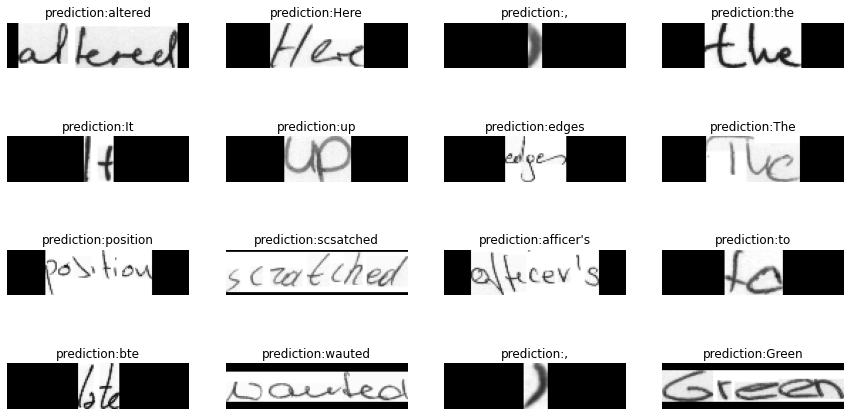

In [47]:
def decode_batch_prediction(pred):
  input_len=np.ones(pred.shape[0])*pred.shape[1]
  results=keras.backend.ctc_decode(pred,input_length=input_len,greedy=True)[0][0][:,:max_len]
  output_text=[]
  for res in results:
    res=tf.gather(res,tf.where(tf.math.not_equal(res,-1)))
    res=tf.strings.reduce_join(num_to_char(res)).numpy().decode("utf-8")
    output_text.append(res)
  return output_text

for batch in test_ds.take(1):
  batch_image=batch["image"]
  _,ax=plt.subplots(4,4,figsize=(15,8))
  preds=prediction_model.predict(batch_image)
  pred_texts=decode_batch_prediction(preds)

  for i in range(16):
    img=batch_image[i]
    img=tf.image.flip_left_right(img)
    img=tf.transpose(img,perm=[1,0,2])
    img=(img*255.0).numpy().clip(0,255).astype(np.uint8)
    img=img[:,:,0]

    title=f"prediction:{pred_texts[i]}"
    ax[i//4,i%4].imshow(img,cmap="gray")
    ax[i//4,i%4].set_title(title)
    ax[i//4,i%4].axis("off")

plt.show()